In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import fsolve, root_scalar
import scipy.special as sp
import IGM

r0 = 2.818e-13 # classical electron radius in cm
m_e = 9.10938e-28 # electron mass in gram
c = 2.998e10 # speed of light in cm/s
h = 6.6261e-27 # planck constant in cm^2 g s-1
eV_to_erg = 1.6022e-12
parsec_to_cm = 3.085677581e18 # cm per parsec

kB = 1.3808e-16 # boltzmann constant in cm^2 g s^-2 K^-1
T_CMB = 2.725 # CMB temperature today in K

H_0 = 2.184e-18 # current hubble constant in s^-1
H_r = 3.24076e-18 # 100 km/s/Mpc to 1/s
h_0 = H_0 / H_r
omega_b_0 = 0.0224 / h_0 / h_0  # current baryon abundance
m_p = 1.67262193269e-24 # proton mass in g
G = 6.6743e-8 # gravitational constant in cm^3 g^-1 s^-2
f_He = 0.079 # helium mass fraction
f_H = 0.76 # hydrogen fraction
Y_He = 0.24

E_e = m_e * c * c
rho_crit = 3 * H_0 * H_0 / 8 / np.pi / G
e = 4.80326e-10 # electron charge in esu

z = 2
z2 = (1 + z) / 3
T_CMB *= 1 + z 

T_IGM = 9245.6 # IGM temperature at z = 2 in K

In [2]:
omega_b = omega_b_0 * (1 + z)**3
mean_n_b = 3 * omega_b * H_0 * H_0 / (8 * np.pi * G * m_p) # mean number density of baryons at the redshift
n_b = mean_n_b # for mean density
    
n_H = n_b * (1 - Y_He) # nuclei in hydrogen
n_He = n_H * f_He # nuclei in helium, assume He is all 4He

n_e = n_H + 2 * n_He # for fully ionized

In [5]:
omega_p = c * np.sqrt(4 * np.pi * r0 * n_e)
Npoints = 100
k = omega_p/c*np.exp(.01*np.sinh(7.5*(np.linspace(0,1,Npoints)-.3))) # for final version, can have Npoints = 100
theta_deg = np.array([10, 45, 80])
theta_rad = np.radians(theta_deg)

In [6]:
print(omega_p/c, k[0], theta_rad[0])

4.6007454504527044e-09 4.389900939300635e-09 0.17453292519943295


In [7]:
n = n_e + n_H + n_He

B = np.sqrt(8 * np.pi * kB * T_IGM * n) # equipartion field

omega_c = e * B / (m_e * c)

In [8]:
print(B, omega_c)

1.924794461998326e-08 0.3385322193458688


In [9]:
def dispersion(omega, k, theta_rad):
    res = omega**2 - omega_p**2 / (1 - omega_c**2 / omega**2) - c**2 * k**2 * np.cos(theta_rad)**2 - 1 / (1 - omega_c**2 / omega**2) * omega_c**2 * omega_p**4 / ((omega**2 - c**2 * k**2) * (omega**2 - omega_c**2) - omega_p**2 * omega**2) - c**4 * k**4 * np.sin(theta_rad)**2 * np.cos(theta_rad)**2 / (omega**2 - omega_p**2 - c**2 * k**2 * np.sin(theta_rad)**2)
    return res

In [10]:
# grid has shape (len(k), len(angle)), same row same k, same col same angle
omega = np.zeros((len(k), len(theta_rad)))

for i in range(len(k)):
    for j in range(len(theta_rad)):
        dispersion_fixed = lambda omega: dispersion(omega, k[i], theta_rad[j])
        #initial_guess = omega_p/10
        #omega[i][j] = fsolve(dispersion_fixed, initial_guess)[0]
        omega[i][j] = root_scalar(dispersion_fixed, method='bisect', bracket=[.998*omega_p, 1.002*omega_p]).root

In [11]:
print(omega_p)
print(omega)
print(np.amin(omega)/omega_p, np.amax(omega)/omega_p)

137.9303486045721
[[137.93034737 137.93032817 137.93030897]
 [137.93034747 137.93032976 137.93031206]
 [137.93034756 137.93033123 137.93031491]
 [137.93034764 137.93033259 137.93031754]
 [137.93034771 137.93033384 137.93031997]
 [137.93034778 137.930335   137.93032222]
 [137.93034785 137.93033608 137.9303243 ]
 [137.93034791 137.93033707 137.93032623]
 [137.93034796 137.93033799 137.93032802]
 [137.93034802 137.93033885 137.93032968]
 [137.93034806 137.93033964 137.93033123]
 [137.93034811 137.93034038 137.93033266]
 [137.93034815 137.93034107 137.930334  ]
 [137.93034819 137.93034172 137.93033525]
 [137.93034823 137.93034232 137.93033641]
 [137.93034826 137.93034288 137.93033751]
 [137.93034829 137.93034341 137.93033853]
 [137.93034832 137.93034391 137.9303395 ]
 [137.93034835 137.93034438 137.93034041]
 [137.93034838 137.93034482 137.93034127]
 [137.9303484  137.93034524 137.93034208]
 [137.93034843 137.93034564 137.93034286]
 [137.93034845 137.93034603 137.9303436 ]
 [137.93034847 1

In [12]:
test = np.zeros((len(k), len(theta_rad)))
for i in range(len(k)):
    for j in range(len(theta_rad)):
        test[i][j] = dispersion(omega[i][j], k[i], theta_rad[j])
        
print(np.min(test), np.max(test))

-1.8397258827462792e-08 1.8335413187742233e-08


In [13]:
def get_eigen(omega, k, theta_rad):
    zeta_x = np.sin(theta_rad) # for now, as zeta will be canceled out later
    zeta_y = 1j * omega_c * omega_p**2 * omega / ((omega**2 - c**2 * k**2) * (omega**2 - omega_c**2) - omega_p**2 * omega**2) * zeta_x
    zeta_z = -c**2 * k**2 * np.sin(theta_rad) * np.cos(theta_rad) / (omega**2 - omega_p**2 - c**2 * k**2 * np.sin(theta_rad)**2) * zeta_x
    return zeta_x, zeta_y, zeta_z

In [14]:
def get_D(i, j):
    omega_ij = omega[i][j]
    zeta_x, zeta_y, zeta_z = get_eigen(omega_ij, k[i], theta_rad[j])
    mag2_zeta = zeta_x**2 + np.abs(zeta_y)**2 + zeta_z**2
    
    add1 = 2 * omega_ij * mag2_zeta
    co1 = omega_p**2 * omega_c**2 / (omega_ij**3 * (1 - omega_c**2 / omega_ij**2)**2)
    co2 = 2 * (zeta_x**2 + np.abs(zeta_y)**2) + 2*zeta_x*zeta_y.imag / omega_c * omega_ij * (1 + omega_c**2 / omega_ij**2)
    return add1 + co1 * co2 # co2 is always xxx + 0j, only real part make sense

In [15]:
D = np.zeros((len(k), len(theta_rad)))
for i in range(len(k)):
    for j in range(len(theta_rad)):
        D[i][j] = get_D(i, j)

In [16]:
print(2*omega_p)
print(D)

275.8606972091442
[[275.86040202 275.86139746 275.8623929 ]
 [275.86043114 275.86140822 275.8623853 ]
 [275.86045767 275.86141806 275.86237844]
 [275.86048189 275.86142707 275.86237225]
 [275.86050403 275.86143534 275.86236664]
 [275.8605243  275.86144293 275.86236155]
 [275.86054289 275.8614499  275.86235692]
 [275.86055996 275.86145633 275.8623527 ]
 [275.86057565 275.86146226 275.86234886]
 [275.86059011 275.86146773 275.86234534]
 [275.86060346 275.86147279 275.86234212]
 [275.86061579 275.86147747 275.86233916]
 [275.86062721 275.86148182 275.86233643]
 [275.8606378  275.86148586 275.86233392]
 [275.86064765 275.86148962 275.8623316 ]
 [275.86065682 275.86149313 275.86232945]
 [275.86066539 275.86149642 275.86232745]
 [275.8606734  275.8614995  275.86232559]
 [275.86068093 275.86150239 275.86232385]
 [275.86068802 275.86150512 275.86232222]
 [275.86069472 275.8615077  275.86232068]
 [275.86070107 275.86151015 275.86231924]
 [275.86070712 275.86151249 275.86231786]
 [275.8607129  2

In [17]:
IGM_00 = IGM.IGM_N(0,0) # mean density
#n_CRe = IGM_00.back_Euler() # number density of CRe, shape (399, 399)
E = IGM.E
gamma = E / E_e + 1

In [ ]:
np.save('n_CRe.npy', n_CRe)

In [19]:
n_CRe = np.load('n_CRe.npy')

In [20]:
v = c * np.sqrt(E * (E + 2 * E_e)) / (E + E_e) # shape (400, )
p = gamma * m_e * v # shape (400, )
omega_s = omega_c / gamma # shape (400, )

In [21]:
print(IGM_00.z[240], IGM_00.z[120])
n_CRe_z2 = n_CRe[:, 240] # number density of CRe at z = 2, shape (399,)
fCR = n_CRe_z2/(IGM.E_plus-IGM.E_minus)[1:,0]/4./np.pi/p[1:]/(m_e+E[1:]/c**2)
print(np.shape(n_CRe_z2), np.shape(IGM.E_plus), np.shape(fCR))
n_CRe_z2 = np.insert(n_CRe_z2, 0, 0) # insert 0 at beginning for calculation, shape (400, )
fCR = np.insert(fCR, 0, 0) # insert 0 at beginning for calculation, shape (400, )

2.0083681725319145 5.925838073724545
(399,) (400, 1) (399,)


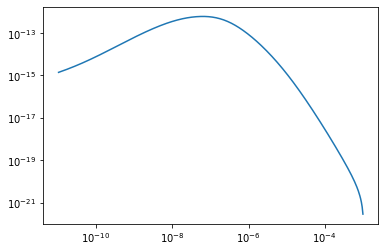

In [22]:
plt.plot(IGM.E[1:], 4.*np.pi*p[1:]**3*np.log(10)*fCR[1:])
plt.yscale('log')
plt.xscale('log')
plt.show()

In [23]:
def get_n_Bessel(omega, k_para, omega_s, v_):
    # cos(alpha) = (omega - n * omega_s) / k_parallel / v
    n_b1 = (omega - k_para * v_) / omega_s
    n_b2 = (omega + k_para * v_) / omega_s
    
    lower_bound = int(min(n_b1, n_b2)) + 1
    upper_bound = int(max(n_b1, n_b2))
    
    #print((omega - n_b1 * omega_s) / k_para / c)
    #print((omega - n_b2 * omega_s) / k_para / c)
    
    return np.array(range(lower_bound, upper_bound + 1))

In [24]:
uu_ = get_n_Bessel(omega[0][0], k[0]*np.cos(theta_rad[0]), omega_s[0], v[0])
print(omega[0][0], k[0]*np.cos(theta_rad[0]), omega_s[0], v[0], uu_[0], uu_[-1])

137.93034737233606 4.32320847997884e-09 0.33852808465897083 148172159.3538325 406 409


In [25]:
def get_Bessel(omega, n_Bessel, omega_s, k_para, k_orth, k, theta_rad, v_):
    cosa = (omega - n_Bessel * omega_s) / k_para / v_
    sina = np.sqrt(1 - cosa**2)
    
    z_Bessel = k_orth * v_ * sina / omega_s
    #print(z_Bessel)
    Jnz = sp.jv(n_Bessel, z_Bessel)
    Jnz_p = sp.jvp(n_Bessel, z_Bessel, n=1)
    
    zeta_x, zeta_y, zeta_z = get_eigen(omega, k, theta_rad)
    
    res_v = n_Bessel / z_Bessel * Jnz * zeta_x * sina + Jnz * zeta_z * cosa + Jnz_p * zeta_y / 1j * sina
    #print(res_v)
    res = res_v.real**2
    #print(res)
    
    return res

In [26]:
get_Bessel(omega[0][0], 407, omega_s[0], k[0]*np.cos(theta_rad[0]), k[0]*np.sin(theta_rad[0]), k[0], theta_rad[0], v[0])

0.0

In [27]:
def get_int(i, j):
    k_para = k[i] * np.cos(theta_rad[j])
    k_orth = k[i] * np.sin(theta_rad[j])
    
    int_sum = 0
    for pi in range(len(p)-1):
        Delta = omega_s[pi] / (np.abs(k_para) * c)
        co1 = p[pi]**2 * (fCR[pi+1] - fCR[pi]) * m_e * c * Delta / omega_s[pi]
        
        n_Bessel = get_n_Bessel(omega[i][j], k_para, omega_s[pi], v[pi])
        if np.size(n_Bessel)>0:
            sum_Bessel = sum(get_Bessel(omega[i][j], ni_Bessel, omega_s[pi], k_para, k_orth, k[i], theta_rad[j], v[pi]) for ni_Bessel in n_Bessel)
            int_sum = int_sum + co1 * sum_Bessel
            print(pi, co1 * sum_Bessel, k[i]*v[pi]/omega[i,j], k_orth*v[pi]/omega_s[pi], n_Bessel.shape, n_Bessel[0], n_Bessel[-1])
        
    return int_sum

In [28]:
def get_damp_rate(i, j):
    res = 2 * np.pi**2 * omega_p**2 * omega[i][j] / (D[i][j] * n_e) * get_int(i,j)
    return res

In [121]:
print(get_damp_rate(2, 0)) # k = 1.1 omega_p/c, theta = 5 degree

0 0.0 0.005436603557105346 0.1930584454276291 (4,) 406 409
1 -0.0 0.005563556971445411 0.19756678384110357 (4,) 406 409
2 -0.0 0.005693474835235818 0.20218040322936148 (4,) 406 409
3 -0.0 0.0058264263620595265 0.20690176226523607 (4,) 406 409
4 -0.0 0.005962482380890632 0.21173337704711173 (4,) 406 409
5 -0.0 0.00610171537375348 0.21667782244068368 (5,) 405 409
6 -0.0 0.006244199514256529 0.22173773345210163 (5,) 405 409
7 -0.0 0.006390010707021165 0.22691580663323654 (6,) 405 410
8 -0.0 0.006539226628026144 0.2322148015198294 (6,) 405 410
9 -0.0 0.0066919267658883804 0.2376375421032851 (6,) 405 410
10 -0.0 0.0068481924641018285 0.24318691833691097 (6,) 405 410
11 -0.0 0.007008106964256222 0.24886588767740328 (6,) 405 410
12 -0.0 0.007171755450258117 0.2546774766624116 (6,) 405 410
13 -0.0 0.007339225093577296 0.26062478252503485 (6,) 405 410
14 -0.0 0.007510605099541712 0.2667109748461079 (6,) 405 410
15 -0.0 0.007685986754705002 0.27293929724517424 (6,) 405 410
16 -0.0 0.007865463475

158 -0.0 0.20582400205897688 7.4403045320392405 (170,) 330 499
159 -0.0 0.21049908229781983 7.615653335198026 (174,) 329 502
160 -0.0 0.2152741479595703 7.795211426264033 (178,) 327 504
161 -0.0 0.22015090258798398 7.979085268426223 (183,) 325 507
162 -0.0 0.22513104748349444 8.167384391216496 (187,) 323 509
163 -0.0 0.23021627901495256 8.360221503059915 (191,) 322 512
164 -0.0 0.23540828572250688 8.557712609310023 (195,) 320 514
165 -0.0 0.24070874520097912 8.759977136092688 (200,) 318 517
166 -0.0 0.24611932075291926 8.967138060302368 (205,) 316 520
167 -0.0 0.25164165780039804 9.179322046116537 (210,) 314 523
168 -0.0 0.2572773800445239 9.396659588417037 (215,) 312 526
169 -0.0 0.26302808536166267 9.619285163531547 (220,) 310 529
170 -0.0 0.268895341425405 9.847337387734353 (225,) 308 532
171 -0.0 0.27488068104348307 10.080959183973308 (231,) 306 536
172 -0.0 0.28098559719908583 10.320297957319015 (236,) 304 539
173 -0.0 0.2872115377863795 10.565505779663265 (241,) 302 542
174 -0.0 

276 -7.908296915277294e-20 1.079269402064841 198.34308089860463 (4533,) -157 4375
277 -6.999675563442976e-20 1.080777196131627 206.1914845149185 (4712,) -166 4545
278 -6.18589724007354e-20 1.0821860145848992 214.3996438010878 (4900,) -176 4723
279 -5.463614007789765e-20 1.0835012176315808 222.98482798992526 (5097,) -186 4910
280 -4.82149051347464e-20 1.0847279933953375 231.96512277357067 (5301,) -196 5104
281 -4.2491712876941606e-20 1.0858713507447537 241.3594683782393 (5517,) -207 5309
282 -3.743391122646628e-20 1.0869361138173248 251.1876994572614 (5741,) -218 5522
283 -3.2932058955575873e-20 1.0879269181219586 261.47058688982605 (5977,) -230 5746
284 -2.8943573386953495e-20 1.0888482080982462 272.2298815767513 (6222,) -241 5980
285 -2.542768657260689e-20 1.0897042360084241 283.4883603286895 (6480,) -254 6225
286 -2.230211037024523e-20 1.0904990620374877 295.2698739464661 (6749,) -267 6481
287 -1.9548152518244472e-20 1.0912365554781323 307.59939759775415 (7031,) -280 6750
288 -1.7121

373 -1.3292739759063472e-26 1.0999959506610881 14403.596842601555 (329267,) -14393 314873
374 -1.1007155205912325e-26 1.0999963065240512 15082.3175832761 (344782,) -15071 329710
375 -9.10362879911061e-27 1.0999966311163931 15793.107260447841 (361031,) -15782 345248
376 -7.5242953744827e-27 1.0999969271811734 16537.481122354355 (378048,) -16526 361521
377 -6.215838021322677e-27 1.0999971972214433 17317.02601138467 (395868,) -17305 378562
378 -5.127905118356801e-27 1.0999974435211715 18133.403746880005 (414531,) -18121 396409
379 -4.2284169451549356e-27 1.099997668164346 18988.35466776892 (434075,) -18975 415099
380 -3.481033390854298e-27 1.0999978730524267 19883.701342589342 (454543,) -19870 434672
381 -2.862533705075401e-27 1.0999980599202792 20821.352454806176 (475977,) -20807 455169
382 -2.3515370463053767e-27 1.0999982303507236 21803.306871706987 (498424,) -21788 476635
383 -1.927860794247345e-27 1.099998385787822 22831.657905549982 (521933,) -22816 499116
384 -1.578736035976339e-27

In [122]:
print(get_damp_rate(2, 2)) # k = 1.1 omega_p/c, theta = 85 degree

39 -0.0 0.013374722644652509 5.429016559833353 (1,) 407 407
40 -0.0 0.013687013944274278 5.555800061654205 (1,) 407 407
41 -0.0 0.014006595314427854 5.685544565646607 (1,) 407 407
42 -0.0 0.014333636808891062 5.818319242215819 (1,) 407 407
43 -0.0 0.014668312439334837 5.954194878826141 (1,) 407 407
44 -0.0 0.01501080026680126 6.09324391789075 (2,) 407 408
45 -0.0 0.015361282495250183 6.2355404955556315 (2,) 407 408
46 -0.0 0.015719945567217473 6.381160481398949 (2,) 407 408
47 -0.0 0.016086980261629132 6.530181519068055 (2,) 407 408
48 -0.0 0.016462581793816402 6.682683067876852 (2,) 407 408
49 -0.0 0.01684694991777667 6.838746445386558 (2,) 407 408
50 -0.0 0.01724028903072671 6.998454870993892 (2,) 407 408
51 -0.0 0.017642808279994728 7.16189351055104 (2,) 407 408
52 -0.0 0.018054721672298324 7.3291495220424485 (2,) 407 408
53 -0.0 0.018476248185456793 7.500312102344433 (2,) 407 408
54 -0.0 0.018907611882585374 7.675472535093685 (2,) 407 408
55 -0.0 0.019349042028820825 7.854724239692

246 -2.654262636418717e-25 0.9595353324425825 796.508617506557 (139,) 764 902
247 -5.675378201148887e-24 0.9665342413285237 821.691390931954 (144,) 782 925
248 -9.139848734360143e-23 0.9733037326211158 847.8768710236293 (148,) 801 948
249 -1.0927260196320416e-21 0.9798427729256974 875.1127670281702 (154,) 820 973
250 -9.530421065160441e-21 0.986150957399467 903.4491798325612 (158,) 841 998
251 -5.909306650964884e-20 0.9922284973581956 932.9387155925938 (163,) 863 1025
252 -2.507016894029206e-19 0.9980762039261911 963.6366042843596 (169,) 885 1053
253 -6.887303587642949e-19 1.0036954679719976 995.6008234011035 (174,) 909 1082
254 -1.1235045736189257e-18 1.0090882366138345 1028.8922270314365 (180,) 934 1113
255 -9.795320223498547e-19 1.0142569866147089 1063.5746805694198 (186,) 960 1145
256 -6.1626711787968255e-19 1.0192046950168987 1099.715201322374 (193,) 987 1179
257 -7.501646511089662e-19 1.0239348073887213 1137.3841052983973 (199,) 1016 1214
258 -6.137355669748183e-19 1.028451204072

346 -1.8240961557652188e-24 1.0999511443017371 47649.384728419886 (8337,) 39317 47653
347 -1.524727923304728e-24 1.0999553658655068 49879.886853798824 (8728,) 41157 49884
348 -1.2775121624965615e-24 1.0999592198518664 52215.77032791605 (9137,) 43084 52220
349 -1.0620327897203154e-24 1.0999627380722168 54662.01473419821 (9565,) 45102 54666
350 -9.026347287676588e-25 1.099965949609735 57223.834922319635 (10013,) 47216 57228
351 -7.466817633949088e-25 1.0999688810501789 59906.6921250498 (10482,) 49430 59911
352 -6.256962151856262e-25 1.0999715566935697 62716.30560034202 (10974,) 51748 62721
353 -5.2446813491687655e-25 1.0999739987482846 65658.66482348122 (11489,) 54175 65663
354 -4.408796834115862e-25 1.0999762275089817 68740.04225528083 (12027,) 56718 68744
355 -3.6647730172001167e-25 1.09997826151966 71967.00671354745 (12593,) 59380 71972
356 -3.0766129709349135e-25 1.0999801177230606 75346.43737631894 (13184,) 62168 75351
357 -2.5341212529648046e-25 1.099981811597528 78885.53844672668 

### ignore the following part, didn't finish running

In [29]:
import time

damp_rate = np.zeros((len(k), len(theta_rad)))
time_start = time.time()
for j in range(len(theta_rad)):
    for i in range(len(k)):
        print(f'i = {i}, j = {j}, {(time.time() - time_start)/60}')
        damp_rate[i][j] = get_damp_rate(i, j)
        np.save('damp_rate.npy', damp_rate)

i = 0, j = 0, 4.315376281738282e-06
0 0.0 0.0047158664783878606 0.3336543998614745 (4,) 406 409
1 -0.0 0.004825989525749063 0.3414459623822871 (4,) 406 409
2 -0.0 0.004938684021928063 0.34941947737029366 (4,) 406 409
3 -0.0 0.005054010004779797 0.35757919404135646 (4,) 406 409
4 -0.0 0.005172028913395996 0.3659294608573858 (4,) 406 409
5 -0.0 0.005292803620771776 0.3744747278452447 (4,) 406 409
6 -0.0 0.005416398467231023 0.3832195489698922 (4,) 406 409
7 -0.0 0.005542879294628086 0.39216858456304377 (4,) 406 409
8 -0.0 0.005672313481343701 0.4013266038086609 (4,) 406 409
9 -0.0 0.0058047699780931425 0.4106984872865875 (4,) 406 409
10 -0.0 0.005940319344565441 0.4202892295757149 (4,) 406 409
11 -0.0 0.006079033786912564 0.430103941918066 (4,) 406 409
12 -0.0 0.006220987196108023 0.4401478549452296 (5,) 405 409
13 -0.0 0.006366255187194904 0.4504263214686226 (5,) 405 409
14 -0.0 0.00651491513944344 0.46094481933506476 (6,) 405 410
15 -0.0 0.006667046237438952 0.47170895434921134 (6,) 40

151 -0.0 0.15245540779938718 10.9266846841381 (124,) 351 474
152 -0.0 0.15594472034529683 11.183552859788625 (127,) 350 476
153 -0.0 0.15951052662509094 11.446541598945108 (130,) 349 478
154 -0.0 0.16315426604756475 11.715802554332004 (132,) 348 479
155 -0.0 0.1668773880563126 11.991491541467255 (136,) 346 481
156 -0.0 0.1706813508261036 12.273768679915353 (139,) 345 483
157 -0.0 0.1745676198362629 12.562798540935129 (142,) 344 485
158 -0.0 0.17853766631355547 12.858750301885971 (146,) 342 487
159 -0.0 0.18259296553678442 13.16179790777951 (149,) 341 489
160 -0.0 0.1867349949950331 13.472120240388156 (152,) 340 491
161 -0.0 0.19096523239121066 13.789901295347738 (157,) 338 494
162 -0.0 0.19528515348230394 14.11533036771941 (160,) 337 496
163 -0.0 0.19969622974750306 14.448602246505233 (164,) 335 498
164 -0.0 0.20419992587515615 14.789917418643405 (167,) 334 500
165 -0.0 0.20879769705931975 15.139482283042117 (172,) 332 503
166 -0.0 0.21349098609652237 15.497509375246377 (175,) 331 505


272 -9.948379215439115e-157 0.9300014658167407 294.19793679264615 (3337,) 154 3490
273 -5.160233374863138e-157 0.9317019605159395 305.5473618715868 (3466,) 156 3621
274 -1.5764458621718516e-157 0.933296690860938 317.4120507058275 (3600,) 159 3758
275 -2.8163969051753385e-158 0.9347908087264574 329.816804860313 (3741,) 162 3902
276 -2.925918734461984e-159 0.9361893580957074 342.78760236214407 (3888,) 165 4052
277 -1.754856806257079e-160 0.9374972620878194 356.3516523195103 (4042,) 168 4209
278 -6.019177852862084e-162 0.9387193117826582 370.53745214053316 (4203,) 172 4374
279 -1.170895895602528e-163 0.9398601567780622 385.37484747893376 (4371,) 176 4546
280 -1.2780958161646378e-165 0.9409242974018968 400.89509503909323 (4547,) 181 4727
281 -7.736007866410078e-168 0.9419160784910079 417.13092837896136 (4731,) 185 4915
282 -2.5666211448195467e-170 0.942839684641175 434.1166268554378 (4924,) 190 5113
283 -4.5995927360105204e-173 0.9436991368263095 451.88808786329935 (5126,) 195 5320
284 -4.

387 -0.0 0.9541707061605552 47448.32576855722 (538185,) 17276 555460
388 -0.0 0.9541707912268451 49687.045985499506 (563578,) 18091 581668
389 -0.0 0.9541708688049149 52031.544217386974 (590171,) 18944 609114
390 -0.0 0.9541709395533389 54486.81842223072 (618020,) 19838 637857
391 -0.0 0.9541710040728477 57058.10270821853 (647186,) 20774 667959
392 -0.0 0.9541710629114001 59750.87849169028 (677728,) 21755 699482
393 -0.0 0.954171116568809 62570.88618231988 (709715,) 22781 732495
394 -0.0 0.9541711655009654 65524.13742041433 (743211,) 23857 767067
395 -0.0 0.9541712101236904 68616.92789241702 (778292,) 24983 803274
396 -0.0 0.9541712508162518 71855.85075193585 (815029,) 26162 841190
397 -0.0 0.9541712879245723 75247.81067490659 (853503,) 27397 880899
398 -0.0 0.9541713217641571 78800.03857885307 (893795,) 28690 922484
i = 1, j = 0, 10.139749379952748
0 0.0 0.004732413030242672 0.33482509266071014 (4,) 406 409
1 -0.0 0.004842922466133304 0.342643993427749 (4,) 406 409
2 -0.0 0.0049560123

149 -0.0 0.14621178275955196 10.4673216879146 (119,) 353 471
150 -0.0 0.14956410124216007 10.713247576701603 (122,) 352 473
151 -0.0 0.1529903278023728 10.965023129800885 (124,) 351 474
152 -0.0 0.15649188329265823 11.222792578516328 (127,) 350 476
153 -0.0 0.1600702009102485 11.486704065951685 (130,) 349 478
154 -0.0 0.16372672511438982 11.756909776935144 (134,) 347 480
155 -0.0 0.16746291043433656 12.03356607369437 (137,) 346 482
156 -0.0 0.17128022016115288 12.316833637605184 (139,) 345 483
157 -0.0 0.17518012491608848 12.606877617357398 (143,) 343 485
158 -0.0 0.17916410108799888 12.903867783902799 (146,) 342 487
159 -0.0 0.18323362913199523 13.207978692573684 (150,) 341 490
160 -0.0 0.187390191721224 13.519389852784718 (154,) 339 492
161 -0.0 0.19163527174340778 13.838285905757 (157,) 338 494
162 -0.0 0.1959703501335192 14.164856810731047 (161,) 336 496
163 -0.0 0.20039690353372458 14.499298040164856 (164,) 335 498
164 -0.0 0.2049164017715214 14.841810784444915 (169,) 333 501
165 

272 -5.348940727951376e-148 0.9332645602130111 295.2301887464526 (3349,) 148 3496
273 -4.9765269749023446e-148 0.9349710214347668 306.6194355397806 (3478,) 150 3627
274 -2.8078815974922652e-148 0.9365713472071315 318.52575399373916 (3612,) 153 3764
275 -9.555170085165937e-149 0.9380707074811991 330.97403269449467 (3754,) 155 3908
276 -1.953365856666657e-149 0.939474163937994 343.99034081822083 (3902,) 158 4059
277 -2.3857840826954512e-150 0.9407866569703865 357.60198294167316 (4057,) 161 4217
278 -1.727730480272814e-151 0.9420129944686944 371.83755646179526 (4217,) 165 4381
279 -7.370705976781553e-153 0.9431578423447908 386.7270117517185 (4386,) 169 4554
280 -1.8363809697639532e-154 0.9442257167168334 402.30171518618556 (4563,) 173 4735
281 -2.645874479370402e-156 0.945220977666389 418.59451517534245 (4748,) 177 4924
282 -2.1839089479731243e-158 0.9461478244717202 435.63981135202806 (4942,) 181 5122
283 -1.0198584138399467e-160 0.9470102922151226 453.4736270641657 (5144,) 186 5329
284 

386 -0.0 0.957518509521262 45469.59239190748 (515742,) 15596 531337
387 -0.0 0.9575186031250225 47614.8076532142 (540074,) 16332 556405
388 -0.0 0.9575186884897842 49861.38286514102 (565556,) 17102 582657
389 -0.0 0.9575187663400521 52214.10723520929 (592242,) 17909 610150
390 -0.0 0.957518837336711 54677.99625775947 (620189,) 18754 638942
391 -0.0 0.9575189020825992 57258.30240588861 (649456,) 19639 669094
392 -0.0 0.9575189611275982 59960.52632857558 (680106,) 20566 700671
393 -0.0 0.9575190149732749 62790.428576862985 (712205,) 21536 733740
394 -0.0 0.9575190640771194 65754.04188409307 (745819,) 22553 768371
395 -0.0 0.9575191088564119 68857.6840263768 (781023,) 23617 804639
396 -0.0 0.9575191496917513 72107.97129071239 (817889,) 24732 842620
397 -0.0 0.9575191869302737 75511.83257946391 (856497,) 25900 882396
398 -0.0 0.9575192208885914 79076.52418126698 (896931,) 27122 924052
i = 2, j = 0, 20.277531715234122
0 0.0 0.004747834078521915 0.3359161544313865 (4,) 406 409
1 -0.0 0.00485

152 -0.0 0.15700182798094803 11.259363194671009 (127,) 350 476
153 -0.0 0.16059180590975516 11.524134664649774 (131,) 348 478
154 -0.0 0.16426024526921493 11.795220868547098 (134,) 347 480
155 -0.0 0.1680086053283129 12.072778678112941 (137,) 346 482
156 -0.0 0.17183835414639576 12.356969298319806 (140,) 345 484
157 -0.0 0.1757509671368818 12.647958416011377 (144,) 343 486
158 -0.0 0.1797479254995895 12.945916355355434 (147,) 342 488
159 -0.0 0.18383071451384336 13.251018240490659 (151,) 340 490
160 -0.0 0.18800082168423074 13.563444165781474 (154,) 339 492
161 -0.0 0.19225973473061445 13.883379374121276 (157,) 338 494
162 -0.0 0.19660893941374402 14.21101444375216 (161,) 336 496
163 -0.0 0.20104991718757423 14.546545484099106 (165,) 335 499
164 -0.0 0.20558414266918465 14.890174341148024 (169,) 333 501
165 -0.0 0.21021308091700383 15.242108812930493 (172,) 332 503
166 -0.0 0.21493818450789293 15.602562875713538 (177,) 330 506
167 -0.0 0.21976089040353192 15.97175692153081 (182,) 328 5

273 -8.384926099662544e-140 0.9380177194235304 307.6185862951956 (3490,) 144 3633
274 -8.213003983738675e-140 0.9396232600198845 319.56370270420393 (3624,) 147 3770
275 -4.988505784215678e-140 0.9411275061116158 332.052545392841 (3766,) 149 3914
276 -1.8743446709704998e-140 0.9425355358737498 345.11126848635416 (3914,) 152 4065
277 -4.3395974238827454e-141 0.9438523057979286 358.76726553625184 (4069,) 155 4223
278 -6.154416069202248e-142 0.9450826394414686 373.04922712701716 (4231,) 158 4388
279 -5.321116055664896e-143 0.9462312179205911 387.9872012281321 (4401,) 161 4561
280 -2.7855384681855953e-144 0.9473025720696823 403.61265642487575 (4578,) 165 4742
281 -8.758881756552272e-146 0.9483010761780777 419.95854816729457 (4763,) 169 4931
282 -1.6419863424410628e-147 0.949230943207815 437.0593881829453 (4958,) 173 5130
283 -1.8160526193048266e-149 0.9500962213899142 454.95131720551075 (5160,) 178 5337
284 -1.1731884305166156e-151 0.9509007920928676 473.67218117818175 (5372,) 183 5554
285 

387 -0.0 0.9606387746976858 47769.96536835348 (541834,) 15452 557285
388 -0.0 0.9606388603406173 50023.861275121904 (567398,) 16181 583578
389 -0.0 0.9606389384445679 52384.252237907946 (594172,) 16944 611115
390 -0.0 0.9606390096725768 54856.17009455277 (622209,) 17744 639952
391 -0.0 0.9606390746294462 57444.88443387359 (651572,) 18581 670152
392 -0.0 0.9606391338668493 60155.91382927595 (682322,) 19458 701779
393 -0.0 0.9606391878879873 62995.03760314652 (714525,) 20376 734900
394 -0.0 0.9606392371518419 65968.30814710545 (748249,) 21338 769586
395 -0.0 0.9606392820770525 69082.06382438264 (783567,) 22345 805911
396 -0.0 0.9606393230454578 72342.94248182335 (820555,) 23399 843953
397 -0.0 0.9606393604053257 75757.89560032793 (859289,) 24504 883792
398 -0.0 0.9606393944743001 79334.2031138898 (899853,) 25661 925513
i = 3, j = 0, 30.445215984185538
0 0.0 0.004762207215349232 0.33693307493012037 (4,) 406 409
1 -0.0 0.004873412393257288 0.34480120170961914 (4,) 406 409
2 -0.0 0.00498721

154 -0.0 0.1647575109574207 11.830928594210436 (134,) 347 480
155 -0.0 0.16851721844170592 12.109326655792767 (137,) 346 482
156 -0.0 0.17235856107348702 12.394377607553869 (141,) 344 484
157 -0.0 0.17628301873270716 12.68624763792197 (144,) 343 486
158 -0.0 0.18029207710322692 12.98510758668797 (147,) 342 488
159 -0.0 0.18438722596076262 13.291133108144646 (151,) 340 490
160 -0.0 0.1885699573130303 13.604504841856919 (154,) 339 492
161 -0.0 0.19284176338367282 13.925408591504826 (158,) 337 494
162 -0.0 0.19720413443128917 14.25403551226885 (162,) 336 497
163 -0.0 0.20165855639464553 14.590582307256915 (166,) 334 499
164 -0.0 0.20620650835493554 14.935251433504202 (169,) 333 501
165 -0.0 0.21084945980576494 15.288251318110213 (174,) 331 504
166 -0.0 0.2155888677213865 15.6497965851133 (177,) 330 506
167 -0.0 0.2204261734136 16.020108293740915 (182,) 328 509
168 -0.0 0.22536279916767105 16.399414188714125 (186,) 327 512
169 -0.0 0.23040014464761382 16.787948963327427 (190,) 325 514
170 

275 -4.731426728849834e-132 0.9439765851218715 333.05776957039905 (3778,) 143 3920
276 -3.071800373404366e-132 0.9453888774180567 346.1560253955951 (3926,) 146 4071
277 -1.2635521386192036e-132 0.9467096336050191 359.85336330733435 (4081,) 149 4229
278 -3.2784458788826256e-133 0.9479436918424495 374.17856074523644 (4244,) 152 4395
279 -5.348643758408856e-134 0.9490957474177308 389.1617566431378 (4414,) 155 4568
280 -5.458134237318401e-135 0.9501703448814619 404.83451485130854 (4592,) 158 4749
281 -3.462198465883941e-136 0.9511718717652821 421.22989058597864 (4778,) 162 4939
282 -1.3573249441623065e-137 0.9521045537851451 438.3825000522142 (4972,) 166 5137
283 -3.2605813079154138e-139 0.9529724514272969 456.32859339270516 (5176,) 170 5345
284 -4.7605575991080327e-141 0.9537794578103118 475.10613112183796 (5389,) 175 5563
285 -4.186676302244841e-143 0.9545292977145038 494.7548642115694 (5611,) 180 5790
286 -2.1918121180753623e-145 0.9552255276696209 515.3164180030952 (5845,) 185 6029
287

388 -0.0 0.9635470061504666 50175.29873737377 (569116,) 15322 584437
389 -0.0 0.9635470844908618 52542.83532243316 (595970,) 16045 612014
390 -0.0 0.9635471559344995 55022.23642722323 (624093,) 16802 640894
391 -0.0 0.9635472210880128 57618.78759321134 (653544,) 17595 671138
392 -0.0 0.9635472805047456 60338.02410020535 (684388,) 18425 702812
393 -0.0 0.9635473346894221 63185.74276636081 (716689,) 19294 735982
394 -0.0 0.9635473841024133 66168.0143057305 (750515,) 20205 770719
395 -0.0 0.9635474291636261 69291.19626970006 (785940,) 21159 807098
396 -0.0 0.9635474702560554 72561.94659989867 (823039,) 22157 845195
397 -0.0 0.9635475077290231 75987.2378214763 (861890,) 23203 885092
398 -0.0 0.9635475419011345 79574.37190700366 (902577,) 24299 926875
i = 4, j = 0, 40.65480002959569
0 0.0 0.004775605517532285 0.3378810244483231 (4,) 406 409
1 -0.0 0.004887123567289583 0.3457712879295729 (4,) 406 409
2 -0.0 0.005001245640129086 0.3538458087922387 (4,) 406 409
3 -0.0 0.005118032534445451 0.36

149 -0.0 0.1475462500869124 10.562856406722796 (120,) 353 472
150 -0.0 0.15092916500574144 10.811026848733004 (122,) 352 473
151 -0.0 0.15438666255735065 11.065100344647579 (126,) 350 475
152 -0.0 0.1579201765622546 11.325222442162266 (129,) 349 477
153 -0.0 0.16153115329840198 11.591542636475475 (131,) 348 478
154 -0.0 0.16522105040854335 11.864214501398674 (134,) 347 480
155 -0.0 0.16899133569734576 12.143395826269717 (138,) 345 482
156 -0.0 0.17284348581125472 12.429248758995262 (141,) 344 484
157 -0.0 0.17677898479380355 12.721939955568915 (144,) 343 486
158 -0.0 0.18079932250877198 13.021640736433401 (148,) 341 488
159 -0.0 0.18490599292330775 13.328527250078755 (151,) 340 490
160 -0.0 0.1891004922428381 13.642780644293053 (154,) 339 492
161 -0.0 0.19338431688932448 13.964587245508534 (159,) 337 495
162 -0.0 0.19775896131415596 14.29413874671415 (162,) 336 497
163 -0.0 0.20222591563673506 14.631632404435202 (166,) 334 499
164 -0.0 0.20678666309959823 14.977271245312709 (170,) 333 

269 -7.927358194212088e-129 0.9359202026394853 266.341518751857 (3021,) 129 3149
270 -1.1134501266224907e-127 0.9379957099290784 276.40890036700125 (3135,) 130 3264
271 -1.015549034969452e-126 0.9399479657206586 286.92935772924125 (3255,) 131 3385
272 -6.017090121629278e-126 0.9417824172549143 297.9247398366467 (3379,) 133 3511
273 -2.3188046038140106e-125 0.9435044532593782 309.4179357128709 (3510,) 134 3643
274 -5.818330410135655e-125 0.9451193851217314 321.4329225367767 (3646,) 136 3781
275 -9.492047917901241e-125 0.946632429978942 333.99481605140534 (3789,) 138 3926
276 -1.007065778221531e-124 0.9480486957097342 347.1299233649908 (3938,) 140 4077
277 -6.940880436755585e-125 0.9493731677976859 360.865798261788 (4093,) 143 4235
278 -3.0981844912411217e-125 0.9506106980144801 375.2312991457446 (4256,) 146 4401
279 -8.941035367664969e-126 0.9517659948575246 390.25664974554184 (4426,) 149 4574
280 -1.661997981921442e-126 0.9528436156633519 405.9735027152477 (4605,) 152 4756
281 -1.98058

381 -0.0 0.9662571031806252 36440.46693863359 (413328,) 10517 423844
382 -0.0 0.9662572528896413 38159.033373834565 (432821,) 11013 443833
383 -0.0 0.9662573894282463 39958.80079679155 (453235,) 11532 464766
384 -0.0 0.9662575139536946 41843.60591840727 (474614,) 12076 486689
385 -0.0 0.9662576275217354 43817.46673138606 (497002,) 12646 509647
386 -0.0 0.9662577310954926 45884.59107571592 (520449,) 13242 533690
387 -0.0 0.9662578255535698 48049.38560886337 (545003,) 13867 558869
388 -0.0 0.9662579116974513 50316.46519980442 (570718,) 14521 585238
389 -0.0 0.9662579902582542 52690.66276691671 (597648,) 15206 612853
390 -0.0 0.966258061902896 55177.03958070537 (625849,) 15924 641772
391 -0.0 0.9662581272397166 57780.89605332536 (655384,) 16675 672058
392 -0.0 0.9662581868236163 60507.78303790225 (686314,) 17462 703775
393 -0.0 0.9662582411607396 63363.51366173839 (718705,) 18286 736990
394 -0.0 0.9662582907127525 66354.17571862994 (752627,) 19149 771775
395 -0.0 0.9662583359007433 69486.

147 -0.0 0.14136733126212359 10.110038786716114 (115,) 355 469
148 -0.0 0.14461379779684094 10.34744399203608 (117,) 354 470
149 -0.0 0.14793220825796946 10.590487210823873 (120,) 353 472
150 -0.0 0.15132397235903217 10.839306828455033 (122,) 352 473
151 -0.0 0.15479051418950757 11.094044941469623 (126,) 350 475
152 -0.0 0.15833327132056307 11.35484747829372 (129,) 349 477
153 -0.0 0.1619536938133867 11.621864325182132 (132,) 348 479
154 -0.0 0.16565324312369703 11.895249457671742 (134,) 347 480
155 -0.0 0.16943339089571113 12.175161077852989 (138,) 345 482
156 -0.0 0.17329561763855325 12.46176175778646 (141,) 344 484
157 -0.0 0.177241411277785 12.75521858941215 (144,) 343 486
158 -0.0 0.1812722655744394 13.055703341320655 (148,) 341 488
159 -0.0 0.18538967840365123 13.363392622779308 (151,) 340 490
160 -0.0 0.18959514988468965 13.678468055430871 (156,) 338 493
161 -0.0 0.19389018035392458 14.001116453108807 (159,) 337 495
162 -0.0 0.1982762681719988 14.331530010241384 (163,) 335 497
1

269 -4.124852964560374e-123 0.938368425142282 267.03822710850307 (3029,) 125 3153
270 -8.058076314478284e-122 0.9404493616379516 277.13194344207085 (3143,) 126 3268
271 -1.0385730096533405e-120 0.9424067242287513 287.67992069904733 (3263,) 127 3389
272 -8.843379865382721e-120 0.9442459744045082 298.7040650311132 (3388,) 128 3515
273 -4.986053498608481e-119 0.9459725149888335 310.22732533607933 (3518,) 130 3647
274 -1.8654480610323474e-118 0.9475916712631769 322.27374151341246 (3656,) 131 3786
275 -4.629710606527009e-118 0.94910867401173 334.86849500506594 (3798,) 133 3930
276 -7.632819938934864e-118 0.9505286444746374 348.03796173461365 (3948,) 135 4082
277 -8.360402960251117e-118 0.9518565811767314 361.8097675627627 (4103,) 138 4240
278 -6.07305452408265e-118 0.9530973485811789 376.21284638259715 (4267,) 140 4406
279 -2.9244772539118055e-118 0.9542556675020893 391.27750098341335 (4438,) 143 4580
280 -9.313622318932291e-119 0.9553361071972822 407.03546681774316 (4617,) 146 4762
281 -1.

380 -0.0 0.968784517746099 34890.467848244865 (395747,) 9527 405273
381 -0.0 0.968784682323401 36535.789582865735 (414410,) 9976 424385
382 -0.0 0.968784832424033 38258.85152294506 (433953,) 10447 444399
383 -0.0 0.9687849693198016 40063.32686004726 (454421,) 10939 465359
384 -0.0 0.9687850941709893 41953.0623413194 (475856,) 11455 487310
385 -0.0 0.9687852080361067 43932.0864699153 (498302,) 11996 510297
386 -0.0 0.9687853118807966 46004.618092883764 (521810,) 12562 534371
387 -0.0 0.9687854065859616 48175.07539482796 (546429,) 13154 559582
388 -0.0 0.9687854929551821 50448.08531650976 (572210,) 13775 585984
389 -0.0 0.968785571721488 52828.49341847626 (599210,) 14425 613634
390 -0.0 0.9687856435535412 55321.374210736096 (627486,) 15105 642590
391 -0.0 0.9687857090612728 57932.041970505314 (657098,) 15818 672915
392 -0.0 0.9687857688010347 60666.062071085624 (688108,) 16565 704672
393 -0.0 0.9687858232802954 63529.2628460243 (720585,) 17346 737930
394 -0.0 0.9687858729619288 66527.748

155 -0.0 0.1698456734558815 12.204786923876664 (139,) 345 483
156 -0.0 0.17371729816166986 12.492084989870143 (141,) 344 484
157 -0.0 0.17767269310731998 12.786255890644712 (145,) 342 486
158 -0.0 0.18171335568863606 13.08747181275586 (148,) 341 488
159 -0.0 0.18584078742553503 13.395909795214633 (152,) 340 491
160 -0.0 0.19005649208752887 13.711751901604135 (156,) 338 493
161 -0.0 0.19436197366175853 14.03518540033234 (159,) 337 495
162 -0.0 0.19875873415483034 14.366402953494635 (163,) 335 497
163 -0.0 0.20324827121946354 14.705602814849271 (167,) 334 500
164 -0.0 0.20783207559674538 15.052989037441142 (171,) 332 502
165 -0.0 0.2125116283645943 15.40877169144267 (174,) 331 504
166 -0.0 0.2172883979828831 15.77316709281686 (179,) 329 507
167 -0.0 0.22216383712556145 16.146398043445707 (184,) 327 510
168 -0.0 0.2271393792900548 16.52869408340791 (187,) 326 512
169 -0.0 0.23221643517420937 16.920291756132624 (192,) 324 515
170 -0.0 0.23739638881111128 17.321434887201814 (197,) 322 518
1

276 -1.5267612421517338e-111 0.9528415674527326 348.8848432665139 (3958,) 130 4087
277 -2.5338560364934813e-111 0.9541727354254778 362.6901600598423 (4113,) 133 4245
278 -2.848914850509665e-111 0.9554165219913747 377.12828592280454 (4277,) 135 4411
279 -2.171745820196055e-111 0.9565776594516986 392.2295973805403 (4449,) 137 4585
280 -1.1211951270770456e-111 0.9576607281826517 408.0259071075274 (4628,) 140 4767
281 -3.912319268795998e-112 0.9586701503036646 424.5505309009423 (4816,) 143 4958
282 -9.215362377628785e-113 0.9596101848428569 441.83835785238807 (5012,) 146 5157
283 -1.4593916162814823e-113 0.9604849242961019 459.92592387175193 (5216,) 150 5365
284 -1.5486827414610679e-114 0.9612982924722078 478.8514887238231 (5432,) 153 5584
285 -1.0968286657724855e-115 0.9620540435146785 498.6551167455 (5656,) 157 5812
286 -5.1500928161852264e-117 0.962755761990099 519.3787614189512 (5891,) 162 6052
287 -1.5948013471928102e-118 0.9634068639342711 541.0663539840251 (6137,) 166 6302
288 -3.23

387 -0.0 0.9711427537745614 48292.29991093087 (547759,) 12489 560247
388 -0.0 0.9711428403539444 50570.84075261606 (573603,) 13079 586681
389 -0.0 0.9711429193119127 52957.041106812445 (600668,) 13696 614363
390 -0.0 0.9711429913187548 55455.98783134493 (629013,) 14342 643354
391 -0.0 0.9711430569858864 58073.00813467191 (658696,) 15019 673714
392 -0.0 0.9711431168710132 60813.68093233011 (689783,) 15727 705509
393 -0.0 0.9711431714828384 63683.848739963534 (722338,) 16470 738807
394 -0.0 0.9711432212853621 66689.6301282901 (756431,) 17247 773677
395 -0.0 0.9711432667018015 69837.43276655725 (792135,) 18061 810195
396 -0.0 0.9711433081181706 73133.9670822929 (829527,) 18913 848439
397 -0.0 0.971143345886545 76586.26056647122 (868685,) 19806 888490
398 -0.0 0.9711433803280423 80201.67275458766 (909693,) 20741 930433
i = 7, j = 0, 71.44524134794871
0 0.0 0.0048106190134772865 0.34035828060552203 (4,) 406 409
1 -0.0 0.004922954684532792 0.3483063934549711 (4,) 406 409
2 -0.0 0.00503791347

152 -0.0 0.15907800616970375 11.408256039779364 (129,) 349 477
153 -0.0 0.16271545764687498 11.676528824778083 (132,) 348 479
154 -0.0 0.16643240812166904 11.95119984919057 (136,) 346 481
155 -0.0 0.17023033616031466 12.232428059225231 (139,) 345 483
156 -0.0 0.1741107292356445 12.520376791615181 (142,) 344 485
157 -0.0 0.1780750822718125 12.815213924232607 (146,) 342 487
158 -0.0 0.18212489605589172 13.11711203359734 (149,) 341 489
159 -0.0 0.1862616755084079 13.42624855967453 (153,) 339 491
160 -0.0 0.1904869278045768 13.742805978380908 (156,) 338 493
161 -0.0 0.194802160337736 14.066971982245857 (159,) 337 495
162 -0.0 0.199208878516203 14.398939669701674 (163,) 335 497
163 -0.0 0.20370858338454764 14.73890774350741 (167,) 334 500
164 -0.0 0.2083027690600544 15.087080718842836 (171,) 332 502
165 -0.0 0.21299291997495406 15.44366914164273 (176,) 330 505
166 -0.0 0.21778050791485468 15.808889817777763 (179,) 329 507
167 -0.0 0.22266698884368966 16.182966053726787 (184,) 327 510
168 -0

272 -6.464551406340372e-109 0.9486873206701084 300.10904686409003 (3404,) 120 3523
273 -6.966249186995435e-108 0.9504219821940877 311.6865078756433 (3536,) 121 3656
274 -5.143720419550848e-107 0.9520487543162793 323.7895854709584 (3672,) 123 3794
275 -2.6066163517161265e-106 0.9535728924243413 336.4435795351991 (3816,) 124 3939
276 -9.097004353746637e-106 0.9549995418466339 349.67499005350345 (3966,) 126 4091
277 -2.191358926461908e-105 0.9563337246190027 363.51157282733556 (4123,) 128 4250
278 -3.645097374783498e-105 0.9575803280850567 377.98239784298653 (4287,) 130 4416
279 -4.194760859274804e-105 0.9587440952636808 393.11791042168807 (4459,) 132 4590
280 -3.3397501244785266e-105 0.9598296169046118 408.94999528656933 (4638,) 135 4772
281 -1.838156211481729e-105 0.9608413251423981 425.5120436876981 (4826,) 138 4963
282 -6.993444716647625e-106 0.9617834886509115 442.8390237327315 (5023,) 141 5163
283 -1.8342185358432192e-106 0.9626602091946188 460.9675540772889 (5228,) 144 5371
284 -3.

382 -0.0 0.9733415994257351 38438.80552301766 (435995,) 9426 445420
383 -0.0 0.9733417369654055 40251.7683745647 (456558,) 9871 466428
384 -0.0 0.9733418624038418 42150.392399151584 (478094,) 10336 488429
385 -0.0 0.9733419768045339 44138.72504836441 (500646,) 10824 511469
386 -0.0 0.973342081137667 46221.005012984126 (524265,) 11334 535598
387 -0.0 0.973342176288286 48401.67125894843 (548999,) 11869 560867
388 -0.0 0.9733422630637522 50685.37249025739 (574902,) 12429 587330
389 -0.0 0.9733423422005425 53076.97705899439 (602029,) 13015 615043
390 -0.0 0.9733424143704643 55581.58334358904 (630437,) 13630 644066
391 -0.0 0.9733424801863174 58204.530617445336 (660188,) 14273 674460
392 -0.0 0.9733425402070707 60951.41043110625 (691345,) 14946 706290
393 -0.0 0.9733425949425795 63828.07853221784 (723974,) 15652 739625
394 -0.0 0.9733426448578948 66840.66734870363 (758145,) 16390 774534
395 -0.0 0.9733426903771923 69995.59906176067 (793929,) 17164 811092
396 -0.0 0.9733427318873602 73299.59

148 -0.0 0.14560047035674736 10.41804265673399 (119,) 353 471
149 -0.0 0.14894152170411482 10.662744113703456 (121,) 352 472
150 -0.0 0.15235642716941233 10.91326138079944 (124,) 351 474
151 -0.0 0.15584662055841125 11.169737524059988 (127,) 350 476
152 -0.0 0.15941354925055481 11.43231946755338 (129,) 349 477
153 -0.0 0.16305867320052403 11.701158120180164 (133,) 347 479
154 -0.0 0.16678346383527307 11.976408508023354 (136,) 346 481
155 -0.0 0.17058940283976884 12.258229912556507 (139,) 345 483
156 -0.0 0.17447798082436905 12.546786015038816 (143,) 343 485
157 -0.0 0.17845069586646967 12.84224504744715 (146,) 342 487
158 -0.0 0.18250905191875236 13.144779950316913 (149,) 341 489
159 -0.0 0.18665455707607037 13.454568537887257 (153,) 339 491
160 -0.0 0.19088872169272256 13.771793670971256 (156,) 338 493
161 -0.0 0.19521305634158984 14.09664343799804 (160,) 336 495
162 -0.0 0.19962906960634594 14.42931134470232 (164,) 335 498
163 -0.0 0.20413826569771257 14.769996512966749 (168,) 333 50

269 -1.473027601409639e-108 0.9447707352280126 268.860178720096 (3049,) 115 3163
270 -6.412865080751143e-107 0.9468658695593688 279.0227625822571 (3165,) 115 3279
271 -1.913111629183475e-105 0.948836586864501 289.64270670469125 (3285,) 116 3400
272 -3.925754997454404e-104 0.9506883858959474 300.74206670063325 (3411,) 117 3527
273 -5.567882552817407e-103 0.9524267063397611 312.34394804390826 (3542,) 118 3659
274 -5.484433225322946e-102 0.9540569098107788 324.4725546536969 (3680,) 119 3798
275 -3.7611389800041575e-101 0.9555842627818426 337.15323978019603 (3824,) 120 3943
276 -1.8035877844403398e-100 0.9570139214343485 350.4125593049466 (3974,) 122 4095
277 -6.066788620494501e-100 0.9583509183971176 364.2783275747088 (4131,) 124 4254
278 -1.433470987280358e-99 0.9596001513226279 378.7796758930785 (4297,) 125 4421
279 -2.3860781834959276e-99 0.960766373234209 393.94711379958557 (4468,) 128 4595
280 -2.8009482620719956e-99 0.9618541845648622 409.8125932717873 (4648,) 130 4777
281 -2.319388

378 -0.0 0.9753939701968026 32036.269614579905 (363374,) 7457 370830
379 -0.0 0.9753941693932635 33546.71070943189 (380506,) 7809 388314
380 -0.0 0.9753943510724119 35128.51894981809 (398448,) 8177 406624
381 -0.0 0.9753945167725939 36785.066405259684 (417237,) 8563 425799
382 -0.0 0.975394667897334 38519.88447296386 (436915,) 8966 445880
383 -0.0 0.9753948057271166 40336.671405990404 (457521,) 9389 466909
384 -0.0 0.9753949314301402 42239.30019711884 (479102,) 9832 488933
385 -0.0 0.9753950460721376 44231.82683522254 (501702,) 10296 511997
386 -0.0 0.9753951506253403 46318.49895175042 (525371,) 10781 536151
387 -0.0 0.9753952459766606 48503.764875748435 (550157,) 11290 561446
388 -0.0 0.975395332935162 50792.283116725244 (576114,) 11823 587936
389 -0.0 0.9753954122388756 53188.932295576466 (603299,) 12380 615678
390 -0.0 0.9753954845610252 55698.82154473831 (631767,) 12965 644731
391 -0.0 0.9753955505157036 58327.301399741045 (661582,) 13576 675157
392 -0.0 0.9753956106630587 61079.97

150 -0.0 0.1526559548519928 10.934716494804153 (124,) 351 474
151 -0.0 0.1561530098454346 11.19169686175193 (127,) 350 476
152 -0.0 0.1597269510010819 11.454795032735591 (129,) 349 477
153 -0.0 0.16337924114383826 11.724162213337625 (133,) 347 479
154 -0.0 0.16711135459343435 11.999953734417247 (136,) 346 481
155 -0.0 0.17092477594778066 12.282329190590167 (139,) 345 483
156 -0.0 0.17482099874772536 12.571452584907563 (143,) 343 485
157 -0.0 0.178801524015835 12.867492480084858 (146,) 342 487
158 -0.0 0.1828678586615122 13.170622156652875 (149,) 341 489
159 -0.0 0.18702151374447473 13.481019778427727 (153,) 339 491
160 -0.0 0.19126400258832793 13.798868565720861 (156,) 338 493
161 -0.0 0.19559683873568884 14.12435697673708 (160,) 336 495
162 -0.0 0.20002153373605672 14.45767889763702 (164,) 335 498
163 -0.0 0.20453959475738157 14.79903384177044 (168,) 333 500
164 -0.0 0.20915252201206885 15.14862715861908 (172,) 332 503
165 -0.0 0.213861805987961 15.506670253021635 (176,) 330 505
166 -

271 -3.822647229510984e-101 0.9507019681240331 290.21213476804877 (3291,) 113 3403
272 -9.922902503669731e-100 0.9525574077309563 301.3333157417702 (3418,) 113 3530
273 -1.8004915144507506e-98 0.9542991456551072 312.9580060033148 (3550,) 114 3663
274 -2.296311229973967e-97 0.9559325540520799 325.11045705597445 (3688,) 115 3802
275 -2.0652046548636284e-96 0.9574629097484267 337.8160719936047 (3832,) 116 3947
276 -1.3165045162936934e-95 0.9588953790624257 351.1014589057386 (3982,) 118 4099
277 -5.97238202829403e-95 0.9602350045168792 364.99448682122994 (4140,) 119 4258
278 -1.9325247506120692e-94 0.9614866933928873 379.5243443148623 (4305,) 121 4425
279 -4.4772310880271165e-94 0.9626552080580665 394.72160090691983 (4477,) 123 4599
280 -7.441721241219202e-94 0.9637451579897159 410.6182713914997 (4658,) 125 4782
281 -8.885254915908624e-94 0.9647609934028898 427.24788323538377 (4846,) 128 4973
282 -7.636815979494992e-94 0.9657070003851421 444.64554719559726 (5044,) 130 5173
283 -4.722604635

380 -0.0 0.9773119440155302 35197.58046613172 (399231,) 7785 407015
381 -0.0 0.9773121100414732 36857.384639548865 (418058,) 8152 426209
382 -0.0 0.9773122614633196 38595.61330268563 (437773,) 8537 446309
383 -0.0 0.9773123995640711 40415.97197924606 (458421,) 8939 467359
384 -0.0 0.9773125255142225 42322.34127618645 (480044,) 9361 489404
385 -0.0 0.9773126403816025 44318.78515632132 (502688,) 9803 512490
386 -0.0 0.9773127451403534 46409.5596018037 (526403,) 10265 536667
387 -0.0 0.977312840679131 48599.121686948594 (551239,) 10749 561987
388 -0.0 0.9773129278085901 50892.1390797416 (577248,) 11256 588503
389 -0.0 0.977313007268212 53293.49999228703 (604485,) 11787 616271
390 -0.0 0.9773130797325447 55808.323601407916 (633009,) 12344 645352
391 -0.0 0.9773131458168878 58441.97096161193 (662882,) 12926 675807
392 -0.0 0.9773132060824904 61200.05643368844 (694166,) 13536 707701
393 -0.0 0.977313261041288 64088.45965329917 (726927,) 14175 741101
394 -0.0 0.9773133111602286 67113.33806507

154 -0.0 0.16741782899490273 12.021961092002648 (136,) 346 481
155 -0.0 0.17123824398549817 12.30485441164195 (139,) 345 483
156 -0.0 0.17514161227566707 12.59450804483075 (143,) 343 485
157 -0.0 0.1791294376407811 12.891090863420663 (146,) 342 487
158 -0.0 0.1832032297538443 13.194776465730946 (150,) 340 489
159 -0.0 0.18736450244578712 13.505743342321878 (153,) 339 491
160 -0.0 0.19161477181557954 13.824175049522443 (156,) 338 493
161 -0.0 0.19595555418160499 14.150260391161034 (161,) 336 496
162 -0.0 0.20038836386547365 14.4841936089765 (164,) 335 498
163 -0.0 0.20491471079921109 14.826174582216812 (168,) 333 500
164 -0.0 0.20953609794654207 15.176409036965119 (172,) 332 503
165 -0.0 0.21425401852879386 15.535108765766761 (176,) 330 505
166 -0.0 0.21906995304579246 15.902491858167117 (181,) 328 508
167 -0.0 0.22398536608201128 16.27878294280884 (184,) 327 510
168 -0.0 0.22900170288817054 16.66421344177801 (189,) 325 513
169 -0.0 0.2341203857284767 17.059021837931876 (194,) 323 516
1

275 -4.717277831223588e-92 0.9592188519039269 338.4356109734206 (3839,) 113 3951
276 -3.8806333064048446e-91 0.9606539482995906 351.7453626678617 (3990,) 114 4103
277 -2.3012611682822686e-90 0.9619960305644168 365.6638697510271 (4147,) 116 4262
278 -9.867692565966473e-90 0.963250014979229 380.2203743281903 (4313,) 117 4429
279 -3.07375484794928e-89 0.9644206726456035 395.44550198271526 (4485,) 119 4603
280 -6.975526532385568e-89 0.9655126214944046 411.371326222344 (4666,) 121 4786
281 -1.1558058844154643e-88 0.9665303199021726 428.0314360016747 (4855,) 123 4977
282 -1.4025370101433848e-88 0.9674780618169456 445.4610064692296 (5052,) 126 5177
283 -1.2470092758513828e-88 0.9683599732891117 463.69687309413746 (5260,) 128 5387
284 -8.134328911356522e-89 0.9691800102989226 482.77760933437764 (5476,) 131 5606
285 -3.896016739518747e-89 0.969941957770234 502.7436080157906 (5703,) 134 5836
286 -1.3679003268400137e-89 0.9706494296596161 523.6371665986568 (5940,) 137 6076
287 -3.520398095123866e

384 -0.0 0.9791048709358324 42399.958483629925 (480924,) 8921 489844
385 -0.0 0.9791049860138737 44400.06374907858 (503610,) 9342 512951
386 -0.0 0.9791050909647471 46494.67257774864 (527369,) 9782 537150
387 -0.0 0.9791051866787386 48688.25021802231 (552249,) 10244 562492
388 -0.0 0.9791052739679887 50985.47289817138 (578306,) 10727 589032
389 -0.0 0.979105353573336 53391.23779505404 (605594,) 11233 616826
390 -0.0 0.9791054261705648 55910.67347382579 (634171,) 11763 645933
391 -0.0 0.9791054923761036 58549.15082091913 (664098,) 12318 676415
392 -0.0 0.9791055527522305 61312.29449360029 (695438,) 12900 708337
393 -0.0 0.97910560781182 64205.994910509566 (728261,) 13508 741768
394 -0.0 0.9791056580226764 67236.42080874668 (762633,) 14146 776778
395 -0.0 0.9791057038114865 70410.03239427008 (798631,) 14813 813443
396 -0.0 0.9791057455674299 73733.59511364484 (836328,) 15513 851840
397 -0.0 0.9791057836454687 77214.19407649682 (875807,) 16245 892051
398 -0.0 0.9791058183693527 80859.2491

150 -0.0 0.15319782083492578 10.973530257635083 (124,) 351 474
151 -0.0 0.15670728893824745 11.23142279958252 (127,) 350 476
152 -0.0 0.16029391611809293 11.49545486126327 (131,) 348 478
153 -0.0 0.16395917039179378 11.765778184977682 (133,) 347 479
154 -0.0 0.16770453131231064 12.042548652945875 (136,) 346 481
155 -0.0 0.1715314887472672 12.32592642627904 (140,) 344 483
156 -0.0 0.17544154153896865 12.616076090171987 (143,) 343 485
157 -0.0 0.1794361960379955 12.913166805668713 (146,) 342 487
158 -0.0 0.1835169645026603 13.217372468374906 (150,) 340 489
159 -0.0 0.18768536335632263 13.528871874515232 (153,) 339 491
160 -0.0 0.19194291129426547 13.847848894758156 (158,) 337 494
161 -0.0 0.1962911272315609 14.174492656257893 (161,) 336 496
162 -0.0 0.2007315280830885 14.508997733391498 (165,) 334 498
163 -0.0 0.20526562636662593 14.85156434769936 (168,) 333 500
164 -0.0 0.2098949276197169 15.202398577569745 (173,) 331 503
165 -0.0 0.2146209276208239 15.561712578241885 (176,) 330 505
166

271 -1.613662700238006e-93 0.9540765699005137 291.2422689260672 (3303,) 107 3409
272 -6.24976182220222e-92 0.9559385955564865 302.40292553511205 (3430,) 107 3536
273 -1.7241624997343547e-90 0.9576865159353815 314.0688786836285 (3562,) 108 3669
274 -3.4112816796454076e-89 0.95932572226174 326.26446595780766 (3700,) 109 3808
275 -4.8625770723079973e-88 0.9608615100926827 339.0151806220787 (3845,) 110 3954
276 -5.0265170409962985e-87 0.9622990640847973 352.3477252137894 (3996,) 111 4106
277 -3.7887431084869624e-86 0.9636434446597723 366.2900676854259 (4155,) 112 4266
278 -2.090267979429697e-85 0.9648995765175414 380.87150021925186 (4320,) 114 4433
279 -8.486648248224507e-85 0.9660722389301716 396.1227008448218 (4493,) 115 4607
280 -2.545031270021762e-84 0.9671660577367145 412.0757979956334 (4674,) 117 4790
281 -5.654285444397125e-84 0.9681854989486611 428.7644381472367 (4863,) 119 4981
282 -9.342960484321176e-84 0.9691348638674171 446.22385668545735 (5062,) 121 5182
283 -1.149754779419060

378 -0.0 0.9807806173055004 32213.19106091047 (365380,) 6454 371833
379 -0.0 0.9807808176020305 33731.97362080547 (382607,) 6758 389364
380 -0.0 0.9807810002845083 35322.517453851906 (400648,) 7077 407724
381 -0.0 0.9807811668997753 36988.213251945686 (419541,) 7411 426951
382 -0.0 0.980781318859107 38732.61191456154 (439327,) 7760 447086
383 -0.0 0.9807814574500594 40559.43211849424 (460048,) 8126 468173
384 -0.0 0.9807815838472824 42472.56824526463 (481748,) 8509 490256
385 -0.0 0.9807816991223942 44476.09868308992 (504473,) 8910 513382
386 -0.0 0.9807818042529955 46574.29452111581 (528272,) 9331 537602
387 -0.0 0.9807819001308968 48771.62865444474 (553195,) 9771 562965
388 -0.0 0.9807819875696296 51072.785319370996 (579296,) 10232 589527
389 -0.0 0.9807820673113007 53482.67007914878 (606630,) 10715 617344
390 -0.0 0.9807821400328518 56006.42028158122 (635257,) 11220 646476
391 -0.0 0.9807822063517673 58649.41601072262 (665234,) 11750 676983
392 -0.0 0.9807822668312882 61417.29155604

147 -0.0 0.1433470028777629 10.251617187377667 (116,) 354 469
148 -0.0 0.1466389320918173 10.492346954550165 (119,) 353 471
149 -0.0 0.1500038127164573 10.738793688490919 (122,) 352 473
150 -0.0 0.15344307420647027 10.99109771248892 (124,) 351 474
151 -0.0 0.15695816059391618 11.24940311296788 (128,) 349 476
152 -0.0 0.16055052958133792 11.513857861898279 (131,) 348 478
153 -0.0 0.1642216515362061 11.78461394450375 (134,) 347 480
154 -0.0 0.16797300838008797 12.061827492555263 (136,) 346 481
155 -0.0 0.17180609236572628 12.345658923564924 (140,) 344 483
156 -0.0 0.17572240473491293 12.63627308621093 (143,) 343 485
157 -0.0 0.17972345424973504 12.933839412346112 (146,) 342 487
158 -0.0 0.1838107555894695 13.238532075964539 (150,) 340 489
159 -0.0 0.18798582760510782 13.55053015952461 (153,) 339 491
160 -0.0 0.1922501914232022 13.870017828052177 (158,) 337 494
161 -0.0 0.19660536839044582 14.19718451147391 (161,) 336 496
162 -0.0 0.2010528778501371 14.532225095659754 (165,) 334 498
163 -

269 -6.665912182009965e-94 0.9515090943455641 270.77776222870403 (3071,) 104 3174
270 -6.0600170302904687e-92 0.9536191717387636 281.01282838746886 (3187,) 104 3290
271 -3.9027170776180704e-90 0.9556039447300281 291.7085168235774 (3309,) 104 3412
272 -1.791354447417621e-88 0.9574689512904783 302.8870404568629 (3436,) 104 3539
273 -5.902786609365258e-87 0.9592196699034718 314.57166955563895 (3568,) 105 3672
274 -1.4066678668591992e-85 0.9608615004243259 326.78678066798363 (3706,) 106 3811
275 -2.4368002948634234e-84 0.9623997468877836 339.5579078703313 (3851,) 107 3957
276 -3.0906331903567788e-83 0.9638396022505145 352.91179644795193 (4003,) 108 4110
277 -2.887525153490876e-82 0.9651861350354025 366.87645912704926 (4161,) 109 4269
278 -1.9961601627092151e-81 0.9664442778263008 381.48123498355517 (4327,) 110 4436
279 -1.0273228663755701e-80 0.9676188175463809 396.7568511592869 (4500,) 112 4611
280 -3.95340051229832e-80 0.9687143874401698 412.73548752194694 (4682,) 113 4794
281 -1.1418789

375 -0.0 0.9823500169501089 28100.671974683693 (318733,) 5367 324099
376 -0.0 0.9823502813502293 29425.1362093026 (333757,) 5619 339375
377 -0.0 0.9823505225092077 30812.180244078634 (349489,) 5884 355372
378 -0.0 0.9823507424667378 32264.7609537685 (365965,) 6162 372126
379 -0.0 0.9823509430839215 33785.97492301193 (383220,) 6452 389671
380 -0.0 0.9823511260588543 35379.065047572956 (401289,) 6756 408044
381 -0.0 0.9823512929408544 37047.42744748458 (420212,) 7075 427286
382 -0.0 0.9823514451434568 38794.61870683395 (440031,) 7408 447438
383 -0.0 0.9823515839562788 40624.363455621875 (460784,) 7758 468541
384 -0.0 0.9823517105558501 42540.562309859844 (482520,) 8123 490642
385 -0.0 0.9823518260155052 44547.30018683082 (505280,) 8507 513786
386 -0.0 0.9823519313144095 46648.855013240005 (529118,) 8908 538025
387 -0.0 0.982352027345801 48849.70684481916 (554081,) 9328 563408
388 -0.0 0.9823521149245139 51154.54741682668 (580224,) 9768 589991
389 -0.0 0.9823521947938427 53568.29014580184

155 -0.0 0.1720635441419857 12.364158921865524 (140,) 344 483
156 -0.0 0.17598572511316402 12.655208570502868 (143,) 343 485
157 -0.0 0.17999277020876156 12.953220800462374 (147,) 341 487
158 -0.0 0.1840861963778052 13.258370046738237 (150,) 340 489
159 -0.0 0.1882675247472878 13.570835660144338 (154,) 339 492
160 -0.0 0.19253827872317267 13.890802081678238 (158,) 337 494
161 -0.0 0.19689998193189412 14.218459025127792 (161,) 336 496
162 -0.0 0.20135415599348958 14.554001668399867 (165,) 334 498
163 -0.0 0.20590231811725573 14.897630854081001 (169,) 333 501
164 -0.0 0.2105459785106041 15.249553299772346 (173,) 331 503
165 -0.0 0.21528663759159433 15.609981818775179 (177,) 330 506
166 -0.0 0.22012578299547197 15.979135551739848 (181,) 328 508
167 -0.0 0.22506488636542452 16.357240209929834 (186,) 326 511
168 -0.0 0.23010539991770518 16.744528330793738 (190,) 325 514
169 -0.0 0.23524875277126772 17.141239546581446 (194,) 323 516
170 -0.0 0.24049634703211317 17.547620866787142 (199,) 321 

275 -6.355101896689664e-81 0.9638419048514283 340.0667361764953 (3857,) 104 3960
276 -9.680487508721874e-80 0.965283917840327 353.44063558687276 (4009,) 105 4113
277 -1.0960951280012913e-78 0.9666324684073114 367.42622434512316 (4167,) 106 4272
278 -9.272124877175825e-78 0.9678924965277219 382.05288549185127 (4333,) 107 4439
279 -5.899516005464276e-77 0.9690687962979438 397.3513922135669 (4507,) 108 4614
280 -2.8376415471175506e-76 0.9701660079054304 413.3539725995784 (4688,) 110 4797
281 -1.0364197002624939e-75 0.9711886112143212 430.09437748990194 (4878,) 112 4989
282 -2.8900043133183e-75 0.9721409208677745 447.6079515633026 (5077,) 114 5190
283 -6.170444495914733e-75 0.973027082802098 465.9317078212377 (5285,) 116 5400
284 -1.0126664397110981e-74 0.9738510720637935 485.1044056304309 (5502,) 118 5619
285 -1.281874611433492e-74 0.9746166918185427 505.1666324940973 (5730,) 120 5849
286 -1.2529381800339112e-74 0.9753275734407476 526.1608897294735 (5968,) 123 6090
287 -9.482408168490066e

382 -0.0 0.9838235007672169 38852.75253222085 (440689,) 7079 447767
383 -0.0 0.9838236397880499 40685.23915772453 (461475,) 7412 468886
384 -0.0 0.9838237665773311 42604.30944035417 (483242,) 7762 491003
385 -0.0 0.9838238822100026 44614.05441865068 (506038,) 8128 514165
386 -0.0 0.9838239876666975 46718.75842980228 (529911,) 8511 538421
387 -0.0 0.9838240838419924 48922.90824291456 (554911,) 8913 563823
388 -0.0 0.983824171551942 51231.20262382198 (581094,) 9333 590426
389 -0.0 0.9838242515409553 53648.562351829794 (608512,) 9774 618285
390 -0.0 0.9838243244880739 56180.14070974028 (637227,) 10235 647461
391 -0.0 0.983824391012697 58831.33446952496 (667298,) 10718 678015
392 -0.0 0.9838244516798128 61607.795397063746 (698790,) 11224 710013
393 -0.0 0.9838245070047675 64515.44230047482 (731771,) 11753 743523
394 -0.0 0.9838245574576202 67560.47364772022 (766309,) 12308 778616
395 -0.0 0.9838246034671143 70749.38078038488 (802479,) 12889 815367
396 -0.0 0.9838246454243047 74088.96175179

152 -0.0 0.16101698315278162 11.547309518172806 (131,) 348 478
153 -0.0 0.16469877095815508 11.81885223889021 (134,) 347 480
154 -0.0 0.1684610267620226 12.09687118617761 (138,) 345 482
155 -0.0 0.1723052471526258 12.381527243614304 (141,) 344 484
156 -0.0 0.17623293773337154 12.67298573881973 (143,) 343 485
157 -0.0 0.18024561164981087 12.971416595903628 (147,) 341 487
158 -0.0 0.18434478798187612 13.276994494894508 (151,) 340 490
159 -0.0 0.18853198999333448 13.589899038545955 (154,) 339 492
160 -0.0 0.19280874323012512 13.910314926945583 (158,) 337 494
161 -0.0 0.19717657345896766 14.238432140378162 (161,) 336 496
162 -0.0 0.20163700443736657 14.574446130923077 (165,) 334 498
163 -0.0 0.2061915555058896 14.918558023296745 (169,) 333 501
164 -0.0 0.21084173899338357 15.270974825483023 (173,) 331 503
165 -0.0 0.215589057425592 15.631909649728698 (178,) 329 506
166 -0.0 0.220435000527488 16.001581944517866 (181,) 328 508
167 -0.0 0.22538104200952191 16.38021773817769 (186,) 326 511
168

272 -2.6095393610709472e-82 0.9602507223194527 303.76702988255323 (3446,) 99 3544
273 -1.1635972959142917e-80 0.9620065273619448 315.4856067858789 (3578,) 100 3677
274 -3.8048448847201166e-79 0.9636531279555737 327.7362069326711 (3718,) 100 3817
275 -9.179795163603243e-78 0.9651958435450974 340.54443858450344 (3863,) 101 3963
276 -1.6475977317811818e-76 0.9666398821744798 353.93712473075703 (4014,) 102 4115
277 -2.2157565757760423e-75 0.967990327092378 367.9423594840917 (4173,) 103 4275
278 -2.2453742078098878e-74 0.9692521252134687 382.5895671603907 (4339,) 104 4442
279 -1.727142979797842e-73 0.970430077368554 397.90956417422376 (4513,) 105 4617
280 -1.014147569889288e-72 0.9715288302633026 413.9346238867072 (4695,) 107 4801
281 -4.568926637412099e-72 0.9725528700548586 430.6985445487203 (4885,) 108 4992
282 -1.5889143387849761e-71 0.9735065174472933 448.2367204888068 (5084,) 110 5193
283 -4.280823074597055e-71 0.9743939242008405 466.58621670174773 (5292,) 112 5403
284 -8.975935292070

377 -0.0 0.9852045829151678 30901.700062280015 (350504,) 5377 355880
378 -0.0 0.9852048035117488 32358.501010850225 (367028,) 5630 372657
379 -0.0 0.9852050047117933 33884.134621835765 (384333,) 5895 390227
380 -0.0 0.9852051882183301 35481.85321271106 (402455,) 6173 408627
381 -0.0 0.9852053555851789 37155.06277038793 (421434,) 6464 427897
382 -0.0 0.9852055082299813 38907.33021203473 (441309,) 6769 448077
383 -0.0 0.9852056474461013 40742.39098896376 (462123,) 7088 469210
384 -0.0 0.9852057744134873 42664.15704979698 (483920,) 7423 491342
385 -0.0 0.9852058902085916 44676.725179885434 (506748,) 7773 514520
386 -0.0 0.9852059958134249 46784.385734760115 (530655,) 8139 538793
387 -0.0 0.9852060921238202 48991.63178623187 (555691,) 8523 564213
388 -0.0 0.9852061799569787 51303.1687006389 (581910,) 8925 590834
389 -0.0 0.985206260058355 53723.92416965942 (609367,) 9346 618712
390 -0.0 0.9852063331079445 56259.05871507366 (638122,) 9787 647908
391 -0.0 0.985206399726017 58913.97668986798 

148 -0.0 0.14725895231351813 10.53671081081971 (119,) 353 471
149 -0.0 0.15063806036058358 10.784199573539155 (122,) 352 473
150 -0.0 0.15409186377095227 11.037570392173794 (126,) 350 475
151 -0.0 0.15762181268235514 11.296967962375138 (128,) 349 476
152 -0.0 0.16122937096080786 11.562540881770369 (131,) 348 478
153 -0.0 0.16491601519080365 11.834441778208708 (134,) 347 480
154 -0.0 0.16868323355978557 12.112827443619189 (138,) 345 482
155 -0.0 0.17253252463005464 12.397858973792994 (141,) 344 484
156 -0.0 0.1764653959909685 12.689701914423312 (144,) 343 486
157 -0.0 0.18048336278397742 12.988526413756587 (148,) 341 488
158 -0.0 0.1845879460927406 13.294507382231279 (151,) 340 490
159 -0.0 0.1887806711902708 13.607824659504196 (155,) 338 492
160 -0.0 0.19306306563476291 13.928663189289768 (158,) 337 494
161 -0.0 0.19743665720548362 14.257213202464357 (162,) 335 496
162 -0.0 0.20190297166983417 14.593670408916475 (166,) 334 499
163 -0.0 0.20646353037245296 14.938236198654094 (170,) 332 

270 -2.2266351212991224e-83 0.957651274004139 282.2010099051486 (3201,) 97 3297
271 -2.129996294591172e-81 0.9596444390327191 292.94192196820535 (3323,) 97 3419
272 -1.4771333437282697e-79 0.9615173312328461 304.1677107575061 (3450,) 97 3546
273 -7.489617109517929e-78 0.9632754522520567 315.9017449329677 (3584,) 97 3680
274 -2.800777047907107e-76 0.964924224777391 328.1685041118558 (3722,) 98 3819
275 -7.775491973497258e-75 0.9664689752701654 340.9936303340661 (3868,) 98 3965
276 -1.616455971619919e-73 0.9679149186439618 354.40398196957676 (4020,) 99 4118
277 -2.5358514425919935e-72 0.9692671448524441 368.42769018830705 (4179,) 100 4278
278 -3.020427862288904e-71 0.9705306073354665 383.09421811799103 (4345,) 101 4445
279 -2.7529825057932868e-70 0.971710113256318 398.4344228212833 (4519,) 102 4620
280 -1.93209537556578e-69 0.9728103154498565 414.4806202291553 (4702,) 103 4804
281 -1.0500279171328223e-68 0.9738357059906466 431.26665317373283 (4892,) 105 4996
282 -4.448507708866697e-68 0.

374 -0.0 0.9865033081646835 26949.432189042986 (305675,) 4482 310156
375 -0.0 0.9865035992669512 28219.487543589552 (320081,) 4693 324773
376 -0.0 0.9865038647850108 29549.55189238628 (335167,) 4914 340080
377 -0.0 0.9865041069636603 30942.46064193631 (350967,) 5145 356111
378 -0.0 0.986504327851217 32401.18316928659 (367512,) 5388 372899
379 -0.0 0.9865045293166523 33928.82915208991 (384840,) 5642 390481
380 -0.0 0.9865047130652415 35528.655197757675 (402986,) 5908 408893
381 -0.0 0.9865048806528539 37204.07178583482 (421990,) 6186 428175
382 -0.0 0.9865050334990009 38958.65053839623 (441891,) 6478 448368
383 -0.0 0.9865051728987525 40796.1318339641 (462733,) 6783 469515
384 -0.0 0.9865053000336135 42720.43278117721 (484560,) 7103 491662
385 -0.0 0.9865054159814562 44735.655569210525 (507417,) 7438 514854
386 -0.0 0.9865055217255864 46846.096212745775 (531355,) 7789 539143
387 -0.0 0.9865056181630187 49056.25371013542 (556423,) 8157 564579
388 -0.0 0.9865057061120329 51370.83963428424

148 -0.0 0.14744169096369233 10.549786176627878 (119,) 353 471
149 -0.0 0.15082499226103976 10.797582056640763 (122,) 352 473
150 -0.0 0.15428308161371118 11.051267291813755 (126,) 350 475
151 -0.0 0.15781741095896287 11.310986757356162 (128,) 349 476
152 -0.0 0.16142944597937164 11.57688923529506 (131,) 348 478
153 -0.0 0.16512066509177478 11.849127542880797 (134,) 347 480
154 -0.0 0.1688925583303578 12.127858666610896 (138,) 345 482
155 -0.0 0.17274662611703873 12.413243902185826 (141,) 344 484
156 -0.0 0.17668437791199418 12.705449000730107 (144,) 343 486
157 -0.0 0.1807073307368651 13.004644321632975 (148,) 341 488
158 -0.0 0.18481700756287522 13.311004992385254 (151,) 340 490
159 -0.0 0.18901493555580046 13.624711075812948 (155,) 338 492
160 -0.0 0.1933026441694348 13.945947745133486 (158,) 337 494
161 -0.0 0.1976816630789182 14.274905467287251 (162,) 335 496
162 -0.0 0.2021535199450287 14.611780195025865 (166,) 334 499
163 -0.0 0.20671973800029306 14.956773568269064 (170,) 332 50

269 -4.434306891678338e-83 0.9567180273094062 272.2601058917313 (3088,) 95 3182
270 -6.530144037718105e-81 0.9588396560916097 282.5512028165983 (3205,) 95 3299
271 -6.948780325866801e-79 0.9608352945065695 293.3054436458003 (3327,) 95 3421
272 -5.3836515117639244e-77 0.962710510842426 304.5451629014051 (3454,) 95 3548
273 -3.063814645284122e-75 0.9644708135738983 316.293758242301 (3588,) 95 3682
274 -1.2924144901035121e-73 0.9661216321172231 328.57573966335025 (3726,) 96 3821
275 -4.069238208033247e-72 0.9676682995435048 341.41678102453534 (3873,) 96 3968
276 -9.65005134977937e-71 0.9691160372376885 354.8437740253068 (4025,) 97 4121
277 -1.7377044006808738e-69 0.9704699414697354 368.8848847445176 (4185,) 97 4281
278 -2.391720066727282e-68 0.9717349718263916 383.56961287170714 (4351,) 98 4448
279 -2.5371517826252435e-67 0.972915941436319 398.9288537611175 (4525,) 99 4623
280 -2.0883446152877258e-66 0.974017508908237 414.9949634456673 (4707,) 101 4807
281 -1.3420321541917651e-65 0.975044

372 -0.0 0.98772682386083 24609.141173498723 (279131,) 3914 283044
373 -0.0 0.9877271741816065 25768.615875138832 (292282,) 4099 296380
374 -0.0 0.9877274937241637 26982.874663693838 (306055,) 4292 310346
375 -0.0 0.9877277851876702 28254.506073487188 (320479,) 4494 324972
376 -0.0 0.9877280510352203 29586.220944749723 (335583,) 4706 340288
377 -0.0 0.9877282935143974 30980.858202537744 (351402,) 4928 356329
378 -0.0 0.9877285146760609 32441.390908699996 (367968,) 5160 373127
379 -0.0 0.9877287163915015 33970.93259979494 (385318,) 5403 390720
380 -0.0 0.9877289003681107 35572.74392446981 (403486,) 5658 409143
381 -0.0 0.9877290681636882 37250.23959445054 (422514,) 5924 428437
382 -0.0 0.9877292211995072 39006.99566396038 (442439,) 6204 448642
383 -0.0 0.9877293607722448 40846.75715308547 (463307,) 6496 469802
384 -0.0 0.9877294880648717 42773.446031339074 (485160,) 6803 491962
385 -0.0 0.987729604156598 44791.169578443376 (508046,) 7124 515169
386 -0.0 0.9877297100319496 46904.22914015

154 -0.0 0.16909015649368378 12.142047823712804 (138,) 345 482
155 -0.0 0.1729487333997925 12.427766949717485 (141,) 344 484
156 -0.0 0.17689109222142818 12.720313917685147 (145,) 342 486
157 -0.0 0.18091875175509198 13.019859286319374 (148,) 341 488
158 -0.0 0.18503323675382863 13.326578388003824 (151,) 340 490
159 -0.0 0.18923607617014268 13.640651496231522 (155,) 338 492
160 -0.0 0.19352880124723346 13.962264000865877 (158,) 337 494
161 -0.0 0.1979129434499054 14.29160659168672 (162,) 335 496
162 -0.0 0.2023900322262441 14.62887545070332 (166,) 334 499
163 -0.0 0.2069615925909032 14.974272453746854 (170,) 332 501
164 -0.0 0.21162914252062948 15.32800538188741 (174,) 331 504
165 -0.0 0.2163941901524562 15.690288143254826 (178,) 329 506
166 -0.0 0.2212582307748407 16.061341005879385 (183,) 327 509
167 -0.0 0.22622274360191025 16.441390842207333 (186,) 326 511
168 -0.0 0.2312891883209152 16.830671385987696 (191,) 324 514
169 -0.0 0.236459001402981 17.229423502270333 (196,) 322 517
170 

274 -3.916196437312342e-71 0.9672519593616152 328.96016142469506 (3732,) 93 3824
275 -1.380443578335681e-69 0.9688004363326496 341.8162263410051 (3877,) 94 3970
276 -3.6837039435496194e-68 0.97024986782739 355.2589284391805 (4030,) 94 4123
277 -7.505101226104375e-67 0.9716053560782486 369.31646675137006 (4189,) 95 4283
278 -1.1756327910056808e-65 0.9728718664745083 384.018375480686 (4356,) 96 4451
279 -1.4283429544682364e-64 0.9740542177760163 399.39558612782 (4530,) 97 4626
280 -1.3556748744441575e-63 0.9751570740418953 415.48049258108205 (4712,) 98 4809
281 -1.0118929308608844e-62 0.9761849381831639 432.30701931335585 (4904,) 99 5002
282 -5.985770051556506e-62 0.9771421470398709 449.9106928358567 (5104,) 100 5203
283 -2.8211549010854364e-61 0.9780328678772954 468.32871656526106 (5312,) 102 5413
284 -1.0661502697472069e-60 0.9788610961917585 487.6000492677738 (5530,) 104 5633
285 -3.2502713782984884e-60 0.9796306547145126 507.7654872510304 (5759,) 106 5864
286 -8.02372758214654e-60 0.

377 -0.0 0.9888838997684147 31017.10468893505 (351814,) 4722 356535
378 -0.0 0.9888841211888293 32479.346165671723 (368399,) 4945 373343
379 -0.0 0.9888843231402697 34010.677365363816 (385768,) 5178 390945
380 -0.0 0.988884507332125 35614.36275149984 (403958,) 5422 409379
381 -0.0 0.9888846753240171 37293.82103089526 (423008,) 5677 428684
382 -0.0 0.9888848285388825 39052.63244162775 (442957,) 5945 448901
383 -0.0 0.988884968274915 40894.546385321846 (463849,) 6225 470073
384 -0.0 0.9888850957164698 42823.48942005365 (485728,) 6519 492246
385 -0.0 0.9888852119440191 44843.57363091444 (508641,) 6826 515466
386 -0.0 0.9888853179432412 46959.105396077255 (532637,) 7148 539784
387 -0.0 0.9888854146133144 49174.594567053515 (557766,) 7486 565251
388 -0.0 0.9888855027744922 51494.76408271124 (584082,) 7839 591920
389 -0.0 0.9888855831750128 53924.56003754849 (611642,) 8209 619850
390 -0.0 0.9888856564974112 56469.16222568607 (640505,) 8596 649100
391 -0.0 0.9888857233642737 59133.99518305623

150 -0.0 0.15463438065561233 11.076430778910424 (126,) 350 475
151 -0.0 0.15817675758780464 11.336741619835161 (129,) 349 477
152 -0.0 0.16179701712919592 11.603249551736567 (131,) 348 478
153 -0.0 0.16549664106294482 11.87610773982644 (135,) 346 480
154 -0.0 0.16927712281601048 12.155473528057017 (138,) 345 482
155 -0.0 0.1731399662267373 12.441508579395457 (141,) 344 484
156 -0.0 0.17708668419230814 12.734379022377857 (145,) 342 486
157 -0.0 0.1811187971885874 13.034255604297957 (148,) 341 488
158 -0.0 0.18523783165456942 13.341313851407936 (151,) 340 490
159 -0.0 0.18944531823335167 13.655734236532808 (155,) 338 492
160 -0.0 0.19374278986125928 13.977702354525245 (158,) 337 494
161 -0.0 0.19813177969646753 14.30740910601458 (162,) 335 496
162 -0.0 0.20261381887820298 14.645050889932435 (166,) 334 499
163 -0.0 0.20719043410735802 14.990829805328115 (170,) 332 501
164 -0.0 0.21186314503913634 15.344953863019384 (174,) 331 504
165 -0.0 0.21663346147814797 15.707637207658562 (178,) 329 

271 -2.4174286046274877e-74 0.9630230944575069 293.9732935449726 (3335,) 91 3425
272 -2.264326963283632e-72 0.9649025806179954 305.2386053885576 (3462,) 91 3552
273 -1.569711347736953e-70 0.9666668915184552 317.0139520168361 (3596,) 91 3686
274 -8.132016165259638e-69 0.9683214689377796 329.3238992333773 (3736,) 91 3826
275 -3.172321060590951e-67 0.9698716580903537 342.1941793569656 (3881,) 92 3972
276 -9.410073449623384e-66 0.9713226922500964 355.65174531884645 (4034,) 92 4125
277 -2.1413743637896415e-64 0.9726796792910589 369.72482733140083 (4193,) 93 4285
278 -3.7659580699240826e-63 0.973947590092853 384.4429922542981 (4361,) 93 4453
279 -5.165535503781201e-62 0.975131248743524 399.8372057898068 (4535,) 94 4628
280 -5.56812990542301e-61 0.9762353244593365 415.93989764480506 (4718,) 95 4812
281 -4.750518367749488e-60 0.9772643251302664 432.78502980314266 (4909,) 96 5004
282 -3.2341464776076824e-59 0.9782225923916931 450.40816805840666 (5108,) 98 5205
283 -1.7672109002032243e-58 0.9791

373 -0.0 0.9899762063264175 25827.29043398815 (292948,) 3766 296713
374 -0.0 0.9899765265965658 27044.314062497793 (306752,) 3943 310694
375 -0.0 0.9899768187237279 28318.840948414123 (321208,) 4129 325336
376 -0.0 0.9899770851766068 29653.58810449021 (336347,) 4324 340670
377 -0.0 0.9899773282079034 31051.400919950866 (352202,) 4528 356729
378 -0.0 0.9899775498731471 32515.25922623981 (368806,) 4741 373546
379 -0.0 0.9899777520478891 34048.28364936823 (386195,) 4964 391158
380 -0.0 0.9899779364434088 35653.742262406995 (404405,) 5198 409602
381 -0.0 0.989978104621053 37335.05755230386 (423476,) 5443 428918
382 -0.0 0.9899782580053311 39095.8137158771 (443447,) 5700 449146
383 -0.0 0.9899783978958723 40939.764300539384 (464362,) 5969 470330
384 -0.0 0.9899785254783419 42870.84020604037 (486266,) 6250 492515
385 -0.0 0.9899786418344064 44893.15806428579 (509204,) 6545 515748
386 -0.0 0.9899787479508337 47011.02901509687 (533225,) 6854 540078
387 -0.0 0.989978844727797 49228.96789661778 

147 -0.0 0.14461129484350416 10.342034422580554 (117,) 354 470
148 -0.0 0.1479322582164427 10.584887378668608 (120,) 353 472
149 -0.0 0.15132681641685344 10.833507724040656 (123,) 351 473
150 -0.0 0.15479641150702972 11.088037019609324 (126,) 350 475
151 -0.0 0.15834250025510627 11.348620622612081 (129,) 349 477
152 -0.0 0.16196655322027145 11.615407810102907 (131,) 348 478
153 -0.0 0.16567005373834376 11.888551907785033 (135,) 346 480
154 -0.0 0.16945449680114288 12.168210424480757 (138,) 345 482
155 -0.0 0.1733213878227831 12.454545192552903 (141,) 344 484
156 -0.0 0.1772722412857094 12.74772251461239 (145,) 342 486
157 -0.0 0.18130857925898947 13.047913316867472 (148,) 341 488
158 -0.0 0.18543192978106918 13.35529330949238 (151,) 340 490
159 -0.0 0.18964382509890282 13.670043154417364 (155,) 338 492
160 -0.0 0.19394579975507528 13.992348640967366 (158,) 337 494
161 -0.0 0.19833938851425406 14.322400869803525 (163,) 335 497
162 -0.0 0.2028261241200423 14.660396445650601 (166,) 334 49

267 -1.1013388676235467e-81 0.9552420925037047 253.82476564915297 (2879,) 91 2969
268 -4.0411996256624433e-79 0.9576404917387352 263.2839266778658 (2986,) 91 3076
269 -1.0609629865305812e-76 0.959901214718926 273.16596851534615 (3099,) 90 3188
270 -2.010652740162484e-74 0.9620299025737449 283.4913059325163 (3215,) 90 3304
271 -2.778262154065894e-72 0.9640321808668035 294.28132822437743 (3338,) 89 3426
272 -2.8224618294069082e-70 0.965913636413023 305.55844422432057 (3466,) 89 3554
273 -2.1285688531950904e-68 0.9676797960148917 317.34612943982165 (3600,) 89 3688
274 -1.2035565834322675e-66 0.9693361071533725 329.66897541528965 (3740,) 89 3828
275 -5.1426555795872596e-65 0.9708879206437373 342.5527414326607 (3885,) 90 3974
276 -1.677319570562199e-63 0.9723404752434971 356.02440866532936 (4038,) 90 4127
277 -4.2144011982335774e-62 0.9736988841788965 370.1122369062016 (4198,) 90 4287
278 -8.22041012560171e-61 0.9749681235381943 384.8458239960541 (4365,) 91 4455
279 -1.2566588656847968e-59 

367 -0.0 0.9910108485424709 19615.866294542415 (222495,) 2741 225235
368 -0.0 0.9910114050510194 20539.403109042454 (232970,) 2870 235839
369 -0.0 0.9910119127155221 21506.57597652313 (243940,) 3005 246944
370 -0.0 0.9910123758131294 22519.44669801884 (255428,) 3147 258574
371 -0.0 0.9910127982477178 23580.174492425347 (267460,) 3295 270754
372 -0.0 0.991013183582305 24691.02059948117 (280060,) 3450 283509
373 -0.0 0.991013535068667 25854.353100235116 (293254,) 3613 296866
374 -0.0 0.9910138556744046 27072.651965276338 (307073,) 3783 310855
375 -0.0 0.9910141481076671 28348.514341488266 (321545,) 3961 325505
376 -0.0 0.9910144148397437 29684.6600885974 (336700,) 4148 340847
377 -0.0 0.9910146581256964 31083.937577318975 (352572,) 4343 356914
378 -0.0 0.9910148800232078 32549.329761460005 (369193,) 4548 373740
379 -0.0 0.9910150824097952 34083.96053692405 (386600,) 4762 391361
380 -0.0 0.9910152669985303 35691.10140117414 (404828,) 4987 409814
381 -0.0 0.9910154353523963 37374.178427350

155 -0.0 0.17349401021069075 12.466949511234496 (141,) 344 484
156 -0.0 0.17744879859340745 12.760418828294748 (145,) 342 486
157 -0.0 0.1814891566262318 13.060908610746932 (148,) 341 488
158 -0.0 0.18561661386948566 13.368594743766845 (152,) 339 490
159 -0.0 0.1898327040961907 13.6836580692181 (155,) 338 492
160 -0.0 0.19413896337728567 14.006284561465714 (158,) 337 494
161 -0.0 0.19853692800601302 14.336665511500824 (163,) 335 497
162 -0.0 0.20302813225253807 14.674997719860043 (166,) 334 499
163 -0.0 0.20761410593961627 15.021483698853505 (170,) 332 501
164 -0.0 0.21229637182990707 15.376331884648433 (175,) 330 504
165 -0.0 0.21707644281533336 15.739756859789352 (178,) 329 506
166 -0.0 0.2219558188987329 16.11197958677286 (183,) 327 509
167 -0.0 0.22693598395793385 16.493227653334102 (188,) 325 512
168 -0.0 0.23201840228232268 16.883735530143458 (191,) 324 514
169 -0.0 0.23720451487196462 17.2837448416559 (196,) 322 517
170 -0.0 0.24249573548939773 17.693504650902092 (201,) 320 520


276 -2.1680389968466937e-61 0.9733088942990115 356.37899730387323 (4042,) 88 4129
277 -5.95284069778482e-60 0.974668656164924 370.480856559795 (4203,) 88 4290
278 -1.2738353580184255e-58 0.9759391596447772 385.22911781933897 (4369,) 89 4457
279 -2.1453734496455206e-57 0.9771252386911166 400.6548101047737 (4544,) 90 4633
280 -2.867493091037097e-56 0.97823157206802 416.79042943663643 (4728,) 90 4817
281 -3.065663737687025e-55 0.9792626768833886 433.6700072457025 (4919,) 91 5009
282 -2.645239663326216e-54 0.9802229036505625 451.329182052023 (5120,) 92 5211
283 -1.8544284157859924e-53 0.9811164327734719 469.80527456809824 (5328,) 94 5421
284 -1.0644363650444544e-52 0.9819472723455323 489.1373663902651 (5548,) 95 5642
285 -5.040126141007284e-52 0.9827192571503921 509.3663824497355 (5777,) 97 5873
286 -1.979103081085192e-51 0.983436048752218 530.5351774024142 (6018,) 98 6115
287 -6.490607054364414e-51 0.9841011365643002 552.6886261447311 (6269,) 100 6368
288 -1.7877405649722937e-50 0.9847178

377 -0.0 0.9920016760516781 31114.89616003931 (352923,) 4167 357089
378 -0.0 0.9920018981701924 32581.747826751925 (369560,) 4364 373923
379 -0.0 0.9920021007583499 34117.90704415449 (386984,) 4570 391553
380 -0.0 0.9920022855309295 35726.64856801424 (405232,) 4785 410016
381 -0.0 0.9920024540524705 37411.40188372745 (424342,) 5010 429351
382 -0.0 0.9920026077503952 39175.758517232185 (444353,) 5247 449599
383 -0.0 0.9920027479269907 41023.47969135633 (465312,) 5494 470805
384 -0.0 0.9920028757703463 42958.504343922374 (487260,) 5753 493012
385 -0.0 0.9920029923643405 44984.95752470204 (510244,) 6025 516268
386 -0.0 0.9920030986977595 47107.15918912069 (534316,) 6309 540624
387 -0.0 0.9920031956726162 49329.6334074577 (559525,) 6606 566130
388 -0.0 0.9920032841117509 51657.11800917593 (585924,) 6918 592841
389 -0.0 0.9920033647657601 54094.57468293875 (613571,) 7244 620814
390 -0.0 0.9920034383193311 56647.199553846 (642525,) 7586 650110
391 -0.0 0.9920035053970129 59320.43426043684 (6

152 -0.0 0.16228185984957272 11.63801998334758 (132,) 347 478
153 -0.0 0.1659925701170763 11.91169582143508 (135,) 346 480
154 -0.0 0.16978438050332703 12.191898760413025 (138,) 345 482
155 -0.0 0.17365879935308773 12.478790947689683 (141,) 344 484
156 -0.0 0.17761734409710564 12.772539009623845 (145,) 342 486
157 -0.0 0.1816615397675199 13.07331420517256 (148,) 341 488
158 -0.0 0.18579291737746864 13.381292586572 (152,) 339 490
159 -0.0 0.1900130121567913 13.696655167454132 (155,) 338 492
160 -0.0 0.19432336163542688 14.019588098827313 (159,) 336 494
161 -0.0 0.19872550356582927 14.350282853375894 (163,) 335 497
162 -0.0 0.20322097367545364 14.688936418562815 (167,) 333 499
163 -0.0 0.2078113032401211 15.03575149904972 (170,) 332 501
164 -0.0 0.21249801646885083 15.390936728981996 (175,) 330 504
165 -0.0 0.21728262769054998 15.754706894720298 (178,) 329 506
166 -0.0 0.2221666383327982 16.127283168637227 (183,) 327 509
167 -0.0 0.2271515336828496 16.508893354636726 (188,) 325 512
168 -

273 -1.67555845405079e-64 0.96956361615342 317.9639196865987 (3606,) 86 3691
274 -1.1004508694123153e-62 0.9712231516976303 330.31075503313485 (3746,) 86 3831
275 -5.492560442088837e-61 0.972777986164062 343.21960238677855 (3893,) 86 3978
276 -2.1054980206664467e-59 0.9742333685087211 356.7174954462403 (4046,) 86 4131
277 -6.259334699775396e-58 0.9755944219119697 370.8327490188815 (4207,) 86 4292
278 -1.4550910134216898e-56 0.9768661321492124 385.59501856476464 (4373,) 87 4459
279 -2.671992673528888e-55 0.9780533377644093 401.0353625783396 (4549,) 87 4635
280 -3.9093678891114286e-54 0.9791607219656504 417.18630794571817 (4732,) 88 4819
281 -4.594713996616746e-53 0.9801928061513041 434.0819184216235 (4924,) 89 5012
282 -4.3786119159621024e-52 0.9811539449669416 451.7578663765103 (5124,) 90 5213
283 -3.407094393685583e-51 0.9820483227871502 470.2515079710728 (5334,) 91 5424
284 -2.182363197970839e-50 0.9828799515123368 489.6019619223757 (5554,) 92 5645
285 -1.1598067765822632e-49 0.98365

372 -0.0 0.9929424277397915 24739.08758468832 (280604,) 3178 283781
373 -0.0 0.992942779910406 25904.68479077834 (293826,) 3327 297152
374 -0.0 0.9929431011402792 27125.35536634841 (307671,) 3484 311154
375 -0.0 0.992943394142833 28403.701514250406 (322171,) 3648 325818
376 -0.0 0.9929436613941672 29742.44838906919 (337355,) 3820 341174
377 -0.0 0.9929439051537342 31144.449906555794 (353258,) 4000 357257
378 -0.0 0.9929441274832222 32612.694827551262 (369912,) 4188 374099
379 -0.0 0.9929443302638036 34150.31312937071 (387352,) 4386 391737
380 -0.0 0.9929445152118848 35760.582678230516 (405617,) 4592 410208
381 -0.0 0.992944683893492 37446.936216942355 (424744,) 4809 429552
382 -0.0 0.9929448377374029 39212.96868277008 (444775,) 5036 449810
383 -0.0 0.9929449780471419 41062.4448710499 (465754,) 5273 471026
384 -0.0 0.9929451060119263 42999.30746091102 (487722,) 5522 493243
385 -0.0 0.9929452227166649 45027.68542020591 (510730,) 5782 516511
386 -0.0 0.9929453291510818 47151.90280756719 (

149 -0.0 0.1517592558807114 10.86446613080603 (123,) 351 473
150 -0.0 0.15523876586816848 11.119722782801318 (126,) 350 475
151 -0.0 0.15879498810582285 11.38105104334101 (129,) 349 477
152 -0.0 0.16242939735521023 11.648600616061119 (133,) 347 479
153 -0.0 0.1661434811910074 11.922525264816544 (135,) 346 480
154 -0.0 0.16993873887720132 12.20298294853516 (138,) 345 482
155 -0.0 0.1738166801298567 12.490135962040531 (142,) 343 484
156 -0.0 0.17777882375928317 12.784151083178758 (145,) 342 486
157 -0.0 0.181826696184093 13.085199726605893 (148,) 341 488
158 -0.0 0.18596182980933504 13.39345810461489 (152,) 339 490
159 -0.0 0.190185761260593 13.709107395405125 (155,) 338 492
160 -0.0 0.19450002946564132 14.032333919222967 (160,) 336 495
161 -0.0 0.19890617357497162 14.363329322828966 (163,) 335 497
162 -0.0 0.20340573071223578 14.702290772775966 (167,) 333 499
163 -0.0 0.20800023354540445 15.049421158013285 (171,) 332 502
164 -0.0 0.2126912076692216 15.404929302364728 (175,) 330 504
165 

270 -5.366195466188619e-69 0.9647790497846287 284.3014257373908 (3225,) 85 3309
271 -9.002264798417378e-67 0.9667870498933712 295.1222821697379 (3347,) 85 3431
272 -1.1170273297026192e-64 0.968673881985843 306.4316242550044 (3476,) 84 3559
273 -1.0356898174683079e-62 0.9704450886582137 318.25299458552263 (3610,) 84 3693
274 -7.2514784902116e-61 0.9721061329584545 330.61105497980435 (3750,) 84 3833
275 -3.8668929475746347e-59 0.9736623809926077 343.53163833087706 (3897,) 84 3980
276 -1.587484179963514e-57 0.9751190864887336 357.04180291496874 (4050,) 84 4133
277 -5.067379052552199e-56 0.9764813772849005 371.1698892816698 (4210,) 84 4293
278 -1.268482064848914e-54 0.9777542436892985 385.9455798521178 (4377,) 85 4461
279 -2.5160491575401934e-53 0.9789425286448192 401.3999613573977 (4553,) 85 4637
280 -3.989797044512934e-52 0.9800509196172607 417.5655902552353 (4736,) 86 4821
281 -5.1010719086271887e-51 0.9810839421155915 434.47656126920236 (4928,) 87 5014
282 -5.309230470454792e-50 0.9820

368 -4.427608895595381e-294 0.9938433713265594 20598.09759769424 (233636,) 2537 236172
369 -1.1629491714120571e-306 0.9938438804417912 21568.03430970308 (244637,) 2657 247293
370 -7.8136e-320 0.9938443448627704 22583.799464340438 (256158,) 2782 258939
371 -0.0 0.9938447685045302 23647.558450800625 (268224,) 2913 271136
372 -0.0 0.9938451549402696 24761.578970660863 (280860,) 3050 283909
373 -0.0 0.9938455074310576 25928.235872124085 (294092,) 3194 297285
374 -0.0 0.9938458289529751 27150.01621267504 (307951,) 3344 311294
375 -0.0 0.99384612222191 28429.524560941965 (322463,) 3502 325964
376 -0.0 0.9938463897162144 29769.488549066893 (337663,) 3666 341328
377 -0.0 0.9938466336973938 31172.76468742041 (353579,) 3839 357417
378 -0.0 0.9938468562290111 32642.3444540567 (370248,) 4020 374267
379 -0.0 0.993847059193949 34181.36067189008 (387704,) 4210 391913
380 -0.0 0.9938472443101748 35793.09418718839 (405986,) 4408 410393
381 -0.0 0.9938474131451377 37480.980863619865 (425130,) 4616 42974

145 -0.0 0.13870042058896578 9.909947172219358 (112,) 356 467
146 -0.0 0.1418903239145974 10.142540669618874 (115,) 355 469
147 -0.0 0.14515124945763136 10.38064987265916 (118,) 353 470
148 -0.0 0.14848461275755007 10.624409601614046 (121,) 352 472
149 -0.0 0.15189184567583272 10.873958254332884 (123,) 351 473
150 -0.0 0.15537439565919436 11.12943792029339 (126,) 350 475
151 -0.0 0.15893372491510052 11.390994499472969 (129,) 349 477
152 -0.0 0.162571309493564 11.658777826301494 (133,) 347 479
153 -0.0 0.16628863826893334 11.93294179897507 (135,) 346 480
154 -0.0 0.17008721181508007 12.213644514427951 (138,) 345 482
155 -0.0 0.1739685411670853 12.501048409278297 (142,) 343 484
156 -0.0 0.1779341464622205 12.795320407083539 (145,) 342 486
157 -0.0 0.18198555545270712 13.09663207226219 (148,) 341 488
158 -0.0 0.18612430188243342 13.405159771061278 (152,) 339 490
159 -0.0 0.1903519237195099 13.72108483997289 (155,) 338 492
160 -0.0 0.1946699612362492 14.04459376202865 (160,) 336 495
161 -0

266 -9.631652656573758e-78 0.9562576107425106 245.68292925514064 (2786,) 87 2872
267 -6.229250637936145e-75 0.9588088082019086 254.77250544251876 (2890,) 86 2975
268 -2.8733061717217663e-72 0.9612161626622889 264.2669854177333 (2997,) 85 3081
269 -9.536096649491054e-70 0.9634853268075058 274.1859251688791 (3110,) 84 3193
270 -2.2986484449421658e-67 0.9656219628300697 284.54981569226476 (3227,) 84 3310
271 -4.067134890835503e-65 0.9676317172985148 295.3801261469895 (3351,) 83 3433
272 -5.329815368857339e-63 0.9695201978880035 306.6993490373309 (3479,) 83 3561
273 -5.226730917717372e-61 0.9712929520371884 318.5310475244362 (3613,) 83 3695
274 -3.876906990031402e-59 0.9729554475670241 330.89990497348356 (3754,) 82 3835
275 -2.1941074353319123e-57 0.9745130552718401 343.8317768473177 (3900,) 82 3981
276 -9.57854301161874e-56 0.9759710334697996 357.35374506258245 (4054,) 82 4135
277 -3.2584479643303925e-54 0.9773345144790875 371.4941749295877 (4213,) 83 4295
278 -8.713341550513399e-53 0.978

365 -7.140859285165298e-213 0.9947098353342212 17958.719992791375 (203698,) 2122 205819
366 -1.2280629571291047e-221 0.9947105065328906 18803.946407279098 (213285,) 2221 215505
367 -8.186603088869159e-231 0.9947111188491556 19689.10870263106 (223325,) 2326 225650
368 -2.021842742488455e-240 0.9947116774356145 20616.093851211117 (233840,) 2435 236274
369 -1.7669697054227595e-250 0.9947121869956524 21586.87798259361 (244850,) 2550 247399
370 -5.198470927655905e-261 0.9947126518223895 22603.53059623779 (256382,) 2670 259051
371 -4.894077054320931e-272 0.9947130758342787 23668.218973206513 (268458,) 2796 271253
372 -1.3975450467947598e-283 0.9947134626076414 24783.212796334363 (281105,) 2927 284031
373 -1.143464150664776e-295 0.9947138154063953 25950.888988694052 (294350,) 3065 297414
374 -2.5295984800429e-308 0.9947141372092216 27173.736780675714 (308220,) 3209 311428
375 -1.423e-321 0.9947144307343813 28454.363016480707 (322745,) 3361 326105
376 -0.0 0.9947146984623915 29795.497711342963

154 -0.0 0.1702306372650557 12.223943629588135 (138,) 345 482
155 -0.0 0.17411523953454175 12.51158987681799 (142,) 343 484
156 -0.0 0.17808418881255383 12.806110018507741 (145,) 342 486
157 -0.0 0.18213901413958505 13.107675763747025 (148,) 341 488
158 -0.0 0.18628125055284792 13.416463627503123 (152,) 339 490
159 -0.0 0.1905124373173392 13.732655099179517 (155,) 338 492
160 -0.0 0.1948341160042008 14.056436819059028 (160,) 336 495
161 -0.0 0.19924782840767444 14.388000763087824 (163,) 335 497
162 -0.0 0.20375511429168056 14.727544436485562 (167,) 333 499
163 -0.0 0.208357508956805 15.075271076697543 (171,) 332 502
164 -0.0 0.21305654061825746 15.431389866237698 (175,) 330 504
165 -0.0 0.21785372758516708 15.79611615600557 (180,) 328 507
166 -0.0 0.2227505752314259 16.169671699697457 (183,) 327 509
167 -0.0 0.2277485727481776 16.552284899971152 (188,) 325 512
168 -0.0 0.23284918966798396 16.944191067065418 (193,) 323 515
169 -0.0 0.23805387215069349 17.34563269061912 (196,) 322 517
17

274 -1.7273884585558294e-57 0.973775888865252 331.17893521902494 (3756,) 81 3836
275 -1.0312957808306512e-55 0.9753348100173493 344.12171185085396 (3903,) 81 3983
276 -4.757032544322554e-54 0.9767940176503552 357.65508242089305 (4056,) 81 4136
277 -1.7128669180639716e-52 0.9781586484102632 371.80743615840584 (4217,) 81 4297
278 -4.857572941007141e-51 0.9794337011769578 386.6085064690937 (4385,) 81 4465
279 -1.0967742227647587e-49 0.9806240272119 402.0894334807443 (4561,) 81 4641
280 -1.9901296560187608e-48 0.9817343220323993 418.28282957229004 (4744,) 82 4825
281 -2.928254666505578e-47 0.9827691189207478 435.2228480307396 (4936,) 83 5018
282 -3.529468619324324e-46 0.9837327839681517 452.94525498687733 (5138,) 83 5220
283 -3.5124690043694396e-45 0.9846295125472969 471.4875047873571 (5348,) 84 5431
284 -2.912402048063394e-44 0.9854633271033636 490.8888189678609 (5568,) 85 5652
285 -2.029903310126351e-43 0.986238076151195 511.19026899936875 (5799,) 86 5884
286 -1.1973157405865167e-42 0.98

372 -7.609045276356539e-226 0.9955522512764005 24804.111158189193 (281342,) 2809 284150
373 -3.233972007867388e-235 0.9955526043726508 25972.771989618795 (294598,) 2941 297538
374 -4.9947530676183184e-245 0.995552926446836 27196.650943938457 (308479,) 3080 311558
375 -2.66983993989284e-255 0.99555322021951 28478.35706356225 (323017,) 3225 326241
376 -4.7009124719081e-266 0.9955534881732808 29820.622665800383 (338243,) 3376 341618
377 -2.5878993926743715e-277 0.9955537325735389 31226.30916756171 (354186,) 3536 357721
378 -4.213089444975998e-289 0.9955539554873918 32698.413185268437 (370884,) 3702 374585
379 -1.9169127725032463e-301 0.9955541588009561 34240.07292298654 (388370,) 3877 392246
380 -2.2926450853e-314 0.99555434423515 35854.57486239058 (406683,) 4059 410741
381 -0.0 0.9955545133601154 37545.36076882405 (425860,) 4251 430110
382 -0.0 0.9955546676083858 39316.035028390266 (445945,) 4451 450395
383 -0.0 0.9955548082869111 41170.37233171546 (466978,) 4661 471638
384 -0.0 0.995554

150 -0.0 0.1556325639998247 11.14793047200943 (126,) 350 475
151 -0.0 0.15919780739701428 11.409921650726002 (129,) 349 477
152 -0.0 0.1628414361449211 11.678149923386968 (133,) 347 479
153 -0.0 0.16656494159179058 11.95276944390399 (136,) 346 481
154 -0.0 0.17036982680483073 12.233938571903446 (138,) 345 482
155 -0.0 0.17425760532984158 12.521820013906394 (142,) 343 484
156 -0.0 0.17822979982993747 12.816580970828618 (145,) 342 486
157 -0.0 0.18228794059583564 13.118393292158178 (148,) 341 488
158 -0.0 0.18643356391987595 13.42743363719032 (152,) 339 490
159 -0.0 0.1906682103256393 13.74388364372386 (156,) 338 493
160 -0.0 0.19499342264473743 14.067930104648568 (160,) 336 495
161 -0.0 0.1994107439320642 14.399765152880299 (163,) 335 497
162 -0.0 0.20392171521053226 14.73958645512941 (167,) 333 499
163 -0.0 0.2085278730360701 15.087597415018879 (171,) 332 502
164 -0.0 0.21323074687343668 15.444007386101319 (175,) 330 504
165 -0.0 0.2180318562732107 15.809031895358544 (180,) 328 507
166

271 -5.161416899705483e-62 0.9692395232290633 295.8709265178423 (3356,) 80 3435
272 -7.435139296204967e-60 0.9711311416965661 307.20895730451986 (3485,) 80 3564
273 -8.03130620593285e-58 0.9729068414340191 319.06031521177994 (3619,) 80 3698
274 -6.576656107301438e-56 0.9745720993476468 331.449724618409 (3760,) 79 3838
275 -4.119451292637505e-54 0.9761322951558293 344.40308394840434 (3907,) 79 3985
276 -1.9960245244491944e-52 0.9775926959138926 357.9475201174251 (4060,) 79 4138
277 -7.560015849720007e-51 0.9789584424678229 372.1114455672689 (4221,) 79 4299
278 -2.2586690064568243e-49 0.9802345377848519 386.924618015241 (4389,) 79 4467
279 -5.381766138094163e-48 0.9814258370930875 402.4182030509432 (4564,) 80 4643
280 -1.0324880593408444e-46 0.9825370397491419 418.6248397189124 (4748,) 80 4827
281 -1.609601433616359e-45 0.9835726827419577 435.57870923168986 (4940,) 81 5020
282 -2.0602926208144462e-44 0.9845371357326871 453.31560696433814 (5142,) 81 5222
283 -2.182968065061121e-43 0.98543

369 -1.7733856336842767e-155 0.9963649895287334 21622.746501771297 (245257,) 2347 247603
370 -1.5169183000052344e-161 0.9963654551278214 22641.08837422349 (256808,) 2457 259264
371 -6.751269236139061e-168 0.9963658798442439 23707.54582569656 (268904,) 2573 271476
372 -1.5163153803807247e-174 0.9963662672602648 24824.392310305157 (281572,) 2694 284265
373 -1.6629269952485048e-181 0.9963666206452252 25994.008700591236 (294838,) 2821 297658
374 -8.6174192106598e-189 0.9963669429827553 27218.88836302278 (308732,) 2953 311684
375 -2.0347346819446056e-196 0.9963672369956331 28501.642473304826 (323281,) 3093 326373
376 -2.110746887639453e-204 0.9963675051684973 29845.00558283461 (338519,) 3238 341756
377 -9.255725637186583e-213 0.9963677497685897 31251.841448166673 (354476,) 3391 357866
378 -1.6460207996841246e-221 0.9963679728647089 32725.149135915155 (371187,) 3551 374737
379 -1.138801966990827e-230 0.996368176344513 34268.06941610754 (388688,) 3718 392405
380 -2.928309447002693e-240 0.9963

147 -0.0 0.14550827346397915 10.406182838440854 (118,) 353 470
148 -0.0 0.14884983573376132 10.65054213571706 (121,) 352 472
149 -0.0 0.15226544931670646 10.900704595595267 (124,) 351 474
150 -0.0 0.1557565652197692 11.156812657046316 (126,) 350 475
151 -0.0 0.1593246492469612 11.419012578913309 (130,) 348 477
152 -0.0 0.16297118107888947 11.687454564169263 (133,) 347 479
153 -0.0 0.16669765325204047 11.962292889548953 (136,) 346 481
154 -0.0 0.17050557003120048 12.243686040852808 (138,) 345 482
155 -0.0 0.17439644616809655 12.53179685423935 (142,) 343 484
156 -0.0 0.17837180553903442 12.826792663842758 (145,) 342 486
157 -0.0 0.1824331796540001 13.128845456073282 (149,) 340 488
158 -0.0 0.1865821060293839 13.438132030980587 (152,) 339 490
159 -0.0 0.1908201264161886 13.754834171084566 (156,) 338 493
160 -0.0 0.1951487848752866 14.079138818103429 (160,) 336 495
161 -0.0 0.19956962569101053 14.41123825803616 (163,) 335 497
162 -0.0 0.20408419111409257 14.751330315085335 (167,) 333 499
1

267 -1.3800913320693037e-70 0.9611671603573664 255.39916155204753 (2897,) 82 2978
268 -7.232147903382525e-68 0.9635804361125156 264.9169948081544 (3005,) 81 3085
269 -2.7314800749415295e-65 0.9658551816500885 274.8603318708717 (3117,) 81 3197
270 -7.506762692483434e-63 0.967997073089714 285.2497141375821 (3235,) 80 3314
271 -1.5174947161832706e-60 0.9700117708886147 296.10666357441664 (3359,) 79 3437
272 -2.277318501013818e-58 0.9719048965149766 307.4537280097749 (3487,) 79 3565
273 -2.5642046002395463e-56 0.9736820110523151 319.3145285623883 (3622,) 78 3699
274 -2.190259638357276e-54 0.9753485957706133 331.7138093103504 (3762,) 78 3839
275 -1.4321469240558057e-52 0.9769100346745762 344.6774893123941 (3909,) 78 3986
276 -7.250238206987245e-51 0.9783715990160885 358.23271709772206 (4064,) 77 4140
277 -2.8719692616159425e-49 0.9797384337371379 372.40792774592717 (4224,) 77 4300
278 -8.984012382139885e-48 0.9810155457911016 387.2329026839665 (4392,) 78 4469
279 -2.2441733510351864e-46 0.9

366 -1.118266407714205e-104 0.997157164977276 18850.19789693221 (213810,) 1959 215768
367 -2.2893015057110224e-108 0.9971577787996362 19737.53739880551 (223875,) 2051 225925
368 -3.1570546389710585e-112 0.9971583387600328 20666.802624294927 (234414,) 2148 236561
369 -2.881454794371405e-116 0.9971588495734198 21639.974563600055 (245453,) 2249 247701
370 -1.7054936313463815e-120 0.9971593155434766 22659.127806464414 (257012,) 2355 259366
371 -6.418286576595633e-125 0.9971597405982947 23726.43496474556 (269119,) 2465 271583
372 -1.5036399440783424e-129 0.9971601283229917 24844.171303947252 (281796,) 2582 284377
373 -2.1430176688372309e-134 0.9971604819895139 26014.71959358692 (295074,) 2703 297776
374 -1.8168201185545314e-139 0.9971608045838686 27240.575186738246 (308978,) 2830 311807
375 -8.931572549745593e-145 0.997161098831003 28524.351339577246 (323539,) 2964 326502
376 -2.4830623365734775e-150 0.9971613672175352 29868.7847822725 (338789,) 3103 341891
377 -3.801154134332512e-156 0.997

154 -0.0 0.1706386388763363 12.253241467451966 (139,) 345 483
155 -0.0 0.17453255159669417 12.541577133200825 (142,) 343 484
156 -0.0 0.17851101348493043 12.836803168472903 (145,) 342 486
157 -0.0 0.18257555724627803 13.139091693903016 (149,) 340 488
158 -0.0 0.18672772159706183 13.448619647522154 (153,) 339 491
159 -0.0 0.19096904949152407 13.76556895372003 (156,) 338 493
160 -0.0 0.19530108619557932 14.090126700111094 (160,) 336 495
161 -0.0 0.1997253771987767 14.422485322761455 (163,) 335 497
162 -0.0 0.2042434659554779 14.762842800263034 (167,) 333 499
163 -0.0 0.2088568914460124 15.11140285717216 (172,) 331 502
164 -0.0 0.21356718554835177 15.468375177362683 (175,) 330 504
165 -0.0 0.2183758702106443 15.833975627878191 (180,) 328 507
166 -0.0 0.22328445441479872 16.208426493904984 (183,) 327 509
167 -0.0 0.2282944309211893 16.591956725526817 (188,) 325 512
168 -0.0 0.23340727278449136 16.984802196964203 (193,) 323 515
169 -0.0 0.2386244296306484 17.38720597904506 (197,) 322 518
17

274 -6.5222200092624925e-53 0.97610979384303 331.9726910675449 (3766,) 76 3841
275 -4.431178646127192e-51 0.9776724513515912 344.94648840617333 (3913,) 76 3988
276 -2.3320984313334867e-49 0.9791351563519043 358.51229519391165 (4066,) 76 4141
277 -9.609683809762599e-48 0.9805030578012593 372.69856870214306 (4227,) 76 4302
278 -3.1293329838331294e-46 0.981781166560645 387.53511360035475 (4395,) 76 4470
279 -8.144380842494934e-45 0.9829743455188213 403.0531446516928 (4572,) 76 4647
280 -1.7107971692389063e-43 0.9840873014471155 419.2853523990782 (4756,) 76 4831
281 -2.9281572395431386e-42 0.9851245784929996 436.2659719866924 (4948,) 77 5024
282 -4.127598591863851e-41 0.9860905532121429 454.03085526808906 (5150,) 77 5226
283 -4.83278652681775e-40 0.9869894310325237 472.61754635893686 (5360,) 78 5437
284 -4.745765579932361e-39 0.9878252440401492 492.06536079945744 (5582,) 78 5659
285 -3.9461153072789703e-38 0.9886018499738206 512.415468499018 (5812,) 79 5890
286 -2.7991569533517157e-37 0.98

372 -5.68509900318069e-91 0.9979383489211057 24863.56061648922 (282016,) 2472 284487
373 -5.230443334880407e-94 0.9979387028636422 26035.022445419672 (295304,) 2588 297891
374 -3.486446556947591e-97 0.9979390257097615 27261.834741732328 (309219,) 2710 311928
375 -1.6566782465537046e-100 0.9979393201865371 28546.612801085204 (323792,) 2837 326628
376 -5.526498737762289e-104 0.9979395887825282 29892.095489492596 (339053,) 2971 342023
377 -1.2731384148202611e-107 0.9979398337685543 31301.151081987977 (355035,) 3111 358145
378 -1.9887608249985167e-111 0.997940057216678 32776.783377158696 (371772,) 3258 375029
379 -2.070367352847228e-115 0.9979402610175357 34322.13810058727 (389301,) 3411 392711
380 -1.4075873754977516e-119 0.9979404468961706 35940.50961085034 (407658,) 3572 411229
381 -6.129189850027868e-124 0.9979406164264876 37635.34792237092 (426882,) 3740 430621
382 -1.6741062521571222e-128 0.9979407710444536 39410.2660600945 (447013,) 3917 450929
383 -2.803198736814297e-133 0.99794091

152 -0.0 0.16322372734629725 11.705565886336222 (133,) 347 479
153 -0.0 0.16695597420078578 11.980830111592352 (136,) 346 481
154 -0.0 0.17076979187090582 12.262659320379115 (140,) 344 483
155 -0.0 0.17466669745570068 12.55121660119211 (142,) 343 484
156 -0.0 0.1786482171929321 12.846669547472825 (145,) 342 486
157 -0.0 0.1827158849658715 13.14919041214816 (150,) 340 489
158 -0.0 0.18687124067350233 13.458956269243842 (153,) 339 491
159 -0.0 0.19111582845598277 13.776149182976836 (157,) 337 493
160 -0.0 0.1954511947669199 14.100956384757316 (160,) 336 495
161 -0.0 0.19987888628372744 14.43357045855793 (164,) 334 497
162 -0.0 0.20440044764706727 14.774189535137134 (168,) 333 500
163 -0.0 0.2090174190201305 15.123017495634137 (172,) 331 502
164 -0.0 0.21373133345829115 15.480264185086012 (175,) 330 504
165 -0.0 0.2185437140794682 15.846145636451965 (180,) 328 507
166 -0.0 0.2234560710253751 16.220884305766894 (184,) 327 510
167 -0.0 0.22846989820372288 16.60470931908581 (188,) 325 512
16

271 -9.920554175801137e-58 0.9715149375862958 296.5655216731015 (3363,) 77 3439
272 -1.5980283581803968e-55 0.9734109968712806 307.9301699491934 (3493,) 76 3568
273 -1.9320553962685666e-53 0.9751908652920983 319.8093504474816 (3628,) 75 3702
274 -1.7728316825230006e-51 0.9768600326127141 332.2278455904202 (3768,) 75 3842
275 -1.2459935973232586e-49 0.9784238911810886 345.21161460189677 (3915,) 75 3989
276 -6.784987390048905e-48 0.9798877204176369 358.78784808150306 (4070,) 74 4143
277 -2.893522900866813e-46 0.9812566732371419 372.9850251729079 (4231,) 74 4304
278 -9.755026054878674e-45 0.9825357643519443 387.8329734534955 (4399,) 74 4472
279 -2.6295064310029237e-43 0.9837298603884237 403.36293167810834 (4575,) 74 4648
280 -5.723700363055408e-42 0.9848436717355362 419.6076155156495 (4760,) 74 4833
281 -1.0157908954984556e-40 0.9858817460333889 436.60128642346444 (4952,) 75 5026
282 -1.485797687150494e-39 0.9868484632014755 454.3798238108751 (5154,) 75 5228
283 -1.8067127325206736e-38 0.

370 -2.022946500152377e-56 0.9987045510966847 22694.241248957132 (257410,) 2156 259565
371 -7.60256605578445e-58 0.9987049768101838 23763.20234682697 (269536,) 2257 271792
372 -2.4666173352471545e-59 0.9987053651357136 24882.670772585738 (282233,) 2363 284595
373 -6.856584355417178e-61 0.9987057193502904 26055.032988180727 (295531,) 2474 298004
374 -1.6227055785884195e-62 0.9987060424445495 27282.788213579253 (309457,) 2591 312047
375 -3.2416731402690735e-64 0.9987063371476603 28568.553754558045 (324041,) 2713 326753
376 -5.426301852480839e-66 0.9987066059500945 29915.07058222639 (339313,) 2841 342153
377 -7.549638363195634e-68 0.9987068511244173 31325.20917617666 (355308,) 2975 358282
378 -8.64769669191797e-70 0.9987070747442831 32801.975643718615 (372058,) 3115 375172
379 -8.088721692174929e-72 0.9987072787017823 34348.51812824242 (389600,) 3262 392861
380 -6.112716845275463e-74 0.9987074647232836 35968.13352037182 (407971,) 3415 411385
381 -3.6971057577010846e-76 0.9987076343839019 

149 -0.0 0.15261748655830187 10.925906995054083 (124,) 351 474
150 -0.0 0.15611667391039075 11.18260717764856 (126,) 350 475
151 -0.0 0.15969300733667066 11.44541330502374 (130,) 348 477
152 -0.0 0.16334796993876555 11.714475927421503 (133,) 347 479
153 -0.0 0.16708305770390147 11.989949678264022 (136,) 346 481
154 -0.0 0.17089977837472028 12.271993409770463 (140,) 344 483
155 -0.0 0.1747996502050502 12.560770334576105 (143,) 343 485
156 -0.0 0.1787842005943943 12.856448173691195 (146,) 342 487
157 -0.0 0.18285496459358475 13.159199311158089 (150,) 340 489
158 -0.0 0.18701348327374503 13.469200955787699 (153,) 339 491
159 -0.0 0.19126130195040134 13.7866353103806 (157,) 337 493
160 -0.0 0.19559996825429007 14.111689748863753 (160,) 336 495
161 -0.0 0.2000310300401243 14.444557001800849 (164,) 334 497
162 -0.0 0.20455603312431514 14.785435350763482 (168,) 333 500
163 -0.0 0.2091765188423946 15.134528832081083 (172,) 331 502
164 -0.0 0.21389402141666755 15.492047450520547 (175,) 330 504


270 -1.025138700930879e-58 0.9702350792888363 285.90921070297964 (3243,) 76 3318
271 -2.2928752860411775e-56 0.9722544350627336 296.7912613774646 (3367,) 75 3441
272 -3.807239131124929e-54 0.9741519375896105 308.1645601950206 (3495,) 75 3569
273 -4.743767919377843e-52 0.9759331608101894 320.05278288634133 (3630,) 74 3703
274 -4.484908446096816e-50 0.9776035986671331 332.480730737762 (3772,) 73 3844
275 -3.2471179486665846e-48 0.9791686476129481 345.4743827328087 (3919,) 73 3991
276 -1.8211865635365636e-46 0.9806335910866373 359.0609501680102 (4072,) 73 4144
277 -7.99831789463123e-45 0.9820035859252777 373.2689338647862 (4233,) 73 4305
278 -2.7767024668951893e-43 0.9832836506583076 388.12818410467224 (4403,) 72 4474
279 -7.707087501993982e-42 0.984478655616484 403.66996342082206 (4579,) 72 4650
280 -1.727510928615986e-40 0.9855933147742153 419.92701238464707 (4763,) 73 4835
281 -3.157324964633883e-39 0.98663217923318 436.9336185326247 (4956,) 73 5028
282 -4.756890601606635e-38 0.9875996

369 -1.0368180353370375e-34 0.9994642777083748 21690.00612609656 (246020,) 1965 247984
370 -3.907806564965144e-35 0.9994647447557529 22711.515648494154 (257606,) 2058 259663
371 -1.4181526251561982e-35 0.9994651707932962 23781.290418030363 (269741,) 2154 271894
372 -4.947569812927144e-36 0.9994655594144116 24901.610960616636 (282448,) 2256 284703
373 -1.6551530292375494e-36 0.9994659138986095 26074.865554727046 (295756,) 2362 298117
374 -5.304284186128006e-37 0.9994662372388013 27303.555322684824 (309693,) 2473 312165
375 -1.6234631584550186e-37 0.9994665321662343 28590.299562507178 (324287,) 2590 326876
376 -4.738271401604582e-38 0.9994668011732755 29937.841331675412 (339572,) 2712 342283
377 -1.3160984021448855e-38 0.9994670465342199 31349.05329473316 (355579,) 2839 358417
378 -3.468043406886864e-39 0.9994672703243006 32826.94384717857 (372342,) 2973 375314
379 -8.65694931434519e-40 0.9994674744370481 34374.66352870515 (389897,) 3113 393009
380 -2.03957672430596e-40 0.999467660600145

145 -0.0 0.13946869682783564 9.964839423464062 (113,) 355 467
146 -0.0 0.14267626936397843 10.198721280980465 (116,) 354 469
147 -0.0 0.14595525751706648 10.438149396217739 (119,) 353 471
148 -0.0 0.14930708466740447 10.683259336233553 (121,) 352 472
149 -0.0 0.15273319060770318 10.93419026547766 (124,) 351 474
150 -0.0 0.15623503080223747 11.191085060476505 (126,) 350 475
151 -0.0 0.15981407555779398 11.454090429362985 (130,) 348 477
152 -0.0 0.16347180910038203 11.723357036515809 (133,) 347 479
153 -0.0 0.16720972855138205 11.999039632589561 (136,) 346 481
154 -0.0 0.17102934279650223 12.281297190234225 (140,) 344 483
155 -0.0 0.17493217124060617 12.570293045821664 (143,) 343 485
156 -0.0 0.17891974244116585 12.866195047516646 (146,) 342 487
157 -0.0 0.1829935926127831 13.169175710051237 (150,) 340 489
158 -0.0 0.1871552639949152 13.479412376583864 (153,) 339 491
159 -0.0 0.19140630307463996 13.797087388048734 (157,) 337 493
160 -0.0 0.19574825865600065 14.12238826042681 (160,) 336 4

268 -1.640918226601822e-62 0.9665404402315658 265.73078835301993 (3014,) 77 3090
269 -7.057579876760729e-60 0.9688221735159926 275.7046701662615 (3127,) 76 3202
270 -2.2074846916727426e-57 0.9709706445905361 286.1259673813878 (3245,) 75 3319
271 -5.076006955440839e-55 0.9729915313006681 297.0162680774537 (3369,) 74 3442
272 -8.660751959501959e-53 0.9748904723830542 308.3981893471096 (3498,) 73 3570
273 -1.1082644701729758e-50 0.9766730460041946 320.2954248703584 (3633,) 73 3705
274 -1.0755107264800558e-48 0.9783447502718797 332.7327947361629 (3774,) 72 3845
275 -7.988493770320132e-47 0.9799109857298345 345.73629762352573 (3921,) 72 3992
276 -4.59400446617066e-45 0.9813770398226007 359.3331654587073 (4076,) 71 4146
277 -2.0676283617562888e-43 0.9827480732968134 373.55192067048773 (4237,) 71 4307
278 -7.352098117032341e-42 0.9840291084866135 388.42243617083074 (4405,) 71 4475
279 -2.089097163729373e-40 0.9852250194151072 403.97599819399034 (4582,) 71 4652
280 -4.791409313891931e-39 0.986

367 -5.407109555769836e-26 1.000220928508754 19798.168769542302 (224562,) 1707 226268
368 -4.2848646249407564e-26 1.0002214901892823 20730.28858743912 (235134,) 1788 236921
369 -3.3971003573074416e-26 1.000222002571827 21706.449995361858 (246207,) 1872 248078
370 -2.6996440008677805e-26 1.0002224699732882 22728.73395594734 (257802,) 1960 259761
371 -2.1591969646595684e-26 1.000222896333824 23799.31975505871 (269945,) 2052 271996
372 -1.744967990506713e-26 1.000223285249565 24920.489647545128 (282662,) 2149 284810
373 -1.4289605636608508e-26 1.0002236400025084 26094.633722508996 (295980,) 2250 298229
374 -1.1898020240555873e-26 1.0002239635878343 27324.25499845227 (309927,) 2356 312282
375 -1.0069471316938694e-26 1.000224258738861 28611.97475916357 (324533,) 2467 326999
376 -8.653150120198939e-27 1.0002245279498447 29960.53814172154 (339829,) 2583 342411
377 -7.523374290326824e-27 1.0002247734968048 31372.819988526266 (355848,) 2705 358552
378 -6.576496897325697e-27 1.000224997456548 32

154 -0.0 0.17115922882524362 12.290624064694736 (140,) 344 483
155 -0.0 0.17506502122207743 12.579839394497554 (143,) 343 485
156 -0.0 0.17905562073216044 12.875966115192464 (146,) 342 487
157 -0.0 0.18313256473675296 13.179176872525643 (150,) 340 489
158 -0.0 0.18729739664654604 13.489649144336525 (153,) 339 491
159 -0.0 0.19155166412307725 13.807565410035803 (157,) 337 493
160 -0.0 0.19589691714660903 14.133113328011063 (160,) 336 495
161 -0.0 0.20033470592172062 14.466485921418773 (164,) 334 497
162 -0.0 0.20486657861159485 14.807881772850532 (168,) 333 500
163 -0.0 0.20949407889173285 15.157505228392337 (172,) 331 502
164 -0.0 0.21421874331360957 15.515566611628579 (176,) 330 505
165 -0.0 0.21904209846858266 15.882282448177218 (180,) 328 507
166 -0.0 0.22396565794221224 16.257875701379607 (185,) 326 510
167 -0.0 0.22899091904903485 16.64257601980804 (188,) 325 512
168 -0.0 0.23411935933776923 17.03661999729596 (193,) 323 515
169 -0.0 0.23935243285692523 17.440251446239863 (198,) 32

273 -2.506597077264673e-49 0.9774147677535157 320.5386691442953 (3636,) 71 3706
274 -2.4874887311212086e-47 0.979087741575448 332.98548441196243 (3776,) 71 3846
275 -1.887644030289241e-45 0.9806551664907228 345.99886264368826 (3925,) 70 3994
276 -1.108011565400095e-43 0.9821223339593629 359.60605644667197 (4079,) 70 4148
277 -5.0850850202797294e-42 0.9834944086472664 373.8356099106884 (4241,) 69 4309
278 -1.8419268686136848e-40 0.984776416702721 388.717418634303 (4409,) 69 4477
279 -5.326057544031508e-39 0.9859732358503465 404.2827926117014 (4586,) 69 4654
280 -1.2417568432217951e-37 0.9870895872210426 420.5645221192018 (4770,) 69 4838
281 -2.3570283261276002e-36 0.9881300288257151 437.59694674670385 (4964,) 69 5032
282 -3.682417914890016e-35 0.989098950572173 455.41602772579034 (5166,) 69 5234
283 -4.776763299932138e-34 0.9900005707184519 474.0594237129687 (5377,) 70 5446
284 -5.196276181997306e-33 0.9908389336517788 493.56657019362024 (5598,) 70 5667
285 -4.7871876100830056e-32 0.991

372 -2.0917474796997407e-26 1.00098289192437 24939.41519546053 (282877,) 2041 284917
373 -1.7019156019514796e-26 1.000983246946726 26114.45095916184 (296205,) 2137 298341
374 -1.5505450448250435e-26 1.0009835707777945 27345.00605529504 (310163,) 2238 312400
375 -1.137687314735603e-26 1.00098386615297 28633.703758349275 (324779,) 2344 327122
376 -1.037967096040388e-26 1.0009841355684026 29983.291290162513 (340087,) 2454 342540
377 -8.092306819772165e-27 1.0009843813018402 31396.645676397235 (356118,) 2570 358687
378 -6.833628512379835e-27 1.0009846054316665 32876.77987972959 (372907,) 2691 375597
379 -5.6256311737533325e-27 1.0009848098542864 34426.84922282647 (390489,) 2817 393305
380 -4.6144430925277444e-27 1.000984996300006 36050.15811480345 (408901,) 2950 411850
381 -3.767303542528387e-27 1.0009851663475315 37750.167095502424 (428184,) 3089 431272
382 -3.197313918180771e-27 1.0009853214372113 39530.50021260576 (448377,) 3235 451611
383 -2.448872796405625e-27 1.000985462883124 41394.

151 -0.0 0.16005781178818101 11.471559337032609 (130,) 348 477
152 -0.0 0.1637211238267953 11.74123660913765 (133,) 347 479
153 -0.0 0.1674647440672489 12.017339655342003 (136,) 346 481
154 -0.0 0.17129018369648738 12.30002769074865 (140,) 344 483
155 -0.0 0.1751989644366547 12.58946430083766 (143,) 343 485
156 -0.0 0.17919261717646198 12.88581758976306 (146,) 342 487
157 -0.0 0.18327268047342835 13.18926033536327 (150,) 340 489
158 -0.0 0.18744069891911694 13.499970151267021 (153,) 339 491
159 -0.0 0.19169822135918968 13.818129656501032 (157,) 337 493
160 -0.0 0.1960467989598075 14.14392665303139 (160,) 336 495
161 -0.0 0.20048798311161975 14.477554311697665 (164,) 334 497
162 -0.0 0.2050233231623174 14.819211367028133 (168,) 333 500
163 -0.0 0.20965436396847625 15.169102321455124 (172,) 331 502
164 -0.0 0.2143826432571953 15.527437659482809 (176,) 330 505
165 -0.0 0.21920968878783562 15.894434072394114 (180,) 328 507
166 -0.0 0.22413701530401006 16.270314694120906 (185,) 326 510
167 

270 -9.710912319010025e-55 0.9724514949092766 286.56234494771587 (3251,) 72 3322
271 -2.3401679211706516e-52 0.9744754637215767 297.4692547022249 (3374,) 71 3444
272 -4.176528664611566e-50 0.9763773009239667 308.86853481263637 (3503,) 71 3573
273 -5.579080984301263e-48 0.9781625931903407 320.78391509475193 (3638,) 70 3707
274 -5.639883350504824e-46 0.9798368470137838 333.2402534912467 (3780,) 69 3848
275 -4.3539771532986016e-44 0.9814054711745176 346.26358833233144 (3927,) 69 3995
276 -2.5963417592323398e-42 0.9828737611810909 359.8811930763294 (4082,) 68 4149
277 -1.2087304921741775e-40 0.9842468856509158 374.12163365226013 (4243,) 68 4310
278 -4.434518377395514e-39 0.9855298745778138 389.01482853198104 (4413,) 67 4479
279 -1.2966352577724752e-37 0.9867276094183789 404.59211166513114 (4589,) 67 4655
280 -3.051730670828983e-36 0.9878448149156739 420.8862984160549 (4774,) 67 4840
281 -5.837070973669196e-35 0.9888860525679644 437.93175464806666 (4967,) 67 5033
282 -9.17207802918922e-34 0

369 -3.552766509387465e-26 1.001747464829179 21739.555022176755 (246582,) 1684 248265
370 -3.077996142844864e-26 1.0017479329434853 22763.39809251693 (258196,) 1763 259958
371 -2.6707059137284265e-26 1.0017483599542736 23835.61666767389 (270357,) 1846 272202
372 -2.1935244724153217e-26 1.0017487494631592 24958.496483218332 (283094,) 1933 285026
373 -1.759386126694343e-26 1.0017491047571447 26134.431273434784 (296432,) 2024 298455
374 -1.4235222039133192e-26 1.0017494288359785 27365.927874238685 (310400,) 2119 312518
375 -1.1666833667503057e-26 1.0017497244371467 28655.611567201355 (325028,) 2219 327246
376 -9.641241566925074e-27 1.0017499940587105 30006.23167607572 (340347,) 2324 342670
377 -8.026144217708899e-27 1.00175023998016 31420.667427752902 (356391,) 2433 358823
378 -6.756167621988323e-27 1.0017504642814694 32901.93409014384 (373192,) 2548 375739
379 -5.740531973371057e-27 1.0017506688604942 34453.189400070674 (390788,) 2668 393455
380 -4.761857459426724e-27 1.0017508554488646 

147 -0.0 0.1462911698634456 10.462172538316631 (119,) 353 471
148 -0.0 0.14965071115948744 10.70784659278371 (121,) 352 472
149 -0.0 0.1530847021962529 10.959355033341499 (124,) 351 474
150 -0.0 0.15659460178773113 11.216841065343234 (128,) 349 476
151 -0.0 0.16018188362458288 11.480451734566937 (130,) 348 477
152 -0.0 0.16384803534872622 11.750338052141656 (133,) 347 479
153 -0.0 0.1675945575271286 12.026655124876767 (136,) 346 481
154 -0.0 0.17142296251816067 12.309562291293867 (140,) 344 483
155 -0.0 0.1753347732235581 12.59922326367943 (143,) 343 485
156 -0.0 0.17933152171872926 12.895806276496616 (147,) 341 487
157 -0.0 0.18341474775383526 13.199484241515872 (150,) 340 489
158 -0.0 0.18758599711775858 13.51043491004651 (153,) 339 491
159 -0.0 0.19184681985677807 13.828841042675869 (157,) 337 493
160 -0.0 0.19619876833947045 14.1548905869483 (160,) 336 495
161 -0.0 0.20064339515907473 14.488776863443432 (165,) 334 498
162 -0.0 0.20518225086428815 14.830698760742381 (168,) 333 500
1

268 -1.322534086764266e-58 0.9687649086931456 266.34236117559027 (3021,) 73 3093
269 -6.113329937208395e-56 0.9710518933292158 276.3391976305965 (3135,) 72 3206
270 -2.049030198673942e-53 0.9732053090557853 286.7844792029446 (3253,) 71 3323
271 -5.0331063747981343e-51 0.975230846785744 297.6998436561183 (3377,) 70 3446
272 -9.142699590685863e-49 0.9771341582331687 309.10796013544604 (3506,) 69 3574
273 -1.2411233836401086e-46 0.9789208344025683 321.03257685134787 (3642,) 68 3709
274 -1.2728921442366743e-44 0.9805963860554904 333.4985710156061 (3782,) 68 3849
275 -9.95183424989812e-43 0.9821662261648746 346.53200114253883 (3931,) 67 3997
276 -5.998584128508321e-41 0.9836356543441834 360.1601618320096 (4085,) 67 4151
277 -2.817124724854863e-39 0.9850098432173805 374.41164115646137 (4247,) 66 4312
278 -1.0403388054100037e-37 0.9862938266773814 389.3163807796243 (4416,) 66 4481
279 -3.0549106704365546e-36 0.9874924899647342 404.90573894024493 (4593,) 65 4657
280 -7.203011392816401e-35 0.98

367 -5.497315438210588e-26 1.0025229117651886 19843.73376421664 (225079,) 1449 226527
368 -4.635423650830625e-26 1.0025234747384104 20777.99883276935 (235676,) 1517 237192
369 -3.6868425500628996e-26 1.0025239883001906 21756.40685197574 (246773,) 1589 248361
370 -2.996758023058722e-26 1.0025244567773646 22781.043573756557 (258396,) 1663 260058
371 -2.642731270791948e-26 1.0025248841191583 23854.09329954734 (270567,) 1741 272307
372 -2.0614307792395547e-26 1.002525273929979 24977.84353675023 (283313,) 1823 285135
373 -1.8043399312350756e-26 1.0025256294993774 26154.68987519843 (296662,) 1909 298570
374 -1.4081259181171347e-26 1.0025259538294269 27387.14109402895 (310641,) 1999 312639
375 -1.226758813315483e-26 1.0025262496597362 28677.82450985007 (325280,) 2093 327372
376 -1.0136660444744397e-26 1.0025265194903021 30029.49157760536 (340611,) 2192 342802
377 -8.097592456524673e-27 1.0025267656023824 31445.023756073453 (356667,) 2295 358961
378 -6.595004966011746e-27 1.0025269900775633 32

151 -0.0 0.160308376875305 11.489517678162775 (130,) 348 477
152 -0.0 0.16397742370492926 11.759617120986308 (133,) 347 479
153 -0.0 0.16772690445616475 12.03615239724284 (137,) 345 481
154 -0.0 0.17155833268166903 12.319282971281252 (140,) 344 483
155 -0.0 0.17547323248579058 12.609172684669199 (143,) 343 485
156 -0.0 0.17947313715379504 12.90598990472211 (147,) 341 487
157 -0.0 0.18355958765176114 13.209907679756324 (150,) 340 489
158 -0.0 0.18773413098925798 13.52110390144873 (153,) 339 491
159 -0.0 0.19199831843661286 13.839761474710023 (157,) 337 493
160 -0.0 0.19635370358828486 14.16606849550395 (160,) 336 495
161 -0.0 0.20080184026357278 14.500218437072554 (165,) 334 498
162 -0.0 0.20534428023561915 14.842410345056344 (168,) 333 500
163 -0.0 0.20998257077942034 15.192849042029344 (172,) 331 502
164 -0.0 0.21471825202933506 15.551745342002151 (177,) 329 505
165 -0.0 0.21955285413638004 15.919316275480623 (180,) 328 507
166 -0.0 0.22448789421544793 16.29578532570531 (185,) 326 510

271 -1.1060160766358645e-49 0.9760009720784616 297.93493283670773 (3379,) 69 3447
272 -2.0377945325935754e-47 0.9779057865426234 309.35205813754595 (3509,) 68 3576
273 -2.8002511279759976e-45 0.9796938736236165 321.2860915475856 (3644,) 67 3710
274 -2.9009339282251245e-43 0.9813707484347542 333.7619299237766 (3786,) 66 3851
275 -2.2856520064970523e-41 0.9829418282235209 346.80565235846194 (3933,) 66 3998
276 -1.3849578755690858e-39 0.9844124167884046 360.4445750056485 (4088,) 65 4152
277 -6.520978897612107e-38 0.9857876908381129 374.70730851335895 (4251,) 64 4314
278 -2.4074099146305017e-36 0.9870726882407526 389.623818189814 (4419,) 64 4482
279 -7.045242927092017e-35 0.9882722980946727 405.2254870368996 (4596,) 64 4659
280 -1.6499956677043346e-33 0.9893912525393614 421.5451817903115 (4782,) 63 4844
281 -3.120960519805097e-32 0.9904341202139555 438.61732211196966 (4975,) 63 5037
282 -4.817397014639526e-31 0.991405301262516 456.47795308677235 (5178,) 63 5240
283 -6.1176090170218706e-30 

370 -3.009821322109681e-26 1.003316135427888 22799.03342823869 (258600,) 1561 260160
371 -2.4829306866350483e-26 1.003316563107147 23872.93052558893 (270780,) 1635 272414
372 -2.0751618802892064e-26 1.0033169532257957 24997.56817179817 (283536,) 1712 285247
373 -1.7887535239293361e-26 1.003317309075982 26175.343848461627 (296896,) 1792 298687
374 -1.4450097457911064e-26 1.00331763366215 27408.768315862228 (310885,) 1877 312761
375 -1.2020248739336145e-26 1.003317929726072 28700.470965361466 (325537,) 1965 327501
376 -9.750039542388209e-27 1.0033181997697194 30053.20542468636 (340881,) 2057 342937
377 -8.353773909883565e-27 1.0033184460761506 31469.855428061066 (356949,) 2154 359102
378 -6.910621108137763e-27 1.0033186707285962 32953.44096369726 (373776,) 2256 376031
379 -5.69356740118697e-27 1.0033188756278824 34507.12471174808 (391399,) 2362 393760
380 -4.6782242969478574e-27 1.0033190625083501 36134.218786450634 (409855,) 2473 412327
381 -3.7192723766881894e-27 1.0033192329523877 378

151 -0.0 0.16043802431485002 11.498809686766993 (130,) 348 477
152 -0.0 0.16411003844123256 11.769127569251527 (133,) 347 479
153 -0.0 0.1678625515391769 12.045886490071592 (137,) 345 481
154 -0.0 0.17169707838540782 12.329246042540934 (140,) 344 483
155 -0.0 0.17561514431687453 12.619370200732094 (143,) 343 485
156 -0.0 0.1796182838588683 12.916427468125539 (147,) 341 487
157 -0.0 0.18370803922370552 13.220591032988331 (150,) 340 489
158 -0.0 0.18788595867208016 13.532038930865115 (153,) 339 491
159 -0.0 0.19215359472889054 13.850954214588713 (157,) 337 493
160 -0.0 0.19651250224504624 14.17752513224322 (160,) 336 495
161 -0.0 0.20096423629647847 14.511945313539824 (165,) 334 498
162 -0.0 0.2055103499113072 14.85441396509478 (168,) 333 500
163 -0.0 0.2101523916158686 15.205136075129907 (172,) 331 502
164 -0.0 0.21489190279008624 15.564322628149082 (177,) 329 505
165 -0.0 0.2197304148224677 15.932190830178959 (180,) 328 507
166 -0.0 0.22466944605485378 16.30896434519946 (185,) 326 510


270 -9.966567660485771e-51 0.9747615242406272 287.2430653180775 (3259,) 68 3326
271 -2.51940795094043e-48 0.9767903009300773 298.1758841139469 (3382,) 67 3448
272 -4.690333751760679e-46 0.9786966558896454 309.60224287692887 (3512,) 66 3577
273 -6.496272958867097e-44 0.9804861890642004 321.5459277923002 (3648,) 65 3712
274 -6.764804468478377e-42 0.9821644200273366 334.03185585204307 (3788,) 65 3852
275 -5.3420162854140705e-40 0.9837367704076712 347.0861272396513 (3937,) 64 4000
276 -3.233925502578861e-38 0.9852085482930744 360.73608020074136 (4092,) 63 4154
277 -1.5160335319970375e-36 0.9865849345788537 375.0103485218517 (4253,) 63 4315
278 -5.551691264661619e-35 0.9878709712074297 389.9389217452843 (4423,) 62 4484
279 -1.605043018636821e-33 0.9890715512311502 405.55320825354835 (4600,) 62 4661
280 -3.6971701162069125e-32 0.9901914106165637 421.88610136291516 (4786,) 61 4846
281 -6.845065958409732e-31 0.9912351216976371 438.9720485717904 (4979,) 61 5039
282 -1.0287653907354132e-29 0.992

369 -3.754997284588199e-26 1.0041270858575548 21791.19669180677 (247168,) 1391 248558
370 -3.0108809914682686e-26 1.0041275550838524 22817.471871062593 (258808,) 1457 260264
371 -2.4852146993255594e-26 1.004127983108992 23892.237469715335 (270999,) 1525 272523
372 -2.0613488964937832e-26 1.0041283735431443 25017.78465303292 (283766,) 1597 285362
373 -1.7278094789573206e-26 1.00412872968112 26196.512841544816 (297136,) 1672 298807
374 -1.4786037841170866e-26 1.0041290545297932 27430.93482608102 (311137,) 1751 312887
375 -1.1727265330274082e-26 1.0041293508331532 28723.682124491505 (325800,) 1833 327632
376 -1.0080368520237599e-26 1.004129621095195 30077.510591466442 (341156,) 1920 343075
377 -8.286283049847867e-27 1.0041298676008237 31495.306293415208 (357238,) 2010 359247
378 -6.819834479327987e-27 1.004130092434954 32980.09166092846 (374078,) 2105 376182
379 -5.667632581407152e-27 1.0041302974999504 34535.03193193869 (391716,) 2204 393919
380 -4.5130237431283215e-27 1.0041304845315553

147 -0.0 0.14664707128690488 10.487625221308011 (119,) 353 471
148 -0.0 0.15001478577296595 10.733896958885806 (121,) 352 472
149 -0.0 0.1534571311232506 10.98601727662147 (125,) 350 474
150 -0.0 0.15697556970079324 11.244129728262456 (128,) 349 476
151 -0.0 0.16057157878149217 11.508381717324111 (131,) 348 478
152 -0.0 0.16424664962644406 11.778924622319824 (133,) 347 479
153 -0.0 0.1680022864532395 12.055913927407412 (137,) 345 481
154 -0.0 0.17184000529955865 12.339509358751938 (140,) 344 483
155 -0.0 0.17576133277209693 12.629875026923974 (143,) 343 485
156 -0.0 0.17976780467354048 12.927179575672461 (147,) 341 487
157 -0.0 0.18386096449999942 13.231596337432718 (150,) 340 489
158 -0.0 0.1880423618009965 13.543303495952703 (154,) 338 491
159 -0.0 0.1923135503938084 13.862484256445121 (157,) 337 493
160 -0.0 0.19667608642365936 14.189327023698675 (161,) 335 495
161 -0.0 0.2011315262609825 14.524025588609016 (165,) 334 498
162 -0.0 0.20568142422669508 14.86677932361929 (169,) 332 500

268 -1.3894604648439537e-54 0.9711217482093183 266.9903267545701 (3028,) 70 3097
269 -6.751413104585086e-52 0.9734142966882927 277.0114838091722 (3142,) 68 3209
270 -2.3647603036727668e-49 0.9755729513074288 287.4821769716698 (3261,) 67 3327
271 -6.031343669694245e-47 0.977603416824636 298.4240966465379 (3385,) 66 3450
272 -1.1297079650646562e-44 0.9795113587036447 309.8599671292731 (3515,) 65 3579
273 -1.569404299501249e-42 0.9813023815509234 321.81359440564427 (3650,) 64 3713
274 -1.6337061335396571e-40 0.9829820095347608 334.3099162094509 (3792,) 63 3854
275 -1.2849301388278395e-38 0.9845556687969349 347.375054450936 (3940,) 62 4001
276 -7.716528406989138e-37 0.9860286718439625 361.0363701330733 (4095,) 62 4156
277 -3.5728912206308215e-35 0.9874062038839175 375.3225208782147 (4257,) 61 4317
278 -1.2861105836585472e-33 0.9886933110563171 390.2635211930559 (4427,) 60 4486
279 -3.6358437998475076e-32 0.9898948904866649 405.890805605595 (4604,) 60 4663
280 -8.142401146426553e-31 0.99101

368 -4.4683712732015046e-26 1.0049624430783572 20828.54816327875 (236250,) 1230 237479
369 -3.6599438635254666e-26 1.0049629578895456 21809.336482471386 (247374,) 1288 248661
370 -3.0309450906127104e-26 1.0049634275064443 22836.46597079427 (259024,) 1349 260372
371 -2.572121111843816e-26 1.004963855887888 23912.126243716113 (271225,) 1412 272636
372 -2.133330015731386e-26 1.0049642466470519 25038.610373754764 (284002,) 1479 285480
373 -1.7298167685559313e-26 1.0049646030814896 26218.319778805275 (297383,) 1548 298930
374 -1.4332620253761843e-26 1.0049649282005788 27453.76934143679 (311396,) 1621 313016
375 -1.190395114894088e-26 1.0049652247505927 28747.592770071198 (326071,) 1698 327768
376 -1.0029574485372716e-26 1.0049654952376101 30102.548213473085 (341440,) 1778 343217
377 -8.269816195375427e-27 1.0049657419484392 31521.524140519276 (357535,) 1861 359395
378 -6.647022064198173e-27 1.0049659669697297 33007.5454977824 (374390,) 1949 376338
379 -5.612494307327197e-27 1.00496617220542

146 -0.0 0.1434759557887244 10.25588411871921 (116,) 354 469
147 -0.0 0.14677332234716758 10.49665420518252 (119,) 353 471
148 -0.0 0.15014393615825983 10.7431379624979 (121,) 352 472
149 -0.0 0.15358924508460806 10.995475335118273 (125,) 350 474
150 -0.0 0.15711071274822103 11.253810000379072 (128,) 349 476
151 -0.0 0.1607098176968099 11.518289488697969 (131,) 348 478
152 -0.0 0.16438805247532448 11.78906530891281 (133,) 347 479
153 -0.0 0.16814692259636288 12.066293079040507 (137,) 345 481
154 -0.0 0.17198794540278906 12.350132662757229 (140,) 344 483
155 -0.0 0.17591264881558102 12.640748311919271 (143,) 343 485
156 -0.0 0.17992256995962475 12.938308815463989 (147,) 341 487
157 -0.0 0.1840192536598534 13.242987655051692 (150,) 340 489
158 -0.0 0.18820425079982442 13.554963167831907 (154,) 338 491
159 -0.0 0.1924791165345232 13.874418716741985 (157,) 337 493
160 -0.0 0.19684540834888706 14.201542868771668 (162,) 335 496
161 -0.0 0.20130468395325596 14.536529581654655 (165,) 334 498
1

267 -5.021476879674714e-56 0.9695235473436259 257.61960218518084 (2922,) 70 2991
268 -3.4605888656131785e-53 0.9719578041174225 267.22018349563854 (3031,) 68 3098
269 -1.6995111066745368e-50 0.9742523262919751 277.2499679433387 (3145,) 67 3211
270 -5.999220596872253e-48 0.9764128393350952 287.72967551259893 (3263,) 66 3328
271 -1.537205683867085e-45 0.978445052916018 298.68101528155097 (3387,) 65 3451
272 -2.8826648154426935e-43 0.9803546373759732 310.12673110944297 (3518,) 63 3580
273 -3.9941854470978074e-41 0.9821472021465337 322.0906494770424 (3654,) 62 3715
274 -4.1298021826994885e-39 0.9838282761518425 334.59772958748914 (3796,) 61 3856
275 -3.2115714492203724e-37 0.9854032902051395 347.67411583984523 (3943,) 61 4003
276 -1.897441199841768e-35 0.9868775613865719 361.3471927926607 (4098,) 60 4157
277 -8.595703960607652e-34 0.988256279368251 375.64564274014623 (4261,) 59 4319
278 -3.0089573201202506e-32 0.9895444946340055 390.5995060290226 (4431,) 58 4488
279 -8.21675346558113e-31 0

366 -6.351731095510364e-26 1.0058264490522473 19014.081541258205 (215668,) 1030 216697
367 -5.255248982216816e-26 1.005827068211179 19909.13557388161 (225821,) 1078 226898
368 -4.3723021130983793e-26 1.0058276330398712 20846.479832415203 (236452,) 1129 237580
369 -3.745505674199049e-26 1.0058281482942695 21828.112529789883 (247587,) 1182 248768
370 -3.042116003139694e-26 1.0058286183154699 22856.126292235018 (259247,) 1237 260483
371 -2.4922690069921698e-26 1.0058290470657145 23932.7126202984 (271458,) 1296 272753
372 -2.0839556247356423e-26 1.0058294381612898 25060.166560644946 (284246,) 1357 285602
373 -1.7689914034994904e-26 1.0058297949025885 26240.89159859328 (297639,) 1420 299058
374 -1.4206782583451726e-26 1.0058301203015785 27477.40478181987 (311664,) 1487 313150
375 -1.1712374535475321e-26 1.0058304171068975 28772.342086153214 (326352,) 1557 327908
376 -9.7067339538732e-27 1.0058306878267822 30128.46403489745 (341734,) 1631 343364
377 -8.260303974064519e-27 1.0058309347500087 

154 -0.0 0.17214176202371514 12.36117794857996 (140,) 344 483
155 -0.0 0.17606997547679326 12.652053508545976 (143,) 343 485
156 -0.0 0.18008348287520562 12.949880133994075 (147,) 341 487
157 -0.0 0.18418383042549247 13.254831461737108 (150,) 340 489
158 -0.0 0.18837257039823674 13.56708598841964 (154,) 338 491
159 -0.0 0.19265125933926946 13.886827240968838 (157,) 337 493
160 -0.0 0.19702145612645738 14.214243955018487 (162,) 335 496
161 -0.0 0.20148471986327146 14.549530261767522 (165,) 334 498
162 -0.0 0.20604260760006782 14.892885883763741 (169,) 332 500
163 -0.0 0.21069667187375954 15.244516340134467 (173,) 331 503
164 -0.0 0.21544845805633825 15.604633161819049 (177,) 329 505
165 -0.0 0.22029950150250255 15.973454117392933 (182,) 327 508
166 -0.0 0.22525132448649435 16.351203450110486 (185,) 326 510
167 -0.0 0.23030543291812863 16.738112126833354 (190,) 324 513
168 -0.0 0.23546331282793778 17.134418099553333 (195,) 322 516
169 -0.0 0.24072642661134303 17.540366580263182 (199,) 32

274 -1.1026750239506956e-37 0.9847081584055367 334.8969755680667 (3798,) 60 3857
275 -8.405328757419651e-36 0.9862845810653438 347.98505662789006 (3947,) 59 4005
276 -4.837380249112577e-34 0.9877601707543666 361.6703620358278 (4102,) 58 4159
277 -2.1199126200418456e-32 0.9891401217860754 375.98159973797186 (4265,) 57 4321
278 -7.123578103858378e-31 0.9904294891611752 390.9488369474927 (4435,) 56 4490
279 -1.8513477794309805e-29 0.9916331786046835 406.6035633924672 (4612,) 56 4667
280 -3.746825377211299e-28 0.9927559383489765 422.9787575806116 (4798,) 55 4852
281 -5.941099579856937e-27 0.9938023525700524 440.1089562270021 (4992,) 55 5046
282 -7.430866969125484e-26 0.9947768363758228 458.03032699737366 (5196,) 54 5249
283 -7.359818929134778e-25 0.995683632239077 476.7807447263921 (5408,) 54 5461
284 -5.7966779221448426e-24 0.996526807763697 496.39987127741955 (5630,) 54 5683
285 -3.6412145456808804e-23 0.9973102546705676 516.9292392177499 (5863,) 54 5916
286 -1.8229506116220885e-22 0.998

373 -1.7599169956030864e-26 1.0067293541124878 26264.360022444613 (297905,) 1287 299191
374 -1.4580676742533114e-26 1.0067296798024965 27501.97907569748 (311943,) 1348 313290
375 -1.1819138367499104e-26 1.006729976873262 28798.0745014081 (326644,) 1411 328054
376 -9.947386520971672e-27 1.006730247835264 30155.409291742242 (342039,) 1478 343516
377 -8.212011316187138e-27 1.006730494979325 31576.876987824387 (358163,) 1547 359709
378 -6.665833963354736e-27 1.0067307203957603 33065.50784813419 (375048,) 1620 376667
379 -5.5880792952768715e-27 1.0067309259918609 34624.47530835444 (392730,) 1697 394426
380 -4.549065580747946e-27 1.0067311135078651 36257.102746441975 (411248,) 1777 413024
381 -3.7601013869431835e-27 1.0067312845315424 37966.870567342776 (430642,) 1860 432501
382 -3.099791253687215e-27 1.0067314405115084 39757.42362245414 (450951,) 1948 452898
383 -2.4853337798854447e-27 1.0067315827693863 41632.578979650825 (472220,) 2040 474259
384 -2.0343085685940485e-27 1.0067317125109057

150 -0.0 0.15739792552355836 11.274382999677131 (128,) 349 476
151 -0.0 0.1610036099656963 11.539345980815554 (131,) 348 478
152 -0.0 0.16468856889433786 11.810616804123484 (133,) 347 479
153 -0.0 0.1684543105742962 12.088351372101869 (137,) 345 481
154 -0.0 0.1723023551222769 12.372709840672377 (140,) 344 483
155 -0.0 0.1762342332524376 12.663856761958796 (144,) 342 485
156 -0.0 0.18025148489966925 12.96196123346017 (147,) 341 487
157 -0.0 0.18435565771298665 13.267197053977245 (150,) 340 489
158 -0.0 0.18854830541110434 13.579742886676245 (154,) 338 491
159 -0.0 0.19283098599197362 13.89978242969883 (157,) 337 493
160 -0.0 0.1972052597877568 14.227504594752533 (162,) 335 496
161 -0.0 0.20167268735643115 14.563103694143624 (165,) 334 498
162 -0.0 0.20623482720094355 14.906779636743481 (169,) 332 500
163 -0.0 0.21089323330658719 15.258738133410704 (173,) 331 503
164 -0.0 0.21564945248704967 15.619190912424402 (177,) 329 505
165 -0.0 0.22050502152938029 15.988355945518958 (182,) 327 508

269 -1.403242659952991e-47 0.9760333487927234 277.75680637367407 (3151,) 64 3214
270 -4.9621164342517664e-45 0.9781978114516041 288.2556718118213 (3269,) 63 3331
271 -1.2629779796996831e-42 0.980233740105118 299.22703163668075 (3394,) 61 3454
272 -2.330746533373892e-40 0.9821468154603974 310.6936712853663 (3524,) 60 3583
273 -3.1454697176622643e-38 0.9839426572035697 322.6794607956428 (3660,) 59 3718
274 -3.131735966832397e-36 0.9856268043661582 335.20940499836803 (3802,) 58 3859
275 -2.3156702017368245e-34 0.9872046976894269 348.30969608696904 (3951,) 57 4007
276 -1.2826995784013925e-32 0.9886816639736324 362.00776868148654 (4106,) 56 4161
277 -5.363288522817373e-31 0.9900629023780824 376.33235751000205 (4269,) 55 4323
278 -1.702735121617036e-29 0.991353472619352 391.3135578357517 (4439,) 54 4492
279 -4.134837048485599e-28 0.992558284999068 406.98288876396003 (4616,) 54 4669
280 -7.721181855033555e-27 0.9936820921792892 423.3733595683909 (4802,) 53 4854
281 -1.1134497579308048e-25 0.9

369 -3.6103453769177763e-26 1.007666894290203 21868.016326258647 (248039,) 956 248994
370 -2.990052021366798e-26 1.0076673651706451 22897.909392371832 (259721,) 1000 260720
371 -2.547857075815008e-26 1.0076677947046844 23976.463819218712 (271955,) 1047 273001
372 -2.068320034653604e-26 1.0076681865152184 25105.97884902053 (284766,) 1097 285862
373 -1.7305007084549026e-26 1.0076685439086726 26288.86236088801 (298183,) 1148 299330
374 -1.430694497362658e-26 1.0076688699025218 27527.636003892196 (312234,) 1202 313435
375 -1.1929640010001129e-26 1.0076691672504279 28824.940572667736 (326949,) 1259 328207
376 -9.65620975710592e-27 1.0076694384652136 30183.54163700914 (342359,) 1318 343676
377 -8.089987758966716e-27 1.0076696858398384 31606.335437460322 (358497,) 1380 359876
378 -6.586297518679942e-27 1.0076699114665675 33096.35505946565 (375398,) 1445 376842
379 -5.5336108103604904e-27 1.007670117254471 34656.77689924436 (393097,) 1513 394609
380 -4.487276590188192e-27 1.007670304945411 362

148 -0.0 0.15056534765817162 10.77329091312696 (123,) 351 473
149 -0.0 0.1540203265907783 11.026336525403664 (125,) 350 474
150 -0.0 0.15755167801665285 11.285396263025499 (128,) 349 476
151 -0.0 0.16116088463337122 11.550618070486296 (131,) 348 478
152 -0.0 0.16484944317503403 11.822153881866383 (135,) 346 480
153 -0.0 0.16861886337978688 12.100159751958431 (137,) 345 481
154 -0.0 0.17247066684924525 12.384795993130759 (140,) 344 483
155 -0.0 0.17640638579282863 12.676227318248166 (144,) 342 485
156 -0.0 0.18042756164969706 12.974622989990841 (147,) 341 487
157 -0.0 0.18453574358066985 13.280156976933057 (150,) 340 489
158 -0.0 0.18873248682219518 13.593008116766297 (154,) 338 491
159 -0.0 0.1930193508941381 13.91336028707583 (158,) 337 494
160 -0.0 0.19739789765285484 14.241402584105622 (162,) 335 496
161 -0.0 0.20186968918073714 14.577329509973884 (165,) 334 498
162 -0.0 0.20643628550313897 14.921341168830892 (169,) 332 500
163 -0.0 0.21109924212334755 15.273643472481751 (173,) 331 

268 -9.540346748956479e-49 0.9746858143625541 267.97019499396976 (3039,) 64 3102
269 -4.716513365865342e-46 0.976986776610918 278.02813021068425 (3153,) 63 3215
270 -1.6548218931861652e-43 0.9791533536021757 288.5372513559449 (3273,) 61 3333
271 -4.1556048131985094e-41 0.9811912710309875 299.51932843912743 (3397,) 60 3456
272 -7.519197201831487e-39 0.9831062151536242 310.9971691550622 (3528,) 58 3585
273 -9.880375820562103e-37 0.9849038111457443 322.99466685871107 (3664,) 57 3720
274 -9.503962274024087e-35 0.9865896034496151 335.53685080663996 (3806,) 56 3861
275 -6.730414640229787e-33 0.9881690381212302 348.6499387778467 (3955,) 55 4009
276 -3.535724652794462e-31 0.9896474471642756 362.3613921915943 (4110,) 54 4163
277 -1.3866388492317807e-29 0.9910300348168019 376.6999738451832 (4273,) 53 4325
278 -4.077485232302672e-28 0.9923218657379151 391.6958084000935 (4443,) 52 4494
279 -9.03984925504377e-27 0.9935278550258175 407.3804457506586 (4621,) 51 4671
280 -1.5157281368498962e-25 0.9946

368 -4.4469439548681274e-26 1.0086507063010204 20904.990006944357 (237116,) 797 237912
369 -3.70306210290462e-26 1.008651223001592 21889.377869743057 (248282,) 834 249115
370 -2.985825747678991e-26 1.0086516943420087 22920.27697614759 (259974,) 874 260847
371 -2.4780794343717384e-26 1.0086521242956337 23999.884977628113 (272220,) 915 273134
372 -2.0870430784799856e-26 1.0086525164889037 25130.503362396623 (285044,) 958 286001
373 -1.7023921441929396e-26 1.008652874231474 26314.54236167544 (298474,) 1003 299476
374 -1.4321299924215107e-26 1.0086532005437667 27554.52608778216 (312539,) 1050 313588
375 -1.1657370954669563e-26 1.0086534981821342 28853.09791498411 (327268,) 1099 328366
376 -9.74463165780926e-27 1.008653769661853 30213.026114593795 (342693,) 1151 343843
377 -7.964481934480352e-27 1.008654017278123 31637.209756317472 (358847,) 1205 360051
378 -6.672286268915901e-27 1.0086542431252532 33128.684888437354 (375764,) 1262 377025
379 -5.4583687264658116e-27 1.0086544491141785 34690

148 -0.0 0.1507198850355677 10.784348413717863 (123,) 351 473
149 -0.0 0.15417841009210997 11.037653747191166 (125,) 350 474
150 -0.0 0.1577133860291786 11.296979378793303 (128,) 349 476
151 -0.0 0.16132629706616164 11.562473404865514 (131,) 348 478
152 -0.0 0.16501864147337894 11.83428791543037 (135,) 346 480
153 -0.0 0.1687919305385423 12.112579125452212 (137,) 345 481
154 -0.0 0.17264768742500977 12.39750751184092 (140,) 344 483
155 -0.0 0.1765874459148312 12.689237956519447 (144,) 342 485
156 -0.0 0.18061274902927008 12.987939895895957 (147,) 341 487
157 -0.0 0.1847251475191746 13.29378747710277 (150,) 340 489
158 -0.0 0.18892619821725776 13.606959721386959 (154,) 338 491
159 -0.0 0.19321746224404576 13.927640695062246 (158,) 337 494
160 -0.0 0.1976005030589542 14.256019688457378 (162,) 335 496
161 -0.0 0.2020768843476661 14.592291403323845 (165,) 334 498
162 -0.0 0.20664816773671554 14.936656149195006 (169,) 332 500
163 -0.0 0.21131591032592834 15.289320049219917 (174,) 330 503
16

269 -1.785809969627419e-44 0.9779895370505304 278.31349298784147 (3157,) 61 3217
270 -6.1704704447193e-42 0.9801583377747476 288.833400494875 (3277,) 59 3335
271 -1.515590546237066e-39 0.9821983468828185 299.8267493727966 (3401,) 58 3458
272 -2.661796078800071e-37 0.9841152564672774 311.31637072582004 (3531,) 57 3587
273 -3.365917814537123e-35 0.9859146974773553 323.32618243259174 (3668,) 55 3722
274 -3.08578635354613e-33 0.9876022200460278 335.8812394392298 (3810,) 54 3863
275 -2.060125613038772e-31 0.989183275819017 349.007786434161 (3959,) 53 4011
276 -1.0077140901914036e-29 0.9906632022726737 362.733313022526 (4114,) 52 4165
277 -3.6280678655218118e-28 0.9920472089865787 377.0866115232125 (4277,) 51 4327
278 -9.635342006670046e-27 0.9933403658181067 392.09783751707954 (4447,) 50 4496
279 -1.8929890811321878e-25 0.9945475929102228 407.79857328067095 (4626,) 49 4674
280 -2.750436644600979e-24 0.9956736524503786 424.22189424570047 (4812,) 48 4859
281 -2.9468770035303493e-23 0.99672314

369 -3.5918626788608093e-26 1.009686483220058 21911.844710254554 (248536,) 707 249242
370 -2.9846783977378526e-26 1.0096869550442495 22943.801911866034 (260242,) 740 260981
371 -2.5136528783430695e-26 1.0096873854391706 24024.518002435638 (272500,) 775 273274
372 -2.0654435010947684e-26 1.0096877780349802 25156.296832379023 (285337,) 811 286147
373 -1.7389688964047495e-26 1.0096881361447307 26341.55110673393 (298780,) 850 299629
374 -1.4345277497885986e-26 1.009688462791944 27582.807528518755 (312859,) 890 313748
375 -1.1882664537993098e-26 1.0096887607358016 28882.712185109835 (327604,) 931 328534
376 -9.720481918931065e-27 1.0096890324941623 30244.036189120612 (343045,) 975 344019
377 -8.033030432118486e-27 1.009689280364581 31669.681585807262 (359215,) 1021 360235
378 -6.693004983698225e-27 1.0096895064435163 33162.687539594146 (376150,) 1069 377218
379 -5.463368024951756e-27 1.0096897126438644 34726.23681290725 (393885,) 1119 395003
380 -4.4773634726931026e-27 1.009689900710979 363

153 -0.0 0.16897453325599188 12.125682774723197 (138,) 345 482
154 -0.0 0.1728344613826546 12.410919402783962 (140,) 344 483
155 -0.0 0.17677848198740082 12.702965447747872 (144,) 342 485
156 -0.0 0.18080813976076748 13.001990529323054 (147,) 341 487
157 -0.0 0.18492498713123814 13.308168983037941 (151,) 339 489
158 -0.0 0.18913058261574067 13.62168002380866 (155,) 338 492
159 -0.0 0.19342648902365486 13.942707917075833 (158,) 337 494
160 -0.0 0.1978142715057801 14.271442157946574 (162,) 335 496
161 -0.0 0.202295495439428 14.608077658804918 (165,) 334 498
162 -0.0 0.2068717241405336 14.9528149458834 (170,) 332 501
163 -0.0 0.21154451639342656 15.305860365319548 (174,) 330 503
164 -0.0 0.21631542378868363 15.667426299254467 (177,) 329 505
165 -0.0 0.22118598785927887 16.037731392565668 (182,) 327 508
166 -0.0 0.22615773700509376 16.417000790863714 (187,) 325 511
167 -0.0 0.23123218319573227 16.805466390422282 (190,) 324 513
168 -0.0 0.2364108184415215 17.20336710075342 (195,) 322 516
16

274 -1.0687980159510946e-31 0.9886706292322033 336.2446030063718 (3814,) 52 3865
275 -6.595054059405138e-30 0.9902533954251138 349.3853505828785 (3963,) 51 4013
276 -2.934770024213175e-28 0.9917349228948333 363.1257257418584 (4118,) 50 4167
277 -9.437206283126844e-27 0.9931204268567768 377.4945519503508 (4281,) 49 4329
278 -2.1908389746406525e-25 0.9944149826529994 392.52201741217203 (4452,) 48 4499
279 -3.667296524870309e-24 0.9956235157491814 408.23973857025385 (4630,) 47 4676
280 -4.401518324780751e-23 0.9967507934846113 424.6808266380252 (4817,) 46 4862
281 -3.7490887443914283e-22 0.9978014184820359 441.879957306511 (5012,) 45 5056
282 -2.2317228264990788e-21 0.9987798236157839 459.8734437803499 (5216,) 44 5259
283 -9.033126282930026e-21 0.9996902684303779 478.69931330276967 (5430,) 43 5472
284 -2.3835210834938384e-20 1.0005368368977592 498.3973873367086 (5653,) 43 5695
285 -3.832507026787082e-20 1.001323436399118 519.0093655767603 (5887,) 42 5928
286 -3.442532522567609e-20 1.00205

373 -1.6946594676337804e-26 1.0107804383469057 26370.047964701276 (299104,) 688 299791
374 -1.4334152599578913e-26 1.0107807653474932 27612.647204447327 (313198,) 720 313917
375 -1.186212355374735e-26 1.010781063613673 28913.958125924626 (327959,) 754 328712
376 -9.713649758764331e-27 1.0107813356660271 30276.754839595993 (343416,) 790 344205
377 -7.988882432472833e-27 1.0107815838045975 31703.942530212742 (359604,) 827 360430
378 -6.552162980943394e-27 1.0107818101281096 33198.563650032826 (376557,) 866 377422
379 -5.434993070460968e-27 1.01078201655153 34763.80440466326 (394311,) 906 395216
380 -4.467025540974073e-27 1.0107822048220996 36403.001545353705 (412903,) 949 413851
381 -3.6553586410573076e-27 1.010782376533977 38119.64948222052 (432374,) 994 433367
382 -3.0144709633554732e-27 1.0107825331416074 39917.40773356489 (452765,) 1041 453805
383 -2.4997812290798096e-27 1.0107826759719316 41800.1087271656 (474120,) 1090 475209
384 -2.052052093213523e-27 1.0107828062355317 43771.7659

148 -0.0 0.15105546872921258 10.808360189718767 (123,) 351 473
149 -0.0 0.15452169432648155 11.062229517482116 (126,) 350 475
150 -0.0 0.15806454102513962 11.322132547804921 (128,) 349 476
151 -0.0 0.16168549634924717 11.588217706770754 (131,) 348 478
152 -0.0 0.16538606190508132 11.860637423036602 (135,) 346 480
153 -0.0 0.16916775234529463 12.139548259385576 (138,) 345 482
154 -0.0 0.17303209422462787 12.4251110500357 (140,) 344 483
155 -0.0 0.17698062474015627 12.717491044026017 (144,) 342 485
156 -0.0 0.18101489034874027 13.016858055021528 (147,) 341 487
157 -0.0 0.18513644525403522 13.323386617899983 (151,) 339 489
158 -0.0 0.18934684975510274 13.637256152506309 (155,) 338 492
159 -0.0 0.19364766844836476 13.958651134985118 (159,) 336 494
160 -0.0 0.19804046827434008 14.287761277127519 (162,) 335 496
161 -0.0 0.20252681640031886 14.62478171419611 (166,) 333 498
162 -0.0 0.2071082779298574 14.969913201721313 (170,) 332 501
163 -0.0 0.21178641342972496 15.323362321793475 (174,) 330 

268 -8.082175764596743e-44 0.9778586164892982 268.8424930654117 (3049,) 59 3107
269 -3.7899183831024943e-41 0.980167068841455 278.9331689288703 (3164,) 57 3220
270 -1.2329688618404264e-38 0.9823406984849462 289.4764994238229 (3283,) 56 3338
271 -2.7986710062891996e-36 0.9843852497527419 300.494325425501 (3409,) 54 3462
272 -4.447538557400065e-34 0.9863064274110425 312.00952887247024 (3539,) 53 3591
273 -4.968463788756657e-32 0.9881098749466064 324.0460808974747 (3676,) 51 3726
274 -3.9154820164130584e-30 0.9898011548499971 336.6290922324558 (3818,) 50 3867
275 -2.1775550050760357e-28 0.991385730905237 349.7848660006714 (3967,) 49 4015
276 -8.55567194029852e-27 0.9928689524727766 363.54095301394943 (4124,) 47 4170
277 -2.370863151603758e-25 0.9942560407315288 377.92620969840857 (4287,) 46 4332
278 -4.606925424154426e-24 0.9955520768271029 392.97085877749464 (4457,) 45 4501
279 -6.229020742902362e-23 0.9967619918573534 408.70655284693277 (4636,) 44 4679
280 -5.774898991921853e-22 0.99789

368 -4.310452883411312e-26 1.0119340711134925 20973.04004686384 (237888,) 411 238298
369 -3.6347327821148e-26 1.0119345894960303 21960.63229451695 (249090,) 430 249519
370 -3.0430512443343533e-26 1.0119350623707568 22994.88718943515 (260821,) 450 261270
371 -2.4592714703815797e-26 1.011935493723969 24078.009536895926 (273106,) 472 273577
372 -2.0843750320773606e-26 1.0119358871939086 25212.30831692852 (285972,) 494 286465
373 -1.7210701206219686e-26 1.0119362461010042 26400.201606553343 (299446,) 517 299962
374 -1.4266527634951146e-26 1.0119365734755104 27644.221734592473 (313557,) 541 314097
375 -1.1529157825741611e-26 1.0119368720827517 28947.020680039885 (328333,) 567 328899
376 -9.808488027603964e-27 1.0119371444461924 30311.37572550026 (343809,) 593 344401
377 -7.879124963820255e-27 1.0119373928685045 31740.195377747732 (360015,) 621 360635
378 -6.642329221401658e-27 1.0119376194508134 33236.52556802578 (376988,) 650 377637
379 -5.418181859956711e-27 1.0119378261102747 34803.55614

146 -0.0 0.14452191387772823 10.33065084052924 (117,) 354 470
147 -0.0 0.147843318660592 10.573176172066145 (120,) 352 471
148 -0.0 0.15123850467795558 10.821456827854693 (123,) 351 473
149 -0.0 0.15470893034752972 11.07563377256096 (126,) 350 475
150 -0.0 0.1582560699613149 11.335851730946747 (128,) 349 476
151 -0.0 0.1618814128458245 11.602259308945545 (132,) 347 478
152 -0.0 0.1655864624268521 11.875009119914235 (135,) 346 480
153 -0.0 0.16937273519237545 12.154257916345193 (138,) 345 482
154 -0.0 0.17324175954688223 12.440166727341476 (142,) 343 484
155 -0.0 0.17719507455009006 12.732901002176646 (145,) 342 486
156 -0.0 0.18123422853272209 13.032630760281245 (148,) 341 488
157 -0.0 0.18536077758168318 13.339530748019335 (152,) 339 490
158 -0.0 0.18957628388667033 13.653780602641323 (155,) 338 492
159 -0.0 0.1938823139399481 13.975565023824094 (159,) 336 494
160 -0.0 0.1982804365807182 14.305073953235134 (162,) 335 496
161 -0.0 0.20277222087522856 14.64250276258511 (166,) 333 498
16

267 -7.222089025129653e-45 0.9765914981458983 259.4976824078536 (2943,) 59 3001
268 -4.76618169988913e-42 0.9790435009632691 269.1682531978865 (3053,) 57 3109
269 -2.150152597439124e-39 0.9813547504982751 279.2711560715493 (3168,) 55 3222
270 -6.6546287085287585e-37 0.983531013958121 289.82726206452526 (3287,) 54 3340
271 -1.4187849057328392e-34 0.9855780426362627 300.8584385169337 (3413,) 52 3464
272 -2.0870746677229205e-32 0.9875015482114426 312.3875950936987 (3543,) 51 3593
273 -2.1222271185427724e-30 0.9893071810087085 324.43873197371437 (3680,) 49 3728
274 -1.4928859198963433e-28 0.9910005102587683 337.03699031593993 (3822,) 48 3869
275 -7.243232211337995e-27 0.9925870063661857 350.2087051154884 (3972,) 46 4017
276 -2.416072499362665e-25 0.9940720251733031 363.98146056788363 (4128,) 45 4172
277 -5.4998473751923506e-24 0.995460794185606 378.38414806497127 (4291,) 44 4334
278 -8.42870152815565e-23 0.9967584007055966 393.4470269514853 (4463,) 42 4504
279 -8.53431096616746e-22 0.99796

367 -5.196614876763006e-26 1.0131596763290411 20054.275747434625 (227467,) 255 227721
368 -4.324418907370039e-26 1.013160245275407 20998.453366857128 (238176,) 267 238442
369 -3.60202811140374e-26 1.013160764286076 21987.24229356851 (249392,) 279 249670
370 -2.9434603903701323e-26 1.013161237733791 23022.75040931405 (261137,) 292 261428
371 -2.4767892436607e-26 1.0131616696096797 24107.18519096397 (273437,) 306 273742
372 -2.049133971882161e-26 1.0131620635563918 25242.858416370273 (286319,) 320 286638
373 -1.6805786715514115e-26 1.0131624228983804 26432.191092570414 (299808,) 336 300143
374 -1.4172582425454557e-26 1.0131627506695704 27677.718616844013 (313937,) 351 314287
375 -1.1693171980421803e-26 1.0131630496386381 28982.096181624314 (328731,) 368 329098
376 -9.724342182064093e-27 1.0131633223321057 30348.10443478741 (344225,) 385 344609
377 -7.99157386016542e-27 1.0131635710554343 31778.65540738491 (360451,) 403 360853
378 -6.468120633411416e-27 1.013163797912296 33276.79872145694

154 -0.0 0.17346470669028707 12.456176147547271 (142,) 343 484
155 -0.0 0.1774231092675836 12.749287146112692 (145,) 342 486
156 -0.0 0.18146746129163793 13.04940263053036 (148,) 341 488
157 -0.0 0.1855993208519041 13.35669757204781 (152,) 339 490
158 -0.0 0.189820252148482 13.671351839093083 (155,) 338 492
159 -0.0 0.19413182368957596 13.993550369035589 (159,) 336 494
160 -0.0 0.19853560633334805 14.323483347981345 (162,) 335 496
161 -0.0 0.20303317116529854 14.66134639906753 (166,) 333 498
162 -0.0 0.20762608720203413 15.007340779750876 (170,) 332 501
163 -0.0 0.2123159189120317 15.361673588615536 (174,) 330 503
164 -0.0 0.2171042235437829 15.724557982259697 (179,) 328 506
165 -0.0 0.22199254825150141 16.096213402855174 (182,) 327 508
166 -0.0 0.22698242700841822 16.476865817011937 (187,) 325 511
167 -0.0 0.23207537729757335 16.86674796661954 (192,) 323 514
168 -0.0 0.23727289656994782 17.266099632379856 (195,) 322 516
169 -0.0 0.24257645845977108 17.675167910790325 (200,) 320 519
17

274 -5.768236653737544e-27 0.9922758421040049 337.47072781489203 (3828,) 45 3872
275 -2.3388758520427738e-25 0.9938643798945366 350.6593934738364 (3977,) 44 4020
276 -6.28249198338537e-24 0.9953513097922698 364.44987327304005 (4134,) 42 4175
277 -1.099489994492542e-22 0.996741866030037 378.87109578507466 (4297,) 41 4337
278 -1.220211192206423e-21 0.9980411424572582 393.9533592958375 (4469,) 39 4507
279 -8.252928645396662e-21 0.9992540825004511 409.7283955384531 (4647,) 38 4684
280 -3.183510218611077e-20 1.0003854708831297 426.22943646726293 (4834,) 37 4870
281 -6.265587132404902e-20 1.0014399270116228 443.4912842191132 (5030,) 36 5065
282 -5.422901917015975e-20 1.0024218999248493 461.5503844157006 (5236,) 34 5269
283 -3.4217729726353385e-20 1.0033356646998706 480.4449029675978 (5450,) 33 5482
284 -4.2771963858679325e-20 1.0041853202009363 500.21480654775735 (5674,) 32 5705
285 -2.8012025984669067e-20 1.0049747880576032 520.9019469098084 (5909,) 31 5939
286 -3.1946739377061345e-20 1.005

374 -1.4032434882032454e-26 1.014466603399171 27713.33745036824 (314341,) 149 314489
375 -1.1512262227226834e-26 1.014466902752986 29019.39363642423 (329155,) 156 329310
376 -9.553560244867596e-27 1.0144671757973862 30387.15982423633 (344669,) 163 344831
377 -7.848903834387594e-27 1.0144674248408003 31819.55179238864 (360915,) 171 361085
378 -6.587355858577394e-27 1.014467651989607 33319.623087521475 (377930,) 179 378108
379 -5.429313280510412e-27 1.0144678591657554 34890.57153382457 (395748,) 188 395935
380 -4.488086467414967e-27 1.0144680481228587 36535.746050099 (414409,) 196 414604
381 -3.610977926945213e-27 1.014468220460888 38258.65378891972 (433952,) 205 434156
382 -2.9886701418950496e-27 1.014468377639592 40062.96761311786 (454417,) 215 454631
383 -2.4848922414191272e-27 1.0144685209907507 41952.53392552114 (475849,) 225 476073
384 -2.044212996303876e-27 1.0144686517293602 43931.380868643835 (498294,) 236 498529
385 -1.65593234669994e-27 1.0144687709638456 46003.726911806334 (5

151 -0.0 0.1623117243289882 11.633100319076426 (132,) 347 478
152 -0.0 0.1660266226341675 11.906575150875911 (135,) 346 480
153 -0.0 0.16982296003046443 12.186566243676088 (138,) 345 482
154 -0.0 0.17370226898515545 12.473235054625968 (142,) 343 484
155 -0.0 0.17766609264907077 12.76674747279473 (145,) 342 486
156 -0.0 0.18171598346869008 13.06727396955687 (148,) 341 488
157 -0.0 0.18585350166729217 13.374989755785489 (152,) 339 490
158 -0.0 0.19008021358717048 13.690074946240953 (155,) 338 492
159 -0.0 0.1943976898846229 14.01271473156698 (159,) 336 494
160 -0.0 0.1988075035691232 14.343099558332112 (162,) 335 496
161 -0.0 0.20331122787779482 14.681425317582148 (167,) 333 499
162 -0.0 0.2079104339760342 15.02789354239871 (170,) 332 501
163 -0.0 0.21260668847487932 15.382711614990354 (174,) 330 503
164 -0.0 0.21740155075549497 15.746092983876208 (179,) 328 506
165 -0.0 0.22229657009094375 16.1182573917572 (182,) 327 508
166 -0.0 0.227293282555254 16.499431114707725 (187,) 325 511
167 -

271 -4.900628193819823e-31 0.9881978959093763 301.65817742150267 (3421,) 48 3468
272 -5.692480268188403e-29 0.9901265145270137 313.217980687444 (3553,) 46 3598
273 -4.3492269725008865e-27 0.991936947038548 325.30115177947897 (3690,) 44 3733
274 -2.16645616792924e-25 0.9936347774787586 337.93289868654506 (3833,) 43 3875
275 -6.925681216670658e-24 0.995225490793581 351.1396264071769 (3983,) 41 4023
276 -1.3915800901807985e-22 0.9967144570622022 364.9489924609324 (4140,) 39 4178
277 -1.700583065566915e-21 0.9981069176858084 379.38996503846704 (4303,) 38 4340
278 -1.198703949025688e-20 0.9994079734899161 394.4928839196035 (4475,) 36 4510
279 -4.478243696874485e-20 1.0006225746711337 410.28952429451766 (4654,) 35 4688
280 -7.660463301264553e-20 1.0017555125057191 426.8131636291763 (4841,) 34 4874
281 -5.240373581645387e-20 1.0028114127263419 444.0986517224377 (5037,) 32 5068
282 -4.4931814966018895e-20 1.003794730464941 462.1824841087862 (5242,) 31 5272
283 -4.425221171690833e-20 1.00470974

371 -2.3945017670544306e-26 1.01585484539231 24171.266670519275 (274163,) -56 274106
372 -1.9888841705928268e-26 1.0158552403862071 25309.95873118149 (287079,) -59 287019
373 -1.6893047758014144e-26 1.0158556006833948 26502.452879655175 (300605,) -62 300542
374 -1.3917307291694786e-26 1.015855929325863 27751.291252787734 (314770,) -65 314704
375 -1.1452097907748298e-26 1.0158562290896471 29059.136101018503 (329604,) -68 329535
376 -9.58635577878026e-27 1.0158565025079853 30428.775463714046 (345140,) -72 345067
377 -7.861564150184494e-27 1.015856751892468 31863.12911265792 (361409,) -75 361333
378 -6.500519598510701e-27 1.015856979352358 33365.25477636518 (378447,) -79 378367
379 -5.352017771635911e-27 1.0158571868122372 34938.35465849044 (396289,) -82 396206
380 -4.436866966137238e-27 1.0158573760281195 36585.782264225774 (414975,) -86 414888
381 -3.599932107681115e-27 1.015857548602168 38311.049549240575 (434545,) -91 434453
382 -2.9806127299496763e-27 1.0158577059961305 40117.8344064

148 -0.0 0.1518619190327515 10.866063541812629 (123,) 351 473
149 -0.0 0.15534665000892908 11.121288219596577 (126,) 350 475
150 -0.0 0.15890841114888188 11.382578812491847 (130,) 348 477
151 -0.0 0.1625486979182181 11.650084538994776 (132,) 347 478
152 -0.0 0.16626901993994433 11.923958641543933 (135,) 346 480
153 -0.0 0.1700708999530944 12.204358518775164 (138,) 345 482
154 -0.0 0.17395587266233262 12.491445863563431 (142,) 343 484
155 -0.0 0.17792548347147477 12.785386807174438 (145,) 342 486
156 -0.0 0.18198128709355785 13.086352069869333 (149,) 340 488
157 -0.0 0.18612484602977197 13.394517118327478 (152,) 339 490
158 -0.0 0.19035772890925554 13.710062330275145 (155,) 338 492
159 -0.0 0.19468150868144984 14.033173166732693 (159,) 336 494
160 -0.0 0.19909776065240772 14.364040352318908 (162,) 335 496
161 -0.0 0.20360806035616397 14.702860064078724 (167,) 333 499
162 -0.0 0.2082139812520017 15.049834129330216 (171,) 331 501
163 -0.0 0.21291709223819627 15.40517023305807 (175,) 330 5

269 -9.025867403583641e-34 0.9853999547265933 280.42232903963986 (3181,) 49 3229
270 -2.1177318473079496e-31 0.9875851888773595 291.0219479540301 (3301,) 47 3347
271 -3.216428566234647e-29 0.9896406555327567 302.0985955976525 (3427,) 45 3471
272 -3.1326569277671366e-27 0.9915720899154162 313.6752760704859 (3558,) 43 3600
273 -1.93275370127057e-25 0.9933851656413708 325.77608848164556 (3696,) 41 3736
274 -7.42047888904189e-24 0.9950854748980377 338.4262776235018 (3838,) 40 3877
275 -1.7228629256470588e-22 0.9966785106393219 351.6522870456455 (3989,) 38 4026
276 -2.323376863977293e-21 0.9981696507846757 365.48181464735956 (4146,) 36 4181
277 -1.7054540267084526e-20 0.9995641443876813 379.94387091259256 (4309,) 35 4343
278 -6.101405070381103e-20 1.0008670997210125 395.068839916968 (4481,) 33 4513
279 -8.822750005166863e-20 1.0020834742085183 410.8885432421482 (4660,) 32 4691
280 -5.108444558620618e-20 1.0032180661216747 427.4363069388955 (4848,) 30 4877
281 -5.978031555114334e-20 1.004275

368 -4.181863187125533e-26 1.0173365536960581 21085.010289625927 (239157,) -223 238933
369 -3.544302885592186e-26 1.0173370748461208 22077.875065413846 (250419,) -234 250184
370 -2.940124672478832e-26 1.0173375502454163 23117.651609621 (262213,) -245 261967
371 -2.3961235799982884e-26 1.0173379839015237 24206.556498473736 (274563,) -256 274306
372 -2.04573618263534e-26 1.0173383794721085 25346.91103911524 (287498,) -269 287228
373 -1.6856596319415538e-26 1.0173387402953264 26541.146218123657 (301043,) -281 300761
374 -1.3944293561753088e-26 1.0173390694176094 27791.807883842885 (315230,) -295 314934
375 -1.143928452068799e-26 1.0173393696190458 29101.562173573522 (330086,) -309 329776
376 -9.514561973721567e-27 1.0173396434365725 30473.201197194077 (345643,) -323 345319
377 -7.739644239016241e-27 1.0173398931851538 31909.648989328176 (361936,) -339 361596
378 -6.434450913984331e-27 1.0173401209771333 33413.96774274649 (378999,) -355 378643
379 -5.356028917171974e-27 1.0173403287399019 

145 -0.0 0.14207631703387044 10.151150200692399 (116,) 354 469
146 -0.0 0.14534386095533344 10.389404904453658 (118,) 353 470
147 -0.0 0.14868415573820878 10.633309563300369 (121,) 352 472
148 -0.0 0.1520986513754772 10.883002278962644 (123,) 351 473
149 -0.0 0.15558881457938517 11.138624817822457 (126,) 350 475
150 -0.0 0.15915612802675155 11.400322727742497 (130,) 348 477
151 -0.0 0.16280208951441472 11.668245459830745 (132,) 347 478
152 -0.0 0.1665282110186808 11.942546495410198 (135,) 346 480
153 -0.0 0.17033601765232934 12.223383478480082 (139,) 344 482
154 -0.0 0.1742270465124231 12.510918353972892 (142,) 343 484
155 -0.0 0.1782028454118551 12.805317512130713 (145,) 342 486
156 -0.0 0.18226497148725107 13.106751939344703 (149,) 340 488
157 -0.0 0.18641498967553075 13.415397375823272 (152,) 339 490
158 -0.0 0.19065447105111477 13.731434480477395 (156,) 337 492
159 -0.0 0.19498499101546138 14.055049003436316 (159,) 336 494
160 -0.0 0.1994081273303141 14.386431966632946 (164,) 334 4

265 -5.808662561817859e-43 0.9767660367062762 242.74755636992336 (2753,) 55 2807
266 -7.024539640631948e-40 0.9795324260228868 251.66272567086625 (2854,) 53 2906
267 -5.458507262402158e-37 0.9821457183079304 260.9735374779537 (2960,) 51 3010
268 -2.71847565840086e-34 0.9846116665298141 270.6991082232803 (3070,) 49 3118
269 -8.626452386152941e-32 0.9869360609557916 280.85946987765533 (3186,) 46 3231
270 -1.7302927612420737e-29 0.9891247015932083 291.4756121777216 (3307,) 44 3350
271 -2.17113481070091e-27 0.9911833724451533 302.5695268308931 (3432,) 42 3473
272 -1.6756750420064668e-25 0.9931178176747003 314.16425379745857 (3563,) 41 3603
273 -7.777187840566941e-24 0.9949337197422875 326.2839297538152 (3701,) 39 3739
274 -2.1005304393647088e-22 0.9966366795528011 338.95383884558225 (3844,) 37 3880
275 -3.134462240927362e-21 0.9982321986229243 352.2004658443012 (3995,) 35 4029
276 -2.386203842073419e-20 0.9997256632555636 366.05155182656887 (4152,) 33 4184
277 -8.070441540433052e-20 1.0011

364 -9.018755593900923e-26 1.0189198042253709 17569.089435642654 (199277,) -340 198936
365 -7.49739359682736e-26 1.0189205578580405 18395.826021156863 (208655,) -356 208298
366 -6.118479913552691e-26 1.0189212453933383 19261.62481281037 (218475,) -373 218101
367 -5.188776599552751e-26 1.018921872613064 20168.331504173602 (228760,) -391 228368
368 -4.218266418855592e-26 1.0189224447952283 21117.87899554937 (239529,) -409 239119
369 -3.521964769393459e-26 1.018922966757694 22112.29151449173 (250809,) -429 250379
370 -2.9277525374049524e-26 1.0189234428980731 23153.688931014723 (262621,) -449 262171
371 -2.406634921648522e-26 1.0189238772301923 24244.29127669004 (274991,) -470 274520
372 -2.0005894878662616e-26 1.0189242734174184 25386.423477267683 (287946,) -493 287452
373 -1.688327101397463e-26 1.0189246348031114 26582.520308908133 (301513,) -516 300996
374 -1.38634242118794e-26 1.0189249644384517 27835.13158859177 (315720,) -540 315179
375 -1.1469308674480016e-26 1.018925265107862 2914

153 -0.0 0.17061991830990073 12.243756311317949 (139,) 344 482
154 -0.0 0.17451743238473202 12.531770424001001 (142,) 343 484
155 -0.0 0.17849985778593078 12.826660260116142 (145,) 342 486
156 -0.0 0.18256875424541721 13.128597091039222 (149,) 340 488
157 -0.0 0.18672568930840622 13.437756949886575 (152,) 339 490
158 -0.0 0.19097223666784308 13.754320796675149 (156,) 337 492
159 -0.0 0.19530997435092265 14.07847469112575 (159,) 336 494
160 -0.0 0.19974048274905887 14.41040997354941 (164,) 334 497
161 -0.0 0.20426534248238362 14.750323454284693 (167,) 333 499
162 -0.0 0.20888613208957943 15.098417612183374 (171,) 331 501
163 -0.0 0.21360442553359738 15.454900802673393 (175,) 330 504
164 -0.0 0.21842178951358635 15.819987475961721 (179,) 328 506
165 -0.0 0.22333978057315704 16.193898405974952 (184,) 326 509
166 -0.0 0.2283599419949444 16.57686093067348 (188,) 325 512
167 -0.0 0.23348380047131648 16.969109204415222 (192,) 323 514
168 -0.0 0.23871286254101157 17.370884463087695 (197,) 321 

272 -8.04408158620923e-24 0.9947730565687973 314.6878744330639 (3569,) 38 3606
273 -2.5369922607428613e-22 0.9965919852175983 326.8277503719166 (3707,) 36 3742
274 -4.199474275955924e-21 0.9982977833673938 339.51877652512997 (3851,) 34 3884
275 -3.300462340581271e-20 0.9998959617042971 352.78748180667344 (4001,) 32 4032
276 -1.0357475095057413e-19 1.0013919155086164 366.66165352946757 (4159,) 30 4188
277 -9.803764895349284e-20 1.0027909107787896 381.1703958283503 (4323,) 28 4350
278 -6.990812997671763e-20 1.0040980722778807 396.34419086402704 (4495,) 26 4520
279 -6.939830894942014e-20 1.0053183734331619 412.214962943762 (4676,) 24 4699
280 -6.59452158393374e-20 1.006456628005762 428.81614570060725 (4864,) 22 4885
281 -4.806193225628428e-20 1.0075174834363454 446.1827524792727 (5061,) 20 5080
282 -4.40752243297724e-20 1.0085054157642377 464.3514500833305 (5267,) 19 5285
283 -4.3159168815144237e-20 1.0094247260111633 483.3606360453506 (5482,) 17 5498
284 -3.920895896856269e-20 1.01027953

371 -2.4349869957892844e-26 1.0206221273287197 24284.699474168436 (275450,) -700 274749
372 -2.037289989309131e-26 1.0206225241762747 25428.735277659467 (288426,) -733 287692
373 -1.6777263755165885e-26 1.0206228861642928 26626.825655591892 (302015,) -767 301247
374 -1.3621543094364006e-26 1.0206232163490396 27881.524674750992 (316247,) -804 315442
375 -1.146972802469575e-26 1.0206235175195784 29195.50707919241 (331151,) -842 330308
376 -9.301161257137464e-27 1.0206237922210355 30571.573992211095 (346759,) -881 345877
377 -7.86738120041598e-27 1.0206240427758484 32012.658887723133 (363105,) -923 362181
378 -6.438912493056301e-27 1.02062427130318 33521.83384379022 (380223,) -967 379255
379 -5.3150507616961164e-27 1.0206244797366428 35102.31609161777 (398149,) -1012 397136
380 -4.352861839792801e-27 1.0206246698404922 36757.474873988365 (416923,) -1060 415862
381 -3.578474258013012e-27 1.0206248432244094 38490.838627750585 (436583,) -1110 435472
382 -2.9268180924166236e-27 1.020625001357

146 -0.0 0.1458458535386865 10.425288120188295 (118,) 353 470
147 -0.0 0.14919768512260867 10.670035183732153 (121,) 352 472
148 -0.0 0.1526239738378546 10.920590295043253 (123,) 351 473
149 -0.0 0.15612619146244147 11.177095710140243 (127,) 349 475
150 -0.0 0.15970582579409773 11.439697479583069 (130,) 348 477
151 -0.0 0.16336437980279322 11.708545570658105 (133,) 347 479
152 -0.0 0.16710337068693898 11.983793994786417 (135,) 346 480
153 -0.0 0.1709243288267906 12.265600940442457 (139,) 344 482
154 -0.0 0.17482879662827855 12.55412891188864 (142,) 343 484
155 -0.0 0.17881832725017405 12.849544874050292 (146,) 341 486
156 -0.0 0.18289448320718382 13.15202040387613 (149,) 340 488
157 -0.0 0.18705883484124924 13.461731848550984 (152,) 339 490
158 -0.0 0.19131295865301062 13.778860490950603 (156,) 337 492
159 -0.0 0.1956584354850906 14.103592722753195 (160,) 336 495
160 -0.0 0.20009684854854914 14.436120225648539 (164,) 334 497
161 -0.0 0.20462978128357215 14.776640161113262 (167,) 333 49

266 -2.071002831903748e-35 0.9829155617796042 252.53192539507216 (2864,) 48 2911
267 -1.2408695596044611e-32 0.9855378799246778 261.8748951430437 (2970,) 46 3015
268 -4.4859811445484855e-30 0.9880123451056556 271.6340563352156 (3081,) 43 3123
269 -9.61112845108463e-28 0.9903447675883734 281.8295101293752 (3197,) 41 3237
270 -1.1913225446429774e-25 0.9925409674124004 292.4823187571018 (3317,) 39 3355
271 -8.269811435051517e-24 0.9946067485577728 303.61454988138047 (3443,) 37 3479
272 -3.060646742168777e-22 0.9965478750269109 315.24932303855564 (3576,) 34 3609
273 -5.6137575212198526e-21 0.9983700489064894 327.41085826894914 (3714,) 32 3745
274 -4.5268357289171897e-20 1.0000788904459526 340.12452704526595 (3858,) 30 3887
275 -1.2891057508790675e-19 1.0016799201632718 353.4169056128883 (4009,) 28 4036
276 -9.606278949101118e-20 1.0031785429647124 367.31583086131525 (4166,) 26 4191
277 -9.253542469778316e-20 1.0045800342440125 381.85045885136356 (4331,) 24 4354
278 -6.698469798955444e-20 1

365 -7.377664981681074e-26 1.022439733416669 18459.362036915674 (209376,) -717 208658
366 -6.101079606677142e-26 1.022440423326595 19328.151148525845 (219229,) -750 218478
367 -5.0581461782994863e-26 1.0224410527126293 20237.989448687986 (229550,) -786 228763
368 -4.269565775579113e-26 1.022441626871012 21190.816513609756 (240357,) -823 239533
369 -3.5288855297330055e-26 1.0224421506362456 22188.66356217866 (251675,) -862 250812
370 -2.9163589491239435e-26 1.0224426284211312 23233.65778607476 (263529,) -903 262625
371 -2.4446830385915153e-26 1.0224430642533586 24328.02688447658 (275941,) -945 274995
372 -2.008033795318273e-26 1.0224434618089469 25474.103813027352 (288941,) -990 287950
373 -1.6431340475568273e-26 1.0224438244428036 26674.331757185217 (302555,) -1037 301517
374 -1.3564097464805443e-26 1.0224441552166479 27931.269340559375 (316811,) -1086 315724
375 -1.123298679537181e-26 1.0224444569245181 29247.59607933507 (331742,) -1137 330604
376 -9.405855966897236e-27 1.022444732116

145 -0.0 0.14283959046461056 10.205685008135076 (116,) 354 469
146 -0.0 0.14612468853944055 10.445219682553358 (118,) 353 470
147 -0.0 0.1494829283135138 10.690434665190143 (121,) 352 472
148 -0.0 0.15291576756957612 10.941468799696516 (124,) 351 474
149 -0.0 0.15642468089945935 11.19846461406296 (127,) 349 475
150 -0.0 0.16001115894533405 11.461568438075835 (130,) 348 477
151 -0.0 0.16367670755061917 11.730930525736118 (133,) 347 479
152 -0.0 0.1674228468143774 12.006705182911244 (137,) 345 481
153 -0.0 0.1712511100427177 12.289050900507926 (139,) 344 482
154 -0.0 0.17516304259041515 12.578130493471962 (142,) 343 484
155 -0.0 0.17916020058564333 12.874111245940183 (146,) 341 486
156 -0.0 0.18324414953039853 13.17716506289028 (149,) 340 488
157 -0.0 0.18741646276887608 13.48746862865604 (153,) 338 490
158 -0.0 0.1916787198157448 13.805203572698442 (157,) 337 493
159 -0.0 0.19603250453595703 14.13055664304818 (161,) 335 495
160 -0.0 0.20047940316743046 14.46371988786122 (164,) 334 497
1

266 -4.4761347494744804e-33 0.9847947462388129 253.01472795766364 (2870,) 45 2914
267 -2.203453331117678e-30 0.9874220778557422 262.3755600401874 (2976,) 43 3018
268 -6.2548799937389785e-28 0.9899012738362858 272.153379261537 (3087,) 40 3126
269 -9.94693379755818e-26 0.992238155554621 282.36832520985064 (3203,) 38 3240
270 -8.517008331889525e-24 0.9944385541773433 293.041500384485 (3323,) 36 3358
271 -3.7119262645330238e-22 0.9965082847808132 304.1950146384343 (3451,) 33 3483
272 -7.538145563487436e-21 0.9984531223873429 315.85203170907374 (3583,) 31 3613
273 -6.16604093672578e-20 1.0002787799851263 328.0368179417518 (3720,) 29 3748
274 -1.5497098945734525e-19 1.0019908885686666 340.7747933155633 (3866,) 26 3891
275 -9.404642216822668e-20 1.0035949792103218 354.0925848856222 (4016,) 24 4039
276 -1.134932457177924e-19 1.0050964671497136 368.0180827613188 (4174,) 22 4195
277 -8.016112459360085e-20 1.0065006378663268 382.5804987454155 (4339,) 20 4358
278 -6.867359597233363e-20 1.007812635

365 -7.47447363938987e-26 1.024394482056558 18494.653524442583 (209776,) -917 208858
366 -6.028897551175689e-26 1.0243951732854861 19365.103628455123 (219649,) -960 218688
367 -5.0857220007820035e-26 1.0243958038748107 20276.681400813406 (229988,) -1005 228982
368 -4.192070540275112e-26 1.0243963791308965 21231.330125899254 (240817,) -1053 239763
369 -3.524812285528438e-26 1.0243969038974892 22231.08490598119 (252157,) -1103 251053
370 -2.898486345595183e-26 1.0243973825958268 23278.07699960565 (264032,) -1155 262876
371 -2.3540858955752506e-26 1.0243978192612986 24374.538364972537 (276469,) -1209 275259
372 -1.9940945923967148e-26 1.0243982175769526 25522.806417980803 (289493,) -1266 288226
373 -1.6570603847544073e-26 1.0243985809041098 26725.329015086914 (303133,) -1326 301806
374 -1.3538264585677522e-26 1.024398912310343 27984.66967159854 (317417,) -1389 316027
375 -1.1306554782043082e-26 1.0243992145950327 29303.5130265276 (332376,) -1454 330921
376 -9.292258306190912e-27 1.0243994

153 -0.0 0.1716022701168419 12.314250297873926 (140,) 344 483
154 -0.0 0.17552222430319075 12.603922664974265 (143,) 343 485
155 -0.0 0.17952757869666444 12.900510342798603 (146,) 341 486
156 -0.0 0.18361990200940942 13.204185588825565 (150,) 340 489
157 -0.0 0.18780077081185226 13.5151254496902 (154,) 338 491
158 -0.0 0.19207176785754573 13.83351192729502 (157,) 337 493
159 -0.0 0.19643448025924679 14.159532152608179 (161,) 335 495
160 -0.0 0.2008904975075436 14.493378567591298 (164,) 334 497
161 -0.0 0.20544140932305907 14.835249115727455 (168,) 332 499
162 -0.0 0.21008880333298283 15.185347441649673 (172,) 331 502
163 -0.0 0.21483426256242794 15.543883100401791 (176,) 329 504
164 -0.0 0.21967936273088373 15.911071776897643 (181,) 327 507
165 -0.0 0.2246256693438303 16.287135516179806 (184,) 326 509
166 -0.0 0.2296747345694213 16.672302965117357 (189,) 324 512
167 -0.0 0.2348280938900245 17.06680962622264 (194,) 322 515
168 -0.0 0.2400872625183421 17.47089812430982 (199,) 320 518
169

272 -8.362795858132054e-20 1.000500506911622 316.4997042527335 (3590,) 27 3616
273 -1.7862820683014845e-19 1.0023299081234305 328.70947608214993 (3728,) 25 3752
274 -9.959796255386395e-20 1.0040455274823283 341.4735713984762 (3874,) 22 3895
275 -1.2033647845475963e-19 1.00565290740245 354.81867185711644 (4025,) 20 4044
276 -1.0707638384451646e-19 1.007157474227672 368.7727247577153 (4182,) 18 4199
277 -8.504138208930182e-20 1.008564524275653 383.36500180349714 (4349,) 15 4363
278 -7.178384842424166e-20 1.0098792118155093 398.6261606576011 (4521,) 13 4533
279 -6.346601688461373e-20 1.0111065389092435 414.58830943294925 (4702,) 11 4712
280 -5.540691957365492e-20 1.0122513470334293 431.28507425826416 (4892,) 8 4899
281 -5.344497530912019e-20 1.0133183103865777 448.7516700691882 (5090,) 6 5095
282 -5.602970074428545e-20 1.0143119307790116 467.0249747800908 (5298,) 3 5300
283 -4.1069259926481466e-20 1.01523653399578 486.1436069990907 (5514,) 1 5514
284 -3.0724984010796144e-20 1.016096267519

370 -2.8729787121193606e-26 1.026497967291104 23325.810019590557 (264573,) -1425 263147
371 -2.3824357056092036e-26 1.0264984048519832 24424.519741308643 (277036,) -1493 275542
372 -1.9750973690174694e-26 1.0264988039844058 25575.142383225746 (290087,) -1563 288523
373 -1.6357293920432417e-26 1.026499168056586 26780.13082126712 (303755,) -1637 302117
374 -1.3544782805607293e-26 1.0264995001423862 28042.0538273743 (318068,) -1714 316353
375 -1.1202410842597355e-26 1.026499803046928 29363.601545564066 (333058,) -1795 331262
376 -9.258972432287004e-27 1.0265000793299908 30747.59122672677 (348756,) -1880 346875
377 -7.648858799103487e-27 1.0265003313273844 32196.973234388643 (365195,) -1968 363226
378 -6.310110084986633e-27 1.0265005611704723 33714.83733424122 (382411,) -2061 380349
379 -5.203250799877865e-27 1.026500770804 35304.41928084564 (400442,) -2159 398282
380 -4.283562858177098e-27 1.0265009620023808 36969.10771555378 (419323,) -2260 417062
381 -3.522472117447946e-27 1.02650113638

150 -0.0 0.16069218927995854 11.510350517953107 (130,) 348 477
151 -0.0 0.16437333898337764 11.780859049308873 (134,) 346 479
152 -0.0 0.16813542235061693 12.057807442995463 (137,) 345 481
153 -0.0 0.17197997921375502 12.341354864479637 (140,) 344 483
154 -0.0 0.1759085615048175 12.631664821670967 (144,) 342 485
155 -0.0 0.1799227319750817 12.928905310691567 (147,) 341 487
156 -0.0 0.18402406278954378 13.233248968171386 (150,) 340 489
157 -0.0 0.18821413398877662 13.544873230438078 (154,) 338 491
158 -0.0 0.1924945318100889 13.863960499993679 (157,) 337 493
159 -0.0 0.19686684685958836 14.190698319695292 (161,) 335 495
160 -0.0 0.20133267212644773 14.525279555083397 (164,) 334 497
161 -0.0 0.2058936008303808 14.867902585329173 (169,) 332 500
162 -0.0 0.21055122409306035 15.218771503302385 (173,) 330 502
163 -0.0 0.21530712842395294 15.578096325292874 (177,) 329 505
164 -0.0 0.22016289301082137 15.94609321095276 (181,) 327 507
165 -0.0 0.22512008680493725 16.322984694062015 (186,) 325 5

270 -1.4025903983608008e-20 0.9986710266235073 294.2887270582466 (3337,) 29 3365
271 -1.1284331600338974e-19 1.0007495662958867 305.4897122692632 (3465,) 26 3490
272 -1.9593969617354839e-19 1.0027026814089022 317.1963432772048 (3598,) 23 3620
273 -1.2093356874217204e-19 1.0045361092660408 329.43298970846746 (3736,) 21 3756
274 -1.139593797301959e-19 1.006255504828122 342.22517973322465 (3882,) 18 3899
275 -1.167985085084575e-19 1.0078664227085379 355.5996537351575 (4033,) 16 4048
276 -1.0601402368512083e-19 1.0093743011949423 369.5844205279638 (4192,) 13 4204
277 -9.275002817712594e-20 1.0107844482625759 384.20881624403 (4357,) 11 4367
278 -8.317714505167911e-20 1.012102029525476 399.50356602625664 (4531,) 8 4538
279 -6.400424217318576e-20 1.013332058055548 415.5008486598736 (4713,) 5 4717
280 -5.4053410802752035e-20 1.0144793859858088 432.23436428717486 (4902,) 3 4904
281 -5.227719492704567e-20 1.0155486978030208 449.73940535445485 (5100,) 1 5100
282 -4.4375972025345213e-20 1.01654450

368 -4.1428488444066344e-26 1.0287563563566469 21321.693713369685 (241841,) -1565 240275
369 -3.44029312030365e-26 1.0287568833567213 22325.703593249098 (253230,) -1639 251590
370 -2.854091137181436e-26 1.0287573640924672 23377.151835455494 (265155,) -1716 263438
371 -2.3667730650418494e-26 1.02875780261645 24478.279897723125 (277645,) -1797 275847
372 -1.9621126575721966e-26 1.028758202627392 25631.435144328414 (290725,) -1882 288842
373 -1.6249757580749094e-26 1.0287585675009217 26839.075850156132 (304423,) -1971 302451
374 -1.3455736513975932e-26 1.028758900317667 28103.77644120295 (318768,) -2064 316703
375 -1.1128763803947839e-26 1.0287592038889235 29428.232982689617 (333790,) -2161 331628
376 -9.198101972333566e-27 1.0287594807801055 30815.26892648198 (349523,) -2263 347259
377 -7.598573569657151e-27 1.0287597333321636 32267.841130072433 (365999,) -2370 363628
378 -6.268626075174818e-27 1.028759963681153 33789.046159953046 (383253,) -2482 380770
379 -5.1690435191317266e-27 1.0287

147 -0.0 0.1504740706191421 10.761317300483363 (122,) 351 472
148 -0.0 0.15392967121827872 11.014015909967567 (125,) 350 474
149 -0.0 0.15746185029821963 11.272715728067455 (128,) 349 476
150 -0.0 0.16107210838479583 11.537564054805038 (130,) 348 477
151 -0.0 0.16476196130587822 11.808712140436352 (134,) 346 479
152 -0.0 0.16853293923950316 12.086315313949667 (137,) 345 481
153 -0.0 0.1723865856583221 12.370533117121331 (140,) 344 483
154 -0.0 0.17632445616354106 12.6615294444372 (144,) 342 485
155 -0.0 0.18034811720119726 12.959472689207004 (147,) 341 487
156 -0.0 0.18445914465330332 13.264535896219703 (151,) 339 489
157 -0.0 0.18865912229606868 13.576896921309729 (154,) 338 491
158 -0.0 0.19294964011708915 13.896738598227248 (158,) 336 493
159 -0.0 0.19733229248308867 14.22424891323068 (161,) 335 495
160 -0.0 0.20180867614949033 14.559621187846043 (166,) 333 498
161 -0.0 0.20638038810280343 14.903054270265761 (169,) 332 500
162 -0.0 0.2110490232265358 15.254752735889548 (173,) 330 50

268 -7.355971780724643e-22 0.9964647860845653 273.95788481535016 (3107,) 30 3136
269 -1.9624829200957562e-20 0.9988171624306846 284.2405606839964 (3224,) 27 3250
270 -1.5111358533276297e-19 1.0010321507339064 294.9845040553429 (3345,) 25 3369
271 -2.025330840391592e-19 1.0031156046272898 306.2119713811607 (3473,) 22 3494
272 -1.594972003200046e-19 1.005073337424268 317.94627998535356 (3606,) 19 3624
273 -1.19612684511668e-19 1.006911099992841 330.2118571106104 (3746,) 16 3761
274 -1.0910628652961305e-19 1.0086345606636602 343.03429128250394 (3890,) 14 3903
275 -9.840565670880976e-20 1.010249287182703 356.4403861061102 (4043,) 11 4053
276 -8.238287858485314e-20 1.011760730695182 370.4582166154287 (4202,) 8 4209
277 -8.480021089706988e-20 1.0131742117258036 385.1171883012828 (4369,) 5 4373
278 -8.177513532179336e-20 1.0144949081014931 400.4480989490009 (4542,) 3 4544
279 -6.090057378638223e-20 1.0157278447463913 416.48320342303896 (4723,) 1 4723
280 -5.381983515101348e-20 1.0168778852652

366 -5.960246370240124e-26 1.0311873963532279 19493.503419567525 (221105,) -1688 219416
367 -4.9536571091397233e-26 1.031188031123657 20411.125383467417 (231514,) -1768 229745
368 -4.113603041169225e-26 1.031188610193962 21372.103880871477 (242413,) -1851 240561
369 -3.4160069009774955e-26 1.0311891384400047 22378.487507738282 (253828,) -1938 251889
370 -2.8339431204533965e-26 1.0311896203123379 23432.421653865895 (265783,) -2030 263752
371 -2.3500651951771423e-26 1.0311900598731076 24536.153076392147 (278302,) -2126 276175
372 -1.9482614255177947e-26 1.0311904608297822 25692.034689388325 (291413,) -2226 289186
373 -1.613504492028956e-26 1.03119082656597 26902.53057975631 (305143,) -2331 302811
374 -1.336074781483712e-26 1.0311911601695827 28170.22126012208 (319522,) -2441 317080
375 -1.1050202010199044e-26 1.0311914644585625 29497.809169923232 (334580,) -2556 332023
376 -9.133169388377295e-27 1.031191742004389 30888.12443641845 (350350,) -2677 347672
377 -7.544932610061937e-27 1.03119

143 -0.0 0.13773713739460156 9.832642648864164 (111,) 356 466
144 -0.0 0.1409091351112266 10.063319311581525 (114,) 355 468
145 -0.0 0.14415205776026863 10.299458940609572 (116,) 354 469
146 -0.0 0.1474673406303099 10.541194555813926 (120,) 352 471
147 -0.0 0.1508564372547852 10.788662672189915 (123,) 351 473
148 -0.0 0.15432081881113113 11.04200340913985 (125,) 350 474
149 -0.0 0.15786197344031938 11.301360604258631 (128,) 349 476
150 -0.0 0.1614814054811369 11.566881931869462 (132,) 347 478
151 -0.0 0.16518063461329438 11.838719026567421 (134,) 346 479
152 -0.0 0.1689611949031328 12.117027612044225 (137,) 345 481
153 -0.0 0.17282463374539098 12.401967635484686 (141,) 343 483
154 -0.0 0.17677251069418176 12.693703407843712 (144,) 342 485
155 -0.0 0.180806396176007 12.992403750331965 (147,) 341 487
156 -0.0 0.18492787007732145 13.298242147459108 (151,) 339 489
157 -0.0 0.18913852019883634 13.61139690700554 (154,) 338 491
158 -0.0 0.19343994056843306 13.932051327316675 (158,) 336 493
15

264 -1.2530324558874009e-28 0.9880687182652489 237.63160339279207 (2695,) 38 2732
265 -5.713791717547759e-26 0.9910366279271227 246.29410858237517 (2793,) 35 2827
266 -1.1758170992929746e-23 0.9938434343033068 255.33952888926626 (2896,) 32 2927
267 -9.815758216642325e-22 0.9964949068941135 264.78637205628974 (3003,) 29 3031
268 -2.8053851494102767e-20 0.9989968827190504 274.65403380743317 (3115,) 26 3140
269 -2.0003851910736245e-19 1.0013552366414094 284.9628387814589 (3232,) 23 3254
270 -1.9710990622896119e-19 1.0035758534068775 295.7340833759623 (3355,) 20 3374
271 -1.999232516271392e-19 1.0056646015230621 306.99008059814645 (3482,) 17 3498
272 -1.5847566144108041e-19 1.0076273090754917 318.754207023108 (3616,) 14 3629
273 -1.372443159814128e-19 1.0094697415455802 331.05095196512195 (3755,) 12 3766
274 -1.296652893142499e-19 1.0111975816676608 343.9059689722597 (3900,) 9 3908
275 -1.0800458982912362e-19 1.0128164113357976 357.3461297597112 (4053,) 6 4058
276 -8.460538617273978e-20 1.

363 -1.0282229797833996e-25 1.0338054255589046 17024.8040796596 (193104,) -1715 191388
364 -8.557329267631502e-26 1.033806263691096 17825.774586012565 (202189,) -1796 200392
365 -7.115639740444524e-26 1.0338070283343694 18664.589828508193 (211703,) -1880 209822
366 -5.91504021225732e-26 1.0338077259145857 19543.037977650583 (221667,) -1969 219697
367 -4.9160855404578886e-26 1.033808362298017 20462.991692672415 (232102,) -2062 230039
368 -4.082402956910833e-26 1.0338089428397859 21426.41211363284 (243029,) -2159 240869
369 -3.390097812991471e-26 1.033809472428144 22435.353042137318 (254473,) -2261 252211
370 -2.812448760582437e-26 1.0338099555249534 23491.965319591734 (266459,) -2368 264090
371 -2.332240861773143e-26 1.0338103962026823 24598.501412324284 (279009,) -2479 276529
372 -1.9334846179313356e-26 1.0338107981782199 25757.320213349914 (292153,) -2596 289556
373 -1.6012666860001076e-26 1.0338111648437724 26970.89207101327 (305918,) -2719 303198
374 -1.3259411722523075e-26 1.033811

152 -0.0 0.16942288758560026 12.150137841493347 (137,) 345 481
153 -0.0 0.17329688341666077 12.435856474165163 (141,) 343 483
154 -0.0 0.1772555480844872 12.728389425392688 (144,) 342 485
155 -0.0 0.1813004563068295 13.027905977696827 (148,) 340 487
156 -0.0 0.18543319228724034 13.334580089640134 (151,) 339 489
157 -0.0 0.1896553481651548 13.648590556235657 (154,) 338 491
158 -0.0 0.19396852232419412 13.970121176698372 (158,) 336 493
159 -0.0 0.19837431755023177 14.299360929959635 (162,) 335 496
160 -0.0 0.2028743390304542 14.63650415839161 (166,) 333 498
161 -0.0 0.2074701921843542 14.98175076021677 (170,) 331 500
162 -0.0 0.21216348031731813 15.335306391107746 (174,) 330 503
163 -0.0 0.2169558020872092 15.697382675514714 (178,) 328 505
164 -0.0 0.22184874877412206 16.068197428291786 (183,) 326 508
165 -0.0 0.22684390134327637 16.447974887229602 (186,) 325 510
166 -0.0 0.2319428272908562 16.836945957139942 (191,) 323 513
167 -0.0 0.2371470772624833 17.235348466178955 (196,) 321 516
16

271 -1.9246264836791033e-19 1.0084126170529353 307.82894243230663 (3491,) 13 3503
272 -1.6505831995669702e-19 1.0103806877759751 319.62521477107396 (3625,) 10 3634
273 -1.224218368510953e-19 1.0122281547605856 331.9555610268377 (3766,) 6 3771
274 -1.2598404589124375e-19 1.0139607162693804 344.8457048469453 (3912,) 3 3914
275 -1.0851725583781322e-19 1.0155839694491546 358.3225913745497 (4063,) 1 4063
276 -8.371706346407447e-20 1.0171033942302226 372.4144438955851 (4223,) -2 4220
277 -8.35103396035184e-20 1.0185243392326422 387.15082317836846 (4390,) -5 4384
278 -7.264871098174712e-20 1.019852009625165 402.5626896378181 (4565,) -8 4556
279 -6.624600022584798e-20 1.0210914568663472 418.6824684621752 (4748,) -12 4735
280 -5.476369390068782e-20 1.0222475702434977 435.54411784625137 (4939,) -15 4923
281 -4.687138073266256e-20 1.0233250701139514 453.18320048162775 (5139,) -18 5120
282 -5.005079978537305e-20 1.02432850274448 471.6369584609264 (5349,) -22 5326
283 -3.7648832846237724e-20 1.0252

369 -3.362458474383389e-26 1.0366343948534338 22496.65848030095 (255169,) -2609 252559
370 -2.789518972741251e-26 1.0366348792703228 23556.15799017452 (267187,) -2732 264454
371 -2.3132261906787704e-26 1.03663532115222 24665.71773401171 (279771,) -2860 276910
372 -1.917720991335861e-26 1.0366357242261703 25827.703050590524 (292951,) -2995 289955
373 -1.5882116195757206e-26 1.03663609189365 27044.591038574512 (306754,) -3137 303616
374 -1.315130824276061e-26 1.0366364272588766 28318.97583714446 (321209,) -3285 317923
375 -1.0876981947038139e-26 1.0366367331546729 29653.574156134764 (336346,) -3439 332906
376 -8.990000224882283e-27 1.0366370121660966 31051.231067464272 (352200,) -3602 348597
377 -7.426660228976078e-27 1.0366372666520247 32514.926070206933 (368802,) -3772 365029
378 -6.12680202883507e-27 1.0366374987648679 34047.779442231826 (386188,) -3949 382238
379 -5.052096893381939e-27 1.0366377104685764 35653.05889195274 (404396,) -4136 400259
380 -4.159125792842492e-27 1.0366379035

148 -0.0 0.15519740962188203 11.104725473704354 (126,) 350 475
149 -0.0 0.1587586791236539 11.365555899552628 (129,) 348 476
150 -0.0 0.16239867067738462 11.6325854721111 (132,) 347 478
151 -0.0 0.16611891259504372 11.905966687307208 (135,) 346 480
152 -0.0 0.1699209476569517 12.185856153392384 (139,) 344 482
153 -0.0 0.17380633204753648 12.472414726101944 (141,) 343 483
154 -0.0 0.17777663417966902 12.765807649728877 (144,) 342 485
155 -0.0 0.18183343340036778 13.066204704441605 (148,) 340 487
156 -0.0 0.18597831857033978 13.373780360196566 (151,) 339 489
157 -0.0 0.19021288650950394 13.68871393761863 (156,) 337 492
158 -0.0 0.19453874030032156 14.011189776245665 (159,) 336 494
159 -0.0 0.19895748744044775 14.341397410558974 (163,) 334 496
160 -0.0 0.20347073783590983 14.67953175424782 (166,) 333 498
161 -0.0 0.20808010162572432 15.025793293184556 (171,) 331 501
162 -0.0 0.21278718682858647 15.380388287617128 (174,) 330 503
163 -0.0 0.2175935968020058 15.74352898411772 (178,) 328 505


269 -1.9797352858580296e-19 1.0070432494805028 286.58151764889527 (3251,) 14 3264
270 -1.7843027053849539e-19 1.0092764800479568 297.41394631243617 (3373,) 11 3383
271 -1.574406151294308e-19 1.0113770929107049 308.733881151586 (3501,) 8 3508
272 -1.6831943972729245e-19 1.0133509492596344 320.5648315277665 (3636,) 4 3639
273 -1.4145042991521285e-19 1.0152038473259086 332.93142586228714 (3776,) 1 3776
274 -1.1290809444405398e-19 1.0169415021235795 345.8594634234697 (3922,) -1 3920
275 -9.261099911648999e-20 1.018569527253626 359.37596856632774 (4075,) -5 4069
276 -9.2612953548919e-20 1.0200934187559596 373.5092475460707 (4235,) -8 4226
277 -8.995725160515403e-20 1.021518540974217 388.2889480321483 (4404,) -12 4391
278 -7.556450414578305e-20 1.0228501143790176 403.74612145521655 (4578,) -15 4562
279 -5.712257351926928e-20 1.024093205278918 419.9132883253146 (4762,) -19 4742
280 -5.970302954774292e-20 1.0252527173344839 436.8245066657014 (4953,) -22 4930
281 -4.988964050316462e-20 1.026333

367 -4.83325411337235e-26 1.039680719102817 20579.227944245056 (233420,) -2721 230698
368 -4.0136182988596657e-26 1.0396813029422456 21548.12089728206 (244410,) -2849 241560
369 -3.332977846813103e-26 1.0396818355388324 22562.79292871366 (255919,) -2984 252934
370 -2.7650616387521425e-26 1.0396823213797837 23625.4070974038 (267971,) -3124 264846
371 -2.2929447923120186e-26 1.0396827645607007 24738.22866440037 (280594,) -3272 277321
372 -1.9009072169038084e-26 1.0396831688195858 25903.629921975175 (293813,) -3426 290386
373 -1.5742868453034368e-26 1.039683537567914 27124.095250831175 (307655,) -3587 304067
374 -1.3036003080396838e-26 1.039683873919029 28402.2264162579 (322153,) -3757 318395
375 -1.0781617125054177e-26 1.0396841807140806 29740.748114525013 (337336,) -3934 333401
376 -8.911179668291278e-27 1.039684460545727 31142.51378133845 (353235,) -4119 349115
377 -7.361546382680316e-27 1.0396847157797786 32610.51167474088 (369886,) -4314 365571
378 -6.073084794805678e-27 1.0396849485

144 -0.0 0.14215789875030233 10.152502382368192 (115,) 354 468
145 -0.0 0.14542956079856964 10.390734726195316 (118,) 353 470
146 -0.0 0.14877422433792023 10.634612648904273 (120,) 352 471
147 -0.0 0.1521933557832793 10.884273875312536 (123,) 351 473
148 -0.0 0.15568843934993876 11.1398597665875 (127,) 349 475
149 -0.0 0.15926097636705935 11.40151543504049 (129,) 348 476
150 -0.0 0.16291248450516552 11.66938986371296 (132,) 347 478
151 -0.0 0.1666444969116593 11.943636031014925 (135,) 346 480
152 -0.0 0.17045856124807043 12.2244110406914 (139,) 344 482
153 -0.0 0.17435623862244498 12.511876257409908 (142,) 343 484
154 -0.0 0.1783391024099621 12.806197448280633 (146,) 341 486
155 -0.0 0.1824087369545427 13.107544930640266 (149,) 340 488
156 -0.0 0.18656673614389682 13.416093726451559 (152,) 339 490
157 -0.0 0.19081470185012858 13.732023723692743 (156,) 337 492
158 -0.0 0.19515424222769845 14.055519845134414 (159,) 336 494
159 -0.0 0.1995869698602301 14.386772224926906 (163,) 334 496
160

264 -3.1123526044767956e-21 0.996825171757805 239.73754035557326 (2719,) 26 2744
265 -9.477250223483954e-20 0.9998193836013428 248.47681433183524 (2819,) 22 2840
266 -3.831837375941496e-19 1.0026510644311368 257.60239689280445 (2922,) 19 2940
267 -2.4258079831064463e-19 1.0053260348779114 267.13295980048105 (3030,) 16 3045
268 -2.1077881727467354e-19 1.0078501836899547 277.0880706674882 (3143,) 12 3154
269 -2.0204866819800106e-19 1.0102294377947185 287.4882342534449 (3261,) 9 3269
270 -1.9347205478017623e-19 1.0124697340896283 298.3549356887172 (3385,) 5 3389
271 -1.532716275896611e-19 1.0145769930901263 309.7106857226685 (3513,) 2 3514
272 -1.5002370096279972e-19 1.0165570945313456 321.5790680980989 (3647,) -1 3645
273 -1.186910114039308e-19 1.0184158549894973 333.9847891582955 (3787,) -4 3782
274 -1.0596406801668548e-19 1.0201590075603906 346.9537297980057 (3935,) -8 3926
275 -9.297887580262598e-20 1.0217921836058987 360.51299987472635 (4088,) -11 4076
276 -8.144784697617133e-20 1.02

362 -1.2032591835396648e-25 1.042966279676627 16404.06980364069 (186063,) -2455 183607
363 -1.001363685999357e-25 1.0429672064774953 17175.681167065348 (194816,) -2571 192244
364 -8.333794270534698e-26 1.0429680520373743 17983.750028061986 (203981,) -2692 201288
365 -6.929764631640976e-26 1.0429688234570622 18829.99901253004 (213580,) -2819 210760
366 -5.760527226340135e-26 1.0429695272193673 19716.232138084462 (223631,) -2951 220679
367 -4.787667300071943e-26 1.04297016924255 20644.338659824134 (234158,) -3090 231067
368 -3.975762216031235e-26 1.0429707549291907 21616.297097808518 (245183,) -3236 241946
369 -3.301541502837107e-26 1.042971289210862 22634.179454827823 (256729,) -3389 253339
370 -2.7389818288087583e-26 1.0429717765889674 23700.15563345805 (268819,) -3548 265270
371 -2.27131794553457e-26 1.0429722211720664 24816.498061817118 (281482,) -3716 277765
372 -1.882978032888231e-26 1.042972626709988 25985.586537883453 (294742,) -3891 290850
373 -1.5594383149326966e-26 1.042972996

150 -0.0 0.16346741548831592 11.709139469699187 (132,) 347 478
151 -0.0 0.1672121402987741 11.984319805558446 (136,) 345 480
152 -0.0 0.17103919653374003 12.266051223079355 (139,) 344 482
153 -0.0 0.17495015061888317 12.554495636588163 (142,) 343 484
154 -0.0 0.17894658128879157 12.84981937784988 (146,) 341 486
155 -0.0 0.18303007828415827 13.152193344355528 (149,) 340 488
156 -0.0 0.1872022409219743 13.461793154247612 (153,) 338 490
157 -0.0 0.1914646765308222 13.778799308259307 (156,) 337 492
158 -0.0 0.19581899874304068 14.103397359066225 (160,) 335 494
159 -0.0 0.20026682563521858 14.435778088475324 (163,) 334 496
160 -0.0 0.20480977770816644 14.776137692902056 (168,) 332 499
161 -0.0 0.2094494756972174 15.124677977615487 (171,) 331 501
162 -0.0 0.2141875382034293 15.481606560261413 (176,) 329 504
163 -0.0 0.21902557913599915 15.847137084205844 (180,) 327 506
164 -0.0 0.2239652049559709 16.22148944227572 (184,) 326 509
165 -0.0 0.22900801171110863 16.604890011509887 (188,) 324 511


270 -1.8790778567974093e-19 1.0159185233377637 299.3712262811286 (3394,) 1 3394
271 -1.5067788051575042e-19 1.0180329603228857 310.76565756532506 (3524,) -3 3520
272 -1.3226032217002815e-19 1.0200198066102282 322.67446737771894 (3659,) -7 3651
273 -1.246588274683346e-19 1.0218848985890834 335.12244621916017 (3801,) -11 3789
274 -1.2535835376642515e-19 1.0236339888839816 348.13556314284983 (3947,) -14 3932
275 -9.781634489940338e-20 1.02527272803898 361.741020350972 (4102,) -18 4083
276 -9.208266427591963e-20 1.0268066482634006 375.96731038208617 (4263,) -22 4240
277 -8.130345790196797e-20 1.0282411492035979 390.84427601683404 (4432,) -26 4405
278 -7.183313903594964e-20 1.0295814856860817 406.40317303521005 (4608,) -30 4577
279 -6.344584588327621e-20 1.0308327573607583 422.6767359645975 (4793,) -34 4758
280 -5.598923849568342e-20 1.0319999001591587 439.6992469639676 (4987,) -39 4947
281 -4.934321953463791e-20 1.0330876794712334 457.50660799610074 (5188,) -43 5144
282 -4.346988091175622e

368 -3.935409598043593e-26 1.046523440214103 21689.928993096462 (246019,) -3654 242364
369 -3.268031993013985e-26 1.046523976315705 22711.27857703203 (257603,) -3826 253776
370 -2.7111821060378877e-26 1.0465244653539734 23780.885805236067 (269735,) -4006 265728
371 -2.248264850203284e-26 1.0465249114514616 24901.030846430185 (282441,) -4195 278245
372 -1.8638664539994024e-26 1.0465253183707723 26074.101604931973 (295746,) -4393 291352
373 -1.5436105528147152e-26 1.0465256895458315 27302.598811143664 (309681,) -4600 305080
374 -1.2781985685434604e-26 1.0465260281104711 28589.14135256156 (324273,) -4817 319455
375 -1.057152832109421e-26 1.0465263369245397 29936.471856670367 (339556,) -5044 334511
376 -8.737537898541815e-27 1.0465266185977566 31347.46253762478 (355560,) -5282 350277
377 -7.218100510242175e-27 1.0465268755115023 32825.12131918146 (372320,) -5531 366788
378 -5.954745671273258e-27 1.0465271098387219 34372.59824693426 (389873,) -5792 384080
379 -4.910221019896287e-27 1.046527

149 -0.0 0.16038968876056905 11.48232012562575 (130,) 348 477
150 -0.0 0.16406707582133723 11.752093030904062 (134,) 346 479
151 -0.0 0.16782553769933395 12.028282832525454 (136,) 345 480
152 -0.0 0.17166663302465612 12.311047747658817 (139,) 344 482
153 -0.0 0.1755919339692154 12.600550284593512 (143,) 342 484
154 -0.0 0.1796030250589956 12.8969573852625 (146,) 341 486
155 -0.0 0.18370150186646012 13.200440574073564 (150,) 339 488
156 -0.0 0.1878889695754999 13.511176113403124 (153,) 338 490
157 -0.0 0.1921670414109869 13.829345166129443 (156,) 337 492
158 -0.0 0.19653733692467382 14.155133965605673 (161,) 335 495
159 -0.0 0.20100148012886668 14.488733993498741 (165,) 333 497
160 -0.0 0.20556109746898613 14.83034216594691 (168,) 332 499
161 -0.0 0.2102178156258358 15.180161028517453 (172,) 330 501
162 -0.0 0.21497325913811466 15.538398960476377 (176,) 329 504
163 -0.0 0.21982904783544932 15.905270388914525 (180,) 327 506
164 -0.0 0.22478679407199065 16.280996013309068 (185,) 325 509
1

269 -1.96060708939268e-19 1.0173891231912167 289.52571759924274 (3283,) -2 3280
270 -1.650322479875326e-19 1.0196452968859193 300.4694333974006 (3408,) -6 3401
271 -1.5464234747383457e-19 1.0217674904259664 311.9056637739067 (3536,) -9 3526
272 -1.6927127937915006e-19 1.023761625217276 323.85815961399527 (3672,) -13 3658
273 -1.2986491891406287e-19 1.0256335590592256 336.35180235946854 (3814,) -17 3796
274 -1.154438326070941e-19 1.0273890656791484 349.41265632785695 (3963,) -22 3940
275 -1.0256833033152908e-19 1.0290338163494357 363.0680235093312 (4117,) -26 4090
276 -9.083132177605802e-20 1.0305733635736463 377.3465009638809 (4279,) -30 4248
277 -8.039526353642128e-20 1.0320131268060804 392.2780409467769 (4448,) -34 4413
278 -7.104855505956287e-20 1.0333583801499402 407.8940138960604 (4626,) -39 4586
279 -6.275272047006668e-20 1.0346142419625775 424.2272744217673 (4811,) -43 4767
280 -5.537756616824985e-20 1.0357856662823872 441.31223044282007 (5005,) -48 4956
281 -4.88041536802012e-2

367 -4.6873005878819526e-26 1.0503618943401771 20790.648982100905 (235818,) -3920 231897
368 -3.892415952170773e-26 1.0503624841776888 21769.495872878302 (246921,) -4105 242815
369 -3.2323293280927986e-26 1.0503630222459146 22794.592154167563 (258548,) -4298 254249
370 -2.681562926520387e-26 1.0503635130781597 23868.12310705357 (270725,) -4501 266223
371 -2.2237029588966178e-26 1.0503639608121027 24992.377264780956 (283477,) -4713 278763
372 -1.8435040464085208e-26 1.0503643692241473 26169.751291405333 (296831,) -4935 291895
373 -1.5267468836553e-26 1.0503647417608168 27402.75509095581 (310817,) -5168 305648
374 -1.2642344778336024e-26 1.0503650815674401 28694.017158000544 (325462,) -5411 320050
375 -1.0456036265286705e-26 1.0503653915143554 30046.29018102128 (340801,) -5667 335133
376 -8.642081860027085e-27 1.0503656742208562 31462.456910542773 (356864,) -5934 350929
377 -7.139244053387993e-27 1.0503659320770586 32945.536304525995 (373686,) -6214 367471
378 -5.8896911400382886e-27 1.0

146 -0.0 0.15042068087176275 10.752303938953787 (122,) 351 472
147 -0.0 0.1538776512057689 11.004728119950185 (125,) 350 474
148 -0.0 0.15741141420900592 11.263142532982895 (127,) 349 475
149 -0.0 0.16102348782556372 11.527693896294332 (131,) 347 477
150 -0.0 0.1647154065217428 11.798532841693698 (134,) 346 479
151 -0.0 0.168488720412001 12.075814040574762 (137,) 345 481
152 -0.0 0.17234499428554884 12.359696335320608 (141,) 343 483
153 -0.0 0.17628580652692344 12.65034287639167 (143,) 342 484
154 -0.0 0.18031274792355287 12.94792126541207 (146,) 341 486
155 -0.0 0.18442742035299628 13.252603704588934 (150,) 339 488
156 -0.0 0.18863143534222093 13.564567152820688 (154,) 338 491
157 -0.0 0.1929264124909501 13.883993488872527 (158,) 336 493
158 -0.0 0.19731397775078918 14.211069682021124 (161,) 335 495
159 -0.0 0.20179576155152343 14.545987970596272 (165,) 333 497
160 -0.0 0.20637339676566727 14.888946048874065 (168,) 332 499
161 -0.0 0.21104851650204842 15.240147262804973 (173,) 330 502

266 -3.083998777852762e-19 1.0137472163589545 260.4532349450287 (2954,) 3 2956
267 -2.269976323301376e-19 1.0164517902036934 270.08927082859384 (3062,) 0 3061
268 -2.030838255443217e-19 1.0190038732988596 280.15455306518487 (3177,) -4 3172
269 -1.8733015353759564e-19 1.021409458164102 290.6698133368007 (3296,) -8 3287
270 -2.1232213671286298e-19 1.023674547399381 301.6567745457689 (3420,) -12 3407
271 -1.6576866516975583e-19 1.0258051270413764 313.13819656374983 (3550,) -16 3533
272 -1.450606021825289e-19 1.0278071418951513 325.1379241304609 (3687,) -21 3665
273 -1.2887229384889626e-19 1.029686472907879 337.6809370097177 (3829,) -25 3803
274 -1.1438966981533866e-19 1.031448916622467 350.7934025153402 (3977,) -29 3947
275 -1.0136620634653145e-19 1.0331001667220194 364.5027305246009 (4134,) -34 4099
276 -8.976296519489035e-20 1.034645797651478 378.8376311022155 (4296,) -38 4257
277 -7.944967674544292e-20 1.0360912502807653 393.82817486339854 (4466,) -43 4422
278 -7.021290219843712e-20 1.

364 -8.063123127084018e-26 1.0545103845315134 18182.772861389978 (206238,) -3820 202417
365 -6.704694602820696e-26 1.054511164488359 19038.387126754784 (215943,) -4000 211942
366 -5.573432556067024e-26 1.0545118760390697 19934.428030295538 (226107,) -4189 221917
367 -4.632169895117431e-26 1.0545125251674032 20872.805735147664 (236750,) -4386 232363
368 -3.8466344658026244e-26 1.0545131173357285 21855.520657285957 (247897,) -4593 243303
369 -3.194311592350865e-26 1.0545136575301952 22884.667729972043 (259570,) -4809 254760
370 -2.6500231481230584e-26 1.054514150302023 23962.440869692145 (271795,) -5036 266758
371 -2.1975483988640375e-26 1.05451459980524 25091.137653105616 (284597,) -5273 279323
372 -1.8218212775568636e-26 1.0545150098311737 26273.164214974673 (298004,) -5522 292481
373 -1.5087897222176346e-26 1.0545153838399668 27511.040377516445 (312045,) -5782 306262
374 -1.2493649124483997e-26 1.0545157249893764 28807.405022111892 (326749,) -6055 320693
375 -1.0333055348658468e-26 1.

142 -0.0 0.1379156987221215 9.841429550156787 (111,) 356 466
143 -0.0 0.141093795785813 10.072264501198568 (115,) 354 468
144 -0.0 0.1443430951870368 10.308562762420479 (117,) 353 469
145 -0.0 0.14766504796352198 10.550457122637075 (120,) 352 471
146 -0.0 0.15106112438187905 10.798083843412845 (122,) 351 472
147 -0.0 0.15453281339819838 11.051582766618427 (125,) 350 474
148 -0.0 0.15808162204255727 11.311097426370969 (129,) 348 476
149 -0.0 0.16170907472196988 11.576775165592693 (131,) 347 477
150 -0.0 0.16541671243600703 11.848767257435329 (134,) 346 479
151 -0.0 0.16920609189902186 12.127229031834453 (138,) 344 481
152 -0.0 0.17307878456260065 12.412320007473705 (141,) 343 483
153 -0.0 0.1770363755315408 12.704204029456498 (144,) 342 485
154 -0.0 0.18108046236633837 13.003049413001582 (148,) 340 487
155 -0.0 0.18521265376483853 13.309029093498548 (151,) 339 489
156 -0.0 0.1894345681153789 13.622320783280749 (155,) 337 491
157 -0.0 0.19374783191342423 13.94310713549556 (158,) 336 493


263 -3.7079982564457344e-19 1.0089369081163237 234.9232408478377 (2665,) 9 2673
264 -4.2898983743033243e-19 1.012147984155296 243.42269404986513 (2761,) 5 2765
265 -2.787069783387808e-19 1.0151882218694244 252.29630480013125 (2862,) 1 2862
266 -2.4734989007595566e-19 1.0180634302056997 261.5621623227825 (2965,) -2 2962
267 -2.281735051871727e-19 1.0207795192673388 271.23922539499654 (3076,) -7 3068
268 -2.470385028296797e-19 1.0233424683221994 281.347362415247 (3190,) -11 3178
269 -2.0343484055787432e-19 1.0257582954041775 291.9073933344682 (3310,) -15 3294
270 -1.8114389568823488e-19 1.028033028670398 302.9411335442252 (3436,) -20 3415
271 -1.6126164239605158e-19 1.0301726796441848 314.4714398205029 (3566,) -24 3541
272 -1.4331429675352784e-19 1.0321832184416944 326.5222584263678 (3703,) -29 3673
273 -1.2724326518692128e-19 1.0340705510493053 339.11867548155766 (3845,) -33 3811
274 -1.1294095677395576e-19 1.035840498689766 352.28696971202623 (3995,) -38 3956
275 -1.0008240567156433e-1

361 -1.3803334116372454e-25 1.0589973239699517 15908.102323912037 (180437,) -3710 176726
362 -1.1494345408780776e-25 1.058998355403821 16656.226884874806 (188923,) -3885 185037
363 -9.565703087209668e-26 1.0589992964511148 17439.699162790643 (197810,) -4068 193741
364 -7.961003848701663e-26 1.0590001550086143 18260.189348974513 (207117,) -4260 202856
365 -6.619779792043616e-26 1.0590009382862684 19119.446548871732 (216862,) -4460 212401
366 -5.502845154417212e-26 1.0590016528665365 20019.30251076541 (227069,) -4670 222398
367 -4.573503564521257e-26 1.059002304758652 20961.675530660577 (237758,) -4890 232867
368 -3.797916924270647e-26 1.059002899448242 21948.57454166963 (248953,) -5121 243831
369 -3.1538557057705854e-26 1.0590034419426855 22982.10339661646 (260675,) -5362 255312
370 -2.616460662806995e-26 1.0590039368125794 24064.465352988795 (272951,) -5614 267336
371 -2.1697164963690638e-26 1.0590043882296383 25197.967769799656 (285809,) -5879 279929
372 -1.7987479508508908e-26 1.0590

151 -0.0 0.16998246796472366 12.182872961549673 (138,) 344 481
152 -0.0 0.1738729298815254 12.469272033388746 (141,) 343 483
153 -0.0 0.17784867964647366 12.762495320422243 (145,) 341 485
154 -0.0 0.18191132215022449 13.06271191015747 (148,) 340 487
155 -0.0 0.18606247347188515 13.370095531471511 (152,) 338 489
156 -0.0 0.1903037594255186 13.684824712103508 (155,) 337 491
157 -0.0 0.19463681396951335 14.007082943276767 (159,) 335 493
158 -0.0 0.1990632774704529 14.33705885185634 (163,) 334 496
159 -0.0 0.2035847948128023 14.674946380473537 (167,) 332 498
160 -0.0 0.20820301334541205 15.020944976076017 (170,) 331 500
161 -0.0 0.2129195806555407 15.3752597873911 (175,) 329 503
162 -0.0 0.21773614216081158 15.73810187182083 (179,) 327 505
163 -0.0 0.22265433850925342 16.109688412320043 (183,) 326 508
164 -0.0 0.22767580277734295 16.490242944843995 (187,) 324 510
165 -0.0 0.23280215745575245 16.879995596988618 (192,) 322 513
166 -0.0 0.23803501121234247 17.279183338486224 (196,) 321 516
16

270 -1.787548696518766e-19 1.0327499997277219 304.33113245482 (3450,) -27 3422
271 -1.5906311499947812e-19 1.0348994681601262 315.9143437723358 (3582,) -32 3549
272 -1.413595478350914e-19 1.0369192320049376 328.0204557104001 (3720,) -37 3682
273 -1.2550771701518689e-19 1.0388152243472435 340.67466949256215 (3863,) -42 3820
274 -1.114004864884841e-19 1.0405932931195747 353.90338442067787 (4013,) -47 3965
275 -9.871732097302284e-20 1.0422591824827472 367.7342533760836 (4170,) -52 4117
276 -8.741729372936417e-20 1.0438185163023024 382.1962409544557 (4334,) -57 4276
277 -7.737351048695835e-20 1.0452767836845434 397.3196843640191 (4506,) -63 4442
278 -6.837810985769349e-20 1.046639326516593 413.1363572225649 (4685,) -68 4616
279 -6.039408417129079e-20 1.047911328938043 429.6795363947827 (4873,) -74 4798
280 -5.3296133894901426e-20 1.0490978086576666 446.9840720177157 (5069,) -80 4988
281 -4.6969791003844954e-20 1.0502036100171674 465.0864608687131 (5274,) -86 5187
282 -4.1378962310745906e-2

367 -4.511122773662423e-26 1.0638613735646874 21057.854962654445 (238849,) -5436 233412
368 -3.746114830316816e-26 1.0638619709829187 22049.28220835424 (250095,) -5692 244402
369 -3.110838353668882e-26 1.063862515966514 23087.553251876252 (261871,) -5960 255910
370 -2.5807731678512787e-26 1.0638630131070421 24174.881460017124 (274205,) -6241 267963
371 -2.1401224162368635e-26 1.0638634665953588 25313.58477875269 (287120,) -6535 280584
372 -1.774213735858473e-26 1.0638638802564038 26506.09067459064 (300646,) -6843 293802
373 -1.4693622709638718e-26 1.0638642575809958 27754.94130939714 (314811,) -7165 307645
374 -1.2167167087539426e-26 1.0638646017548874 29062.79895972902 (329646,) -7503 322142
375 -1.0063033602055845e-26 1.0638649156853077 30432.451692224116 (345181,) -7857 337323
376 -8.317258848643885e-27 1.0638652020252142 31866.81930714918 (361450,) -8227 353222
377 -6.87090700336367e-27 1.0638654631954403 33368.95956277502 (378489,) -8615 369873
378 -5.668320034884432e-27 1.0638657

147 -0.0 0.1560096172140054 11.157198019925845 (127,) 349 475
148 -0.0 0.15959234030043207 11.419192750371026 (129,) 348 476
149 -0.0 0.16325445898922364 11.687409458201914 (133,) 346 478
150 -0.0 0.16699752900662282 11.962000862223105 (136,) 345 480
151 -0.0 0.17082312194383426 12.243123776791982 (139,) 344 482
152 -0.0 0.1747328242701329 12.530939245044069 (143,) 342 484
153 -0.0 0.17872823623848294 12.825612677880414 (145,) 341 485
154 -0.0 0.18281097067658073 13.127313999036371 (148,) 340 487
155 -0.0 0.18698265165590683 13.436217796571142 (153,) 338 490
156 -0.0 0.19124491303104205 13.752503481138907 (156,) 337 492
157 -0.0 0.19559939684117064 14.0763554514251 (160,) 335 494
158 -0.0 0.20004775156536408 14.407963267155393 (163,) 334 496
159 -0.0 0.20459163022291837 14.747521830111014 (167,) 332 498
160 -0.0 0.20923268830970285 15.095231573611326 (172,) 330 501
161 -0.0 0.21397258156117402 15.451298660953713 (175,) 329 503
162 -0.0 0.21881296353242305 15.815935193331809 (179,) 327 

268 -2.220273542084253e-19 1.033122113362385 284.03607891643577 (3221,) -26 3194
269 -1.9786602550743058e-19 1.0355610274675948 294.69702753803676 (3342,) -31 3310
270 -1.7612878548983025e-19 1.0378574993839675 305.83621248741076 (3468,) -36 3431
271 -1.5672632258561907e-19 1.040017598084377 317.4767089729823 (3600,) -41 3558
272 -1.3928283811884494e-19 1.042047350738819 329.64269210201974 (3738,) -46 3691
273 -1.2366388616534856e-19 1.0439527197746508 342.35948773158617 (3883,) -52 3830
274 -1.0976390462381482e-19 1.0457395820455497 355.6536257221883 (4033,) -57 3975
275 -9.726706718846904e-20 1.047413710120271 369.55289571343366 (4191,) -63 4127
276 -8.613304837365549e-20 1.048980755677371 384.086405546398 (4355,) -68 4286
277 -7.623681810953128e-20 1.0504462349697117 399.284642463008 (4528,) -74 4453
278 -6.737356869466918e-20 1.0518155163028973 415.179537218569 (4708,) -80 4627
279 -5.950683613761188e-20 1.0530938094548552 431.8045312496441 (4897,) -86 4810
280 -5.2513161677955326e

366 -5.348049000815464e-26 1.0691220774385612 20210.61842906978 (229239,) -5755 223483
367 -4.4448499788948584e-26 1.0691227355605304 21161.997305167457 (240030,) -6026 234003
368 -3.6910807486090445e-26 1.0691233359333139 22158.327688246707 (251331,) -6310 245020
369 -3.0651371032033426e-26 1.0691238836121437 23201.733536753723 (263166,) -6607 256558
370 -2.5428590921171223e-26 1.069124383211297 24294.43916376642 (275561,) -6919 268641
371 -2.10868192995985e-26 1.0691248389423553 25438.773978741785 (288540,) -7245 281294
372 -1.7481488050905347e-26 1.0691252546491747 26637.17745330622 (302133,) -7586 294546
373 -1.44777590563981e-26 1.069125633839838 27892.20432167441 (316368,) -7944 308423
374 -1.1988419532294062e-26 1.0691259797158532 29206.530026783035 (331276,) -8318 322957
375 -9.915197820580917e-27 1.069126295198827 30582.95642374891 (346888,) -8710 338177
376 -8.195070201540695e-27 1.0691265829548366 32024.417752810958 (363238,) -9121 354116
377 -6.769966675981033e-27 1.0691268

144 -0.0 0.14649941445547024 10.462560818644768 (119,) 352 470
145 -0.0 0.1498709933728628 10.708068802034981 (122,) 351 472
146 -0.0 0.15331780325379726 10.959394780849676 (124,) 350 473
147 -0.0 0.15684135529764967 11.216680686035998 (127,) 349 475
148 -0.0 0.16044317904778763 11.480072195945509 (131,) 347 477
149 -0.0 0.1641248216841068 11.749718854634004 (133,) 346 478
150 -0.0 0.16788784722693334 12.025774195099894 (136,) 345 480
151 -0.0 0.17173383564613634 12.308395867729114 (140,) 343 482
152 -0.0 0.17566438186897523 12.597745774230734 (143,) 342 484
153 -0.0 0.179681094679884 12.893990207365327 (146,) 341 486
154 -0.0 0.18378559550506876 13.197299996787176 (150,) 339 488
155 -0.0 0.18797951707446414 13.507850661341438 (153,) 338 490
156 -0.0 0.19226450195326183 13.825822568179072 (157,) 336 492
157 -0.0 0.1966422009348919 14.15140109907513 (160,) 335 494
158 -0.0 0.20111427128700454 14.484776824360079 (164,) 333 496
159 -0.0 0.20568237484168017 14.826145684900187 (168,) 332 49

266 -2.7450315737187703e-19 1.0332721229955795 265.46959981022445 (3011,) -25 2985
267 -2.4496389087393735e-19 1.0360287872933998 275.29122706053266 (3122,) -30 3091
268 -2.185138103156647e-19 1.0386300238494663 285.5503680072317 (3238,) -35 3202
269 -1.9473482255041203e-19 1.0410819406001557 296.26815362734646 (3360,) -40 3319
270 -1.7334157141413885e-19 1.043390655756304 307.4667252092692 (3486,) -45 3440
271 -1.542461498481673e-19 1.0455622706464565 319.16928098289594 (3620,) -51 3568
272 -1.3707870615191425e-19 1.047602844573415 331.4001249408865 (3758,) -56 3701
273 -1.2170692198973777e-19 1.0495183717521792 344.1847179607182 (3903,) -62 3840
274 -1.0802690576628266e-19 1.0513147603678477 357.54973134224775 (4055,) -68 3986
275 -9.572782908414489e-20 1.0529978137646197 371.52310288072636 (4213,) -74 4138
276 -8.4770004603039e-20 1.0545732137519908 386.1340956006359 (4379,) -80 4298
277 -7.503038083701705e-20 1.0560465059917639 401.41335928134555 (4552,) -86 4465
278 -6.63073911386

364 -7.614621284219236e-26 1.0748203952255786 18532.97554922744 (210211,) -5807 204403
365 -6.33175376615418e-26 1.0748211902044968 19405.06906216175 (220102,) -6080 214021
366 -5.263416854583671e-26 1.0748219154597696 20318.367835842793 (230461,) -6366 224094
367 -4.374510834035384e-26 1.0748225770904012 21274.81882340879 (241310,) -6666 234643
368 -3.632669899043017e-26 1.0748231806639674 22276.46096911932 (252671,) -6980 245690
369 -3.0166317264786715e-26 1.0748237312626516 23325.42955493667 (264569,) -7309 257259
370 -2.5026186937058064e-26 1.0748242335253306 24423.960752478113 (277029,) -7653 269375
371 -2.0753123259393517e-26 1.0748246916860396 25574.396390043148 (290078,) -8014 282063
372 -1.7204845886125542e-26 1.0748251096091275 26779.188944878046 (303743,) -8391 295351
373 -1.4248650493398436e-26 1.07482549082138 28040.90677131986 (318055,) -8787 309267
374 -1.1798704427837166e-26 1.0748258385413727 29362.239575965243 (333042,) -9201 323840
375 -9.758291167027803e-27 1.074826

146 -0.0 0.15419906969977987 11.022389085476263 (125,) 350 474
147 -0.0 0.15774287502225368 11.281153863083144 (128,) 348 475
148 -0.0 0.1613654019545921 11.54605934026394 (131,) 347 477
149 -0.0 0.16506820656983762 11.817255920649629 (134,) 346 479
150 -0.0 0.1688528618782614 12.094898019742145 (138,) 344 481
151 -0.0 0.17272095693135525 12.379144194097574 (140,) 343 482
152 -0.0 0.1766740958239759 12.670157276031624 (143,) 342 484
153 -0.0 0.18071389658780515 12.968104514151165 (147,) 340 486
154 -0.0 0.18484198996896176 13.2731577200347 (150,) 339 488
155 -0.0 0.18906001808226627 13.585493421404962 (154,) 337 490
156 -0.0 0.19336963293432924 13.90529302215842 (157,) 336 492
157 -0.0 0.1977724948072951 14.232742969639538 (162,) 334 495
158 -0.0 0.20227027049474228 14.568034929571898 (165,) 333 497
159 -0.0 0.20686463138091543 14.91136596908456 (169,) 331 499
160 -0.0 0.21155725135414707 15.262938748299808 (174,) 329 502
161 -0.0 0.2163498045450187 15.622961720977672 (177,) 328 504
16

266 -2.69823598488847e-19 1.0392113422658806 266.9955118860231 (3027,) -33 2993
267 -2.4078787316565033e-19 1.0419838517930022 276.8735935839816 (3140,) -39 3100
268 -2.1478869990115684e-19 1.0446000401840563 287.1917037952182 (3257,) -44 3212
269 -1.9141508402216497e-19 1.0470660504836673 297.9710949570419 (3379,) -50 3328
270 -1.7038653396757043e-19 1.0493880360699763 309.23403562537135 (3506,) -55 3450
271 -1.5161664127285726e-19 1.051572133341794 321.00385737290037 (3640,) -61 3578
272 -1.3474185927800403e-19 1.0536244364306255 333.30500389098086 (3780,) -67 3712
273 -1.1963212534197579e-19 1.0555509740060507 346.1630824055249 (3925,) -73 3851
274 -1.0618531895965746e-19 1.057357688213251 359.60491752229893 (4077,) -79 3997
275 -9.409591057542486e-20 1.0590504157538856 373.6586076222453 (4237,) -86 4150
276 -8.332488941829613e-20 1.0606348710963323 388.35358393291875 (4404,) -92 4311
277 -7.375130172043489e-20 1.062116631778703 403.7206724077908 (4578,) -99 4478
278 -6.517701703842

363 -8.993524259132127e-26 1.0809975564108272 17801.968617163257 (201919,) -6123 195795
364 -7.484811162093848e-26 1.0809984328028721 18639.50259116092 (211419,) -6411 205007
365 -6.223813305433083e-26 1.080999232351307 19516.608874007725 (221368,) -6713 214654
366 -5.173688848533188e-26 1.0809999617753268 20435.157264324982 (231786,) -7029 224756
367 -4.299936437702601e-26 1.0810006272089927 21397.10590628485 (242697,) -7360 235336
368 -3.570742022973516e-26 1.081001234251883 22404.505463943347 (254123,) -7706 246416
369 -2.965205750297948e-26 1.081001788015393 23459.50349280568 (266090,) -8069 258020
370 -2.4599553456409696e-26 1.0810022931650638 24564.349017943085 (278621,) -8449 270171
371 -2.0399334756470563e-26 1.081002753959268 25721.397328420742 (291746,) -8848 282897
372 -1.69115465791761e-26 1.0810031742845658 26933.11499825777 (305489,) -9264 296224
373 -1.4005746875296998e-26 1.0810035576880157 28202.085144622448 (319883,) -9701 310181
374 -1.1597566222102063e-26 1.08100390

148 -0.0 0.1623655293176732 11.617620725366049 (131,) 347 477
149 -0.0 0.16609128356258526 11.890498156538609 (135,) 345 479
150 -0.0 0.16989939580346133 12.169861055134072 (138,) 344 481
151 -0.0 0.17379146494058273 12.455868960427077 (141,) 343 483
152 -0.0 0.177769105010833 12.74868571395265 (145,) 341 485
153 -0.0 0.1818339440743 13.048479600908715 (148,) 340 487
154 -0.0 0.18598762298431126 13.355423497745722 (152,) 338 489
155 -0.0 0.19023179403335827 13.669695026288547 (155,) 337 491
156 -0.0 0.19456811946703093 13.991476714757871 (159,) 335 493
157 -0.0 0.198998269857744 14.320956166081192 (162,) 334 495
158 -0.0 0.20352392232970337 14.658326233908138 (166,) 332 497
159 -0.0 0.20814675862623386 15.003785206771218 (170,) 331 500
160 -0.0 0.21286846301026807 15.357537000861015 (174,) 329 502
161 -0.0 0.2176907199884891 15.719791361914268 (179,) 327 505
162 -0.0 0.22261521184932712 16.090764076745074 (183,) 325 507
163 -0.0 0.2276436160047399 16.470677194982823 (187,) 324 510
164 

268 -2.108439970200301e-19 1.0510743715525468 288.97169084601666 (3277,) -54 3222
269 -1.878996493960448e-19 1.053555665948677 299.81789165599514 (3400,) -60 3339
270 -1.6725729927846306e-19 1.055892042980075 311.15063896664265 (3528,) -66 3461
271 -1.488321251379149e-19 1.0580896770783668 322.9934089575365 (3662,) -72 3589
272 -1.3226725703235588e-19 1.0601547001459026 335.37079681971846 (3803,) -79 3723
273 -1.1743502098685711e-19 1.062093178217381 348.30856849026804 (3949,) -85 3863
274 -1.0423517199098699e-19 1.0639110902668325 361.83371483132413 (4103,) -92 4010
275 -9.236779169365441e-20 1.0656143091712362 375.9745083749399 (4264,) -99 4164
276 -8.179458577642124e-20 1.0672085848166992 390.7605627606382 (4431,) -106 4324
277 -7.23968218484849e-20 1.0686995293103827 406.22289499823836 (4606,) -113 4492
278 -6.398000823204233e-20 1.0700926042413534 422.3939906944484 (4790,) -121 4668
279 -5.65095176019889e-20 1.0713931099163132 439.3078723879008 (4982,) -129 4852
280 -4.98681097311

365 -6.109509835385871e-26 1.0876991624394707 19637.570972188678 (222740,) -7399 215340
366 -5.078671443719897e-26 1.087699896384391 20561.812438659214 (233223,) -7747 225475
367 -4.220965936551963e-26 1.0877005659423513 21529.723147432273 (244202,) -8112 236089
368 -3.505163544986103e-26 1.0877011767476357 22543.366472385984 (255699,) -8494 247204
369 -2.9107482513326885e-26 1.0877017339433188 23604.903279371698 (267739,) -8894 258844
370 -2.4147770251568873e-26 1.0877022422238591 24716.59653270559 (280349,) -9313 271035
371 -2.002469068623942e-26 1.0877027058740216 25880.81611931199 (293554,) -9752 283801
372 -1.660095749772558e-26 1.0877031288044559 27100.04390080277 (307383,) -10211 297171
373 -1.3748524270810795e-26 1.0877035145842033 28376.879004262413 (321865,) -10692 311172
374 -1.1384571069764252e-26 1.087703866470404 29714.043363017558 (337032,) -11196 325835
375 -9.415776112537726e-27 1.0877041874354323 31114.387519202515 (352916,) -11724 341191
376 -7.782290140910489e-27 1.

145 -0.0 0.1526803755828087 10.90879518680634 (124,) 350 473
146 -0.0 0.15619179707498715 11.164832356411765 (126,) 349 474
147 -0.0 0.15978139928775514 11.426941173231869 (129,) 348 476
148 -0.0 0.16345074043628535 11.695270046408371 (133,) 346 478
149 -0.0 0.16720139670288134 11.969971323251162 (136,) 345 480
150 -0.0 0.1710349614259566 12.251201414786825 (138,) 344 481
151 -0.0 0.17495304419244725 12.539120926611304 (142,) 342 483
152 -0.0 0.17895726982706092 12.833894795336152 (145,) 341 485
153 -0.0 0.18304927727143724 13.135692430936203 (149,) 339 487
154 -0.0 0.18723071834596228 13.444687865325596 (152,) 338 489
155 -0.0 0.19150325638664278 13.761059907509823 (156,) 336 491
156 -0.0 0.19586856474910774 14.084992305683325 (159,) 335 493
157 -0.0 0.20032832517146565 14.41667391666545 (164,) 333 496
158 -0.0 0.20488422598740655 14.756298883092203 (167,) 332 498
159 -0.0 0.20953796018061252 15.104066818807915 (171,) 330 500
160 -0.0 0.21429122327121386 15.460183002928847 (176,) 328 

264 -3.2494628882103306e-19 1.0465247971502942 251.6903563839967 (2854,) -41 2812
265 -2.9055133888510533e-19 1.049668294155549 260.86535241657623 (2958,) -47 2910
266 -2.5962744575130763e-19 1.0526411566894764 270.44591757785776 (3067,) -53 3013
267 -2.316889287284158e-19 1.0554494955873166 280.4516545651291 (3180,) -59 3120
268 -2.0667221787421765e-19 1.058099493198074 290.9031065915533 (3299,) -65 3233
269 -1.8418184927168367e-19 1.060597371953449 301.82180074149295 (3422,) -71 3350
270 -1.6394793063592564e-19 1.062949364752199 313.23029334930743 (3552,) -78 3473
271 -1.4588731872442788e-19 1.0651616872943257 325.15221750358734 (3687,) -85 3601
272 -1.296502046574308e-19 1.0672405124663014 337.61233278358543 (3828,) -91 3736
273 -1.1511144062934844e-19 1.0691919468467033 350.6365773395706 (3976,) -98 3877
274 -1.0217276508701173e-19 1.0710220093715481 364.2521224339693 (4131,) -106 4024
275 -9.054019389206024e-20 1.0727366121706754 378.48742956548904 (4292,) -113 4178
276 -8.0176190

362 -1.0398433739737967e-25 1.0949664045385628 17221.942666562027 (195340,) -7093 188246
363 -8.653675019247512e-26 1.0949673775477906 18032.024970577702 (204528,) -7427 197100
364 -7.201973499040349e-26 1.0949682652655226 18880.38246730267 (214151,) -7777 206373
365 -5.988626502127603e-26 1.0949690751465884 19768.823669187255 (224228,) -8143 216084
366 -4.978184375335059e-26 1.0949698139970152 20699.242538419265 (234781,) -8526 226254
367 -4.137449509586964e-26 1.0949704880301356 21673.622524434413 (245834,) -8928 236905
368 -3.435810051117077e-26 1.0949711029178915 22694.040792194603 (257407,) -9348 248058
369 -2.8531559140828414e-26 1.0949716638377334 23762.672650247347 (269529,) -9789 259739
370 -2.366998020994997e-26 1.0949721755154953 24881.796188006025 (282223,) -10250 271972
371 -1.9628480282688011e-26 1.094972642264581 26053.797132136584 (295516,) -10733 284782
372 -1.6272489399392815e-26 1.094973068021778 27281.173932403814 (309437,) -11238 298198
373 -1.3476494683198894e-26 

143 -0.0 0.14693753453110994 10.489431615700997 (119,) 352 470
144 -0.0 0.15032141147842817 10.73551673903164 (122,) 351 472
145 -0.0 0.15378095091520466 10.987429737286778 (124,) 350 473
146 -0.0 0.15731768400267615 11.245312515632067 (128,) 348 475
147 -0.0 0.16093316136562896 11.509310707826323 (131,) 347 477
148 -0.0 0.16462895245141407 11.779573792798155 (133,) 346 478
149 -0.0 0.1684066448040267 12.056255216032095 (137,) 344 480
150 -0.0 0.17226784324723957 12.339512516022111 (140,) 343 482
151 -0.0 0.1762141689704732 12.629507456067499 (143,) 342 484
152 -0.0 0.18024725851075898 12.926406161702717 (147,) 340 486
153 -0.0 0.18436876262382026 13.230379264071102 (150,) 339 488
154 -0.0 0.1885803450369615 13.541602049571928 (154,) 337 490
155 -0.0 0.19288368107611656 13.86025461613082 (157,) 336 492
156 -0.0 0.19728045615906664 14.186522036465819 (161,) 334 494
157 -0.0 0.2017723641464964 14.520594528744693 (164,) 333 496
158 -0.0 0.20636110554221537 14.862667635053953 (169,) 331 49

264 -3.180194287609255e-19 1.0540685261468188 253.5046317183116 (2874,) -51 2822
265 -2.8435767386222333e-19 1.0572346826146815 262.7457644485124 (2979,) -57 2921
266 -2.5409298346030123e-19 1.0602289746162725 272.39538979672614 (3089,) -64 3024
267 -2.2675003008950583e-19 1.0630575570359417 282.4732517635893 (3203,) -70 3132
268 -2.0226659892429004e-19 1.0657266567872996 293.00004164519294 (3322,) -77 3244
269 -1.8025565612775092e-19 1.0682425411555831 303.99744170092794 (3447,) -84 3362
270 -1.6045306269232546e-19 1.070611487968537 315.4881708593892 (3578,) -91 3486
271 -1.4277744773496783e-19 1.072839757731175 327.4960325650375 (3714,) -98 3615
272 -1.2688645923036704e-19 1.074933567826366 340.04596487314905 (3856,) -105 3750
273 -1.1265761714108279e-19 1.0768990688511135 353.1640929055831 (4005,) -113 3891
274 -9.999475454948482e-20 1.0787423231281001 366.87778378507636 (4161,) -121 4039
275 -8.861015415904738e-20 1.0804692854039342 381.21570417113696 (4323,) -129 4193
276 -7.84670

362 -1.0176770972453684e-25 1.1028593181500037 17346.084672786772 (196748,) -7797 188950
363 -8.469205165429212e-26 1.1028602981730335 18162.006343729554 (206002,) -8164 197837
364 -7.048449476519627e-26 1.1028611922897558 19016.47910884661 (215695,) -8549 207145
365 -5.860967322308933e-26 1.102862008008737 19911.324517001656 (225844,) -8951 216892
366 -4.8720647276821193e-26 1.1028627521850647 20848.45018274856 (236473,) -9372 227100
367 -4.049251754938201e-26 1.1028634310768597 21829.85385294563 (247606,) -9814 237791
368 -3.36256910129977e-26 1.1028640503969487 22857.627665512857 (259263,) -10276 248986
369 -2.792335366376851e-26 1.1028646153601034 23933.96260941038 (271471,) -10760 260710
370 -2.3165408709521255e-26 1.1028651307262238 25061.15319534594 (284257,) -11267 272989
371 -1.9210061185611537e-26 1.1028656008398054 26241.602347168202 (297646,) -11798 285847
372 -1.5925609751883505e-26 1.1028660296660142 27477.826524373613 (311668,) -12354 299313
373 -1.318921708168492e-26 1.

151 -0.0 0.17758419969100472 12.727699422554105 (144,) 341 484
152 -0.0 0.18164864571414957 13.026906457936548 (147,) 340 486
153 -0.0 0.18580219371609152 13.333242892112164 (151,) 338 488
154 -0.0 0.19004652035928968 13.646885374297923 (154,) 337 490
155 -0.0 0.19438331399500952 13.968015402645824 (159,) 335 493
156 -0.0 0.19881427314482608 14.29681948877833 (162,) 334 495
157 -0.0 0.20334110483885978 14.63348932977251 (166,) 332 497
158 -0.0 0.20796552280200484 14.978221988016594 (170,) 330 499
159 -0.0 0.2126892454790797 15.331220079389805 (174,) 329 502
160 -0.0 0.21751399388949733 15.692691970244525 (178,) 327 504
161 -0.0 0.2224414893017405 16.062851983700313 (182,) 325 506
162 -0.0 0.22747345071762923 16.441920615791435 (186,) 324 509
163 -0.0 0.23261159215608937 16.830124762043912 (191,) 322 512
164 -0.0 0.23785761972588979 17.2276979550947 (195,) 320 514
165 -0.0 0.24321322847659058 17.634880614004164 (200,) 318 517
166 -0.0 0.2486800990167745 18.05192030595409 (205,) 316 520


268 -1.9762128690041913e-19 1.074012473234515 295.27806003742853 (3348,) -90 3257
269 -1.7611585365566041e-19 1.0765479181120017 306.3609627417402 (3474,) -97 3376
270 -1.5676805219423485e-19 1.0789352830233867 317.94103008669515 (3606,) -105 3500
271 -1.3949838041996056e-19 1.0811808771478864 330.0422505839099 (3742,) -112 3629
272 -1.2397234886122326e-19 1.0832909662073071 342.6897561771945 (3886,) -120 3765
273 -1.1007029039189637e-19 1.085271748618341 355.90987510615474 (4036,) -128 3907
274 -9.769824669110864e-20 1.0871293338370442 369.7301872675888 (4193,) -137 4055
275 -8.657510825932571e-20 1.088869722907017 384.17958219871247 (4356,) -145 4210
276 -7.66649823390352e-20 1.0904987911968964 399.2883198118491 (4528,) -154 4373
277 -6.785658263243411e-20 1.0920222732895586 415.08809401604844 (4708,) -164 4543
278 -5.996761466499239e-20 1.0934457499649557 431.6120993671503 (4894,) -173 4720
279 -5.2965622703448844e-20 1.094774637200933 448.8951008941286 (5091,) -183 4907
280 -4.6740

365 -5.72636268895397e-26 1.1114365445531407 20066.131196239017 (227600,) -9829 217770
366 -4.760171511037405e-26 1.1114372945152942 21010.542831948314 (238313,) -10292 228020
367 -3.956255493767469e-26 1.11143797868534 21999.576724988918 (249530,) -10776 238753
368 -3.2853433881880654e-26 1.1114386028205214 23035.341279246626 (261279,) -11284 249994
369 -2.72820580251787e-26 1.1114391721761545 24120.04451819502 (273582,) -11815 261766
370 -2.263338538058119e-26 1.1114396915491453 25255.998791916758 (286467,) -12372 274094
371 -1.8768877486712202e-26 1.1114401653177686 26445.625706526527 (299960,) -12955 287004
372 -1.555985769364792e-26 1.111440597478017 27691.461286504404 (314091,) -13565 300525
373 -1.2886309791526882e-26 1.1114409916768218 28996.16138094429 (328889,) -14204 314684
374 -1.0670607750986794e-26 1.1114413512424042 30362.507325242364 (344388,) -14874 329513
375 -8.825282301142157e-27 1.1114416792120068 31793.41187029477 (360618,) -15575 345042
376 -7.294237524564543e-27

148 -0.0 0.16730029020417173 11.970714077525042 (135,) 345 479
149 -0.0 0.1711392809617707 12.251885049103075 (139,) 343 481
150 -0.0 0.175063132814476 12.539738600360192 (142,) 342 483
151 -0.0 0.17907349325780092 12.834439119434554 (146,) 340 485
152 -0.0 0.18317202538390645 13.13615542748293 (149,) 339 487
153 -0.0 0.18736040673436385 13.445060924380863 (152,) 338 489
154 -0.0 0.19164032803280776 13.76133374079796 (156,) 336 491
155 -0.0 0.19601349178970637 14.085156897004012 (160,) 334 493
156 -0.0 0.20048161077112986 14.41671846878429 (163,) 333 495
157 -0.0 0.20504640632304966 14.75621176086601 (168,) 331 498
158 -0.0 0.20970960654235643 15.103835488283256 (171,) 330 500
159 -0.0 0.21447294428544808 15.459793966134935 (175,) 328 502
160 -0.0 0.21933815500490864 15.824297308218952 (180,) 326 505
161 -0.0 0.2243069744044809 16.197561635056267 (184,) 324 507
162 -0.0 0.22938113590223552 16.579809291851152 (188,) 323 510
163 -0.0 0.2345623678915605 16.97126907696836 (192,) 321 512
16

267 -2.1606080782077288e-19 1.0803071704434166 287.05678073666905 (3255,) -96 3158
268 -1.927315499929794e-19 1.0830195801158153 297.7543827079648 (3376,) -104 3271
269 -1.717582249681155e-19 1.0855762882687037 308.9302311706527 (3503,) -112 3390
270 -1.528891455147401e-19 1.0879836745964662 320.60741370015273 (3636,) -120 3515
271 -1.3604677665449096e-19 1.0902481011896714 332.81011998555846 (3774,) -128 3645
272 -1.2090490517766364e-19 1.092375886317025 345.56369273744747 (3919,) -137 3781
273 -1.073468248779221e-19 1.0943732803776713 358.8946809948191 (4069,) -145 3923
274 -9.528090224205967e-20 1.0962464440640582 372.83089595077473 (4227,) -154 4072
275 -8.443298325356088e-20 1.098001428746986 387.4014694220139 (4393,) -164 4228
276 -7.476806324826569e-20 1.099644159068331 402.63691509287025 (4566,) -173 4392
277 -6.617760948156742e-20 1.1011804177035218 418.5691926704874 (4746,) -183 4562
278 -5.848383798506519e-20 1.1026158322352082 435.23177509383703 (4936,) -194 4741
279 -5.165

364 -6.716178554917619e-26 1.1207566760132792 19325.04844210976 (219195,) -10299 208895
365 -5.584675491018362e-26 1.1207575049684555 20234.413985637264 (229509,) -10783 218725
366 -4.64239074867314e-26 1.1207582612200973 21186.745843876906 (240311,) -11291 229019
367 -3.858365998173134e-26 1.1207589511278724 22184.074179961994 (251624,) -11823 239800
368 -3.204054248084447e-26 1.1207595804973065 23228.525079716284 (263470,) -12379 251090
369 -2.660701898814392e-26 1.120760154627788 24322.325084001972 (275877,) -12963 262913
370 -2.2073368293239262e-26 1.1207606783564528 25467.80593521597 (288869,) -13573 275295
371 -1.8304479787212382e-26 1.1207611560982929 26667.40954805301 (302476,) -14213 288262
372 -1.517486066212566e-26 1.1207615918828138 27923.693215132476 (316725,) -14882 301842
373 -1.2567464265131956e-26 1.1207619893875302 29239.33505858583 (331648,) -15584 316063
374 -1.0406585265084185e-26 1.1207623519685765 30617.139739226288 (347276,) -16318 330957
375 -8.606918640299639e

142 -0.0 0.1472788251080342 10.509566419273849 (119,) 352 470
143 -0.0 0.15067268386346747 10.75607280714153 (122,) 351 472
144 -0.0 0.1541425788984097 11.008413410548181 (125,) 349 473
145 -0.0 0.15769005976185285 11.266730033370886 (128,) 348 475
146 -0.0 0.161316696537123 11.531168188002443 (131,) 347 477
147 -0.0 0.16502407926585919 11.80187721020959 (134,) 345 478
148 -0.0 0.1688138172907341 12.079010378673022 (137,) 344 480
149 -0.0 0.1726875385110812 12.36272503945914 (140,) 343 482
150 -0.0 0.17664688854526292 12.653182735688025 (144,) 341 484
151 -0.0 0.18069352979330397 12.95054934267957 (147,) 340 486
152 -0.0 0.18482914039297602 13.254995208876776 (151,) 338 488
153 -0.0 0.1890554130621815 13.566695302864048 (154,) 337 490
154 -0.0 0.19337405382014125 13.885829366818243 (158,) 335 492
155 -0.0 0.19778678057954252 14.212582076751506 (161,) 334 494
156 -0.0 0.20229532160145444 14.547143209927546 (165,) 332 496
157 -0.0 0.20690141380446805 14.889707819857046 (169,) 330 498
158

263 -3.2971806021286686e-19 1.0774338513478474 250.87223258963266 (2844,) -80 2763
264 -2.949500322744864e-19 1.0808629280282713 259.9487155841986 (2948,) -88 2859
265 -2.637301293637259e-19 1.0841095681333122 269.4247577672388 (3055,) -95 2959
266 -2.3566086503490096e-19 1.0871799749806186 279.319676444402 (3167,) -103 3063
267 -2.1030139247638097e-19 1.0900804599115834 289.6537175085191 (3284,) -111 3172
268 -1.8759400997873785e-19 1.0928174081278423 300.44809822811186 (3407,) -119 3287
269 -1.6717975946498907e-19 1.095397246228904 311.72505202527367 (3535,) -128 3406
270 -1.488136627933373e-19 1.0978264116247747 323.5078753434171 (3668,) -136 3531
271 -1.3242025179323195e-19 1.1001113239623872 335.8209767101978 (3808,) -145 3662
272 -1.1768200894301524e-19 1.1022583586703645 348.6899281058759 (3954,) -154 3799
273 -1.0448533901024091e-19 1.1042738226937683 362.1415187525094 (4107,) -164 3942
274 -9.274105110645834e-20 1.1061639324594086 376.20381144467683 (4267,) -174 4092
275 -8.21

360 -1.360663964163124e-25 1.1308916723610996 16225.236438197555 (184035,) -9394 174640
361 -1.1334557063528648e-25 1.1308928795778175 16988.106974265207 (192687,) -9835 182851
362 -9.438539475021233e-26 1.1308939810359533 17787.021880200093 (201749,) -10298 191450
363 -7.854841923085952e-26 1.1308949859711501 18623.68426755469 (211240,) -10783 200456
364 -6.537149042862907e-26 1.1308959028163024 19499.87771730858 (221177,) -11290 209886
365 -5.43580783957813e-26 1.1308967392708447 20417.470082069776 (231586,) -11822 219763
366 -4.518641068154769e-26 1.1308975023641206 21378.41746792497 (242485,) -12378 230106
367 -3.755515638210487e-26 1.1308981985133317 22384.768404427086 (253900,) -12961 240938
368 -3.1186455199060285e-26 1.1308988335765258 23438.668211610086 (265853,) -13571 252281
369 -2.5897770181348547e-26 1.1308994129010332 24542.363573340004 (278372,) -14210 264161
370 -2.1484970542603644e-26 1.1308999413677503 25698.207326751726 (291483,) -14880 276602
371 -1.7816547243791198

141 -0.0 0.14536448668393012 10.368976838757767 (118,) 352 469
142 -0.0 0.14871623380431115 10.612137473118333 (121,) 351 471
143 -0.0 0.15214321586912327 10.86104970904618 (123,) 350 472
144 -0.0 0.15564697631068275 11.11585310117185 (126,) 349 474
145 -0.0 0.15922907980123635 11.37669083734704 (129,) 347 475
146 -0.0 0.16289111174777562 11.643709850133458 (132,) 346 477
147 -0.0 0.16663467771039359 11.917060932782041 (135,) 345 479
148 -0.0 0.17046140273859073 12.196898859939651 (139,) 343 481
149 -0.0 0.17437293061963732 12.483382513335643 (142,) 342 483
150 -0.0 0.17837092303276633 12.77667501271538 (144,) 341 484
151 -0.0 0.18245705860265835 13.076943852305345 (148,) 339 486
152 -0.0 0.1866330318453378 13.38436104311183 (151,) 338 488
153 -0.0 0.19090055199925873 13.699103261374093 (155,) 336 490
154 -0.0 0.19526134173401152 14.021352003513053 (159,) 335 493
155 -0.0 0.1997171357287306 14.351293747938067 (163,) 333 495
156 -0.0 0.20426967911193014 14.689120124097137 (167,) 331 497

260 -4.448670380235144e-19 1.0763961953349204 228.06439255363708 (2586,) -72 2513
261 -3.9888907281404144e-19 1.0804473354420843 236.12735073964274 (2677,) -79 2597
262 -3.57494577093104e-19 1.084296487375166 244.54047217880776 (2773,) -87 2685
263 -3.2024958445946446e-19 1.087949366979199 253.32069033284134 (2872,) -94 2777
264 -2.864799860007026e-19 1.0914119106881452 262.48575780261905 (2976,) -102 2873
265 -2.561566214685659e-19 1.0946902372811604 272.0542840705599 (3085,) -110 2974
266 -2.2889341899025344e-19 1.0977906106188988 282.0457749749617 (3199,) -119 3079
267 -2.042621915016532e-19 1.1007194036400463 292.48067400411105 (3316,) -127 3188
268 -1.8220689430686006e-19 1.1034830638643922 303.3804055023979 (3440,) -136 3303
269 -1.6237887748696589e-19 1.106088080613632 314.7674198852189 (3569,) -145 3423
270 -1.4454019790949442e-19 1.108540954125467 326.6652409641443 (3704,) -154 3549
271 -1.2861755461480462e-19 1.1108481667011612 339.0985154886842 (3846,) -164 3681
272 -1.14302

358 -1.9015141790056424e-25 1.1419261242872258 14945.653177283299 (169521,) -9388 160132
359 -1.5858836890280576e-25 1.1419275884768643 15648.029198357983 (177487,) -9829 167657
360 -1.3215899339326408e-25 1.1419289244793633 16383.591172726827 (185831,) -10292 175538
361 -1.1009063894748791e-25 1.1419301434782492 17153.907157227808 (194569,) -10776 183792
362 -9.167494024801674e-26 1.1419312556863723 17960.61929670827 (203719,) -11283 192435
363 -7.629275332933322e-26 1.1419322704295138 18805.44732471438 (213301,) -11814 201486
364 -6.349422487276967e-26 1.1419331962228718 19690.192229583303 (223336,) -12369 210966
365 -5.279708372387584e-26 1.141934040841025 20616.740093753175 (233846,) -12952 220893
366 -4.388879773427697e-26 1.1419348113819219 21587.066114475307 (244851,) -13561 231289
367 -3.647668928497569e-26 1.1419355143253953 22603.238814499953 (256378,) -14200 242177
368 -3.0290877359744945e-26 1.1419361555866654 23667.424451712155 (268449,) -14869 253579
369 -2.51540669001095

148 -0.0 0.1722563009236386 12.325327901991189 (139,) 343 481
149 -0.0 0.17620901580761758 12.614828127188881 (143,) 341 483
150 -0.0 0.18024910566457183 12.911208893116434 (146,) 340 485
151 -0.0 0.18437826679450517 13.214639457655446 (150,) 338 487
152 -0.0 0.18859821155609552 13.525293643027423 (153,) 337 489
153 -0.0 0.19291066718547228 13.843349985810086 (157,) 335 491
154 -0.0 0.1973173744913264 14.168991893517646 (160,) 334 493
155 -0.0 0.2018200864183491 14.502407808111315 (165,) 332 496
156 -0.0 0.20642056647063958 14.843791376829584 (169,) 330 498
157 -0.0 0.2111205869863648 15.193341630752178 (172,) 329 500
158 -0.0 0.21592192725459616 15.551263171537636 (176,) 327 502
159 -0.0 0.2208263714649055 15.917766366802553 (181,) 325 505
160 -0.0 0.22583570647995865 16.293067554639965 (184,) 324 507
161 -0.0 0.2309517194210204 16.67738925780582 (189,) 322 510
162 -0.0 0.236176195055974 17.07096040813596 (194,) 320 513
163 -0.0 0.24151091297917157 17.47401658179157 (198,) 318 515
164

266 -2.2181257873155964e-19 1.1093499568574383 285.01561748252664 (3231,) -135 3095
267 -1.9794332067336816e-19 1.1123095890315764 295.56039231712515 (3351,) -144 3206
268 -1.765703062530537e-19 1.1151023496190604 306.5748941427729 (3476,) -154 3321
269 -1.573556710711194e-19 1.117734796271845 318.08180976982055 (3607,) -164 3442
270 -1.4006883278922451e-19 1.1202134976728313 330.10491070727505 (3744,) -174 3569
271 -1.246387580201832e-19 1.1225450043796197 342.6691032262238 (3886,) -184 3701
272 -1.1076658772252775e-19 1.1247358218297925 355.8004807757101 (4035,) -195 3839
273 -9.834540193141855e-20 1.1267923855808408 369.5263788688062 (4191,) -206 3984
274 -8.729125093831891e-20 1.1287210388261384 383.87543256204253 (4353,) -217 4135
275 -7.735296954151752e-20 1.1305280121989272 398.8776366569721 (4523,) -229 4293
276 -6.849848834585057e-20 1.1322194058493784 414.5644087584657 (4701,) -241 4459
277 -6.062837547351227e-20 1.1338011737556803 430.96865533038556 (4888,) -254 4633
278 -5.

363 -7.393262960795222e-26 1.1539564127087178 19003.462050670358 (215547,) -12937 202609
364 -6.153002487013678e-26 1.153957348250352 19897.523007258424 (225688,) -13545 212142
365 -5.1163800819871196e-26 1.1539582017620351 20833.827093561205 (236308,) -14183 222124
366 -4.2531093521097085e-26 1.153958980416455 21814.37030496025 (247429,) -14850 232578
367 -3.5348279365337725e-26 1.1539596907616738 22841.24294502062 (259078,) -15550 243527
368 -2.9353826131774115e-26 1.153960338775198 23916.63408155864 (271275,) -16282 254992
369 -2.437592340175653e-26 1.1539609299134015 25042.836213253675 (284049,) -17049 266999
370 -2.0222435853305e-26 1.153961469156713 26222.25015675198 (297427,) -17852 279574
371 -1.6769582394854945e-26 1.1539619610509113 27457.390164680957 (311436,) -18693 292742
372 -1.390239324812724e-26 1.1539624097448706 28750.889285484598 (326108,) -19574 306533
373 -1.1513636549026078e-26 1.1539628190250457 30105.504976505712 (341473,) -20496 320976
374 -9.533955134543284e-2

144 -0.0 0.15907279715273198 11.360515267961969 (129,) 347 475
145 -0.0 0.16273374345210329 11.627094095273613 (132,) 346 477
146 -0.0 0.16647637744864105 11.899990250340329 (135,) 345 479
147 -0.0 0.17030234004113454 12.179357845402896 (138,) 343 480
148 -0.0 0.1742132920467464 12.46535506172934 (141,) 342 482
149 -0.0 0.17821091343283094 12.758144278067906 (145,) 340 484
150 -0.0 0.1822969024525109 13.057892204462414 (148,) 339 486
151 -0.0 0.18647297467732918 13.364770021721029 (152,) 337 488
152 -0.0 0.19074086191994433 13.678953526846955 (155,) 336 490
153 -0.0 0.195102311039488 14.000623284759078 (159,) 334 492
154 -0.0 0.19955908262185015 14.329964786651114 (162,) 333 494
155 -0.0 0.2041129495267973 14.66716861535979 (166,) 331 496
156 -0.0 0.20876569529346856 15.012430618135879 (171,) 329 499
157 -0.0 0.21351911239543403 15.365952087236826 (174,) 328 501
158 -0.0 0.21837500033613697 15.727939948785822 (178,) 326 503
159 -0.0 0.22333516357519526 16.098606960370756 (183,) 324 506

264 -2.683667333469229e-19 1.1154341034703097 268.26312222719616 (3042,) -135 2906
265 -2.3996062234967747e-19 1.118784586682333 278.04225368651504 (3153,) -144 3008
266 -2.144211887240695e-19 1.1219531998526098 288.253659319178 (3269,) -154 3114
267 -1.9134731836375397e-19 1.1249464561894718 298.91823257876837 (3390,) -164 3225
268 -1.706865101077016e-19 1.127770945123898 310.05786936381367 (3516,) -174 3341
269 -1.5211215810446276e-19 1.130433298808843 321.6955142278775 (3648,) -184 3463
270 -1.3540136363773398e-19 1.1329401605535296 333.85520874636325 (3786,) -195 3590
271 -1.2048546034340672e-19 1.13529815533596 346.56214214870437 (3930,) -206 3723
272 -1.0707554796487165e-19 1.1375138625015124 359.84270432973364 (4081,) -218 3862
273 -9.50682693973491e-20 1.1395937907215719 373.72454135931196 (4238,) -229 4008
274 -8.438247236181357e-20 1.1415443552540638 388.23661361477815 (4403,) -242 4160
275 -7.477536115471933e-20 1.143371857517995 403.4092566664583 (4575,) -255 4319
276 -6.62

361 -1.0312994496415152e-25 1.16706425259119 17531.468110562233 (198851,) -12917 185933
362 -8.587861450138097e-26 1.1670653892792349 18355.936146798867 (208203,) -13525 194677
363 -7.146899615860915e-26 1.1670664263570742 19219.3590099486 (217996,) -14161 203834
364 -5.947967946500037e-26 1.1670673725273277 20123.577328464824 (228252,) -14827 213424
365 -4.9458885794402195e-26 1.1670682357356943 21070.518697840216 (238993,) -15525 223467
366 -4.1113843449153665e-26 1.1670690232363492 22062.201789815626 (250241,) -16256 233984
367 -3.4170379919890086e-26 1.1670697416517481 23100.740655743888 (262020,) -17021 244998
368 -2.8375677940613954e-26 1.167070397027306 24188.34923328262 (274357,) -17823 256533
369 -2.3563652276488684e-26 1.1670709948813869 25327.34606602304 (287276,) -18662 268613
370 -1.9548570069624862e-26 1.1670715402510017 26520.15924611585 (300805,) -19541 281263
371 -1.6210774946319315e-26 1.1670720377335742 27769.331590430895 (314974,) -20462 294511
372 -1.34391282295663

140 -0.0 0.14699391440534734 10.481356902584768 (119,) 352 470
141 -0.0 0.15038516691558956 10.72710642979451 (122,) 350 471
142 -0.0 0.15385267855929197 10.978665483776798 (125,) 349 473
143 -0.0 0.15739802365416425 11.236174791396778 (127,) 348 474
144 -0.0 0.1610227989404544 11.499778727301816 (130,) 347 476
145 -0.0 0.16472862313193742 11.769625424846675 (134,) 345 478
146 -0.0 0.16851713639328142 12.045866891433048 (136,) 344 479
147 -0.0 0.17238999973831504 12.328659128494522 (140,) 342 481
148 -0.0 0.17634889434341056 12.618162256372312 (143,) 341 483
149 -0.0 0.18039552076988563 12.91454064434288 (146,) 340 485
150 -0.0 0.18453159808898323 13.217963046073674 (150,) 338 487
151 -0.0 0.1887588629026653 13.528602740801583 (153,) 337 489
152 -0.0 0.19307906825310192 13.84663768054639 (157,) 335 491
153 -0.0 0.19749398241338414 14.172250643691303 (161,) 333 493
154 -0.0 0.20200538755163164 14.50562939528336 (164,) 332 495
155 -0.0 0.20661507826030034 14.846966854428773 (169,) 330 49

261 -3.6025682013494873e-19 1.117764431949968 244.28285083073072 (2769,) -125 2643
262 -3.2287136536109887e-19 1.121746528052977 252.98654942010103 (2868,) -134 2733
263 -2.8923353589853855e-19 1.1255255728630718 262.0700237184596 (2972,) -144 2827
264 -2.587345100233087e-19 1.1291077078501037 271.5516394760594 (3080,) -154 2925
265 -2.3134795164651456e-19 1.1324992631270565 281.45064892015637 (3192,) -164 3027
266 -2.0672517980764334e-19 1.1357067188993195 291.7872315927321 (3309,) -174 3134
267 -1.8447947719478805e-19 1.1387366682177122 302.58253707084276 (3431,) -184 3246
268 -1.6456022701963425e-19 1.1415957812900812 313.85872966501137 (3559,) -195 3363
269 -1.4665254597358543e-19 1.1442907715699568 325.63903519578884 (3692,) -206 3485
270 -1.3054153562493624e-19 1.1468283638038992 337.9477899534642 (3832,) -218 3613
271 -1.1616099418398751e-19 1.149215264182531 350.81049195093254 (3978,) -230 3747
272 -1.0323239060708478e-19 1.151458132704464 364.2538545849064 (4131,) -243 3887
27

358 -1.717353269176819e-25 1.181366609711223 15461.854606160125 (175376,) -12316 163059
359 -1.4322914695891401e-25 1.181368124471865 16188.489687804917 (183618,) -12895 170722
360 -1.1935944620445143e-25 1.1813695066179681 16949.45691798244 (192249,) -13501 178747
361 -9.942840331713624e-26 1.1813707677193215 17746.37851196528 (201289,) -14136 187152
362 -8.279625788546751e-26 1.1813719183415134 18580.953331928988 (210755,) -14801 195953
363 -6.890382979656165e-26 1.181372968132423 19454.960508550346 (220668,) -15497 205170
364 -5.734483385099521e-26 1.1813739259013516 20370.263233721096 (231050,) -16226 214823
365 -4.7683706668357364e-26 1.1813747996914006 21328.812732462164 (241922,) -16990 224931
366 -3.963818471748155e-26 1.1813755968456716 22332.65242250552 (253309,) -17790 235518
367 -3.294393609312857e-26 1.1813763240678012 23383.922270410974 (265232,) -18627 246604
368 -2.7357217650691595e-26 1.181376987477313 24484.863353504526 (277721,) -19505 258215
369 -2.271790528926076e-

148 -0.0 0.1786816115788838 12.785073472294025 (145,) 340 484
149 -0.0 0.1827817661845159 13.085372310493716 (148,) 339 486
150 -0.0 0.1869725549260209 13.392808339643606 (152,) 337 488
151 -0.0 0.19125573737687623 13.707557131093138 (156,) 335 490
152 -0.0 0.1956330897682357 14.029798990785547 (159,) 334 492
153 -0.0 0.20010640376364686 14.359719114869916 (163,) 332 494
154 -0.0 0.20467748510548708 14.697507752122037 (166,) 331 496
155 -0.0 0.2093481521248174 15.043360373553998 (171,) 329 499
156 -0.0 0.21412023410598202 15.397477849616596 (175,) 327 501
157 -0.0 0.2189955694969114 15.760066635423863 (178,) 326 503
158 -0.0 0.22397600395571524 16.131338964456138 (183,) 324 506
159 -0.0 0.22906338822379654 16.511513051227126 (187,) 322 508
160 -0.0 0.23425957581536117 16.900813303430994 (192,) 320 511
161 -0.0 0.23956642051285978 17.299470544118186 (196,) 318 513
162 -0.0 0.2449857736575784 17.707722244483346 (201,) 316 516
163 -0.0 0.25051948122429474 18.125812767885662 (206,) 314 519

265 -2.224048930266769e-19 1.147479796802038 285.1736371872866 (3234,) -185 3048
266 -1.9873394674498346e-19 1.1507296803274765 295.6469506727414 (3353,) -196 3156
267 -1.773481809584513e-19 1.153799709369782 306.5850548823146 (3476,) -207 3268
268 -1.581989355372869e-19 1.1566966423693297 318.01040731280636 (3606,) -219 3386
269 -1.4098349940047664e-19 1.1594272815842255 329.94654101254554 (3742,) -231 3510
270 -1.254952812972676e-19 1.1619984407149875 342.41811418873095 (3882,) -243 3638
271 -1.1167063855512146e-19 1.1644169146607422 355.4509621382654 (4030,) -256 3773
272 -9.924180711340702e-20 1.1666894515175827 369.0721516187898 (4185,) -270 3914
273 -8.811299156382603e-20 1.1688227268949225 383.3100377820539 (4347,) -284 4062
274 -7.820897679932112e-20 1.1708233205927947 398.19432379738026 (4515,) -298 4216
275 -6.930473026275976e-20 1.17269769565251 413.75612329879857 (4692,) -313 4378
276 -6.137151923994374e-20 1.1744521797651748 430.02802579547193 (4877,) -329 4547
277 -5.4320

362 -7.959565996530724e-26 1.1969989323110641 18826.739481338398 (213543,) -16195 197347
363 -6.624026190150511e-26 1.1969999959884536 19712.30789783052 (223588,) -16957 206630
364 -5.512809410167554e-26 1.1970009664266088 20639.71811438478 (234106,) -17754 216351
365 -4.584043045903677e-26 1.197001851775024 21610.947166543003 (245122,) -18590 226531
366 -3.8105918709356123e-26 1.1970026594739345 22628.065502069854 (256659,) -19465 237193
367 -3.16704450438181e-26 1.1970033963156514 23693.241394691693 (268741,) -20382 248358
368 -2.6299688528693516e-26 1.1970040685006464 24808.74556637959 (281393,) -21341 260051
369 -2.1839714870167783e-26 1.197004681688822 25976.95602802979 (294644,) -22346 272297
370 -1.8118379588656134e-26 1.1970052410463805 27200.363148860855 (308521,) -23399 285121
371 -1.5024780475392304e-26 1.197005751288663 28481.57496533437 (323053,) -24501 298551
372 -1.2455909856173724e-26 1.1970062167192987 29823.32274091692 (338272,) -25656 312615
373 -1.0315692874743279e-

145 -0.0 0.16929017116024134 12.095541574226711 (138,) 343 480
146 -0.0 0.17318359323991284 12.379432524279132 (140,) 342 481
147 -0.0 0.17716370116587926 12.670055644113056 (144,) 340 483
148 -0.0 0.18123222266845498 12.96757548800903 (147,) 339 485
149 -0.0 0.18539090539969372 13.272160976841358 (150,) 338 487
150 -0.0 0.18964151603413829 13.58398553728478 (154,) 336 489
151 -0.0 0.1939858392624987 13.903227246902352 (158,) 334 491
152 -0.0 0.19842567667094363 14.230068985435432 (161,) 333 493
153 -0.0 0.20296284549832666 14.564698592637034 (165,) 331 495
154 -0.0 0.20759917726330113 14.907309033011186 (170,) 329 498
155 -0.0 0.21233651625290265 15.258098567843644 (173,) 328 500
156 -0.0 0.21717671786380394 15.617270934933762 (177,) 326 502
157 -0.0 0.22212164678707055 15.98503553646308 (182,) 324 505
158 -0.0 0.22717317502686984 16.36160763546339 (186,) 322 507
159 -0.0 0.2323331797432246 16.74720856137681 (190,) 321 510
160 -0.0 0.237603540908541 17.142065925231194 (194,) 319 512
1

262 -2.9746890716172394e-19 1.152809136153565 259.99207415480305 (2948,) -174 2773
263 -2.664775916132743e-19 1.1566928275883606 269.32708160391627 (3054,) -185 2868
264 -2.3837812889606726e-19 1.160374156513134 279.0712555641837 (3164,) -196 2967
265 -2.131462549585666e-19 1.1638596283298621 289.2443813819322 (3280,) -208 3071
266 -1.904607219129552e-19 1.1671559026891785 299.86719739675874 (3401,) -220 3180
267 -1.699652380951069e-19 1.1702697552119834 310.9614388448604 (3526,) -232 3293
268 -1.5161316907961016e-19 1.1732080408127812 322.54988379518306 (3658,) -245 3412
269 -1.351144055422235e-19 1.1759776588492892 334.65640122128616 (3795,) -258 3536
270 -1.2027095655397107e-19 1.1785855202849724 347.30600131681024 (3938,) -271 3666
271 -1.0702182886466892e-19 1.1810385170135216 360.5248881676034 (4088,) -285 3802
272 -9.511040533814881e-20 1.1833434934574987 374.34051489888105 (4245,) -300 3944
273 -8.444487849560406e-20 1.185507220518067 388.78164142129896 (4409,) -315 4093
274 -7

359 -1.3196034850714417e-25 1.2140817314724501 16636.769903434342 (188703,) -15437 173265
360 -1.099686373423874e-25 1.214083151891962 17418.80930035561 (197573,) -16163 181409
361 -9.160570339110506e-26 1.214084447914838 18237.79868391486 (206863,) -16923 189939
362 -7.628212048793403e-26 1.2140856303992422 19095.483959978377 (216591,) -17719 198871
363 -6.348270297311184e-26 1.2140867092602161 19993.693525652292 (226778,) -18552 208225
364 -5.283313083116642e-26 1.2140876935510014 20934.34216702144 (237448,) -19425 218022
365 -4.3932109376646267e-26 1.214088591537424 21919.43514105105 (248622,) -20340 228281
366 -3.6519582645152554e-26 1.2140894107659248 22951.0724503528 (260323,) -21297 239025
367 -3.035201549682407e-26 1.2140901581257733 24031.453319928096 (272578,) -22300 250277
368 -2.5204841696431215e-26 1.2140908399059498 25162.88088543244 (285411,) -23350 262060
369 -2.0930535180959157e-26 1.2140914618471499 26347.76710295471 (298850,) -24449 274400
370 -1.7364117785280467e-26

140 -0.0 0.1533915259555554 10.937536730153113 (124,) 349 472
141 -0.0 0.15693037584298816 11.193982007730817 (127,) 348 474
142 -0.0 0.16054880388776727 11.456489659965738 (130,) 346 475
143 -0.0 0.16424845292658297 11.725206538574772 (133,) 345 477
144 -0.0 0.1680309891945593 12.000283301819357 (136,) 344 479
145 -0.0 0.17189810185670035 12.28187453025845 (140,) 342 481
146 -0.0 0.17585150246250983 12.570138847107991 (142,) 341 482
147 -0.0 0.17989292431806952 12.865239043447955 (146,) 339 484
148 -0.0 0.1840241217695385 13.16734220853307 (149,) 338 486
149 -0.0 0.18824686939171154 13.47661986547959 (153,) 336 488
150 -0.0 0.1925629610749157 13.793248112616508 (156,) 335 490
151 -0.0 0.19697420900318596 14.117407770808487 (160,) 333 492
152 -0.0 0.20148244251629197 14.449284537076512 (163,) 332 494
153 -0.0 0.20608950684781946 14.789069144862669 (168,) 330 497
154 -0.0 0.2107972617311355 15.136957531307319 (172,) 328 499
155 -0.0 0.21560757986468754 15.493151011929985 (176,) 326 501


258 -4.3835437097567e-19 1.152615036926733 229.8664486082002 (2607,) -154 2452
259 -3.937642882374211e-19 1.1574419725352143 237.86638450681366 (2697,) -164 2532
260 -3.535772963768002e-19 1.1620393903853368 246.21028154937244 (2792,) -175 2616
261 -3.170343223573602e-19 1.1664128584456077 254.91476708027523 (2891,) -186 2704
262 -2.8413425870726826e-19 1.1705682671930597 263.9972765200543 (2993,) -197 2795
263 -2.5453219188345407e-19 1.174511787252512 273.47609063726065 (3101,) -209 2891
264 -2.276923447078206e-19 1.1782498273888158 283.3703745142243 (3214,) -221 2992
265 -2.0359154081447672e-19 1.1817889932202652 293.7002182923942 (3330,) -233 3096
266 -1.819229329053788e-19 1.1851360469900265 304.4866797874398 (3453,) -246 3206
267 -1.6234620081466017e-19 1.1882978686980643 315.75182906891695 (3580,) -259 3320
268 -1.4481680059997784e-19 1.1912814188594727 327.51879510406695 (3714,) -273 3440
269 -1.2905762767739308e-19 1.1940937031172114 339.8118145702326 (3853,) -287 3565
270 -1.1

356 -2.1704747834552764e-25 1.2327795611371937 14719.36601036087 (166955,) -14717 152237
357 -1.811819073178839e-25 1.232781459511345 15410.750046779354 (174796,) -15408 159387
358 -1.511310545840018e-25 1.2327831918050713 16134.800507504782 (183009,) -16132 166876
359 -1.2604495775933191e-25 1.2327847724925936 16893.060909165928 (191609,) -16890 174718
360 -1.0503906973187328e-25 1.2327862147937987 17687.147696579585 (200617,) -17685 182931
361 -8.749929160606606e-26 1.2327875307820269 18518.75368865204 (210049,) -18516 191532
362 -7.286261944205588e-26 1.2327887314827124 19389.651687093723 (219927,) -19387 200539
363 -6.06369618240764e-26 1.2327898269636388 20301.698255640214 (230272,) -20299 209972
364 -5.046477839191819e-26 1.2327908264175147 21256.837677836167 (241106,) -21254 219851
365 -4.1962763309790127e-26 1.2327917382375007 22257.106101819016 (252452,) -22255 230196
366 -3.488251815030096e-26 1.232792570086292 23304.635880938273 (264333,) -23302 241030
367 -2.899142473106478

137 -0.0 0.145617833247727 10.372799877681421 (118,) 352 469
138 -0.0 0.14898259397453867 10.615878062249225 (120,) 351 470
139 -0.0 0.15242339190842769 10.864693642781914 (124,) 349 472
140 -0.0 0.15594182368006035 11.119384965689305 (126,) 348 473
141 -0.0 0.15953951072136494 11.380093920033508 (129,) 347 475
142 -0.0 0.16321809899175885 11.646966042491607 (132,) 345 476
143 -0.0 0.1669792586418445 11.920150626347212 (135,) 344 478
144 -0.0 0.1708246836096821 12.199800834716337 (138,) 343 480
145 -0.0 0.17475609114444549 12.48607381822492 (142,) 341 482
146 -0.0 0.17877522125197448 12.779130837369358 (145,) 340 484
147 -0.0 0.18288383605641315 13.079137389805288 (149,) 338 486
148 -0.0 0.18708371907179663 13.386263342824835 (151,) 337 487
149 -0.0 0.19137667437711836 13.700683071299347 (155,) 335 489
150 -0.0 0.1957645256880455 14.022575601380707 (160,) 333 492
151 -0.0 0.2002491153181054 14.352124760273675 (163,) 332 494
152 -0.0 0.20483230302179262 14.689519332410633 (167,) 330 496

257 -4.642346814060859e-19 1.1666326793336836 225.8888418934634 (2562,) -165 2396
258 -4.171974539705674e-19 1.1717784912805027 233.68822394204966 (2649,) -175 2473
259 -3.747594854726611e-19 1.1766856798418248 241.82116732337676 (2741,) -186 2554
260 -3.36512095247707e-19 1.1813595346672543 250.30379057020983 (2838,) -198 2639
261 -3.017328464750953e-19 1.1858057162987137 259.15299747431555 (2939,) -210 2728
262 -2.7042068513474043e-19 1.1900302131486995 268.3865133387232 (3043,) -222 2820
263 -2.4224734473396127e-19 1.1940392984352497 278.02292286929514 (3152,) -234 2917
264 -2.167029070665697e-19 1.1978394874757665 288.0817097883341 (3266,) -247 3018
265 -1.9376531436060107e-19 1.2014374957139942 298.583298257358 (3386,) -261 3124
266 -1.7314252912330498e-19 1.2048401978226035 309.5490962007234 (3510,) -274 3235
267 -1.5451065654243176e-19 1.2080545881888969 321.0015406264757 (3640,) -289 3350
268 -1.378273025630771e-19 1.2110877430539566 332.96414504565115 (3776,) -304 3471
269 -1.

354 -2.9616308019818963e-25 1.2532714038453305 13652.035811314061 (154848,) -14692 140155
355 -2.473831171228463e-25 1.25327372132034 14292.923318809144 (162117,) -15382 146734
356 -2.065718091399959e-25 1.253275836208447 14964.091198786185 (169730,) -16104 153625
357 -1.7243726885666335e-25 1.2532777661450933 15666.970233594386 (177703,) -16861 160841
358 -1.4383680289994633e-25 1.2532795272400505 16403.05880691962 (186051,) -17653 168397
359 -1.199614718211343e-25 1.2532811342081887 17173.926098003947 (194795,) -18483 176311
360 -9.996942065567253e-26 1.2532826004891897 17981.21542678651 (203952,) -19352 184599
361 -8.327618963093173e-26 1.253283938357126 18826.647757096787 (213541,) -20262 193278
362 -6.934594786190385e-26 1.253285159020741 19712.025365367987 (223584,) -21215 202368
363 -5.77103544363262e-26 1.2532862727152063 20639.23568269164 (234100,) -22213 211886
364 -4.802912546970565e-26 1.2532872887860687 21610.255318403906 (245115,) -23259 221855
365 -3.9937455157550286e-26

144 -0.0 0.17389011288414216 12.418724880806579 (141,) 341 481
145 -0.0 0.17789206907435887 12.710135000624609 (144,) 340 483
146 -0.0 0.18198332200880693 13.008450894830652 (148,) 338 485
147 -0.0 0.18616566543274524 13.313841030917057 (151,) 337 487
148 -0.0 0.19044091486516293 13.626478324425296 (155,) 335 489
149 -0.0 0.19481090675904322 13.946540279364061 (158,) 334 491
150 -0.0 0.19927749755642082 14.27420913448928 (162,) 332 493
151 -0.0 0.2038425626309273 14.609672015764104 (166,) 330 495
152 -0.0 0.20850799511013726 14.953121095336208 (169,) 329 497
153 -0.0 0.21327570456964784 15.304753757390888 (174,) 327 500
154 -0.0 0.21814761559043477 15.664772771261072 (178,) 325 502
155 -0.0 0.2231256661706374 16.033386472199208 (182,) 323 504
156 -0.0 0.22821180598253038 16.41080895024159 (186,) 322 507
157 -0.0 0.23340799446504357 16.797260247622827 (190,) 320 509
158 -0.0 0.23871619874179903 17.192966565226758 (195,) 318 512
159 -0.0 0.244138391354251 17.59816047859138 (199,) 316 514

262 -2.5636996425865497e-19 1.211385168274583 273.2026789640641 (3098,) -249 2848
263 -2.2966047542540816e-19 1.2154661961348965 283.0120127737121 (3209,) -263 2945
264 -2.0544329482329805e-19 1.2193345791300991 293.25130348628915 (3326,) -277 3048
265 -1.8369751077483441e-19 1.2229971532117996 303.9413417725815 (3446,) -291 3154
266 -1.6414625969063026e-19 1.226460916417878 315.1039197197268 (3573,) -306 3266
267 -1.4648247592827463e-19 1.2297329886491113 326.7618769653421 (3705,) -321 3383
268 -1.3066596817513274e-19 1.2328205731289128 338.9391489677596 (3843,) -337 3505
269 -1.1644670923440696e-19 1.2357309197821378 351.66081752049837 (3988,) -354 3633
270 -1.0365406302924928e-19 1.2384712907290947 364.9531636243398 (4138,) -371 3766
271 -9.223546326819289e-20 1.241048928051354 378.84372283580734 (4296,) -389 3906
272 -8.196974758974083e-20 1.2434710239472735 393.3613432164394 (4461,) -408 4052
273 -7.277779283369014e-20 1.2457446933580765 408.5362460130318 (4633,) -427 4205
274 -6.

359 -1.1372842377093552e-25 1.2757711198282329 17482.110259333105 (198291,) -20231 178059
360 -9.4775134581766e-26 1.2757726124214777 18303.88630381021 (207612,) -21182 186429
361 -7.894926296430953e-26 1.2757739742972998 19164.48982166318 (217373,) -22178 195194
362 -6.574281913626703e-26 1.2757752168655827 20065.755430971978 (227596,) -23221 204374
363 -5.471179659344521e-26 1.2757763505451671 21009.604432565582 (238302,) -24314 213987
364 -4.553359217644493e-26 1.2757773848493041 21998.048905811116 (249513,) -25458 224054
365 -3.786235493413792e-26 1.275778328463819 23033.19599792333 (261254,) -26656 234597
366 -3.1473958791862375e-26 1.2757791893185988 24117.252415938216 (273551,) -27911 245639
367 -2.615851594694126e-26 1.275779974652968 25252.52913092666 (286428,) -29225 257202
368 -2.1722486716786994e-26 1.27578069107546 26441.446304476834 (299913,) -30601 269311
369 -1.803872755561876e-26 1.2757813446184636 27686.53844794709 (314035,) -32042 281992
370 -1.4965054035399583e-26 1

140 -0.0 0.16181490158183204 11.538163071505146 (131,) 346 476
141 -0.0 0.16554808464185145 11.808690842484117 (134,) 344 477
142 -0.0 0.16936521583146177 12.08561389871984 (137,) 343 479
143 -0.0 0.17326802820244463 12.369087156177281 (141,) 341 481
144 -0.0 0.17725827948992218 12.659269546399377 (144,) 340 483
145 -0.0 0.18133775161807297 12.956324138616527 (147,) 338 484
146 -0.0 0.1855082501248026 13.260418266715465 (150,) 337 486
147 -0.0 0.18977160349934 13.571723661321993 (154,) 335 488
148 -0.0 0.19412966242639088 13.890416587267584 (157,) 334 490
149 -0.0 0.1985842989301364 14.216677986727317 (161,) 332 492
150 -0.0 0.20313740541098727 14.550693628333253 (166,) 330 495
151 -0.0 0.20779089356764682 14.892654262587515 (169,) 329 497
152 -0.0 0.2125466931966468 15.242755783918877 (173,) 327 499
153 -0.0 0.21740675086113137 15.601199399748381 (177,) 325 501
154 -0.0 0.22237302842027049 15.968191806952394 (182,) 323 504
155 -0.0 0.2274475014102814 16.343945376135952 (185,) 322 506


260 -3.0118477543788557e-19 1.2258518742677993 259.73072808671475 (2945,) -251 2693
261 -2.700566811604871e-19 1.230465507904569 268.91321368534443 (3049,) -265 2783
262 -2.4203169658816617e-19 1.2348491076719779 278.494482082437 (3158,) -279 2878
263 -2.1681601691829198e-19 1.239009183049878 288.49381792076167 (3272,) -294 2977
264 -1.939532555826939e-19 1.2429524947354282 298.9314387182712 (3390,) -309 3080
265 -1.7342367045305752e-19 1.2466860110892828 309.8285378509412 (3513,) -324 3188
266 -1.5496588237596858e-19 1.2502168656979002 321.20732950804626 (3643,) -341 3301
267 -1.3828999928635702e-19 1.2535523163710596 333.09109571988444 (3777,) -357 3419
268 -1.233580776927762e-19 1.2566997058550957 345.50423556298347 (3918,) -375 3542
269 -1.0993407392769736e-19 1.2596664245023694 358.4723166530135 (4065,) -393 3671
270 -9.785689525441004e-20 1.262459875096915 372.0221290409687 (4218,) -411 3806
271 -8.707691531080332e-20 1.2650874399958867 386.18174163372043 (4380,) -431 3948
272 -7

357 -1.5433466121370082e-25 1.300478688767558 16257.019425932163 (184395,) -20207 164187
358 -1.2873669591765525e-25 1.300480516188839 17020.830555801756 (193059,) -21157 171901
359 -1.0736781691709736e-25 1.3004821836785796 17820.730238964585 (202131,) -22151 179979
360 -8.947454788059853e-26 1.3004837051826268 18658.423686050104 (211633,) -23193 188439
361 -7.453378610769007e-26 1.3004850934373189 19535.696675801104 (221584,) -24284 197299
362 -6.206595268455398e-26 1.300486360073543 20454.419361958146 (232005,) -25426 206578
363 -5.165187351671516e-26 1.3004875157119475 21416.550260013544 (242918,) -26622 216295
364 -4.298698800439304e-26 1.3004885700500508 22424.140422333923 (254346,) -27874 226471
365 -3.574478795931987e-26 1.3004895319419179 23479.33781055152 (266315,) -29186 237128
366 -2.9713682236967916e-26 1.300490409471035 24584.39187454519 (278849,) -30560 248288
367 -2.4695521646282283e-26 1.3004912100169477 25741.658347772358 (291976,) -31999 259976
368 -2.050759079811570

134 -0.0 0.14403474952724335 10.251044599145663 (116,) 352 467
135 -0.0 0.1473674665195614 10.49116096146003 (119,) 351 469
136 -0.0 0.15077581957457434 10.736937070614827 (121,) 350 470
137 -0.0 0.15426142012619964 10.988508853662083 (125,) 348 472
138 -0.0 0.1578259064018594 11.246015680628116 (128,) 347 474
139 -0.0 0.1614709433029788 11.509600464086184 (130,) 346 475
140 -0.0 0.1651982222330659 11.779409762416572 (134,) 344 477
141 -0.0 0.16900946086904484 12.055593886936732 (137,) 343 479
142 -0.0 0.17290640287123193 12.338307013094328 (140,) 341 480
143 -0.0 0.17689081752706964 12.627707295928307 (143,) 340 482
144 -0.0 0.18096449932343456 12.923956990015673 (147,) 338 484
145 -0.0 0.18512926744201877 13.227222574134075 (150,) 337 486
146 -0.0 0.18938696517197087 13.537674880885438 (154,) 335 488
147 -0.0 0.19373945923364258 13.855489231540368 (157,) 334 490
148 -0.0 0.19818863900693848 14.180845576378966 (161,) 332 492
149 -0.0 0.20273641565741665 14.513928640821591 (165,) 330 4

254 -5.35174577398572e-19 1.2179619898095084 216.4712742594143 (2455,) -203 2251
255 -4.819803352217721e-19 1.2242006325837202 223.76820460310205 (2537,) -215 2321
256 -4.338921823020632e-19 1.2301724797937819 231.37190144738943 (2624,) -228 2395
257 -3.904895069991258e-19 1.2358816902150034 239.29715875754712 (2714,) -241 2472
258 -3.509242946752619e-19 1.2413329473921944 247.5594967670162 (2807,) -254 2552
259 -3.1522773418685603e-19 1.2465314169711832 256.17519565313233 (2905,) -268 2636
260 -2.8305606511000705e-19 1.251482702584724 265.1613307130271 (3006,) -282 2723
261 -2.538016120406331e-19 1.2561928007733236 274.53580911426167 (3113,) -297 2815
262 -2.2746348839385745e-19 1.2606680554098135 284.3174082989509 (3224,) -312 2911
263 -2.0376557386727922e-19 1.264915112078059 294.52581612450246 (3340,) -328 3011
264 -1.8227895240458951e-19 1.2689408728318323 305.1816728286102 (3460,) -344 3115
265 -1.6298507018250474e-19 1.2727524517303488 316.30661491080326 (3587,) -361 3225
266 -1

351 -4.260070823771589e-25 1.327654251116901 12603.922588074643 (142960,) -16809 126150
352 -3.5641980264039246e-25 1.327657480598556 13195.044372450166 (149664,) -17597 132066
353 -2.9798024954072162e-25 1.3276604281404178 13814.094875144288 (156686,) -18423 138262
354 -2.491166219060727e-25 1.3276631182379877 14462.39377527339 (164040,) -19288 144751
355 -2.0808551293166744e-25 1.327665573273735 15141.323103261668 (171740,) -20193 151546
356 -1.7375721254624703e-25 1.3276678136974218 15852.33018701829 (179805,) -21142 158662
357 -1.4504505382636546e-25 1.3276698581912945 16596.930737315397 (188251,) -22135 166115
358 -1.2098786391846379e-25 1.3276717238213689 17376.712078944038 (197095,) -23175 173919
359 -1.0090520600832761e-25 1.3276734261759606 18193.336534536258 (206358,) -24265 182092
360 -8.408895650150011e-26 1.327674979492505 19048.54496826698 (216058,) -25405 190652
361 -7.004749894094197e-26 1.3276763967736385 19944.160496989894 (226217,) -26600 199616
362 -5.83301209019797

142 -0.0 0.17680915545525153 12.616800832208945 (143,) 340 482
143 -0.0 0.18088350422767283 12.912733307014951 (147,) 338 484
144 -0.0 0.1850491350316698 13.215669794406322 (150,) 337 486
145 -0.0 0.18930790811054893 13.525780530832694 (154,) 335 488
146 -0.0 0.1936617083592141 13.843240204840232 (157,) 334 490
147 -0.0 0.1981124446326492 14.168228094959641 (161,) 332 492
148 -0.0 0.20266204895685042 14.50092821321473 (165,) 330 494
149 -0.0 0.20731247563520186 14.841529454551527 (168,) 329 496
150 -0.0 0.21206570024289326 15.19022575250549 (172,) 327 498
151 -0.0 0.21692371850160558 15.54721624144531 (176,) 325 500
152 -0.0 0.22188854502628372 15.9127054257522 (181,) 323 503
153 -0.0 0.22696221193541136 16.286903356316298 (185,) 321 505
154 -0.0 0.23214676731578857 16.67002581475562 (190,) 319 508
155 -0.0 0.2374442735323965 17.06229450578858 (193,) 318 510
156 -0.0 0.24285680537351398 17.46393725821831 (198,) 316 513
157 -0.0 0.24838644802082913 17.87518823501574 (202,) 314 515
158 -

260 -2.6472286592875593e-19 1.2797305133671029 271.1464137226665 (3074,) -316 2757
261 -2.373631884294369e-19 1.2845469254201478 280.73248795219394 (3183,) -332 2850
262 -2.1273095321972702e-19 1.2891231931556706 290.7348722827789 (3297,) -349 2947
263 -1.9056792397566024e-19 1.2934661121581692 301.17369895585955 (3415,) -366 3048
264 -1.7047296501560218e-19 1.2975827402709497 312.07007408979047 (3538,) -383 3154
265 -1.5242872422516287e-19 1.3014803521280405 323.4461225518629 (3668,) -402 3265
266 -1.3620546542861156e-19 1.3051663948512768 335.32503488945656 (3803,) -421 3381
267 -1.215483913570776e-19 1.308648445245679 347.73111642472537 (3943,) -440 3502
268 -1.0842415201900885e-19 1.311934168785954 360.68983862247217 (4090,) -461 3628
269 -9.662527957008986e-20 1.3150312806452142 374.2278928462774 (4244,) -482 3761
270 -8.601018341752897e-20 1.3179475089746429 388.3732466235263 (4404,) -504 3899
271 -7.653524504599422e-20 1.320690560600742 403.1552025457579 (4572,) -527 4044
272 -6

357 -1.356506611856531e-25 1.3576373254668692 16971.5479859955 (192500,) -24260 168239
358 -1.13151626360487e-25 1.3576392332069664 17768.930144630394 (201545,) -25400 176144
359 -9.436969790448137e-26 1.3576409739862128 18603.987020746674 (211016,) -26594 184421
360 -7.864261653163244e-26 1.357642562363403 19478.498772395804 (220935,) -27844 193090
361 -6.551060718799284e-26 1.3576440116346624 20394.32966687252 (231323,) -29153 202169
362 -5.455214954730984e-26 1.357645333942079 21353.432054919456 (242201,) -30524 211676
363 -4.539881539897312e-26 1.3576465403731006 22357.850532706925 (253594,) -31960 221633
364 -3.7782914734760477e-26 1.3576476410514702 23409.726300460505 (265525,) -33464 232060
365 -3.1417466967985626e-26 1.3576486452204066 24511.30172702768 (278020,) -35039 242980
366 -2.6116496515270186e-26 1.3576495613186816 25664.92513011423 (291105,) -36688 254416
367 -2.1705842442389014e-26 1.3576503970501865 26873.055782380612 (304808,) -38415 266392
368 -1.802490917637775e-2

139 -0.0 0.16913917527086206 12.056189796503052 (136,) 343 478
140 -0.0 0.17304346214343258 12.338812301053279 (140,) 341 480
141 -0.0 0.17703569595630106 12.628112371406367 (143,) 340 482
142 -0.0 0.1811177031759625 12.924251504780646 (147,) 338 484
143 -0.0 0.1852913371130666 13.227395366975966 (150,) 337 486
144 -0.0 0.1895584774744147 13.537713918016722 (154,) 335 488
145 -0.0 0.19392102983437676 13.855381542734666 (158,) 333 490
146 -0.0 0.19838092501963908 14.180577186548339 (161,) 332 492
147 -0.0 0.2029401184008355 14.513484496711202 (165,) 330 494
148 -0.0 0.20760058908425155 14.85429196931725 (169,) 328 496
149 -0.0 0.21236433899642393 15.203193102371479 (172,) 327 498
150 -0.0 0.21723339185405394 15.560386555250451 (176,) 325 500
151 -0.0 0.22220979201127058 15.926076314899692 (181,) 323 503
152 -0.0 0.2272956031758649 16.300471869135638 (185,) 321 505
153 -0.0 0.2324929069856987 16.683788387442924 (189,) 319 507
154 -0.0 0.23780380143607205 17.07624690968249 (194,) 317 510


257 -3.397503463352215e-19 1.2945735346519676 250.66134769378974 (2842,) -305 2536
258 -3.0532613174940255e-19 1.3002836712516492 259.3160629913228 (2941,) -321 2619
259 -2.7426788673741667e-19 1.3057290154063002 268.34092022460845 (3043,) -337 2705
260 -2.4627651818465707e-19 1.3109154368643912 277.75380559427475 (3150,) -354 2795
261 -2.2082331040188556e-19 1.315849216941279 287.573476676791 (3261,) -371 2889
262 -1.9790749200514695e-19 1.3205370007794068 297.8196026523981 (3377,) -389 2987
263 -1.7728882102495596e-19 1.3249857495604669 308.512806352126 (3498,) -407 3090
264 -1.5859411360882845e-19 1.3292026931157745 319.6747082156989 (3624,) -426 3197
265 -1.4180722676793535e-19 1.3331952833502 331.3279722570126 (3757,) -446 3310
266 -1.2671443274126888e-19 1.3369711488596645 343.4963541389212 (3895,) -467 3427
267 -1.1307868897502312e-19 1.3405380510834395 356.20475146428015 (4039,) -488 3550
268 -1.008689693629437e-19 1.3439038422912166 369.47925639557025 (4190,) -511 3678
269 -8.

354 -2.1674707586045366e-25 1.3907136495447205 15149.210853193928 (171830,) -23183 148646
355 -1.810474391949071e-25 1.390716221169764 15860.38244096362 (179896,) -24271 155624
356 -1.5117966613827791e-25 1.3907185679908505 16605.1551526816 (188344,) -25411 162932
357 -1.2619828835419429e-25 1.3907207095774443 17385.11668001471 (197191,) -26605 170585
358 -1.0526702521309827e-25 1.3907226638060237 18201.929729588548 (206455,) -27855 178599
359 -8.779385403640904e-26 1.3907244470051912 19057.335567506787 (216158,) -29165 186992
360 -7.316266291129621e-26 1.3907260740885157 19953.157731342973 (226319,) -30536 195782
361 -6.09457147052888e-26 1.3907275586761272 20891.30591751776 (236960,) -31972 204987
362 -5.075086135796438e-26 1.3907289132059966 21873.78005234834 (248103,) -33475 214627
363 -4.223534737404105e-26 1.3907301490357535 22902.67455544889 (259774,) -35050 224723
364 -3.5150135848343873e-26 1.390731276535841 23980.182804570657 (271996,) -36699 235296
365 -2.9228243498125266e-2

137 -0.0 0.165838675699435 11.81319196571312 (134,) 344 477
138 -0.0 0.16967067519108123 12.09002457511832 (137,) 342 478
139 -0.0 0.1735892705992052 12.373391289173737 (140,) 341 480
140 -0.0 0.17759628026644653 12.66344966540638 (144,) 339 482
141 -0.0 0.18169355078066965 12.960361295936828 (147,) 338 484
142 -0.0 0.18588295666317425 13.264291927017267 (151,) 336 486
143 -0.0 0.19016639998569115 13.575411583157885 (154,) 335 488
144 -0.0 0.1945458099105925 13.893894696075572 (158,) 333 490
145 -0.0 0.1990231421484015 14.2199202387124 (162,) 331 492
146 -0.0 0.20360037832635255 14.553671864587471 (165,) 330 494
147 -0.0 0.2082795252613852 14.895338052761304 (169,) 328 496
148 -0.0 0.21306261413058192 15.245112258709202 (173,) 326 498
149 -0.0 0.21795169953168292 15.603193071419053 (177,) 324 500
150 -0.0 0.22294885842589784 15.969784377047345 (182,) 322 503
151 -0.0 0.22805618895484026 16.345095529489253 (185,) 321 505
152 -0.0 0.23327580912298532 16.729341528240212 (189,) 319 507
153

255 -3.879214991926496e-19 1.3160763821051715 240.5619171811885 (2727,) -310 2416
256 -3.4921778662377323e-19 1.3224964139704674 248.73626837541073 (2820,) -326 2493
257 -3.14285177076413e-19 1.3286340982648956 257.25631301744266 (2917,) -342 2574
258 -2.8244114662753556e-19 1.3344944700313608 266.13873612792116 (3017,) -359 2657
259 -2.5371079760483885e-19 1.3400830825952672 275.40103970485745 (3123,) -377 2745
260 -2.2781745469831045e-19 1.3454059601396817 285.06158053947524 (3232,) -395 2836
261 -2.042720308305121e-19 1.3504695492429888 295.1396097249647 (3347,) -414 2932
262 -1.830738124349392e-19 1.3552806698830429 305.6553139428202 (3466,) -433 3032
263 -1.6400056430072316e-19 1.359846466392022 316.62985861612583 (3590,) -453 3136
264 -1.4670707367272933e-19 1.3641743588199686 328.08543302400415 (3720,) -474 3245
265 -1.3117840752115926e-19 1.3682719951332916 340.0452974764579 (3856,) -496 3359
266 -1.17216857534899e-19 1.3721472046382392 352.5338326540163 (3997,) -518 3478
267 -

352 -2.868642030887503e-25 1.427297623636476 14185.327076103558 (160897,) -23213 137683
353 -2.3982917387815574e-25 1.4273007923901315 14850.837066784388 (168446,) -24303 144142
354 -2.0050132088750456e-25 1.4273036843784082 15547.790535210037 (176350,) -25443 150906
355 -1.6747746449552254e-25 1.4273063236635697 16277.673232624917 (184630,) -26638 157991
356 -1.3984835842331698e-25 1.4273087322301243 17042.041108308036 (193299,) -27889 165409
357 -1.1673939963622585e-25 1.4273109301624138 17842.523626507395 (202379,) -29199 173179
358 -9.737698890489869e-26 1.4273129358072512 18680.82724009283 (211887,) -30571 181315
359 -8.121347718456919e-26 1.4273147659228487 19558.739028332584 (221845,) -32008 189836
360 -6.767893174676216e-26 1.427316435815155 20478.13050654857 (232274,) -33513 198760
361 -5.637767546545146e-26 1.4273179594626497 21440.961615771503 (243195,) -35089 208105
362 -4.694695279348275e-26 1.4273193496305492 22449.284900900715 (254631,) -36739 217891
363 -3.9069698648100

131 -0.0 0.1486740049378112 10.573146346919271 (120,) 350 469
132 -0.0 0.1521181512073484 10.820709898323829 (123,) 349 471
133 -0.0 0.15564075353804407 11.074101770599649 (126,) 347 472
134 -0.0 0.1592435043694403 11.33346144643243 (129,) 346 474
135 -0.0 0.16292812585606234 11.598931907381775 (131,) 345 475
136 -0.0 0.1666963698832156 11.870659732835994 (135,) 343 477
137 -0.0 0.1705500180375305 12.148795202504514 (138,) 342 479
138 -0.0 0.1744908815282916 12.43349240261775 (141,) 340 480
139 -0.0 0.17852080105531784 12.72490933601371 (144,) 339 482
140 -0.0 0.1826416466188892 13.023208036301416 (148,) 337 484
141 -0.0 0.1868553172669344 13.328554686302995 (151,) 336 486
142 -0.0 0.19116374077438364 13.641119740987717 (155,) 334 488
143 -0.0 0.1955688732492837 13.961078055124691 (159,) 332 490
144 -0.0 0.20007269865994576 14.288609015894911 (162,) 331 492
145 -0.0 0.20467722827704368 14.623896680717102 (166,) 329 494
146 -0.0 0.20938450002423506 14.967129920558424 (170,) 327 496
147 

251 -5.3931550542098255e-19 1.324069349071061 217.00910308577778 (2460,) -285 2174
252 -4.867149473035672e-19 1.3318727623469946 224.14968068244835 (2542,) -301 2240
253 -4.390903164701474e-19 1.3393713327944257 231.58481699465068 (2626,) -316 2309
254 -3.960154695637883e-19 1.3465676587256996 239.32866717638123 (2713,) -332 2380
255 -3.566530938840372e-19 1.3534650452323262 247.3960868356792 (2805,) -349 2455
256 -3.21069093365529e-19 1.360067464998462 255.80266474114197 (2900,) -366 2533
257 -2.8895222617678958e-19 1.3663795159281293 264.5647569658909 (3000,) -384 2615
258 -2.596749832233024e-19 1.37240637610572 273.6995225385151 (3103,) -402 2700
259 -2.3326044346036173e-19 1.3781537566221107 283.22496067464476 (3211,) -421 2789
260 -2.0945423298645882e-19 1.3836278528025263 293.159949667107 (3324,) -441 2882
261 -1.8780668757919288e-19 1.3888352943674172 303.52428751709164 (3441,) -461 2979
262 -1.6831715118928278e-19 1.3937830950446795 314.33873439340016 (3564,) -482 3081
263 -1.5

348 -5.370427364591121e-25 1.4678295292986359 12145.811183960242 (137764,) -21229 116534
349 -4.499643161923064e-25 1.4678342241524336 12714.827450155923 (144218,) -22224 121993
350 -3.7667018482109374e-25 1.467838509756407 13310.727579499513 (150976,) -23265 127710
351 -3.1523432329282935e-25 1.4678424215876547 13934.781898975234 (158055,) -24356 133698
352 -2.637415196650093e-25 1.4678459920730946 14588.320754315371 (165468,) -25499 139968
353 -2.2049774805522404e-25 1.4678492508484728 15272.73734599259 (173231,) -26695 146535
354 -1.8433991587828218e-25 1.4678522249957917 15989.490699205986 (181360,) -27948 153411
355 -1.5397794677860495e-25 1.4678549392609053 16740.108774192093 (189875,) -29261 160613
356 -1.2857588425566716e-25 1.4678574162528832 17526.191723491484 (198791,) -30635 168155
357 -1.0732962263517434e-25 1.4678596766266474 18349.415303114572 (208128,) -32074 176053
358 -8.952791863837652e-26 1.4678617392502287 19211.534444878147 (217907,) -33581 184325
359 -7.466726646

137 -0.0 0.1757821830028847 12.521498217374175 (142,) 340 481
138 -0.0 0.17984394503195653 12.814929411520438 (146,) 338 483
139 -0.0 0.18399749517482866 13.115286488185781 (148,) 337 484
140 -0.0 0.18824476079999514 13.422736451876627 (152,) 335 486
141 -0.0 0.19258769921472796 13.737450583602854 (156,) 333 488
142 -0.0 0.1970282973345928 14.059604567583204 (159,) 332 490
143 -0.0 0.2015685712774805 14.389378622814148 (163,) 330 492
144 -0.0 0.20621056587624878 14.726957639750223 (167,) 328 494
145 -0.0 0.21095635410370467 15.072531322358119 (171,) 326 496
146 -0.0 0.21580803640330445 15.426294335823902 (175,) 325 499
147 -0.0 0.22076773991855692 15.788446460209311 (179,) 323 501
148 -0.0 0.22583761761372148 16.159192750371346 (183,) 321 503
149 -0.0 0.2310198472779927 16.538743702479458 (188,) 319 506
150 -0.0 0.2363166304049239 16.927315427484217 (192,) 317 508
151 -0.0 0.24173019093842632 17.325129831914605 (196,) 315 510
152 -0.0 0.24726277387622864 17.73241480640396 (201,) 313 51

255 -3.257442276415856e-19 1.3949868959655103 254.98575032853373 (2891,) -392 2498
256 -2.9324406723197306e-19 1.40179186598514 263.65022680565534 (2990,) -411 2578
257 -2.6391056564945195e-19 1.4082975591794857 272.68112413694337 (3092,) -430 2661
258 -2.3717059604119786e-19 1.4145093124871686 282.09612775887985 (3199,) -450 2748
259 -2.1304523725576543e-19 1.420433012204967 291.9137890704037 (3311,) -471 2839
260 -1.9130216036786245e-19 1.4260750437194376 302.15356551614565 (3426,) -492 2933
261 -1.7153067070728117e-19 1.4314422401388187 312.8358624640843 (3547,) -514 3032
262 -1.5373016908057031e-19 1.436541830359448 323.98207696736847 (3674,) -537 3136
263 -1.3771404083203913e-19 1.4413813870799193 335.61464350502683 (3806,) -561 3244
264 -1.2319240498716494e-19 1.4459687752484363 347.75708180143084 (3944,) -586 3357
265 -1.1015272202918132e-19 1.4503121013951867 360.4340468296882 (4087,) -611 3475
266 -9.842897295380897e-20 1.4544196642631382 373.6713811096422 (4237,) -638 3598
26

352 -2.40884711847736e-25 1.5128768426272732 15035.863991022343 (170544,) -28037 142506
353 -2.0138860415645927e-25 1.5128802013759644 15741.277243100283 (178546,) -29353 149192
354 -1.683643423868629e-25 1.5128832667647243 16480.019289941956 (186924,) -30730 156193
355 -1.4063365293393423e-25 1.5128860642985644 17253.664966834247 (195700,) -32173 163526
356 -1.1743302635479988e-25 1.51288861728016 18063.86351609709 (204889,) -33684 171204
357 -9.802804372335454e-26 1.512890946998088 18912.342102897688 (214514,) -35267 179246
358 -8.176910071309821e-26 1.5128930728992167 19800.909497179822 (224592,) -36924 187667
359 -6.819632718020624e-26 1.5128950127465626 20731.459929557586 (235147,) -38659 196487
360 -5.683114099560229e-26 1.5128967827638022 21705.977129393465 (246200,) -40476 205723
361 -4.7341285399965346e-26 1.5128983977675496 22726.538553668906 (257777,) -42380 215396
362 -3.942214843926154e-26 1.51289987128841 23795.319815662064 (269899,) -44373 225525
363 -3.2807485213386355e

135 -0.0 0.17349010792167455 12.350844569211382 (141,) 340 480
136 -0.0 0.17750263221427934 12.640187429753478 (143,) 339 481
137 -0.0 0.18160609704376432 12.936353316620552 (147,) 337 483
138 -0.0 0.18580243103290464 13.239506304840997 (150,) 336 485
139 -0.0 0.19009359420676397 13.549814639948913 (154,) 334 487
140 -0.0 0.1944815777902991 13.867450859548281 (158,) 332 489
141 -0.0 0.19896840393915924 14.19259191943318 (161,) 331 491
142 -0.0 0.20355612539825216 14.525419324491159 (165,) 329 493
143 -0.0 0.20824682508232542 14.866119264631136 (169,) 327 495
144 -0.0 0.21304261557246118 15.214882755992178 (173,) 325 497
145 -0.0 0.21794563852200757 15.571905787704027 (176,) 324 499
146 -0.0 0.22295806396510368 15.937389474488073 (181,) 322 502
147 -0.0 0.22808208952055176 16.31154021540451 (185,) 320 504
148 -0.0 0.23331993948338314 16.694569859070278 (189,) 318 506
149 -0.0 0.2386738637960495 17.086695875693223 (194,) 316 509
150 -0.0 0.24414613689072062 17.488141536288015 (198,) 314 

253 -3.636786904594347e-19 1.426197446590563 246.59754037092546 (2796,) -401 2394
254 -3.2800173900425015e-19 1.4338602816958979 254.8433935861637 (2889,) -420 2468
255 -2.9539965989675144e-19 1.4412047983232437 263.433792002347 (2987,) -440 2546
256 -2.6592703839191173e-19 1.4482352266900624 272.38533494599153 (3088,) -460 2627
257 -2.3932608692934965e-19 1.4549564627641982 281.71543878944084 (3194,) -481 2712
258 -2.1507706804952673e-19 1.4613740203046488 291.4423749129181 (3305,) -503 2801
259 -1.9319909700987228e-19 1.4674939806295866 301.58530934967456 (3419,) -525 2893
260 -1.7348148738947734e-19 1.473322940682518 312.16434419723976 (3540,) -549 2990
261 -1.5555180260908403e-19 1.478867959962288 323.200560882544 (3665,) -573 3091
262 -1.394094992930308e-19 1.484136506868864 334.71606537363203 (3796,) -598 3197
263 -1.2488534679622564e-19 1.489136404995128 346.73403543582833 (3932,) -624 3307
264 -1.1171646788557966e-19 1.4938757798662174 359.2787700355259 (4074,) -651 3422
265 -9

350 -3.1197891378063664e-25 1.5629926394304843 14173.60915213989 (160764,) -28159 132604
351 -2.610943624707743e-25 1.5629968048501854 14838.11843317846 (168301,) -29479 138821
352 -2.184451972581235e-25 1.5630006067959885 15534.023615371087 (176194,) -30862 145331
353 -1.8262833296109426e-25 1.5630040768248068 16262.808214840543 (184461,) -32310 152150
354 -1.5268043248545032e-25 1.5630072437742617 17026.025839591475 (193118,) -33827 159290
355 -1.2753298381111506e-25 1.5630101339943816 17825.303501450493 (202184,) -35415 166768
356 -1.0649360189807147e-25 1.5630127715598932 18662.34508448843 (211678,) -37078 174599
357 -8.889628230813823e-26 1.5630151784646935 19538.93497731846 (221621,) -38820 182800
358 -7.415193433419204e-26 1.5630173747999538 20456.94187701301 (232033,) -40644 191388
359 -6.184352684333079e-26 1.5630193789172047 21418.322772748765 (242937,) -42554 200382
360 -5.153705982458019e-26 1.5630212075776362 22425.127117671982 (254357,) -44555 209801
361 -4.29312277580688

130 -0.0 0.16026308223079763 11.394674442154175 (130,) 345 474
131 -0.0 0.16397703724899032 11.66144159563584 (132,) 344 475
132 -0.0 0.1677756898874735 11.934486893713418 (136,) 342 477
133 -0.0 0.17166087407845215 12.213960422443517 (139,) 341 479
134 -0.0 0.17563445646446374 12.500016021481763 (142,) 339 480
135 -0.0 0.17969833646159558 12.792811389497198 (145,) 338 482
136 -0.0 0.1838544462769077 13.092508193312534 (149,) 336 484
137 -0.0 0.1881047508759458 13.399272180946097 (152,) 335 486
138 -0.0 0.1924512478959731 13.713273298742875 (156,) 333 488
139 -0.0 0.19689596750025115 14.034685812792345 (160,) 331 490
140 -0.0 0.20144097216840226 14.363688434842755 (163,) 330 492
141 -0.0 0.2060883564175755 14.700464452934474 (167,) 328 494
142 -0.0 0.21084024644879476 15.045201866987638 (171,) 326 496
143 -0.0 0.21569879971253153 15.39809352959416 (175,) 324 498
144 -0.0 0.22066620438718196 15.759337292279552 (179,) 322 500
145 -0.0 0.22574467876374002 16.12913615751519 (183,) 320 502


249 -4.919994024406739e-19 1.4421267233960213 224.5106017057617 (2545,) -375 2169
250 -4.447917980708807e-19 1.4514110715150281 231.78032205334733 (2628,) -393 2234
251 -4.019748219186569e-19 1.4603559584184844 239.34587665037608 (2714,) -412 2301
252 -3.6276938511863614e-19 1.4689625779142885 247.2214347738047 (2803,) -431 2371
253 -3.2727271889955454e-19 1.4772329770744301 255.42187057743868 (2896,) -451 2444
254 -2.951672004639178e-19 1.4851700216558417 263.96279620700943 (2993,) -472 2520
255 -2.6582874498580363e-19 1.4927773569434792 272.8605963601114 (3094,) -493 2600
256 -2.3930647347605477e-19 1.5000593645303333 282.1324643592033 (3199,) -515 2683
257 -2.1536840413888582e-19 1.5070211155832123 291.7964398100167 (3308,) -538 2769
258 -1.935468277136161e-19 1.5136683211673265 301.8714479220552 (3423,) -562 2860
259 -1.7385894592943915e-19 1.5200072802167888 312.3773405724188 (3543,) -587 2955
260 -1.5611516308125324e-19 1.5260448257423571 323.334939198928 (3666,) -612 3053
261 -1

346 -5.698336145561046e-25 1.6189015048722075 12224.472592961856 (138656,) -25842 112813
347 -4.777595953517522e-25 1.618907718144474 12796.70898710726 (145147,) -27052 118094
348 -4.002808323690442e-25 1.6189133904185111 13395.98101700752 (151944,) -28319 123624
349 -3.353775757407805e-25 1.6189185685141463 14023.566197188167 (159062,) -29646 129415
350 -2.8074833690995533e-25 1.6189232952358266 14680.80239984386 (166516,) -31035 135480
351 -2.349575718181468e-25 1.6189276097123113 15369.090706870917 (174324,) -32491 141832
352 -1.965777914064924e-25 1.6189315477082256 16089.898396650819 (182500,) -34015 148484
353 -1.6434636601040243e-25 1.6189351419097255 16844.762071951558 (191062,) -35611 155450
354 -1.3739639317227244e-25 1.6189384221863679 17635.290935614692 (200028,) -37282 162745
355 -1.1476632402020569e-25 1.6189414158310993 18463.170221011093 (209419,) -39033 170385
356 -9.58330845581968e-26 1.6189441477801447 19330.164784578352 (219253,) -40866 178386
357 -7.999734056803538

133 -0.0 0.1782962065215867 12.686075537767271 (144,) 338 481
134 -0.0 0.18242338267357971 12.983188252389482 (147,) 337 483
135 -0.0 0.18664434677583883 13.287301253191977 (151,) 335 485
136 -0.0 0.19096110572242683 13.598582456023003 (155,) 333 487
137 -0.0 0.19537570043212998 13.917204015679859 (158,) 332 489
138 -0.0 0.19989020575833538 14.243342447567489 (162,) 330 491
139 -0.0 0.2045067303376797 14.57717875380955 (166,) 328 493
140 -0.0 0.20922741637230807 14.918898554029763 (169,) 327 495
141 -0.0 0.2140544393402621 15.268692221034728 (173,) 325 497
142 -0.0 0.21899000762815826 15.626755021642529 (177,) 323 499
143 -0.0 0.22403636207996797 15.993287262916894 (181,) 321 501
144 -0.0 0.2291957754553362 16.36849444408257 (186,) 319 504
145 -0.0 0.23447055179046988 16.752587414413437 (190,) 317 506
146 -0.0 0.23986302565423412 17.145782537403875 (194,) 315 508
147 -0.0 0.24537556129166124 17.548301861552336 (199,) 313 511
148 -0.0 0.251010551646638 17.960373298106315 (203,) 311 513


251 -3.5874549932977205e-19 1.5168041579365095 248.5974872867933 (2819,) -465 2353
252 -3.2375630789269516e-19 1.5257434553466769 256.7774650990928 (2912,) -486 2425
253 -2.9207703707905257e-19 1.534333536252351 265.2948783253835 (3008,) -507 2500
254 -2.6342422199808095e-19 1.542577377182647 274.165942579046 (3109,) -530 2578
255 -2.3724089338151995e-19 1.550478764326369 283.4076758873341 (3213,) -553 2659
256 -2.1357088965081085e-19 1.5580422486414036 293.0379361587322 (3323,) -577 2745
257 -1.922071768810607e-19 1.565273097314053 303.0754602970019 (3436,) -602 2833
258 -1.7273234437123428e-19 1.5721772421634788 313.5399050415648 (3555,) -628 2926
259 -1.5516174393608385e-19 1.578761225601069 324.45188961859714 (3679,) -655 3023
260 -1.393261694409611e-19 1.5850321447589093 335.83304029213275 (3808,) -683 3124
261 -1.2492651022758676e-19 1.5909975943959538 347.7060369096025 (3943,) -712 3230
262 -1.1196232990127393e-19 1.5966656091756763 360.09466154155695 (4083,) -742 3340
263 -1.00

348 -3.5723368601751682e-25 1.6814904255159766 13913.785635982536 (157817,) -31256 126560
349 -2.9931027893753755e-25 1.6814958037643035 14565.629323598008 (165211,) -32720 132490
350 -2.505559975091216e-25 1.6815007131913897 15248.270156273751 (172954,) -34254 138699
351 -2.0968967947333454e-25 1.6815051944384676 15963.16337294592 (181062,) -35860 145201
352 -1.7543735131709437e-25 1.681509284652598 16711.832967776812 (189554,) -37542 152011
353 -1.4667216955286802e-25 1.681513017783379 17495.874938961286 (198447,) -39303 159143
354 -1.226204604613631e-25 1.681516424854937 18316.96069103134 (207760,) -41148 166611
355 -1.0242408240797813e-25 1.6815195342151927 19176.84059791173 (217513,) -43080 174432
356 -8.552696824623524e-26 1.6815223717642485 20077.347734322397 (227727,) -45103 182623
357 -7.139423757564442e-26 1.6815249611636076 21020.401783482015 (238424,) -47222 191201
358 -5.955278082621993e-26 1.6815273240277782 22008.013129442723 (249627,) -49441 200185
359 -4.96676726332155

131 -0.0 0.1774273723786176 12.617979844193709 (144,) 338 481
132 -0.0 0.18153761224837303 12.913421881907476 (146,) 337 482
133 -0.0 0.18574148148382927 13.215819430579486 (150,) 335 484
134 -0.0 0.1900409998402285 13.52533894867527 (153,) 334 486
135 -0.0 0.19443822253463702 13.842151070212173 (157,) 332 488
136 -0.0 0.19893524026479695 14.166430722851894 (161,) 330 490
137 -0.0 0.2035341791739748 14.4983572502148 (165,) 328 492
138 -0.0 0.20823720075707564 14.83811453861873 (168,) 327 494
139 -0.0 0.21304650170297157 15.185891148456196 (172,) 325 496
140 -0.0 0.2179643136676683 15.541880450436885 (176,) 323 498
141 -0.0 0.22299290297259952 15.906280766936298 (180,) 321 500
142 -0.0 0.22813457022196662 16.27929551870508 (185,) 319 503
143 -0.0 0.23339164983267707 16.6611333772096 (189,) 317 505
144 -0.0 0.23876650947004327 17.05200842289099 (193,) 315 507
145 -0.0 0.24426154938198302 17.45214030964633 (198,) 313 510
146 -0.0 0.24987920162405206 17.86175443585551 (202,) 311 512
147 -0

248 -4.2946145507279953e-19 1.5500046655827306 235.36572013377048 (2669,) -459 2209
249 -3.8837541600999518e-19 1.5604182113658542 242.92624748824124 (2755,) -480 2274
250 -3.5111058828051263e-19 1.5704641148572218 250.79227194726602 (2843,) -501 2341
251 -3.1731164292836605e-19 1.5801427125812089 258.97839667572 (2936,) -523 2412
252 -2.8636358131639627e-19 1.5894552962686692 267.4999531958322 (3033,) -546 2486
253 -2.583431560157562e-19 1.5984040809041553 276.3730357247179 (3134,) -570 2563
254 -2.3299964134406235e-19 1.6069921673103846 285.6145370057441 (3239,) -595 2643
255 -2.0984039604492841e-19 1.6152234997794492 295.2421857032706 (3348,) -620 2727
256 -1.8890419535491605e-19 1.6231028193076757 305.2745854345654 (3462,) -647 2814
257 -1.7000791704695074e-19 1.630635613027999 315.73125551717163 (3580,) -674 2905
258 -1.5278235990308952e-19 1.6378280604598854 326.6326735147 (3703,) -702 3000
259 -1.3724110265707959e-19 1.6446869772120765 338.00031966894227 (3833,) -732 3100
260 -1

345 -5.363144539949204e-25 1.7516857085019404 12635.952679694807 (143323,) -30119 113203
346 -4.498163346878966e-25 1.7516930722019997 13227.193869548402 (150030,) -31529 118500
347 -3.7713477154451936e-25 1.7516997951224198 13846.368371107708 (157053,) -33005 124047
348 -3.1597443931733985e-25 1.751705932668839 14494.796126154764 (164408,) -34551 129856
349 -2.6474098404243584e-25 1.7517115355015154 15173.859438275427 (172110,) -36170 135939
350 -2.2161765233683393e-25 1.7517166499359615 15885.005919606472 (180176,) -37865 142310
351 -1.8547125172102239e-25 1.7517213183105018 16629.75157680822 (188623,) -39640 148982
352 -1.5517494818620648e-25 1.7517255793233801 17409.684042841098 (197470,) -41500 155969
353 -1.2973204474355942e-25 1.751729468341859 18226.465961435388 (206734,) -43447 163286
354 -1.0845822429414258e-25 1.7517330176855663 19081.838531468908 (216436,) -45486 170949
355 -9.059445757376577e-26 1.7517362568861732 19977.625218808374 (226597,) -47622 178974
356 -7.564890125

127 -0.0 0.16918721823983565 12.02153723264949 (136,) 342 477
128 -0.0 0.17311185559486691 12.302887885632952 (140,) 340 479
129 -0.0 0.1771262715543396 12.59085330051009 (143,) 338 480
130 -0.0 0.18123242992060615 12.885591142773649 (146,) 337 482
131 -0.0 0.18543233100321208 13.187262988471103 (150,) 335 484
132 -0.0 0.1897280118207393 13.496034431862975 (153,) 334 486
133 -0.0 0.19412154626310182 13.812075196759412 (157,) 332 488
134 -0.0 0.19861504521047332 14.135559251702817 (161,) 330 490
135 -0.0 0.2032106566047762 14.46666492917504 (165,) 328 492
136 -0.0 0.20791056546938397 14.805575049017866 (168,) 327 494
137 -0.0 0.21271699387238382 15.152477046265773 (172,) 325 496
138 -0.0 0.21763220082845497 15.507563103602768 (176,) 323 498
139 -0.0 0.22265848213408349 15.871030288666942 (180,) 321 500
140 -0.0 0.22779817013049491 16.24308069643977 (184,) 319 502
141 -0.0 0.2330536333883366 16.62392159697197 (189,) 317 505
142 -0.0 0.23842727630775298 17.01376558871188 (193,) 315 507
14

243 -6.143179950744332e-19 1.5598160850139156 210.780603183274 (2390,) -416 1973
244 -5.577852170306983e-19 1.5725894099705369 217.2904535043464 (2464,) -435 2028
245 -5.060475394861315e-19 1.5849924374672095 224.05353714926795 (2540,) -455 2084
246 -4.585797851349769e-19 1.5970202556089117 231.0817982730781 (2620,) -476 2143
247 -4.1546609369501414e-19 1.60866901817147 238.38778397209197 (2703,) -497 2205
248 -3.7620938555099166e-19 1.619935945348521 245.98467331544975 (2789,) -519 2269
249 -3.4021790523665477e-19 1.6308193171906775 253.8863076329919 (2879,) -542 2336
250 -3.075738162888546e-19 1.6413184598903867 262.10722211342187 (2972,) -565 2406
251 -2.7796584959013045e-19 1.6514337251549338 270.66267876999785 (3069,) -590 2478
252 -2.5085526468637416e-19 1.6611664629939595 279.56870083450065 (3170,) -615 2554
253 -2.2630929703580963e-19 1.670518988325073 288.8421086439662 (3275,) -641 2633
254 -2.0410831026892766e-19 1.6794945418702485 298.5005570886485 (3385,) -668 2716
255 -1.8

340 -1.1247062408725534e-24 1.8306652354825428 10510.290149791852 (119213,) -26543 92669
341 -9.454309214091992e-25 1.8306773563407004 11000.848244104345 (124777,) -27782 96994
342 -7.94368795425065e-25 1.8306884261191805 11514.581669470594 (130604,) -29080 101523
343 -6.669871473209084e-25 1.8306985352338176 12052.585588423426 (136707,) -30439 106267
344 -5.600428270345475e-25 1.8307077664158904 12616.006903306368 (143097,) -31862 111234
345 -4.69812899777099e-25 1.8307161953533666 13206.04670118329 (149789,) -33352 116436
346 -3.940403153283054e-25 1.8307238912801478 13823.962814260913 (156798,) -34913 121884
347 -3.3037107112637003e-25 1.830730917517351 14471.072501282277 (164138,) -36548 127589
348 -2.76794456099911e-25 1.8307373319703402 15148.755255607191 (171824,) -38259 133564
349 -2.319138119014917e-25 1.8307431875850038 15858.455745965646 (179874,) -40052 139821
350 -1.9413765769621e-25 1.8307485327664625 16601.686896152798 (188304,) -41929 146374
351 -1.6247331383350049e-25 

123 -0.0 0.16187327980578137 11.493548930477752 (131,) 344 474
124 -0.0 0.1656324692001674 11.762442327583349 (133,) 343 475
125 -0.0 0.16947795332836338 12.037650442891618 (137,) 341 477
126 -0.0 0.17341164140525464 12.319323281219859 (139,) 340 478
127 -0.0 0.1774354797423275 12.607614532324321 (143,) 338 480
128 -0.0 0.18155145209029455 12.902681669961218 (146,) 337 482
129 -0.0 0.18576157995376327 13.204686054188514 (150,) 335 484
130 -0.0 0.19006792287491503 13.51379303705055 (154,) 333 486
131 -0.0 0.19447257868293305 13.830172071794854 (156,) 332 487
132 -0.0 0.19897768370568583 14.153996825779013 (160,) 330 489
133 -0.0 0.2035854129399353 14.48544529723519 (164,) 328 491
134 -0.0 0.20829798017606221 14.824699936068164 (168,) 326 493
135 -0.0 0.21311763807304065 15.17194776887414 (173,) 324 496
136 -0.0 0.21804667817910078 15.527380528378266 (176,) 323 498
137 -0.0 0.22308743089320046 15.89119478749953 (180,) 321 500
138 -0.0 0.22824226536211997 16.263592098265168 (184,) 319 502

239 -7.788412533837275e-19 1.578534400875701 196.1735481276237 (2224,) -395 1828
240 -7.089332731135285e-19 1.5934104480260844 202.05206648297738 (2291,) -414 1876
241 -6.452019308977038e-19 1.6079296418122861 208.15181565287284 (2359,) -433 1925
242 -5.864378255958125e-19 1.6220825216736767 214.4830726783281 (2431,) -453 1977
243 -5.32567217900629e-19 1.635860665088219 221.05663729994077 (2506,) -474 2031
244 -4.835575770367412e-19 1.649256718674075 227.88385763980742 (2584,) -495 2088
245 -4.387049254708247e-19 1.6622644219570126 234.9766570043896 (2664,) -517 2146
246 -3.9755397421777693e-19 1.6748786235759614 242.3475618534685 (2748,) -540 2207
247 -3.6017766604651975e-19 1.6870952897945761 250.0097309828603 (2835,) -563 2271
248 -3.2614507054352927e-19 1.6989115052846135 257.9769859713197 (2925,) -587 2337
249 -2.949431804962813e-19 1.7103254662452443 266.26384294501815 (3019,) -612 2406
250 -2.666432254743358e-19 1.7213364660192654 274.8855457161888 (3117,) -638 2478
251 -2.40975

337 -1.6373953447957318e-24 1.9198684931557615 9614.377791259392 (109050,) -25685 83364
338 -1.3780122478978846e-24 1.919885172797246 10062.320936926517 (114131,) -26882 87248
339 -1.1597105834016204e-24 1.9199004096492296 10531.425237704068 (119452,) -28136 91315
340 -9.750352090656275e-25 1.9199143273635602 11022.690714759483 (125025,) -29449 95575
341 -8.1961707209929615e-25 1.9199270391411072 11537.16463262135 (130860,) -30824 100035
342 -6.886576391054891e-25 1.919938648596453 12075.943731670131 (136971,) -32263 104707
343 -5.782273886313019e-25 1.91994925055341 12640.176566104588 (143371,) -33771 109599
344 -4.855147549684905e-25 1.9199589317765942 13231.065952367704 (150073,) -35350 114722
345 -4.0729223535391577e-25 1.9199677716439336 13849.871533251244 (157092,) -37004 120087
346 -3.4160313802815977e-25 1.9199758427646405 14497.912463144687 (164442,) -38735 125706
347 -2.8640672088766473e-25 1.9199832115468802 15176.570220152715 (172140,) -40549 131590
348 -2.399598495756114e-

127 -0.0 0.18678421076432872 13.271885302324938 (151,) 334 484
128 -0.0 0.19111704570612997 13.582498955459862 (154,) 333 486
129 -0.0 0.19554899703478706 13.900415365260264 (158,) 331 488
130 -0.0 0.20008223280576123 14.22580859584917 (162,) 329 490
131 -0.0 0.2047189613787835 14.558857028637235 (166,) 327 492
132 -0.0 0.2094614316406911 14.89974348117847 (169,) 326 494
133 -0.0 0.21431193318460354 15.248655330086843 (173,) 324 496
134 -0.0 0.21927279644121986 15.605784638198934 (177,) 322 498
135 -0.0 0.22434639275774296 15.971328286179752 (181,) 320 500
136 -0.0 0.22953513441963133 16.345488108780064 (185,) 318 502
137 -0.0 0.23484147461004057 16.728471035964905 (190,) 316 505
138 -0.0 0.24026790730149625 17.120489239147123 (194,) 314 507
139 -0.0 0.24581696707396947 17.521760282772835 (198,) 312 509
140 -0.0 0.2514912288531525 17.93250728152051 (204,) 309 512
141 -0.0 0.2572933075623452 18.35295906339163 (208,) 307 514
142 -0.0 0.2632258576809344 18.78335033898661 (213,) 305 517
14

244 -4.1452338468624e-19 1.7361528539425288 239.8906163487602 (2720,) -563 2156
245 -3.7607403797511903e-19 1.749845907863246 247.35712156255687 (2804,) -587 2216
246 -3.407979252589235e-19 1.7631247272810935 255.1163850997243 (2893,) -612 2280
247 -3.087575757688981e-19 1.7759850659299867 263.182259067522 (2984,) -638 2345
248 -2.795835800655494e-19 1.7884238548786966 271.5692932768964 (3079,) -664 2414
249 -2.5283616945091417e-19 1.8004391952876289 280.29276868056746 (3179,) -692 2486
250 -2.285764045385653e-19 1.812030343267184 289.368732257685 (3281,) -720 2560
251 -2.0657296272612974e-19 1.8231976871053688 298.81403340824875 (3388,) -749 2638
252 -1.864254739256227e-19 1.83394271722497 308.6463619243586 (3500,) -780 2719
253 -1.6818390480707837e-19 1.84426798931585 318.8842876094904 (3616,) -811 2804
254 -1.5168503051549121e-19 1.854177081164219 329.54730162138407 (3737,) -844 2892
255 -1.3660813680649123e-19 1.8636745437667452 340.6558596187827 (3863,) -878 2984
256 -1.2297846673

342 -5.903427213547907e-25 2.0210964893537717 12712.201797821663 (144188,) -35872 108315
343 -4.956778387163165e-25 2.021107649907262 13306.16296654398 (150925,) -37548 113376
344 -4.162011505159942e-25 2.021117841215304 13928.185169137403 (157981,) -39304 118676
345 -3.4914592237655115e-25 2.0211271468380954 14579.5944165306 (165369,) -41142 124226
346 -2.92834805972128e-25 2.0211356432104863 15261.779366800658 (173106,) -43067 130038
347 -2.4551840192259465e-25 2.0211434002395587 15976.194285455626 (181210,) -45084 136125
348 -2.0570243118216185e-25 2.0211504818533568 16724.362145580588 (189696,) -47195 142500
349 -1.7234895382375425e-25 2.021156946504616 17507.87787445591 (198583,) -49406 149176
350 -1.4427524573683263e-25 2.021162847633026 18328.411753568216 (207890,) -51722 156167
351 -1.207435876030029e-25 2.0211682340893233 19187.712979262284 (217637,) -54147 163489
352 -1.0102039953009477e-25 2.021173150524252 20087.613391624272 (227844,) -56687 171156
353 -8.445682209079821e-2

122 -0.0 0.1760178105267029 12.495850928754964 (142,) 338 479
123 -0.0 0.18010649920314883 12.788169076298532 (145,) 337 481
124 -0.0 0.184289119351927 13.087350316704468 (149,) 335 483
125 -0.0 0.18856775437372705 13.393557557916022 (151,) 334 484
126 -0.0 0.19294452853519523 13.706957701120764 (155,) 332 486
127 -0.0 0.1974216073780972 14.027721747512507 (159,) 330 488
128 -0.0 0.20200119810053604 14.356024908510422 (163,) 328 490
129 -0.0 0.20668554990706506 14.692046719584015 (166,) 327 492
130 -0.0 0.21147695432431962 15.035971157841916 (170,) 325 494
131 -0.0 0.21637774547854075 15.387986763550748 (174,) 323 496
132 -0.0 0.22139030033110235 15.748286765759735 (178,) 321 498
133 -0.0 0.226517038867891 16.117069212217388 (183,) 319 501
134 -0.0 0.23176042423808085 16.49453710377613 (187,) 317 503
135 -0.0 0.2371229628375526 16.880898533493077 (191,) 315 505
136 -0.0 0.24260720433188415 17.276366830647238 (196,) 313 508
137 -0.0 0.24821574161348214 17.68116070990535 (201,) 310 510
1

237 -6.8054787955414195e-19 1.7220918289226244 205.88443161475482 (2335,) -478 1856
238 -6.2083450750936e-19 1.7394016156819776 211.96491284803932 (2403,) -499 1903
239 -5.654395106428768e-19 1.7563386937892167 218.27031119178957 (2475,) -521 1953
240 -5.1468624871245595e-19 1.7728903617201512 224.81097910046677 (2549,) -543 2005
241 -4.684172320385223e-19 1.7890449807358553 231.59779700844885 (2625,) -566 2058
242 -4.2575443421220746e-19 1.8047920246490705 238.64219955084613 (2705,) -590 2114
243 -3.8664432042477726e-19 1.8201221222345987 245.95620293862854 (2789,) -615 2173
244 -3.5106327330187073e-19 1.8350270918341594 253.55243353332696 (2875,) -641 2233
245 -3.1850020446696247e-19 1.8494999678009283 261.44415766894343 (2964,) -667 2296
246 -2.886245736724213e-19 1.8635350185304707 269.64531277129635 (3057,) -694 2362
247 -2.614893374400626e-19 1.877127755931035 278.17053982784347 (3154,) -723 2430
248 -2.3678163986898717e-19 1.89027493629517 287.03521726409 (3255,) -752 2502
249 -

335 -1.675079057055635e-24 2.136077716676699 9766.964585166259 (110781,) -29058 81722
336 -1.4115355723042596e-24 2.1360999502696227 10221.413565951398 (115936,) -30411 85524
337 -1.1887506239760133e-24 2.1361202642436297 10697.33025906421 (121334,) -31827 89506
338 -1.0004382415959418e-24 2.1361388226606786 11195.729205987394 (126987,) -33310 93676
339 -8.419510193722264e-25 2.1361557757740823 11717.672876219174 (132908,) -34864 98043
340 -7.078765167366886e-25 2.136171261163691 12264.2739321623 (139107,) -36490 102616
341 -5.9504279708475975e-25 2.1361854047811883 12836.697601018584 (145600,) -38194 107405
342 -4.999661204708259e-25 2.1361983219121847 13436.164158744823 (152400,) -39978 112421
343 -4.197936504717116e-25 2.136210118061336 14063.95153136508 (159521,) -41846 117674
344 -3.524841876298186e-25 2.136220889766325 14721.398019184477 (166977,) -43802 123174
345 -2.9569456177822637e-25 2.1362307253461186 15409.90514971156 (174787,) -45851 128935
346 -2.480042127833532e-25 2.13

118 -0.0 0.17044745782850326 12.093463305675158 (137,) 341 477
119 -0.0 0.1744102827863038 12.376284479745335 (140,) 339 478
120 -0.0 0.17846439989227939 12.66573978133788 (144,) 337 480
121 -0.0 0.18261185212068878 12.961986256833438 (147,) 336 482
122 -0.0 0.18685472385276242 13.265184772179108 (151,) 334 484
123 -0.0 0.19119514140068616 13.57550011296982 (154,) 332 485
124 -0.0 0.19563527351312587 13.893101087643894 (157,) 331 487
125 -0.0 0.20017733185979483 14.218160633921244 (161,) 329 489
126 -0.0 0.204823571492363 14.550855928618752 (165,) 327 491
127 -0.0 0.20957629127881086 14.891368500985225 (169,) 325 493
128 -0.0 0.21443783430811797 15.23988434970636 (173,) 323 495
129 -0.0 0.2194105882619309 15.596594063737621 (177,) 321 497
130 -0.0 0.22449698574962823 15.961692947132631 (181,) 319 499
131 -0.0 0.22969950460292995 16.33538114804361 (186,) 317 502
132 -0.0 0.2350206681259254 16.71786379208032 (190,) 315 504
133 -0.0 0.24046304529611315 17.10935112022536 (194,) 313 506
134

237 -5.688741609053851e-19 1.8281160990445313 218.56014789677965 (2479,) -550 1928
238 -5.189593857220054e-19 1.8464915998827176 225.01498698882406 (2551,) -573 1977
239 -4.726543669257328e-19 1.8644714454627234 231.70859069528032 (2627,) -597 2029
240 -4.3022940292832616e-19 1.8820421522638298 238.6519488416559 (2706,) -622 2083
241 -3.915528471375163e-19 1.8991913649832324 245.85661173959 (2787,) -647 2139
242 -3.5589075187446655e-19 1.9159079093664204 253.33471802201015 (2873,) -674 2198
243 -3.2319836706320834e-19 1.932181837228653 261.0990237036676 (2960,) -701 2258
244 -2.934559507953016e-19 1.9480044631903437 269.16293251510183 (3052,) -729 2322
245 -2.66236281151429e-19 1.963368392749709 277.5405275605997 (3147,) -758 2388
246 -2.4126305750438255e-19 1.9782675414238158 286.24660435347084 (3246,) -789 2456
247 -2.1858054653680297e-19 1.9926971448019368 295.2967052849442 (3349,) -820 2528
248 -1.9792723007574686e-19 2.0066537594708267 304.7071555862503 (3455,) -852 2602
249 -1.78

335 -1.4002088954729345e-24 2.2675899142440055 10368.288692322692 (117602,) -32469 85132
336 -1.1799112742158936e-24 2.2676135166956755 10850.716798580837 (123074,) -33980 89093
337 -9.936839644606873e-25 2.26763508134298 11355.934322885518 (128804,) -35562 93241
338 -8.362724847914976e-25 2.2676547823487048 11885.018269140168 (134805,) -37219 97585
339 -7.037920400981346e-25 2.2676727792168294 12439.096520054749 (141090,) -38955 102134
340 -5.917183379912217e-25 2.2676892179976007 13019.35024147748 (147671,) -40772 106898
341 -4.973999371368866e-25 2.267704232397188 13627.016400320163 (154565,) -42676 111888
342 -4.1792475786899e-25 2.2677179447990072 14263.390401444152 (161782,) -44669 117112
343 -3.509080966596465e-25 2.267730467203334 14929.828849128027 (169341,) -46756 122584
344 -2.9464370231677756e-25 2.267741902091401 15627.752439003425 (177257,) -48942 128314
345 -2.471729044735206e-25 2.2677523432197204 16358.648986623699 (185548,) -51232 134315
346 -2.0730824816935333e-25 2.

119 -0.0 0.18602079148381365 13.200174913359472 (150,) 334 483
120 -0.0 0.19034479154145745 13.508899281878467 (153,) 333 485
121 -0.0 0.1947683400492901 13.824866913392386 (157,) 331 487
122 -0.0 0.19929366014599384 14.148249382709714 (161,) 329 489
123 -0.0 0.20392301969255383 14.479222445218086 (165,) 327 491
124 -0.0 0.2086587318114358 14.817966146949603 (168,) 325 492
125 -0.0 0.21350315540341097 15.164664938104615 (172,) 324 495
126 -0.0 0.2184586956391479 15.519507790177549 (176,) 322 497
127 -0.0 0.22352780442248188 15.882688316836536 (180,) 320 499
128 -0.0 0.228712980822043 16.254404898717468 (184,) 318 501
129 -0.0 0.23401677146766653 16.63486081230067 (188,) 316 503
130 -0.0 0.23944177090776284 17.024264363049163 (193,) 313 505
131 -0.0 0.24499062192353932 17.42282902299669 (198,) 311 508
132 -0.0 0.25066601579567255 17.83077357298433 (202,) 309 510
133 -0.0 0.25647069251873134 18.24832224975688 (207,) 307 513
134 -0.0 0.26240744095830226 18.67570489814054 (212,) 304 515
13

236 -5.138436512083621e-19 1.9298087239481037 226.46868650874438 (2568,) -607 1960
237 -4.688651192103161e-19 1.9498139572724242 233.10971770637352 (2643,) -632 2010
238 -4.277254461152193e-19 1.9694127169053017 239.99425605001136 (2721,) -658 2062
239 -3.895609281148106e-19 1.9885894824727735 247.13345359112603 (2802,) -684 2117
240 -3.5459434470203628e-19 2.0073298728548967 254.53903174895316 (2886,) -712 2173
241 -3.2271719297880145e-19 2.0256207102552137 262.2233097404751 (2973,) -740 2232
242 -2.9332455451227706e-19 2.043450076548054 270.19923426856656 (3063,) -769 2293
243 -2.663795463657965e-19 2.0608073612970976 278.4804105170927 (3158,) -800 2357
244 -2.41865897292e-19 2.077683300936232 287.08113450420825 (3255,) -831 2423
245 -2.194314917091573e-19 2.0940700087110042 296.0164268477906 (3356,) -863 2492
246 -1.9884860310870175e-19 2.10996099509389 305.30206799987593 (3462,) -897 2564
247 -1.8015371601554266e-19 2.125351178506897 314.95463501015405 (3571,) -931 2639
248 -1.6313

334 -1.369270037844641e-24 2.4185160351836545 10567.172893205865 (119858,) -34766 85091
335 -1.154049800355944e-24 2.418543585100522 11058.506655600318 (125431,) -36383 89047
336 -9.724808739988822e-25 2.418568758769588 11573.050046724704 (131267,) -38076 93190
337 -8.189926406816191e-25 2.418591758977464 12111.89994962007 (137379,) -39850 97528
338 -6.8925436572008495e-25 2.4186127714809667 12676.205064442027 (143780,) -41707 102072
339 -5.80064207563712e-25 2.418631966402271 13267.168357159684 (150483,) -43651 106831
340 -4.876932520873195e-25 2.418649499514202 13886.049623943994 (157503,) -45688 111814
341 -4.0995618583392645e-25 2.4186655134237625 14534.168176711599 (164853,) -47820 117032
342 -3.4445287767451043e-25 2.418680138661442 15212.905655548539 (172552,) -50054 122497
343 -2.89217858999971e-25 2.418693494683386 15923.708974009098 (180615,) -52393 128221
344 -2.4284484046747206e-25 2.4187056907930122 16668.093403568088 (189058,) -54842 134215
345 -2.0371948927772436e-25 2.4

117 -0.0 0.19045328390962377 13.511177736474263 (154,) 332 485
118 -0.0 0.19488211305882436 13.827133141303888 (157,) 331 487
119 -0.0 0.1994130325063614 14.150498411467073 (160,) 329 488
120 -0.0 0.20404833137362513 14.4814488507592 (164,) 327 490
121 -0.0 0.20879034550736594 14.82016401909289 (168,) 325 492
122 -0.0 0.2136414580972411 15.166827843504782 (172,) 323 494
123 -0.0 0.21860410027491475 15.521628732584153 (176,) 321 496
124 -0.0 0.22368075169205245 15.884759694462167 (181,) 319 499
125 -0.0 0.2288739410743543 16.256418458508655 (185,) 317 501
126 -0.0 0.23418624674853794 16.636807600890144 (189,) 315 503
127 -0.0 0.2396202971389601 17.026134674152075 (193,) 313 505
128 -0.0 0.24517877123031925 17.424612340997125 (198,) 311 508
129 -0.0 0.25086439899260454 17.83245851244018 (202,) 309 510
130 -0.0 0.2566799617641943 18.249896490531633 (207,) 306 512
131 -0.0 0.26262829258869924 18.677155115850788 (212,) 304 515
132 -0.0 0.2687122765008341 19.114468919982617 (217,) 302 518
13

232 -5.9670108888911235e-19 1.978973701982394 216.68738583235623 (2457,) -597 1859
233 -5.461995168526127e-19 2.001974124795651 222.8707117249926 (2527,) -621 1905
234 -4.997113587565454e-19 2.024615954525965 229.2727944602768 (2600,) -647 1952
235 -4.568773510645732e-19 2.046878493187745 235.90342702243655 (2675,) -673 2001
236 -4.1711399932400796e-19 2.0687419225028307 242.7729033685534 (2753,) -700 2052
237 -3.8060255208167144e-19 2.0901873975563405 249.89204398823156 (2833,) -727 2105
238 -3.4720730912751097e-19 2.1111971355570267 257.2722226248598 (2917,) -756 2160
239 -3.1622715651604597e-19 2.1317544987687937 264.92539420234027 (3004,) -785 2218
240 -2.878429361144444e-19 2.1518440707281594 272.86412400297877 (3094,) -816 2277
241 -2.6196657039637655e-19 2.1714517249262943 281.1016181442309 (3187,) -847 2339
242 -2.3810701515770736e-19 2.1905646852129483 289.6517554041936 (3285,) -880 2404
243 -2.162343305730764e-19 2.209171577272024 298.52912044814093 (3385,) -913 2471
244 -1.9

330 -2.188408978268214e-24 2.5924841725516914 9448.207662524415 (107166,) -32594 74571
331 -1.8491690498164364e-24 2.5925264938781125 9886.124828977265 (112133,) -34105 78027
332 -1.5613472241590293e-24 2.5925651812122132 10344.726166377437 (117335,) -35688 81646
333 -1.3174158573279564e-24 2.592600542611149 10824.98929569186 (122782,) -37345 85436
334 -1.1115087268844749e-24 2.5926328605219355 11327.93801752371 (128487,) -39081 89405
335 -9.368031059656534e-25 2.592662393846808 11854.644494513368 (134461,) -40898 93562
336 -7.894140295989218e-25 2.5926893798500807 12406.231536846239 (140718,) -42802 97915
337 -6.648195331960379e-25 2.5927140359176315 12983.874995738823 (147270,) -44795 102474
338 -5.595041309420442e-25 2.5927365611795157 13588.806270004687 (154131,) -46882 107248
339 -4.708687191342394e-25 2.5927571380055547 14222.314931043202 (161316,) -49068 112247
340 -3.958863414548044e-25 2.592775933383166 14885.751471846534 (168841,) -51357 117483
341 -3.327830636825404e-25 2.59

158 -0.0 0.1785376911665241 52.361675533896005 (105,) 363 467
159 -0.0 0.18259299095426262 53.59570528317843 (107,) 362 468
160 -0.0 0.186735020989094 54.85935819730279 (110,) 361 470
161 -0.0 0.19096525897413305 56.15338351857932 (113,) 360 472
162 -0.0 0.19528518066657205 57.47855206892617 (115,) 359 473
163 -0.0 0.19969625754580597 58.835657041949524 (118,) 358 475
164 -0.0 0.20419995430038682 60.22551483362572 (121,) 357 477
165 -0.0 0.2087977261245737 61.648965913861026 (124,) 356 479
166 -0.0 0.21349101581509597 63.10687574134981 (127,) 355 481
167 -0.0 0.2182812506586382 64.60013572430445 (130,) 354 483
168 -0.0 0.22316983910049418 66.12966422979348 (133,) 353 485
169 -0.0 0.22815816718482915 67.69640764459535 (136,) 352 487
170 -0.0 0.2332475947570478 69.30134149065901 (139,) 351 489
171 -0.0 0.23843945141890097 70.9454715984568 (142,) 350 491
172 -0.0 0.2437350322271792 72.62983534172066 (146,) 349 494
173 -0.0 0.24913559312715067 74.35550293727051 (149,) 348 496
174 -0.0 0.25

271 -3.850168331559862e-61 0.9281900910236845 1153.7794840654446 (2307,) 605 2911
272 -4.647753112712515e-61 0.9300015952756818 1197.993315634942 (2396,) 624 3019
273 -4.7224126312911256e-61 0.9317020902115946 1244.2089197588193 (2488,) 645 3132
274 -4.0429991615914336e-61 0.9332968207785842 1292.5227117264596 (2585,) 667 3251
275 -2.912818572227365e-61 0.9347909388520892 1343.035685138787 (2686,) 689 3374
276 -1.7671912251184298e-61 0.9361894884160213 1395.8536242278703 (2792,) 713 3504
277 -9.024737331781978e-62 0.9374973925901974 1451.0873262688065 (2903,) 738 3640
278 -3.8714555322363754e-62 0.9387194424551492 1508.8528345786033 (3017,) 765 3781
279 -1.3945440375331741e-62 0.9398602876093622 1569.2716826188773 (3138,) 793 3930
280 -4.209413031091184e-63 0.9409244283813283 1632.4711497421808 (3265,) 822 4086
281 -1.0619717059949317e-63 0.9419162096084982 1698.5845291457686 (3397,) 852 4248
282 -2.235755834675657e-64 0.942839815887234 1767.751408621716 (3536,) 884 4419
283 -3.9123454

377 -0.0 0.9541693773172782 121869.80967184143 (243740,) 58759 302498
378 -0.0 0.9541695909647844 127615.12640115376 (255230,) 61529 316758
379 -0.0 0.95416978582677 133631.90468277084 (267264,) 64430 331693
380 -0.0 0.9541699635526161 139932.97097319193 (279866,) 67468 347333
381 -0.0 0.9541701256471949 146531.75776887676 (293064,) 70649 363712
382 -0.0 0.9541702734834906 153442.3322413902 (306885,) 73981 380865
383 -0.0 0.9541704083141246 160679.42622553595 (321359,) 77470 398828
384 -0.0 0.9541705312818753 168258.46762440805 (336516,) 81125 417640
385 -0.0 0.9541706434292857 176195.61329830845 (352392,) 84951 437342
386 -0.0 0.9541707457074314 184507.78350764138 (369015,) 88959 457973
387 -0.0 0.9541708389839259 193212.69798320887 (386425,) 93156 479580
388 -0.0 0.9541709240502276 202328.9137008057 (404658,) 97551 502208
389 -0.0 0.954171001628308 211875.86444063607 (423752,) 102154 525905
390 -0.0 0.9541710723767419 221873.9022158868 (443748,) 106974 550721
391 -0.0 0.9541711368962

167 -0.0 0.21904713129606568 64.82679814432196 (130,) 354 483
168 -0.0 0.22395287226577584 66.36169330467405 (133,) 353 485
169 -0.0 0.22895870283317518 67.9339339502474 (136,) 352 487
170 -0.0 0.23406598761494066 69.54449902580365 (139,) 351 489
171 -0.0 0.23927606087797973 71.19439789097136 (142,) 350 491
172 -0.0 0.24459022222303228 72.88467155931444 (146,) 349 494
173 -0.0 0.2500097320020854 74.61639400272131 (149,) 348 496
174 -0.0 0.25553580646115176 76.39067352506869 (153,) 347 499
175 -0.0 0.26116961260049676 78.20865420935958 (156,) 346 501
176 -0.0 0.2669122627450789 80.07151744279587 (160,) 345 504
177 -0.0 0.2727648088187842 81.98048352451993 (164,) 344 507
178 -0.0 0.278728236317018 83.93681336105091 (168,) 342 509
179 -0.0 0.2848034579733848 85.94181025474869 (172,) 341 512
180 -0.0 0.2909913071175358 87.99682179096455 (176,) 340 515
181 -0.0 0.297292530722837 90.10324182987846 (180,) 339 518
182 -0.0 0.303707782144295 92.26251260938554 (184,) 338 521
183 -0.0 0.310237613

277 -1.4469973147949923e-58 0.9407867777227136 1456.1787546588719 (2913,) 733 3645
278 -7.664005722789087e-59 0.9420131153784249 1514.1469447395386 (3029,) 759 3787
279 -3.4492020773280448e-59 0.9431579634014654 1574.7777843206652 (3150,) 787 3936
280 -1.3171085722848024e-59 0.9442258379105725 1638.198999339718 (3276,) 816 4091
281 -4.258900498003959e-60 0.9452210989878723 1704.544350679636 (3409,) 846 4254
282 -1.1650289863699677e-60 0.9461479459121666 1773.9539159040157 (3548,) 878 4425
283 -2.68722417990498e-61 0.9470104137662688 1846.574384450892 (3694,) 911 4604
284 -5.214698663446423e-62 0.9478123713124145 1922.5593669300351 (3845,) 947 4791
285 -8.492363511519989e-63 0.9485575200277458 2002.0697191975878 (4004,) 983 4986
286 -1.1552257356759243e-63 0.949249394191458 2085.273881912121 (4170,) 1022 5191
287 -1.308901875743614e-64 0.9498913619162573 2172.348236308026 (4345,) 1062 5406
288 -1.2298410316076275e-65 0.9504866270190555 2263.47747695545 (4527,) 1105 5631
289 -9.531553719

384 -0.0 0.957518417243256 168848.83591129442 (337698,) 80534 418231
385 -0.0 0.9575185297841565 176813.83063885864 (353628,) 84333 437960
386 -0.0 0.9575186324211643 185155.16575000054 (370311,) 88311 458621
387 -0.0 0.9575187260249367 193890.62314872065 (387781,) 92478 480258
388 -0.0 0.9575188113897095 203038.82492165288 (406078,) 96841 502918
389 -0.0 0.9575188892399873 212619.27303628312 (425238,) 101411 526648
390 -0.0 0.9575189602366553 222652.39091488277 (445305,) 106196 551500
391 -0.0 0.9575190249825519 233159.56697277998 (466320,) 111207 577526
392 -0.0 0.9575190840275584 244163.200213789 (488326,) 116456 604781
393 -0.0 0.9575191378732419 255686.74797999256 (511373,) 121952 633324
394 -0.0 0.9575191869770929 267754.77595766925 (535509,) 127708 663216
395 -0.0 0.9575192317563911 280393.01054596755 (560786,) 133736 694521
396 -0.0 0.9575192725917359 293628.39369996917 (587257,) 140048 727304
397 -0.0 0.957519309830263 307489.14036505175 (614978,) 146659 761636
398 -0.0 0.9575

163 -0.0 0.20104994098024895 59.2344883363777 (118,) 358 475
164 -0.0 0.20558416699844922 60.63376760492684 (121,) 357 477
165 -0.0 0.21021310579406682 62.06686788201705 (124,) 356 479
166 -0.0 0.2149382099441347 63.53466049305735 (127,) 355 481
167 -0.0 0.21976091641050297 65.03804288887967 (130,) 354 483
168 -0.0 0.2246826431859105 66.577939661919 (133,) 353 485
169 -0.0 0.2297047857101169 68.15530361425846 (136,) 352 487
170 -0.0 0.23482871304652728 69.77111688065119 (139,) 351 489
171 -0.0 0.24005576380988009 71.42639210982723 (143,) 350 492
172 -0.0 0.24538724183578284 73.12217370759954 (146,) 349 494
173 -0.0 0.2508244115831951 74.85953914550365 (149,) 348 496
174 -0.0 0.2563684932613782 76.6396003389377 (153,) 347 499
175 -0.0 0.26202065767337485 78.46350509901602 (156,) 346 501
176 -0.0 0.26778202076875607 80.33243866261141 (161,) 344 504
177 -0.0 0.273653637899198 82.24762530533566 (165,) 343 507
178 -0.0 0.27963649777143323 84.2103300425006 (169,) 342 510
179 -0.0 0.285731516

274 -1.784849321496152e-55 0.9396233712168991 1301.2843799411637 (2602,) 658 3259
275 -1.800206312846695e-55 0.941127617486646 1352.1397673858028 (2704,) 680 3383
276 -1.5589769581049468e-55 0.9425356474154093 1405.315745257404 (2810,) 704 3513
277 -1.1598539325150876e-55 0.9438524174954175 1460.9238618963677 (2921,) 729 3649
278 -7.405699154227719e-56 0.9450827512845579 1519.0809472465307 (3038,) 755 3792
279 -4.060876313511675e-56 0.9462313298996055 1579.9093586125714 (3160,) 782 3941
280 -1.9105456718279458e-56 0.9473026841754829 1643.5372381399716 (3287,) 811 4097
281 -7.701021038266432e-57 0.9483011884020435 1710.0987825851728 (3420,) 841 4260
282 -2.658449002610172e-57 0.9492310555418232 1779.7345259688232 (3560,) 872 4431
283 -7.83821758679393e-58 0.9500963338263213 1852.5916357314773 (3706,) 905 4610
284 -1.970655977478124e-58 0.9509009046244893 1928.8242230387702 (3858,) 940 4797
285 -4.216972080376465e-59 0.9516484814750713 2008.5936679120855 (4017,) 977 4993
286 -7.649607798

379 -0.0 0.960637828085516 134537.7598767314 (269076,) 63524 332599
380 -0.0 0.9606380070161145 140881.53942219602 (281763,) 66519 348281
381 -0.0 0.9606381702094857 147525.05764116556 (295050,) 69656 364705
382 -0.0 0.9606383190479212 154482.47706282523 (308965,) 72941 381905
383 -0.0 0.9606384547925332 161768.62938517457 (323537,) 76381 399917
384 -0.0 0.9606385785938468 169399.04709296563 (338798,) 79984 418781
385 -0.0 0.9606386915014723 177389.99656956564 (354780,) 83757 438536
386 -0.0 0.9606387944729322 185758.51277333067 (371517,) 87708 459224
387 -0.0 0.9606388883817211 194522.4355524122 (389045,) 91846 480890
388 -0.0 0.9606389740246627 203700.44767541572 (407400,) 96180 503579
389 -0.0 0.9606390521286226 213312.11465898066 (426624,) 100718 527341
390 -0.0 0.9606391233566399 223377.92647718632 (446756,) 105470 552225
391 -0.0 0.9606391883135169 233919.34124169732 (467838,) 110448 578285
392 -0.0 0.960639247550927 244958.8309457701 (489918,) 115660 605577
393 -0.0 0.9606393015

160 -0.0 0.18856997788589178 55.398436986846974 (110,) 361 470
161 -0.0 0.19284178442258557 56.70517812593028 (113,) 360 472
162 -0.0 0.19720415594613383 58.04336852490126 (116,) 359 474
163 -0.0 0.20165857839546478 59.41380917173092 (119,) 358 476
164 -0.0 0.2062065308519334 60.817324484759816 (121,) 357 477
165 -0.0 0.21084948280930585 62.25476319282243 (124,) 356 479
166 -0.0 0.21558889124199376 63.72699925909513 (127,) 355 481
167 -0.0 0.22042619746195422 65.23493285126683 (130,) 354 483
168 -0.0 0.22536282375460798 66.77949136079542 (133,) 353 485
169 -0.0 0.2304001697841219 68.36163047418601 (136,) 352 487
170 -0.0 0.23553960875845958 69.98233529941285 (140,) 351 490
171 -0.0 0.24078248334474062 71.64262155080199 (143,) 350 492
172 -0.0 0.24613010132566723 73.34353679590087 (146,) 349 494
173 -0.0 0.2515837309880887 75.0861617680795 (151,) 347 497
174 -0.0 0.2571445962351996 76.87161174884254 (154,) 346 499
175 -0.0 0.26281387141440815 78.70103802407813 (158,) 345 502
176 -0.0 0.

273 -3.661251651524122e-53 0.9408574868112205 1256.4352136937828 (2512,) 633 3144
274 -4.915622086607323e-53 0.9424678880426466 1305.2237640499286 (2610,) 654 3263
275 -5.701665645872368e-53 0.9439766881091118 1356.2331062397661 (2713,) 676 3388
276 -5.725060038207033e-53 0.9453889805593771 1409.5700639904962 (2819,) 700 3518
277 -4.981346511772866e-53 0.9467097368904333 1465.3465233333168 (2931,) 724 3654
278 -3.753579690084937e-53 0.9479437952624986 1523.6796678918836 (3047,) 750 3796
279 -2.4522596929590846e-53 0.9490958509634685 1584.6922253836985 (3169,) 777 3945
280 -1.3883779906929352e-53 0.9501704485444374 1648.5127258795424 (3297,) 806 4102
281 -6.805373637801238e-54 0.9511719755375236 1715.2757723903057 (3430,) 836 4265
282 -2.8883951984893893e-54 0.9521046576591415 1785.1223243759162 (3570,) 867 4436
283 -1.0591842654792192e-54 0.9529725553959806 1858.199994797588 (3716,) 900 4615
284 -3.352210860123415e-55 0.9537795618670393 1934.663361362388 (3870,) 934 4803
285 -9.1448479

377 -0.0 0.9635455493408636 123067.37070133058 (246135,) 57561 303695
378 -0.0 0.9635457650877829 128869.1441317375 (257738,) 60275 318012
379 -0.0 0.9635459618645853 134945.04664775313 (269890,) 63117 333006
380 -0.0 0.9635461413368593 141308.03074582445 (282616,) 66093 348708
381 -0.0 0.963546305024265 147971.6609176473 (295944,) 69209 365152
382 -0.0 0.9635464543132781 154950.14256669566 (309901,) 72473 382373
383 -0.0 0.9635465904688291 162258.35229103582 (324517,) 75891 400407
384 -0.0 0.963546714644926 169911.86959698136 (339824,) 79471 419294
385 -0.0 0.963546827894356 177927.01011119565 (355854,) 83220 439073
386 -0.0 0.9635469311775408 186320.86036204157 (372642,) 87146 459787
387 -0.0 0.9635470253706192 195111.31420432383 (390223,) 91257 481479
388 -0.0 0.9635471112728273 204317.1109650781 (408634,) 95563 504196
389 -0.0 0.963547189613231 213957.87539172117 (427916,) 100072 527987
390 -0.0 0.9635472610568765 224054.15948772387 (448108,) 104794 552901
391 -0.0 0.96354732621039

167 -0.0 0.221046356912911 65.41846907186248 (130,) 354 483
168 -0.0 0.22599687218739395 66.9673731431773 (134,) 353 486
169 -0.0 0.2310483905693048 68.55396355007947 (137,) 352 488
170 -0.0 0.23620228913006752 70.1792281721103 (140,) 351 490
171 -0.0 0.24145991431433694 71.84418558127287 (144,) 349 492
172 -0.0 0.2468225775842045 73.54988629240955 (147,) 348 494
173 -0.0 0.2522915507947891 75.29741407949624 (151,) 347 497
174 -0.0 0.25786806129268325 77.08788736184341 (154,) 346 499
175 -0.0 0.26355328672927025 78.92246066444208 (158,) 345 502
176 -0.0 0.26934834958160936 80.80232615695577 (162,) 344 505
177 -0.0 0.27525431137441164 82.72871527613579 (165,) 343 507
178 -0.0 0.28127216659762017 84.70290043673164 (169,) 342 510
179 -0.0 0.28740283631528574 86.72619683627836 (173,) 341 513
180 -0.0 0.2936471614627925 88.79996435947098 (178,) 339 516
181 -0.0 0.3000058958310727 90.92560958818123 (182,) 338 519
182 -0.0 0.3064796987382516 93.10458792353703 (186,) 337 522
183 -0.0 0.3130691

277 -1.2201331648026663e-50 0.9493732632652723 1469.4692249442578 (2939,) 720 3658
278 -1.0646831998290987e-50 0.9506107936065106 1527.9664877814798 (3056,) 746 3801
279 -8.123644063867698e-51 0.9517660905657301 1589.1507019872897 (3178,) 773 3950
280 -5.419793482313926e-51 0.9528437114799213 1653.150759247363 (3306,) 801 4106
281 -3.160028814364712e-51 0.9538480562253313 1720.1016412734934 (3440,) 831 4270
282 -1.6111390835557437e-51 0.9547833624072429 1790.1447041101583 (3580,) 862 4441
283 -7.17077477043163e-52 0.955653701936347 1863.427976022518 (3727,) 895 4621
284 -2.784455904481384e-52 0.9564629788847618 1940.1064696166552 (3880,) 929 4808
285 -9.425843616860279e-53 0.9572149285127153 2020.3425088720257 (4041,) 965 5005
286 -2.7736345790675987e-53 0.9579131173564852 2104.3060717966223 (4208,) 1003 5210
287 -7.087625630145449e-54 0.958560944269273 2192.175149447495 (4384,) 1043 5426
288 -1.568983324901134e-54 0.9591616423089705 2284.136122092849 (4568,) 1084 5651
289 -2.998832604

381 -0.0 0.9662572003460355 148387.97405254396 (296776,) 68793 365568
382 -0.0 0.9662573500550666 155386.08941763037 (310773,) 72037 382809
383 -0.0 0.9662574865936854 162714.8605365102 (325430,) 75435 400864
384 -0.0 0.9662576111191463 170389.91074789767 (340780,) 78993 419772
385 -0.0 0.9662577246871985 178427.60158190576 (356856,) 82719 439574
386 -0.0 0.9662578282609661 186845.06763925214 (373690,) 86622 460311
387 -0.0 0.9662579227190528 195660.25311848125 (391321,) 90708 482028
388 -0.0 0.9662580088629429 204891.95006907548 (409784,) 94988 504771
389 -0.0 0.9662580874237537 214559.8384519975 (429120,) 99470 528589
390 -0.0 0.9662581590684027 224684.52809306703 (449369,) 104164 553532
391 -0.0 0.9662582244052299 235287.60261860362 (470576,) 109079 579654
392 -0.0 0.9662582839891356 246391.66546700324 (492783,) 114227 607009
393 -0.0 0.9662583383262643 258020.3880743305 (516041,) 119618 635658
394 -0.0 0.9662583878782822 270198.5603366476 (540397,) 125264 665660
395 -0.0 0.96625843

164 -0.0 0.20732760424003938 61.14796825402239 (123,) 356 478
165 -0.0 0.2119957983168547 62.593221843067425 (126,) 355 480
166 -0.0 0.21676097326938706 64.07346197210218 (129,) 354 482
167 -0.0 0.22162457824550674 65.58959370273094 (132,) 353 484
168 -0.0 0.22658804326310703 67.14254946833357 (135,) 352 486
169 -0.0 0.23165277559584346 68.73329015116809 (138,) 351 488
170 -0.0 0.23682015591733496 70.36280621491643 (141,) 350 490
171 -0.0 0.2420915341943167 72.03211889600904 (144,) 349 492
172 -0.0 0.2474682253194517 73.74228145727318 (148,) 348 495
173 -0.0 0.2529515044748251 75.49438050767036 (151,) 347 497
174 -0.0 0.2585426022175685 77.2895373921236 (155,) 346 500
175 -0.0 0.26424269927960975 79.12890965568334 (158,) 345 502
176 -0.0 0.27005292107422574 81.01369258654515 (162,) 344 505
177 -0.0 0.2759743319029035 82.94512084270904 (165,) 343 507
178 -0.0 0.28200792885701015 84.92447016736539 (170,) 341 510
179 -0.0 0.28815463540995023 86.95305919840321 (174,) 340 513
180 -0.0 0.294

276 -1.595765418467724e-48 0.9505287325504271 1417.2334323307837 (2834,) 692 3525
277 -1.8029886397582654e-48 0.9518566693755675 1473.313129918783 (2947,) 716 3662
278 -1.7914657042007933e-48 0.9530974368949842 1531.963412578264 (3064,) 742 3805
279 -1.568359935411908e-48 0.9542557559232242 1593.3076752569211 (3187,) 768 3954
280 -1.2101978323870442e-48 0.9553361957185305 1657.475146801211 (3315,) 797 4111
281 -8.229801314901174e-49 0.956343167666511 1724.6011620142774 (3449,) 826 4274
282 -4.937218154820003e-49 0.9572809204573349 1794.8274467062206 (3590,) 857 4446
283 -2.609635657358927e-49 0.9581535366531497 1868.3024163613243 (3736,) 890 4625
284 -1.2151407287606095e-49 0.9589649305384919 1945.1814890747532 (3890,) 924 4813
285 -4.982975213228294e-50 0.9597188471444222 2025.6274134404712 (4051,) 960 5010
286 -1.795228070668108e-50 0.9604188623366978 2109.810612102738 (4220,) 997 5216
287 -5.67950899810672e-51 0.9610683838593675 2197.909541715773 (4396,) 1037 5432
288 -1.57482613111

379 -0.0 0.9687844270654716 135678.69843603767 (271357,) 62383 333739
380 -0.0 0.9687846075134742 142076.27598365268 (284152,) 65325 349476
381 -0.0 0.9687847720907915 148776.13411873515 (297552,) 68405 365956
382 -0.0 0.9687849221914373 155792.55547486074 (311585,) 71631 383215
383 -0.0 0.9687850590872187 163140.49752926125 (326281,) 75009 401289
384 -0.0 0.968785183938418 170835.62448889663 (341672,) 78547 420218
385 -0.0 0.9687852978035458 178894.34068312056 (357788,) 82253 440040
386 -0.0 0.9687854016482454 187333.82553412486 (374667,) 86133 460799
387 -0.0 0.9687854963534192 196172.07017971136 (392345,) 90196 482540
388 -0.0 0.9687855827226477 205427.91582646695 (410856,) 94452 505307
389 -0.0 0.968785661488961 215121.09391509867 (430242,) 98909 529150
390 -0.0 0.9687857333210207 225272.2681835535 (450545,) 103576 554120
391 -0.0 0.9687857988287584 235903.07871759037 (471806,) 108464 580269
392 -0.0 0.9687858585685258 247036.1880827158 (494072,) 113583 607654
393 -0.0 0.9687859130

160 -0.0 0.19005650830857163 55.83515405597183 (112,) 360 471
161 -0.0 0.19436199025026785 57.15219649941325 (115,) 359 473
162 -0.0 0.1987587511185967 58.500936123610735 (117,) 358 474
163 -0.0 0.2032482885664053 59.88218023088521 (120,) 357 476
164 -0.0 0.20783209333490812 61.296759738633604 (123,) 356 478
165 -0.0 0.21251164650215001 62.745530066391204 (126,) 355 480
166 -0.0 0.21728841652812908 64.22937206696265 (129,) 354 482
167 -0.0 0.22216385608691902 65.74919300424058 (132,) 353 484
168 -0.0 0.22713939867606756 67.30592758049706 (135,) 352 486
169 -0.0 0.2322164549935414 68.900539016107 (138,) 351 488
170 -0.0 0.23739640907254478 70.53402018484977 (141,) 350 490
171 -0.0 0.24268061416467931 72.20739480813263 (144,) 349 492
172 -0.0 0.24807038836212902 73.92171871168962 (148,) 348 495
173 -0.0 0.2535670099498724 75.6780811485302 (151,) 347 497
174 -0.0 0.2591717124793489 77.4776061921484 (155,) 346 500
175 -0.0 0.2648856795555546 79.3214542042516 (158,) 345 502
176 -0.0 0.27071

271 -6.45162810933626e-48 0.944699964753155 1174.3020216846276 (2349,) 584 2932
272 -1.5333487585431305e-47 0.9465436905368732 1219.3022947138707 (2439,) 603 3041
273 -3.1940682059981638e-47 0.9482744324630746 1266.33994628037 (2532,) 623 3154
274 -5.850492186445949e-47 0.9498975287716817 1315.5131066341487 (2631,) 644 3274
275 -9.432467948791476e-47 0.9514182229754091 1366.9245657722392 (2734,) 665 3398
276 -1.3426391402534351e-46 0.9528416487763625 1420.681989534862 (2842,) 688 3529
277 -1.6907511928222756e-46 0.9541728168627208 1476.8981459733989 (2953,) 713 3665
278 -1.8845135483096046e-46 0.9554166035347732 1535.6911424936827 (3071,) 738 3808
279 -1.8633489795402716e-46 0.9565777410941984 1597.1846743006026 (3194,) 765 3958
280 -1.635564337412401e-46 0.9576608099175898 1661.5082846934504 (3323,) 793 4115
281 -1.2747517252991076e-46 0.9586702321247554 1728.7976377858406 (3458,) 822 4279
282 -8.834230076561215e-47 0.9596102667441783 1799.1948042495972 (3598,) 853 4450
283 -5.4388937

373 -0.0 0.9711402484588029 103169.36958978733 (206338,) 47071 253408
374 -0.0 0.9711405626352745 108030.8768721766 (216062,) 49288 265349
375 -0.0 0.9711408492042275 113122.0859434999 (226244,) 51611 277854
376 -0.0 0.9711411105873934 118453.85014873432 (236907,) 54044 290950
377 -0.0 0.9711413489946118 124037.53564389652 (248075,) 56591 304665
378 -0.0 0.9711415664423024 129885.04562620031 (259770,) 59259 319028
379 -0.0 0.971141764770331 136008.8457090681 (272018,) 62053 334070
380 -0.0 0.9711419456574164 142421.99049609277 (284844,) 64979 349822
381 -0.0 0.971142110635199 149138.15141059813 (298276,) 68043 366318
382 -0.0 0.9711422611010837 156171.6458401233 (312343,) 71252 383594
383 -0.0 0.971142398329973 163537.46765796203 (327075,) 74612 401686
384 -0.0 0.9711425234849719 171251.31918682333 (342502,) 78132 420633
385 -0.0 0.9711426376271671 179329.64467275122 (358660,) 81817 440476
386 -0.0 0.9711427417245516 187789.66534066314 (375579,) 85677 461255
387 -0.0 0.9711428366601706

157 -0.0 0.17807509626405058 52.1843925454961 (104,) 363 466
158 -0.0 0.18212491036634362 53.413741469437355 (107,) 362 468
159 -0.0 0.18626169014390698 54.672565701505654 (109,) 361 469
160 -0.0 0.1904869427720748 55.961608295615285 (112,) 360 471
161 -0.0 0.19480217564430316 57.281633548069756 (115,) 359 473
162 -0.0 0.19920889416902773 58.63342776836424 (117,) 358 474
163 -0.0 0.2037085993909364 60.01780008718037 (120,) 357 476
164 -0.0 0.208302785427431 61.435583303758655 (123,) 356 478
165 -0.0 0.21299293671085895 62.8876347749699 (126,) 355 480
166 -0.0 0.217780525026944 64.37483734855499 (129,) 354 482
167 -0.0 0.22266700633973388 65.89810034315805 (132,) 353 484
168 -0.0 0.22765381739331997 67.45836057794445 (135,) 352 486
169 -0.0 0.23274237208057677 69.05658345476964 (138,) 351 488
170 -0.0 0.2379340575692267 70.69376409605184 (141,) 350 490
171 -0.0 0.24323023017567644 72.37092854170025 (145,) 349 493
172 -0.0 0.24863221097728677 74.08913500866004 (148,) 348 495
173 -0.0 0.2

269 -2.525077247234721e-47 0.9427821999028583 1092.5118664489853 (2185,) 547 2731
270 -8.392149726864643e-47 0.9448729244356535 1133.8074704169971 (2267,) 564 2830
271 -2.441162961667168e-46 0.9468394938127954 1176.9615553023737 (2354,) 581 2934
272 -6.229861550249519e-46 0.9486873952131533 1222.0637439689222 (2444,) 600 3043
273 -1.3996099706379378e-45 0.9504220568734334 1269.2079253832212 (2538,) 620 3157
274 -2.7778294243848518e-45 0.9520488291234486 1318.4924520385448 (2637,) 641 3277
275 -4.876717609414097e-45 0.9535729673512696 1370.0203467284698 (2740,) 662 3401
276 -7.598146479216361e-45 0.954999616885661 1423.899519132464 (2848,) 685 3532
277 -1.0530617542153963e-44 0.9563337997628631 1480.2429926965344 (2961,) 709 3669
278 -1.2992902418671472e-44 0.9575804033268689 1539.1691423135908 (3079,) 734 3812
279 -1.4307802088030188e-44 0.9587441705969361 1600.8019433307265 (3202,) 761 3962
280 -1.4076482104714086e-44 0.9598296923231617 1665.2712324340723 (3330,) 789 4118
281 -1.23799

370 -0.0 0.973338520124324 90065.25548246998 (180130,) 40796 220925
371 -0.0 0.973338935025154 94307.57640099342 (188615,) 42717 231331
372 -0.0 0.9733393134876293 98750.34268097006 (197501,) 44729 242229
373 -0.0 0.9733396587055335 103403.02532883825 (206806,) 46837 253642
374 -0.0 0.9733399735935429 108275.54284693491 (216551,) 49044 265594
375 -0.0 0.9733402608115088 113378.2823775695 (226757,) 51355 278111
376 -0.0 0.9733405227866476 118722.1218461381 (237445,) 53775 291219
377 -0.0 0.9733407617338039 124318.45315047979 (248637,) 56310 304946
378 -0.0 0.9733409796739638 130179.20644590989 (260358,) 58965 319322
379 -0.0 0.9733411784511597 136316.87557770035 (272634,) 61745 334378
380 -0.0 0.9733413597479132 142744.54471522567 (285489,) 64656 350144
381 -0.0 0.9733415250993326 149475.91624455116 (298952,) 67705 366656
382 -0.0 0.9733416759059882 156525.33997892303 (313051,) 70898 383948
383 -0.0 0.9733418134456694 163907.84374943253 (327816,) 74242 402057
384 -0.0 0.9733419388841157

166 -0.0 0.21823988790178872 64.51062315521989 (129,) 354 482
167 -0.0 0.2231366762340122 66.0370991675641 (132,) 353 484
168 -0.0 0.22813400593182326 67.60065045834868 (135,) 352 486
169 -0.0 0.23323329387041028 69.20224446575062 (138,) 351 488
170 -0.0 0.2384359301434385 70.84287841119931 (142,) 350 491
171 -0.0 0.2437432739281828 72.52358049882933 (145,) 349 493
172 -0.0 0.24915664908854301 74.24541117768217 (148,) 348 495
173 -0.0 0.254677339506904 76.009464470448 (152,) 347 498
174 -0.0 0.2603065841362304 77.81686937277532 (156,) 345 500
175 -0.0 0.26604557176433635 79.66879132742686 (160,) 344 503
176 -0.0 0.2718954354829572 81.56643377782476 (163,) 343 505
177 -0.0 0.2778572468550856 83.51103980580842 (167,) 342 508
178 -0.0 0.2839320097750341 85.50389385872414 (171,) 341 511
179 -0.0 0.29012065401687226 87.54632357127929 (175,) 340 514
180 -0.0 0.2964240284682689 89.63970168792565 (179,) 339 517
181 -0.0 0.30284289404836084 91.78544809188384 (184,) 337 520
182 -0.0 0.3093779163

277 -4.5387177532594754e-43 0.9583509876795325 1483.3652683728997 (2967,) 706 3672
278 -6.126268849073215e-43 0.959600220695354 1542.4157108827847 (3085,) 731 3815
279 -7.420451159310711e-43 0.9607664426912452 1604.1785139309593 (3208,) 758 3965
280 -8.076065486998756e-43 0.9618542541005399 1668.7837880680008 (3338,) 785 4122
281 -7.904620722382366e-43 0.962868096406804 1736.3677914609677 (3473,) 814 4286
282 -6.971959456510062e-43 0.9638122472881285 1807.073216888513 (3614,) 845 4458
283 -5.540202716491058e-43 0.9646908171611251 1881.0494924458628 (3762,) 877 4638
284 -3.97022356798366e-43 0.9655077470166725 1958.453096616622 (3917,) 911 4827
285 -2.567935213304391e-43 0.9662668074373923 2039.447888397808 (4079,) 946 5024
286 -1.4972700051607017e-43 0.9669715986864239 2124.2054531953377 (4248,) 983 5230
287 -7.875685492514421e-44 0.967625551758138 2212.9054652396258 (4426,) 1022 5447
288 -3.7348553583377555e-44 0.9682319302837574 2305.7360673048593 (4611,) 1063 5673
289 -1.59448137010

379 -0.0 0.9753942399077924 136604.4086834096 (273209,) 61457 334665
380 -0.0 0.9753944215869539 143045.63569967702 (286091,) 64355 350445
381 -0.0 0.9753945872871479 149791.2057070215 (299582,) 67390 366971
382 -0.0 0.9753947384118988 156855.49878674195 (313711,) 70568 384278
383 -0.0 0.9753948762416914 164253.5744681249 (328507,) 73896 402402
384 -0.0 0.9753950019447242 172001.20383206895 (344002,) 77382 421383
385 -0.0 0.9753951165867298 180114.90313158237 (360230,) 81032 441261
386 -0.0 0.9753952211399401 188611.9690008244 (377224,) 84855 462078
387 -0.0 0.9753953164912673 197510.5153277471 (395021,) 88858 483878
388 -0.0 0.975395403449775 206829.51186894713 (413659,) 93051 506709
389 -0.0 0.9753954827534943 216588.82468904133 (433178,) 97441 530618
390 -0.0 0.9753955550756491 226809.25851077522 (453619,) 102039 555657
391 -0.0 0.9753956210303324 237512.60106614386 (475026,) 106854 581879
392 -0.0 0.9753956811776917 248721.66954307686 (497443,) 111897 609339
393 -0.0 0.975395736028

162 -0.0 0.200021547029895 58.87261776133044 (118,) 358 475
163 -0.0 0.2045396083514994 60.2626375071827 (120,) 357 476
164 -0.0 0.20915253591277122 61.68620444766232 (123,) 356 478
165 -0.0 0.21386182020165195 63.144179437153234 (126,) 355 480
166 -0.0 0.21866893900786874 64.63744892489727 (129,) 354 482
167 -0.0 0.22357535423492975 66.16692593902523 (132,) 353 484
168 -0.0 0.22858250848798092 67.73355112037518 (135,) 352 486
169 -0.0 0.23369182142773204 69.33829380907589 (138,) 351 488
170 -0.0 0.2389046858807183 70.98215318706131 (142,) 350 491
171 -0.0 0.24422246369630402 72.66615947988169 (145,) 349 493
172 -0.0 0.2496464813410538 74.39137522138651 (148,) 348 495
173 -0.0 0.25517802522141525 76.1588965850787 (153,) 346 498
174 -0.0 0.2608183367260861 77.96985478617522 (156,) 345 500
175 -0.0 0.266568606979991 79.82541755866099 (160,) 344 503
176 -0.0 0.27242997130247965 81.72679071188848 (163,) 343 505
177 -0.0 0.2784035033631955 83.67521977155523 (167,) 342 508
178 -0.0 0.2844902

273 -1.040862310271575e-42 0.954299209079771 1274.3855492455746 (2548,) 615 3162
274 -2.3600338777770653e-42 0.9559326175853032 1323.8711278610635 (2648,) 635 3282
275 -4.772726375749805e-42 0.9574629733833606 1375.6092261368528 (2751,) 657 3407
276 -8.641241231249077e-42 0.9588954427925644 1429.7081939606078 (2860,) 679 3538
277 -1.4046442705902744e-41 0.9602350683360521 1486.281515847698 (2973,) 703 3675
278 -2.0525628473460726e-41 0.9614867572952501 1545.448049591163 (3091,) 728 3818
279 -2.704594342006003e-41 0.9626552720380911 1607.3322762847915 (3215,) 754 3968
280 -3.21854258751437e-41 0.9637452220421809 1672.0645622722373 (3344,) 782 4125
281 -3.4630630642463e-41 0.9647610575228692 1739.781433599646 (3480,) 811 4290
282 -3.376812011370729e-41 0.965707064567995 1810.6258635749946 (3622,) 841 4462
283 -2.9841998140671774e-41 0.9665873616750891 1884.7475740642449 (3770,) 873 4642
284 -2.393174478793708e-41 0.9674058975828639 1962.3033511825686 (3924,) 907 4830
285 -1.7435794574238

374 -0.0 0.9773106171606222 108717.24355108416 (217435,) 48602 266036
375 -0.0 0.9773109055502652 113840.79926591425 (227681,) 50893 278573
376 -0.0 0.9773111685941056 119206.43846500429 (238413,) 53291 291703
377 -0.0 0.9773114085160233 124825.59951845447 (249651,) 55803 305453
378 -0.0 0.977311627345248 130710.26124961597 (261420,) 58434 319853
379 -0.0 0.977311826933336 136872.96847132096 (273746,) 61189 334934
380 -0.0 0.9773120089696714 143326.8587286803 (286654,) 64074 350727
381 -0.0 0.9773121749956254 150085.6903054571 (300172,) 67095 367266
382 -0.0 0.9773123264174819 157163.87155371852 (314327,) 70260 384586
383 -0.0 0.9773124645182425 164576.4916092918 (329153,) 73573 402725
384 -0.0 0.9773125904684024 172339.3525585035 (344678,) 77044 421721
385 -0.0 0.97731270533579 180469.00312477368 (360938,) 80678 441615
386 -0.0 0.9773128100945478 188982.77394687707 (377965,) 84484 462448
387 -0.0 0.9773129056333317 197898.81452407548 (395797,) 88470 484266
388 -0.0 0.9773129927627967 

159 -0.0 0.18736451388297823 54.996273676067354 (110,) 361 470
160 -0.0 0.19161478351221756 56.29294849599095 (112,) 360 471
161 -0.0 0.19595556614321508 57.62078941788328 (115,) 359 473
162 -0.0 0.20038837609767338 58.98058740685884 (118,) 358 475
163 -0.0 0.20491472330771018 60.37315638433939 (121,) 357 477
164 -0.0 0.209536110737142 61.7993340804435 (123,) 356 478
165 -0.0 0.21425403160738732 63.25998292832209 (126,) 355 480
166 -0.0 0.21906996641836243 64.75599100292365 (129,) 354 482
167 -0.0 0.22398537975463018 66.2882730068302 (132,) 353 484
168 -0.0 0.229001716866999 67.85777130597138 (135,) 352 486
169 -0.0 0.2341204000197622 69.46545701820071 (139,) 351 489
170 -0.0 0.23934282459382608 71.1123311579054 (142,) 350 491
171 -0.0 0.2446703549361156 72.79942584002146 (146,) 348 493
172 -0.0 0.25010431994586574 74.52780554703612 (149,) 347 495
173 -0.0 0.25564600838872625 76.29856846278356 (153,) 346 498
174 -0.0 0.26129666393003703 78.11284787707687 (156,) 345 500
175 -0.0 0.26705

272 -7.004194738161476e-42 0.9543044116784843 1229.2993981634822 (2459,) 593 3051
273 -1.878262421708283e-41 0.9560493439749685 1276.722713130088 (2554,) 612 3165
274 -4.4993760877612416e-41 0.9576857480663676 1326.2990459974696 (2652,) 633 3284
275 -9.646716934457754e-41 0.9592189104570101 1378.1320295415478 (2756,) 654 3409
276 -1.8585027197355612e-40 0.9606540069402758 1432.3302123586475 (2864,) 677 3540
277 -3.227106590365242e-40 0.961996089287026 1489.007287089467 (2978,) 700 3677
278 -5.058051901978252e-40 0.9632500737783845 1548.2823295067149 (3097,) 725 3821
279 -7.1797033721730634e-40 0.9644207315162188 1610.280048996723 (3220,) 752 3971
280 -9.246134839024515e-40 0.9655126804316753 1675.1310509889613 (3350,) 779 4128
281 -1.0817878599960919e-39 0.966530378901566 1742.972111912001 (3486,) 808 4293
282 -1.1528224417292622e-39 0.9674781208741915 1813.9464672802226 (3628,) 838 4465
283 -1.1193432835727637e-39 0.9683600324001916 1888.2041135425334 (3776,) 870 4645
284 -9.917739657

371 -0.0 0.9791019090585084 94865.95726625703 (189732,) 42159 231890
372 -0.0 0.9791022897617954 99335.02849196813 (198670,) 44145 242814
373 -0.0 0.9791026370236763 104015.25896856717 (208030,) 46225 254254
374 -0.0 0.9791029537760838 108916.62592433994 (217833,) 48403 266235
375 -0.0 0.9791032426946182 114049.57800229113 (228099,) 50684 278782
376 -0.0 0.9791035062208674 119425.0575343643 (238850,) 53073 291922
377 -0.0 0.9791037465827892 125054.52386809891 (250109,) 55574 305682
378 -0.0 0.9791039658133354 130949.97779545156 (261900,) 58194 320093
379 -0.0 0.9791041657674574 137123.9871358583 (274248,) 60938 335185
380 -0.0 0.979104348137638 143589.71352807735 (287179,) 63811 350989
381 -0.0 0.9791045144680749 150360.94048792493 (300722,) 66820 367541
382 -0.0 0.9791046661676311 157452.1027917164 (314905,) 69971 384875
383 -0.0 0.9791048045216613 164878.3172480531 (329756,) 73272 403027
384 -0.0 0.9791049307028074 172655.4149235536 (345310,) 76728 422037
385 -0.0 0.9791050457808557 

167 -0.0 0.22436895262972237 66.4017914128461 (132,) 353 484
168 -0.0 0.22939388017263954 67.97397747163286 (136,) 352 487
169 -0.0 0.2345213290225913 69.58441633930204 (139,) 351 489
170 -0.0 0.23975269695006074 71.23411074447402 (143,) 349 491
171 -0.0 0.24508935063840426 72.92409456957759 (146,) 348 493
172 -0.0 0.25053262126258424 74.65543412002204 (150,) 347 496
173 -0.0 0.25608379979524987 76.429229460277 (153,) 346 498
174 -0.0 0.26174413203150615 78.24661582090992 (157,) 345 501
175 -0.0 0.2675148133242697 80.1087650808829 (160,) 344 503
176 -0.0 0.27339698302279597 82.01688732967749 (164,) 343 506
177 -0.0 0.27939171860780393 83.97223251409706 (168,) 342 509
178 -0.0 0.2855000295176307 85.97609217489438 (172,) 340 511
179 -0.0 0.29172285066104053 88.02980127868706 (176,) 339 514
180 -0.0 0.2980610356136997 90.13474015095726 (180,) 338 517
181 -0.0 0.3045153494969352 92.29233651628157 (184,) 337 520
182 -0.0 0.31108646153922626 94.50406765230778 (189,) 336 524
183 -0.0 0.317774

277 -5.671635105141534e-39 0.9636434986232937 1491.55720619445 (2983,) 698 3680
278 -9.456927575018552e-39 0.9648996305514057 1550.9337568879967 (3102,) 723 3824
279 -1.433573405726642e-38 0.9660722930297042 1613.0376472280493 (3226,) 749 3974
280 -1.9796430352374593e-38 0.9671661118975005 1677.999706305361 (3356,) 776 4131
281 -2.494271420697074e-38 0.9681855531665353 1745.9569447775973 (3492,) 805 4296
282 -2.875406941754304e-38 0.9691349181384552 1817.052843449392 (3634,) 835 4468
283 -3.034576251022232e-38 0.9700183399297234 1891.4376556379793 (3783,) 867 4649
284 -2.9370669793351913e-38 0.9708397812954128 1969.2687239849936 (3938,) 900 4837
285 -2.6113995938261227e-38 0.9716030336412577 2050.710812404632 (4101,) 935 5035
286 -2.1321732649128434e-38 0.9723117171129159 2135.936453889362 (4272,) 971 5242
287 -1.601324974045006e-38 0.972969281652488 2225.12631492697 (4450,) 1010 5459
288 -1.1065651671058377e-38 0.9735790089146602 2318.4695773168514 (4637,) 1050 5686
289 -7.03236401883

377 -0.0 0.9807804526227177 125268.67924688091 (250537,) 55360 305896
378 -0.0 0.9807806722286945 131174.2291158265 (262348,) 57970 320317
379 -0.0 0.9807808725252358 137358.81142287215 (274718,) 60703 335420
380 -0.0 0.9807810552077239 143835.61034603047 (287671,) 63565 351235
381 -0.0 0.9807812218230002 150618.43300533417 (301237,) 66563 367799
382 -0.0 0.9807813737823404 157721.73889659616 (315443,) 69702 385144
383 -0.0 0.9807815123733006 165160.67071589277 (330322,) 72989 403310
384 -0.0 0.9807816387705306 172951.08664048178 (345902,) 76432 422333
385 -0.0 0.9807817540456488 181109.5941349702 (362220,) 80037 442256
386 -0.0 0.9807818591762562 189653.58535479888 (379307,) 83813 463119
387 -0.0 0.9807819550541628 198601.27422251482 (397203,) 87767 484969
388 -0.0 0.9807820424929005 207971.73525587498 (415944,) 91908 507851
389 -0.0 0.9807821222345761 217784.94423054947 (435570,) 96245 531814
390 -0.0 0.9807821949561312 228061.8207641104 (456123,) 100787 556909
391 -0.0 0.98078226127

164 -0.0 0.21023095779701972 62.004268781818865 (124,) 356 479
165 -0.0 0.2149645238629017 63.46976133294941 (127,) 355 481
166 -0.0 0.2197964288955832 64.97073036663875 (130,) 354 483
167 -0.0 0.22472814233636648 66.50809361874263 (133,) 353 485
168 -0.0 0.22976111422868623 68.08279658019984 (137,) 351 487
169 -0.0 0.23489677155323602 69.6958135892181 (140,) 350 489
170 -0.0 0.24013651431817382 71.34814897967969 (143,) 349 491
171 -0.0 0.2454817113947638 73.04083828914919 (146,) 348 493
172 -0.0 0.2509336960890314 74.77494953007746 (150,) 347 496
173 -0.0 0.256493761440329 76.55158452802037 (153,) 346 498
174 -0.0 0.262163155238141 78.37188033092875 (157,) 345 501
175 -0.0 0.2679430747490109 80.23701069381825 (160,) 344 503
176 -0.0 0.2738346611461654 82.14818764339502 (164,) 343 506
177 -0.0 0.27983899363525006 84.10666312749431 (169,) 341 509
178 -0.0 0.2859570832706005 86.11373075448829 (172,) 340 511
179 -0.0 0.29218986645766565 88.17072762813413 (176,) 339 514
180 -0.0 0.29853819

276 -4.04363867083528e-38 0.9638396516958929 1437.0800072991326 (2874,) 672 3545
277 -7.834420544244908e-38 0.9651861845498587 1493.94503064716 (2987,) 696 3682
278 -1.379624591436964e-37 0.9664443274053003 1553.4166368833803 (3107,) 720 3826
279 -2.216339507005613e-37 0.9676188671856347 1615.619948946815 (3231,) 746 3976
280 -3.255254817362725e-37 0.9687144371356268 1680.6860053716764 (3362,) 773 4134
281 -4.379111193823202e-37 0.9697355104166047 1748.752036155122 (3498,) 802 4299
282 -5.411746761883536e-37 0.97068639521612 1819.9617517992936 (3640,) 832 4471
283 -6.148602364467709e-37 0.9715712312672952 1894.4656461610061 (3789,) 864 4652
284 -6.435357546748186e-37 0.9723939876691324 1972.421313770729 (3945,) 897 4841
285 -6.216591821227179e-37 0.9731584618969844 2053.9937823121627 (4108,) 931 5038
286 -5.5419738085214905e-37 0.9738682798919593 2139.355860984746 (4279,) 968 5246
287 -4.568082997943421e-37 0.9745268971191305 2228.6885055040966 (4457,) 1006 5462
288 -3.483408091787657e

375 -0.0 0.9823500673450795 114427.78136900482 (228855,) 50306 279160
376 -0.0 0.9823503317452135 119821.08669659903 (239642,) 52677 292318
377 -0.0 0.9823505729042042 125469.22107941819 (250938,) 55160 306097
378 -0.0 0.9823507928617456 131384.22510561981 (262768,) 57760 320527
379 -0.0 0.9823509934789395 137578.70827117848 (275157,) 60483 335639
380 -0.0 0.9823511764538818 144065.8758605735 (288132,) 63335 351466
381 -0.0 0.9823513433358905 150859.55709756838 (301719,) 66322 368040
382 -0.0 0.9823514955385007 157974.23462609094 (315949,) 69449 385397
383 -0.0 0.9823516343513297 165425.07538406344 (330850,) 72725 403574
384 -0.0 0.9823517609509076 173227.96293599886 (346456,) 76155 422610
385 -0.0 0.9823518764105685 181399.5313332888 (362799,) 79747 442545
386 -0.0 0.9823519817094782 189957.20057436512 (379915,) 83509 463423
387 -0.0 0.9823520777408746 198919.21374032777 (397839,) 87449 485287
388 -0.0 0.9823521653195921 208304.67588520795 (416610,) 91575 508184
389 -0.0 0.98235224518

152 -0.0 0.16079112241760815 46.95544277063557 (93,) 367 459
153 -0.0 0.1644677457286271 48.059631470380964 (96,) 366 461
154 -0.0 0.16822472416457274 49.19015479687195 (98,) 365 462
155 -0.0 0.17206355221440175 50.34766695961845 (101,) 364 464
156 -0.0 0.17598573336959042 51.53284023916863 (103,) 363 465
157 -0.0 0.17999277865317975 52.74636560702524 (106,) 362 467
158 -0.0 0.1840862050142678 53.98895337393804 (108,) 361 468
159 -0.0 0.18826753357991874 55.26133386819729 (111,) 360 470
160 -0.0 0.1925382877561674 56.56425814565547 (114,) 359 472
161 -0.0 0.19689999116951953 57.89849873331331 (116,) 358 473
162 -0.0 0.201354165440084 59.26485040842292 (119,) 357 475
163 -0.0 0.20590232777722864 60.66413101518402 (122,) 356 477
164 -0.0 0.21054598838843583 62.09718232124155 (124,) 356 479
165 -0.0 0.2152866476918356 63.564870916331614 (128,) 354 481
166 -0.0 0.22012579332274326 65.0680891555712 (131,) 353 483
167 -0.0 0.22506489692441542 66.60775615004538 (134,) 352 485
168 -0.0 0.23010

267 -6.659398195039947e-42 0.9483096675233301 1026.0900393735894 (2052,) 505 2556
268 -3.6389622635080275e-41 0.9506906609898119 1064.3288254414904 (2129,) 519 2647
269 -1.7510052622539366e-40 0.9529349773516338 1104.2771128837308 (2209,) 535 2743
270 -7.452243003367968e-40 0.9550482167992104 1146.0174286871704 (2293,) 551 2843
271 -2.820199546601586e-39 0.9570359640700647 1189.6362393654051 (2379,) 569 2947
272 -9.521992076747694e-39 0.9589037654342394 1235.2241329297256 (2470,) 587 3056
273 -2.8811593592408514e-38 0.9606571075848678 1282.876009435801 (2566,) 606 3171
274 -7.84851427401368e-38 0.9623013984692143 1332.6912805336583 (2666,) 626 3291
275 -1.9294229504611956e-37 0.9638419500703785 1384.7740784680311 (2769,) 648 3416
276 -4.29958805097989e-37 0.9652839631269298 1439.233474996358 (2878,) 670 3547
277 -8.716030498887221e-37 0.966632513757182 1496.1837107127017 (2993,) 693 3685
278 -1.6106025956137742e-36 0.967892541936707 1555.7444352876932 (3111,) 718 3828
279 -2.7233910781

365 -5.471704575343386e-277 0.983817571510399 72328.30588409034 (144657,) 31642 176298
366 -8.662424482859616e-289 0.9838182353593141 75732.43461224691 (151464,) 33132 184595
367 -3.828620891348145e-301 0.9838188409705982 79297.4041246052 (158595,) 34691 193285
368 -4.445321519e-314 0.9838193934404281 83030.81415624553 (166062,) 36324 202385
369 -0.0 0.9838198974206858 86940.62352073466 (173881,) 38035 211915
370 -0.0 0.9838203571574807 91035.16707656893 (182070,) 39826 221895
371 -0.0 0.9838207765263584 95323.17349526359 (190646,) 41702 232347
372 -0.0 0.9838211590644783 99813.78386896693 (199628,) 43666 243293
373 -0.0 0.983821508000018 104516.57119726551 (209033,) 45723 254755
374 -0.0 0.9838218262790415 109441.56079472214 (218883,) 47878 266760
375 -0.0 0.9838221165900445 114599.25166265007 (229199,) 50134 279332
376 -0.0 0.9838223813863815 120000.63887068606 (240001,) 52497 292497
377 -0.0 0.9838226229067484 125657.23699587252 (251314,) 54972 306285
378 -0.0 0.9838228431938957 131

159 -0.0 0.18853199806557788 55.33896119674871 (111,) 360 470
160 -0.0 0.1928087514854833 56.64371573279612 (114,) 359 472
161 -0.0 0.1971765819013402 57.979830570046104 (116,) 358 473
162 -0.0 0.20163701307071827 59.34810160219936 (119,) 357 475
163 -0.0 0.20619156433425037 60.749347822306945 (122,) 356 477
164 -0.0 0.210841748020848 62.184412180471256 (125,) 355 479
165 -0.0 0.2155890666563191 63.65416248375414 (128,) 354 481
166 -0.0 0.22043500996570045 65.15949234079181 (131,) 353 483
167 -0.0 0.2253810516595056 66.7013221537735 (134,) 352 485
168 -0.0 0.23042864599402343 68.28060016060932 (137,) 351 487
169 -0.0 0.23557922409579665 69.89830353028948 (140,) 350 489
170 -0.0 0.24083419004046852 71.55543951462629 (143,) 349 491
171 -0.0 0.24619491667632523 73.25304665977166 (147,) 348 494
172 -0.0 0.2516627411830858 74.99219608111426 (150,) 347 496
173 -0.0 0.25723896035680804 76.77399280538637 (153,) 346 498
174 -0.0 0.2629248256122161 78.59957718404816 (157,) 345 501
175 -0.0 0.268

270 -5.4088267996432774e-39 0.9563897988055857 1147.6272753056858 (2295,) 550 2844
271 -2.1034711538545057e-38 0.9583803383186799 1191.3073586950643 (2383,) 567 2949
272 -7.311447829751078e-38 0.9602507634338416 1236.9592910030049 (2474,) 585 3058
273 -2.281869654752976e-37 0.9620065685515108 1284.6781055942604 (2570,) 604 3173
274 -6.424530650125478e-37 0.963653169215641 1334.5633537655197 (2670,) 624 3293
275 -1.6358740587679464e-36 0.9651958848712181 1386.7193140393463 (2773,) 646 3418
276 -3.78454681868588e-36 0.966639923562429 1441.2552113896963 (2882,) 668 3549
277 -7.984119564586559e-36 0.9679903685381481 1498.2854468879775 (2997,) 691 3687
278 -1.539350709655358e-35 0.9692521667132644 1557.9298382804652 (3116,) 716 3831
279 -2.7232356527243856e-35 0.9704301189187853 1620.3138720306915 (3241,) 741 3981
280 -4.4316478906217457e-35 0.9715288718605785 1685.5689673841875 (3371,) 769 4139
281 -6.648218272981712e-35 0.97255291169598 1753.832753037725 (3508,) 797 4304
282 -9.2248171377

367 -8.91733543501753e-267 0.9852008378492508 79408.795674761 (158817,) 34580 193396
368 -4.277506221146728e-278 0.98520139109515 83147.45014454382 (166294,) 36208 202501
369 -6.039141543317987e-290 0.9852018957833625 87062.75174084977 (174126,) 37912 212037
370 -2.3664430361800234e-302 0.985202356165962 91163.04703041227 (182326,) 39698 222023
371 -2.424035335e-315 0.9852027761239383 95457.07694618517 (190914,) 41568 232481
372 -0.0 0.9852031591994199 99953.99542109555 (199908,) 43526 243433
373 -0.0 0.985203508625119 104663.38890222265 (209326,) 45577 254902
374 -0.0 0.9852038273512376 109595.29678700303 (219191,) 47724 266914
375 -0.0 0.985204118070048 114760.23282502631 (229521,) 49973 279493
376 -0.0 0.9852043832383517 120169.20753104835 (240339,) 52328 292666
377 -0.0 0.9852046250979888 125833.75165699901 (251668,) 54795 306462
378 -0.0 0.9852048456945792 131765.940773022 (263532,) 57378 320909
379 -0.0 0.9852050468946324 137978.42100994787 (275957,) 60083 336039
380 -0.0 0.98520

164 -0.0 0.2111198558659656 62.26643590994095 (125,) 355 479
165 -0.0 0.2158734363853766 63.73812487272125 (128,) 354 481
166 -0.0 0.2207257716681882 65.2454403201123 (131,) 353 483
167 -0.0 0.22567833736879106 66.78930386835069 (134,) 352 485
168 -0.0 0.23073258966169033 68.3706650061103 (137,) 351 487
169 -0.0 0.2358899615611362 69.99050219130633 (140,) 350 489
170 -0.0 0.24115185899479805 71.6498240043566 (143,) 349 491
171 -0.0 0.24651965662179842 73.34967036129696 (147,) 348 494
172 -0.0 0.25199469338564434 75.09111379036018 (150,) 347 496
173 -0.0 0.2575782677929143 76.87526077585301 (153,) 346 498
174 -0.0 0.2632716329089935 78.7032531734049 (157,) 345 501
175 -0.0 0.26907599106270513 80.5762697009153 (162,) 343 504
176 -0.0 0.274992488252382 82.49552750979495 (165,) 342 506
177 -0.0 0.2810222082467646 84.46228384137865 (169,) 341 509
178 -0.0 0.28716616637512615 86.47783777368763 (173,) 340 512
179 -0.0 0.2934253030022232 88.54353206403582 (177,) 339 515
180 -0.0 0.299800476685

276 -2.8114293131484933e-35 0.9679149563710167 1443.1562847199825 (2886,) 666 3551
277 -6.143219618306342e-35 0.9692671826322056 1500.2617453823216 (3001,) 689 3689
278 -1.2295833031639437e-34 0.9705306451644747 1559.9848101151595 (3120,) 714 3833
279 -2.2636636031835785e-34 0.9717101511313007 1622.4511309036986 (3245,) 739 3983
280 -3.8433923867148e-34 0.9728103533677225 1687.792300340717 (3376,) 766 4141
281 -6.031955255015699e-34 0.9738357439484799 1756.1461286607473 (3512,) 795 4306
282 -8.78134365727751e-34 0.9747906492769931 1827.6569340042508 (3656,) 824 4479
283 -1.1873783469991601e-33 0.975679226589995 1902.4758465478158 (3805,) 856 4660
284 -1.4950293078993773e-33 0.9765054617686237 1980.76112716483 (3962,) 888 4849
285 -1.7571735869551648e-33 0.9772731683447082 2062.678501310854 (4125,) 923 5047
286 -1.928802817904035e-33 0.9779859875905534 2148.4015088590736 (4297,) 959 5255
287 -1.9822487415483703e-33 0.9786473895816222 2238.111870644047 (4476,) 997 5472
288 -1.90960101142

373 -1.6476560172429086e-302 0.9865030274697403 104801.44410280544 (209603,) 45438 255040
374 -1.673414596e-315 0.9865033466162701 109739.85737155465 (219479,) 47580 267058
375 -0.0 0.9865036377185492 114911.60616701114 (229823,) 49822 279644
376 -0.0 0.9865039032366192 120327.71552724054 (240655,) 52170 292824
377 -0.0 0.9865041454152782 125999.73141369618 (251999,) 54629 306627
378 -0.0 0.9865043663028434 131939.7453246823 (263880,) 57204 321083
379 -0.0 0.9865045677682867 138160.42007178237 (276321,) 59901 336221
380 -0.0 0.9865047515168829 144675.01677420415 (289350,) 62726 352075
381 -0.0 0.9865049191045019 151497.42312858647 (302995,) 65684 368678
382 -0.0 0.9865050719506548 158642.18301453075 (317285,) 68781 386065
383 -0.0 0.9865052113504118 166124.52749897228 (332249,) 72025 404273
384 -0.0 0.9865053384852779 173960.40730548534 (347920,) 75423 423342
385 -0.0 0.9865054544331251 182166.52681773974 (364333,) 78980 443312
386 -0.0 0.9865055601772593 190760.37968959555 (381521,) 8

161 -0.0 0.19768167007198362 58.128352352055934 (116,) 358 473
162 -0.0 0.20215352709628776 59.50012836257786 (119,) 357 475
163 -0.0 0.20671974531308385 60.90496403066415 (122,) 356 477
164 -0.0 0.21138184092527007 62.343704465727576 (125,) 355 479
165 -0.0 0.21614132030752928 63.81721969781428 (128,) 354 481
166 -0.0 0.22099967700098277 65.32640562463831 (131,) 353 483
167 -0.0 0.22595838849120578 66.87218500610147 (134,) 352 485
168 -0.0 0.23101891275971467 68.45550850913068 (137,) 351 487
169 -0.0 0.23618268459903066 70.07735580584314 (140,) 350 489
170 -0.0 0.24145111168148156 71.73873672823869 (143,) 349 491
171 -0.0 0.24682557037204642 73.44069248282065 (147,) 348 494
172 -0.0 0.252307401275768 75.1842969287589 (150,) 347 496
173 -0.0 0.2578979045105811 76.97065792343444 (154,) 346 499
174 -0.0 0.26359833469683785 78.80091873944458 (158,) 344 501
175 -0.0 0.269409895655368 80.67625955740024 (162,) 343 504
176 -0.0 0.2753337348066086 82.59789903911705 (165,) 342 506
177 -0.0 0.28

271 -7.582839860483583e-37 0.9608353284964901 1194.3590249399504 (2389,) 564 2952
272 -2.7651623323034834e-36 0.9627105448986831 1240.1278997479276 (2480,) 582 3061
273 -9.08263431097912e-36 0.9644708476924269 1287.9689513879775 (2576,) 601 3176
274 -2.700468590366121e-35 0.96612166629415 1337.9819861685032 (2676,) 621 3296
275 -7.287736586797506e-35 0.9676683337751456 1390.2715497330976 (2781,) 642 3422
276 -1.793782380833045e-34 0.9691160715205436 1444.9471468476302 (2890,) 664 3553
277 -4.042666891039266e-34 0.9704699758004853 1502.123471634572 (3005,) 687 3691
278 -8.36265026054855e-34 0.9717350062018926 1561.9206487666763 (3124,) 712 3835
279 -1.5945944781109657e-33 0.9729159758535972 1624.4644861550032 (3249,) 737 3985
280 -2.8106035481493827e-33 0.9740175433644837 1689.8867396900919 (3380,) 764 4143
281 -4.590305230511788e-33 0.9750442063836433 1758.3253906199216 (3517,) 792 4308
282 -6.971967262575147e-33 0.9760002966832627 1829.9249361742832 (3660,) 822 4481
283 -9.86209640060

368 -9.753616168837775e-217 0.9877250861685973 83360.44158214593 (166720,) 35995 202714
369 -1.0574559130364252e-225 0.9877255921496206 87285.77265878102 (174572,) 37689 212260
370 -4.355889336927396e-235 0.9877260537115379 91396.57131058494 (182794,) 39464 222257
371 -6.516835374727088e-245 0.9877264747452799 95701.60086138303 (191403,) 41323 232725
372 -3.3764001350221693e-255 0.9877268588020489 100210.03869291932 (200420,) 43270 243689
373 -5.758026303350737e-266 0.9877272091228378 104931.49580902304 (209863,) 45308 255170
374 -3.0698586567082556e-277 0.9877275286654063 109876.0373241634 (219752,) 47443 267194
375 -4.838306649861847e-289 0.9877278201289231 115054.20392006848 (230109,) 49679 279787
376 -2.129455358779956e-301 0.9877280859764827 120477.0343161518 (240954,) 52021 292974
377 -2.4647395903e-314 0.9877283284556683 126156.08880164627 (252312,) 54473 306784
378 -0.0 0.9877285496173396 132103.47387961097 (264207,) 57041 321247
379 -0.0 0.9877287513327874 138331.8680753466 (2

157 -0.0 0.1809187575421721 53.01772189691311 (106,) 362 467
158 -0.0 0.1850332426725195 54.26670221812627 (109,) 361 469
159 -0.0 0.18923608222327054 55.54562853684707 (111,) 360 470
160 -0.0 0.19352880743767348 56.85525577277199 (114,) 359 472
161 -0.0 0.19791294978058172 58.19636042720519 (117,) 358 474
162 -0.0 0.20239003870012987 59.56974136616972 (119,) 357 475
163 -0.0 0.20696159921102025 60.976220641305275 (122,) 356 477
164 -0.0 0.2116291492900483 62.416644350772145 (125,) 355 479
165 -0.0 0.21639419707429544 63.89188354252021 (128,) 354 481
166 -0.0 0.22125823785226686 65.40283516243157 (131,) 353 483
167 -0.0 0.22622275083813717 66.95042305000379 (134,) 352 485
168 -0.0 0.23128919571920337 68.53559898440983 (137,) 351 487
169 -0.0 0.2364590089666369 70.15934378394788 (140,) 350 489
170 -0.0 0.2417335998996864 71.82266846208482 (144,) 349 492
171 -0.0 0.24711434649362324 73.52661544349802 (147,) 348 494
172 -0.0 0.25260259092194487 75.27225984373379 (150,) 347 496
173 -0.0 0.

270 -9.105079631188263e-37 0.9599614943948068 1151.9131721003237 (2303,) 546 2848
271 -3.77271381007333e-36 0.9619594676981902 1195.7563819101147 (2391,) 563 2953
272 -1.4030964662956425e-35 0.9638368780291522 1241.5788046504088 (2483,) 581 3063
273 -4.706478040247133e-35 0.9655992403073035 1289.4758285949108 (2579,) 600 3178
274 -1.4310402661402154e-34 0.9672519903012747 1339.5473768218046 (2680,) 619 3298
275 -3.955358001829222e-34 0.9688004673218406 1391.8981172893134 (2784,) 640 3423
276 -9.987062498927792e-34 0.9702498988629441 1446.6376828799325 (2894,) 662 3555
277 -2.312862646060067e-33 0.971605387157161 1503.880901904119 (3007,) 686 3692
278 -4.9252144776321124e-33 0.9728718975939329 1563.748039576159 (3127,) 710 3836
279 -9.686451568781707e-33 0.9740542489332609 1626.3650509978297 (3253,) 735 3987
280 -1.7645406623219496e-32 0.9751571052344172 1691.8638462093088 (3384,) 762 4145
281 -2.9848888528993824e-32 0.9761849694085641 1760.382567891658 (3521,) 790 4310
282 -4.706390245

368 -1.23918893390461e-190 0.9888806853196007 83457.97029139366 (166916,) 35897 202812
369 -2.2666447921907085e-198 0.9888811918926017 87387.89386377385 (174776,) 37587 212362
370 -1.8003426473306424e-206 0.988881653994528 91503.50200169467 (183007,) 39357 222363
371 -5.973374097202705e-215 0.9888820755208629 95813.5682817542 (191627,) 41211 232837
372 -7.946176300034044e-224 0.9888824600269632 100327.280822902 (200654,) 43153 243806
373 -4.056213013041396e-233 0.9888828107576134 105054.26187349504 (210108,) 45186 255293
374 -7.601103385888563e-243 0.9888831306740341 110004.58832382338 (220009,) 47315 267323
375 -4.982263428815512e-253 0.9888834224785515 115188.8131878324 (230377,) 49545 279921
376 -1.0876572844677795e-263 0.9888836886371424 120617.98809983913 (241236,) 51880 293115
377 -7.509559051041473e-275 0.988883931400019 126303.68687419778 (252607,) 54325 306931
378 -1.5517554635672634e-286 0.9888841528204406 132258.03017813928 (264516,) 56886 321401
379 -9.074019932430556e-299 

166 -0.0 0.22150288674377913 65.47515238115058 (131,) 353 483
167 -0.0 0.22647288907373297 67.02445146750301 (134,) 352 485
168 -0.0 0.23154493600666443 68.61138016254199 (137,) 351 487
169 -0.0 0.23672046560207483 70.23692036907612 (140,) 350 489
170 -0.0 0.24200088873752038 71.90208421846995 (144,) 349 492
171 -0.0 0.24738758491192253 73.6079152880306 (147,) 348 494
172 -0.0 0.25288189778284215 75.35548988208112 (150,) 347 496
173 -0.0 0.25848513042854426 77.14591838056892 (155,) 345 499
174 -0.0 0.2641985403261146 78.98034665929723 (158,) 344 501
175 -0.0 0.2700233340374473 80.85995758612171 (162,) 343 504
176 -0.0 0.2759606615956218 82.78597259772354 (166,) 342 507
177 -0.0 0.28201161058503216 84.75965336185412 (169,) 341 509
178 -0.0 0.28817719990964813 86.78230353024723 (173,) 340 512
179 -0.0 0.29445837324499324 88.85527058771267 (178,) 338 515
180 -0.0 0.30085599217082243 90.97994780326202 (182,) 337 518
181 -0.0 0.3073708289831035 93.15777628947005 (186,) 336 521
182 -0.0 0.31

276 -4.922612409216017e-33 0.9713227202166296 1448.2372590062605 (2896,) 661 3556
277 -1.1675936238137411e-32 0.9726797072966628 1505.5437729989305 (3011,) 684 3694
278 -2.5506305189150253e-32 0.9739476181349628 1565.477106958614 (3131,) 708 3838
279 -5.154754147119551e-32 0.9751312768197139 1628.163355258155 (3256,) 734 3989
280 -9.666777132309169e-32 0.9762353525673152 1693.7345737932922 (3388,) 760 4147
281 -1.6866247511541647e-31 0.9772643532678723 1762.3290579922043 (3525,) 788 4312
282 -2.7485360593117244e-31 0.9782226205568897 1834.0916341016245 (3668,) 818 4485
283 -4.190511453719018e-31 0.9791143263075928 1909.1739643878038 (3818,) 849 4666
284 -5.995141668428781e-31 0.979943470434318 1987.7348669191047 (3976,) 881 4856
285 -8.071500760299032e-31 0.9807138798952965 2069.9406506268942 (4140,) 915 5054
286 -1.0235893953851536e-30 0.9814292087827566 2155.9654663726783 (4312,) 951 5262
287 -1.226309718302528e-30 0.9820929393893486 2245.991674782351 (4492,) 989 5480
288 -1.39026925

373 -1.3904514084022573e-203 0.9899762348300266 105170.42246522475 (210341,) 45069 255409
374 -6.392161346495103e-212 0.9899765551001841 110126.22259019961 (220253,) 47193 267445
375 -1.1956893401163873e-220 0.9899768472273547 115316.17975499421 (230633,) 49417 280049
376 -8.727533673889692e-230 0.9899771136802413 120751.35781393791 (241503,) 51746 293248
377 -2.3782537143200727e-239 0.9899773567115449 126443.34337878221 (252887,) 54185 307071
378 -2.307547604802446e-249 0.9899775783767949 132404.27051882152 (264808,) 56740 321547
379 -7.600003301948633e-260 0.9899777805515428 138646.8466280734 (277294,) 59415 336708
380 -8.064851732733791e-271 0.9899779649470678 145184.37951466383 (290369,) 62216 352584
381 -2.615319384470524e-282 0.9899781331247168 152030.80577016438 (304062,) 65150 369211
382 -2.4510706704312314e-294 0.9899782865089994 159200.72047935717 (318401,) 68223 386623
383 -6.254829628420668e-307 0.9899784263995446 166709.40833376427 (333419,) 71440 404858
384 -4.0914e-320 0

163 -0.0 0.2074075402181472 61.10760675838691 (122,) 356 477
164 -0.0 0.21208514748648474 62.55113416428081 (125,) 355 479
165 -0.0 0.21686046253874688 64.02955206974929 (128,) 354 481
166 -0.0 0.22173498388534313 65.54375935333331 (131,) 353 483
167 -0.0 0.22671019392771694 67.09468184513736 (134,) 352 485
168 -0.0 0.23178755549835947 68.68327337514314 (137,) 351 487
169 -0.0 0.2369685081636126 70.31051687502864 (140,) 350 489
170 -0.0 0.24225446427939082 71.97742553670224 (144,) 349 492
171 -0.0 0.2476468047900946 73.68504403096497 (147,) 348 494
172 -0.0 0.253146874761208 75.43444978992618 (151,) 346 496
173 -0.0 0.2587559786363993 77.22675435702509 (155,) 345 499
174 -0.0 0.26447537521037506 79.06310480875054 (158,) 344 501
175 -0.0 0.2703062723093 80.94468525240515 (162,) 343 504
176 -0.0 0.2762498211712916 82.87271840453081 (166,) 342 507
177 -0.0 0.2823071105203462 84.848467254895 (169,) 341 509
178 -0.0 0.28847916032807064 86.87323682123973 (173,) 340 512
179 -0.0 0.29476691525

273 -9.111689893933443e-34 0.9676798209529169 1292.2542760028985 (2584,) 597 3180
274 -2.874619025864663e-33 0.9693361321340824 1342.4337139321808 (2684,) 617 3300
275 -8.264646405138435e-33 0.970887945664439 1394.8972551020624 (2790,) 637 3426
276 -2.1764244385265684e-32 0.9723405003016324 1449.754768622187 (2900,) 659 3558
277 -5.271771464439574e-32 0.9736989092720394 1507.1213302248036 (3015,) 682 3696
278 -1.1777309484319097e-31 0.9749681486640466 1567.1174642609476 (3134,) 707 3840
279 -2.4377908460440564e-31 0.9761530476206575 1629.869397229205 (3260,) 732 3991
280 -4.6898359376573126e-31 0.9772582802508117 1695.5093233977334 (3391,) 759 4149
281 -8.408574384805703e-31 0.9782883591681126 1764.1756831051123 (3528,) 787 4314
282 -1.410647686235886e-30 0.9792476305573558 1836.0134543516776 (3672,) 816 4487
283 -2.2183456022797748e-30 0.9801402706631769 1911.1744583202849 (3822,) 847 4668
284 -3.280098685165678e-30 0.9809702835911378 1989.8176794939807 (3980,) 879 4858
285 -4.5740144

370 -1.3371058532819347e-157 0.9910124013524573 91700.66557957686 (183402,) 39160 222561
371 -8.805456927266422e-164 0.9910128237870567 96020.01880571056 (192040,) 41005 233044
372 -2.985550921683939e-170 0.9910132091216537 100543.45709171702 (201087,) 42936 244022
373 -5.04735092858625e-177 0.9910135606080248 105280.6234191151 (210562,) 44959 255520
374 -4.1210747268372734e-184 0.9910138812137707 110241.61639097847 (220483,) 47078 267560
375 -1.5685287760369847e-191 0.9910141736470407 115437.01175994494 (230874,) 49296 280169
376 -2.6861039106940934e-199 0.9910144403791242 120877.88497340663 (241756,) 51620 293375
377 -1.993488285838829e-207 0.9910146836650832 126575.83478393973 (253152,) 54053 307204
378 -6.15824369036862e-216 0.9910149055626003 132543.007975307 (265086,) 56601 321686
379 -7.605033317662411e-225 0.9910151079491929 138792.12525674253 (277584,) 59270 336853
380 -3.591291867175465e-234 0.9910152925379327 145336.508380722 (290673,) 62064 352736
381 -6.20077287845138e-244

157 -0.0 0.18148916078323676 53.18487744127781 (106,) 362 467
158 -0.0 0.18561661812102995 54.437795577584176 (109,) 361 469
159 -0.0 0.18983270844430444 55.720754125856885 (111,) 360 470
160 -0.0 0.1941389678240342 57.03451038592135 (114,) 359 472
161 -0.0 0.1985369325534968 58.379843307253644 (117,) 358 474
162 -0.0 0.2030281369028928 59.75755427456075 (120,) 357 476
163 -0.0 0.20761411069501262 61.1684679312665 (122,) 356 477
164 -0.0 0.2122963766925506 62.6134330431297 (125,) 355 479
165 -0.0 0.2170764477874643 64.09332340436116 (128,) 354 481
166 -0.0 0.22195582398262584 65.60903878875538 (131,) 353 483
167 -0.0 0.22693598915589736 67.16150594851328 (134,) 352 485
168 -0.0 0.23201840759669887 68.75167966359997 (137,) 351 487
169 -0.0 0.2372045203051286 70.38054384466113 (140,) 350 489
170 -0.0 0.24249574104375698 72.0491126927111 (144,) 349 492
171 -0.0 0.2478934521323555 73.75843191900877 (147,) 348 494
172 -0.0 0.2533989999760455 75.5095800287505 (151,) 346 496
173 -0.0 0.259013

270 -5.877180369179881e-35 0.9629880746960365 1155.5449515592313 (2311,) 542 2852
271 -2.5415442455077618e-34 0.9649923472381682 1199.5263912917774 (2399,) 559 2957
272 -9.893261022054749e-34 0.9668756766952182 1245.4932840647928 (2491,) 577 3067
273 -3.48413644558018e-33 0.9686435953743148 1293.5413188944185 (2587,) 596 3182
274 -1.1159155975852082e-32 0.9703015561820569 1343.770733898714 (2688,) 615 3302
275 -3.260451678777136e-32 0.9718549152630747 1396.28652703555 (2793,) 636 3428
276 -8.735305228028903e-32 0.9733089165926294 1451.198676840602 (2902,) 658 3559
277 -2.1551777846308726e-31 0.9746686784896873 1508.6223736577758 (3017,) 681 3697
278 -4.9103190501603325e-31 0.9759391819986413 1568.6782618764082 (3137,) 705 3841
279 -1.0379533308971104e-30 0.9771252610721478 1631.4926937125401 (3263,) 730 3992
280 -2.0420889963105e-30 0.9782315944743918 1697.1979950954856 (3394,) 757 4150
281 -3.750003859082091e-30 0.9792626993133777 1765.9327442458625 (3532,) 785 4316
282 -6.45382839201

368 -4.5335633526688314e-127 0.9919984424587469 83721.09858051095 (167442,) 35634 203075
369 -8.038009888569343e-132 0.9919989506288786 87663.41251012545 (175327,) 37312 212638
370 -8.565804912272825e-137 0.9919994141877264 91791.99643602945 (183584,) 39069 222652
371 -5.359610491458674e-142 0.9919998370430556 96115.65159636363 (192231,) 40909 233139
372 -1.9204698494065897e-147 0.9920002227614321 100643.59507859916 (201287,) 42836 244122
373 -3.8357818067045515e-153 0.992000574597871 105385.4794683483 (210771,) 44854 255624
374 -4.158149774763342e-159 0.9920008955229287 110351.41342656233 (220703,) 46968 267670
375 -2.374474199374049e-165 0.9920011882474516 115551.98323898196 (231104,) 49181 280284
376 -6.9338838943113e-172 0.9920014552451909 120998.27538378176 (241997,) 51499 293495
377 -1.0033803678989043e-178 0.9920016987734538 126701.90016551524 (253404,) 53927 307330
378 -6.954666480886093e-186 0.992001920891973 132675.01646574357 (265350,) 56469 321818
379 -2.232222255517857e-19

160 -0.0 0.1943233655562982 57.088683263567084 (114,) 359 472
161 -0.0 0.19872550757552282 58.43529401748261 (117,) 358 474
162 -0.0 0.2032209777758525 59.814313570892395 (120,) 357 476
163 -0.0 0.20781130743313925 61.22656735048822 (122,) 356 477
164 -0.0 0.212498020756433 62.672904928208986 (125,) 355 479
165 -0.0 0.21728263207467147 64.15420092821817 (128,) 354 481
166 -0.0 0.2221666428154646 65.67135597893915 (131,) 353 483
167 -0.0 0.22715153826609644 67.22529771282638 (134,) 352 485
168 -0.0 0.23223878410680326 68.81698181672012 (137,) 351 487
169 -0.0 0.23742982270637902 70.44739313581026 (141,) 350 490
170 -0.0 0.2427260691702188 72.11754683442594 (144,) 349 492
171 -0.0 0.24812890713105384 73.82848961707003 (148,) 347 494
172 -0.0 0.2536396842728524 75.58130101333158 (151,) 346 496
173 -0.0 0.2592597075786869 77.37709473053535 (155,) 345 499
174 -0.0 0.2649902382938018 79.21702007822925 (158,) 344 501
175 -0.0 0.27083248659567755 81.10226346886441 (162,) 343 504
176 -0.0 0.276

273 -1.2301969079171054e-32 0.9695636357163493 1294.7699584518375 (2590,) 594 3183
274 -3.99243664087059e-32 0.9712231712940441 1345.04708267525 (2690,) 614 3303
275 -1.1830542498318844e-31 0.9727780057918478 1397.6127566932723 (2795,) 635 3429
276 -3.2177026152878995e-31 0.9742333881658722 1452.5770635020845 (2905,) 657 3561
277 -8.067550491627362e-31 0.9755944415965828 1510.0553028564095 (3021,) 679 3699
278 -1.8699908213091838e-30 0.9768661518594848 1570.1682337367984 (3141,) 703 3843
279 -4.0261613942293946e-30 0.9780533574986361 1633.042328371948 (3266,) 729 3994
280 -8.078254383796e-30 0.9791607417222209 1698.8100383778205 (3398,) 755 4152
281 -1.5149036237375322e-29 0.980192825928699 1767.6100736002709 (3535,) 783 4317
282 -2.666236030544388e-29 0.9811539647637296 1839.5876942740365 (3680,) 812 4491
283 -4.4128738829501407e-29 0.9820483426019839 1914.8950171382664 (3830,) 843 4672
284 -6.89080378115206e-29 0.9828799713439503 1993.6913361773813 (3988,) 875 4862
285 -1.01844219169

370 -4.265987038034466e-118 0.9929416384327284 91879.18288784852 (183758,) 38982 222739
371 -2.0168088452925972e-122 0.9929420616896953 96206.94476954137 (192414,) 40818 233231
372 -6.008150047438942e-127 0.9929424477744361 100739.18901155533 (201478,) 42741 244218
373 -1.1027355880473432e-131 0.9929427999450577 105485.57736778227 (210971,) 44754 255724
374 -1.2199381854206492e-136 0.9929431211749373 110456.22810064544 (220913,) 46863 267775
375 -7.934360685176917e-142 0.9929434141774971 115661.73755101814 (231323,) 49072 280394
376 -2.9605110099543205e-147 0.9929436814288368 121113.20272730339 (242227,) 51384 293610
377 -6.174458926185952e-153 0.9929439251884086 126822.24496182724 (253644,) 53807 307450
378 -6.997140058440549e-159 0.9929441475179012 132801.03468497627 (265602,) 56343 321944
379 -4.1903216466129205e-165 0.9929443502984866 139062.31736989174 (278125,) 58999 337123
380 -1.2853128792790712e-171 0.9929445352465714 145619.44070303117 (291239,) 61781 353019
381 -1.9576775885

163 -0.0 0.20800023720012847 61.28223109933667 (122,) 356 477
164 -0.0 0.2126912114063696 62.72988360577482 (125,) 355 479
165 -0.0 0.2174801726106304 64.21252631673129 (128,) 354 481
166 -0.0 0.22236862360553017 65.73106067943009 (131,) 353 483
167 -0.0 0.22735805102868836 67.2864151696769 (134,) 352 485
168 -0.0 0.23244992189285119 68.87954634316868 (137,) 351 487
169 -0.0 0.2376456798781291 70.51143994046113 (141,) 350 490
170 -0.0 0.24294674137644748 72.18311204881364 (144,) 349 492
171 -0.0 0.2483544912784547 73.89561032433393 (148,) 347 494
172 -0.0 0.25387027849335364 75.65001527805856 (152,) 346 497
173 -0.0 0.2594954111924486 77.44744162983231 (155,) 345 499
174 -0.0 0.2652311517676337 79.28903973409065 (159,) 344 502
175 -0.0 0.2710787114966112 81.17599708190414 (162,) 343 504
176 -0.0 0.2770392449073278 83.10953988391432 (166,) 342 507
177 -0.0 0.2831138438349656 85.09093473907527 (171,) 340 510
178 -0.0 0.28930353116584784 87.121490394417 (175,) 339 513
179 -0.0 0.295609254

274 -1.3290752720973737e-31 0.9721061500391066 1346.2699237757608 (2692,) 613 3304
275 -3.9870297428401355e-31 0.9736623981006043 1398.8833875458993 (2798,) 633 3430
276 -1.0987336780663204e-30 0.9751191036223256 1453.8976648087514 (2908,) 655 3562
277 -2.7937299681114655e-30 0.976481394442429 1511.428160143089 (3023,) 678 3700
278 -6.573554213959664e-30 0.9777542608691923 1571.5957423167292 (3143,) 702 3844
279 -1.4382041383941758e-29 0.978942545845592 1634.5269985398024 (3269,) 727 3995
280 -2.935594537886884e-29 0.9800509368375088 1700.3545008458236 (3400,) 754 4153
281 -5.606925978185978e-29 0.9810839593539906 1769.217085187833 (3538,) 782 4319
282 -1.0063397989766641e-28 0.9820459719996832 1841.2601438629968 (3682,) 811 4492
283 -1.7007994150659338e-28 0.9829411629534445 1916.6359319064416 (3834,) 841 4674
284 -2.7158267673274955e-28 0.9837735477631455 1995.5038881237126 (3991,) 874 4864
285 -4.110754111073194e-28 0.9845469683445605 2078.0309714612445 (4156,) 907 5062
286 -5.90590

371 -7.442295008309984e-105 0.9938447859671469 96294.41070864053 (192589,) 40730 233318
372 -1.4817725227621258e-108 0.9938451724028929 100830.77541201831 (201662,) 42649 244310
373 -1.988447295921071e-112 0.9938455248936873 105581.47891738445 (211163,) 44658 255820
374 -1.766963734912849e-116 0.9938458464156104 110556.64868611688 (221113,) 46763 267875
375 -1.0186453661503701e-120 0.9938461396845504 115766.89069268557 (231534,) 48966 280499
376 -3.73502323116951e-125 0.9938464071788595 121223.31203426897 (242447,) 51274 293720
377 -8.528074842836672e-130 0.9938466511600431 126937.54460865443 (253875,) 53691 307565
378 -1.1847417234561483e-134 0.9938468736916645 132921.76991089876 (265844,) 56222 322065
379 -9.791458760953772e-140 0.9938470766566058 139188.74500161 (278378,) 58873 337250
380 -4.6922565344282295e-145 0.9938472617728349 145751.829702211 (291504,) 61649 353152
381 -1.271474660701893e-150 0.9938474306078008 152625.01507515722 (305250,) 64556 369805
382 -1.8967353728709373e

161 -0.0 0.19907995792811345 58.539520566149505 (117,) 358 474
162 -0.0 0.20358344632911105 59.920999770888386 (120,) 357 476
163 -0.0 0.20818196338008157 61.335772479151615 (122,) 356 477
164 -0.0 0.21287703600868144 62.78468977819438 (125,) 355 479
165 -0.0 0.21767018124483234 64.2686278521801 (128,) 354 481
166 -0.0 0.22256290319411728 65.78848893591396 (131,) 353 483
167 -0.0 0.22755668979300514 67.34520231639723 (134,) 352 485
168 -0.0 0.23265300933594554 68.93972538505544 (137,) 351 487
169 -0.0 0.23785330676436708 70.57304474367125 (141,) 350 490
170 -0.0 0.24315899970767202 72.24617736724446 (145,) 348 492
171 -0.0 0.24857147426646356 73.96017182720448 (148,) 347 494
172 -0.0 0.25409208052846305 75.71610957861435 (152,) 346 497
173 -0.0 0.25972212780790127 77.51510631523317 (155,) 345 499
174 -0.0 0.2654628795996021 79.35831339654403 (159,) 344 502
175 -0.0 0.27131554823954 81.24691935111092 (162,) 343 504
176 -0.0 0.2772812892643526 83.18215146089749 (166,) 342 507
177 -0.0 0.

271 -8.581089516902795e-33 0.9676317318812245 1202.8072683082958 (2405,) 556 2960
272 -3.443237344305942e-32 0.9695202124991734 1248.8998871371236 (2498,) 573 3070
273 -1.2525738525394354e-31 0.9712929666750747 1297.0793402450847 (2594,) 592 3185
274 -4.15322243998237e-31 0.9729554622299652 1347.4461399158927 (2694,) 612 3305
275 -1.2592527580932415e-30 0.974513069958255 1400.1055712919187 (2800,) 632 3431
276 -3.509979866338842e-30 0.9759710481781871 1455.1679137159333 (2910,) 654 3563
277 -9.034195187902557e-30 0.9773345292080233 1512.748672593983 (3025,) 677 3701
278 -2.1536078457552782e-29 0.9786085077159864 1572.9688222951418 (3146,) 701 3846
279 -4.77795808110869e-29 0.9797978308762476 1635.9550606269145 (3272,) 726 3997
280 -9.899067081016972e-29 0.9809071902500449 1701.8400754490438 (3404,) 752 4155
281 -1.9210937002570029e-28 0.9819411153002848 1770.7628240134902 (3542,) 780 4321
282 -3.5072967264687774e-28 0.9829039684396496 1842.8688256445218 (3686,) 809 4494
283 -6.03662929

369 -1.3764900771894534e-83 0.9947122019864788 87903.18453797081 (175806,) 37072 212877
370 -2.6919937158140787e-86 0.9947126668132229 92043.06073406711 (184086,) 38818 222903
371 -3.9550533020858416e-89 0.9947130908251184 96378.54171244572 (192757,) 40646 233402
372 -4.3075042787278776e-92 0.9947134775984869 100918.86977063623 (201838,) 42561 244398
373 -3.426493838388919e-95 0.9947138303972461 105673.72389545936 (211348,) 44566 255913
374 -1.9633414227970865e-98 0.9947141522000773 110653.2403965064 (221307,) 46666 267972
375 -7.970576210521536e-102 0.9947144457252414 115868.03451453052 (231736,) 48865 280600
376 -2.257001471034898e-105 0.9947147134532557 121329.22305081686 (242659,) 51168 293826
377 -4.383562891695513e-109 0.9947149576476014 127048.44806576996 (254097,) 53580 307676
378 -5.731727249425876e-113 0.9947151803736447 133037.9016972389 (266076,) 56106 322181
379 -4.95699426299933e-117 0.994715383515913 139310.35215148708 (278621,) 58751 337371
380 -2.7775338020069068e-121 

157 -0.0 0.1821390164457391 53.37531635902207 (106,) 362 467
158 -0.0 0.18628125291144892 54.63272081522574 (109,) 361 469
159 -0.0 0.1905124397295134 55.92027324900122 (112,) 360 471
160 -0.0 0.19483411847109397 57.238733671834936 (114,) 359 472
161 -0.0 0.19924783093045184 58.58888382238482 (117,) 358 474
162 -0.0 0.20375511687152695 59.97152795487349 (120,) 357 476
163 -0.0 0.20835751159492466 61.387493665522754 (123,) 356 478
164 -0.0 0.21305654331587395 62.83763275926428 (125,) 355 479
165 -0.0 0.21785373034352318 64.32282215910091 (128,) 354 481
166 -0.0 0.22275057805178344 65.84396486064428 (131,) 353 483
167 -0.0 0.22774857563181733 67.40199093451388 (134,) 352 485
168 -0.0 0.23284919261620518 68.99785857945237 (138,) 351 488
169 -0.0 0.2380538751648138 70.63255522919104 (142,) 349 490
170 -0.0 0.24336404210245322 72.30709871629054 (145,) 348 492
171 -0.0 0.2487810806985478 74.02253849638463 (148,) 347 494
172 -0.0 0.25430634217927234 75.77995693646974 (152,) 346 497
173 -0.0 0

270 -5.528238337032412e-33 0.9664362324293287 1159.6826076104794 (2319,) 538 2856
271 -2.477017384614686e-32 0.9684476816417095 1203.8215315412874 (2407,) 555 2961
272 -1.001439881704141e-31 0.9703377547098201 1249.9530178178118 (2500,) 572 3071
273 -3.672440963157785e-31 0.972112003750242 1298.173098089543 (2596,) 591 3186
274 -1.2282021529235551e-30 0.9737759011947204 1348.582369396843 (2698,) 610 3307
275 -3.758276670402651e-30 0.975334822366556 1401.2862056634297 (2803,) 631 3433
276 -1.0579107769651247e-29 0.9767940300180377 1456.3949792247631 (2912,) 653 3564
277 -2.7516953407340504e-29 0.978158660795224 1514.0242928864398 (3028,) 675 3702
278 -6.633816162220719e-29 0.9794337135780626 1574.2952230287685 (3149,) 699 3847
279 -1.4895917079431732e-28 0.9806240396280761 1637.3345742967597 (3275,) 724 3998
280 -3.1261752601779545e-28 0.9817343344626334 1703.275146438752 (3406,) 751 4156
281 -6.151100622787689e-28 0.982769131364084 1772.2560138819479 (3544,) 779 4322
282 -1.13967062938

368 -8.837552847198494e-69 0.9955504772042009 84020.87844601195 (168042,) 35334 203375
369 -8.484195433031027e-71 0.99555098719393 87977.30860629733 (175955,) 36998 212952
370 -6.592713077572995e-73 0.9955514524126363 92120.67573924236 (184242,) 38740 222981
371 -4.107998128065907e-75 0.9955518767820776 96459.81259755247 (192920,) 40565 233484
372 -2.0317220222071154e-77 0.9955522638815902 101003.96927229404 (202008,) 42476 244483
373 -7.883572535300672e-80 0.9955526169778451 105762.83291206119 (211526,) 44477 256002
374 -2.3748957378233833e-82 0.9955529390520345 110746.5483738546 (221493,) 46573 268065
375 -5.482664497280842e-85 0.9955532328247121 115965.73984969396 (231931,) 48768 280698
376 -9.584597126212158e-88 0.9955535007784864 121431.53351507016 (242863,) 51066 293928
377 -1.2525107079618816e-90 0.9955537451787475 127155.5812475165 (254311,) 53473 307783
378 -1.2058380168053625e-93 0.9955539680926033 133150.0854658618 (266300,) 55994 322293
379 -8.43833119210951e-97 0.995554171

166 -0.0 0.22293271014292823 65.89780236599735 (131,) 353 483
167 -0.0 0.2279347943375009 67.45710236432258 (134,) 352 485
168 -0.0 0.2330395818432208 69.05427487498504 (138,) 351 488
169 -0.0 0.23824852000240793 70.69030813909403 (142,) 349 490
170 -0.0 0.2435630287999749 72.36622082144386 (145,) 348 492
171 -0.0 0.24898449663964736 74.08306323575869 (148,) 347 494
172 -0.0 0.25451427585243086 75.84191863403544 (152,) 346 497
173 -0.0 0.2601536779280916 77.64390456385765 (155,) 345 499
174 -0.0 0.2659039684608562 79.4901742977947 (159,) 344 502
175 -0.0 0.27176636180109714 81.38191833925656 (162,) 343 504
176 -0.0 0.2777420154054731 83.32036600944511 (167,) 341 507
177 -0.0 0.2838320238788446 85.30678712032885 (171,) 340 510
178 -0.0 0.290037412702309 87.34249373887035 (175,) 339 513
179 -0.0 0.2963591316429101 89.4288420480559 (179,) 338 516
180 -0.0 0.30279804784198694 91.5672343106162 (183,) 337 519
181 -0.0 0.30935493858075525 93.759120941681 (188,) 335 522
182 -0.0 0.316030483723

276 -3.031834159066058e-29 0.9775927060118819 1457.5858047264799 (2916,) 651 3566
277 -7.957203694416528e-29 0.9789584525799196 1515.2622391605662 (3031,) 674 3704
278 -1.9368734905913632e-28 0.98023454791013 1575.5824500005417 (3151,) 698 3848
279 -4.394168174531165e-28 0.981425847230671 1638.673345573596 (3277,) 723 3999
280 -9.324149987165732e-28 0.9825370498982033 1704.6678342121602 (3410,) 749 4158
281 -1.8564028002429563e-27 0.9835726929017169 1773.7051040580375 (3547,) 777 4323
282 -3.483231187504907e-27 0.9845371459024086 1845.9309162288062 (3692,) 806 4497
283 -6.173331567685514e-27 0.9854346077033658 1921.4979119888887 (3843,) 837 4679
284 -1.0371039790166703e-26 0.9862691040387735 2000.5659345963845 (4001,) 869 4869
285 -1.6573354446616432e-26 0.9870444865702633 2083.3023665268183 (4167,) 902 5068
286 -2.523209021248241e-26 0.987764432977596 2169.8824828064558 (4340,) 937 5276
287 -3.6730162418296975e-26 0.9884324480319711 2260.489821220968 (4521,) 974 5494
288 -5.1243359085

373 -3.0800128248909187e-66 0.9963666309371386 105849.31019354187 (211698,) 44391 256088
374 -4.021424591137379e-68 0.9963669532746721 110837.10060447331 (221674,) 46482 268155
375 -4.31268973963902e-70 0.996367247287553 116060.55956708404 (232121,) 48673 280793
376 -3.766073426590038e-72 0.9963675154604198 121530.82235421409 (243061,) 50967 294027
377 -2.6526573581260563e-74 0.9963677600605148 127259.55037058759 (254519,) 53369 307887
378 -1.490594397816859e-76 0.9963679831566363 133258.95601237583 (266518,) 55885 322402
379 -6.617854744528979e-79 0.9963681866364426 139541.8287013534 (279084,) 58520 337603
380 -2.293158604197781e-81 0.9963683722222592 146121.5621491486 (292243,) 61279 353521
381 -6.13318766347775e-84 0.9963685414855119 153012.18290970806 (306024,) 64169 370192
382 -1.2509457130271588e-86 0.9963686958599053 160228.3802808419 (320457,) 67195 387651
383 -1.919210334370484e-89 0.9963688366534582 167785.5376185945 (335571,) 70364 405934
384 -2.187420151007383e-92 0.9963689

162 -0.0 0.20408419275913892 60.06838561431083 (120,) 357 476
163 -0.0 0.2086940206069263 61.48663819556777 (123,) 356 478
164 -0.0 0.21340064152641075 62.93911935200585 (126,) 355 480
165 -0.0 0.21820557627889456 64.4267074229118 (128,) 354 481
166 -0.0 0.2231103326695518 65.95030686229006 (131,) 353 483
167 -0.0 0.22811640229467192 67.51084924288058 (135,) 352 486
168 -0.0 0.2332252570602123 69.10929431097522 (139,) 350 488
169 -0.0 0.23843834546166878 70.74663109507071 (142,) 349 490
170 -0.0 0.24375708861533266 72.42387907158906 (145,) 348 492
171 -0.0 0.24918287603114578 74.14208939109862 (148,) 347 494
172 -0.0 0.2547170611175887 75.90234616868428 (152,) 346 497
173 -0.0 0.26036095640936235 77.70576784234277 (155,) 345 499
174 -0.0 0.26611582850906074 79.5535086035208 (159,) 344 502
175 -0.0 0.2719828927345948 81.44675990416954 (162,) 343 504
176 -0.0 0.2779633074648314 83.38675204496042 (167,) 341 507
177 -0.0 0.2840581681767617 85.37475584959279 (171,) 340 510
178 -0.0 0.290268

272 -7.446675577896483e-31 0.9719049043491386 1251.9717678453844 (2504,) 570 3073
273 -2.765679854297347e-30 0.9736820189008016 1300.2697264749343 (2600,) 589 3188
274 -9.375652806200366e-30 0.9753486036325336 1350.7604118165148 (2702,) 608 3309
275 -2.910783287621916e-29 0.9769100425490826 1403.5493679791293 (2807,) 629 3435
276 -8.321394273025572e-29 0.9783716069023761 1458.7471455562622 (2918,) 650 3567
277 -2.200610648284525e-28 0.979738441634443 1516.469534059061 (3033,) 673 3705
278 -5.400167549131633e-28 0.9810155536987011 1576.8378054135412 (3153,) 697 3849
279 -1.2358174446402674e-27 0.9822078021917308 1639.9789690619148 (3280,) 722 4001
280 -2.6468246717479184e-27 0.9833198902144239 1706.0260392321788 (3412,) 748 4159
281 -5.3224570682707794e-27 0.9843563583706341 1775.1183149651806 (3550,) 776 4325
282 -1.009374105957498e-26 0.9853215798031036 1847.4016735146022 (3694,) 805 4498
283 -1.809449121774332e-26 0.9862197566603329 1923.0288777627723 (3846,) 835 4680
284 -3.07719590

370 -1.0602414451350565e-50 0.9971593235812048 92269.45622461874 (184539,) 38591 223129
371 -7.211032192644219e-52 0.9971597486360265 96615.60105245051 (193231,) 40409 233639
372 -4.358671798928018e-53 0.9971601363607266 101167.09681616713 (202334,) 42313 244646
373 -2.3267477821172478e-54 0.9971604900272516 105933.64630969602 (211868,) 44306 256173
374 -1.091561001745248e-55 0.9971608126216088 110925.41077459797 (221851,) 46394 268244
375 -4.468432211819473e-57 0.9971611068687457 116153.03156160787 (232306,) 48580 280885
376 -1.5868737229927577e-58 0.99716137525528 121627.65281566573 (243255,) 50870 294124
377 -4.8572217395707883e-60 0.9971616200502614 127360.94523279459 (254722,) 53268 307989
378 -1.271411763278094e-61 0.9971618433241354 133365.1309394707 (266730,) 55779 322508
379 -2.8278426442939467e-63 0.997162046966065 139653.00954752238 (279306,) 58409 337714
380 -5.297446009987043e-65 0.9971622326997479 146237.98544010354 (292476,) 61163 353638
381 -8.295808081641033e-67 0.9971

158 -0.0 0.1867277226878839 54.763662240105205 (110,) 360 469
159 -0.0 0.19096905060712302 56.0543006258115 (112,) 360 471
160 -0.0 0.19530108733648507 57.37592107955411 (114,) 359 472
161 -0.0 0.19972537836552817 58.72930721362954 (117,) 358 474
162 -0.0 0.20424346714862307 60.11526520986338 (120,) 357 476
163 -0.0 0.20885689266610818 61.534624648025506 (123,) 356 478
164 -0.0 0.21356718679596406 62.98823937461809 (126,) 355 480
165 -0.0 0.21837587148634785 64.47698841441641 (129,) 354 482
166 -0.0 0.22328445571917713 66.00177692729433 (132,) 353 484
167 -0.0 0.2282944322548349 67.56353721302575 (136,) 351 486
168 -0.0 0.23340727414800502 69.16322976692409 (139,) 350 488
169 -0.0 0.23862443102463954 70.80184438936061 (142,) 349 490
170 -0.0 0.24394732511011824 72.48040135239451 (145,) 348 492
171 -0.0 0.24937734699880465 74.19995262695103 (148,) 347 494
172 -0.0 0.25491585115542653 75.9615831741987 (152,) 346 497
173 -0.0 0.26056415113903236 77.76641230500468 (155,) 345 499
174 -0.0 0

271 -4.6937280403301075e-31 0.9707688095767737 1206.7068007405592 (2413,) 552 2964
272 -1.92902144712797e-30 0.9726634126793724 1252.9488530378626 (2506,) 569 3074
273 -7.198892520476144e-30 0.9744419141529299 1301.284505185282 (2602,) 588 3189
274 -2.4529793583895422e-29 0.9761097995452476 1351.8145953299677 (2704,) 607 3310
275 -7.657409869963572e-29 0.9776724570629375 1404.6447499514593 (2809,) 628 3436
276 -2.201968666186836e-28 0.9791351620717954 1459.8856059210239 (2920,) 649 3568
277 -5.859731022965531e-28 0.9805030635291414 1517.6530431162364 (3035,) 672 3706
278 -1.4476093313755511e-27 0.9817811722959935 1578.0684281082208 (3156,) 696 3851
279 -3.336667683356933e-27 0.9829743512611401 1641.2588694620679 (3282,) 721 4002
280 -7.201426508902921e-27 0.984087307195936 1707.35748521501 (3414,) 747 4160
281 -1.4600802270337225e-26 0.9851245842478795 1776.503683122031 (3553,) 774 4326
282 -2.793453643046659e-26 0.9860905589726658 1848.8434542848318 (3698,) 803 4500
283 -5.05512591949

369 -4.10005907218319e-41 0.997937075003278 88188.16894739092 (176376,) 36787 213162
370 -7.723261563887819e-42 0.9979375413369977 92341.46672973598 (184683,) 38519 223201
371 -1.3565011115226233e-42 0.9979379667235468 96691.00345015246 (193382,) 40334 233715
372 -2.2145990341698536e-43 0.9979383547508408 101246.05136993887 (202492,) 42234 244725
373 -3.3467237365589753e-44 0.9979387086933794 106016.3208554428 (212032,) 44224 256255
374 -4.6689909075212397e-45 0.9979390315395006 111011.98107843469 (222024,) 46307 268330
375 -5.984370926030155e-46 0.9979393260162779 116243.68169455422 (232487,) 48490 280976
376 -7.023192745880262e-47 0.9979395946122706 121722.5755460453 (243445,) 50775 294219
377 -7.517203420104068e-48 0.9979398395982982 127460.34243717494 (254921,) 53168 308088
378 -7.300238273851535e-49 0.9979400630464231 133469.21403302008 (266938,) 55675 322612
379 -6.409270295362732e-50 0.997940266847282 139761.99993470075 (279524,) 58300 337823
380 -5.05724190129396e-51 0.99794045

161 -0.0 0.1998788870152688 58.77444661444202 (117,) 358 474
162 -0.0 0.2044004483951572 60.1614698592965 (120,) 357 476
163 -0.0 0.20901741978511815 61.58192021845899 (123,) 356 478
164 -0.0 0.2137313342405314 63.03665219469887 (126,) 355 480
165 -0.0 0.21854371487932142 64.5265454884107 (129,) 354 482
166 -0.0 0.22345607184320712 66.05250595517506 (133,) 352 484
167 -0.0 0.2284698990399051 67.61546661133235 (136,) 351 486
168 -0.0 0.23358667065628713 69.21638869043358 (139,) 350 488
169 -0.0 0.23880783743248557 70.85626275361149 (142,) 349 490
170 -0.0 0.2441348226870008 72.53610985710739 (145,) 348 492
171 -0.0 0.2495690180830052 74.25698278039233 (149,) 347 495
172 -0.0 0.2551117791262662 76.01996731853701 (152,) 346 497
173 -0.0 0.260764420385432 77.82618364271202 (155,) 345 499
174 -0.0 0.266528210425866 79.67678773294284 (159,) 344 502
175 -0.0 0.272404366448776 81.5729728874997 (164,) 342 505
176 -0.0 0.2783940486280913 83.51597131357455 (167,) 341 507
177 -0.0 0.28449835413839

273 -1.8237069924208178e-29 0.9751908688612219 1302.2846736810034 (2604,) 587 3190
274 -6.239809722394706e-29 0.9768600361879467 1352.8536013005437 (2706,) 606 3311
275 -1.9564368604894808e-28 0.9784238947620448 1405.724361228612 (2811,) 627 3437
276 -5.652362376206981e-28 0.9798877240039506 1461.0076753720787 (2922,) 648 3569
277 -1.511717055678322e-27 0.981256676828466 1518.8195126739022 (3037,) 671 3707
278 -3.754641470419576e-27 0.9825357679479496 1579.2813329876667 (3159,) 694 3852
279 -8.703952562359613e-27 0.9837298639887994 1642.520342574226 (3285,) 719 4003
280 -1.8900936315283383e-26 0.9848436753399883 1708.6697617854613 (3418,) 745 4162
281 -3.85736519837065e-26 0.9858817496416402 1777.8691055252884 (3556,) 773 4328
282 -7.432018195999674e-26 0.9868484668132649 1850.264477104306 (3700,) 802 4501
283 -1.355080973432737e-25 0.9877480355151511 1926.00887613199 (3852,) 832 4683
284 -2.3467178228511e-25 0.9885844909323851 2005.2625211191005 (4010,) 864 4873
285 -3.874118347755776

371 -5.584520239689834e-35 0.9987049804653672 96765.32024642968 (193531,) 40259 233789
372 -2.0472641979389974e-35 0.9987053687908984 101323.86918033537 (202648,) 42156 244803
373 -7.218134727690817e-36 0.9987057230054766 106097.80509945661 (212196,) 44142 256337
374 -2.4454117584269598e-36 0.9987060460997369 111097.30499159885 (222195,) 46222 268416
375 -7.937617643270803e-37 0.9987063408028487 116333.02669773706 (232666,) 48400 281065
376 -2.465062871616317e-37 0.9987066096052839 121816.13163220027 (243633,) 50681 294313
377 -7.310572009070699e-38 0.9987068547796075 127558.308576364 (255117,) 53070 308186
378 -2.064225294754516e-38 0.9987070783994743 133571.7985965745 (267144,) 55572 322715
379 -5.5419815815889754e-39 0.9987072823569741 139869.42113942324 (279739,) 58192 337930
380 -1.4097849098188444e-39 0.9987074683784761 146464.6013600039 (292929,) 60936 353864
381 -3.3913608805962322e-40 0.998707638039095 153371.39874140726 (306742,) 63810 370551
382 -7.69588709331814e-41 0.99870

164 -0.0 0.21389402173802147 63.08463442523666 (126,) 355 480
165 -0.0 0.21871006545300892 64.57566179572774 (130,) 353 482
166 -0.0 0.22362616159282817 66.10278379287733 (133,) 352 484
167 -0.0 0.22864380520232486 67.6669341432191 (136,) 351 486
168 -0.0 0.23376447159048871 69.26907481197567 (139,) 350 488
169 -0.0 0.238989612601723 70.91019711427501 (142,) 349 490
170 -0.0 0.24432065263792616 72.59132288356584 (145,) 348 492
171 -0.0 0.2497589844215735 74.31350570067376 (149,) 347 495
172 -0.0 0.25530596449021287 76.07783218715481 (152,) 346 497
173 -0.0 0.2609629084131127 77.88542336683135 (155,) 345 499
174 -0.0 0.2667310857212398 79.73743609963756 (159,) 344 502
175 -0.0 0.27261171454230854 81.6350645921583 (164,) 342 505
176 -0.0 0.2786059559333462 83.57954198951681 (167,) 341 507
177 -0.0 0.2847149079040764 85.57214205355339 (171,) 340 510
178 -0.0 0.2909395991254439 87.61418093254052 (175,) 339 513
179 -0.0 0.2972809823188253 89.70701902800167 (179,) 338 516
180 -0.0 0.30373992

275 -4.882396657475823e-28 0.979168649084049 1406.794370311022 (2813,) 626 3438
276 -1.4155955086073688e-27 0.9806335925599391 1462.1197650001993 (2924,) 647 3570
277 -3.8003492014936994e-27 0.9820035874006379 1519.9756075086548 (3040,) 669 3708
278 -9.477105659671626e-27 0.9832836521355909 1580.4834501427686 (3161,) 693 3853
279 -2.2064676039476005e-26 0.9844786570955626 1643.7705959902382 (3288,) 718 4005
280 -4.8135698538885034e-26 0.9855933162549686 1709.9703668075952 (3420,) 744 4163
281 -9.87226706427128e-26 0.9866321807154942 1779.2223836946912 (3558,) 772 4329
282 -1.912163443590424e-25 0.9875996337305457 1851.6728611730234 (3704,) 800 4503
283 -3.506200687156515e-25 0.98849988716395 1927.4749153122902 (3855,) 831 4685
284 -6.108838557415614e-25 0.9893369792722854 2006.7888865783564 (4014,) 862 4875
285 -1.0150379684647903e-24 0.9901147736981102 2089.782678105971 (4179,) 896 5074
286 -1.6112093097510416e-24 0.9908369595609257 2176.6321101311614 (4353,) 931 5283
287 -2.452552064

372 -1.816421151655955e-29 0.9994655609160066 101400.99486960858 (202802,) 42079 244880
373 -1.1872312016891112e-29 0.999465915400205 106178.5646126381 (212357,) 44061 256417
374 -7.676393464218622e-30 0.9994662387403973 111181.87002344363 (222363,) 46138 268500
375 -4.902464367159982e-30 0.9994665336678307 116421.57705553412 (232843,) 48312 281154
376 -3.0925773388786187e-30 0.9994668026748722 121908.85561908243 (243817,) 50589 294405
377 -1.9262657624213017e-30 0.9994670480358171 127655.40339272917 (255311,) 52973 308283
378 -1.1829977103765704e-30 0.9994672718258981 133673.47076047384 (267347,) 55471 322817
379 -7.165750509283232e-31 0.9994674759386459 139975.8869268126 (279952,) 58086 338037
380 -4.2734558007864065e-31 0.9994676621017434 146576.08726579684 (293152,) 60825 353976
381 -2.508867779790987e-31 0.9994678318915039 153488.14196231283 (306976,) 63693 370668
382 -1.4491470920177804e-31 0.9994679867460923 160726.78600663863 (321453,) 66697 388149
383 -8.221317571051461e-32 0.

160 -0.0 0.19574825853010208 57.507292271451426 (115,) 358 472
161 -0.0 0.20018267963843636 58.86377719585886 (118,) 357 474
162 -0.0 0.20471111326487826 60.25290856082401 (121,) 356 476
163 -0.0 0.20933510191349314 61.67551784557011 (124,) 355 478
164 -0.0 0.2140561809697263 63.1324608516151 (127,) 354 480
165 -0.0 0.21887587586646406 64.62461861639969 (130,) 353 482
166 -0.0 0.22379569904066487 66.1528983723036 (133,) 352 484
167 -0.0 0.2288171466706109 67.7182345537476 (136,) 351 486
168 -0.0 0.23394169518376623 69.32158985525018 (139,) 350 488
169 -0.0 0.23917079752521936 70.96395634348613 (142,) 349 490
170 -0.0 0.2445058791767488 72.64635662658797 (145,) 348 492
171 -0.0 0.24994833391669302 74.36984508413376 (149,) 347 495
172 -0.0 0.25549951931103015 76.13550916148115 (152,) 346 497
173 -0.0 0.26116075192639965 77.94447073233557 (156,) 345 500
174 -0.0 0.26693330225623646 79.7978875336828 (160,) 343 502
175 -0.0 0.2728183893517525 81.69695467747286 (164,) 342 505
176 -0.0 0.2788

270 -1.5414147156527464e-30 0.9709706439660412 1165.1237261873691 (2331,) 532 2862
271 -7.069500297461796e-30 0.9729915306748733 1209.4697456781066 (2419,) 549 2967
272 -2.929860223560397e-29 0.9748904717560382 1255.8176764242746 (2512,) 566 3077
273 -1.103139816149401e-28 0.9766730453760321 1304.264000646569 (2608,) 585 3192
274 -3.7944606701811316e-28 0.9783447496426421 1354.9097873769322 (2710,) 604 3313
275 -1.1964296020392467e-27 0.9799109850995894 1407.8609049433344 (2816,) 624 3439
276 -3.4773317137097395e-27 0.9813770391914127 1463.2282435375541 (2926,) 646 3571
277 -9.359383041384224e-27 0.9827480726647436 1521.1279483623646 (3043,) 668 3710
278 -2.340377331467488e-26 0.9840291078537198 1581.6816638767352 (3163,) 692 3854
279 -5.464744945980802e-26 0.9852250187814443 1645.0167896808007 (3290,) 717 4006
280 -1.1958698824750893e-25 0.9863405229961325 1711.2667486064681 (3422,) 743 4164
281 -2.460745498649719e-25 0.9873801750497915 1780.5712676046946 (3561,) 770 4330
282 -4.78303

368 -4.4372221720014166e-26 1.0002214895459742 84415.0962773039 (168830,) 34940 203769
369 -3.769214840132581e-26 1.0002220019285186 88390.08962505285 (176780,) 36585 213364
370 -3.1973500928732244e-26 1.0002224693299795 92552.89703564795 (185106,) 38308 223413
371 -2.709809899522062e-26 1.000222895690515 96912.39270421572 (193825,) 40112 233936
372 -2.2946937238626932e-26 1.0002232846062558 101477.87012235462 (202956,) 42002 244957
373 -1.939933749573992e-26 1.000223639359199 106259.06188982265 (212518,) 43981 256498
374 -1.6385703915187192e-26 1.0002239629445246 111266.16046230786 (222533,) 46053 268585
375 -1.3811913379507732e-26 1.0002242580955512 116509.83987951081 (233019,) 48224 281242
376 -1.1623438059163561e-26 1.0002245273065347 122001.27851986115 (244003,) 50496 294498
377 -9.766106957743901e-27 1.0002247728534948 127752.1829303741 (255504,) 52877 308380
378 -8.184200725553653e-27 1.0002249968132375 133774.81278244677 (267550,) 55369 322918
379 -6.84576906291542e-27 1.000225

157 -0.0 0.1831325642259606 53.66647356872626 (108,) 361 468
158 -0.0 0.18729739612413718 54.93073704512712 (110,) 360 469
159 -0.0 0.1915516635888024 56.22531295341363 (113,) 359 471
160 -0.0 0.19589691660021444 57.55096545086167 (116,) 358 473
161 -0.0 0.20033470536294815 58.90848054043827 (118,) 357 474
162 -0.0 0.2048665780401821 60.29866686349536 (121,) 356 476
163 -0.0 0.20949407830741312 61.72235653071243 (124,) 355 478
164 -0.0 0.21421874271611183 63.18040599353498 (127,) 354 480
165 -0.0 0.21904209785763162 64.6736969584964 (130,) 353 482
166 -0.0 0.22396565731752843 66.2031373469624 (133,) 352 484
167 -0.0 0.22899091841033462 67.76966230299811 (136,) 351 486
168 -0.0 0.23411935868476477 69.37423525222803 (139,) 350 488
169 -0.0 0.23935243218932473 71.0178490147394 (142,) 349 490
170 -0.0 0.2446915654883537 72.70152697527138 (145,) 348 492
171 -0.0 0.25013815341867407 74.42632431413715 (149,) 347 495
172 -0.0 0.25569355457724713 76.1933293025409 (152,) 346 497
173 -0.0 0.26135

270 -3.705996254382141e-30 0.9717080330143608 1166.0085645360211 (2333,) 531 2863
271 -1.7015524578971703e-29 0.9737304544552017 1210.3882620454735 (2421,) 548 2968
272 -7.059713337389566e-29 0.9756308376586031 1256.7713911363176 (2514,) 565 3078
273 -2.6611467843820568e-28 0.9774147650273157 1305.2545073014414 (2610,) 584 3193
274 -9.164383730730172e-28 0.9790877388445818 1355.938756328374 (2712,) 603 3314
275 -2.893173618476625e-27 0.9806551637554847 1408.9300869454366 (2818,) 623 3440
276 -8.419557284824048e-27 0.9821223312200327 1464.339473558549 (2928,) 645 3572
277 -2.269187296906252e-26 0.9834944059041092 1522.2831495754767 (3045,) 667 3711
278 -5.682191030456547e-26 0.9847764139559879 1582.882851836522 (3166,) 691 3856
279 -1.3287284518176157e-25 0.9859732331002753 1646.2660766938195 (3292,) 716 4007
280 -2.9121854895114136e-25 0.9870895844678577 1712.5663483055448 (3425,) 742 4166
281 -6.0021361448301845e-25 0.9881300260696282 1781.9234997365043 (3564,) 769 4332
282 -1.1686522

368 -4.80666044190472e-26 1.0009810927089209 84479.20424516387 (168958,) 34876 203833
369 -3.7444288958880296e-26 1.0009816054805865 88457.2163508959 (176914,) 36518 213431
370 -2.900427211591546e-26 1.0009820732370085 92623.18515246794 (185246,) 38238 223483
371 -2.2757824168460836e-26 1.000982499921337 96985.99158440066 (193972,) 40039 234010
372 -1.8457135839751248e-26 1.000982889132434 101554.93619611625 (203110,) 41925 245034
373 -1.5643762627514103e-26 1.000983244154789 106339.75897867138 (212680,) 43900 256579
374 -1.3782094629576335e-26 1.0009835679858567 111350.66012828454 (222701,) 45969 268669
375 -1.2319916298095947e-26 1.000983863361031 116598.32179091951 (233197,) 48135 281331
376 -1.086313359305716e-26 1.000984132776463 122093.9308342829 (244188,) 50404 294591
377 -9.227744535682022e-27 1.0009843785099 127849.20269577763 (255698,) 52780 308477
378 -7.450262334480613e-27 1.0009846026397256 133876.40635725192 (267753,) 55268 323020
379 -5.744668460132084e-27 1.000984807062

165 -0.0 0.2192096877031987 64.72317917018235 (130,) 353 482
166 -0.0 0.22413701419499305 66.25378974214833 (133,) 352 484
167 -0.0 0.22916612013195803 67.82151325529661 (136,) 351 486
168 -0.0 0.23429848419328575 69.4273138723741 (139,) 350 488
169 -0.0 0.23953556153997949 71.0721851730803 (142,) 349 490
170 -0.0 0.24487877982784756 72.75715132515184 (145,) 348 492
171 -0.0 0.25032953496090676 74.48326831622633 (149,) 347 495
172 -0.0 0.25588918657558546 76.25162525015043 (152,) 346 497
173 -0.0 0.26155905324644435 78.06334571162598 (156,) 345 500
174 -0.0 0.26734040740457254 79.91958920333117 (160,) 343 502
175 -0.0 0.2732344699603805 81.82155265990993 (164,) 342 505
176 -0.0 0.2792424046232197 83.7704720434962 (168,) 341 508
177 -0.0 0.2853653119111118 85.76762402572626 (171,) 340 510
178 -0.0 0.29160422284490245 87.81432776149667 (175,) 339 513
179 -0.0 0.29796009232236875 89.91194676004754 (180,) 337 516
180 -0.0 0.3044337921692309 92.0618908592913 (184,) 336 519
181 -0.0 0.311026

276 -2.0185701638558585e-26 0.9828737563178883 1465.4598479799652 (2931,) 644 3574
277 -5.440570824916658e-26 0.984246880780919 1523.4478570314552 (3047,) 666 3712
278 -1.3623544580398608e-25 0.9855298697014688 1584.0939244677788 (3168,) 690 3857
279 -3.18559261876741e-25 0.9867276045361076 1647.525644189252 (3295,) 714 4008
280 -6.981214909644821e-25 0.9878448100278747 1713.8766425141391 (3428,) 740 4167
281 -1.4386412455196158e-24 0.9888860476750132 1783.2868594943163 (3566,) 768 4333
282 -2.800538542330023e-24 0.9898557107440525 1855.9028436653928 (3712,) 796 4507
283 -5.162399499008176e-24 0.9907580207204201 1931.8780608771538 (3864,) 826 4689
284 -9.04477006907655e-24 0.9915970250857061 2011.373217879043 (4022,) 858 4879
285 -1.5117478452353154e-23 0.9923765963085905 2094.556601365637 (4189,) 891 5079
286 -2.4146251517119695e-23 0.9931004319360162 2181.6044332187025 (4363,) 926 5288
287 -3.6997078392381207e-23 0.9937720556722948 2272.7012427157715 (4545,) 962 5506
288 -5.451811329

374 -1.3361936100082117e-26 1.00174942387938 111435.85514874817 (222871,) 45884 268754
375 -1.1969801757425212e-26 1.001749719480547 116687.5318270303 (233375,) 48046 281420
376 -1.0746697814942943e-26 1.0017499891021093 122187.34559198555 (244375,) 50310 294684
377 -8.299576419377759e-27 1.0017502350235576 127947.02084456435 (255894,) 52682 308575
378 -6.274501981540076e-27 1.001750459324866 133978.83595368237 (267958,) 55165 323122
379 -5.667437934937347e-27 1.0017506639038898 140295.6494310161 (280591,) 57766 338356
380 -4.9129118508369454e-27 1.001750850492259 146910.9273425378 (293822,) 60490 354311
381 -3.6029264941492904e-27 1.001751020669888 153838.77201522377 (307678,) 63342 371019
382 -3.0370517395878572e-27 1.001751175878227 161093.9521001311 (322187,) 66330 388516
383 -2.7226357068534468e-27 1.0017513174323602 168691.93405593222 (337384,) 69458 406841
384 -1.991553914348606e-27 1.001751446532053 176648.91512002397 (353298,) 72734 426031
385 -1.702943721874971e-27 1.00175156

161 -0.0 0.20064339372814824 58.99925071998432 (118,) 357 474
162 -0.0 0.20518224940099195 60.39157913635273 (121,) 356 476
163 -0.0 0.20981688001286225 61.81746252110462 (124,) 355 478
164 -0.0 0.2145488244828454 63.277758645363924 (127,) 354 480
165 -0.0 0.2193796117545631 64.7733505742572 (130,) 353 482
166 -0.0 0.2243107577457995 66.30514762813694 (133,) 352 484
167 -0.0 0.22934376207824372 67.87408639200164 (136,) 351 486
168 -0.0 0.23448010457731078 69.48113177598732 (139,) 350 488
169 -0.0 0.23972124153199614 71.12727812998565 (142,) 349 490
170 -0.0 0.24506860170477962 72.81355041563641 (145,) 348 492
171 -0.0 0.2505235820817362 74.54100543914612 (149,) 347 495
172 -0.0 0.2560875433532391 76.31073314860099 (152,) 346 497
173 -0.0 0.26176180511596414 78.12385799967095 (157,) 344 500
174 -0.0 0.2675476407873466 79.98154039384474 (160,) 343 502
175 -0.0 0.2734462722242062 81.88497819359296 (164,) 342 505
176 -0.0 0.279458864037963 83.83540831912912 (168,) 341 508
177 -0.0 0.285586

273 -1.5251084497011753e-27 0.9789208274212083 1307.2657319145042 (2614,) 582 3195
274 -5.24821532029827e-27 0.9805963790621809 1358.0280786676403 (2716,) 601 3316
275 -1.655332127013012e-26 0.9821662191603695 1411.1010619185915 (2822,) 621 3442
276 -4.8119750587825096e-26 0.9836356473291988 1466.595827070163 (2934,) 642 3575
277 -1.2952211115345246e-25 0.9850098361925955 1524.628786630434 (3049,) 665 3713
278 -3.2384633230598097e-25 0.9862938196434395 1585.3218650200808 (3171,) 688 3858
279 -7.559837696228182e-25 0.9874924829222438 1648.8027550462596 (3298,) 713 4010
280 -1.6536531107083666e-24 0.988610554434511 1715.205186610218 (3430,) 739 4168
281 -3.400697944847855e-24 0.989652599214406 1784.6692082410273 (3569,) 766 4334
282 -6.604845587814231e-24 0.9906230139339715 1857.3414820741823 (3714,) 795 4508
283 -1.2144323527591021e-23 0.9915260233509905 1933.3755929214426 (3866,) 825 4690
284 -2.1218057463011212e-23 0.9923656780845259 2012.932372107147 (4026,) 856 4881
285 -3.535487686

371 -2.7306873498307206e-26 1.0025248769694617 97135.43417380042 (194271,) 39889 234159
372 -2.0417102333543486e-26 1.0025252667802795 101711.41892504999 (203423,) 41768 245190
373 -1.727660753232675e-26 1.0025256223496752 106503.61448685668 (213008,) 43736 256743
374 -1.5307311657444128e-26 1.0025259466797225 111522.23677259259 (223045,) 45797 268841
375 -1.1283093980981646e-26 1.0025262425100296 116777.98438799607 (233556,) 47955 281510
376 -1.0452208650451132e-26 1.0025265123405938 122282.06143825769 (244564,) 50216 294779
377 -7.919745320834071e-27 1.0025267584526723 128046.2014127204 (256092,) 52583 308674
378 -6.923530041193993e-27 1.0025269829278514 134082.69219811118 (268166,) 55061 323226
379 -5.498828087980693e-27 1.0025271876654582 140404.4022736266 (280809,) 57657 338465
380 -4.6747885094060696e-27 1.0025273743984646 147024.8081437162 (294050,) 60376 354425
381 -3.686533273310148e-27 1.0025275447080098 153958.0230670434 (307916,) 63223 371138
382 -3.2254451989984436e-27 1.0

158 -0.0 0.187734129233406 55.0588228814051 (110,) 360 469
159 -0.0 0.19199831664087852 56.35641744275833 (113,) 359 471
160 -0.0 0.19635370175181516 57.68516105672662 (116,) 358 473
161 -0.0 0.20080183838550028 59.04584155905502 (118,) 357 474
162 -0.0 0.20534427831506183 60.439269476660975 (121,) 356 476
163 -0.0 0.20998256881548172 61.866278860514576 (124,) 355 478
164 -0.0 0.21471825002110423 63.327728159108986 (127,) 354 480
165 -0.0 0.21955285208293185 64.82450113491427 (130,) 353 482
166 -0.0 0.22448789211584297 66.35750782635985 (133,) 352 484
167 -0.0 0.22952487092575233 67.92768555805156 (136,) 351 486
168 -0.0 0.2346652695066678 69.53600000210072 (139,) 350 488
169 -0.0 0.23991054529759145 71.18344629362251 (142,) 349 490
170 -0.0 0.24526212818927218 72.87105020365377 (146,) 348 493
171 -0.0 0.2507214162709612 74.59986937294534 (149,) 347 495
172 -0.0 0.25628977130754543 76.37099461029933 (152,) 346 497
173 -0.0 0.26196851393776394 78.18555125935183 (157,) 344 500
174 -0.0 0

270 -5.12112321966822e-29 0.9739738257020424 1168.7274281473578 (2337,) 529 2865
271 -2.3471417275940154e-28 0.9760009629500563 1213.2106088972514 (2427,) 545 2971
272 -9.717836763055522e-28 0.9779057773964026 1259.7018927698875 (2519,) 563 3081
273 -3.654144139888192e-27 0.979693864460672 1308.298060403341 (2616,) 581 3196
274 -1.2548447588968119e-26 0.9813707392561262 1359.1004934338378 (2718,) 600 3317
275 -3.948710898400711e-26 0.9829418190301987 1412.2153876377497 (2825,) 620 3444
276 -1.1449215663788557e-25 0.9844124075813282 1467.7539761877695 (2936,) 641 3576
277 -3.072980831106995e-25 0.9857876816181738 1525.8327635212186 (3051,) 664 3714
278 -7.659316296405721e-25 0.987072679008795 1586.5737703406921 (3173,) 687 3859
279 -1.7818009525031745e-24 0.9882722888514952 1650.1047902904745 (3300,) 712 4011
280 -3.882713855035855e-24 0.9893912432857186 1716.559658876347 (3433,) 738 4170
281 -7.951307665660131e-24 0.9904341109505589 1786.0785352216396 (3572,) 765 4336
282 -1.5372102918

368 -4.412683407098588e-26 1.0033151432295608 84676.19030626389 (169352,) 34679 204030
369 -3.694631770313772e-26 1.0033156571968886 88663.47822067238 (177327,) 36312 213638
370 -3.111192257969785e-26 1.0033161260440076 92839.16110267662 (185678,) 38022 223699
371 -2.5245934241097904e-26 1.0033165537232627 97212.14059509267 (194424,) 39813 234236
372 -2.1192372050062014e-26 1.0033169438419076 101791.73893408335 (203584,) 41688 245271
373 -1.7769169902855067e-26 1.0033172996920905 106587.71882212283 (213176,) 43652 256827
374 -1.3995920447527033e-26 1.0033176242782558 111610.30423993953 (223221,) 45709 268929
375 -1.2592063571074573e-26 1.003317920342175 116870.20224180314 (233741,) 47863 281603
376 -9.52548684437562e-27 1.0033181903858197 122378.625780621 (244757,) 50119 294875
377 -8.158630870771609e-27 1.0033184366922487 128147.31761149976 (256295,) 52481 308775
378 -7.062811293730153e-27 1.003318661344692 134188.5753247295 (268377,) 54956 323332
379 -5.4623091098645776e-27 1.0033188

161 -0.0 0.20096423396047958 59.09359417001559 (118,) 357 474
162 -0.0 0.2055103475224645 60.488149005614325 (121,) 356 476
163 -0.0 0.210152389173067 61.91631246606579 (124,) 355 478
164 -0.0 0.2148919002921928 63.37894369412299 (127,) 354 480
165 -0.0 0.21973041226833162 64.87692716698824 (130,) 353 482
166 -0.0 0.22466944344330667 66.41117365907351 (133,) 352 484
167 -0.0 0.22971049583678763 67.98262125303461 (136,) 351 486
168 -0.0 0.23485505164051482 69.59223640195852 (139,) 350 488
169 -0.0 0.24010456947217296 71.24101504576387 (142,) 349 490
170 -0.0 0.24546048037891435 72.92998378506752 (146,) 348 493
171 -0.0 0.2509241835806746 74.6602011159744 (149,) 347 495
172 -0.0 0.25649704194364836 76.43275872946514 (153,) 345 497
173 -0.0 0.26218037717462195 78.2487828792838 (157,) 344 500
174 -0.0 0.2679754647272976 80.10943582247289 (160,) 343 502
175 -0.0 0.27388352841231384 82.0159173369591 (164,) 342 505
176 -0.0 0.27990573470337093 83.96946632086792 (168,) 341 508
177 -0.0 0.28604

273 -8.805843447482211e-27 0.9804861776670747 1309.3561306526476 (2618,) 580 3197
274 -3.0137207162739457e-26 0.9821644086107033 1360.1996495370556 (2720,) 599 3318
275 -9.448080135129998e-26 0.983736758972761 1413.3574997699131 (2827,) 619 3445
276 -2.728184439291426e-25 0.9852085368410562 1468.9410044823978 (2938,) 640 3577
277 -7.289333139866549e-25 0.9865849231108365 1527.0667623333864 (3055,) 662 3716
278 -1.807807794248553e-24 0.9878709597244638 1587.8568927082435 (3175,) 686 3860
279 -4.182563709370132e-24 0.9890715397342288 1651.4392926028195 (3303,) 710 4012
280 -9.05956495993833e-24 0.990191399106625 1717.9479057607434 (3436,) 736 4171
281 -1.8430839468502717e-23 0.9912351101755664 1787.5230046573438 (3575,) 763 4337
282 -3.537502421663112e-23 0.9922070766436263 1860.3114859499387 (3720,) 792 4511
283 -6.420440948652798e-23 0.9931115300242156 1936.467180041899 (3873,) 822 4694
284 -1.1058801287702486e-22 0.9939525274135683 2016.1511754367955 (4032,) 853 4884
285 -1.8141121505

371 -2.6628885043784387e-26 1.0041279714370552 97290.75973926795 (194582,) 39734 234315
372 -2.1135275389803265e-26 1.0041283618712031 101874.06177308393 (203748,) 41606 245353
373 -1.6696890061477837e-26 1.0041287180091747 106673.92035191215 (213348,) 43566 256913
374 -1.4214492082652043e-26 1.004129042857844 111700.5677250019 (223401,) 45619 269019
375 -1.2263866763707743e-26 1.0041293391612007 116964.71960582369 (233929,) 47769 281697
376 -1.0299336190856672e-26 1.0041296094232395 122477.59801562502 (244955,) 50020 294974
377 -8.484733875997809e-27 1.0041298559288652 128250.95520632382 (256502,) 52378 308879
378 -6.962327553168888e-27 1.004130080762993 134297.0987137378 (268594,) 54847 323440
379 -5.7406668986804586e-27 1.0041302858279868 140628.91759455737 (281258,) 57433 338690
380 -4.745461558419434e-27 1.0041304728595897 147259.9099029961 (294520,) 60141 354660
381 -3.892703764603267e-27 1.0041306434414696 154204.21146569063 (308408,) 62977 371384
382 -3.1148690654304074e-27 1.0

163 -0.0 0.21032732720048472 61.96785387348566 (124,) 355 478
164 -0.0 0.2150707836505647 63.431702649375225 (127,) 354 480
165 -0.0 0.2199133233693529 64.93093309857689 (130,) 353 482
166 -0.0 0.2248564659625921 66.46645675366463 (133,) 352 484
167 -0.0 0.2299017147002845 68.03921247818865 (136,) 351 486
168 -0.0 0.23505055300799738 69.65016752974685 (139,) 350 488
169 -0.0 0.24030444071761872 71.3003186773148 (142,) 349 490
170 -0.0 0.24566481006755342 72.99069337608928 (146,) 348 493
171 -0.0 0.25113306144249536 74.72235100330623 (149,) 347 495
172 -0.0 0.25671055884313576 76.4963841587098 (153,) 345 497
173 -0.0 0.26239862507649464 78.31392003357898 (157,) 344 500
174 -0.0 0.2681985366580056 80.17612185246159 (160,) 343 502
175 -0.0 0.2741115184170489 82.08419039202349 (164,) 342 505
176 -0.0 0.28013873779833726 84.03936558169433 (168,) 341 508
177 -0.0 0.28628129885241765 86.0429281910788 (172,) 340 511
178 -0.0 0.2925402359095834 88.09620160940835 (176,) 338 513
179 -0.0 0.298916

274 -7.294641635144647e-26 0.9829819958145335 1361.3319295698432 (2722,) 598 3319
275 -2.2746874283967144e-25 0.9845556550547429 1414.534030345204 (2829,) 618 3446
276 -6.529777307178547e-25 0.9860286580812107 1470.1638048038685 (2940,) 639 3578
277 -1.733433544791215e-24 0.9874061901019384 1528.3379486657107 (3057,) 661 3717
278 -4.268658223361465e-24 0.9886932972563729 1589.1786829727462 (3179,) 684 3862
279 -9.799424184635581e-24 0.9898948766699492 1652.8140111869711 (3306,) 709 4014
280 -2.1045276350414748e-23 0.9910156682515406 1719.3779885516958 (3438,) 735 4172
281 -4.241507564959653e-23 0.9920602481412284 1789.011004310197 (3578,) 762 4339
282 -8.057545807873201e-23 0.993033023707378 1861.8600774019535 (3724,) 790 4513
283 -1.4459902630313232e-22 0.9939382299858569 1938.079166284401 (3876,) 820 4695
284 -2.4599290304150485e-22 0.9947799274501644 2017.8294935570843 (4036,) 851 4886
285 -3.980733120364998e-22 0.9955620009991206 2101.279886095428 (4203,) 884 5086
286 -6.1364278143

372 -2.1695412677906545e-26 1.0049642326200017 101958.8654752786 (203918,) 41521 245438
373 -1.7967103875787687e-26 1.0049645890544345 106762.71963227865 (213526,) 43477 257002
374 -1.4953535946851384e-26 1.004964914173519 111793.55137084324 (223587,) 45526 269112
375 -1.2363930121798757e-26 1.004965210723529 117062.08532459545 (234124,) 47671 281794
376 -9.977424517618915e-27 1.0049654812105426 122579.55285640452 (245159,) 49918 295076
377 -7.90811119888295e-27 1.0049657279213682 128357.71600119352 (256715,) 52271 308985
378 -6.615037191286481e-27 1.0049659529426556 134408.89254002398 (268818,) 54735 323552
379 -5.7334788725720395e-27 1.0049661581783524 140745.98225890944 (281492,) 57316 338807
380 -4.452035063069684e-27 1.004966345365647 147382.4944483384 (294765,) 60018 354782
381 -3.816288682400299e-27 1.0049665160895251 154332.57670212767 (308665,) 62849 371513
382 -3.0230576953464093e-27 1.0049666717960632 161611.0450769981 (323223,) 65812 389034
383 -2.602492976081825e-27 1.0049

160 -0.0 0.19684540512706586 57.829615033917555 (116,) 358 473
161 -0.0 0.20130468065844861 59.19370292398047 (119,) 357 475
162 -0.0 0.2058584956373487 60.590620234715246 (121,) 356 476
163 -0.0 0.2105084012133903 62.02120310570506 (124,) 355 478
164 -0.0 0.21525594137767845 63.48631213515187 (127,) 354 480
165 -0.0 0.22010265011297633 64.98683329862529 (130,) 353 482
166 -0.0 0.22505004833327855 66.52367891345398 (133,) 352 484
167 -0.0 0.2300996406027754 68.09778865147251 (136,) 351 486
168 -0.0 0.23525291162413797 69.7101306030082 (139,) 350 488
169 -0.0 0.24051132248604581 71.36170239517276 (142,) 349 490
170 -0.0 0.24587630665993968 73.05353236771752 (146,) 348 493
171 -0.0 0.25134926573612626 74.7866808099152 (150,) 346 495
172 -0.0 0.25693156488958563 76.56224126214862 (153,) 345 497
173 -0.0 0.2626245280661628 78.38134188611582 (157,) 344 500
174 -0.0 0.2684294328802629 80.24514690780546 (161,) 343 503
175 -0.0 0.27434750521574053 82.15485813765343 (164,) 342 505
176 -0.0 0.28

273 -5.274742682082814e-26 0.982147186071469 1311.5742731193043 (2624,) 577 3200
274 -1.7847553525466925e-25 0.9838282600492633 1362.5039245430205 (2725,) 597 3321
275 -5.525492578947856e-25 0.9854032740767815 1415.7518279571916 (2831,) 617 3447
276 -1.573670764751377e-24 0.9868775452340841 1471.4294950823016 (2943,) 638 3580
277 -4.141438510874498e-24 0.9882562631931974 1529.653722103654 (3059,) 660 3718
278 -1.0101676025969189e-23 0.9895444784378673 1590.5468352855423 (3181,) 683 3863
279 -2.294846359892099e-23 0.9907470923095386 1654.2369482904298 (3308,) 708 4015
280 -4.872040149045116e-23 0.991868848797745 1720.8582317721796 (3442,) 733 4174
281 -9.69585601211082e-23 0.9929143279822364 1790.551195837676 (3581,) 760 4340
282 -1.8164931645419862e-22 0.9938879410257495 1863.4629859976285 (3727,) 789 4515
283 -3.210402195512932e-22 0.9947939266101583 1939.7476932550585 (3880,) 818 4697
284 -5.370482143288954e-22 0.9956363487046865 2019.5666790089267 (4039,) 850 4888
285 -8.53122329482

371 -2.4436886108852683e-26 1.0058290306030426 97455.57721003765 (194911,) 39569 234479
372 -2.0666472046416165e-26 1.0058294216986117 102046.6436836731 (204093,) 41433 245525
373 -1.796471300154396e-26 1.0058297784399044 106854.63356451946 (213710,) 43385 257094
374 -1.4269265406516764e-26 1.005830103838889 111889.79643598446 (223779,) 45430 269208
375 -1.1768706380538006e-26 1.0058304006442031 117162.86616471974 (234326,) 47570 281895
376 -1.0013090997352355e-26 1.0058306713640834 122685.08378287547 (245370,) 49813 295182
377 -8.043444258302977e-27 1.005830918287306 128468.2214515207 (256936,) 52161 309096
378 -6.638915330088935e-27 1.0058311435023177 134524.60755631467 (269050,) 54619 323668
379 -5.6969957006494284e-27 1.005831348914705 140867.15298892712 (281734,) 57195 338928
380 -4.554181237024627e-27 1.0058315362631522 147509.37867023595 (295019,) 59891 354909
381 -3.656142161884528e-27 1.0058317071340088 154465.44437397426 (308931,) 62716 371646
382 -2.9909388163999546e-27 1.00

156 -0.0 0.1800834794777603 52.7327621938184 (105,) 362 466
157 -0.0 0.1841838269506902 53.9745440234702 (108,) 361 468
158 -0.0 0.18837256684440992 55.24606495873115 (111,) 360 470
159 -0.0 0.19265125570472114 56.54807233329904 (113,) 359 471
160 -0.0 0.19702145240946115 57.88133469106702 (116,) 358 473
161 -0.0 0.20148471606207152 59.24664254702377 (119,) 357 475
162 -0.0 0.20604260371287905 60.64480918449772 (121,) 356 476
163 -0.0 0.21069666789876743 62.07667149086969 (124,) 355 478
164 -0.0 0.21544845399169918 63.54309083401382 (127,) 354 480
165 -0.0 0.22029949734634396 65.04495398186799 (130,) 353 482
166 -0.0 0.22525132023691494 66.58317406768778 (133,) 352 484
167 -0.0 0.2303054285731987 68.15869160369907 (136,) 351 486
168 -0.0 0.23546330838569954 69.77247554603638 (139,) 350 488
169 -0.0 0.24072642206981118 71.42552441403481 (143,) 349 491
170 -0.0 0.24609620437898946 73.11886746713672 (146,) 348 493
171 -0.0 0.2515740581570432 74.8535659428798 (150,) 346 495
172 -0.0 0.2571

269 -3.904848897184027e-28 0.9751236259427154 1129.9897719496155 (2260,) 509 2768
270 -1.9584691277372895e-27 0.9772860711898537 1172.7019946204841 (2345,) 525 2869
271 -8.821239619156838e-27 0.979320102233189 1217.336452181864 (2435,) 541 2975
272 -3.582749773954176e-26 0.9812313944850871 1263.9858419513264 (2528,) 558 3085
273 -1.3189797079924978e-25 0.9830255623937837 1312.7472736950817 (2626,) 576 3201
274 -4.425075133833955e-25 0.9847081398280854 1363.722473824402 (2728,) 595 3322
275 -1.3572255749877965e-24 0.9862845624581518 1417.0179992624599 (2834,) 615 3448
276 -3.825886024597484e-24 0.9877601521193362 1472.745461459747 (2946,) 636 3581
277 -9.955528881488878e-24 0.9891401031250109 1531.021761057712 (3062,) 658 3719
278 -2.3983598106765533e-23 0.9904294704757857 1591.9693337225951 (3184,) 682 3865
279 -5.374580255276648e-23 0.9916331598965851 1655.7164076947397 (3312,) 706 4017
280 -1.1240281841678348e-22 0.9927559196196962 1722.3972736229316 (3445,) 732 4176
281 -2.200235383

367 -5.314750970184963e-26 1.0067266059896238 81143.81304975362 (162287,) 32845 195131
368 -4.2670390861638804e-26 1.0067271713234571 84964.15406835069 (169928,) 34391 204318
369 -3.73252228453073e-26 1.0067276870386612 88965.00180901263 (177930,) 36010 213939
370 -3.070688805361192e-26 1.006728157480214 93154.88520414381 (186310,) 37706 224015
371 -2.47886018500061e-26 1.0067285866139013 97542.73616894908 (195086,) 39482 234567
372 -2.1274134573668491e-26 1.0067289780592439 102137.90864231889 (204276,) 41342 245617
373 -1.7336360741831723e-26 1.0067293351195856 106950.1985273771 (213900,) 43290 257189
374 -1.3994628922147647e-26 1.0067296608095884 111989.86457420044 (223979,) 45330 269308
375 -1.2095754017027677e-26 1.0067299578803481 117267.65024922614 (234535,) 47466 282000
376 -1.0091662622971833e-26 1.006730228842345 122794.8066379711 (245589,) 49703 295291
377 -8.259854237526572e-27 1.0067304759864015 128583.11642988388 (257166,) 52046 309211
378 -6.805542504190236e-27 1.00673070

164 -0.0 0.21564944785758688 63.60237095033967 (127,) 354 480
165 -0.0 0.22050501679568038 65.10563520445012 (130,) 353 482
166 -0.0 0.22546145928786615 66.6452903143524 (133,) 352 484
167 -0.0 0.23052028264880803 68.22227766968757 (136,) 351 486
168 -0.0 0.235682974295342 69.83756713054107 (139,) 350 488
169 -0.0 0.24095099798714403 71.49215814777872 (143,) 349 491
170 -0.0 0.24632578981616474 73.18708094105145 (147,) 347 493
171 -0.0 0.2518087539349391 74.9233977379382 (150,) 346 495
172 -0.0 0.2574012580141051 76.70220407791419 (154,) 345 498
173 -0.0 0.2631046284197953 78.52463018506076 (157,) 344 500
174 -0.0 0.26892014510200457 80.39184241367867 (161,) 343 503
175 -0.0 0.2748490361856091 82.30504477122385 (164,) 342 505
176 -0.0 0.28089247225641994 84.26548052325973 (169,) 340 508
177 -0.0 0.2870515603355156 86.27443388540881 (173,) 339 511
178 -0.0 0.29332733753613327 88.33323180759187 (177,) 338 514
179 -0.0 0.2997207643986241 90.44324585616774 (181,) 337 517
180 -0.0 0.3062327

273 -3.356673201553604e-25 0.9839426360807434 1313.9719514699539 (2628,) 575 3202
274 -1.1140280963277063e-24 0.9856267832071776 1364.9947069786824 (2730,) 594 3323
275 -3.376475877768791e-24 0.9872046764965726 1418.3399524556328 (2837,) 614 3450
276 -9.394272810806273e-24 0.9886816427490713 1474.1194034749658 (2948,) 635 3582
277 -2.4095955503787956e-23 0.9900628811238695 1532.4500697361489 (3065,) 657 3721
278 -5.713611976740728e-23 0.9913534513374339 1593.4545011271332 (3187,) 680 3866
279 -1.2582187430586375e-22 0.9925582636912854 1657.261045513935 (3314,) 705 4018
280 -2.581213537029265e-22 0.9936820708473812 1724.004118826707 (3448,) 730 4177
281 -4.946310947400612e-22 0.9947294612582532 1793.8244880377274 (3588,) 757 4344
282 -8.888083853665834e-22 0.9957048541506246 1866.8695676532273 (3734,) 785 4518
283 -1.5000670760236076e-21 0.9966124959550473 1943.2937303687472 (3886,) 815 4700
284 -2.3845769135173e-21 0.9974564580700315 2023.2586325667203 (4046,) 846 4891
285 -3.579851024

371 -2.4526813510035022e-26 1.0076677730725379 97633.73496474171 (195268,) 39391 234658
372 -2.035837138515933e-26 1.0076681648830634 102233.19432997 (204466,) 41247 245712
373 -1.7028454785308037e-26 1.00766852227651 107049.97365834039 (214100,) 43190 257289
374 -1.4073767504321984e-26 1.0076688482703522 112094.34127044138 (224189,) 45225 269413
375 -1.1529676607114154e-26 1.007669145618252 117377.05065541969 (234754,) 47356 282109
376 -9.674255722607097e-27 1.0076694168330318 122909.36339506568 (245819,) 49588 295406
377 -8.293727562347325e-27 1.0076696642076513 128703.07317104109 (257406,) 51926 309331
378 -6.52537651047744e-27 1.0076698898343754 134770.5309064276 (269541,) 54374 323914
379 -5.630254106438832e-27 1.0076700956222746 141124.6710951918 (282249,) 56937 339185
380 -4.445626202783153e-27 1.0076702833132105 147779.03937569814 (295558,) 59622 355179
381 -3.65401630510459e-27 1.0076704544964343 154747.8214070477 (309496,) 62433 371928
382 -3.0323567016369008e-27 1.0076706106

161 -0.0 0.2018696842982443 59.3598429110167 (119,) 357 475
162 -0.0 0.2064362805101968 60.76068097366312 (122,) 356 477
163 -0.0 0.21109923701762545 62.195279086273246 (124,) 355 478
164 -0.0 0.21586010214516896 63.664500262504845 (127,) 354 480
165 -0.0 0.2207204141810335 65.16923296461046 (130,) 353 482
166 -0.0 0.22568169830797655 66.71039207053553 (133,) 352 484
167 -0.0 0.23074546331306214 68.2889198895078 (136,) 351 486
168 -0.0 0.23591319806608962 69.90578722901031 (139,) 350 488
169 -0.0 0.241186367756589 71.56199451621212 (143,) 349 491
170 -0.0 0.24656640987933823 73.2585729771234 (147,) 347 493
171 -0.0 0.2520547299584999 74.9965858769491 (150,) 346 495
172 -0.0 0.2576526970007029 76.77712982533065 (154,) 345 498
173 -0.0 0.2633616386677229 78.60133615039705 (157,) 344 500
174 -0.0 0.2691828361598566 80.47037234579005 (161,) 343 503
175 -0.0 0.27511751880165797 82.3854435950877 (164,) 342 505
176 -0.0 0.28116685832240895 84.34779437832444 (169,) 340 508
177 -0.0 0.287331962

273 -8.709498374812338e-25 0.9849037873245069 1315.255491255175 (2630,) 574 3203
274 -2.851655499182673e-24 0.9865895795876045 1366.328087810034 (2732,) 593 3324
275 -8.515043008125058e-24 0.9881690142210189 1419.7254430331973 (2839,) 613 3451
276 -2.3305038712936457e-23 0.9896474232283069 1475.5593816270184 (2951,) 634 3584
277 -5.8703301469015e-23 0.9910300108473934 1533.9470275906685 (3067,) 656 3722
278 -1.3644135464631061e-22 0.992321841737262 1595.0110505236773 (3190,) 679 3868
279 -2.938993491955558e-22 0.993527830995996 1658.8799236673342 (3318,) 703 4020
280 -5.88376136774656e-22 0.9946527359281269 1725.688194254591 (3452,) 728 4179
281 -1.097380672023891e-21 0.9957011494683553 1795.5767667644725 (3591,) 755 4345
282 -1.9135511990548053e-21 0.9966774951602674 1868.6931997035317 (3738,) 783 4520
283 -3.123502323672717e-21 0.9975860235824839 1945.1920165646657 (3890,) 813 4702
284 -4.783976444405485e-21 0.9984308101106063 2025.2350316426566 (4050,) 844 4893
285 -6.88981798274645

371 -2.4903143837483482e-26 1.008652099900011 97729.10745961635 (195458,) 39296 234753
372 -2.026806058126616e-26 1.0086524920932716 102333.05975871524 (204666,) 41147 245812
373 -1.7399130674117892e-26 1.0086528498358334 107154.54430769378 (214309,) 43085 257393
374 -1.4338069558321275e-26 1.0086531761481181 112203.83945764227 (224407,) 45116 269522
375 -1.1810329270971414e-26 1.0086534737864783 117491.70920214102 (234983,) 47242 282224
376 -9.5692653103028e-27 1.0086537452661906 123029.42612373906 (246059,) 49468 295526
377 -8.150543435872415e-27 1.0086539928824547 128828.79542463293 (257658,) 51800 309457
378 -6.786495929348155e-27 1.0086542187295793 134902.18009277456 (269804,) 54242 324045
379 -5.5752321105043104e-27 1.0086544247184996 141262.52725705606 (282525,) 56799 339323
380 -4.482631698675371e-27 1.0086546125927789 147923.3957877572 (295847,) 59477 355323
381 -3.661198410582296e-27 1.0086547839432205 154898.98520109223 (309798,) 62282 372079
382 -3.093610221748364e-27 1.008

158 -0.0 0.18892619310920122 55.40843341748049 (111,) 360 470
159 -0.0 0.19321745701996498 56.714267398175835 (113,) 359 471
160 -0.0 0.19760049771636778 58.051448220621815 (116,) 358 473
161 -0.0 0.20207687888405038 59.42076872313458 (119,) 357 475
162 -0.0 0.20664816214950457 60.8230445792863 (122,) 356 477
163 -0.0 0.21131590461251418 62.25911513607395 (124,) 355 478
164 -0.0 0.21608165618688405 63.72984429293611 (127,) 354 480
165 -0.0 0.22094695673968545 65.23612142402604 (130,) 353 482
166 -0.0 0.22591333301908972 66.77886234630247 (133,) 352 484
167 -0.0 0.23098229536074666 68.35901033616139 (136,) 351 486
168 -0.0 0.23615533416259862 69.9775371975042 (140,) 350 489
169 -0.0 0.24143391611801387 71.63544438431927 (144,) 348 491
170 -0.0 0.24681948019718328 73.33376418104758 (147,) 347 493
171 -0.0 0.2523134333668683 75.07356094420915 (150,) 346 495
172 -0.0 0.2579171460388161 76.85593240898473 (154,) 345 498
173 -0.0 0.2636319472374849 78.68201106467693 (157,) 344 500
174 -0.0 0.

270 -3.793772078508856e-26 0.980158311273901 1176.1485715953518 (2353,) 521 2873
271 -1.6568134519570645e-25 0.9821983203268154 1220.914210048742 (2441,) 538 2978
272 -6.504316656475409e-25 0.9841152298594463 1267.700702605962 (2535,) 555 3089
273 -2.3066361256257364e-24 0.9859146708208721 1316.605444439306 (2634,) 572 3205
274 -7.42638294316689e-24 0.9876021933439186 1367.7304609344726 (2736,) 591 3326
275 -2.1767551058863817e-23 0.9891832490741603 1421.1826221859603 (2843,) 611 3453
276 -5.836833968852391e-23 0.9906631754878038 1477.0738676708672 (2954,) 632 3585
277 -1.4373379821349567e-22 0.992047182164289 1535.521441602206 (3071,) 654 3724
278 -3.258084143996277e-22 0.9933403389608535 1596.6481394852472 (3193,) 677 3869
279 -6.825825661784929e-22 0.9945475660203293 1660.582566423768 (3321,) 701 4021
280 -1.3250144701763057e-21 0.9956736255300397 1727.459407747437 (3455,) 727 4181
281 -2.3879410631257813e-21 0.9967231151387724 1797.4197125569524 (3595,) 753 4347
282 -4.007664194633

368 -4.3935173691010054e-26 1.0096859386899606 85213.86413829551 (170428,) 34141 204568
369 -3.7311572470753305e-26 1.0096864559208496 89226.47039029805 (178453,) 35749 214201
370 -2.9528875066001427e-26 1.0096869277450284 93428.66787349533 (186858,) 37432 224289
371 -2.5548532638192617e-26 1.009687358139938 97829.41475403523 (195659,) 39195 234853
372 -2.0251483149166565e-26 1.009687750735737 102438.09246208095 (204876,) 41042 245917
373 -1.7205176627178215e-26 1.0096881088454777 107264.5256909642 (214529,) 42975 257503
374 -1.4496110625248263e-26 1.0096884354926823 112319.00334127904 (224638,) 45000 269637
375 -1.1989576430065467e-26 1.0096887334365319 117612.30045456381 (235225,) 47121 282345
376 -9.751469686516748e-27 1.009689005194885 123155.70118333149 (246311,) 49342 295652
377 -7.864386387521856e-27 1.009689253065297 128961.02284641335 (257922,) 51668 309589
378 -6.76563349901258e-27 1.0096894791442261 135040.64112089665 (270082,) 54103 324184
379 -5.3619017672473186e-27 1.0096

162 -0.0 0.20687171792697143 60.888844260386875 (122,) 356 477
163 -0.0 0.21154451003951322 62.32646838926761 (124,) 355 478
164 -0.0 0.2163154172914722 63.79878861264372 (127,) 354 480
165 -0.0 0.22118598121577604 65.30669526681262 (130,) 353 482
166 -0.0 0.22615773021226035 66.85110515948357 (133,) 352 484
167 -0.0 0.2312321762504837 68.43296258750927 (136,) 351 486
168 -0.0 0.2364108113407284 70.05324040610958 (140,) 350 489
169 -0.0 0.2416951037630585 71.71294115266737 (144,) 348 491
170 -0.0 0.24708649404436922 73.41309822837117 (147,) 347 493
171 -0.0 0.2525863906735045 75.15477714118487 (150,) 346 495
172 -0.0 0.2581961655447482 76.93907681384277 (154,) 345 498
173 -0.0 0.26391714912032155 78.76713096079885 (157,) 344 500
174 -0.0 0.26975062530296573 80.64010953830426 (161,) 343 503
175 -0.0 0.27569782601025694 82.55922027204623 (166,) 341 506
176 -0.0 0.2817599254430137 84.52571026705701 (169,) 340 508
177 -0.0 0.28793803404102114 86.54086770489029 (173,) 339 511
178 -0.0 0.294

272 -1.7922113154277668e-24 0.9851798637910512 1269.072128560375 (2538,) 553 3090
273 -6.237258245884251e-24 0.9869812514207608 1318.0297765979249 (2636,) 571 3206
274 -1.9668361052896008e-23 0.9886705995366688 1369.2101012383005 (2738,) 590 3327
275 -5.634116849849997e-23 0.9902533656820396 1422.720088190373 (2845,) 610 3454
276 -1.47283206396065e-22 0.9917348931072603 1478.67179802978 (2958,) 630 3587
277 -3.5261052348707174e-22 0.993120397027589 1537.182601806852 (3075,) 652 3726
278 -7.746486631787284e-22 0.9944149527849285 1598.3754278696854 (3197,) 675 3871
279 -1.5673559309266295e-21 0.9956234858448112 1662.379020449831 (3325,) 699 4023
280 -2.926528336641043e-21 0.9967507635463824 1729.3282105824514 (3458,) 725 4182
281 -5.0497676599612365e-21 0.9978013885122505 1799.3641999582032 (3599,) 751 4349
282 -8.071395789084688e-21 0.9987797936166114 1872.6348583306976 (3746,) 779 4524
283 -1.1948607982338778e-20 0.9996902384038595 1949.2950351312247 (3898,) 809 4706
284 -1.63939289823

370 -2.945041792579567e-26 1.0107792256090995 93529.74102092243 (187060,) 37331 224390
371 -2.43811614581855e-26 1.0107796564696183 97935.2487243272 (195870,) 39090 234959
372 -2.024596317231081e-26 1.0107800494901344 102548.91219929043 (205098,) 40931 246028
373 -1.714305152607541e-26 1.010780407987285 107380.5667677089 (214761,) 42859 257619
374 -1.4421192578079063e-26 1.0107807349878626 112440.51246093116 (224881,) 44879 269759
375 -1.1557479616490298e-26 1.0107810332540335 117739.53597716786 (235479,) 46994 282472
376 -9.633399027908109e-27 1.0107813053063794 123288.9336763715 (246578,) 49209 295786
377 -8.100839926068024e-27 1.0107815534449425 129100.5356616036 (258201,) 51528 309728
378 -6.656214215569173e-27 1.0107817797684477 135186.7309982258 (270374,) 53957 324330
379 -5.359868780293669e-27 1.0107819861918619 141560.49412467587 (283121,) 56501 339621
380 -4.531876275685208e-27 1.0107821744624257 148235.41251113324 (296471,) 59165 355635
381 -3.6229223674145324e-27 1.010782346

154 -0.0 0.1730320884802864 50.595868027639746 (102,) 363 464
155 -0.0 0.17698061886473096 51.78645856081762 (103,) 363 465
156 -0.0 0.1810148843393849 53.005500686007665 (106,) 362 467
157 -0.0 0.18513643910785194 54.25370512069203 (108,) 361 468
158 -0.0 0.18934684346914196 55.531802474259976 (111,) 360 470
159 -0.0 0.19364766201962483 56.84054394568502 (113,) 359 471
160 -0.0 0.19804046169976744 58.18070205383706 (116,) 358 473
161 -0.0 0.20252680967680783 59.553071402317926 (119,) 357 475
162 -0.0 0.20710827105425045 60.95846948082909 (122,) 356 477
163 -0.0 0.21178640639881266 62.39773750520665 (125,) 355 479
164 -0.0 0.2165627690752333 63.87174129839524 (127,) 354 480
165 -0.0 0.22143890237914812 65.3813722147747 (130,) 353 482
166 -0.0 0.2264163364580833 66.92754811040624 (133,) 352 484
167 -0.0 0.23149658501050036 68.51121436192781 (137,) 351 487
168 -0.0 0.23668114175276164 70.13334493700047 (141,) 349 489
169 -0.0 0.24197147664387617 71.79494351938929 (144,) 348 491
170 -0.0 

269 -6.712732244685766e-26 0.980167036301744 1135.834178610091 (2272,) 503 2774
270 -3.172967599724671e-25 0.9823406658730748 1178.767312659857 (2357,) 519 2875
271 -1.3387995353738082e-24 0.9843852170729951 1223.63262356835 (2447,) 535 2981
272 -5.059955557451107e-24 0.9863063946675162 1270.5232880918356 (2541,) 552 3092
273 -1.7207057618807372e-23 0.9881098421432091 1319.5369182567908 (2639,) 570 3208
274 -5.288888895669407e-23 0.9898011219904524 1370.7757666124492 (2742,) 588 3329
275 -1.4726508652358e-22 0.9913856979930873 1424.3469412037791 (2849,) 608 3456
276 -3.7302954817838577e-22 0.9928689195113869 1480.3626307455272 (2960,) 629 3588
277 -8.622967790721911e-22 0.9942560077240903 1538.94034049956 (3077,) 651 3727
278 -1.8217009744350024e-21 0.9955520437766383 1600.2031393801706 (3201,) 673 3873
279 -3.5280364710992685e-21 0.996761958766722 1664.279918835459 (3328,) 698 4025
280 -6.271707363281351e-21 0.9978905254848311 1731.3056640772793 (3462,) 723 4184
281 -1.023942825235443

367 -5.1243816377061364e-26 1.0119334692613955 81563.4960001808 (163127,) 32425 195551
368 -4.266651682224397e-26 1.0119340375191765 85403.59615912466 (170808,) 33951 204758
369 -3.5347862112028904e-26 1.011934555901697 89425.13663680379 (178850,) 35550 214399
370 -3.00658449505316e-26 1.0119350287764077 93636.69047801243 (187274,) 37224 224497
371 -2.5119217531234064e-26 1.0119354601296058 98047.23579460784 (196094,) 38978 235071
372 -2.0573158217982177e-26 1.0119358535995322 102666.17490487653 (205332,) 40814 246145
373 -1.673490841094345e-26 1.011936212506616 107503.35437721646 (215006,) 42737 257742
374 -1.394295227072205e-26 1.011936539881111 112569.08602086357 (225138,) 44750 269887
375 -1.1471895483367027e-26 1.0119368384883427 117874.16886841011 (235749,) 46859 282607
376 -9.66270971059548e-27 1.0119371108517745 123429.91219697855 (246860,) 49068 295927
377 -7.997340872370953e-27 1.0119373592740781 129248.15963712541 (258496,) 51381 309876
378 -6.695812766044021e-27 1.011937585

160 -0.0 0.19828042933533108 58.25120040769631 (116,) 358 473
161 -0.0 0.20277221346570667 59.625232674920674 (119,) 357 475
162 -0.0 0.2073592262463561 61.03233369354006 (122,) 356 477
163 -0.0 0.21204303013495146 62.473345698703326 (125,) 355 479
164 -0.0 0.21682518037845924 63.94913556248464 (128,) 354 481
165 -0.0 0.2217072221425422 65.46059571933014 (131,) 353 483
166 -0.0 0.22669068742882179 67.00864513747982 (134,) 352 485
167 -0.0 0.23177709176992337 68.59423033909745 (138,) 350 487
168 -0.0 0.23696793069216038 70.21832647201403 (141,) 349 489
169 -0.0 0.24226467593570625 71.88193843617204 (144,) 348 491
170 -0.0 0.24766877142216312 73.58610206805254 (147,) 347 493
171 -0.0 0.25318162895958174 75.33188538657421 (151,) 346 496
172 -0.0 0.258804623675215 77.12038990417071 (154,) 345 498
173 -0.0 0.2645390891666157 78.95275200698482 (158,) 344 501
174 -0.0 0.2703863123621356 80.8301444083632 (162,) 342 503
175 -0.0 0.2763475280824548 82.75377768009531 (166,) 341 506
176 -0.0 0.282

270 -9.626800079508034e-25 0.9835309780188067 1180.1956411638466 (2361,) 517 2877
271 -3.968923530817202e-24 0.9855780066221478 1225.1153159843032 (2451,) 533 2983
272 -1.4620913899806413e-23 0.9875015121270406 1272.0627985684785 (2544,) 550 3093
273 -4.8328415663414857e-23 0.9893071448583267 1321.1358192206799 (2642,) 568 3209
274 -1.4393675887567091e-22 0.9910004740465104 1372.4367543909555 (2744,) 587 3330
275 -3.869728303562735e-22 0.9925869700959553 1426.0728419085592 (2852,) 606 3457
276 -9.426385845255433e-22 0.9940719888488084 1482.1564064288414 (2964,) 627 3590
277 -2.0858004364959742e-21 0.9954607578103642 1540.8050955964034 (3081,) 649 3729
278 -4.195592485548561e-21 0.996758364282939 1602.1421274498286 (3205,) 671 3875
279 -7.688907276216733e-21 0.9979697453392846 1666.2965496167506 (3333,) 695 4027
280 -1.2840897720746328e-20 0.9990996795531296 1733.403510872454 (3467,) 721 4187
281 -1.952863594783001e-20 1.0001527803934986 1803.6045456606773 (3607,) 747 4353
282 -2.703914

368 -4.35686874344522e-26 1.0131602082534077 85507.08086677406 (171014,) 33848 204861
369 -3.5487046160742496e-26 1.0131607272640577 89533.49430015236 (179067,) 35442 214508
370 -3.0277651857351367e-26 1.0131612007117554 93750.15133885629 (187500,) 37111 224610
371 -2.5216752945444908e-26 1.0131616325876283 98166.04097364425 (196332,) 38859 235190
372 -2.067045312785622e-26 1.0131620265343262 102790.57691572067 (205581,) 40689 246269
373 -1.6691654367309574e-26 1.0131623858763015 107633.61766470529 (215268,) 42606 257873
374 -1.433969012993386e-26 1.0131627136474797 112705.48752479469 (225411,) 44614 270024
375 -1.1681862753950518e-26 1.0131630126165365 118016.99861391682 (236034,) 46716 282749
376 -9.611389987377581e-27 1.0131632853099939 123579.47391280018 (247159,) 48918 296076
377 -8.077752537884297e-27 1.0131635340333134 129404.77140309078 (258810,) 51224 310033
378 -6.489268197354011e-27 1.013163760890167 135505.30934597392 (271010,) 53639 324648
379 -5.494102730176321e-27 1.0131

156 -0.0 0.18146745401794875 53.1380243343541 (107,) 361 467
157 -0.0 0.18559931341259917 54.389349513176825 (108,) 361 468
158 -0.0 0.18982024453999113 55.67064234876163 (111,) 360 470
159 -0.0 0.1941318159082661 56.982655918219734 (114,) 359 472
160 -0.0 0.19853559837552306 58.32616467186243 (116,) 358 473
161 -0.0 0.20303316302719943 59.70196519994891 (119,) 357 475
162 -0.0 0.20762607887983894 61.11087703605755 (122,) 356 477
163 -0.0 0.21231591040185582 62.55374349922108 (125,) 355 479
164 -0.0 0.2171042148416793 64.03143257710319 (128,) 354 481
165 -0.0 0.22199253935346103 65.54483785263605 (131,) 353 483
166 -0.0 0.22698241791037047 67.09487947669243 (135,) 351 485
167 -0.0 0.23207536799538686 68.68250518952837 (138,) 350 487
168 -0.0 0.2372728870594312 70.30869139390592 (141,) 349 489
169 -0.0 0.24257644873667386 71.97444428298697 (144,) 348 491
170 -0.0 0.2479874988069139 73.68080102628473 (147,) 347 493
171 -0.0 0.2535074508950719 75.42883101716596 (151,) 346 496
172 -0.0 0.2

269 -6.680232994235458e-25 0.9826176297000541 1138.673976127667 (2277,) 501 2777
270 -3.014113057217567e-24 0.984796693735186 1181.714451028582 (2363,) 516 2878
271 -1.2079877454644807e-23 0.9868463566798268 1226.691933591127 (2453,) 532 2984
272 -4.312540138530092e-23 0.988772337562926 1273.6998335308544 (2547,) 549 3095
273 -1.3766057057805786e-22 0.9905802939807832 1322.8360069225334 (2646,) 566 3211
274 -3.9436410364909387e-22 0.9922758023310008 1374.2029619658615 (2748,) 585 3332
275 -1.0151862490974902e-21 0.9938643400578597 1427.9080744959176 (2856,) 604 3459
276 -2.3554361007122392e-21 0.9953512698959929 1484.0638137201827 (2968,) 625 3592
277 -4.9342082703130584e-21 0.996741826078023 1542.7879786856163 (3085,) 647 3731
278 -9.329735814624658e-21 0.9980411024531658 1604.2039460017759 (3209,) 669 3877
279 -1.5938059895579467e-20 0.999254042447741 1668.440929369447 (3337,) 693 4029
280 -2.4566498797367524e-20 1.0003854307850704 1735.6342514887167 (3472,) 718 4189
281 -3.407509651

367 -5.1199589637832124e-26 1.0144634844398872 81767.41996886219 (163535,) 32221 195755
368 -4.273316512874435e-26 1.014464054118415 85617.12109518664 (171234,) 33738 204971
369 -3.5190266873446314e-26 1.0144645737969848 89648.71617491984 (179297,) 35327 214623
370 -2.9967738852159965e-26 1.0144650478539672 93870.7996870687 (187742,) 36990 224731
371 -2.442859875168443e-26 1.0144654802856252 98292.37219044637 (196585,) 38732 235316
372 -2.0770126544964855e-26 1.0144658747392972 102922.85951089064 (205846,) 40557 246402
373 -1.7219568268315781e-26 1.014466234543713 107772.13283505886 (215544,) 42468 258011
374 -1.3995650478261858e-26 1.0144665627367033 112850.52975363539 (225701,) 44469 270169
375 -1.15792402294611e-26 1.0144668620905062 118168.87629881025 (236338,) 46564 282901
376 -9.445661506893763e-27 1.0144671351348957 123738.51002301025 (247477,) 48759 296235
377 -7.812210561080474e-27 1.0144673841782996 129571.30416807967 (259143,) 51057 310199
378 -6.49633659726803e-27 1.0144676

164 -0.0 0.217401541224339 64.11912451767228 (129,) 353 481
165 -0.0 0.222296560345184 65.63460242285181 (132,) 352 483
166 -0.0 0.2272932725904321 67.18676685054548 (135,) 351 485
167 -0.0 0.23239319752127055 68.77656683895286 (138,) 350 487
168 -0.0 0.23759783463939432 70.40498012803317 (141,) 349 489
169 -0.0 0.2429086595971305 72.07301428894391 (144,) 348 491
170 -0.0 0.24832712015428784 73.78170791161638 (147,) 347 493
171 -0.0 0.25385463187176033 75.5321318539665 (151,) 346 496
172 -0.0 0.2594925735321397 77.3253905564573 (154,) 345 498
173 -0.0 0.26524228227792407 79.16262342596188 (159,) 343 501
174 -0.0 0.2711050484583553 81.04500629312187 (162,) 342 503
175 -0.0 0.27708211017649187 82.97375294765656 (166,) 341 506
176 -0.0 0.2831746475288375 84.95011675635534 (170,) 340 509
177 -0.0 0.289383776530717 86.97539236877566 (174,) 339 512
178 -0.0 0.2957105427216319 89.05091751597892 (178,) 337 514
179 -0.0 0.3021559144460636 91.17807490796214 (182,) 336 517
180 -0.0 0.308720775806

273 -3.952422037862978e-22 0.9919369035507911 1324.6476492961756 (2650,) 564 3213
274 -1.0790968042748412e-21 0.9936347339165668 1376.0849521013383 (2752,) 583 3334
275 -2.631721761149386e-21 0.9952254471616504 1429.86361453254 (2860,) 602 3461
276 -5.744993132308735e-21 0.9967144133649934 1486.09625982541 (2972,) 623 3594
277 -1.1231063630407592e-20 0.9981068739275524 1544.9008483543478 (3089,) 645 3733
278 -1.962705366182177e-20 0.9994079296746201 1606.400925694899 (3213,) 667 3879
279 -3.0631367697157273e-20 1.0006225308025882 1670.7258825078159 (3342,) 691 4032
280 -4.25343703627065e-20 1.0017554685875043 1738.0112268195112 (3476,) 716 4191
281 -5.225916442839327e-20 1.002811368761835 1808.398869299172 (3617,) 742 4358
282 -5.649053445333175e-20 1.0037946864573242 1882.0374221595114 (3764,) 770 4533
283 -5.331610901369269e-20 1.0047097026056215 1959.082512336124 (3918,) 799 4716
284 -4.394208135550904e-20 1.005560521684248 2039.6971096296531 (4080,) 829 4908
285 -3.2507787407331993

371 -2.483651246192356e-26 1.0158548008559627 98426.98496597876 (196854,) 38598 235451
372 -2.0092643536761936e-26 1.0158551958498425 103063.81380343378 (206128,) 40416 246543
373 -1.6794938561170295e-26 1.0158555561470144 107919.72827509831 (215840,) 42320 258159
374 -1.3945844556627314e-26 1.015855884789468 113005.0801291315 (226010,) 44314 270323
375 -1.137873144713747e-26 1.015856184553239 118330.71022412548 (236661,) 46403 283063
376 -9.683393581416642e-27 1.0158564579715654 123907.97163944339 (247816,) 48590 296405
377 -8.00099382578919e-27 1.015856707356037 129748.75387749987 (259498,) 50880 310377
378 -6.580233077672006e-27 1.015856934815917 135865.50820957846 (271731,) 53279 325009
379 -5.320571142860475e-27 1.0158571422757872 142271.2742192172 (284542,) 55791 340332
380 -4.358204091175313e-27 1.0158573314916612 148979.70759974912 (297960,) 58421 356380
381 -3.641219476015718e-27 1.015857504065702 156005.10926525472 (312010,) 61176 373185
382 -2.9515248248986696e-27 1.01585766

161 -0.0 0.20360805061622375 59.87101156965872 (120,) 356 475
162 -0.0 0.20821397129172936 61.28391274565488 (123,) 355 477
163 -0.0 0.21291708205294257 62.730864691377604 (126,) 354 479
164 -0.0 0.21771894455763527 64.21273785220136 (129,) 353 481
165 -0.0 0.2226211103407199 65.73042834124222 (132,) 352 483
166 -0.0 0.2276251177188048 67.28485891478405 (135,) 351 485
167 -0.0 0.23273248847161623 68.87697999661353 (138,) 350 487
168 -0.0 0.23794472429010152 70.50777075418128 (141,) 349 489
169 -0.0 0.2432633029810203 72.17824022968942 (144,) 348 491
170 -0.0 0.24868967441789122 73.88942852940109 (148,) 347 494
171 -0.0 0.2542252562283082 75.64240807467492 (151,) 346 496
172 -0.0 0.25987142920786716 77.4382849184469 (155,) 344 498
173 -0.0 0.2656295324512761 79.27820013111376 (159,) 343 501
174 -0.0 0.27150085819166964 81.16333126001906 (162,) 342 503
175 -0.0 0.27748664633972003 83.09489386700399 (166,) 341 506
176 -0.0 0.2835880787148561 85.07414314876196 (170,) 340 509
177 -0.0 0.289

272 -3.908886058970438e-22 0.9915720424818674 1277.3063200549961 (2555,) 545 3099
273 -1.1333871216833653e-21 0.9933851181210904 1326.5816227317073 (2654,) 562 3215
274 -2.914596141386835e-21 0.99508542729642 1378.0940235278517 (2756,) 581 3336
275 -6.64274066151082e-21 0.9966784629614986 1431.9512023136442 (2864,) 600 3463
276 -1.3425797102523247e-20 0.9981696030355213 1488.2659467536077 (2976,) 621 3596
277 -2.4030788513423957e-20 0.9995640965718188 1547.1563894432068 (3095,) 642 3736
278 -3.7934398730060897e-20 1.0008670518428209 1608.7462563333963 (3217,) 665 3881
279 -5.2604647735046995e-20 1.0020834262721392 1673.165126994108 (3346,) 689 4034
280 -6.361817301462389e-20 1.0032180181310208 1740.5487072922324 (3481,) 714 4194
281 -6.649096318864789e-20 1.0042754599054389 1811.0391150852333 (3622,) 740 4361
282 -5.969355597225121e-20 1.00526021323157 1884.785179558294 (3770,) 767 4536
283 -4.634359262509261e-20 1.0061765652911672 1961.9427548609087 (3924,) 796 4719
284 -3.31618288404

370 -2.9436095318115e-26 1.0173375015793327 94136.59525771215 (188274,) 36724 224997
371 -2.4281957888837902e-26 1.017337935235419 98570.68746253688 (197141,) 38454 235594
372 -2.0541886107591675e-26 1.017338330805985 103214.28602762589 (206428,) 40266 246693
373 -1.6581100452313115e-26 1.0173386916291858 108077.29008994377 (216154,) 42163 258316
374 -1.3926272043165936e-26 1.0173390207514532 113170.06651110711 (226340,) 44149 270488
375 -1.1377143188523453e-26 1.0173393209528752 118503.47197726238 (237007,) 46230 283236
376 -9.609318685797883e-27 1.0173395947703887 124088.87614316454 (248178,) 48409 296586
377 -7.834873852632424e-27 1.017339844518958 129938.1858697929 (259876,) 50691 310566
378 -6.562307198729347e-27 1.0173400723109265 136063.870607173 (272128,) 53080 325207
379 -5.274282950649593e-27 1.0173402800736853 142478.98897651542 (284958,) 55583 340540
380 -4.343679954012801e-27 1.017340469565812 149197.21660834042 (298394,) 58204 356597
381 -3.6635597298009065e-27 1.01734064

157 -0.0 0.18641497996522752 54.628378968375394 (110,) 360 469
158 -0.0 0.19065446111997816 55.91530280950045 (112,) 359 470
159 -0.0 0.19498498085874927 57.23308239549538 (115,) 358 472
160 -0.0 0.1994081169432021 58.5824955802135 (118,) 357 474
161 -0.0 0.20392544736333523 59.964342454756306 (120,) 356 475
162 -0.0 0.2085385480311616 61.3794461543754 (123,) 355 477
163 -0.0 0.21324899029057634 62.8286537043087 (126,) 354 479
164 -0.0 0.21805833823375956 64.31283690683838 (129,) 353 481
165 -0.0 0.22296814581425173 65.8328932720008 (132,) 352 483
166 -0.0 0.2279799537466837 67.38974699453324 (135,) 351 485
167 -0.0 0.23309528618302544 68.9843499798057 (138,) 350 487
168 -0.0 0.23831564715515255 70.61768292165968 (141,) 349 489
169 -0.0 0.24364251677352058 72.29075643525887 (144,) 348 491
170 -0.0 0.24907734717180033 74.00461224825273 (148,) 347 494
171 -0.0 0.2546215581874707 75.7603244537611 (151,) 346 496
172 -0.0 0.26027653276859647 77.55900082890831 (155,) 344 498
173 -0.0 0.26604

270 -1.08474620249073e-22 0.989124650069987 1186.9078310553316 (2373,) 511 2883
271 -3.820439454560881e-22 0.9911833208146964 1232.082979948681 (2465,) 526 2990
272 -1.1803185460401693e-21 0.9931177659434787 1279.297469465471 (2559,) 543 3101
273 -3.203143069478842e-21 0.9949336679164761 1328.6495857368034 (2658,) 560 3217
274 -7.641194690555845e-21 0.996636627638283 1380.242287463795 (2760,) 579 3338
275 -1.5984439317101015e-20 0.9982321466252961 1434.1834223751507 (2869,) 598 3466
276 -2.9273667937433136e-20 0.9997256111801411 1490.5859539562503 (2982,) 618 3599
277 -4.673798183238909e-20 1.0011222785386966 1549.5681989554464 (3099,) 640 3738
278 -6.454997838817837e-20 1.0024272649364807 1611.2540761958737 (3223,) 662 3884
279 -7.648280067743122e-20 1.0036455355250422 1675.7733672446518 (3352,) 686 4037
280 -7.689194372212882e-20 1.004781896055468 1743.2619895159346 (3486,) 711 4196
281 -6.518629455959973e-20 1.0058409862351356 1813.8622824098838 (3628,) 737 4364
282 -4.7865114870974

368 -4.24206327638973e-26 1.018922391719851 85993.38986828703 (171986,) 33362 205347
369 -3.580930381328402e-26 1.0189229136822897 90042.70293847454 (180085,) 34933 215017
370 -2.911758166846091e-26 1.018923389822644 94283.34159663534 (188566,) 36578 225143
371 -2.4627735797177626e-26 1.0189238241547405 98724.34595709649 (197449,) 38300 235748
372 -2.025966467577309e-26 1.018924220341946 103375.18327016647 (206750,) 40105 246854
373 -1.6576262446545893e-26 1.01892458172762 108245.76810423798 (216492,) 41994 258485
374 -1.367457951892085e-26 1.0189249113629433 113346.48348147591 (226693,) 43973 270665
375 -1.1312290724723612e-26 1.0189252120323378 118688.20301214569 (237377,) 46045 283421
376 -9.56759498793714e-27 1.018925486276695 124282.31407477074 (248565,) 48215 296779
377 -7.920395122980085e-27 1.0189257364145878 130140.74209153121 (260282,) 50488 310769
378 -6.3848996582138416e-27 1.0189259645616526 136275.97595065454 (272552,) 52868 325419
379 -5.341388346467852e-27 1.01892617264

163 -0.0 0.21360441343887657 62.933370836156826 (126,) 354 479
164 -0.0 0.2184217771460965 64.42002774135149 (129,) 353 481
165 -0.0 0.22333976792720048 65.94261759933005 (132,) 352 483
166 -0.0 0.22835992906473598 67.50206614519418 (135,) 351 485
167 -0.0 0.2334837872509847 69.09932687086388 (138,) 350 487
168 -0.0 0.23871284902459955 70.73538210471266 (141,) 349 489
169 -0.0 0.2440485969629435 72.41124414630643 (145,) 348 492
170 -0.0 0.24949248561996573 74.12795645955227 (148,) 347 494
171 -0.0 0.25504593719959534 75.88659492777155 (152,) 345 496
172 -0.0 0.2607103369548636 77.68826917443157 (156,) 344 499
173 -0.0 0.26648702830329674 79.5341239535028 (159,) 343 501
174 -0.0 0.2723773076495706 81.42534061365649 (163,) 342 504
175 -0.0 0.2783824189069931 83.36313864077893 (166,) 341 506
176 -0.0 0.2845035477101007 85.34877728355683 (171,) 339 509
177 -0.0 0.2907418153115269 87.38355726717998 (175,) 338 512
178 -0.0 0.2970982721573478 89.46882260051832 (179,) 337 515
179 -0.0 0.303573

272 -3.505375942920089e-21 0.994773000242706 1281.429687074549 (2563,) 541 3103
273 -8.753630325366861e-21 0.9965919287885154 1330.8640590009347 (2662,) 558 3219
274 -1.8983961365799515e-20 0.9982977268417252 1382.5427507886807 (2765,) 577 3341
275 -3.557281258723723e-20 0.9998959050881363 1436.5737899173564 (2873,) 596 3468
276 -5.730115362632603e-20 1.0013918588077517 1493.0703281496876 (2986,) 616 3601
277 -7.865934168641118e-20 1.002790853998711 1552.1508794337096 (3105,) 637 3741
278 -9.083171393396161e-20 1.004098015423788 1613.9395691292718 (3228,) 660 3887
279 -8.719787639991154e-20 1.005318316509973 1678.5663951117015 (3357,) 683 4039
280 -6.952431896627374e-20 1.006456571018123 1746.1675013300362 (3492,) 708 4199
281 -4.8977313114901515e-20 1.0075174263886384 1816.885464422909 (3634,) 734 4367
282 -3.783458139113242e-20 1.0085053586605919 1890.8695940220055 (3782,) 761 4542
283 -3.8127605852581596e-20 1.0094246688554642 1968.2762474011288 (3936,) 790 4725
284 -4.0503388467105

370 -2.96441556661451e-26 1.020621634483001 94440.48456454807 (188881,) 36420 225300
371 -2.4209839819980645e-26 1.020622069539001 98888.89079042786 (197778,) 38136 235913
372 -2.0185227116748115e-26 1.0206224663865335 103547.47969955158 (207095,) 39932 247026
373 -1.6641639798511287e-26 1.020622828374531 108426.18238502012 (216852,) 41814 258665
374 -1.3930843890505765e-26 1.0206231585592593 113535.39917448298 (227071,) 43784 270854
375 -1.1303341229957877e-26 1.0206234597297807 118886.02180135822 (237772,) 45847 283618
376 -9.530689920865262e-27 1.0206237344312223 124489.45662362444 (248979,) 48008 296986
377 -7.80001591937839e-27 1.0206239849860212 130357.64893967965 (260715,) 50271 310985
378 -6.468756321833927e-27 1.0206242135133399 136503.1084531035 (273006,) 52641 325646
379 -5.356234460943627e-27 1.0206244219467908 142938.93594060757 (285878,) 55123 341000
380 -4.3332170846071254e-27 1.0206246120506295 149678.85118002674 (299358,) 57722 357079
381 -3.6143841795316234e-27 1.0206

163 -0.0 0.21398551345364708 63.045653056622136 (126,) 354 479
164 -0.0 0.218811472008466 64.53496237239276 (129,) 353 481
165 -0.0 0.22373823716987953 66.06026875052333 (132,) 352 483
166 -0.0 0.2287673549738662 67.62249957776068 (135,) 351 485
167 -0.0 0.2339003548365392 69.22261004719203 (138,) 350 487
168 -0.0 0.23913874598442622 70.86158423980656 (141,) 349 489
169 -0.0 0.2444840136400147 72.54043626125878 (145,) 348 492
170 -0.0 0.24993761495238054 74.26021143714601 (149,) 346 494
171 -0.0 0.25550097466286265 76.02198757032085 (152,) 345 496
172 -0.0 0.2611754804959766 77.82687626397906 (156,) 344 499
173 -0.0 0.26696247826609254 79.67602431449748 (159,) 343 501
174 -0.0 0.27286326669085276 81.57061517824397 (163,) 342 504
175 -0.0 0.2788790919028798 83.51187051684376 (168,) 340 507
176 -0.0 0.28501114165204716 85.50105182566497 (171,) 339 509
177 -0.0 0.29126053919145894 87.53946215057897 (175,) 338 512
178 -0.0 0.29762833684133366 89.62844789836163 (179,) 337 515
179 -0.0 0.304

272 -1.0020469238666484e-20 0.9965478137822881 1283.7159426607864 (2567,) 539 3105
273 -2.250993770749455e-20 0.9983699875498817 1333.2385126444738 (2666,) 556 3221
274 -4.3174400963445125e-20 1.000078828984325 1385.0094066802094 (2770,) 574 3343
275 -7.004770163150822e-20 1.00167985860325 1439.1368449841846 (2878,) 593 3470
276 -9.512187756632671e-20 1.0031784813125901 1495.7341811982076 (2992,) 613 3604
277 -1.0652182850989058e-19 1.0045799725057591 1554.9201407163087 (3109,) 635 3743
278 -9.688684054677522e-20 1.005889466088821 1616.8190703559017 (3233,) 657 3889
279 -7.251051574718371e-20 1.0071119443620522 1681.561199927294 (3363,) 680 4042
280 -5.074767189221004e-20 1.0082522296747296 1749.2829162799862 (3498,) 705 4202
281 -4.4396430715467855e-20 1.009314977758934 1820.127050429921 (3640,) 731 4370
282 -4.840888090517436e-20 1.0103046726396154 1894.2431783987247 (3788,) 758 4545
283 -4.739306371047079e-20 1.0112256230118757 1971.7879364241542 (3944,) 786 4729
284 -3.679417107129

370 -2.945458199484971e-26 1.0224425655851004 94608.98002518906 (189218,) 36252 225469
371 -2.4178260543503933e-26 1.022443001417301 99065.32285007724 (198131,) 37959 236089
372 -2.0227405088974228e-26 1.0224433989728647 103732.22335446435 (207464,) 39748 247211
373 -1.6343299620088873e-26 1.0224437616066993 108619.63034995533 (217240,) 41620 258859
374 -1.3546760993586695e-26 1.0224440923805231 113737.96271988587 (227476,) 43581 271056
375 -1.1461783288795548e-26 1.0224443940883747 119098.13163009913 (238196,) 45635 283830
376 -9.468754721010412e-27 1.022444669279922 124711.56378916325 (249423,) 47786 297208
377 -7.668338207030718e-27 1.0224449202817456 130590.22580761339 (261180,) 50039 311218
378 -6.352321322566811e-27 1.0224451492167885 136746.64970814658 (273494,) 52397 325890
379 -5.241735542247154e-27 1.0224453580221138 143193.95964115183 (286388,) 54868 341255
380 -4.290473008249754e-27 1.0224455484651243 149945.89986252852 (299892,) 57455 357346
381 -3.531456224479006e-27 1.02

159 -0.0 0.19603249147664772 57.54055446182106 (115,) 358 472
160 -0.0 0.2004793898118773 58.89721707017435 (118,) 357 474
161 -0.0 0.20502098851954118 60.28648761117156 (121,) 356 476
162 -0.0 0.20965887197786603 61.709193642176196 (123,) 355 477
163 -0.0 0.21439461997242 63.16618673888179 (126,) 354 479
164 -0.0 0.2192298049980978 64.6583433871353 (129,) 353 481
165 -0.0 0.22416598935668722 66.18656591864706 (132,) 352 483
166 -0.0 0.2292047220399434 67.75178349318605 (135,) 351 485
167 -0.0 0.2343475353879818 69.35495313002312 (138,) 350 487
168 -0.0 0.23959594151273286 70.99706079156036 (142,) 349 490
169 -0.0 0.244951428476195 72.67912252226775 (146,) 347 492
170 -0.0 0.2504154562132831 74.4021856462459 (149,) 346 494
171 -0.0 0.25598945218921654 76.16733002694222 (152,) 345 496
172 -0.0 0.26167480678162114 77.97566939276842 (156,) 344 499
173 -0.0 0.2674728683778516 79.82835273260127 (159,) 343 501
174 -0.0 0.2733849381784934 81.72656576539688 (163,) 342 504
175 -0.0 0.2794122646

269 -1.2906812565633385e-21 0.992238089453619 1149.8223605383564 (2300,) 489 2788
270 -4.172606405212878e-21 0.994438487929755 1193.2842306493785 (2387,) 504 2890
271 -1.1478371240431828e-20 0.9965082183953434 1238.7020730304007 (2477,) 520 2996
272 -2.6730571768165357e-20 0.9984530558723117 1286.1702119409438 (2572,) 536 3107
273 -5.235713512218521e-20 1.0002787133484734 1335.787461532593 (2672,) 553 3224
274 -8.54259638003073e-20 1.0019908218179563 1387.6573336292965 (2776,) 571 3346
275 -1.142602461931936e-19 1.0035949123527501 1441.8882553478095 (2884,) 590 3473
276 -1.230872953254732e-19 1.0050964001921157 1498.593797044831 (2998,) 610 3607
277 -1.0535440185339566e-19 1.0065005708151857 1557.892911099255 (3115,) 632 3746
278 -7.444816869149099e-20 1.0078125679432417 1619.9101820606627 (3240,) 654 3893
279 -5.469518455275361e-20 1.009037383401933 1684.7760887189156 (3370,) 677 4046
280 -5.51111703010311e-20 1.0101798487601057 1752.6272786743891 (3506,) 701 4206
281 -5.9493178368951

367 -4.9888752519715906e-26 1.0243957356315279 82567.97802954886 (165136,) 31420 196555
368 -4.218662266341213e-26 1.0243963108875753 86455.37032026479 (172910,) 32900 205809
369 -3.495574505675739e-26 1.024396835654133 90526.4374285851 (181053,) 34449 215501
370 -2.8714989055464573e-26 1.0243973143524387 94789.85797924917 (189580,) 36071 225650
371 -2.3693161665517124e-26 1.0243977510178817 99254.72065259721 (198510,) 37770 236279
372 -2.00932371089731e-26 1.024398149333509 103930.54355964433 (207861,) 39549 247409
373 -1.650211111553615e-26 1.024398512660642 108827.29453260728 (217654,) 41413 259066
374 -1.3718384910443137e-26 1.0243988440668532 113955.41237413922 (227911,) 43364 271274
375 -1.1391410145537748e-26 1.0243991463515227 119325.82911056979 (238651,) 45408 284058
376 -9.213404682505505e-27 1.0243994220691925 124949.99329659285 (249900,) 47548 297447
377 -7.623738506441355e-27 1.024399673550892 130839.89442107949 (261680,) 49789 311468
378 -6.344867212859474e-27 1.024399902

156 -0.0 0.1836198887646019 53.76831070357003 (107,) 361 467
157 -0.0 0.18780075726547174 55.03447823329964 (110,) 360 469
158 -0.0 0.19207175400309112 56.33096887533961 (113,) 359 471
159 -0.0 0.1964344660901025 57.658544639279235 (115,) 358 472
160 -0.0 0.20089048301697943 59.017989161422 (118,) 357 474
161 -0.0 0.2054413945042301 60.41010848062795 (121,) 356 476
162 -0.0 0.21008878817892965 61.83573185121401 (124,) 355 478
163 -0.0 0.2148342470660769 63.29571259507809 (126,) 354 479
164 -0.0 0.21967934688504762 64.7909289953512 (129,) 353 481
165 -0.0 0.2246256531412089 66.32228523402611 (132,) 352 483
166 -0.0 0.22967471800260247 67.89071237616672 (135,) 351 485
167 -0.0 0.2348280769514853 69.4971694034663 (139,) 350 488
168 -0.0 0.24008724520045038 71.14264430009891 (143,) 348 490
169 -0.0 0.24545371386284304 72.82815519399144 (146,) 347 492
170 -0.0 0.2509289458672492 74.55475155684209 (149,) 346 494
171 -0.0 0.2565143716059783 76.32351546641966 (153,) 345 497
172 -0.0 0.26221138

268 -1.3265893561700502e-21 0.9919310507624326 1110.498911208994 (2221,) 473 2693
269 -4.56298103321754e-21 0.9942727242198194 1152.1801366431264 (2304,) 487 2790
270 -1.3181066320106323e-20 0.9964776347251616 1195.7311277891306 (2391,) 502 2892
271 -3.1825024790124924e-20 0.9985516092785416 1241.242102037449 (2483,) 517 2999
272 -6.360346637205336e-20 1.0005004347438642 1288.8075770648588 (2578,) 533 3110
273 -1.0388483405571084e-19 1.002329835823715 1338.526569646979 (2677,) 551 3227
274 -1.3622327253497712e-19 1.0040454550588622 1390.5028038646365 (2781,) 569 3349
275 -1.4003354207441303e-19 1.005652834863041 1444.844929170552 (2890,) 587 3476
276 -1.1189552234716003e-19 1.007157401579736 1501.6667488038963 (3004,) 607 3610
277 -7.628736749932665e-20 1.008564451526224 1561.0874590621775 (3123,) 628 3750
278 -6.273518651379254e-20 1.0098791389712498 1623.2318999626768 (3247,) 650 3896
279 -6.951438723241495e-20 1.011106465976455 1688.2308178494309 (3376,) 674 4049
280 -6.842559301053

366 -6.042363641882796e-26 1.0264956794076097 79017.6721420854 (158036,) 29846 187881
367 -4.961331065164479e-26 1.0264963112899477 82737.28836156058 (165475,) 31251 196725
368 -4.1508949816733216e-26 1.026496887725587 86632.65197112322 (173266,) 32722 205987
369 -3.420488767586356e-26 1.0264974135682055 90712.06703394357 (181424,) 34263 215686
370 -2.881240048849602e-26 1.0264978932481061 94984.22997077437 (189968,) 35877 225844
371 -2.3587474508031788e-26 1.026498330808954 99458.2480988114 (198916,) 37567 236482
372 -1.9902343551076782e-26 1.0264987299413477 104143.65904649741 (208288,) 39336 247623
373 -1.6198680610175713e-26 1.0264990940135017 109050.45108565573 (218101,) 41189 259289
374 -1.3522536927511354e-26 1.026499426099278 114189.08442429763 (228378,) 43130 271507
375 -1.1195318019353276e-26 1.0264997290037978 119570.51350549412 (239141,) 45163 284303
376 -9.31314162973208e-27 1.0265000052868407 125206.21035985117 (250413,) 47291 297703
377 -7.589003549755108e-27 1.026500257

164 -0.0 0.22016287583274502 64.93353857432847 (130,) 353 482
165 -0.0 0.22512006924007885 66.46826544021692 (133,) 352 484
166 -0.0 0.23018024743121374 68.04014480534407 (137,) 350 486
167 -0.0 0.23534494926810576 69.65013776219214 (140,) 349 488
168 -0.0 0.24061569329843235 71.29923446956067 (143,) 348 490
169 -0.0 0.24599397391757918 72.9884552963507 (146,) 347 492
170 -0.0 0.2514812572741357 74.71885202422447 (149,) 346 494
171 -0.0 0.2570789769088008 76.49150911268322 (153,) 345 497
172 -0.0 0.26278852911683004 78.30754503032652 (156,) 344 499
173 -0.0 0.26861126802449165 80.1681136562927 (161,) 342 502
174 -0.0 0.27454850037045164 82.07440575612789 (164,) 341 504
175 -0.0 0.28060147998358526 84.02765053659611 (168,) 340 507
176 -0.0 0.28677140194944045 86.02911728422269 (172,) 339 510
177 -0.0 0.2930593964584567 88.0801170926573 (177,) 337 513
178 -0.0 0.2994665223300982 90.18200468425671 (181,) 336 516
179 -0.0 0.30599376020831376 92.33618033161666 (185,) 335 519
180 -0.0 0.3126

275 -1.1628575410776278e-19 1.0078663440703708 1448.0251386571492 (2896,) 584 3479
276 -7.975049635265629e-20 1.0093742224391238 1504.9720272762343 (3010,) 604 3613
277 -7.647573931847879e-20 1.0107843693967313 1564.5235268688227 (3129,) 625 3753
278 -8.523658937484945e-20 1.012101950556828 1626.8047522342158 (3253,) 647 3899
279 -7.250631948665144e-20 1.013331978990928 1691.9467374987266 (3384,) 670 4053
280 -5.177713409223418e-20 1.014479306831669 1760.0867118545252 (3520,) 694 4213
281 -5.0152437936270016e-20 1.0155486185654488 1831.368388460222 (3663,) 719 4381
282 -5.1244773836520826e-20 1.0165444259110494 1905.9422671381299 (3812,) 746 4557
283 -3.8648789299265163e-20 1.0174710641745506 1983.965951531494 (3968,) 774 4741
284 -3.2705506623661606e-20 1.0183326899666623 2065.604481414581 (4131,) 804 4934
285 -3.410840536627847e-20 1.0191332801664483 2151.0306808796013 (4302,) 834 5135
286 -2.655842418897736e-20 1.019876632014954 2240.4255231569177 (4481,) 867 5347
287 -2.25281446188

372 -1.9823915881314197e-26 1.0287581223591564 104372.88686588613 (208746,) 39107 247852
373 -1.632529213145586e-26 1.0287584872326574 109290.47911361814 (218581,) 40949 259529
374 -1.3373370636035318e-26 1.0287588200493767 114440.42296051029 (228881,) 42879 271759
375 -1.1024833883447008e-26 1.0287591236206097 119833.69696116487 (239667,) 44900 284566
376 -9.106754523883533e-27 1.0287594005117702 125481.7983969673 (250963,) 47016 297978
377 -7.628607457343616e-27 1.0287596530638086 131396.7677857736 (262794,) 49232 312025
378 -6.235843618450564e-27 1.02875988341278 137591.2145496599 (275182,) 51553 326734
379 -5.215158519691656e-27 1.0287600935077101 144078.34389545058 (288157,) 53983 342139
380 -4.2835091686126575e-27 1.0287602851269173 150871.98496533177 (301744,) 56529 358272
381 -3.5109195468132084e-27 1.0287604598929145 157986.6203175585 (315974,) 59194 375167
382 -2.8814500318038355e-27 1.028760619286016 165437.4168001015 (330875,) 61986 392860
383 -2.3609746094376312e-27 1.0287

161 -0.0 0.20638037069983242 60.68621552198948 (121,) 356 476
162 -0.0 0.2110490054298834 62.1183547665054 (124,) 355 478
163 -0.0 0.21581615358244374 63.585008416175675 (127,) 354 480
164 -0.0 0.22068339807876303 65.08705876836275 (130,) 353 482
165 -0.0 0.22565231157939855 66.62541413766276 (134,) 351 484
166 -0.0 0.2307244533466238 68.20100984461311 (137,) 350 486
167 -0.0 0.23590136588066446 69.81480925397487 (140,) 349 488
168 -0.0 0.24118457131943913 71.46780486554692 (143,) 348 490
169 -0.0 0.24657556759147248 73.16101946065436 (146,) 347 492
170 -0.0 0.2520758243117103 74.89550730765166 (150,) 346 495
171 -0.0 0.25768677841011406 76.67235542999137 (153,) 345 497
172 -0.0 0.2634098294831442 78.49268494063101 (157,) 343 499
173 -0.0 0.26924633485857535 80.35765244678674 (161,) 342 502
174 -0.0 0.27519760436454316 82.26845152929188 (165,) 341 505
175 -0.0 0.28126489479430017 84.2263143010829 (168,) 340 507
176 -0.0 0.2874494040588872 86.23251304961677 (172,) 339 510
177 -0.0 0.293

272 -1.8806328867163835e-19 1.0050732526717279 1294.698128430146 (2589,) 528 3116
273 -1.7095661410730598e-19 1.006911015085332 1344.6443638411006 (2690,) 544 3233
274 -1.1881290072449156e-19 1.0086344756108208 1396.8581577091525 (2794,) 562 3355
275 -8.758233660937302e-20 1.0102492019937022 1451.4486560740954 (2903,) 581 3483
276 -9.60048537412818e-20 1.011760645378729 1508.5301823177795 (3017,) 601 3617
277 -9.810184920580264e-20 1.0131741262901595 1568.2224775295997 (3137,) 621 3757
278 -7.2264327318687e-20 1.0144948225544816 1630.650952313594 (3261,) 643 3903
279 -5.879724146479098e-20 1.0157277590954128 1695.946950595679 (3392,) 666 4057
280 -6.405781414927775e-20 1.0168777995172933 1764.2480260144146 (3528,) 690 4217
281 -5.313410703956482e-20 1.0179496393818637 1835.6982315046268 (3671,) 715 4385
282 -4.064467691953752e-20 1.0189478010747817 1910.4484227103271 (3820,) 742 4561
283 -4.296692330518625e-20 1.0198766301519173 1988.6565758917834 (3978,) 769 4746
284 -3.54781273237634

370 -2.808302977940022e-26 1.0311895333575491 95418.35954565577 (190836,) 35443 226278
371 -2.366718219170195e-26 1.0311899729182818 99912.82636910817 (199826,) 37112 236937
372 -1.9566836488451774e-26 1.0311903738749226 104619.65219233185 (209240,) 38860 248099
373 -1.5974916310253856e-26 1.0311907396110795 109548.87093898305 (219098,) 40691 259788
374 -1.345261041816783e-26 1.031191073214664 114710.990625911 (229422,) 42608 272029
375 -1.1151817082772557e-26 1.0311913775036181 120117.01576394758 (240234,) 44616 284849
376 -9.217367856213326e-27 1.0311916550494213 125778.47081711613 (251557,) 46719 298275
377 -7.588894342116592e-27 1.0311919081985585 131707.42477026646 (263415,) 48921 312335
378 -6.1758643966692916e-27 1.0311921390921346 137916.5168575096 (275833,) 51228 327060
379 -5.136844966943653e-27 1.0311923496837836 144418.98350629897 (288838,) 53643 342480
380 -4.2489834524253476e-27 1.0311925417560286 151228.6865545991 (302458,) 56172 358629
381 -3.445738192683026e-27 1.03119

157 -0.0 0.18913850297540424 55.426501928664656 (110,) 360 469
158 -0.0 0.19343992295330276 56.73222778231767 (113,) 359 471
159 -0.0 0.19783371158900886 58.069260184596835 (116,) 358 473
160 -0.0 0.2023214696952831 59.4383883538336 (118,) 357 474
161 -0.0 0.20690479831655922 60.840424070494805 (121,) 356 476
162 -0.0 0.21158529638892584 62.27620249587337 (125,) 354 478
163 -0.0 0.21636455821361383 63.74658303028231 (128,) 353 480
164 -0.0 0.22124417073419128 65.25245021307252 (131,) 352 482
165 -0.0 0.2262257106074611 66.79471466694048 (134,) 351 484
166 -0.0 0.23131074105789623 68.37431408914826 (137,) 350 486
167 -0.0 0.23650080850532818 69.99221429244412 (140,) 349 488
168 -0.0 0.24179743895553948 71.64941029864869 (143,) 348 490
169 -0.0 0.24720213414340064 73.34692748805654 (146,) 347 492
170 -0.0 0.2527163674182565 75.08582280800277 (150,) 346 495
171 -0.0 0.2583415793614127 76.8671860441538 (154,) 344 497
172 -0.0 0.2640791731258066 78.69214115830526 (158,) 343 500
173 -0.0 0.2

269 -1.1590507185690444e-19 1.0013551454554686 1160.3873901575191 (2321,) 479 2799
270 -1.846521055815116e-19 1.0035757620187216 1204.2486053854793 (2409,) 493 2901
271 -2.1696556544798417e-19 1.0056645099446997 1250.083765142178 (2501,) 508 3008
272 -1.82443483172755e-19 1.0076272173184 1297.9880603763131 (2596,) 524 3119
273 -1.2083164372352989e-19 1.009469649620712 1348.0612131835787 (2696,) 541 3236
274 -1.0277515343608981e-19 1.0111974895854512 1400.407686496132 (2800,) 559 3358
275 -1.1884044998591596e-19 1.0128163191061732 1455.1369037026216 (2910,) 577 3486
276 -1.0399871718935218e-19 1.0143316031793894 1512.3634786897933 (3024,) 597 3620
277 -7.350779520787127e-20 1.0157486758491987 1572.2074568187702 (3145,) 617 3761
278 -7.504806845859683e-20 1.0170727280993248 1634.7945673720087 (3269,) 639 3907
279 -7.242458568294622e-20 1.0183087976221843 1700.2564880308914 (3400,) 662 4061
280 -5.226782493189075e-20 1.0194617603808915 1768.7311219688245 (3538,) 685 4222
281 -5.2364807017

367 -4.9279158913528e-26 1.0338082681568124 83326.64577111907 (166653,) 30662 197314
368 -4.0869975998188046e-26 1.0338088486985284 87249.75698338519 (174500,) 32105 206604
369 -3.420226229367375e-26 1.0338093782868383 91358.23069124394 (182716,) 33617 216332
370 -2.8057530966235716e-26 1.0338098613836038 95660.82526212416 (191322,) 35200 226521
371 -2.3146449756711826e-26 1.0338103020612925 100166.71288681106 (200334,) 36858 237191
372 -1.9336905446339962e-26 1.0338107040367934 104885.49913254623 (209771,) 38594 248364
373 -1.6137992737442198e-26 1.0338110707023127 109827.24341999195 (219654,) 40413 260066
374 -1.316214390280173e-26 1.0338114051536083 115002.48046771238 (230005,) 42317 272321
375 -1.0972650991036744e-26 1.0338117102157829 120422.2427498854 (240845,) 44311 285155
376 -9.141537830984082e-27 1.0338119884668502 126098.08401512315 (252196,) 46400 298595
377 -7.477292646337782e-27 1.033812242259258 132042.10391653547 (264084,) 48587 312670
378 -6.1253361460805446e-27 1.0338

163 -0.0 0.21695578076712568 63.92077294370894 (128,) 353 480
164 -0.0 0.22184872697321234 65.43075496468707 (131,) 352 482
165 -0.0 0.22684387905149678 66.97723371364238 (134,) 351 484
166 -0.0 0.23194280449800894 68.56114945012966 (137,) 350 486
167 -0.0 0.23714705395821833 70.1834706260165 (140,) 349 488
168 -0.0 0.2424581576077634 71.8451949820577 (143,) 348 490
169 -0.0 0.24787762128504948 73.54735070043773 (147,) 347 493
170 -0.0 0.25340692236539225 75.29099761663966 (151,) 345 495
171 -0.0 0.2590475053665283 77.07722849420982 (154,) 344 497
172 -0.0 0.26480077727555185 78.90717036621135 (158,) 343 500
173 -0.0 0.2706681025876697 80.78198594739557 (161,) 342 502
174 -0.0 0.27665079804762566 82.7028751213724 (165,) 341 505
175 -0.0 0.28275012708522707 84.67107650732609 (170,) 339 508
176 -0.0 0.28896729393713944 86.68786911110539 (173,) 338 510
177 -0.0 0.2953034374479988 88.75457406581366 (177,) 337 513
178 -0.0 0.3017596245449581 90.87255646733996 (181,) 336 516
179 -0.0 0.30833

272 -1.2562240666113864e-19 1.0103805884866246 1301.5348611163363 (2603,) 521 3123
273 -1.2716957251782597e-19 1.0122280552896858 1351.7448406794508 (2704,) 537 3240
274 -1.391848557215676e-19 1.0139606166282233 1404.2343526808415 (2808,) 555 3362
275 -1.0328897093170108e-19 1.0155838696484818 1459.1131195126427 (2918,) 573 3490
276 -8.489788503508852e-20 1.017103294280237 1516.496068248318 (3033,) 593 3625
277 -9.323343411482878e-20 1.0185242391430211 1576.5035722774116 (3153,) 613 3765
278 -7.12530973780919e-20 1.0198519094050749 1639.2617044423293 (3279,) 634 3912
279 -6.192657391763085e-20 1.0210913565244575 1704.9025022386252 (3410,) 657 4066
280 -6.307707096163409e-20 1.0222474697879975 1773.5642456652645 (3547,) 681 4227
281 -4.61877556925687e-20 1.0233249695525661 1845.391748337409 (3691,) 705 4395
282 -4.7294601539668617e-20 1.0243284020844883 1920.5366625015297 (3841,) 732 4572
283 -3.8625350795294254e-20 1.025262135886542 1999.1577986212021 (3998,) 759 4756
284 -3.4097893793

370 -2.775078247175528e-26 1.0366347774009927 95922.22203162339 (191844,) 34939 226782
371 -2.320193190036781e-26 1.0366352192828465 100440.42216214108 (200881,) 36584 237464
372 -1.9233828027029565e-26 1.0366356223567572 105172.102667122 (210344,) 38308 248651
373 -1.5838294618206473e-26 1.0366359900242008 110127.35045497023 (220254,) 40113 260366
374 -1.3039746583411243e-26 1.0366363253893944 115316.7290307609 (230633,) 42003 272635
375 -1.08182509735928e-26 1.0366366312851605 120751.30101531868 (241503,) 43982 285484
376 -9.007851169715201e-27 1.036636910296557 126442.6517283043 (252885,) 46055 298939
377 -7.464096774426138e-27 1.0366371647824602 132402.91388558064 (264806,) 48226 313031
378 -6.1400223244716435e-27 1.0366373968952804 138644.79346350773 (277290,) 50499 327788
379 -5.014535731729914e-27 1.0366376085989681 145181.59678530405 (290363,) 52880 343242
380 -4.1884459450169515e-27 1.0366378016854596 152027.25888721773 (304054,) 55374 359427
381 -3.4160358318860306e-27 1.0366

161 -0.0 0.2080800795738341 61.18601688235019 (123,) 355 477
162 -0.0 0.21278716427784927 62.62995098236135 (125,) 354 478
163 -0.0 0.2175935737418954 64.10868374230368 (128,) 353 480
164 -0.0 0.22250090392385555 65.62310472599077 (131,) 352 482
165 -0.0 0.22751074043641584 67.17412972874347 (134,) 351 484
166 -0.0 0.23262465538363253 68.7627017742402 (137,) 350 486
167 -0.0 0.23784420396946532 70.38979216135054 (140,) 349 488
168 -0.0 0.24317092086786674 72.05640156393308 (144,) 348 491
169 -0.0 0.24860631634401142 73.76356118676614 (148,) 346 493
170 -0.0 0.25415187211631013 75.51233398097925 (151,) 345 495
171 -0.0 0.259809036949002 77.3038159225654 (155,) 344 498
172 -0.0 0.26557922196535333 79.13913735777797 (158,) 343 500
173 -0.0 0.2714637956718285 81.01946441945366 (162,) 342 503
174 -0.0 0.27746407868405454 82.94600051855468 (166,) 340 505
175 -0.0 0.2835813381459905 84.91998791549038 (170,) 339 508
176 -0.0 0.28981678183444115 86.94270937606103 (174,) 338 511
177 -0.0 0.29617

271 -1.3793984079123456e-19 1.011376985727094 1257.184635493602 (2515,) 501 3015
272 -1.5949243076274536e-19 1.0133508418668384 1305.3610422447564 (2611,) 517 3127
273 -1.4996974588283881e-19 1.0152037397367464 1355.7186263646158 (2712,) 533 3244
274 -1.0416432906273635e-19 1.0169413943502643 1408.362444167764 (2816,) 551 3366
275 -1.0889929480959882e-19 1.0185694193077761 1463.4025406022336 (2927,) 569 3495
276 -9.994569764105347e-20 1.020093310648611 1520.954180597824 (3042,) 588 3629
277 -7.407196415112258e-20 1.0215184327158366 1581.138091411199 (3163,) 608 3770
278 -8.00199209990955e-20 1.0228500059795202 1644.0807165068236 (3288,) 630 3917
279 -6.133494951435768e-20 1.0240930967476805 1709.9144815368725 (3420,) 652 4071
280 -5.767441080753603e-20 1.0252526086803637 1778.7780730083023 (3558,) 675 4232
281 -5.1434321640842926e-20 1.0263332760110497 1850.8167302514355 (3702,) 700 4401
282 -4.248022035029224e-20 1.0273396583708918 1926.1825513317374 (3852,) 726 4577
283 -4.1004655752

369 -3.337561801327475e-26 1.0396817253555446 91877.17427707656 (183754,) 33098 216851
370 -2.7594346625792473e-26 1.0396822111964443 96204.2089431524 (192408,) 34657 227064
371 -2.2891762937630474e-26 1.0396826543773146 100735.69143174615 (201471,) 36289 237759
372 -1.9129016826152512e-26 1.0396830586361567 105481.28187275317 (210962,) 37999 248960
373 -1.561245711366734e-26 1.039683427384446 110451.0968275202 (220902,) 39789 260690
374 -1.3143327694121716e-26 1.0396837637355252 115655.73085513785 (231311,) 41664 272974
375 -1.0704260331889038e-26 1.0396840705305443 121106.2790977196 (242213,) 43627 285839
376 -8.884252245507675e-27 1.0396843503621611 126814.36093281637 (253629,) 45683 299311
377 -7.355648370949593e-27 1.0396846055961857 132792.14474338674 (265584,) 47837 313420
378 -6.027515735329334e-27 1.0396848383913566 139052.37385812643 (278104,) 50092 328195
379 -5.04242546606615e-27 1.0396850507173978 145608.39371745643 (291217,) 52453 343669
380 -4.1521466114450574e-27 1.0396

151 -0.0 0.16664447787702913 48.63527013657217 (97,) 365 461
152 -0.0 0.1704585417777865 49.77860441164164 (99,) 364 462
153 -0.0 0.17435621870695675 50.94918164906478 (102,) 363 464
154 -0.0 0.1783390820395393 52.147676863398516 (104,) 362 465
155 -0.0 0.18240871611927414 53.374783598020876 (107,) 361 467
156 -0.0 0.18656671483368922 54.63121455385611 (109,) 360 468
157 -0.0 0.1908146800547057 55.91770224656302 (112,) 359 470
158 -0.0 0.19515421993660034 57.23499969380546 (114,) 358 471
159 -0.0 0.19958694706281271 58.58388113432783 (117,) 357 473
160 -0.0 0.20411447643277386 59.96514278066619 (120,) 356 475
161 -0.0 0.20873842327964143 61.379603607441965 (123,) 355 477
162 -0.0 0.21346040070954342 62.828106177308044 (126,) 354 479
163 -0.0 0.218282017152675 64.31151750674826 (128,) 353 480
164 -0.0 0.22320487361636396 65.83072997407133 (131,) 352 482
165 -0.0 0.22823056073000975 67.38666227208718 (134,) 351 484
166 -0.0 0.23336065557164223 68.98026040811129 (138,) 350 487
167 -0.0 0.

263 -9.544756834770996e-21 0.9936625943955204 942.1406365791444 (1885,) 399 2283
264 -3.6624968699298134e-20 0.9968250578974686 976.2270054774835 (1953,) 409 2361
265 -1.0512661516470537e-19 0.9998192693989986 1011.8139029289206 (2023,) 420 2442
266 -2.186314441013772e-19 1.0026509499053495 1048.9738743022795 (2098,) 431 2528
267 -3.141660501334939e-19 1.005325920046581 1087.7829522384109 (2175,) 443 2617
268 -2.9530634823644e-19 1.0078500685703087 1128.3208173407243 (2257,) 455 2711
269 -1.9276693513866986e-19 1.010229322403307 1170.67096633673 (2341,) 469 2809
270 -1.6312026653137667e-19 1.0124696184423234 1214.9208880879908 (2429,) 483 2911
271 -1.9268534307578202e-19 1.014576877202124 1261.1622478439674 (2523,) 497 3019
272 -1.4933342824395825e-19 1.0165569784171702 1309.4910801538501 (2619,) 513 3131
273 -1.197148837358005e-19 1.0184157386630088 1360.0079908697198 (2720,) 529 3248
274 -1.324011015939886e-19 1.0201588910347938 1412.8183686943255 (2826,) 546 3371
275 -9.647998751464

361 -1.441716170234598e-25 1.0429651447269426 63798.15635152219 (127596,) 22710 150305
362 -1.191146698126865e-25 1.042966160545916 66798.44933046371 (133597,) 23778 157374
363 -9.94383259348295e-26 1.0429670873466785 69940.50146627534 (139881,) 24896 164776
364 -8.414276850397622e-26 1.0429679329064607 73231.01092599673 (146462,) 26067 172528
365 -6.865016070098698e-26 1.0429687043260607 76676.99235539786 (153354,) 27294 180647
366 -5.753459286011069e-26 1.0429694080882852 80285.79183265849 (160572,) 28578 189149
367 -4.814442552946482e-26 1.0429700501113948 84065.10252858963 (168131,) 29923 198053
368 -4.0022278475537215e-26 1.0429706357979684 88022.98110678291 (176046,) 31332 207377
369 -3.3197578669359315e-26 1.0429711700795787 92167.86489864759 (184336,) 32807 217142
370 -2.749541946274544e-26 1.0429716574576287 96508.58988994878 (193018,) 34352 227369
371 -2.280213546484493e-26 1.0429721020406768 101054.40955719014 (202109,) 35970 238078
372 -1.896300258233514e-26 1.0429725075785

153 -0.0 0.17495012909289323 51.12273055946399 (102,) 363 464
154 -0.0 0.178946559271078 52.32530822481722 (104,) 362 465
155 -0.0 0.18303005576400835 53.55659487028102 (107,) 361 467
156 -0.0 0.18720221788847852 54.81730562446276 (109,) 360 468
157 -0.0 0.19146465297287335 56.108175498199564 (112,) 359 470
158 -0.0 0.19581897464933296 57.42996007416991 (115,) 358 472
159 -0.0 0.2002668009942471 58.78343622841846 (117,) 357 473
160 -0.0 0.20480975250822692 60.169402885631165 (120,) 356 475
161 -0.0 0.20944944992640616 61.58868181011418 (123,) 355 477
162 -0.0 0.21418751184964355 63.04211843455335 (126,) 354 479
163 -0.0 0.21902555218693742 64.53058272876288 (129,) 353 481
164 -0.0 0.2239651773991341 66.0549701107722 (132,) 352 483
165 -0.0 0.22900798353380133 67.61620240274743 (136,) 350 485
166 -0.0 0.23415555304097704 69.21522883440201 (139,) 349 487
167 -0.0 0.23940945135938338 70.85302709671939 (142,) 348 489
168 -0.0 0.24477122326262793 72.53060444898873 (145,) 347 491
169 -0.0 0.

264 -1.332063894058791e-19 1.0002205476553765 979.5523411868944 (1959,) 406 2364
265 -2.714539938655924e-19 1.003224958353251 1015.260458785099 (2031,) 416 2446
266 -3.6637073680967555e-19 1.0060662844258734 1052.5470086889381 (2105,) 428 2532
267 -3.088661081939131e-19 1.0087503663301423 1091.4882825303112 (2183,) 439 2621
268 -1.9620166063547212e-19 1.0112831128725412 1132.1642323297817 (2264,) 452 2715
269 -2.040093210674794e-19 1.0136704711687623 1174.6586392309316 (2349,) 465 2813
270 -2.1490669720949865e-19 1.0159183983384321 1219.0592901098569 (2439,) 478 2916
271 -1.4737883379762986e-19 1.0180328350633923 1265.4581624566401 (2531,) 493 3023
272 -1.536882366060846e-19 1.0200196811062718 1313.9516179443006 (2628,) 508 3135
273 -1.3685922400893867e-19 1.0218847728556448 1364.6406051200408 (2730,) 524 3253
274 -1.0776613331031607e-19 1.0236338629353334 1417.6308716736228 (2836,) 541 3376
275 -1.1343295006483226e-19 1.0252726018887004 1473.033186758434 (2946,) 559 3504
276 -8.320573

362 -1.1958999668618201e-25 1.046518820952997 67025.98582314988 (134052,) 23550 157601
363 -9.891050918681332e-26 1.0465197509107247 70178.74077511944 (140357,) 24658 165014
364 -8.17609544365311e-26 1.0465205993507414 73480.45874325861 (146961,) 25818 172778
365 -6.913915433476156e-26 1.0465213733980312 76938.17826742343 (153876,) 27033 180908
366 -5.667766520984577e-26 1.0465220795574843 80559.27044884252 (161118,) 28305 189422
367 -4.76247456234473e-26 1.04652272376752 84351.45466368232 (168703,) 29637 198339
368 -3.92354208268675e-26 1.0465233114491208 88322.81501906032 (176646,) 31032 207677
369 -3.2605061461015377e-26 1.0465238475506569 92481.8175865859 (184964,) 32493 217456
370 -2.732938573838788e-26 1.0465243365888648 96837.32845016611 (193674,) 34024 227697
371 -2.2625028035875133e-26 1.0465247826862984 101398.63260655108 (202797,) 35626 238422
372 -1.878184918455589e-26 1.046525189605559 106175.45375891165 (212351,) 37304 249654
373 -1.53439570773263e-26 1.0465255607805724 1

160 -0.0 0.20556107023856587 60.39012705893159 (120,) 356 475
161 -0.0 0.21021778777854594 61.814612436400104 (123,) 355 477
162 -0.0 0.21497323066087717 63.27338081721358 (127,) 353 479
163 -0.0 0.2198290187149716 64.76730536256522 (130,) 352 481
164 -0.0 0.22478676429476652 66.29728477521716 (133,) 351 483
165 -0.0 0.22984806930272098 67.86424425892855 (136,) 350 485
166 -0.0 0.23501452199388345 69.46913652554717 (139,) 349 487
167 -0.0 0.24028769354958282 71.11294285259756 (142,) 348 489
168 -0.0 0.24566913441022611 72.79667419437766 (145,) 347 491
169 -0.0 0.25116037035667926 74.52137234976513 (149,) 346 494
170 -0.0 0.2567628983297691 76.28811119013548 (153,) 344 496
171 -0.0 0.26247818197759704 78.09799795100913 (156,) 343 498
172 -0.0 0.2683076469205874 79.95217459127036 (160,) 342 501
173 -0.0 0.27425267572453904 81.8518192240408 (163,) 341 503
174 -0.0 0.2803146025724081 83.79814762354503 (168,) 339 506
175 -0.0 0.28649470762614176 85.79241481257522 (172,) 338 509
176 -0.0 0.2

271 -1.8515049043086676e-19 1.021767355073711 1270.10034259071 (2541,) 488 3028
272 -1.3210689058361327e-19 1.0237614896008602 1318.7716904515644 (2638,) 503 3140
273 -1.4042763006953662e-19 1.025633423194837 1369.6466240428122 (2740,) 519 3258
274 -1.0880600953805595e-19 1.02738892958221 1422.831278976818 (2846,) 536 3381
275 -1.0800920922382594e-19 1.0290336800346191 1478.4368307502045 (2957,) 554 3510
276 -8.583875826952235e-20 1.030573227054888 1536.5797284689293 (3073,) 573 3645
277 -8.546331980652118e-20 1.0320129900965982 1597.381939683119 (3195,) 592 3786
278 -6.592471205045818e-20 1.0333582432622541 1660.9712068762578 (3322,) 613 3934
279 -6.740125257714861e-20 1.034614104908529 1727.4813161776428 (3455,) 634 4088
280 -5.2116459407669983e-20 1.0357855290731617 1797.0523788923488 (3594,) 657 4250
281 -4.981473336929523e-20 1.036877298626723 1869.8311264693539 (3740,) 681 4420
282 -4.4312218401019985e-20 1.0378940200436826 1945.9712195561092 (3892,) 706 4597
283 -3.5466173949576

369 -3.250415405114537e-26 1.0503628831056449 92821.07594304525 (185642,) 32154 217795
370 -2.673430108786756e-26 1.050363373937825 97192.56447116191 (194386,) 33668 228053
371 -2.2293364105169817e-26 1.0503638216717086 101770.60121987465 (203541,) 35254 238794
372 -1.839246904178792e-26 1.0503642300836993 106564.94556258268 (213130,) 36915 250044
373 -1.5275522562722256e-26 1.0503646026203195 111585.81799329267 (223172,) 38654 261825
374 -1.260674315504989e-26 1.0503649424268977 116843.92191447293 (233688,) 40475 274162
375 -1.0437869037827081e-26 1.0503652523737719 122350.46645436242 (244701,) 42383 287083
376 -8.598269145310591e-27 1.0503655350802352 128117.19036237914 (256235,) 44380 300614
377 -7.153889682891678e-27 1.0503657929364036 134156.3870335647 (268313,) 46472 314784
378 -5.926360528922018e-27 1.050366028123193 140480.93071541254 (280962,) 48663 329624
379 -4.873232638468873e-27 1.0503662426305633 147104.30395294598 (294209,) 50957 345165
380 -3.9944620538602225e-27 1.0503

160 -0.0 0.20637336734788705 60.62876591813768 (122,) 355 476
161 -0.0 0.2110484864178468 62.05888032111069 (124,) 354 477
162 -0.0 0.2158227209541735 63.52341320084473 (127,) 353 479
163 -0.0 0.2206976971872127 65.02324116893458 (130,) 352 481
164 -0.0 0.22567503384229512 66.55926647947454 (133,) 351 483
165 -0.0 0.23075633915197294 68.13241799227788 (136,) 350 485
166 -0.0 0.23594320764745869 69.74365218394794 (139,) 349 487
167 -0.0 0.24123721671877654 71.39395420964556 (142,) 348 489
168 -0.0 0.2466399229330688 73.08433901857634 (147,) 346 492
169 -0.0 0.25215285810049176 74.81585252641166 (150,) 345 494
170 -0.0 0.2577775250771982 76.58957284805906 (153,) 344 496
171 -0.0 0.26351539329505536 78.40661159441348 (157,) 343 499
172 -0.0 0.269367894007983 80.26811523694722 (160,) 342 501
173 -0.0 0.27533641524514035 82.1752665442378 (165,) 340 504
174 -0.0 0.28142229646165384 84.12928609478806 (168,) 339 506
175 -0.0 0.287626822878171 86.13143387076381 (172,) 338 509
176 -0.0 0.2939512

272 -1.5166251760750044e-19 1.027806995384966 1323.982975591858 (2648,) 498 3145
273 -1.240231410918668e-19 1.0296863261298017 1375.058947609512 (2750,) 514 3263
274 -1.1672084264936414e-19 1.0314487695931598 1428.4537681119448 (2856,) 531 3386
275 -1.0199498016470579e-19 1.0331000194573325 1484.2790519191417 (2969,) 548 3516
276 -8.630857099518735e-20 1.034645650166467 1542.6517082997252 (3086,) 566 3651
277 -8.467864822985244e-20 1.0360911025897104 1603.6941867732835 (3207,) 586 3792
278 -6.529773468823323e-20 1.0374416716707604 1667.5347346131066 (3335,) 606 3940
279 -6.423396096829039e-20 1.0387024959920388 1734.3076666204925 (3469,) 627 4095
280 -5.613634703848648e-20 1.0398785491677076 1804.1536477672091 (3608,) 650 4257
281 -4.5192346037746286e-20 1.0409746329683751 1877.2199893292259 (3754,) 674 4427
282 -4.3544782955744666e-20 1.0419953720714998 1953.660959162545 (3908,) 698 4605
283 -3.9169841483378305e-20 1.0429452103250392 2033.63810680103 (4068,) 724 4791
284 -3.1702983051

370 -2.653503153457457e-26 1.0545139999848503 97576.63259352368 (195154,) 33284 228437
371 -2.1824064306992885e-26 1.0545144494880034 102172.76000573262 (204346,) 34852 239197
372 -1.827911277101706e-26 1.0545148595138785 106986.04977744214 (213972,) 36494 250465
373 -1.5088251043866413e-26 1.0545152335226182 112026.76279017168 (224054,) 38213 262266
374 -1.2438683575267309e-26 1.0545155746719792 117305.6447421733 (234611,) 40014 274624
375 -1.0337417211988967e-26 1.0545158858436425 122833.94905590604 (245668,) 41899 287566
376 -8.593690888557993e-27 1.0545161696672516 128623.46086786974 (257247,) 43874 301120
377 -7.06380944392552e-27 1.054516428542367 134686.52215193695 (269373,) 45942 315314
378 -5.786553433869952e-27 1.0545166646585225 141036.05802974026 (282072,) 48108 330179
379 -4.815171755030131e-27 1.0545168800135423 147685.60432420336 (295371,) 50376 345746
380 -3.9291134613452234e-27 1.0545170764302674 154649.3364149552 (309299,) 52751 362049
381 -3.232718244705052e-27 1.054

156 -0.0 0.18943453907235125 55.47098467011823 (111,) 359 469
157 -0.0 0.19374780220911156 56.77724775914566 (114,) 358 471
158 -0.0 0.19815404765351255 58.1147941984608 (116,) 357 472
159 -0.0 0.20265491277694084 59.484410128109616 (119,) 356 474
160 -0.0 0.20725203740391235 60.88690399970246 (122,) 355 476
161 -0.0 0.21194706159626223 62.323107376825135 (125,) 354 478
162 -0.0 0.2167416232561002 63.79387577368108 (128,) 353 480
163 -0.0 0.22163735553772673 65.30008953419961 (130,) 352 481
164 -0.0 0.2266358840584737 66.84265475398716 (133,) 351 483
165 -0.0 0.2317388238982196 68.42250424764786 (136,) 350 485
166 -0.0 0.23694777637716744 70.04059856415952 (141,) 348 488
167 -0.0 0.2422643256013503 71.69792705316154 (144,) 347 490
168 -0.0 0.24769003476526252 73.39550898519182 (147,) 346 492
169 -0.0 0.25322644220100515 75.13439472909937 (150,) 345 494
170 -0.0 0.25887505716339915 76.91566699006351 (154,) 344 497
171 -0.0 0.26463735534067034 78.74044211186627 (157,) 343 499
172 -0.0 0.

269 -1.8149662642080488e-19 1.0257581381407654 1188.6660722763233 (2377,) 451 2827
270 -1.993958276558266e-19 1.028032871058237 1233.5961868850393 (2467,) 464 2930
271 -1.45967428202445e-19 1.0301725217039845 1280.5483511211196 (2561,) 478 3038
272 -1.5564152816353465e-19 1.0321830601932498 1329.620075740081 (2659,) 493 3151
273 -1.1900473559374814e-19 1.0340703925115058 1380.9135130686484 (2762,) 508 3269
274 -1.1571450550087446e-19 1.0358403398806082 1434.535671804365 (2869,) 525 3393
275 -1.0294914941405261e-19 1.0374986202246792 1490.5986419877659 (2981,) 542 3522
276 -8.261928413339004e-20 1.0390508317220193 1549.219830650109 (3098,) 560 3657
277 -8.278215423395164e-20 1.0405024384072104 1610.5222086622528 (3221,) 579 3799
278 -7.015047335276586e-20 1.0418587577680827 1674.634569333755 (3349,) 599 3947
279 -5.738697183347715e-20 1.043124950265455 1741.691799335794 (3483,) 620 4102
280 -5.499366320928904e-20 1.044306010689506 1811.835162547034 (3624,) 642 4265
281 -5.02790138865757

367 -4.541077245914469e-26 1.0590021423984584 85357.31910295166 (170715,) 28631 199345
368 -3.7765765262879905e-26 1.0590027370879571 89376.03667549831 (178752,) 29979 208730
369 -3.1621491318485205e-26 1.0590032795823172 93584.6340342718 (187169,) 31391 218559
370 -2.6053199355482215e-26 1.0590037744521352 97992.08298842785 (195984,) 32869 228852
371 -2.175156202138971e-26 1.059004225869125 102607.7792553685 (205216,) 34417 239632
372 -1.7994025863444114e-26 1.0590046376407558 107441.5624903519 (214883,) 36038 250920
373 -1.4951652697096677e-26 1.0590050132419022 112503.73726248098 (225008,) 37736 262743
374 -1.2262358722126605e-26 1.059005355843765 117805.09502178727 (235611,) 39514 275124
375 -1.0202644525449752e-26 1.059005668340295 123356.93710423824 (246714,) 41376 288089
376 -8.463380733637218e-27 1.059005953372332 129171.09882371212 (258342,) 43327 301668
377 -6.95995361374093e-27 1.0590062133496525 135259.97470229692 (270520,) 45369 315888
378 -5.721024805087084e-27 1.05900645

163 -0.0 0.2226543018125517 65.59970897594516 (131,) 352 482
164 -0.0 0.22767576525303024 67.14935201956582 (135,) 350 484
165 -0.0 0.23280211908654125 68.73645041022972 (138,) 349 486
166 -0.0 0.2380349719806802 70.36196910424624 (141,) 348 488
167 -0.0 0.24337591530988809 72.02690199073388 (144,) 347 490
168 -0.0 0.2488265194411182 73.73227301699697 (147,) 346 492
169 -0.0 0.25438832976485337 75.47913737134081 (151,) 345 495
170 -0.0 0.26006286246088023 77.26858272677134 (155,) 343 497
171 -0.0 0.26585159998837554 79.10173054924276 (158,) 342 499
172 -0.0 0.2717559862901002 80.97973747434536 (162,) 341 502
173 -0.0 0.2777774217008439 82.90379675656901 (165,) 340 504
174 -0.0 0.2839172575507281 84.87513979553528 (170,) 338 507
175 -0.0 0.29017679045457756 86.89503774386446 (174,) 337 510
176 -0.0 0.2965572562793187 88.9648032016331 (178,) 336 513
177 -0.0 0.30305982378227364 91.08579200268215 (183,) 334 516
178 -0.0 0.30968558791430956 93.25940509836005 (187,) 333 519
179 -0.0 0.31643

272 -1.5230652477175078e-19 1.0369190611054346 1335.720833452186 (2671,) 487 3157
273 -1.2135671730847644e-19 1.0388150531352531 1387.2496228479133 (2774,) 502 3275
274 -1.0723518021248368e-19 1.0405931216145325 1441.1178186316674 (2882,) 518 3399
275 -1.055120842831784e-19 1.042259010703142 1497.4380251519365 (2995,) 535 3529
276 -8.637477875741215e-20 1.043818344265696 1556.3281881441278 (3112,) 553 3664
277 -7.270995332580921e-20 1.045276611407593 1617.9118427120725 (3235,) 572 3806
278 -6.962462704562919e-20 1.0466391540150757 1682.3183731136687 (3365,) 591 3955
279 -6.390799304223213e-20 1.0479111562268812 1749.6832849268894 (3499,) 612 4110
280 -5.3902891444504634e-20 1.0490976357509554 1820.148490198032 (3640,) 634 4273
281 -4.501456780205303e-20 1.050203436928204 1893.8626062008384 (3788,) 657 4444
282 -3.923402059990977e-20 1.051233225436356 1970.9812684631015 (3942,) 681 4622
283 -3.5253631746798556e-20 1.0521914845204878 2051.667458746667 (4104,) 706 4809
284 -3.177081510131

370 -2.5685905260061162e-26 1.063862837766809 98441.70462616083 (196884,) 32419 229302
371 -2.1533125013105225e-26 1.0638632912550507 103078.57930722974 (206157,) 33946 240102
372 -1.7654134145772822e-26 1.0638637049160276 107934.5416149329 (215869,) 35545 251413
373 -1.472964751911441e-26 1.0638640822405572 113019.94339930746 (226040,) 37220 263259
374 -1.2115203660752549e-26 1.0638644264143922 118345.62562529776 (236691,) 38974 275664
375 -1.0084376339575493e-26 1.0638647403447608 123922.94148331732 (247846,) 40810 288655
376 -8.289278261986238e-27 1.06386502668462 129763.7805917662 (259527,) 42734 302260
377 -6.908202261401762e-27 1.0638652878548032 135880.59434309535 (271761,) 44748 316508
378 -5.679862778752304e-27 1.0638655260642564 142286.42244745043 (284573,) 46858 331430
379 -4.6939262814955946e-27 1.063865743328515 148994.92073048058 (297990,) 49067 347056
380 -3.858391446470577e-27 1.063865941486581 156020.3902445721 (312041,) 51380 363420
381 -3.149047489518047e-27 1.063866

161 -0.0 0.21397254366860904 62.91870267855791 (126,) 353 478
162 -0.0 0.2188129247826712 64.4035265804099 (129,) 352 480
163 -0.0 0.22375544336033204 65.92413458211648 (132,) 351 482
164 -0.0 0.22880174055421199 67.48144143845252 (135,) 350 484
165 -0.0 0.23395344687877642 69.07638887853268 (138,) 349 486
166 -0.0 0.23921217895732028 70.7099466308908 (141,) 348 488
167 -0.0 0.24457953603446053 72.38311349995801 (144,) 347 490
168 -0.0 0.25005709624343325 74.09691849700512 (149,) 345 493
169 -0.0 0.2556464126174827 75.85242202880727 (152,) 344 495
170 -0.0 0.2613490088346946 77.6507171474945 (155,) 343 497
171 -0.0 0.26716637468577864 79.49293086526929 (159,) 342 500
172 -0.0 0.2730999612545453 81.3802255379028 (162,) 341 502
173 -0.0 0.2791511758011695 83.31380032116584 (167,) 339 505
174 -0.0 0.28532137633880417 85.29489270460898 (171,) 338 508
175 -0.0 0.2916118658947103 87.32478012738129 (174,) 337 510
176 -0.0 0.2980238864478202 89.40478168106789 (179,) 335 513
177 -0.0 0.30455861

270 -1.85701597690253e-19 1.0378573155890045 1245.3851384323655 (2491,) 452 2942
271 -1.4470872568877441e-19 1.0400174139068805 1292.7860044357715 (2585,) 466 3050
272 -1.422708581525133e-19 1.042047166201872 1342.3266865547857 (2685,) 480 3164
273 -1.309234123900098e-19 1.0439525349002805 1394.1103133422628 (2788,) 495 3282
274 -1.0511434679702086e-19 1.0457393968547428 1448.244916132135 (2896,) 511 3406
275 -9.232513447176269e-20 1.0474135246329914 1504.8436561615504 (3010,) 527 3536
276 -8.840579173447211e-20 1.048980569912582 1564.0250624705873 (3128,) 545 3672
277 -8.07014972618902e-20 1.0504460489454 1625.913281110162 (3251,) 564 3814
278 -6.904974594307608e-20 1.0518153300360984 1690.6383362124482 (3381,) 583 3963
279 -5.822512269081635e-20 1.0530936229616825 1758.336403502894 (3517,) 603 4119
280 -5.006467077726742e-20 1.0542859702452785 1829.150096858678 (3658,) 625 4282
281 -4.392319508680798e-20 1.0553972401855827 1903.2287685453573 (3806,) 648 4453
282 -3.8856727312004856e-

368 -3.714583443544873e-26 1.0691231466014604 90230.16526073663 (180460,) 29125 209584
369 -3.0467695464566956e-26 1.0691236942801932 94478.98238580987 (188958,) 30496 219453
370 -2.556277514578861e-26 1.069124193879258 98928.55144597813 (197858,) 31932 229789
371 -2.0962678047388046e-26 1.0691246496102356 103588.35794949916 (207177,) 33436 240612
372 -1.748873882848109e-26 1.0691250653169815 108468.33558501114 (216936,) 35012 251947
373 -1.44511148194413e-26 1.0691254445075775 113578.88739797998 (227158,) 36661 263818
374 -1.2000391124740771e-26 1.0691257903835314 118930.90796771318 (237861,) 38389 276249
375 -9.925731388166351e-27 1.0691261058664492 124535.80663221607 (249071,) 40198 289268
376 -8.155829073842964e-27 1.069126393622408 130405.53181040351 (260811,) 42092 302902
377 -6.790336570206925e-27 1.069126656084214 136552.59647351396 (273105,) 44076 317180
378 -5.598743743696958e-27 1.0691268954717372 142990.10482002603 (285980,) 46154 332133
379 -4.5829813665428306e-27 1.069127

155 -0.0 0.18797948132319764 55.0048548174814 (110,) 359 468
156 -0.0 0.19226446538704678 56.29965730013671 (113,) 358 470
157 -0.0 0.19664216353609526 57.625434455408275 (116,) 357 472
158 -0.0 0.20111423303767814 58.982962298194636 (118,) 356 473
159 -0.0 0.20568233572355968 60.37303871256869 (121,) 355 475
160 -0.0 0.2103481359152804 61.79648422747685 (124,) 354 477
161 -0.0 0.21511329817524524 63.254142829107245 (127,) 353 479
162 -0.0 0.21997948487386992 64.7468828120603 (129,) 352 480
163 -0.0 0.22494835356283446 66.27559767158981 (132,) 351 482
164 -0.0 0.2300215541442568 67.84120703932712 (135,) 350 484
165 -0.0 0.2352007258253845 69.44465766505226 (139,) 349 487
166 -0.0 0.24048749384823662 71.08692444723864 (143,) 347 489
167 -0.0 0.24588346598350302 72.76901151526992 (146,) 346 491
168 -0.0 0.25139022877794126 74.49195336641203 (149,) 345 493
169 -0.0 0.2570093435445012 76.25681606081496 (152,) 344 495
170 -0.0 0.2627423420844727 78.06469847802656 (156,) 343 498
171 -0.0 0.2

268 -2.0903051688682925e-19 1.0386298263155043 1162.7798477419924 (2326,) 421 2746
269 -1.8647046558760228e-19 1.0410817425998709 1206.4233745161296 (2413,) 433 2845
270 -1.8569708405394941e-19 1.0433904573169317 1252.0246932951204 (2505,) 445 2949
271 -1.5611322513111197e-19 1.045562071794071 1299.6782687942955 (2599,) 459 3057
272 -1.2811399584650584e-19 1.0476026453329388 1349.4830684675642 (2699,) 473 3171
273 -1.1831390816083566e-19 1.0495181721473947 1401.5427706797736 (2803,) 488 3290
274 -1.1243326599355494e-19 1.0513145604214134 1455.9659827151756 (2912,) 503 3414
275 -1.0129107207887967e-19 1.0529976134980903 1512.8664691104268 (3026,) 519 3544
276 -8.741147084178513e-20 1.0545730131858408 1572.3633908226254 (3144,) 537 3680
277 -7.47744414071214e-20 1.056046305145413 1634.5815557658252 (3269,) 555 3823
278 -6.457225507018178e-20 1.0574228863015696 1699.6516812733096 (3399,) 574 3972
279 -5.646213915099885e-20 1.0587079942062658 1767.7106690677874 (3536,) 594 4129
280 -4.9777

366 -5.29570166165645e-26 1.074821711042579 82737.72793011685 (165476,) 26126 191601
367 -4.3476446061774403e-26 1.074822372673085 86632.45915198835 (173265,) 27356 200620
368 -3.6527237784945056e-26 1.0748229762465364 90711.21173707263 (181422,) 28644 210065
369 -3.021922257822587e-26 1.0748235268451158 94982.68069372245 (189965,) 29993 219957
370 -2.5058055005810845e-26 1.0748240291076994 99455.97185959031 (198912,) 31405 230316
371 -2.08306871261143e-26 1.0748244872683212 104140.62131327603 (208281,) 32884 241164
372 -1.7295794155187946e-26 1.0748249051913297 109046.6157031559 (218093,) 34433 252525
373 -1.4197125888000102e-26 1.0748252864035095 114184.41353672836 (228368,) 36056 264423
374 -1.1736879133651638e-26 1.0748256341234361 119564.96747586089 (239130,) 37754 276883
375 -9.710183842834895e-27 1.074825951288292 125199.74768546557 (250399,) 39534 289932
376 -8.03353640300739e-27 1.074826240578368 131100.7662853803 (262201,) 41397 303597
377 -6.631899165090087e-27 1.07482650443

153 -0.0 0.18071385969528467 52.806973066429556 (106,) 361 466
154 -0.0 0.18484195223369607 54.04916975055879 (108,) 360 467
155 -0.0 0.1890599794858953 55.3210212344781 (111,) 359 469
156 -0.0 0.1933695934581557 56.62326620676486 (113,) 358 470
157 -0.0 0.19777245443228272 57.956663893247885 (116,) 357 472
158 -0.0 0.2022702292015145 59.321994769338325 (119,) 356 474
159 -0.0 0.2068645891497545 60.72006130532515 (121,) 355 475
160 -0.0 0.21155720816499352 62.15168874653295 (124,) 354 477
161 -0.0 0.21634976037747128 63.61772593035961 (127,) 353 479
162 -0.0 0.22124391771283888 65.11904614233943 (130,) 352 481
163 -0.0 0.22624134725031367 66.65654801351273 (133,) 351 483
164 -0.0 0.2313437083755817 68.23115646152861 (137,) 349 485
165 -0.0 0.23655264971798506 69.84382367805924 (140,) 348 487
166 -0.0 0.24186980586136553 71.49553016526801 (143,) 347 489
167 -0.0 0.24729679381781136 73.18728582424714 (146,) 346 491
168 -0.0 0.2528352092534843 74.92013109852483 (149,) 345 493
169 -0.0 0.2

264 -3.598420142248379e-19 1.0331728055905565 1011.8237725593956 (2023,) 374 2396
265 -3.0566470178478845e-19 1.0362761965748204 1048.708296989639 (2097,) 383 2479
266 -2.4842409281325704e-19 1.039211130112159 1087.2232553059177 (2174,) 393 2566
267 -2.5336712094371006e-19 1.0419836390732762 1127.4474525741357 (2255,) 403 2657
268 -2.255067247684752e-19 1.0445998269302386 1169.4634748406627 (2339,) 414 2752
269 -1.816023654138146e-19 1.0470658367264165 1213.357863425654 (2427,) 426 2852
270 -1.6069758440385876e-19 1.0493878218386952 1259.2212973509627 (2519,) 438 2956
271 -1.5323638034869184e-19 1.051571918664632 1307.148784312547 (2615,) 451 3065
272 -1.4231718472957651e-19 1.0536242213344884 1357.2398606265629 (2714,) 465 3178
273 -1.2620491044784604e-19 1.0555507585166133 1409.5988005982929 (2820,) 479 3298
274 -1.094993865964864e-19 1.0573574723549748 1464.33483578372 (2928,) 495 3422
275 -9.491782579978952e-20 1.0590501995500412 1521.562384634979 (3043,) 511 3553
276 -8.3036808472

362 -1.0799596968924712e-25 1.0809963751313234 69234.16236534993 (138468,) 21342 159809
363 -9.048468238306958e-26 1.080997335726501 72490.78508506277 (144981,) 22346 167326
364 -7.441271466821968e-26 1.080998212118367 75901.2784196015 (151802,) 23397 175198
365 -6.24006053541007e-26 1.0809990116666388 79472.9127940889 (158946,) 24498 183443
366 -5.199494276650528e-26 1.0809997410905097 83213.30215128175 (166426,) 25651 192076
367 -4.313684717762398e-26 1.0810004065240397 87130.4201828207 (174261,) 26858 201118
368 -3.588015368212381e-26 1.081001013566806 91232.61732738833 (182466,) 28122 210587
369 -2.965831233059161e-26 1.081001567330203 95528.63857201014 (191057,) 29447 220503
370 -2.472897193402646e-26 1.0810020724797706 100027.64209444706 (200056,) 30833 230888
371 -2.0443051392386288e-26 1.0810025332738806 104739.2187864206 (209478,) 32286 241763
372 -1.6827258035686736e-26 1.0810029535990928 109673.41269929169 (219347,) 33806 253152
373 -1.4076900842374174e-26 1.0810033370024643

161 -0.0 0.21769067230947892 64.01202258608066 (128,) 352 479
162 -0.0 0.22261516309174592 65.52264783891337 (131,) 351 481
163 -0.0 0.22764356614582865 67.06967900144538 (134,) 350 483
164 -0.0 0.23277755114210236 68.654046723878 (137,) 349 485
165 -0.0 0.23801877692793183 70.27670909947742 (140,) 348 487
166 -0.0 0.24336888821812896 71.93865270746683 (143,) 347 489
167 -0.0 0.24882951204684461 73.64089370821002 (148,) 345 492
168 -0.0 0.2544022539700031 75.38447899380593 (151,) 344 494
169 -0.0 0.26008869400738305 77.17048739740831 (154,) 343 496
170 -0.0 0.2658903823135097 79.00003096479459 (158,) 342 499
171 -0.0 0.2718088345666829 80.8742562919289 (162,) 340 501
172 -0.0 0.2778455270657066 82.79434593249897 (166,) 339 504
173 -0.0 0.2840018915242405 84.7615198796549 (169,) 338 506
174 -0.0 0.29027930955317366 86.77703712644154 (174,) 336 509
175 -0.0 0.2966791068220316 88.84219730969471 (178,) 335 512
176 -0.0 0.3032025468911953 90.95834244246846 (182,) 334 515
177 -0.0 0.30985082

271 -1.554384527136916e-19 1.0580894453336764 1315.2503689989985 (2631,) 443 3073
272 -1.3556805702867793e-19 1.0601544679489272 1365.651905072197 (2731,) 457 3187
273 -1.1910403679595519e-19 1.0620929455958368 1418.3353608078285 (2836,) 471 3306
274 -1.0573102119458544e-19 1.0639108572471256 1473.4106447687411 (2946,) 486 3431
275 -9.46103552778489e-20 1.0656140757784875 1530.9928845618274 (3062,) 501 3562
276 -8.502301984436384e-20 1.0672083510747694 1591.2026688716542 (3182,) 518 3699
277 -7.581345332589955e-20 1.0686992952419037 1654.1663009987803 (3309,) 535 3843
278 -6.572285421721571e-20 1.0700923698677605 1720.0160644667235 (3440,) 554 3993
279 -5.530694144240675e-20 1.0713928752578812 1788.8905012867124 (3578,) 573 4150
280 -4.783989140747676e-20 1.0726059415576137 1860.9347034955895 (3722,) 593 4314
281 -4.468103346943403e-20 1.0737365216604362 1936.3006186095795 (3873,) 614 4486
282 -3.9834526322950163e-20 1.0747893857931448 2015.1473696652513 (4030,) 637 4666
283 -3.2736012

369 -2.914820204648514e-26 1.087701495712943 96120.71604984645 (192241,) 28855 221095
370 -2.4046333723848992e-26 1.0877020039933718 100647.60397112081 (201296,) 30213 231508
371 -1.9936692934383971e-26 1.0877024676434328 105388.38257035607 (210777,) 31636 242412
372 -1.6663069693816723e-26 1.0877028905737745 110353.15815099463 (220706,) 33127 253832
373 -1.3683738951268914e-26 1.0877032763534376 115552.51452918297 (231105,) 34687 265791
374 -1.1331610434039593e-26 1.087703628239561 120997.53559614916 (241995,) 36322 278316
375 -9.454057471997537e-27 1.087703949204519 126699.82894663049 (253399,) 38034 291432
376 -7.749979570254399e-27 1.0877042419607161 132671.5506237252 (265343,) 39826 305168
377 -6.426662708325789e-27 1.0877045089832322 138925.43103291583 (277851,) 41703 319553
378 -5.31585045411193e-27 1.0877047525305117 145474.80208050812 (290950,) 43669 334618
379 -4.3884543099647395e-27 1.0877049746632539 152333.6255943375 (304667,) 45728 350394
380 -3.607512222898254e-27 1.0877

158 -0.0 0.20488417786987845 60.088617949470624 (120,) 355 474
159 -0.0 0.2095379109701443 61.50475181812254 (123,) 354 476
160 -0.0 0.21429117294443098 62.95488030242591 (126,) 353 478
161 -0.0 0.21914565955785012 64.43986320937648 (129,) 352 480
162 -0.0 0.22410306434243477 65.9605851100517 (132,) 351 482
163 -0.0 0.22916507592115357 67.5179562485772 (135,) 350 484
164 -0.0 0.2343333751240199 69.1129134953915 (139,) 348 486
165 -0.0 0.23960963188569825 70.74642134742064 (142,) 347 488
166 -0.0 0.24499550191384237 72.41947297794077 (145,) 346 490
167 -0.0 0.2504926231172716 74.13309133908183 (148,) 345 492
168 -0.0 0.2561026117830243 75.88833032011213 (151,) 344 494
169 -0.0 0.2618270584913159 77.68627596484109 (156,) 342 497
170 -0.0 0.2676675237574973 79.52804775168669 (159,) 341 499
171 -0.0 0.2736255333902638 81.41479994017864 (163,) 340 502
172 -0.0 0.2797025735556125 83.34772298790281 (166,) 339 504
173 -0.0 0.2859000855364011 85.32804504214364 (171,) 337 507
174 -0.0 0.29221946

269 -1.8808317688107682e-19 1.0605971228697355 1229.0381902170027 (2458,) 410 2867
270 -1.6579424600944097e-19 1.0629491151161146 1275.4943211968239 (2551,) 422 2972
271 -1.4782648869550573e-19 1.0651614371386722 1324.041179145731 (2648,) 434 3081
272 -1.329597422593316e-19 1.067240261822431 1374.7795866961528 (2750,) 447 3196
273 -1.1997604142286273e-19 1.0691916957445342 1427.8151656990813 (2856,) 461 3316
274 -1.0711655334264095e-19 1.0710217578395846 1483.258559319181 (2966,) 476 3441
275 -9.25994829626401e-20 1.0727363602360334 1541.2256646479677 (3083,) 491 3573
276 -7.78856526026434e-20 1.0743412912494479 1601.8378763551318 (3204,) 507 3710
277 -6.828301600450159e-20 1.0758422004956008 1665.2223419214454 (3331,) 524 3854
278 -6.436408728189493e-20 1.077244586066181 1731.512229020978 (3463,) 542 4004
279 -5.651365287391822e-20 1.078553783692579 1800.847005645706 (3602,) 561 4162
280 -4.694495651212471e-20 1.079774957808686 1873.3727335919782 (3746,) 581 4326
281 -4.461209219744e-

367 -4.12226999605099e-26 1.0949702308738174 88256.41400798691 (176513,) 25732 202244
368 -3.420272673155727e-26 1.094970845761429 92411.62419489618 (184824,) 26943 211766
369 -2.8504452504096045e-26 1.094971406681139 96763.16328717761 (193526,) 28212 221737
370 -2.3605828074947578e-26 1.0949719183587807 101320.3078145016 (202640,) 29541 232180
371 -1.9636738466882268e-26 1.0949723851077566 106092.77261249862 (212186,) 30932 243117
372 -1.6249143329498735e-26 1.0949728108648535 111090.73153265886 (222182,) 32389 254570
373 -1.3450958198838e-26 1.0949731992229665 116324.83913075423 (232650,) 33915 266564
374 -1.1172350158201407e-26 1.0949735534610043 121806.253380017 (243613,) 35513 279125
375 -9.216022430546702e-27 1.0949738765712078 127546.65945749436 (255093,) 37187 292279
376 -7.659424343812825e-27 1.0949741712841103 133558.2946542883 (267117,) 38939 306055
377 -6.307431021045825e-27 1.094974440091335 139853.9744627822 (279708,) 40775 320482
378 -5.2196733967140264e-27 1.09497468526

153 -0.0 0.18436871622074322 53.87497306904469 (108,) 360 467
154 -0.0 0.1885802975738872 55.14229268646968 (110,) 359 468
155 -0.0 0.1928836325299519 56.439866860202 (113,) 358 470
156 -0.0 0.19728040650629425 57.768449218501374 (115,) 357 471
157 -0.0 0.20177231336317267 59.12881434223667 (118,) 356 473
158 -0.0 0.20636105360396864 60.52175849162344 (121,) 355 475
159 -0.0 0.21104833241557336 61.948100366592705 (124,) 354 477
160 -0.0 0.2158358575396092 63.40868190272713 (126,) 353 478
161 -0.0 0.22072533696484703 64.90436910482299 (130,) 351 480
162 -0.0 0.2257184764308821 66.43605292026676 (133,) 350 482
163 -0.0 0.2308169767328592 68.00465015455373 (136,) 349 484
164 -0.0 0.2360225308167934 69.61110443142414 (139,) 348 486
165 -0.0 0.24133682065481354 71.25638720024756 (142,) 347 488
166 -0.0 0.2467615138894845 72.94149879345319 (145,) 346 490
167 -0.0 0.25229826023623675 74.66746953698075 (150,) 344 493
168 -0.0 0.25794868763286216 76.43536091691445 (153,) 343 495
169 -0.0 0.2637

266 -2.526060935933712e-19 1.0602287077712491 1109.2119127138942 (2218,) 371 2588
267 -2.234064692612576e-19 1.063057289479003 1150.24962835465 (2301,) 380 2680
268 -2.0017867100838313e-19 1.0657263885585853 1193.1154079408036 (2386,) 391 2776
269 -1.8134009317883016e-19 1.0682422722936553 1237.89754305625 (2476,) 401 2876
270 -1.654126130854969e-19 1.070611218510378 1284.6885466699512 (2569,) 413 2981
271 -1.498639869783753e-19 1.0728394877121912 1333.5853479706836 (2667,) 425 3091
272 -1.3122796591257782e-19 1.074933297280399 1384.6894963569628 (2769,) 438 3206
273 -1.10354929228439e-19 1.0768987978104572 1438.107375040374 (2876,) 451 3326
274 -9.574530595857715e-20 1.078742051623522 1493.9504247416235 (2988,) 465 3452
275 -9.056848578490848e-20 1.0804690134647033 1552.3353779804795 (3105,) 480 3584
276 -8.036332937123683e-20 1.0820855133737404 1613.3845044834206 (3226,) 496 3721
277 -6.660951381294787e-20 1.0835972416907842 1677.2258682563554 (3355,) 512 3866
278 -6.359195518767605e

364 -7.039459618795512e-26 1.1028609147147905 77436.35155186857 (154873,) 21862 176734
365 -5.876803286292846e-26 1.1028617304335664 81080.2208093608 (162161,) 22890 185050
366 -4.853185397627999e-26 1.1028624746097069 84896.25805188574 (169792,) 23968 193759
367 -4.0555506755385306e-26 1.102863153501331 88892.59823582234 (177785,) 25096 202880
368 -3.3771121438112386e-26 1.1028637728212642 93077.76068415042 (186156,) 26277 212432
369 -2.7820662928911005e-26 1.1028643377842766 97460.66724777583 (194921,) 27515 222435
370 -2.3123063080377386e-26 1.1028648531502672 102050.6613249579 (204102,) 28810 232911
371 -1.9296536158357076e-26 1.1028653232637307 106857.52777938421 (213715,) 30167 243881
372 -1.5890284114221857e-26 1.1028657520898315 111891.51379935489 (223783,) 31588 255370
373 -1.3134094387234828e-26 1.1028661432473634 117163.35074254237 (234326,) 33077 267402
374 -1.0882647543490782e-26 1.102866500038871 122684.2770128952 (245369,) 34635 280003
375 -9.02974745488118e-27 1.1028668

162 -0.0 0.22747338939785164 66.95258032282314 (134,) 350 483
163 -0.0 0.23261152945122843 68.53337309581943 (137,) 349 485
164 -0.0 0.23785755560686275 70.1523172425494 (141,) 347 487
165 -0.0 0.24321316291385775 71.81039176521273 (144,) 346 489
166 -0.0 0.24868003198034314 73.50860477362889 (147,) 345 491
167 -0.0 0.2542598253479346 75.24799460432153 (150,) 344 493
168 -0.0 0.2599541836112931 77.02963099622299 (154,) 343 496
169 -0.0 0.26576472127164713 78.85461632638558 (158,) 341 498
170 -0.0 0.2716930223132101 80.72408690930038 (161,) 340 500
171 -0.0 0.27774063549158023 82.63921436365068 (165,) 339 503
172 -0.0 0.28390906932346427 84.60120705056619 (170,) 337 506
173 -0.0 0.290199786767424 86.6113115876985 (173,) 336 508
174 -0.0 0.2966141995858361 88.67081444370756 (177,) 335 511
175 -0.0 0.30315366237888164 90.78104361803341 (182,) 333 514
176 -0.0 0.3098194662821623 92.94337041113108 (186,) 332 517
177 -0.0 0.31661283232049564 95.15921129066383 (191,) 330 520
178 -0.0 0.323534

271 -1.3314354957564026e-19 1.0811805856951007 1343.9537149280231 (2688,) 414 3101
272 -1.2385142875451873e-19 1.083290674185707 1395.4551881381822 (2791,) 427 3217
273 -1.143686844042276e-19 1.0852714560627832 1449.2883804489625 (2898,) 440 3337
274 -9.379288225663584e-20 1.0871290407807392 1505.5655990110208 (3012,) 453 3464
275 -8.892634291170397e-20 1.088869429381557 1564.404483916784 (3129,) 468 3596
276 -7.516564611347903e-20 1.0904984972322904 1625.9282555160971 (3252,) 483 3734
277 -6.937722527496368e-20 1.0920219789142689 1690.2659734876304 (3381,) 499 3879
278 -5.801411089969247e-20 1.093445455205941 1757.552808242315 (3515,) 516 4030
279 -5.482594888348114e-20 1.0947743420836917 1827.930325260803 (3656,) 534 4189
280 -4.6468116851655877e-20 1.0960138816502338 1901.5467829937413 (3803,) 553 4355
281 -3.9807801604147683e-20 1.0971691348881674 1978.5574449816065 (3957,) 572 4528
282 -3.613194901184902e-20 1.098244976126996 2059.124906880076 (4118,) 593 4710
283 -3.2577745389776

369 -2.7254193019680346e-26 1.1114388725666722 98218.40499847155 (196437,) 26757 223193
370 -2.2670217882583696e-26 1.1114393919395231 102844.08538774207 (205688,) 28017 233704
371 -1.8726059504526404e-26 1.1114398657080184 107688.32429485036 (215377,) 29336 244712
372 -1.5619979281295405e-26 1.1114402978681506 112761.4485779945 (225523,) 30718 256240
373 -1.2904582504224166e-26 1.1114406920668487 118074.27302906773 (236148,) 32166 268313
374 -1.0650541809651545e-26 1.1114410516323343 123638.12342842552 (247277,) 33681 280957
375 -8.794219719807663e-27 1.1114413796018485 129464.86068896802 (258929,) 35269 294197
376 -7.308471008710353e-27 1.1114416787469896 135566.90614101058 (271134,) 36931 308064
377 -6.011371398211555e-27 1.1114419515968528 141957.26801184137 (283914,) 38672 322585
378 -4.9549816680952534e-27 1.111442200459169 148649.56915641561 (297299,) 40495 337793
379 -4.0894215651929654e-27 1.1114424274396095 155658.07609830092 (311316,) 42404 353719
380 -3.3724960515996545e-27

159 -0.0 0.21447288240041953 62.95329611905698 (126,) 353 478
160 -0.0 0.2193380917160494 64.43757766128623 (128,) 352 479
161 -0.0 0.22430690968189523 65.95753450867653 (132,) 350 481
162 -0.0 0.2293810697155275 67.51407206549882 (135,) 349 483
163 -0.0 0.23456230020983554 69.10812201371732 (138,) 348 485
164 -0.0 0.23985232158121622 70.74064328870521 (141,) 347 487
165 -0.0 0.24525284309411374 72.41262310297533 (144,) 346 489
166 -0.0 0.2507655594508912 74.12507802076873 (149,) 344 492
167 -0.0 0.256392147135885 75.87905508652416 (152,) 343 494
168 -0.0 0.2621342605024208 77.67563301044245 (155,) 342 496
169 -0.0 0.26799352759156264 79.51592341456109 (159,) 341 499
170 -0.0 0.2739715456714314 81.40107214296964 (163,) 339 501
171 -0.0 0.2800698764860923 83.33226064002515 (167,) 338 504
172 -0.0 0.28629004120325974 85.31070740066836 (170,) 337 506
173 -0.0 0.29263351505043506 87.3376694971968 (175,) 335 509
174 -0.0 0.29910172162958343 89.41444418712308 (179,) 334 512
175 -0.0 0.305696

268 -1.8992369060265315e-19 1.0830192676162698 1212.4753969181015 (2425,) 371 2795
269 -1.649964446085869e-19 1.0855759750314335 1257.9841856635696 (2516,) 381 2896
270 -1.5908908461590711e-19 1.0879833606645575 1305.5344396466558 (2611,) 392 3002
271 -1.339138580752713e-19 1.0902477866043745 1355.2246608696412 (2711,) 403 3113
272 -1.2045250762184708e-19 1.092375571117767 1407.1580465139994 (2814,) 415 3228
273 -1.0840779179358129e-19 1.094372964602076 1461.4427060097432 (2923,) 428 3350
274 -9.49501529862138e-20 1.0962461277479714 1518.191888361262 (3036,) 441 3476
275 -8.31900504169481e-20 1.0980011119245074 1577.52422023895 (3155,) 455 3609
276 -7.737650876148933e-20 1.0996438417718515 1639.5639553689398 (3279,) 470 3748
277 -6.454664987635894e-20 1.101180099963763 1704.441235777192 (3409,) 485 3893
278 -5.701490879391022e-20 1.1026155140812681 1772.2923654690305 (3545,) 501 4045
279 -5.2358088308968095e-20 1.1039555455212366 1843.2600971511708 (3686,) 519 4204
280 -4.7001441891127

366 -4.6486268006922944e-26 1.1207579378312558 86273.82019646907 (172548,) 22590 195137
367 -3.8560419498069813e-26 1.120758627738832 90335.00666551405 (180670,) 23653 204322
368 -3.190128833933452e-26 1.1207592571080842 94588.0793078842 (189176,) 24767 213942
369 -2.670307267695453e-26 1.1207598312384002 99042.10474416483 (198084,) 25933 224016
370 -2.2080151828459606e-26 1.1207603549669138 103706.5779824982 (207414,) 27154 234567
371 -1.8341578411571905e-26 1.120760832708616 108591.44265985723 (217183,) 28433 245615
372 -1.5223591626634854e-26 1.1207612684930113 113707.1122396997 (227414,) 29773 257186
373 -1.256027147361691e-26 1.120761665997613 119064.49221119018 (238129,) 31175 269303
374 -1.0442845270699884e-26 1.1207620285785547 124675.00333731399 (249350,) 32644 281993
375 -8.588770082569767e-27 1.1207623592985485 130550.60600144154 (261101,) 34183 295283
376 -7.118019427174017e-27 1.1207626609524373 136703.82570424833 (273408,) 35794 309201
377 -5.855973553338548e-27 1.1207629

155 -0.0 0.19778671953150564 57.87456741364506 (116,) 356 471
156 -0.0 0.20229525916183022 59.23692231519774 (119,) 355 473
157 -0.0 0.20690134994314677 60.63186789959822 (122,) 354 475
158 -0.0 0.21160673560550106 62.060220667984574 (124,) 353 476
159 -0.0 0.21641316468150293 63.52282013162756 (127,) 352 478
160 -0.0 0.2213223883234347 65.02052962809952 (130,) 351 480
161 -0.0 0.2263361579370094 66.5542371760254 (133,) 350 482
162 -0.0 0.23145622262159074 68.12485637066061 (136,) 349 484
163 -0.0 0.23668432640640438 69.73332732268216 (140,) 347 486
164 -0.0 0.24202220527202192 71.38061764273132 (143,) 346 488
165 -0.0 0.24747158394617358 73.06772347440582 (146,) 345 490
166 -0.0 0.253034172462769 74.79567057856995 (149,) 344 492
167 -0.0 0.25871166247287714 76.56551547203303 (154,) 342 495
168 -0.0 0.2645057232963426 78.37834662383935 (157,) 341 497
169 -0.0 0.2704179977027077 80.23528571261569 (160,) 340 499
170 -0.0 0.27645009741017684 82.13748894863993 (164,) 339 502
171 -0.0 0.282

266 -2.2794121579117347e-19 1.0871796394162143 1137.4080625913916 (2274,) 343 2616
267 -2.0795187424767836e-19 1.0900801234519275 1179.4889563368665 (2359,) 351 2709
268 -1.943893900767569e-19 1.0928170708234115 1223.444383385307 (2447,) 360 2806
269 -1.6011783437570061e-19 1.0953969081281913 1269.3648796913217 (2539,) 370 2908
270 -1.5499964312213604e-19 1.0978260727742861 1317.3453099021303 (2635,) 380 3014
271 -1.2738781729252572e-19 1.100110984406647 1367.4850671450079 (2735,) 391 3125
272 -1.20550785890896e-19 1.1022580184519295 1419.8882822026283 (2840,) 402 3241
273 -1.0531317815128957e-19 1.1042734818532487 1474.6640425461908 (2950,) 414 3363
274 -8.934131243035795e-20 1.1061635910354957 1531.9266217178192 (3064,) 427 3490
275 -8.25097748691928e-20 1.1079344521129397 1591.7957195761517 (3183,) 441 3623
276 -7.520622344201663e-20 1.1095920433244792 1654.396713942246 (3308,) 455 3762
277 -6.635715766171596e-20 1.1111421996582704 1719.8609242070845 (3439,) 470 3908
278 -5.82010511

364 -6.535763400492604e-26 1.1308955537587235 79404.78242544345 (158810,) 19893 178702
365 -5.453955390004054e-26 1.1308963902130076 83141.27878379945 (166283,) 20829 187111
366 -4.519085646986681e-26 1.1308971533060477 87054.31963473775 (174108,) 21810 195917
367 -3.7659591391197973e-26 1.1308978494550441 91152.24672510421 (182305,) 22836 205140
368 -3.11161001978134e-26 1.130898484518042 95443.79593893862 (190888,) 23911 214798
369 -2.583417196114353e-26 1.1308990638423708 99938.11592046061 (199876,) 25037 224912
370 -2.151799812673364e-26 1.1308995923089247 104644.78757697051 (209290,) 26216 235505
371 -1.7762233223701447e-26 1.130900074372636 109573.84450324139 (219148,) 27451 246598
372 -1.4774827440294617e-26 1.1309005140994632 114735.79437094342 (229472,) 28744 258215
373 -1.2276902480182789e-26 1.1309009152001894 120141.64132869715 (240284,) 30098 270381
374 -1.0157630251465084e-26 1.1309012810613095 125802.90946050781 (251605,) 31517 283121
375 -8.372337908809713e-27 1.1309016

152 -0.0 0.18663297026723363 54.50199698373103 (109,) 359 467
153 -0.0 0.19090048901311976 55.78364796244629 (112,) 358 469
154 -0.0 0.1952612773090642 57.09586599926527 (114,) 357 470
155 -0.0 0.19971706983362902 58.43941044651505 (117,) 356 472
156 -0.0 0.2042696117147526 59.815061631890245 (119,) 355 473
157 -0.0 0.20892065682238783 61.223621578000774 (122,) 354 475
158 -0.0 0.21367196590496187 62.66591475485597 (125,) 353 477
159 -0.0 0.2185253045603378 64.14278886717173 (129,) 351 479
160 -0.0 0.2234824410316185 65.65511567850496 (132,) 350 481
161 -0.0 0.22854514381781096 67.20379187434683 (135,) 349 483
162 -0.0 0.23371517908906358 68.78973996644129 (138,) 348 485
163 -0.0 0.23899430789590317 70.41390924073849 (141,) 347 487
164 -0.0 0.2443842831616499 72.07727675154649 (144,) 346 489
165 -0.0 0.24988684644695722 73.78084836460515 (148,) 344 491
166 -0.0 0.2555037244752501 75.5256598519789 (151,) 343 493
167 -0.0 0.26123662540770054 77.31277804184846 (154,) 342 495
168 -0.0 0.26

263 -3.346083741788221e-19 1.0879490080188434 1031.5384840535658 (2063,) 310 2372
264 -2.739304121586026e-19 1.0914115505853508 1068.8592405681688 (2137,) 317 2453
265 -2.6162179930241966e-19 1.0946898760967079 1107.822907799968 (2216,) 324 2539
266 -2.2755092384466175e-19 1.0977902484115023 1148.5089148032635 (2297,) 332 2628
267 -2.05113724547897e-19 1.1007190404663174 1191.0005088046764 (2382,) 340 2721
268 -1.7939002655378706e-19 1.1034826997788154 1235.3849311412835 (2471,) 348 2818
269 -1.6785727579931107e-19 1.1060877156685502 1281.7536013786728 (2563,) 358 2920
270 -1.3924471096282783e-19 1.1085405883710788 1330.2023100221302 (2661,) 367 3027
271 -1.2821503792868752e-19 1.1108478001855264 1380.8314202539639 (2761,) 378 3138
272 -1.18446807710088e-19 1.1130157887611627 1433.7460791503563 (2868,) 388 3255
273 -1.0361711018543216e-19 1.115050922595334 1489.0564388522012 (2978,) 400 3377
274 -8.981002783509111e-20 1.1169594787837283 1546.8778881862293 (3094,) 412 3505
275 -7.879910

361 -1.0976132651797463e-25 1.14192976670736 69851.83626853696 (139704,) 16656 156359
362 -9.177269783680693e-26 1.1419308789151164 73136.82106916222 (146274,) 17439 163712
363 -7.662153620559767e-26 1.141931893657923 76577.0162705504 (153155,) 18259 171413
364 -6.370236033158988e-26 1.1419328194509755 80179.75561546325 (160360,) 19118 179477
365 -5.291661498845122e-26 1.14193366406885 83952.71935542881 (167905,) 20018 187922
366 -4.3760773729856107e-26 1.1419344346094928 87903.9506233458 (175808,) 20960 196767
367 -3.661378693598181e-26 1.1419351375527342 92041.87257967227 (184083,) 21947 206029
368 -3.031565275154658e-26 1.1419357788137927 96375.30636875246 (192750,) 22980 215729
369 -2.5214190860613684e-26 1.141936363792186 100913.48992355882 (201827,) 24062 225888
370 -2.0852530866700448e-26 1.141936897416445 105666.09765893713 (211332,) 25195 236526
371 -1.7242572532425043e-26 1.141937384184981 110643.26109533574 (221286,) 26382 247667
372 -1.439725578403941e-26 1.141937828203435 

159 -0.0 0.22082629363683168 64.81818980501026 (129,) 351 479
160 -0.0 0.22583562688639416 66.3464408841331 (132,) 350 481
161 -0.0 0.2309516380243677 67.91142409395975 (136,) 348 483
162 -0.0 0.23617611181800643 69.5140716599574 (139,) 347 485
163 -0.0 0.24151082786103537 71.1553428637223 (142,) 346 487
164 -0.0 0.24695755753439638 72.83622504759973 (145,) 345 489
165 -0.0 0.2525180607367201 74.5577346687409 (150,) 343 492
166 -0.0 0.25819408237317815 76.3209184055247 (153,) 342 494
167 -0.0 0.26398734859123585 78.1268543194562 (156,) 341 496
168 -0.0 0.26989956275175264 79.97665307585169 (160,) 340 499
169 -0.0 0.27593240112386813 81.87145922682608 (164,) 338 501
170 -0.0 0.28208750829218027 83.81245256032157 (167,) 337 503
171 -0.0 0.28836649226488886 85.80084951915063 (172,) 335 506
172 -0.0 0.29477091927183424 87.83790469427528 (176,) 334 509
173 -0.0 0.30130230824173954 89.92491239680874 (180,) 333 512
174 -0.0 0.3079621249484689 92.06320831350394 (184,) 331 514
175 -0.0 0.314751

268 -1.8339749601507804e-19 1.1151019566122495 1248.393098634784 (2497,) 335 2831
269 -1.5756578518226622e-19 1.1177344023372542 1295.2500146113714 (2591,) 344 2934
270 -1.3575818600711993e-19 1.120213102864647 1344.2088710646253 (2689,) 353 3041
271 -1.2023119215416822e-19 1.1225446087497188 1395.3710879657583 (2791,) 363 3153
272 -1.0714054774405086e-19 1.1247354254277595 1448.8429195525682 (2898,) 373 3270
273 -9.508367322014489e-20 1.1267919884539923 1504.7356778291332 (3010,) 384 3393
274 -8.479458086601116e-20 1.128720641019555 1563.165966625821 (3126,) 396 3521
275 -7.739015636244632e-20 1.130527613755494 1624.2559267440117 (3249,) 408 3656
276 -7.060759155854079e-20 1.1322190068098303 1688.1334927336172 (3376,) 421 3796
277 -5.9707550012061e-20 1.1338007741586535 1754.9326618761202 (3509,) 435 3943
278 -5.358796838412076e-20 1.1352787100909494 1824.7937759714407 (3649,) 449 4097
279 -4.7271378866588124e-20 1.1366584377886109 1897.863816553661 (3796,) 464 4259
280 -4.24724875523

366 -4.2659948485695684e-26 1.1539585737150082 88829.54821177723 (177660,) 20034 197693
367 -3.5338721134334755e-26 1.153959284059977 93011.04102648645 (186023,) 20977 206999
368 -2.931698563769643e-26 1.1539599320732727 97390.10434457364 (194780,) 21965 216744
369 -2.445139982489906e-26 1.153960523211268 101976.07337118647 (203952,) 22999 226950
370 -2.0170806465009816e-26 1.1539610624543892 106778.72438934595 (213558,) 24082 237639
371 -1.6711768047281364e-26 1.1539615543484143 111808.29560083649 (223616,) 25217 248832
372 -1.3897577759136834e-26 1.1539620030422153 117075.50895180779 (234151,) 26404 260554
373 -1.1476945529338753e-26 1.1539624123222463 122591.5929896142 (245184,) 27648 272831
374 -9.564671045890152e-27 1.15396278564406 128368.30679961799 (256737,) 28951 285687
375 -7.887364098220171e-27 1.1539631261610972 134417.9650729829 (268836,) 30315 299150
376 -6.533190559119364e-27 1.1539634367509932 140753.46435890073 (281507,) 31744 313250
377 -5.3689278154556264e-27 1.15396

156 -0.0 0.20876561675962815 61.1316031921597 (123,) 353 475
157 -0.0 0.21351903207344494 62.571165826532884 (126,) 352 477
158 -0.0 0.21837491818745158 64.04520416685726 (128,) 351 478
159 -0.0 0.22333507956058707 65.55458457600032 (131,) 350 480
160 -0.0 0.22840132335525237 67.10019800521056 (134,) 349 482
161 -0.0 0.23357545699538518 68.68296087620749 (137,) 348 484
162 -0.0 0.2388592855248058 70.30381600540444 (141,) 346 486
163 -0.0 0.24425460875502952 71.96373357272662 (144,) 345 488
164 -0.0 0.24976321819148384 73.66371213764434 (147,) 344 490
165 -0.0 0.2553868937268357 75.40477970520504 (150,) 343 492
166 -0.0 0.2611274000899536 77.18799484502506 (155,) 341 495
167 -0.0 0.2669864830388954 79.01444786638834 (158,) 340 497
168 -0.0 0.27296586528623673 80.88526205279953 (161,) 339 499
169 -0.0 0.2790672421450468 82.8015949595475 (166,) 337 502
170 -0.0 0.2852922768838885 84.76463977806 (169,) 336 504
171 -0.0 0.2916425957793854 86.7756267710683 (173,) 335 507
172 -0.0 0.298119782

267 -1.9067042436446106e-19 1.1249460330051677 1217.2146700103124 (2435,) 313 2747
268 -1.734882518826362e-19 1.127770520877073 1262.5760024267636 (2525,) 321 2845
269 -1.5525639876092023e-19 1.130432873560489 1309.965256440153 (2620,) 329 2948
270 -1.3705163403008513e-19 1.1329397343621401 1359.480330924091 (2719,) 338 3056
271 -1.191662757574864e-19 1.1352977282575358 1411.2237980747539 (2823,) 347 3169
272 -1.036287100161333e-19 1.1375134345895797 1465.3031192766587 (2931,) 357 3287
273 -9.502283291876671e-20 1.1395933620272083 1521.8308711415189 (3044,) 367 3410
274 -8.658559937739371e-20 1.1415439258259334 1580.9249822273935 (3162,) 378 3539
275 -7.255445788061657e-20 1.1433714274023916 1642.7089809684824 (3285,) 390 3674
276 -6.812126268527037e-20 1.145082036207789 1707.3122553698752 (3414,) 402 3815
277 -5.740246276507707e-20 1.1466817738607553 1774.8703250464876 (3549,) 415 3963
278 -5.121130798117647e-20 1.1481765004786262 1845.5251262112881 (3691,) 428 4118
279 -4.66704732796

365 -4.928874719123812e-26 1.1670677967059464 85800.53562634163 (171601,) 18170 189770
366 -4.09751618148932e-26 1.167068584206305 89838.73429070573 (179678,) 19025 198702
367 -3.427705748727291e-26 1.1670693026214336 94067.73274315255 (188135,) 19921 208055
368 -2.8353387468129664e-26 1.167069957996745 98496.54628319095 (196993,) 20859 217851
369 -2.3482767116374552e-26 1.1670705558506012 103134.61617255973 (206269,) 21841 228109
370 -1.9613305726284948e-26 1.1670711012200108 107991.82976192494 (215984,) 22869 238852
371 -1.6213042242854432e-26 1.167071598702396 113078.54156854171 (226157,) 23946 250102
372 -1.3395994935471486e-26 1.1670720524937632 118405.59534981524 (236811,) 25074 261884
373 -1.114468270483288e-26 1.1670724664235845 123984.3472198151 (247968,) 26256 274223
374 -9.204278651120062e-27 1.1670728439866709 129826.68985802266 (259653,) 27493 287145
375 -7.602684002516319e-27 1.1670731883722891 135945.07786191822 (271890,) 28788 300677
376 -6.3085063584598436e-27 1.167073

152 -0.0 0.19307899079100987 56.38441780441519 (113,) 357 469
153 -0.0 0.19749390318005666 57.71033517006493 (115,) 356 470
154 -0.0 0.20200530650835719 59.06787533617255 (118,) 355 472
155 -0.0 0.20661499536764732 60.45782388200558 (121,) 354 474
156 -0.0 0.21132477515994522 61.88098808665826 (123,) 353 475
157 -0.0 0.21613646033121922 63.33819767345134 (126,) 352 477
158 -0.0 0.22105187244348423 64.830305588406 (130,) 350 479
159 -0.0 0.22607283807568315 66.35818881474346 (133,) 349 481
160 -0.0 0.23120118654336125 67.92274922548374 (136,) 348 483
161 -0.0 0.23643874742680657 69.52491447634907 (139,) 347 485
162 -0.0 0.24178734789701314 71.16563894131615 (142,) 346 487
163 -0.0 0.24724880982852968 72.84590469331057 (146,) 344 489
164 -0.0 0.2528249466879963 74.56672253269514 (149,) 343 491
165 -0.0 0.25851756018693783 76.32913306636996 (152,) 342 493
166 -0.0 0.2643284366871946 78.13420784048128 (157,) 340 496
167 -0.0 0.27025934334724205 79.98305052992538 (160,) 339 498
168 -0.0 0.2

262 -3.2628096187618717e-19 1.1217460780154167 1030.177840317219 (2060,) 269 2328
263 -3.0077053796318383e-19 1.1255251213093829 1067.1663440804018 (2135,) 274 2408
264 -2.656539027081714e-19 1.129107254859285 1105.7761060075543 (2211,) 280 2490
265 -2.338412292913036e-19 1.1324988087755676 1146.0855224321624 (2292,) 286 2577
266 -2.0840867346104028e-19 1.1357062632610198 1188.1767657741625 (2376,) 292 2667
267 -1.880342499757409e-19 1.1387362113638162 1232.1359585000073 (2464,) 299 2762
268 -1.7004427120645336e-19 1.1415953232891272 1278.0533551374535 (2556,) 306 2861
269 -1.4906868448994446e-19 1.14429031248779 1326.02353275279 (2652,) 313 2964
270 -1.266503126305304e-19 1.1468279037036662 1376.1455903179929 (2753,) 321 3073
271 -1.1709661347048854e-19 1.149214803124689 1428.523357415768 (2857,) 330 3186
272 -1.0372225583302881e-19 1.1514576707467972 1483.2656127515293 (2967,) 339 3305
273 -9.155363495308306e-20 1.1535630950256042 1540.4863129631608 (3081,) 349 3429
274 -7.9948943675

361 -9.929609581829811e-26 1.1813702937608963 72264.4185266543 (144528,) 14244 158771
362 -8.306688560460583e-26 1.1813714443826266 75662.86199166895 (151326,) 14913 166238
363 -6.864550900305613e-26 1.181372494173115 79221.87660211923 (158443,) 15615 174057
364 -5.72187906121178e-26 1.1813734519416594 82949.04939772538 (165898,) 16349 182246
365 -4.7698530610305577e-26 1.1813743257313578 86852.32589488987 (173705,) 17118 190822
366 -3.977140536405709e-26 1.1813751228853089 90940.02702478798 (181880,) 17924 199803
367 -3.283218006074308e-26 1.1813758501071467 95220.86687176129 (190441,) 18768 209208
368 -2.72673650683523e-26 1.1813765135163925 99703.97124983027 (199408,) 19651 219058
369 -2.265093932130172e-26 1.1813771186990547 104398.8971569252 (208798,) 20576 229373
370 -1.879652757044042e-26 1.1813776707538886 109315.6531483076 (218632,) 21545 240176
371 -1.558809876051712e-26 1.1813781743346736 114464.72067261371 (228930,) 22560 251489
372 -1.2947738699656303e-26 1.181378633688853

159 -0.0 0.2290632903001569 67.23596528935157 (135,) 348 482
160 -0.0 0.2342594756703731 68.82122147775218 (138,) 347 484
161 -0.0 0.2395663180992178 70.44457993763605 (141,) 346 486
162 -0.0 0.24498566892718565 72.10700766730017 (144,) 345 488
163 -0.0 0.25051937412826514 73.80949973038798 (148,) 343 490
164 -0.0 0.25616927115731836 75.55308029798255 (151,) 342 492
165 -0.0 0.26193718555859685 77.33880374198077 (154,) 341 494
166 -0.0 0.26782492732362506 79.16775578278553 (159,) 339 497
167 -0.0 0.2738342869865439 81.0410546945442 (162,) 338 499
168 -0.0 0.27996703144492974 82.95985257136608 (166,) 337 502
169 -0.0 0.28622489949409635 84.92533665816661 (170,) 335 504
170 -0.0 0.2926095970629573 86.9387307500158 (174,) 334 507
171 -0.0 0.2991227921396992 89.00129666411277 (178,) 332 509
172 -0.0 0.3057661093757832 91.11433578876583 (182,) 331 512
173 -0.0 0.3125411243571836 93.279190714031 (187,) 329 515
174 -0.0 0.31944935753229736 95.49724694895177 (191,) 328 518
175 -0.0 0.326492267

269 -1.4438738860030365e-19 1.1594267859339158 1343.5639792691443 (2687,) 296 2982
270 -1.2212553957666696e-19 1.1619979439655181 1394.3490441251654 (2789,) 303 3091
271 -1.1480241947543976e-19 1.1644164168773854 1447.4196567115252 (2895,) 311 3205
272 -9.942128864386454e-20 1.166688952762726 1502.886034642538 (3006,) 319 3324
273 -8.589847356064349e-20 1.1688222272280995 1560.863641957927 (3122,) 328 3449
274 -7.610487113466704e-20 1.1708228200707262 1621.473431913481 (3243,) 338 3580
275 -6.747431668674634e-20 1.1726971943291538 1684.842101269888 (3370,) 347 3716
276 -6.027200362093846e-20 1.1744516776917842 1751.102356648285 (3502,) 358 3859
277 -5.5274758750753e-20 1.1760924462227578 1820.393193546598 (3641,) 369 4009
278 -4.806811525253052e-20 1.177625510342655 1892.8601886373083 (3786,) 381 4166
279 -4.2327210206070435e-20 1.179056702982533 1968.6558059949825 (3937,) 393 4329
280 -3.6813199984705245e-20 1.1803916698139274 2047.9397179307703 (4096,) 406 4501
281 -3.343366513109290

367 -3.158228252224644e-26 1.19700288460171 96480.43465570378 (192961,) 17508 210468
368 -2.627366490263805e-26 1.197003556786418 101022.84088674025 (202046,) 18332 220377
369 -2.1889350817279676e-26 1.1970041699743312 105779.8705911944 (211560,) 19195 230754
370 -1.8078834218305446e-26 1.1970047293316506 110761.66471604172 (221524,) 20099 241622
371 -1.499449655207373e-26 1.1970052395737147 115978.84335699724 (231958,) 21046 253003
372 -1.2484951191133646e-26 1.1970057050041518 121442.52839823146 (242885,) 22037 264921
373 -1.0311861295387448e-26 1.1970061295506538 127164.36722179007 (254328,) 23076 277403
374 -8.527655621573909e-27 1.1970065167976687 133156.5575372609 (266313,) 24163 290475
375 -7.065546346401881e-27 1.1970068700162626 139431.87338461832 (278863,) 25302 304164
376 -5.847741547071667e-27 1.1970071921914092 146003.69236568088 (292007,) 26494 318500
377 -4.8126224261704835e-27 1.1970074860469078 152886.0241622307 (305772,) 27743 333514
378 -3.984102310440283e-27 1.19700

156 -0.0 0.21717661902658797 63.594552675932206 (127,) 351 477
157 -0.0 0.22212154569941533 65.09211428075677 (130,) 350 479
158 -0.0 0.22717307164026201 66.62554059358287 (133,) 349 481
159 -0.0 0.23233307400829645 68.19573288243126 (137,) 347 483
160 -0.0 0.23760343277506926 69.80361799435231 (140,) 346 485
161 -0.0 0.24298602818420498 71.45014927305486 (143,) 345 487
162 -0.0 0.24848273800331783 73.13630752036532 (146,) 344 489
163 -0.0 0.25409543455691147 74.8631020040787 (150,) 342 491
164 -0.0 0.2598259815287558 76.63157151492705 (153,) 341 493
165 -0.0 0.2656762305219915 78.44278547556137 (156,) 340 495
166 -0.0 0.2716480173650233 80.29784510462649 (161,) 338 498
167 -0.0 0.27774315815112605 82.1978846392039 (164,) 337 500
168 -0.0 0.28396344499960824 84.14407261910408 (169,) 335 503
169 -0.0 0.2903106415263674 86.13761323670782 (172,) 334 505
170 -0.0 0.2967864780117466 88.17974775628998 (176,) 333 508
171 -0.0 0.3033926462537738 90.27175600700578 (181,) 331 511
172 -0.0 0.3101

266 -1.8445217170478841e-19 1.1671553715160348 1221.0789170581304 (2442,) 259 2700
267 -1.7482070761000874e-19 1.170269222621724 1266.2553966818928 (2533,) 264 2796
268 -1.501654502292485e-19 1.1732075068853067 1313.4443054160654 (2627,) 270 2896
269 -1.3158485735691812e-19 1.1759771236613603 1362.742839288217 (2725,) 277 3001
270 -1.2021524920751017e-19 1.1785849839102047 1414.25284144902 (2829,) 283 3111
271 -1.0832836554457847e-19 1.181037979522394 1468.0810166566062 (2937,) 290 3226
272 -9.58143625311891e-20 1.1833429549173755 1524.3391558394223 (3049,) 298 3346
273 -8.322043818207897e-20 1.1855066809932306 1583.1443712420328 (3166,) 306 3471
274 -7.337324182762963e-20 1.1875358314710633 1644.6193426815194 (3290,) 314 3603
275 -6.804182921040378e-20 1.1894369616466225 1708.8925754661918 (3418,) 323 3740
276 -5.741781954854418e-20 1.1912164895334443 1776.098670553258 (3552,) 333 3884
277 -5.307397792275374e-20 1.19288067935643 1846.3786075480175 (3693,) 343 4035
278 -4.6718403588111

364 -5.281360418505289e-26 1.2140871410191798 85246.0158515064 (170492,) 14052 184543
365 -4.384390368915366e-26 1.2140880390051936 89257.37912288852 (178515,) 14713 193227
366 -3.6490557437144453e-26 1.2140888582333216 93458.27398359647 (186916,) 15406 202321
367 -3.043237059519839e-26 1.2140896055928299 97857.65582223698 (195715,) 16131 211845
368 -2.513082916378877e-26 1.2140902873726962 102464.90315842291 (204930,) 16890 221819
369 -2.0973670522356426e-26 1.2140909093136134 107289.8376357171 (214580,) 17685 232264
370 -1.7376947221309628e-26 1.214091476655527 112342.74495922003 (224686,) 18518 243203
371 -1.439014513542293e-26 1.2140919941810857 117634.39682243609 (235269,) 19390 254658
372 -1.1954879838356636e-26 1.2140924662553496 123176.07387016273 (246352,) 20304 266655
373 -9.874379379792782e-27 1.2140928968620774 128979.58974635297 (257960,) 21260 279219
374 -8.196908961357746e-27 1.2140932896368832 135057.31627821637 (270115,) 22262 292376
375 -6.773650742225722e-27 1.214093

152 -0.0 0.20148234499671358 58.838435373954944 (117,) 355 471
153 -0.0 0.20608940709837445 60.22206060709297 (120,) 354 473
154 -0.0 0.21079715970308863 61.63868495902194 (124,) 352 475
155 -0.0 0.21560747550839712 63.089128199755635 (126,) 351 476
156 -0.0 0.22052223849261765 64.57423274357565 (129,) 350 478
157 -0.0 0.2255433420716371 66.0948644258295 (132,) 349 480
158 -0.0 0.2306726870870996 67.65191331528621 (135,) 348 482
159 -0.0 0.23591217961592867 69.24629456408516 (139,) 346 484
160 -0.0 0.24126372859075473 70.87894929744276 (142,) 345 486
161 -0.0 0.24672924322047365 72.55084554541739 (145,) 344 488
162 -0.0 0.2523106301998276 74.26297921917987 (149,) 342 490
163 -0.0 0.25800979069659696 76.01637513439054 (152,) 341 492
164 -0.0 0.2638286171047174 77.81208808445047 (155,) 340 494
165 -0.0 0.2697689895513921 79.65120396656717 (160,) 338 497
166 -0.0 0.2758327721460779 81.53484096376232 (163,) 337 499
167 -0.0 0.2820218089590807 83.46415078614639 (166,) 336 501
168 -0.0 0.288

262 -2.7597385733571963e-19 1.170567700625956 1075.014244031775 (2150,) 224 2373
263 -2.6190764718644074e-19 1.174511218776704 1113.61259749529 (2227,) 228 2454
264 -2.233255624113164e-19 1.1782492571037577 1153.9027711002511 (2307,) 232 2538
265 -2.0149409325338788e-19 1.1817884212222145 1195.9665732217554 (2392,) 236 2627
266 -1.8699375328238158e-19 1.1851354733719672 1239.8897526678638 (2480,) 240 2719
267 -1.6612898467599825e-19 1.1882972935496507 1285.7621802109272 (2571,) 245 2815
268 -1.470552011670868e-19 1.19128084226699 1333.6780385241982 (2667,) 250 2916
269 -1.3175773909441578e-19 1.1940931251635543 1383.7360209491956 (2767,) 256 3022
270 -1.178352144866633e-19 1.1967411596634403 1436.0395395399098 (2873,) 261 3133
271 -1.0128051992724783e-19 1.1992319438272105 1490.6969428513119 (2981,) 268 3248
272 -9.001956309097586e-20 1.2015724275130233 1547.8217439616199 (3096,) 274 3369
273 -8.129136331277539e-20 1.203769485925071 1607.5328592405451 (3215,) 282 3496
274 -7.2476831686

361 -8.731857869203256e-26 1.2327869341001583 75409.58096022114 (150820,) 11098 161917
362 -7.27326441362513e-26 1.2327881348002627 78955.93479297537 (157912,) 11620 169531
363 -6.049500084312004e-26 1.2327892302806591 82669.84830500852 (165339,) 12167 177505
364 -5.0586808032569124e-26 1.2327902297340512 86559.23874657591 (173118,) 12739 185856
365 -4.184674576842314e-26 1.232791141553596 90632.39744658658 (181265,) 13338 194602
366 -3.4961537162141304e-26 1.2327919734019845 94898.00748788986 (189796,) 13966 203761
367 -2.907601406752391e-26 1.232792732274613 99365.16221769655 (198731,) 14623 213353
368 -2.403811645599241e-26 1.2327934245573413 104043.38463259663 (208086,) 15312 223397
369 -1.9963320392755194e-26 1.2327940560792972 108942.64767949609 (217885,) 16033 233917
370 -1.6540836130672875e-26 1.2327946321611487 114073.39551575035 (228146,) 16788 244933
371 -1.3766691568799327e-26 1.232795157659221 119446.56577381572 (238893,) 17578 256470
372 -1.14270841034183e-26 1.2327956370

150 -0.0 0.19576442502247446 57.1008485701237 (114,) 356 469
151 -0.0 0.20024901234647932 58.442794383309845 (117,) 355 471
152 -0.0 0.2048321976934106 59.81668723435478 (119,) 354 472
153 -0.0 0.2095158569748658 61.223316715478184 (122,) 353 474
154 -0.0 0.2143018808432907 62.663493961003894 (126,) 351 476
155 -0.0 0.21919217313176267 64.1380523704982 (128,) 350 477
156 -0.0 0.22418864914169068 65.64784836428024 (131,) 349 479
157 -0.0 0.229293233768962 67.19376217313541 (134,) 348 481
158 -0.0 0.2345078594586822 68.77669866417709 (138,) 346 483
159 -0.0 0.23983446397827804 70.39758820492689 (141,) 345 485
160 -0.0 0.2452749879983624 72.05738756781359 (144,) 344 487
161 -0.0 0.2508313724704067 73.75708087742967 (147,) 343 489
162 -0.0 0.25650555578992834 75.49768060303337 (151,) 341 491
163 -0.0 0.2622994707335914 77.28022859894047 (154,) 340 493
164 -0.0 0.268215041158341 79.1057971956194 (159,) 338 496
165 -0.0 0.2742541784504428 80.97549034447913 (162,) 337 498
166 -0.0 0.280418777

261 -3.057088429150256e-19 1.185805106536505 1055.2880216825147 (2110,) 204 2313
262 -2.760493902433443e-19 1.19002960121418 1092.8875045543675 (2186,) 206 2391
263 -2.3762592191235806e-19 1.1940386844391877 1132.1275968888103 (2265,) 209 2473
264 -2.103453288279215e-19 1.1978388715255803 1173.0876376823596 (2347,) 212 2558
265 -1.882809429936963e-19 1.2014368779136488 1215.8507954617658 (2432,) 216 2647
266 -1.6851859465026135e-19 1.2048395782725287 1260.5042447006508 (2521,) 220 2740
267 -1.5374487086938958e-19 1.208053966985926 1307.139350368988 (2614,) 224 2837
268 -1.414672149775927e-19 1.2110871202912838 1355.8518610276128 (2712,) 228 2939
269 -1.2016594329268783e-19 1.2139461603041852 1406.7421109003062 (2813,) 233 3045
270 -1.1184199574840354e-19 1.2166382211206725 1459.9152313769584 (2919,) 238 3156
271 -9.522770592033171e-20 1.2191704171513138 1515.4813724230432 (3031,) 243 3273
272 -8.50627191281235e-20 1.2215498138028589 1573.5559343929997 (3147,) 249 3395
273 -7.6293585613

360 -1.0029761678557381e-25 1.2532819560291772 73220.68986318124 (146441,) 9403 155843
361 -8.350506956677039e-26 1.2532832938964256 76663.34582323044 (153326,) 9845 163170
362 -6.952979722618705e-26 1.253284514559413 80268.6615779406 (160538,) 10307 170844
363 -5.788166214549974e-26 1.2532856282533056 84044.322870645 (168089,) 10792 178880
364 -4.817197794980165e-26 1.2532866443236454 87998.37858434452 (175997,) 11300 187296
365 -3.9858139591267093e-26 1.2532875713031348 92139.25790015105 (184279,) 11831 196109
366 -3.311682070806951e-26 1.2532884169818648 96475.78826644468 (192952,) 12388 205339
367 -2.764130412042105e-26 1.253289188471537 101017.2142170504 (202035,) 12971 215005
368 -2.285060282438447e-26 1.2532898922641822 105773.2170785523 (211546,) 13582 225127
369 -1.9076183219918317e-26 1.2532905342858451 110753.93560875545 (221508,) 14221 235728
370 -1.5794844360348425e-26 1.2532911199456542 115969.98761029144 (231940,) 14891 246830
371 -1.3069392006721714e-26 1.25329165418067

155 -0.0 0.2231255444104556 65.28900246579325 (131,) 349 479
156 -0.0 0.22821168144683054 66.82589157791449 (133,) 348 480
157 -0.0 0.2334078670937719 68.39954663521515 (136,) 347 482
158 -0.0 0.23871606847382826 70.01088874254661 (140,) 345 484
159 -0.0 0.24413825812737744 71.66086496277045 (143,) 344 486
160 -0.0 0.24967641155008094 73.3504492374884 (146,) 343 488
161 -0.0 0.2553325045234984 75.08064335129754 (150,) 341 490
162 -0.0 0.26110851022736975 76.85247794210234 (154,) 340 493
163 -0.0 0.2670063961217515 78.66701356017646 (158,) 338 495
164 -0.0 0.2730281205869184 80.52534177883734 (161,) 337 497
165 -0.0 0.2791756293086814 82.42858635977706 (164,) 336 499
166 -0.0 0.28545085139657794 84.37790447628592 (169,) 334 502
167 -0.0 0.2918556952222449 86.37448799780938 (172,) 333 504
168 -0.0 0.29839204396520025 88.41956483949727 (177,) 331 507
169 -0.0 0.30506175085325093 90.51440038063278 (181,) 330 510
170 -0.0 0.31186663408482107 92.66029895607414 (185,) 328 512
171 -0.0 0.31880

264 -2.0133064126508133e-19 1.2193339137364554 1194.138562655582 (2389,) 191 2579
265 -1.8192661495135456e-19 1.2229964858194808 1237.6691004645065 (2475,) 194 2668
266 -1.6729740163001187e-19 1.2264602471353758 1283.1238507993442 (2566,) 197 2762
267 -1.4461456758659671e-19 1.229732317581032 1330.5958181641204 (2661,) 200 2860
268 -1.2892019459354644e-19 1.2328199003759317 1380.1824693167648 (2760,) 204 2963
269 -1.1819035115058673e-19 1.2357302454409738 1431.9859389673559 (2864,) 207 3070
270 -1.0576082095924539e-19 1.2384706148925042 1486.1132450766836 (2973,) 211 3183
271 -9.32341930480459e-20 1.2410482508081406 1542.6765142388942 (3085,) 216 3300
272 -8.040280827123971e-20 1.243470345382317 1601.793217654734 (3204,) 220 3423
273 -7.333107010134907e-20 1.2457440135523736 1663.58641822548 (3328,) 225 3552
274 -6.365406195267895e-20 1.2478762681409679 1728.1850293220132 (3456,) 231 3686
275 -5.819816067162748e-20 1.2498739975280366 1795.724085808782 (3591,) 237 3827
276 -5.1723640011

363 -5.443254382710753e-26 1.275775654351121 85552.48873851707 (171105,) 9284 180388
364 -4.544711500200442e-26 1.2757766886546933 89577.49953476565 (179155,) 9721 188875
365 -3.7746210539980137e-26 1.2757776322686931 93792.6864615299 (187585,) 10178 197762
366 -3.140418596214487e-26 1.2757784931230034 98207.03537475265 (196414,) 10657 207070
367 -2.616863220907784e-26 1.275779278456944 102829.95670037273 (205659,) 11159 216817
368 -2.1760839448879838e-26 1.275779994879045 107671.30549528479 (215342,) 11684 227025
369 -1.8026662868295487e-26 1.275780648421692 112741.4024561559 (225483,) 12234 237716
370 -1.497368530233239e-26 1.27578124459108 118051.05592088496 (236102,) 12810 248911
371 -1.2443536247075736e-26 1.275781788412871 123611.58490960722 (247223,) 13413 260635
372 -1.0307605396976567e-26 1.2757822844739206 129434.84325436401 (258870,) 14045 272914
373 -8.553658413338835e-27 1.2757827369604076 135533.24486887475 (271066,) 14707 285772
374 -7.046704165831486e-27 1.2757831496926

152 -0.0 0.21254657025319304 62.06950239036181 (125,) 351 475
153 -0.0 0.21740662510647288 63.52910832940149 (127,) 350 476
154 -0.0 0.22237289979296643 65.02352550823117 (130,) 349 478
155 -0.0 0.22744736984774827 66.55361871389884 (133,) 348 480
156 -0.0 0.23263202270614367 68.12027662121257 (137,) 346 482
157 -0.0 0.23792885575930284 69.72441261219602 (140,) 345 484
158 -0.0 0.24333987423191222 71.36696563305394 (143,) 344 486
159 -0.0 0.24886708887142817 73.04890109079524 (146,) 343 488
160 -0.0 0.2545125134378329 74.7712117917972 (150,) 341 490
161 -0.0 0.2602781619825446 76.53491892473762 (153,) 340 492
162 -0.0 0.2661660459047655 78.34107309047637 (157,) 338 494
163 -0.0 0.27217817077322765 80.19075538163047 (160,) 337 496
164 -0.0 0.2783165329010105 82.08507851476202 (164,) 336 499
165 -0.0 0.28458311566084427 84.02518801828096 (168,) 334 501
166 -0.0 0.2909798855281122 86.01226347936183 (172,) 333 504
167 -0.0 0.2975087878386147 88.04751985338203 (176,) 331 506
168 -0.0 0.3041

263 -2.1937851505928863e-19 1.239008466369388 1174.765769056595 (2349,) 167 2515
264 -1.8984491934064432e-19 1.2429517757740074 1217.2684462774816 (2435,) 168 2602
265 -1.7690805776070408e-19 1.246685289968283 1261.642149448456 (2523,) 170 2692
266 -1.585029616943407e-19 1.2502161425345468 1307.9773362068265 (2616,) 172 2787
267 -1.4105574248810207e-19 1.2535515912783806 1356.368812508663 (2713,) 174 2886
268 -1.2624176655004888e-19 1.256698978941871 1406.915932995628 (2814,) 177 2990
269 -1.0955792212726363e-19 1.2596656958731047 1459.7228106774983 (2919,) 180 3098
270 -9.719127015331441e-20 1.2624591448518336 1514.8985364009548 (3029,) 183 3211
271 -8.724417655466133e-20 1.2650867082309423 1572.5574085977803 (3145,) 186 3330
272 -7.861100995264068e-20 1.2675557175139203 1632.81917382879 (3266,) 189 3454
273 -7.164245416073916e-20 1.2698734254507336 1695.8092786638517 (3392,) 193 3584
274 -6.419090673301745e-20 1.2720469806987575 1761.6591334631896 (3524,) 197 3720
275 -5.333624003269

362 -6.220634957246893e-26 1.3004856078327893 83291.73867759193 (166584,) 7284 173867
363 -5.153703668785509e-26 1.3004867634705255 87209.5988679188 (174419,) 7627 182045
364 -4.30832521390658e-26 1.300487817808019 91312.57216718468 (182625,) 7986 190610
365 -3.58078102090415e-26 1.3004887796993296 95609.40521619105 (191219,) 8361 199579
366 -2.959239871004577e-26 1.3004896572279392 100109.25792254334 (200218,) 8755 208972
367 -2.4725068917572742e-26 1.3004904577733887 104821.72298755744 (209643,) 9167 218809
368 -2.0461907821875382e-26 1.300491188072212 109756.84635579065 (219514,) 9598 229111
369 -1.7017918434240227e-26 1.3004918542736392 114925.14863078872 (229850,) 10050 239899
370 -1.4162795467256475e-26 1.3004924619905176 120337.64750270291 (240676,) 10523 251198
371 -1.1717004205520351e-26 1.3004930163458528 126005.88123558763 (252012,) 11019 263030
372 -9.698890934067297e-27 1.3004935220153462 131941.93326445002 (263884,) 11538 275421
373 -8.028325461643157e-27 1.30049398326626

148 -0.0 0.19818851764563225 57.74533430031175 (115,) 355 469
149 -0.0 0.2027362915112681 59.10167040893208 (118,) 354 471
150 -0.0 0.207384594160353 60.49024250573642 (120,) 353 472
151 -0.0 0.2121353772613104 61.91184358000942 (124,) 351 474
152 -0.0 0.21699061095878072 63.36728800540257 (127,) 350 476
153 -0.0 0.22195228251457258 64.85741224277497 (130,) 349 478
154 -0.0 0.22702239480632888 66.38307557378675 (132,) 348 479
155 -0.0 0.2322029646746992 67.9451608669614 (136,) 346 481
156 -0.0 0.23749602110940074 69.54457537804188 (139,) 345 483
157 -0.0 0.24290360326413754 71.18225158657977 (142,) 344 485
158 -0.0 0.24842775828993766 72.85914807081853 (146,) 342 487
159 -0.0 0.25407053897607235 74.57625042306394 (149,) 341 489
160 -0.0 0.2598340011873261 76.33457220787213 (152,) 340 491
161 -0.0 0.265720201086013 78.13515596553366 (156,) 338 493
162 -0.0 0.2717311921267772 79.97907426348827 (160,) 337 496
163 -0.0 0.27786902181188583 81.86743079847243 (164,) 335 498
164 -0.0 0.2841357

259 -3.238863436404172e-19 1.2465306536545684 1043.162217144404 (2086,) 141 2226
260 -2.754601800074234e-19 1.2514819362361773 1079.7543491372746 (2159,) 141 2299
261 -2.5812990134954977e-19 1.2561920315405366 1117.927840714677 (2236,) 141 2376
262 -2.318235666753106e-19 1.260667283436593 1157.7591548538276 (2315,) 142 2456
263 -2.041369007150197e-19 1.264914337504143 1199.3284618027942 (2399,) 142 2540
264 -1.8620707678188095e-19 1.2689400957927315 1242.7198099647028 (2485,) 143 2627
265 -1.6251222286722545e-19 1.272751672357218 1288.0213045862868 (2576,) 144 2719
266 -1.5112917316389734e-19 1.2763563499328023 1335.32529464627 (2670,) 145 2814
267 -1.2893965800672047e-19 1.2797615380752596 1384.7285683593398 (2769,) 146 2914
268 -1.196918258664855e-19 1.2829747330527717 1436.3325577323667 (2873,) 147 3019
269 -1.0468309952818426e-19 1.2860034797348907 1490.2435526310906 (2981,) 149 3129
270 -9.507101478916636e-20 1.2888553356827637 1546.5729248376945 (3093,) 151 3243
271 -8.5117971868

358 -1.2063934613281726e-25 1.3276709108182854 70759.11253912053 (141518,) 4613 146130
359 -1.0085997969108262e-25 1.3276726131718346 74084.46094179484 (148168,) 4830 152997
360 -8.418477179730459e-26 1.3276741664874279 77566.92583687034 (155134,) 5056 160189
361 -7.037653870402046e-26 1.3276755837676935 81213.931075881 (162428,) 5294 167721
362 -5.856176807082129e-26 1.327676876886697 85033.2512746753 (170066,) 5543 175608
363 -4.8526886465611915e-26 1.3276780566871431 89033.02838717711 (178066,) 5804 183869
364 -4.0368510190247627e-26 1.3276791330693054 93221.78906223337 (186444,) 6076 192519
365 -3.36200420055413e-26 1.3276801150723692 97608.46282054916 (195217,) 6362 201578
366 -2.79372609263304e-26 1.32768101094883 102202.40109045854 (204404,) 6662 211065
367 -2.3147674672626616e-26 1.3276818282325242 107013.39714311123 (214027,) 6975 221001
368 -1.9142350678484827e-26 1.3276825738008378 112051.70696957418 (224104,) 7303 231406
369 -1.5997906208066342e-26 1.327683253931571 117328.

155 -0.0 0.23744411981037217 69.47878353659635 (139,) 345 483
156 -0.0 0.24285664814740282 71.11429919632432 (142,) 344 485
157 -0.0 0.24838628721481332 72.78894017655291 (146,) 342 487
158 -0.0 0.254035130370777 74.50368669205285 (149,) 341 489
159 -0.0 0.2598052767389737 76.25954658140444 (153,) 339 491
160 -0.0 0.2656988285880152 78.05755628681341 (156,) 338 493
161 -0.0 0.27171788849075856 79.89878188024501 (160,) 336 495
162 -0.0 0.2778645562512749 81.78432013857082 (164,) 335 498
163 -0.0 0.2841409255869046 83.71529967059335 (168,) 333 500
164 -0.0 0.29054908055253187 85.69288209899597 (171,) 332 502
165 -0.0 0.29709109169393844 87.71826330045626 (176,) 330 505
166 -0.0 0.30376901191688793 89.7926747073673 (179,) 329 507
167 -0.0 0.3105848720584358 91.9173846748284 (184,) 327 510
168 -0.0 0.31754067614687137 94.09369991679864 (189,) 325 513
169 -0.0 0.32463839633669 96.3229670155505 (192,) 324 515
170 -0.0 0.33187996750507315 98.60657400882164 (197,) 322 518
171 -0.0 0.3392672814

265 -1.5282666733475574e-19 1.3014795095463627 1317.0938484802377 (2634,) 115 2748
266 -1.3917975341903856e-19 1.3051655498832457 1365.4655594874455 (2731,) 115 2845
267 -1.2223234125848374e-19 1.3086475980233596 1415.9839380814778 (2832,) 115 2946
268 -1.0666140186109352e-19 1.311933319436449 1468.7527057394666 (2938,) 115 3052
269 -9.521382004341657e-20 1.3150304292906312 1523.8805514464643 (3048,) 115 3162
270 -8.617912131644741e-20 1.3179466557320862 1581.4813608103295 (3163,) 116 3278
271 -7.961262466958625e-20 1.3206897055823266 1641.6744559078152 (3283,) 117 3399
272 -6.853931528643504e-20 1.3232672325785402 1704.5848464008889 (3409,) 118 3526
273 -6.035550080170917e-20 1.3256868082430227 1770.3434924873832 (3540,) 119 3658
274 -5.1713119337820705e-20 1.3279558954304092 1839.0875802760165 (3678,) 120 3797
275 -4.8446953351634723e-20 1.3300818245667847 1910.9608102027369 (3822,) 121 3942
276 -4.183526524676387e-20 1.3320717725630997 1986.113699133222 (3972,) 123 4094
277 -3.61932

364 -3.7739973470216067e-26 1.3576467621069475 95325.94257641376 (190652,) 3972 194623
365 -3.1561870699219164e-26 1.3576477662752338 99811.63004275825 (199623,) 4159 203781
366 -2.6174139394565163e-26 1.3576486823729157 104509.260286956 (209018,) 4355 213372
367 -2.1702904333011667e-26 1.3576495181038795 109428.84762875614 (218857,) 4560 223416
368 -1.8015518670233307e-26 1.3576502805007427 114580.87955209715 (229162,) 4774 233935
369 -1.505209578605094e-26 1.3576509759830058 119976.33906211922 (239953,) 4999 244951
370 -1.2434483087615532e-26 1.3576516104102112 125626.7280985198 (251254,) 5234 256487
371 -1.0273975079169183e-26 1.3576521891305313 131544.09205516498 (263088,) 5481 268568
372 -8.515699113604681e-27 1.3576527170251729 137741.0454582287 (275482,) 5739 281220
373 -7.07019138224007e-27 1.357653198548953 144230.7988575982 (288462,) 6009 294470
374 -5.8659736050513396e-27 1.3576536377673791 151027.186988872 (302055,) 6292 308346
375 -4.8495318070388076e-27 1.3576540383905191

151 -0.0 0.2222096401317719 64.85202845929243 (130,) 348 477
152 -0.0 0.22729544782023475 66.37659173892625 (133,) 347 479
153 -0.0 0.23249274807773232 67.93748177000845 (136,) 346 481
154 -0.0 0.2378036388981307 69.53559864136618 (140,) 344 483
155 -0.0 0.24323023290140272 71.17186714882693 (142,) 343 484
156 -0.0 0.24877465543354538 72.84723763358322 (145,) 342 486
157 -0.0 0.254439042487228 74.56268685851146 (149,) 340 488
158 -0.0 0.2602255384322353 76.31921892460315 (153,) 339 491
159 -0.0 0.2661362935443539 78.1178662298062 (157,) 337 493
160 -0.0 0.2721734613209393 79.9596904727172 (160,) 336 495
161 -0.0 0.27833919557100606 81.84578370372073 (163,) 335 497
162 -0.0 0.28463564726731216 83.77726942633574 (168,) 333 500
163 -0.0 0.2910649611475616 85.75530375170392 (172,) 331 502
164 -0.0 0.2976292720515443 87.78107660934167 (175,) 330 504
165 -0.0 0.3043307009807537 89.85581301747314 (180,) 328 507
166 -0.0 0.31117135086680764 91.98077441647227 (184,) 327 510
167 -0.0 0.318153302

262 -1.9230864516583732e-19 1.3205360981976808 1212.7409768141708 (2425,) 87 2511
263 -1.740958173983115e-19 1.3249848439380387 1256.2844043944458 (2513,) 85 2597
264 -1.6091620316515916e-19 1.3292017846110824 1301.7364016725849 (2603,) 84 2686
265 -1.403053445028898e-19 1.3331943721165886 1349.1892580012898 (2699,) 82 2780
266 -1.3102267835086391e-19 1.3369702350452641 1398.7397079994978 (2798,) 81 2878
267 -1.1135117241510191e-19 1.340537134831076 1450.4891363408096 (2901,) 80 2980
268 -1.0147399688508818e-19 1.3439029237383482 1504.5437920240586 (3009,) 79 3087
269 -9.022484300402252e-20 1.3470755049408458 1561.0150126059912 (3122,) 78 3199
270 -7.981401536205935e-20 1.3500627949066486 1620.0194588993054 (3241,) 77 3317
271 -7.378498722198867e-20 1.3528726882595223 1681.6793606633946 (3363,) 77 3439
272 -6.25301487358211e-20 1.3555130252453336 1746.1227738399577 (3492,) 76 3567
273 -5.708100405509259e-20 1.3579915618916174 1813.4838499113248 (3627,) 76 3702
274 -5.0287800551987757e-

361 -6.071565218123136e-26 1.3907266081194372 85070.76941777038 (170142,) 1437 171578
362 -5.06221315934433e-26 1.3907279626483806 89071.46860398127 (178143,) 1505 179647
363 -4.2057798950449657e-26 1.390729198477293 93261.19457774548 (186523,) 1575 188097
364 -3.516309787464745e-26 1.3907303259766097 97648.87891728315 (195298,) 1649 196946
365 -2.9291369174019883e-26 1.390731354614785 102243.87520500126 (204488,) 1727 206214
366 -2.4269065627378695e-26 1.390732293036224 107055.97896727062 (214112,) 1808 215919
367 -2.0110059714500346e-26 1.390733149132543 112095.44855633189 (224191,) 1893 226083
368 -1.672908070707732e-26 1.3907339301077333 117373.02701884774 (234746,) 1982 236727
369 -1.3919619237524875e-26 1.390734642537727 122899.96499771868 (245800,) 2075 247874
370 -1.1520179720402988e-26 1.3907352924248546 128688.04471598357 (257376,) 2173 259548
371 -9.58605166428868e-27 1.3907358852476135 134749.6050939337 (269499,) 2275 271773
372 -7.918442944134532e-27 1.3907364260061579 141

147 -0.0 0.20827937518998904 60.65479457766504 (121,) 352 472
148 -0.0 0.21306246061283246 62.07909811043398 (125,) 350 474
149 -0.0 0.21795154249120663 63.537226691348806 (127,) 349 475
150 -0.0 0.22294869778482465 65.03001055822587 (130,) 348 477
151 -0.0 0.22805602463378832 66.5583022138725 (133,) 347 479
152 -0.0 0.23327564104104676 68.12297715035092 (137,) 345 481
153 -0.0 0.2386096834113516 69.7249346045669 (139,) 344 482
154 -0.0 0.24406030493724892 71.36509834691897 (142,) 343 484
155 -0.0 0.24962967382220766 73.04441750485364 (146,) 341 486
156 -0.0 0.2553199713305454 74.76386742328766 (149,) 340 488
157 -0.0 0.2611333896533685 76.52445056398304 (153,) 338 490
158 -0.0 0.2670721295793021 78.32719744608981 (157,) 337 493
159 -0.0 0.27313839795836187 80.17316763021469 (161,) 335 495
160 -0.0 0.2793344049468922 82.0634507485208 (164,) 334 497
161 -0.0 0.28566236102109654 83.99916758352265 (168,) 332 499
162 -0.0 0.29212447374629935 85.98147119840934 (172,) 331 502
163 -0.0 0.2987

258 -2.92469673141869e-19 1.3344935084896632 1083.7344081630922 (2168,) 65 2232
259 -2.594530169906641e-19 1.3400821170268131 1121.451116490561 (2242,) 63 2304
260 -2.301692107568495e-19 1.3454049907359413 1160.7894730795383 (2321,) 60 2380
261 -2.0099724670700677e-19 1.3504685761907864 1201.82786964552 (2404,) 57 2460
262 -1.820562441724641e-19 1.3552796933642897 1244.648507681007 (2489,) 55 2543
263 -1.5827866468582002e-19 1.3598454865834808 1289.3375741785183 (2579,) 52 2630
264 -1.495909788184163e-19 1.3641733758930563 1335.9854253395874 (2671,) 50 2720
265 -1.274446469834059e-19 1.3682710092539143 1384.6867786738155 (2769,) 47 2815
266 -1.1587366950648068e-19 1.372146215966662 1435.5409139131511 (2871,) 45 2915
267 -1.0332192720957224e-19 1.3758069616703 1488.6518831883557 (2977,) 42 3018
268 -9.312208970042658e-20 1.3792613052239542 1544.1287309370862 (3088,) 40 3127
269 -8.068237161803645e-20 1.3825173577356293 1602.0857240361966 (3204,) 37 3240
270 -7.344613286213023e-20 1.3855

357 -1.1647752307429769e-25 1.4273099017437836 72655.92774595108 (145311,) -665 144645
358 -9.75674328822942e-26 1.4273119073871758 76069.55510342571 (152139,) -697 151441
359 -8.07746526010123e-26 1.4273137375014548 79644.46954876262 (159287,) -729 158557
360 -6.784166298208331e-26 1.427315407392558 83388.29201523618 (166776,) -764 166011
361 -5.642139127063536e-26 1.4273169310389546 87309.00351141306 (174617,) -800 173816
362 -4.675173964516356e-26 1.4273183212058524 91414.96213489331 (182829,) -838 181990
363 -3.891055609936922e-26 1.4273195895496955 95714.92088992518 (191428,) -877 190550
364 -3.2576692777333486e-26 1.427320746713767 100218.0463468773 (200435,) -919 199515
365 -2.695274143426856e-26 1.427321802415639 104933.93818334524 (209867,) -962 208904
366 -2.2528606862066997e-26 1.4273227655271523 109872.64964854914 (219745,) -1008 218736
367 -1.8638662399376627e-26 1.4273236441475539 115044.70899464811 (230088,) -1055 229032
368 -1.554099027499664e-26 1.427324445670373 12046

147 -0.0 0.21419641528888939 62.377948272810514 (125,) 350 474
148 -0.0 0.2191153841049762 63.842715117879656 (127,) 349 475
149 -0.0 0.22414336064584278 65.34226795337642 (131,) 347 477
150 -0.0 0.22928248087586317 66.87746060350257 (134,) 346 479
151 -0.0 0.23453490254151688 68.44916978998126 (137,) 345 481
152 -0.0 0.23990280381641738 70.05829587689664 (141,) 343 483
153 -0.0 0.24538838179876032 71.70576364774823 (143,) 342 484
154 -0.0 0.2509938508514627 73.39252311650507 (146,) 341 486
155 -0.0 0.25672144077481185 75.11955037455733 (150,) 339 488
156 -0.0 0.2625733948009915 76.88784847558266 (154,) 338 491
157 -0.0 0.26855196739939496 78.69844836047152 (158,) 336 493
158 -0.0 0.27465942188118236 80.55240982459021 (161,) 335 495
159 -0.0 0.2808980277911035 82.45082252980599 (165,) 333 497
160 -0.0 0.2872700580741667 84.39480706385112 (168,) 332 499
161 -0.0 0.2937777860043265 86.38551604976558 (173,) 330 502
162 -0.0 0.3004234818619626 88.42413530833183 (177,) 328 504
163 -0.0 0.30

259 -2.3312923506954315e-19 1.3781527114629348 1153.3106363976206 (2306,) 31 2336
260 -2.1284583836861946e-19 1.3836268034919257 1193.7665639055872 (2387,) 27 2413
261 -1.8817933116863185e-19 1.388834241107616 1235.9708281523992 (2472,) 23 2494
262 -1.6056032073946905e-19 1.3937820380325836 1280.0079659085284 (2560,) 19 2578
263 -1.522531780104829e-19 1.3984775415581194 1325.966612669298 (2652,) 15 2666
264 -1.3675410802790508e-19 1.4029283825260865 1373.939691582905 (2747,) 12 2758
265 -1.1580389699628878e-19 1.4071424261694545 1424.0246110068508 (2848,) 8 2855
266 -1.0461052108476373e-19 1.4111277242126083 1476.3234711300352 (2952,) 4 2955
267 -9.143547619677292e-20 1.4148924685915856 1530.9432801201635 (3061,) 1 3061
268 -8.609694322514104e-20 1.4184449471108538 1587.9961802792413 (3175,) -3 3171
269 -7.51768809131782e-20 1.4217935013081047 1647.5996847137478 (3294,) -7 3286
270 -6.548984728613704e-20 1.4249464867527384 1709.8769250506493 (3418,) -11 3406
271 -6.063967632374823e-20 

357 -1.0711749121042574e-25 1.467858563436626 74720.02393556641 (149439,) -2729 146709
358 -8.923729127328337e-26 1.467860626058643 78230.62968750826 (156461,) -2858 153602
359 -7.439727885081395e-26 1.4678625081649137 81907.10456313273 (163813,) -2992 160820
360 -6.206118110759329e-26 1.4678642254962044 85757.2860002696 (171514,) -3133 168380
361 -5.203248238248363e-26 1.467865792428101 89789.38174148888 (179577,) -3280 176296
362 -4.3115556760836186e-26 1.4678672220884592 94011.98733118885 (188023,) -3435 184587
363 -3.5896644446887936e-26 1.4678685264648732 98434.10443939458 (196868,) -3597 193270
364 -2.9749874387198323e-26 1.467869716502993 103065.16005133082 (206129,) -3766 202362
365 -2.495276994010379e-26 1.4678708021964584 107915.02656367555 (215829,) -3943 211885
366 -2.066730750297459e-26 1.4678717926691514 112994.04283033463 (225987,) -4129 221857
367 -1.7203359507847622e-26 1.4678726962504123 118313.03620260247 (236626,) -4324 232301
368 -1.4257971744136926e-26 1.467873520

149 -0.0 0.2310196631799016 67.34685028921366 (135,) 345 479
150 -0.0 0.2363164420858636 68.92913986702445 (138,) 344 481
151 -0.0 0.24172999830533773 70.54906624233006 (141,) 343 483
152 -0.0 0.24726257683426361 72.20755740075272 (145,) 341 485
153 -0.0 0.25291644217373405 73.90556649647333 (148,) 340 487
154 -0.0 0.2586938766192128 75.64407268816743 (152,) 338 489
155 -0.0 0.26459717837712393 77.42408201193972 (155,) 337 491
156 -0.0 0.27062865949785364 79.24662829333643 (159,) 335 493
157 -0.0 0.27679064361373407 81.11277410064578 (162,) 334 495
158 -0.0 0.28308546347011376 83.02361174183483 (166,) 332 497
159 -0.0 0.2895154582371653 84.98026430762171 (170,) 331 500
160 -0.0 0.2960829705896339 86.98388676333904 (174,) 329 502
161 -0.0 0.3027903435413022 89.03566709241234 (178,) 327 504
162 -0.0 0.3096399170205407 91.13682749445611 (182,) 326 507
163 -0.0 0.3166340241729377 93.28862564118019 (186,) 324 509
164 -0.0 0.32377498737666943 95.49235599350229 (191,) 322 512
165 -0.0 0.33106

257 -2.644880110588009e-19 1.408296436917068 1110.375441708555 (2221,) 5 2225
258 -2.269505514133832e-19 1.4145081852746486 1148.7139546455383 (2297,) 1 2297
259 -2.0375500504429729e-19 1.4204318802718923 1188.6921161329963 (2377,) -4 2372
260 -1.911487339371689e-19 1.4260739072902675 1230.3891581630396 (2460,) -9 2450
261 -1.7016205324883584e-19 1.4314410994325677 1273.8881727338924 (2547,) -14 2532
262 -1.5165008458648186e-19 1.4365406855893692 1319.2762900509047 (2638,) -19 2618
263 -1.4021737633543708e-19 1.441380238453232 1366.6448647857285 (2732,) -24 2707
264 -1.232454911748553e-19 1.4459676229660916 1416.0896708003072 (2832,) -30 2801
265 -1.0554662047105078e-19 1.4503109456516758 1467.7111047639798 (2934,) -35 2898
266 -9.657058634440944e-20 1.4544185052463394 1521.6143991143656 (3043,) -41 3001
267 -8.85125589812199e-20 1.4582987449995213 1577.9098448357831 (3155,) -46 3108
268 -7.510408860144949e-20 1.4619602069701567 1636.7130245527846 (3272,) -52 3219
269 -7.02699519516822

355 -1.4063877380413958e-25 1.512884858690303 70258.05661934495 (140515,) -4581 135933
356 -1.1737436093041984e-25 1.512887411669864 73557.2383095215 (147113,) -4796 142316
357 -9.80192559524349e-26 1.5128897413859355 77012.29882601627 (154024,) -5022 149001
358 -8.163163425410075e-26 1.5128918672853702 80630.60359880407 (161261,) -5258 156002
359 -6.793050775773925e-26 1.51289380713117 84419.86605932053 (168839,) -5505 163333
360 -5.674775571361213e-26 1.5128955771469992 88388.16408378122 (176776,) -5764 171011
361 -4.7480501570782774e-26 1.5128971921494596 92543.95721342022 (185087,) -6035 179051
362 -3.9405259383741964e-26 1.5128986656691457 96896.10468835685 (193791,) -6319 187471
363 -3.2882118075028683e-26 1.5129000100614085 101453.88433353539 (202906,) -6616 196289
364 -2.7260024063626126e-26 1.5129012366076904 106227.01233699915 (212453,) -6928 205524
365 -2.2780575453561368e-26 1.5129023556082175 111225.6639626606 (222450,) -7254 215195
366 -1.8887298785604147e-26 1.5129033764

144 -0.0 0.21304243748767016 61.95600159050331 (124,) 350 473
145 -0.0 0.21794545633872284 63.40982281774044 (126,) 349 474
146 -0.0 0.22295787759187444 64.89809638795755 (130,) 347 476
147 -0.0 0.2280818988640902 66.42166277167992 (133,) 346 478
148 -0.0 0.2333197444485421 67.98138463038568 (136,) 345 480
149 -0.0 0.23867366428580106 69.57814751704024 (139,) 343 481
150 -0.0 0.2441459328061357 71.21286060587532 (142,) 342 483
151 -0.0 0.24973884763396534 72.8864574529993 (146,) 340 485
152 -0.0 0.2554547281450515 74.59989678952192 (149,) 339 487
153 -0.0 0.26129591386654155 76.35416334898188 (153,) 337 489
154 -0.0 0.26726476270950617 78.15026873097857 (156,) 336 491
155 -0.0 0.27336364902312815 79.98925230302798 (160,) 334 493
156 -0.0 0.2795949614592222 81.87218214279159 (163,) 333 495
157 -0.0 0.28596110063527497 83.80015602296089 (168,) 331 498
158 -0.0 0.29246447658371616 85.7743024412242 (172,) 329 500
159 -0.0 0.29910750597466296 87.7957816978973 (175,) 328 502
160 -0.0 0.30589

254 -3.209510183613928e-19 1.4338590831154732 1037.7390316816804 (2075,) -13 2061
255 -2.8892848102460647e-19 1.4412035936034526 1072.719698077318 (2145,) -19 2125
256 -2.5912465468803844e-19 1.4482340160934548 1109.170968701502 (2218,) -25 2192
257 -2.4156125437981725e-19 1.4549552465492313 1147.1637641659725 (2294,) -31 2262
258 -2.1394072120516924e-19 1.4613727987251712 1186.7724867306956 (2373,) -37 2335
259 -1.908645971252836e-19 1.4674927539343632 1228.0751817415105 (2455,) -43 2411
260 -1.6739216917524423e-19 1.4733217091147992 1271.15370625946 (2541,) -49 2491
261 -1.4942297872925106e-19 1.4788667237594235 1316.0939052392098 (2631,) -56 2574
262 -1.3725346291694587e-19 1.4841352662619602 1362.9857956341136 (2725,) -63 2661
263 -1.2448182233789178e-19 1.4891351602087513 1411.9237588264234 (2823,) -70 2752
264 -1.116399893502755e-19 1.4938745311181425 1463.0067418027597 (2925,) -77 2847
265 -9.676383825662235e-20 1.4983617540942094 1516.338467517345 (3032,) -84 2947
266 -8.538024

352 -2.1783250241511862e-25 1.5629993002656697 63255.56412466 (126510,) -6020 120489
353 -1.827108038233135e-25 1.5630027702915874 66223.22286564381 (132446,) -6303 126142
354 -1.5235342242369073e-25 1.5630059372383949 69331.09514644372 (138662,) -6599 132062
355 -1.278312193686285e-25 1.563008827456099 72585.80626604722 (145171,) -6909 138261
356 -1.0701860663466992e-25 1.5630114650194056 75994.2945522676 (151987,) -7233 144753
357 -8.860299783804036e-26 1.563013871922194 79563.82615270055 (159127,) -7573 151553
358 -7.390729918975517e-26 1.5630160682556185 83302.01052452352 (166603,) -7929 158673
359 -6.143565778454221e-26 1.563018072371194 87216.81665615969 (174433,) -8302 166130
360 -5.16776423047438e-26 1.563019901030097 91316.59005538764 (182632,) -8692 173939
361 -4.293031530794215e-26 1.5630215695398235 95610.07054011099 (191219,) -9101 182117
362 -3.583898484985589e-26 1.5630230918792558 100106.41086971293 (200212,) -9529 190682
363 -2.981492695667299e-26 1.5630244808130946 10

140 -0.0 0.2014407958583699 58.48988242542518 (117,) 353 469
141 -0.0 0.20608817603994728 59.8612564837837 (120,) 351 470
142 -0.0 0.21084006191210258 61.265049869241885 (123,) 350 472
143 -0.0 0.21569861092341905 62.70204789021674 (125,) 349 473
144 -0.0 0.2206660112503776 64.17305621111102 (128,) 348 475
145 -0.0 0.22574448118203067 65.67890147131735 (132,) 346 477
146 -0.0 0.23093626840378356 67.22043192885567 (134,) 345 478
147 -0.0 0.23624364917277885 68.79851812993422 (137,) 344 480
148 -0.0 0.2416689273769549 70.41405360580272 (141,) 342 482
149 -0.0 0.24721443346942343 72.06795559835491 (144,) 341 484
150 -0.0 0.2528825232693401 73.76116581602223 (148,) 339 486
151 -0.0 0.2586755766199979 75.49465122160217 (151,) 338 488
152 -0.0 0.2645959958943885 77.2694048537644 (155,) 336 490
153 -0.0 0.27064620433799247 79.0864466840873 (158,) 335 492
154 -0.0 0.2768286442380694 80.94682451159414 (162,) 333 494
155 -0.0 0.28314577490821763 82.85161489688147 (166,) 331 496
156 -0.0 0.289600

250 -4.3004015851537906e-19 1.4514098011759793 943.8246900804404 (1887,) -23 1863
251 -4.031359279652038e-19 1.4603546802504757 974.6321251533101 (1948,) -29 1918
252 -3.6587705023922697e-19 1.4689612922133863 1006.701914940489 (2012,) -36 1975
253 -3.261387649415622e-19 1.4772316841349096 1040.0946279729094 (2079,) -43 2035
254 -3.0627139317056274e-19 1.4851687217694693 1074.8738379330816 (2149,) -50 2098
255 -2.5710158545356864e-19 1.4927760503988312 1111.1062643854284 (2221,) -57 2163
256 -2.3998414622929353e-19 1.5000580516121507 1148.861919667914 (2296,) -64 2231
257 -2.154341980438046e-19 1.5070197965717977 1188.2142622395563 (2376,) -72 2303
258 -2.0117659570675417e-19 1.513666996337984 1229.2403567960823 (2457,) -79 2377
259 -1.6721321438377566e-19 1.5200059498393097 1272.0210414845158 (2543,) -87 2455
260 -1.5427173630684192e-19 1.5260434900805515 1316.641102566796 (2632,) -95 2536
261 -1.3965778771724968e-19 1.5317869291736428 1363.1894569026258 (2725,) -103 2621
262 -1.23241

348 -4.0061598267527076e-25 1.6189119734740376 54549.31428040092 (109098,) -6896 102201
349 -3.351830667025971e-25 1.6189171515651408 57104.882341294135 (114209,) -7219 106989
350 -2.810733190119563e-25 1.6189218782826842 59781.191312589726 (119562,) -7558 112003
351 -2.350187348605428e-25 1.6189261927553924 62583.94649176444 (125167,) -7912 117254
352 -1.9726755006248426e-25 1.6189301307478599 65519.122732729076 (131038,) -8284 122753
353 -1.641434463688742e-25 1.6189337249462141 68592.97718284809 (137185,) -8672 128512
354 -1.3773105974550962e-25 1.6189370052199856 71812.06262175248 (143624,) -9080 134543
355 -1.1474299692283143e-25 1.6189399988620967 75183.24143038073 (150366,) -9506 140859
356 -9.59938107766151e-26 1.6189427308087512 78713.70022002705 (157427,) -9953 147473
357 -8.010839231465991e-26 1.6189452238408626 82410.96515258256 (164821,) -10420 154400
358 -6.694883062489614e-26 1.618947498768534 86282.91798462688 (172565,) -10910 161654
359 -5.58526189552727e-26 1.61894957

146 -0.0 0.23986280625566617 69.81875228315195 (140,) 342 481
147 -0.0 0.24537533685087212 71.45783740047425 (143,) 341 483
148 -0.0 0.2510103220516205 73.13581934670282 (147,) 339 485
149 -0.0 0.25677018239162414 74.85365081855095 (150,) 338 487
150 -0.0 0.26265736475113116 76.61230992499249 (154,) 336 489
151 -0.0 0.2686743409631483 78.4128010055428 (157,) 335 491
152 -0.0 0.2748236062612369 80.25615548351915 (161,) 333 493
153 -0.0 0.2811076775582459 82.14343275620476 (164,) 332 495
154 -0.0 0.287529091544838 84.07572112396235 (168,) 330 497
155 -0.0 0.29409040259614566 86.05413876046993 (172,) 328 499
156 -0.0 0.3007941804743749 88.07983472639052 (176,) 327 502
157 -0.0 0.3076430078146554 90.15399002893196 (180,) 325 504
158 -0.0 0.31463947738091197 92.27781872990712 (185,) 323 507
159 -0.0 0.3217861890780341 94.45256910507189 (189,) 321 509
160 -0.0 0.3290857467061197 96.67952485769294 (194,) 319 512
161 -0.0 0.3365407544420947 98.96000638948361 (198,) 317 514
162 -0.0 0.344153813

256 -2.120651544689438e-19 1.5580408235270606 1193.2697168880864 (2386,) -109 2276
257 -1.9402159578643255e-19 1.5652716655857777 1234.1431742422305 (2468,) -118 2349
258 -1.7087332497354247e-19 1.5721758041201015 1276.7550803367772 (2553,) -127 2425
259 -1.5341784928742804e-19 1.5787597815354357 1321.1893980145724 (2641,) -136 2504
260 -1.383124474482201e-19 1.5850306949573747 1367.5341908427408 (2734,) -146 2587
261 -1.2610377343842288e-19 1.5909961391379253 1415.8818126491783 (2831,) -156 2674
262 -1.0892676157753406e-19 1.5966641487332127 1466.3291055866957 (2932,) -166 2765
263 -9.859831600960019e-20 1.602043140523103 1518.9776071535287 (3037,) -177 2859
264 -9.062138020451307e-20 1.6071418561123048 1573.9337666221923 (3146,) -187 2958
265 -7.901242665938695e-20 1.6119693056151407 1631.3091713527165 (3262,) -199 3062
266 -7.280776902131589e-20 1.6165347127834686 1691.2207834911621 (3381,) -210 3170
267 -6.33004056236535e-20 1.6208474619903266 1753.791187579987 (3507,) -222 3284
26

353 -1.4604066988452397e-25 1.6815114797324555 71244.35152933554 (142488,) -11324 131163
354 -1.2266153228180428e-25 1.6815148868008971 74587.86662419599 (149174,) -11855 137318
355 -1.0246647796638139e-25 1.6815179961583089 78089.35406466555 (156178,) -12412 143765
356 -8.560061216616704e-26 1.6815208337047691 81756.27825136331 (163511,) -12995 150515
357 -7.149228697037219e-26 1.6815234231017597 85596.45626040206 (171192,) -13606 157585
358 -5.95749432520298e-26 1.6815257859637691 89618.07450764373 (179235,) -14245 164989
359 -4.9752042005841886e-26 1.6815279420337461 93829.70620031058 (187659,) -14915 172743
360 -4.149192251313333e-26 1.6815299093437188 98240.32961315489 (196480,) -15616 180863
361 -3.439586958900974e-26 1.6815317043618168 102859.34722814725 (205717,) -16350 189366
362 -2.868925154715865e-26 1.6815333421268164 107696.60577848395 (215392,) -17119 198272
363 -2.3883077232783018e-26 1.6815348363712532 112762.41723964347 (225524,) -17925 207598
364 -1.9870088818566855e-

142 -0.0 0.22813435258133227 66.2903602495354 (133,) 345 477
143 -0.0 0.2333914271767829 67.845229080812 (135,) 344 478
144 -0.0 0.23876628168652703 69.43689793165389 (139,) 342 480
145 -0.0 0.24426131635619258 71.06626124715244 (142,) 341 482
146 -0.0 0.2498789632390151 72.73423686431016 (146,) 339 484
147 -0.0 0.2556216853035823 74.44176673652265 (149,) 338 486
148 -0.0 0.2614919754157115 76.18981768759178 (153,) 336 488
149 -0.0 0.26749235518541836 77.9793821968464 (156,) 335 490
150 -0.0 0.2736253736694289 79.81147921703854 (160,) 333 492
151 -0.0 0.27989360591920126 81.6871550267941 (163,) 332 494
152 -0.0 0.2862996513639052 83.60748411950365 (167,) 330 496
153 -0.0 0.29284613201727905 85.57357013065786 (171,) 328 498
154 -0.0 0.2995356904967536 87.58654680575874 (176,) 326 501
155 -0.0 0.30637098784269506 89.64757901107065 (179,) 325 503
156 -0.0 0.3133547011250748 91.7578637896186 (183,) 323 505
157 -0.0 0.3204895208243332 93.9186314649931 (188,) 321 508
158 -0.0 0.3277781479726

252 -2.826714854597306e-19 1.5894537799265445 1089.2773734410403 (2178,) -119 2058
253 -2.508419094304949e-19 1.59840255602488 1125.4091481046214 (2250,) -128 2121
254 -2.332439534703478e-19 1.6069906342380653 1163.0411481172669 (2325,) -138 2186
255 -2.0808998785734288e-19 1.6152219588544297 1202.245565764313 (2403,) -148 2254
256 -1.8754922326718687e-19 1.6231012708657766 1243.098156196787 (2485,) -158 2326
257 -1.6919287193478114e-19 1.6306340573998062 1285.6784033573624 (2570,) -169 2400
258 -1.5763797816876206e-19 1.6378264979700896 1330.0696932296164 (2659,) -180 2478
259 -1.3853736061236527e-19 1.6446854081788664 1376.3594947685167 (2751,) -191 2559
260 -1.2572757126405865e-19 1.6512181815124924 1424.639548890951 (2848,) -203 2644
261 -1.0874010313156936e-19 1.65743272986355 1475.0060659268631 (2949,) -215 2733
262 -9.902790048644313e-20 1.6633374233981932 1527.5599319541434 (3054,) -227 2826
263 -8.903013612891381e-20 1.6689410303629861 1582.4069244638777 (3164,) -240 2923
264 

350 -2.2177522469098665e-25 1.7517149787963247 64684.78711297925 (129368,) -12461 116906
351 -1.862378749994353e-25 1.7517196471664112 67717.44032905085 (135434,) -13046 122387
352 -1.5459444034545562e-25 1.7517239081752245 70893.37654104612 (141786,) -13658 128127
353 -1.2954025882026785e-25 1.7517277971899932 74219.36614340385 (148438,) -14299 134138
354 -1.08721223732061e-25 1.7517313465303146 77702.49941228154 (155404,) -14970 140433
355 -9.030989027978479e-26 1.751734585727831 81350.20162041705 (162699,) -15673 147025
356 -7.574104534824274e-26 1.7517375417641534 85170.24886613537 (170339,) -16409 153929
357 -6.317078772825042e-26 1.7517402392888157 89170.78465024362 (178341,) -17180 161160
358 -5.259225476845158e-26 1.7517427008188813 93360.33723615103 (186719,) -17987 168731
359 -4.3752964552184103e-26 1.751744946921722 97747.8378302226 (195495,) -18833 176661
360 -3.668644519849729e-26 1.751746996382345 102342.63962112345 (204684,) -19718 184965
361 -3.0480959332928126e-26 1.75

137 -0.0 0.21271678265343058 61.701881442942984 (123,) 349 471
138 -0.0 0.21763198472890968 63.14781518334412 (126,) 348 473
139 -0.0 0.22265826104365405 64.62787742615455 (130,) 346 475
140 -0.0 0.22779794393657327 66.14289111540842 (132,) 345 476
141 -0.0 0.23305340197596283 67.69370026836157 (135,) 344 478
142 -0.0 0.23842703955957972 69.28117059985483 (139,) 342 480
143 -0.0 0.24392129642337365 70.90619017064269 (142,) 341 482
144 -0.0 0.24953864705172701 72.5696700609096 (145,) 339 483
145 -0.0 0.2552815999816174 74.27254507026652 (148,) 338 485
146 -0.0 0.2611526969926867 76.01577444560411 (152,) 336 487
147 -0.0 0.26715451217472985 77.8003426382612 (155,) 335 489
148 -0.0 0.2732896508636384 79.6272600920566 (159,) 333 491
149 -0.0 0.27956074843634776 81.49756406383177 (163,) 331 493
150 -0.0 0.28597046895481065 83.41231947824826 (166,) 330 495
151 -0.0 0.29252150364851065 85.37261981869796 (171,) 328 498
152 -0.0 0.2992165692244869 87.37958805629788 (175,) 326 500
153 -0.0 0.306

247 -4.1364433944880527e-19 1.6086674208313614 970.730708859041 (1941,) -116 1824
248 -3.6347754046645597e-19 1.6199343368208314 1001.6657410763997 (2003,) -126 1876
249 -3.347103101769171e-19 1.6308176978562614 1033.84171483817 (2067,) -136 1930
250 -3.0547226792718464e-19 1.641316830130767 1067.317818387132 (2133,) -146 1986
251 -2.8167347030101736e-19 1.6514320853512847 1102.1561996433759 (2203,) -157 2045
252 -2.496639902768744e-19 1.6611648135261148 1138.422106258797 (2276,) -168 2107
253 -2.271597855072333e-19 1.670517329570567 1176.1840317502276 (2351,) -179 2171
254 -2.0429331994482887e-19 1.6794928742033988 1215.5138679900015 (2430,) -190 2239
255 -1.8438588305246654e-19 1.6880955696665205 1256.487064349905 (2512,) -202 2309
256 -1.6524975672165923e-19 1.6963303708500113 1299.182793812592 (2598,) -215 2382
257 -1.4532343679816824e-19 1.7042030124430947 1343.6841263835897 (2686,) -227 2458
258 -1.3269995216471315e-19 1.7117199527590847 1390.0782101570114 (2779,) -240 2538
259 -

345 -4.691122506178184e-25 1.8307143775298285 53775.8892752912 (107551,) -12233 95317
346 -3.9199495890215007e-25 1.830722073448968 56292.084260070646 (112584,) -12806 99777
347 -3.300414864709609e-25 1.8307290996791943 58927.15739479697 (117853,) -13405 104447
348 -2.777279867242274e-25 1.8307355141258141 61686.72606700873 (123372,) -14033 109338
349 -2.3252460919113745e-25 1.8307413697346635 64576.67306263132 (129152,) -14691 114460
350 -1.9505762478562997e-25 1.8307467149108148 67603.15910669704 (135206,) -15380 119825
351 -1.6291145601308844e-25 1.8307515939027188 70772.63599657905 (141544,) -16101 125442
352 -1.3635047181415655e-25 1.8307560471545217 74091.86035573532 (148182,) -16856 131325
353 -1.1362434492623249e-25 1.830760111629107 77567.90803728196 (155135,) -17647 137487
354 -9.495322387639723e-26 1.830763821104228 81208.18920810026 (162416,) -18476 143939
355 -7.924653154953286e-26 1.8307672064439005 85020.46414563274 (170040,) -19343 150696
356 -6.621831882839074e-26 1.83

141 -0.0 0.2444152757514819 70.99392221922226 (142,) 340 481
142 -0.0 0.25005089016711574 72.65878534226871 (145,) 339 483
143 -0.0 0.25581300432218895 74.36302831548296 (149,) 337 485
144 -0.0 0.26170421333772337 76.10760663628199 (152,) 336 487
145 -0.0 0.2677271480474759 77.89350067788521 (156,) 334 489
146 -0.0 0.273884474148522 79.7217164526524 (160,) 332 491
147 -0.0 0.28017889122328254 81.59328640616563 (163,) 331 493
148 -0.0 0.2866131316235914 83.50927024367951 (167,) 329 495
149 -0.0 0.29318995920689483 85.47075579066723 (171,) 327 497
150 -0.0 0.2999121679141147 87.47885988929119 (174,) 326 499
151 -0.0 0.30678258017818183 89.53472933274729 (179,) 324 502
152 -0.0 0.31380404515167004 91.63954183955023 (183,) 322 504
153 -0.0 0.3209794367413883 93.79450706995705 (188,) 320 507
154 -0.0 0.32831165143720553 96.00086768686401 (192,) 318 509
155 -0.0 0.3358036059217904 98.25990046365919 (197,) 316 512
156 -0.0 0.34345823444735807 100.57291744166916 (201,) 314 514
157 -0.0 0.35127

251 -2.4659762715565425e-19 1.731943087308419 1155.888822751885 (2311,) -211 2099
252 -2.2098179506093854e-19 1.7421503077158285 1193.9227748516805 (2387,) -223 2163
253 -1.9007789947826488e-19 1.751958779802457 1233.5256801524515 (2466,) -236 2229
254 -1.7410724812018419e-19 1.7613719022793366 1274.772935418925 (2549,) -250 2298
255 -1.5481504532729897e-19 1.7703939983568777 1317.743668351476 (2635,) -264 2370
256 -1.4629002614006602e-19 1.7790302644871145 1362.520911795851 (2724,) -278 2445
257 -1.296610260175811e-19 1.7872867149381773 1409.1917856094033 (2818,) -293 2524
258 -1.1481473696898192e-19 1.795170122880575 1457.8476865541736 (2915,) -308 2606
259 -1.0065082156479913e-19 1.802687958681606 1508.584486609122 (3017,) -324 2692
260 -9.342843461618982e-20 1.8098483261091762 1561.5027401167222 (3122,) -340 2781
261 -8.462993817966165e-20 1.8166598971399552 1616.7079002029614 (3233,) -357 2875
262 -7.552168021985083e-20 1.8231318460498642 1674.3105449345421 (3348,) -374 2973
263 -

348 -2.4002761712875373e-25 1.919987958636377 64694.09435439752 (129388,) -17041 112346
349 -1.9920832438274276e-25 1.9199940997192337 67724.93284323096 (135449,) -17839 117609
350 -1.6850676875054828e-25 1.9199997054846585 70898.96696986572 (141796,) -18675 123120
351 -1.4201810213465632e-25 1.9200048223383133 74222.96307148038 (148445,) -19551 128893
352 -1.1766043881823413e-25 1.920009492696086 77704.00717230377 (155407,) -20468 134938
353 -9.890987755242556e-26 1.9200137553228833 81349.52008939526 (162698,) -21429 141268
354 -8.264941558591656e-26 1.9200176456432005 85167.27325213618 (170334,) -22435 147898
355 -6.891312322342187e-26 1.9200211960257418 89165.40526915586 (178330,) -23488 154841
356 -5.751060371933934e-26 1.920024436044202 93352.43927800964 (186704,) -24591 162112
357 -4.802579720240131e-26 1.9200273927161606 97737.30111459353 (195474,) -25747 169726
358 -3.993536807097703e-26 1.9200300907218624 102329.3383410276 (204657,) -26956 177700
359 -3.362152110562365e-26 1.9

138 -0.0 0.24026765051219948 69.71575631189432 (140,) 341 480
139 -0.0 0.24581670435404646 71.34975834896598 (142,) 340 481
140 -0.0 0.25149096006879207 73.02234709748478 (146,) 338 483
141 -0.0 0.2572930325769414 74.73445436009763 (149,) 337 485
142 -0.0 0.2632255763550443 76.48703589378047 (153,) 335 487
143 -0.0 0.2692912848933304 78.2810721255991 (157,) 333 489
144 -0.0 0.27549289004460853 80.11756889627712 (160,) 332 491
145 -0.0 0.28183316125605623 81.99755823299853 (164,) 330 493
146 -0.0 0.28831490467504833 83.92209915296414 (168,) 328 495
147 -0.0 0.29494096211965704 85.89227849931238 (172,) 326 497
148 -0.0 0.3017142099039233 87.90921181111348 (175,) 325 499
149 -0.0 0.30863755750746824 89.97404422925608 (180,) 323 502
150 -0.0 0.31571394607842784 92.08795144015114 (184,) 321 504
151 -0.0 0.3229463467581342 94.25214065930501 (188,) 319 506
152 -0.0 0.33033775881536775 96.46785165693795 (193,) 317 509
153 -0.0 0.33789120757739544 98.73635782796099 (197,) 315 511
154 -0.0 0.345

247 -3.064012973167809e-19 1.7759831678239881 1071.6954394510765 (2143,) -217 1925
248 -2.829702633500019e-19 1.7884219434785884 1105.8479934437098 (2211,) -230 1980
249 -2.455821934326689e-19 1.800437271045977 1141.3705580702233 (2281,) -243 2037
250 -2.259483058347601e-19 1.8120284066373495 1178.3284776833593 (2355,) -257 2097
251 -1.9954861945183393e-19 1.8231957385402975 1216.7903641462462 (2432,) -271 2160
252 -1.924037965627676e-19 1.833940757176015 1256.828251453826 (2513,) -286 2226
253 -1.7118975025821244e-19 1.8442660182316326 1298.517757065144 (2596,) -301 2294
254 -1.5124659538367999e-19 1.8541750994895372 1341.9382502543049 (2683,) -317 2365
255 -1.3304147564131408e-19 1.8636725519415327 1387.1730278068283 (2773,) -333 2439
256 -1.2053430147666478e-19 1.87276384583042 1434.309497408145 (2868,) -350 2517
257 -1.090730071946295e-19 1.8814553123042064 1483.4393690920117 (2966,) -367 2598
258 -1.0270366953419282e-19 1.8897540813983402 1534.6588551386894 (3069,) -385 2683
259 -

345 -3.4914639702392464e-25 2.0211249867334664 59369.065759229255 (118737,) -17826 100910
346 -2.9283520397904697e-25 2.021133483096777 62146.967668943515 (124293,) -18660 105632
347 -2.4551873554869234e-25 2.0211412401175592 65056.11212613851 (130111,) -19534 110576
348 -2.0570271064714842e-25 2.021148321723788 68102.70077721502 (136204,) -20449 115754
349 -1.7234918792974197e-25 2.0211547863681387 71293.22827078153 (142585,) -21407 121177
350 -1.4427544167328703e-25 2.0211606874902417 74634.49610272209 (149268,) -22411 126856
351 -1.207437515526885e-25 2.021166073940782 78133.62711540479 (156266,) -23462 132803
352 -1.0102053667575004e-25 2.021170990370456 81798.08068193887 (163595,) -24562 139032
353 -8.445693673111659e-26 2.0211754775866178 85635.66860784941 (171270,) -25715 145554
354 -7.060745402882582e-26 2.0211795728802078 89654.57178406704 (179308,) -26922 152385
355 -5.89779524676772e-26 2.0211833103253736 93863.35762673318 (187726,) -28186 159539
356 -4.924823682479014e-26 2

133 -0.0 0.2265167885471056 65.62976407774991 (131,) 345 475
134 -0.0 0.23176016812290423 67.16683811669164 (135,) 343 477
135 -0.0 0.2371227007963102 68.7401272269626 (137,) 342 478
136 -0.0 0.2426069362300838 70.3505000993942 (141,) 340 480
137 -0.0 0.24821546731376634 71.9988473544701 (144,) 339 482
138 -0.0 0.25395093004918373 73.68608217171126 (148,) 337 484
139 -0.0 0.25981600335816213 75.41314094209518 (150,) 336 485
140 -0.0 0.26581340880589793 77.1809839446362 (154,) 334 487
141 -0.0 0.27194591023301995 78.99059604832284 (158,) 332 489
142 -0.0 0.27821631328892465 80.84298744067651 (161,) 331 491
143 -0.0 0.2846274648585231 82.73919438427471 (165,) 329 493
144 -0.0 0.2911822523740606 84.68028000266563 (169,) 327 495
145 -0.0 0.297883603003156 86.66733509718176 (174,) 325 498
146 -0.0 0.30473448270370745 88.70147899625915 (178,) 323 500
147 -0.0 0.31173789513576217 90.78386043896404 (181,) 322 502
148 -0.0 0.31889688041988656 92.9156584945333 (185,) 320 504
149 -0.0 0.326214513

241 -4.759326779606543e-19 1.7890430036874756 943.0814361130324 (1885,) -196 1688
242 -4.2306500338390295e-19 1.8047900301988546 971.7667058006365 (1943,) -209 1733
243 -3.9514814950578103e-19 1.820120110843308 1001.5498078326207 (2002,) -222 1779
244 -3.4334426864487883e-19 1.835025063971597 1032.4821575821852 (2064,) -235 1828
245 -3.2460346030008337e-19 1.8494979239445948 1064.6177764324523 (2128,) -249 1878
246 -2.8074719703474337e-19 1.8635329591642005 1098.013418496485 (2195,) -263 1931
247 -2.6733949340179535e-19 1.8771256815436226 1132.7287028365379 (2265,) -278 1986
248 -2.309486995985135e-19 1.890272847378994 1168.8262514110145 (2337,) -293 2043
249 -2.1409969444249018e-19 1.902972449693659 1206.3718329910084 (2411,) -308 2102
250 -2.0390732121068394e-19 1.915223702234233 1245.4345133028392 (2490,) -324 2165
251 -1.7146746766185428e-19 1.9270270154013442 1286.0868116685642 (2571,) -341 2229
252 -1.6091085154107685e-19 1.938383964495903 1328.4048644331256 (2656,) -358 2297
253

339 -8.41952275316944e-25 2.136153415138458 47715.133333519436 (95429,) -16124 79304
340 -7.078775724322105e-25 2.136168900510954 49940.92872310571 (99881,) -16877 83003
341 -5.950436843046229e-25 2.1361830441128213 52271.875487985264 (104543,) -17665 86877
342 -4.999668657685155e-25 2.136195961229543 54712.942671977406 (109425,) -18490 90934
343 -4.197942761272318e-25 2.1362077573656584 57269.334073760656 (114537,) -19354 95182
344 -3.5248471286423554e-25 2.136218529058744 59946.499340050155 (119892,) -20259 99632
345 -2.956950023074744e-25 2.136228364627668 62750.1455828849 (125499,) -21207 104291
346 -2.480045821961123e-25 2.136237344860172 65686.24954578828 (131372,) -22200 109171
347 -2.0793186954864056e-25 2.136245543644477 68761.07034473695 (137521,) -23239 114281
348 -1.742113452230426e-25 2.136253028549267 71981.16281109847 (143962,) -24328 119633
349 -1.4596396801850117e-25 2.136259861356104 75353.39146498074 (150706,) -25468 125237
350 -1.2218807763358448e-25 2.1362660985480

128 -0.0 0.2144375898469165 62.057809721710285 (124,) 348 471
129 -0.0 0.21941033813174196 63.51035509877965 (127,) 346 472
130 -0.0 0.22449672982089702 64.99706172433045 (130,) 345 474
131 -0.0 0.229699242743277 66.51874461478025 (133,) 344 476
132 -0.0 0.23502040020009465 68.0762390550805 (136,) 342 477
133 -0.0 0.2404627711659199 69.67040116031681 (139,) 341 479
134 -0.0 0.24602897043599795 71.30210845670922 (143,) 339 481
135 -0.0 0.25172165871480445 72.97226048291311 (146,) 337 482
136 -0.0 0.2575435426404512 74.68177941257262 (149,) 336 484
137 -0.0 0.263497374739179 76.43161069913029 (153,) 334 486
138 -0.0 0.26958595330381174 78.22272374396138 (156,) 333 488
139 -0.0 0.27581212218963325 80.05611258896081 (160,) 331 490
140 -0.0 0.282178770520727 81.93279663477848 (164,) 329 492
141 -0.0 0.2886888322993843 83.853821385973 (168,) 327 494
142 -0.0 0.29534528591070913 85.8202592244255 (171,) 326 496
143 -0.0 0.30215115351407135 87.83321021243998 (175,) 324 498
144 -0.0 0.3091095003

238 -5.163726856811091e-19 1.8464894948644663 916.2758014862899 (1832,) -213 1618
239 -4.764173468060597e-19 1.8644693199472744 943.5325952805157 (1886,) -226 1659
240 -4.2538573989324715e-19 1.8820400067176055 971.8064055529516 (1943,) -240 1702
241 -3.850776793726122e-19 1.89918919988674 1001.1442659309848 (2001,) -254 1746
242 -3.5182740271245576e-19 1.9159057252129061 1031.5956057249184 (2063,) -269 1793
243 -3.357852574687551e-19 1.932179634522704 1063.212368264378 (2126,) -284 1841
244 -2.95840820019085e-19 1.948002242446448 1096.0491344202082 (2191,) -299 1891
245 -2.660113345686756e-19 1.9633661544907852 1130.1632515177616 (2260,) -315 1944
246 -2.412633526890729e-19 1.9782652861797188 1165.6149678587062 (2330,) -331 1998
247 -2.1858036531750154e-19 1.9926948731079528 1202.4675730806396 (2404,) -348 2055
248 -1.9792760199087267e-19 2.006651471866167 1240.7875445970453 (2481,) -365 2115
249 -1.789921039158614e-19 2.020132951913967 1280.6447003743644 (2561,) -383 2177
250 -1.6181

336 -1.1799131893640426e-24 2.267610931594373 44184.83126110268 (88369,) -16627 71741
337 -9.93685576983162e-25 2.267632496217094 46242.110192617496 (92484,) -17402 75081
338 -8.362738415855632e-25 2.2676521972003596 48396.57476138014 (96792,) -18213 78578
339 -7.037931817219948e-25 2.2676701940479673 50652.81777984226 (101305,) -19062 82242
340 -5.917192976349535e-25 2.267686632809998 53015.649032893074 (106031,) -19952 86078
341 -4.974007436671753e-25 2.2677016471924687 55490.10553101659 (110979,) -20883 90095
342 -4.1792543541133815e-25 2.2677153595786557 58081.462247864445 (116162,) -21859 94302
343 -3.5090866545816764e-25 2.267727881968707 60795.24336513354 (121589,) -22880 98708
344 -2.9464417983742847e-25 2.2677393168437385 63637.234048718674 (127273,) -23950 103322
345 -2.4717330499778318e-25 2.2677497579601544 66613.49278124297 (133226,) -25071 108154
346 -2.0730858404649414e-25 2.2677592910795643 69730.36427725409 (139460,) -26244 113215
347 -1.7381155248781369e-25 2.26776799

133 -0.0 0.25647039160547735 74.30836638453131 (149,) 336 484
134 -0.0 0.2624071330795495 76.04869659066341 (152,) 334 485
135 -0.0 0.2684787839429008 77.83003079592294 (155,) 333 487
136 -0.0 0.2746882310146972 79.65335256314115 (159,) 331 489
137 -0.0 0.28103841005700875 81.51967028468606 (163,) 329 491
138 -0.0 0.2875323056451728 83.43001789507461 (167,) 327 493
139 -0.0 0.2941729509500823 85.38545560966507 (170,) 326 495
140 -0.0 0.3009634274249761 87.38707069070546 (175,) 324 498
141 -0.0 0.3079068643888463 89.43597824209218 (179,) 322 500
142 -0.0 0.3150064384980634 91.53332203427006 (183,) 320 502
143 -0.0 0.3222653730973197 93.68027536079524 (187,) 318 504
144 -0.0 0.3296869374404456 95.87804192817556 (192,) 316 507
145 -0.0 0.33727444577107996 98.1278567806963 (196,) 314 509
146 -0.0 0.3450312562526 100.43098726204978 (201,) 312 512
147 -0.0 0.3529607697361015 102.7887340156957 (205,) 310 514
148 -0.0 0.3610664283545814 105.20243202599798 (211,) 307 517
149 -0.0 0.369351713930

242 -2.9332512198509353e-19 2.0434476789984317 1100.269023203815 (2199,) -337 1861
243 -2.663800609940682e-19 2.060804943382431 1133.990516629248 (2267,) -354 1912
244 -2.418663639112241e-19 2.0776808632212758 1169.0132294276987 (2337,) -372 1964
245 -2.19431914442076e-19 2.0940675517697676 1205.398326541416 (2410,) -390 2019
246 -1.9884898562797292e-19 2.109958519507995 1243.2100670072352 (2485,) -408 2076
247 -1.8015406205277596e-19 2.1253486848639285 1282.5159536599406 (2564,) -428 2135
248 -1.6313160045595287e-19 2.140234375200292 1323.3868893207468 (2645,) -447 2197
249 -1.475250043150519e-19 2.1546133181464953 1365.8973397447546 (2731,) -468 2262
250 -1.333699013050946e-19 2.1684846234783963 1410.1255036176979 (2819,) -489 2329
251 -1.205313191616563e-19 2.181848755866233 1456.1534899099377 (2911,) -511 2399
252 -1.0877564969093215e-19 2.1947074989219124 1504.0675029145193 (3007,) -533 2473
253 -9.813204746803668e-20 2.2070639110788597 1553.9580353162407 (3107,) -557 2549
254 -8.

340 -4.876941059805874e-25 2.4186466617486695 56544.9058257156 (113089,) -23481 89607
341 -4.0995690351102266e-25 2.418662675639441 59184.08712800266 (118367,) -24577 93789
342 -3.444534805936785e-25 2.4186773008599616 61947.95070768053 (123895,) -25725 98169
343 -2.892183651680332e-25 2.418690656866235 64842.388491746504 (129683,) -26927 102755
344 -2.428452654209733e-25 2.4187028529615517 67873.5707651386 (135746,) -28186 107559
345 -2.0371984572108169e-25 2.418713989143685 71047.95932424375 (142095,) -29505 112589
346 -1.7086340598262905e-25 2.4187241568833997 74372.32125185984 (148744,) -30886 117857
347 -1.4325520573430994e-25 2.418733439839577 77853.74334297652 (155707,) -32332 123374
348 -1.2002336225220126e-25 2.418741914515891 81499.6472121264 (162998,) -33846 129151
349 -1.0056225780121323e-25 2.418749650863632 85317.80511451102 (170635,) -35432 135202
350 -8.41817958957722e-26 2.418756712834898 89316.35651462656 (178632,) -37093 141538
351 -7.045153167992539e-26 2.4187631588

127 -0.0 0.2396200084726065 69.33153832792057 (139,) 340 478
128 -0.0 0.24517847586776978 70.95416555132844 (142,) 339 480
129 -0.0 0.2508640967806794 72.61494194059475 (145,) 337 481
130 -0.0 0.25667965254636305 74.31477679633062 (148,) 336 483
131 -0.0 0.2626279762050186 76.05460197240072 (152,) 334 485
132 -0.0 0.2687119527878851 77.83537249681832 (156,) 332 487
133 -0.0 0.27493451954710213 79.6580672138544 (159,) 331 489
134 -0.0 0.28129866612414706 81.52368944832773 (163,) 329 491
135 -0.0 0.28780743465108527 83.43326769310582 (167,) 327 493
136 -0.0 0.2944639197784743 85.38785632090517 (171,) 325 495
137 -0.0 0.30127126862333303 87.38853632153806 (175,) 323 497
138 -0.0 0.30823268063017145 89.436416065828 (179,) 321 499
139 -0.0 0.3153514073376056 91.53263209748306 (184,) 319 502
140 -0.0 0.3226307520425987 93.67834995429455 (188,) 317 504
141 -0.0 0.33007406935387645 95.87476502011295 (192,) 315 506
142 -0.0 0.33768476462551333 98.12310340913511 (197,) 313 509
143 -0.0 0.3454662

236 -4.1711485404350786e-19 2.0687394303258557 988.5872029680551 (1976,) -311 1664
237 -3.8060333126868934e-19 2.090184879544379 1017.5768110136437 (2035,) -328 1706
238 -3.4720801926894336e-19 2.111194592235004 1047.6293830039901 (2094,) -344 1749
239 -3.162278026555577e-19 2.1317519306816775 1078.7936001741837 (2157,) -362 1794
240 -2.8784352365677487e-19 2.1518414784394895 1111.1206291788092 (2221,) -379 1841
241 -2.6196710455645264e-19 2.1714491090166286 1144.6642461952586 (2289,) -398 1890
242 -2.3810750013954013e-19 2.1905620462782354 1179.4809665192217 (2358,) -417 1940
243 -2.1623477051134892e-19 2.209168915921916 1215.630179865323 (2430,) -436 1993
244 -1.963357074061601e-19 2.2272597874793063 1253.1742915966133 (2505,) -456 2048
245 -1.7812447944059225e-19 2.2448262064130673 1292.178870118346 (2584,) -477 2106
246 -1.6141622861073333e-19 2.261861216001889 1332.7128006842859 (2664,) -498 2165
247 -1.4624057138237773e-19 2.2783593688350345 1374.848445877707 (2749,) -520 2228
24

334 -1.1115108149618707e-24 2.59262973722277 46128.10739894883 (92255,) -20965 71289
335 -9.368048655622043e-25 2.592659270512064 48272.890756759974 (96545,) -21940 74604
336 -7.894155121294842e-25 2.5926862564828275 50518.98941030479 (101037,) -22961 78075
337 -6.648207815547845e-25 2.5927109125206758 52871.19150294319 (105742,) -24031 81710
338 -5.595051813995913e-25 2.592733437755424 55334.51137149758 (110668,) -25151 85516
339 -4.708696030628816e-25 2.5927540145566743 57914.20023537936 (115827,) -26323 89503
340 -3.9588708452963786e-25 2.592772809911643 60615.75739072589 (121231,) -27552 93678
341 -3.327836882370205e-25 2.5927899766938896 63444.94193340874 (126889,) -28838 98050
342 -2.796110974599973e-25 2.5928056548310487 66407.78503590138 (132815,) -30185 102629
343 -2.3477383463658567e-25 2.5928199723791483 69510.60280417683 (139021,) -31596 107424
344 -1.971303383687634e-25 2.5928330465105724 72760.00974204186 (145519,) -33073 112445
345 -1.6537016709396915e-25 2.5928449844222

207 -1.4068374296020562e-209 0.4983780318251574 234.50218420808883 (83,) 437 519
208 -2.406733351599863e-204 0.5074424213641426 240.42844390801287 (85,) 439 523
209 -3.430345427250009e-199 0.5165707344785652 246.52444930684942 (87,) 442 528
210 -4.059002510262244e-194 0.525757500573314 252.79630581242458 (89,) 444 532
211 -3.976882389037098e-189 0.5349969429299104 259.2504028835713 (91,) 447 537
212 -3.2186701280433214e-184 0.544282981898457 265.893429489034 (93,) 450 542
213 -2.1465215449901642e-179 0.55360923986426 272.732390423559 (96,) 453 548
214 -1.175420282459372e-174 0.5629690480949229 279.7746235237309 (98,) 456 553
215 -5.275315610389167e-170 0.5723554555645984 287.02781782765425 (101,) 459 559
216 -1.9362965040784068e-165 0.5817612398407036 294.50003272412636 (103,) 463 565
217 -5.799727767290333e-161 0.5911789201046881 302.1997181384931 (107,) 466 572
218 -1.4134029942939747e-156 0.6006007723623513 310.13573580394643 (110,) 470 579
219 -2.7988301546205717e-152 0.61001884688

310 -1.682077697080919e-97 0.9530959221953137 8054.884710829966 (2840,) 7162 10001
311 -1.1090267591312727e-100 0.9531866564864048 8418.205193772124 (2969,) 7484 10452
312 -5.087709222554462e-104 0.9532699029225962 8798.657665403915 (3103,) 7821 10923
313 -1.599538164773403e-107 0.9533462592695617 9197.0529713557 (3243,) 8175 11417
314 -3.388693429068065e-111 0.9534162780487543 9614.240223013008 (3390,) 8545 11934
315 -4.749676554807803e-115 0.9534804696589482 10051.10860646828 (3545,) 8932 12476
316 -4.327770152340728e-119 0.9535393053196869 10508.589276983053 (3706,) 9338 13043
317 -2.5110334786548084e-123 0.9535932198420591 10987.657342994506 (3875,) 9763 13637
318 -9.096848915007047e-128 0.9536426142327394 11489.333943891463 (4052,) 10208 14259
319 -2.0143571135702883e-132 0.9536878581376308 12014.688425985032 (4237,) 10674 14910
320 -2.663630389272384e-137 0.9537292921317033 12564.84062130861 (4431,) 11163 15593
321 -2.056466438330545e-142 0.9537672298618303 13140.963234101217 (46

214 -2.2394979542628746e-173 0.5649443242768195 280.7562684152836 (99,) 456 554
215 -1.009024300583688e-168 0.5743636656123464 288.0349119935057 (102,) 459 560
216 -3.718813519636905e-164 0.5838024517412453 295.5333446415713 (105,) 462 566
217 -1.1186863202490403e-159 0.5932531755971948 303.2600459330693 (107,) 466 572
218 -2.7386038945961608e-155 0.6027080860849986 311.2239086943446 (110,) 470 579
219 -5.448819903843656e-151 0.612159205578664 319.4342614901771 (113,) 474 586
220 -8.797212467656442e-147 0.6215983496701654 327.9008923012833 (116,) 478 593
221 -1.15017413578884e-142 0.6310171491621047 336.63407344729416 (119,) 483 601
222 -1.2154283867390644e-138 0.6404070742723397 345.64458781044755 (121,) 488 608
223 -1.0372839247457987e-134 0.6497594609917059 354.9437564168325 (125,) 493 617
224 -7.142852758327152e-131 0.6590655395075107 364.5434674336295 (128,) 498 625
225 -3.960292218549252e-127 0.6683164645758572 374.45620664241056 (132,) 503 634
226 -1.7674542350206095e-123 0.6775

315 -3.0564175670822737e-105 0.9568259240280548 10086.374919380123 (3557,) 8926 12482
316 -7.641065714516546e-109 0.9568849661240846 10545.460751783916 (3719,) 9332 13050
317 -1.2766515818419902e-112 0.9569390698150659 11026.209723353502 (3889,) 9756 13644
318 -1.4009130631848203e-116 0.9569886375146766 11529.64655634828 (4066,) 10201 14266
319 -9.907292213467225e-121 0.9570340401657866 12056.844349093497 (4252,) 10667 14918
320 -4.422475404051211e-125 0.9570756195383342 12608.92686277588 (4446,) 11155 15600
321 -1.2214861768447437e-129 0.9571136903796773 13187.070916300434 (4650,) 11666 16315
322 -2.039695550036476e-134 0.9571485424243246 13792.508894309804 (4864,) 12201 17064
323 -2.0136203351984024e-139 0.957180442269983 14426.531373709373 (5088,) 12761 17848
324 -1.1474776968794944e-144 0.9572096351268162 15090.489874293919 (5322,) 13348 18669
325 -3.67671274308766e-150 0.9572363464467183 15785.799739336238 (5567,) 13962 19528
326 -6.456661846212246e-156 0.9572607834392852 16513.94

206 -1.9196780902962604e-212 0.49270010314339174 230.29040079842355 (81,) 435 515
207 -3.950874861603023e-207 0.5017563825456325 236.0918122393907 (83,) 437 519
208 -6.794862056812873e-202 0.5108822167811616 242.05824448001658 (85,) 439 523
209 -9.738631814028445e-197 0.5200724079102991 248.19557308056946 (88,) 441 528
210 -1.1590361912615008e-191 0.5293214482544593 254.50994483581383 (90,) 444 533
211 -1.1424958338697567e-186 0.5386235219365735 261.00779251702704 (92,) 447 538
212 -9.305635896762987e-182 0.5479725080946759 267.69585043569646 (95,) 449 543
213 -6.247315213798028e-177 0.5573619858821928 274.5811708702117 (97,) 452 548
214 -3.4449162548455197e-172 0.5667852413614507 281.67114139840277 (100,) 455 554
215 -1.5574295354390431e-167 0.5762352763877457 288.9735031803219 (102,) 459 560
216 -5.760529830129195e-163 0.5857048195698554 296.4963702372225 (105,) 462 566
217 -1.7393802659379783e-158 0.5951863393790712 304.24824977425044 (107,) 466 572
218 -4.27489379725108e-154 0.6046

307 -1.1944960675249194e-75 0.9592306126721226 7108.003841352797 (2506,) 6272 8777
308 -7.924622604709289e-78 0.9593486953103182 7426.581230535898 (2619,) 6552 9170
309 -4.075365787044058e-80 0.9594571263656437 7760.171865082923 (2737,) 6845 9581
310 -1.606500534481069e-82 0.9595566650246844 8109.486635193613 (2860,) 7152 10011
311 -4.8030983912684273e-85 0.9596480143755054 8475.26997120463 (2989,) 7474 10462
312 -1.074796514073749e-87 0.9597318251135717 8858.30142910696 (3124,) 7811 10934
313 -1.779001266892031e-90 0.9598086990566257 9259.397351038158 (3265,) 8164 11428
314 -2.1492564035866627e-93 0.9598791924714922 9679.412604284345 (3414,) 8533 11946
315 -1.8677029771456047e-96 0.9599438192167817 10119.242402494348 (3569,) 8920 12488
316 -1.151604072573336e-99 0.9600030537062895 10579.824212983935 (3731,) 9326 13056
317 -4.955284873086106e-103 0.9600573336985534 11062.139754191428 (3901,) 9750 13650
318 -1.4652948681513246e-106 0.9601070629185495 11567.217087538394 (4079,) 10195 142

213 -7.86605993228939e-176 0.559049279685554 275.4124116948661 (97,) 452 548
214 -4.349842141767109e-171 0.5685010620485614 282.52384572301224 (100,) 455 554
215 -1.9723924917513485e-166 0.5779797050279378 289.84831397789264 (102,) 459 560
216 -7.318131493588348e-162 0.587477915219884 297.3939550443742 (105,) 462 566
217 -2.216928983289667e-157 0.5969881382956049 305.16930188150343 (107,) 466 572
218 -5.467298791017737e-153 0.60650257436109 313.1833033028277 (110,) 470 579
219 -1.0962465065164758e-148 0.6160131955653556 321.44534660363905 (113,) 474 586
220 -1.7843716335533918e-144 0.6255117659735407 329.9652813875437 (116,) 478 593
221 -2.3529978003756376e-140 0.6349898636980278 338.7534446463498 (120,) 482 601
222 -2.5089959204369763e-136 0.6444389052554562 347.8206871488576 (123,) 487 609
223 -2.1616650670979977e-132 0.6538501720903866 357.17840119574925 (126,) 492 617
224 -1.50350059130296e-128 0.6632148391777403 366.83854979938906 (130,) 497 626
225 -8.424335726461716e-125 0.67252

315 -1.388235275762475e-88 0.9628498431272134 10149.876430941633 (3579,) 8915 12493
316 -1.9191406073912573e-91 0.9629092569364264 10611.852562836286 (3742,) 9320 13061
317 -1.924633678318227e-94 0.9629637012497189 11095.628220070477 (3913,) 9744 13656
318 -1.381316371099031e-97 0.9630135810142567 11602.234576320778 (4092,) 10188 14279
319 -6.989866747817124e-101 0.963059269508267 12132.75148589427 (4278,) 10654 14931
320 -2.4527996273098473e-104 0.9631011106533797 12688.309784921312 (4474,) 11141 15614
321 -5.8766604027941154e-108 0.9631394211785173 13270.093701289807 (4680,) 11651 16330
322 -9.436658743583022e-112 0.9631744926422795 13879.343378454487 (4895,) 12185 17079
323 -9.979408832644435e-116 0.9632065933208008 14517.357518498009 (5120,) 12745 17864
324 -6.820354397230382e-120 0.9632359699680221 15185.496150074929 (5355,) 13331 18685
325 -2.9499934653572367e-124 0.9632628494552219 15885.183527135863 (5602,) 13945 19546
326 -7.914849155382304e-129 0.9632874402965326 16617.911164

206 -2.459777959156148e-210 0.4955820292915109 231.63743546093653 (82,) 434 515
207 -5.082190172332302e-205 0.5046912811373282 237.47278102280222 (84,) 436 519
208 -8.776110539358393e-200 0.5138704946600525 243.47411263835562 (86,) 439 524
209 -1.2631679500494793e-194 0.5231144415159542 249.64734023570347 (88,) 441 528
210 -1.5100255759789296e-189 0.5324175818106579 255.9986465639774 (90,) 444 533
211 -1.4953862287417097e-184 0.5417740656485753 262.5345020215807 (93,) 446 538
212 -1.223907859959355e-179 0.5511777363652876 269.2616803109217 (95,) 449 543
213 -8.258439880505377e-175 0.5606221355570835 276.1872749611908 (97,) 452 548
214 -4.578140480486249e-170 0.5701005100147886 283.3187167622815 (100,) 455 554
215 -2.0813013655259517e-165 0.5796058206598 290.66379215451326 (103,) 458 560
216 -7.743229786717636e-161 0.5891307535687094 298.2306626203792 (105,) 462 566
217 -2.352402865620725e-156 0.5986677331590126 306.0278851261101 (108,) 466 573
218 -5.818780618894682e-152 0.608208937592

310 -1.7348185790691013e-70 0.9651693519835338 8156.921350470144 (2876,) 7144 10019
311 -1.7367373529149857e-72 0.9652612356595582 8524.84425821697 (3007,) 7465 10471
312 -1.3797183701523044e-74 0.9653455366275959 8910.116177071375 (3142,) 7802 10943
313 -8.619522163265596e-77 0.965422860225572 9313.55822419043 (3285,) 8154 11438
314 -4.190485930920344e-79 0.9654937659740556 9736.030267224403 (3434,) 8523 11956
315 -1.567017330754543e-81 0.9655587707373441 10178.432756183742 (3589,) 8910 12498
316 -4.460005221778787e-84 0.965618351704198 10641.708641899655 (3753,) 9315 13067
317 -9.533747607574437e-87 0.9656729491937146 11126.845385163435 (3924,) 9739 13662
318 -1.512402864107728e-89 0.9657229692923578 11634.877060823017 (4103,) 10183 14285
319 -1.75715399736473e-92 0.9657687863285533 12166.886561318111 (4290,) 10648 14937
320 -1.4731552952766569e-95 0.9658107451915365 12724.007904347303 (4487,) 11135 15621
321 -8.791223369311597e-99 0.9658491635013303 13307.42864958258 (4692,) 11645 1

213 -7.332491205956216e-174 0.5620886274795805 276.9097382983622 (98,) 452 549
214 -4.073631164635427e-169 0.5715917957488373 284.0598348518964 (100,) 455 554
215 -1.856140567078064e-164 0.5811219706658738 291.4241238291147 (103,) 458 560
216 -6.921947948981539e-160 0.5906718191753049 299.0107880616901 (105,) 462 566
217 -2.1081333468481524e-155 0.6002337458781947 306.82840689955816 (109,) 465 573
218 -5.228192841467508e-151 0.6097999084753433 314.885977808019 (111,) 469 579
219 -1.0544865284571714e-146 0.6193622354712579 323.1929391179986 (114,) 473 586
220 -1.72703607583937e-142 0.6289124461552928 331.7591939821549 (117,) 478 594
221 -2.2922313491725376e-138 0.6384420728530872 340.59513559111696 (120,) 482 601
222 -2.460957559704473e-134 0.6479424854160009 349.7116737057426 (123,) 487 609
223 -2.135579482149413e-130 0.6574049178889765 359.12026256290187 (127,) 492 618
224 -1.4966499002362717e-126 0.6668204972684803 368.83293021391853 (130,) 497 626
225 -8.453150643462555e-123 0.67618

316 -1.779547977697902e-77 0.9681442446776927 10669.545711292923 (3762,) 9310 13071
317 -7.485867226663123e-80 0.9681989849849332 11155.951497493501 (3934,) 9734 13667
318 -2.414210031188765e-82 0.9682491359276262 11665.312105703786 (4114,) 10177 14290
319 -5.899701612953161e-85 0.9682950728133769 12198.713261043182 (4302,) 10642 14943
320 -1.078089878657422e-87 0.9683371414335917 12757.29194762577 (4499,) 11129 15627
321 -1.4555875807493604e-90 0.9683756602391338 13342.238831596573 (4706,) 11638 16343
322 -1.430630195094095e-93 0.9684109223737005 13954.800798661976 (4921,) 12172 17092
323 -1.0096749585015298e-96 0.9684431975719469 14596.283611520259 (5148,) 12731 17878
324 -5.041701812619081e-100 0.9684727339293246 15268.05469285399 (5384,) 13317 18700
325 -1.7516757876677074e-103 0.9684997595505292 15971.546039813578 (5632,) 13930 19561
326 -4.169054537339519e-107 0.9685244840833085 16708.25727620197 (5892,) 14572 20463
327 -6.67438100974546e-111 0.9685471001442194 17479.758848864054

203 -6.396368379402232e-225 0.47109127801814044 216.15931787566555 (77,) 428 504
204 -2.2303604858907694e-219 0.48000722923953243 221.55679255976125 (78,) 430 507
205 -6.560587286851248e-214 0.489007388662611 227.10478081986477 (80,) 432 511
206 -1.6222776682928551e-208 0.4980874351326417 232.8084815680759 (82,) 434 515
207 -3.361860720864838e-203 0.507242738633753 238.67332779631897 (84,) 436 519
208 -5.8235186833026995e-198 0.5164683575017434 244.7049992229312 (87,) 438 524
209 -8.409250909181111e-193 0.525759036961087 250.90943565373888 (88,) 441 528
210 -1.008683646287502e-187 0.5351092091105747 257.2928510948433 (91,) 443 533
211 -1.0024524683282699e-182 0.5445129944805783 263.8617486558321 (93,) 446 538
212 -8.23508396854446e-178 0.5539642052817756 270.6229362836554 (95,) 449 543
213 -5.578270007954198e-173 0.5634563504601136 277.5835433689339 (98,) 452 549
214 -3.1049214250487976e-168 0.5729826426656933 284.75103826801734 (100,) 455 554
215 -1.417551927743339e-163 0.582536007233

307 -1.6117732949201832e-56 0.9697191303966916 7185.72539518861 (2534,) 6258 8791
308 -7.044636776613298e-58 0.9698385041861779 7507.7862278611765 (2648,) 6537 9184
309 -2.6170138586620387e-59 0.9699481208594669 7845.024466298233 (2767,) 6830 9596
310 -8.205877994167267e-61 0.97004874790432 8198.158773836978 (2891,) 7137 10027
311 -2.1584913491525414e-62 0.9701410960965798 8567.941720691848 (3021,) 7458 10478
312 -4.7222202263240934e-64 0.9702258232466121 8955.161386808551 (3158,) 7794 10951
313 -8.533300092096672e-66 0.9703035377526167 9360.643040512763 (3301,) 8146 11446
314 -1.2632915531254957e-67 0.9703748019638088 9785.250896526988 (3450,) 8515 11964
315 -1.5180348942331892e-69 0.9704401353574834 10229.889957098569 (3607,) 8901 12507
316 -1.4687938114740473e-71 0.9705000175348201 10695.507940159068 (3772,) 9305 13076
317 -1.1321200731480685e-73 0.9705548910409415 11183.097298620814 (3944,) 9729 13672
318 -6.887741404480148e-76 0.9706051640152742 11693.697335110763 (4124,) 10172 14

213 -3.6804992577069356e-172 0.56473244622271 278.21220852635537 (98,) 452 549
214 -2.051993607845884e-167 0.5742803132336972 285.39593621162766 (100,) 455 554
215 -9.384597526299768e-163 0.5838553139199081 292.79486379419836 (103,) 458 560
216 -3.513333730363723e-158 0.5934500807344764 300.41721259443625 (106,) 462 567
217 -1.0743751980678268e-153 0.6030569825530359 308.27160231603233 (109,) 465 573
218 -2.6758509758928747e-149 0.6126681401896457 316.36707274468597 (112,) 469 580
219 -5.421192610798408e-145 0.6222754441840332 324.713106605374 (115,) 473 587
220 -8.920630843550093e-141 0.6318705748767159 333.31965363113693 (118,) 477 594
221 -1.1898606230791127e-136 0.6414450247651016 342.1971558979245 (121,) 482 602
222 -1.2840888919530912e-132 0.65099012310811 351.3565744816504 (124,) 487 610
223 -1.1204101853879706e-128 0.6604970627194701 360.8094174952333 (127,) 492 618
224 -7.897263126611065e-125 0.6699569288609257 370.5677695650341 (130,) 497 626
225 -4.487485757629152e-121 0.679

315 -1.8266312675360246e-64 0.9726379534201813 10253.058388851512 (3616,) 8897 12512
316 -2.9633707827224606e-66 0.9726979712165288 10719.730893369107 (3780,) 9301 13080
317 -3.9264984299092195e-68 0.9727529689982016 11208.424533579959 (3953,) 9724 13676
318 -4.215147870021213e-70 0.9728033558289658 11720.180965900956 (4133,) 10168 14300
319 -3.632842802597375e-72 0.9728495087817096 12256.0910222587 (4322,) 10632 14953
320 -2.4872804658521468e-74 0.9728917752742905 12817.297034675821 (4520,) 11118 15637
321 -1.340483965985938e-76 0.9729304752554249 13404.995269704232 (4728,) 11627 16354
322 -5.619382658707704e-79 0.97296590324763 14020.43847789104 (4944,) 12161 17104
323 -1.8130529889843396e-81 0.9729983302542742 14664.938563708563 (5172,) 12719 17890
324 -4.450541294542513e-84 0.973028005537742 15339.869381636758 (5410,) 13304 18713
325 -8.201845875535014e-87 0.9730551582756333 16046.669664355326 (5659,) 13916 19574
326 -1.1211910940354565e-89 0.9730799991017869 16786.84608928465 (592

206 -6.081455326722908e-207 0.5002684741615977 233.8279160836161 (82,) 434 515
207 -1.2631792644625566e-201 0.5094638671587481 239.7184436213765 (85,) 436 520
208 -2.193384716426113e-196 0.5187298834216495 245.77652686081132 (87,) 438 524
209 -3.175222945286251e-191 0.5280612451650202 252.00813161729354 (89,) 441 529
210 -3.818611828519042e-186 0.5374523601067711 258.41949910715437 (91,) 443 533
211 -3.80536843084959e-181 0.5468973230320897 265.01716091615344 (93,) 446 538
212 -3.1349817750101438e-176 0.556389919056391 271.80795480225146 (95,) 449 543
213 -2.129881226523259e-171 0.5659236287024153 278.7990413746348 (98,) 452 549
214 -1.1891960840646219e-166 0.575491634899628 285.99792169250054 (101,) 455 555
215 -5.446914406426884e-162 0.585086832004757 293.4124558286818 (103,) 458 560
216 -2.0424062557121195e-157 0.5947018369306696 301.0508824447737 (107,) 461 567
217 -6.256030142408912e-153 0.6043290024567725 308.92183942600315 (109,) 465 573
218 -1.560843147927115e-148 0.61396043277

310 -5.044868473935795e-53 0.9742964241754667 8234.05731997944 (2904,) 7130 10033
311 -2.872867918545009e-54 0.9743891767445434 8605.459492632024 (3035,) 7451 10485
312 -1.4129690077174022e-55 0.9744742749001623 8994.374737406675 (3172,) 7787 10958
313 -5.971193077598497e-57 0.9745523297045939 9401.631936359152 (3315,) 8139 11453
314 -2.1544388648727284e-58 0.9746239059694838 9828.099088482673 (3466,) 8507 11972
315 -6.588059186581316e-60 0.9746895254468286 10274.685158897928 (3623,) 8893 12515
316 -1.697109293443349e-61 0.9747496698378988 10742.34201545561 (3788,) 9297 13084
317 -3.651351491438994e-63 0.9748047836256456 11232.066456875147 (3961,) 9720 13680
318 -6.5154339446364435e-65 0.9748552767366677 11744.902336738705 (4142,) 10163 14304
319 -9.56510179281622e-67 0.974901527039208 12281.942787864025 (4332,) 10627 14958
320 -1.144471733829438e-68 0.9749438826839276 12844.332551794005 (4530,) 11113 15642
321 -1.1071906584795607e-70 0.9749826642944067 13433.27041836489 (4738,) 11622 

213 -1.092387644672202e-170 0.5670362091731953 279.34715114754107 (99,) 451 549
214 -6.106972027213008e-166 0.5766230256414401 286.5601842280446 (101,) 455 555
215 -2.800907803286027e-161 0.5862370864737065 293.98929509519866 (104,) 458 561
216 -1.0517014571255833e-156 0.5958709940680438 301.6427386075369 (107,) 461 567
217 -3.226110134182401e-152 0.6055170861697657 309.52916963208537 (109,) 465 573
218 -8.061193361161886e-148 0.6151674514506725 317.65766483156665 (112,) 469 580
219 -1.638757171431638e-143 0.6248139473688541 326.0377456149132 (115,) 473 587
220 -2.7062644516620826e-139 0.6344482203257058 334.67940230424017 (118,) 477 594
221 -3.6232885007871373e-135 0.6440617281132289 343.59311957304226 (121,) 482 602
222 -3.925693512029564e-131 0.6536457646190229 352.7899032119935 (125,) 486 610
223 -3.43954168198268e-127 0.663191486728884 362.28130828036296 (128,) 491 618
224 -2.4349830534100414e-123 0.6726899433378769 372.0794687026988 (131,) 497 627
225 -1.3900104349902994e-119 0.6

316 -3.153983406602605e-57 0.976665983968566 10763.461107592877 (3796,) 9293 13088
317 -1.0471338863722897e-58 0.9767212061075476 11254.148331205102 (3969,) 9716 13684
318 -2.944397168880233e-60 0.9767717984857612 11767.992429591452 (4150,) 10159 14308
319 -6.96266386154394e-62 0.9768181397143219 12306.088684632943 (4340,) 10623 14962
320 -1.3730772805817772e-63 0.9768605786283393 12869.584088396805 (4538,) 11109 15646
321 -2.2425997872129173e-65 0.9768994364817252 13459.679787500794 (4746,) 11618 16363
322 -3.004736581117952e-67 0.9769350089984682 14077.633642979432 (4964,) 12151 17114
323 -3.275984610219582e-69 0.9769675682874649 14724.762911105765 (5192,) 12709 17900
324 -2.8805353022693927e-71 0.9769973646279376 15402.447050880168 (5432,) 13293 18724
325 -2.021155559330747e-73 0.9770246281323909 16112.130664167775 (5682,) 13905 19586
326 -1.1213312228656811e-75 0.9770495702939209 16855.32657474907 (5944,) 14546 20489
327 -4.862690896342393e-78 0.9770723854245221 17633.61905284454 (

207 -2.937062282266397e-200 0.5114016144673692 240.63021901106302 (85,) 436 520
208 -5.1094159375449314e-195 0.5207028740502242 246.71134432904194 (87,) 438 524
209 -7.410908012352298e-190 0.5300697276552745 252.9666511577109 (90,) 440 529
210 -8.930542466191928e-185 0.5394965617301698 259.40240445203125 (91,) 443 533
211 -8.918269153232042e-180 0.548977448599596 266.0251606408204 (93,) 446 538
212 -7.363240945458625e-175 0.558506149740636 272.8417834896308 (97,) 448 544
213 -5.0139549800164806e-170 0.5680761208791792 279.85946084321387 (99,) 451 549
214 -2.806163669899813e-165 0.5776805190159439 287.085722291242 (101,) 455 555
215 -1.2885185494512533e-160 0.5873122114813226 294.52845780254165 (104,) 458 561
216 -4.844086015514692e-156 0.5969637871065893 302.19593737467346 (107,) 461 567
217 -1.4878193999607252e-151 0.6066275695849244 310.09683174728735 (109,) 465 573
218 -3.7226114602073065e-147 0.6162956330792085 318.2402342292836 (112,) 469 580
219 -7.578227825233831e-143 0.62595982

310 -9.646995658704284e-47 0.9780021634740631 8265.375773028816 (2915,) 7125 10039
311 -1.018990581382342e-47 0.9780952688278076 8638.190583589378 (3047,) 7445 10491
312 -9.58232063122599e-49 0.9781806906545104 9028.585077701302 (3184,) 7781 10964
313 -7.992088352566415e-50 0.9782590423406188 9437.391290094996 (3329,) 8132 11460
314 -5.883111661143203e-51 0.9783308908460415 9865.480521220625 (3479,) 8501 11979
315 -3.799987414022018e-52 0.9783967599072603 10313.76519347156 (3637,) 8886 12522
316 -2.1441800660217605e-53 0.9784571330576977 10783.200795152834 (3802,) 9290 13091
317 -1.0496321707177712e-54 0.9785124564708975 11274.787916333968 (3976,) 9713 13688
318 -4.434342254830361e-56 0.978563141632615 11789.574380921604 (4158,) 10155 14312
319 -1.6067550542678345e-57 0.9786095678483162 12328.657479492842 (4348,) 10619 14966
320 -4.956224051141851e-59 0.9786520845928546 12893.186307645066 (4547,) 11105 15651
321 -1.293735124979165e-60 0.9786910137093024 13484.36421484312 (4756,) 11613 

213 -2.0781695423274717e-169 0.5690489430715285 280.3387190658578 (99,) 451 549
214 -1.1642281195720055e-164 0.5786697886020634 287.577355458108 (102,) 454 555
215 -5.35129356062341e-160 0.588317975202358 295.03283662460905 (104,) 458 561
216 -2.0139217486218373e-155 0.5979860790121658 302.71344672525976 (107,) 461 567
217 -6.192478114916657e-151 0.6076664105791028 310.6278713483176 (109,) 465 573
218 -1.5511996461360424e-146 0.6173510304931669 318.78521937493844 (112,) 469 580
219 -3.161673407083126e-142 0.6270317673099375 327.19504601115494 (115,) 473 587
220 -5.2355337210142257e-138 0.6367002377791392 335.867377040632 (118,) 477 594
221 -7.029748837888214e-134 0.64634786937162 344.8127343531588 (122,) 481 602
222 -7.639432555447234e-130 0.6559659250720369 354.0421628054565 (125,) 486 610
223 -6.71458007251248e-126 0.6655455303769459 363.5672584725197 (128,) 491 618
224 -4.769336303341206e-122 0.6750777024088509 373.40019834935646 (132,) 496 627
225 -2.7321130944353604e-118 0.6845533

315 -7.551124538691287e-49 0.9800722502966246 10331.427475677412 (3643,) 8883 12525
316 -5.9356333147533405e-50 0.9801327268352144 10801.666983974636 (3809,) 9287 13095
317 -4.1135762654697924e-51 0.9801881449889641 11294.095946161471 (3983,) 9709 13691
318 -2.5021443842642705e-52 0.9802389169482927 11809.763980538872 (4165,) 10152 14316
319 -1.3286083559853645e-53 0.9802854226682208 12349.770256789721 (4356,) 10615 14970
320 -6.11760254338028e-55 0.9803280122220732 12915.265838333082 (4554,) 11101 15654
321 -2.4302446780253717e-56 0.9803670080040736 13507.456135365008 (4764,) 11609 16372
322 -8.265886396622416e-58 0.9804027067879036 14127.603473811256 (4982,) 12142 17123
323 -2.392475629822749e-59 0.9804353816483286 14777.029785664872 (5212,) 12699 17910
324 -5.852555581079848e-61 0.9804652837529547 15457.119426440422 (5451,) 13283 18733
325 -1.199864357003671e-62 0.9804926440310863 16169.322125747702 (5702,) 13895 19596
326 -2.0474549347830217e-64 0.9805176747265285 16915.15607727170

207 -4.5508045588791e-199 0.5130974790111682 241.42818039379793 (85,) 436 520
208 -7.92821330696515e-194 0.522429582603688 247.5294715213217 (87,) 438 524
209 -1.1516718653323372e-188 0.5318274977354648 253.80552176828184 (90,) 440 529
210 -1.3899977149031867e-183 0.5412855922389854 260.26261686505234 (92,) 443 534
211 -1.390346018770004e-178 0.5507979187821059 266.907334982429 (95,) 445 539
212 -1.1498632790206054e-173 0.5603582181542747 273.7465626471116 (97,) 448 544
213 -7.843737237367797e-169 0.5699599243798414 280.7875115396878 (99,) 451 549
214 -4.397981885589522e-164 0.5795961717673785 288.0377362189376 (102,) 454 555
215 -2.0233144227919222e-159 0.5892598039945546 295.5051528178593 (104,) 458 561
216 -7.621727269584035e-155 0.5989433853163846 303.1980587584107 (107,) 461 567
217 -2.3458462360112277e-150 0.6086392139705634 311.1251535335523 (109,) 465 573
218 -5.882286886390769e-146 0.6183393378370157 319.2955606067898 (112,) 469 580
219 -1.200215939810748e-141 0.62803557238978

310 -1.1547447078408707e-41 0.9812453272535163 8292.784843709029 (2924,) 7120 10043
311 -1.999985043873227e-42 0.981338741354953 8666.835957103714 (3057,) 7440 10496
312 -3.160067114300619e-43 0.9814244464499189 9058.525050587295 (3194,) 7776 10969
313 -4.543055275959902e-44 0.9815030579589193 9468.686918026533 (3339,) 8127 11465
314 -5.920521329523729e-45 0.9815751447219646 9898.195749218215 (3490,) 8495 11984
315 -6.9620512944321954e-46 0.9816412322123051 10347.96699226811 (3649,) 8880 12528
316 -7.364022931277828e-47 0.9817018055668136 10818.959304005843 (3816,) 9283 13098
317 -6.967430081412004e-48 0.9817573124385951 11312.176592588912 (3989,) 9706 13694
318 -5.874125215818802e-49 0.9818081656779374 11828.670156645532 (4172,) 10148 14319
319 -4.392203364816406e-50 0.9818547458481255 12369.54092551235 (4362,) 10612 14973
320 -2.895454821480905e-51 0.9818974035829101 12935.941805338536 (4562,) 11097 15658
321 -1.6755787099203975e-52 0.9819364617926312 13529.080136053675 (4772,) 11605

213 -2.717091204016003e-168 0.5708140054710267 281.2082722717373 (99,) 451 549
214 -1.5246258516373496e-163 0.5804646927100896 288.46936142934953 (102,) 454 555
215 -7.019653372118946e-159 0.5901428058247883 295.94796796922503 (104,) 458 561
216 -2.6464445154593142e-154 0.5998408979277243 303.6524017470274 (107,) 461 567
217 -8.152327428843709e-150 0.609551255715554 311.59137529192736 (110,) 465 574
218 -2.0460561332512064e-145 0.6192659151520036 319.7740257389618 (113,) 468 580
219 -4.178666065297276e-141 0.6289766794466611 328.2099379324527 (116,) 472 587
220 -6.934146665926223e-137 0.6386751393462865 336.9091687539893 (119,) 477 595
221 -9.330964546863336e-133 0.6483526957316614 345.88227273010506 (122,) 481 602
222 -1.0163625238765973e-128 0.6580005844871781 355.1403289764009 (125,) 486 610
223 -8.954811429091518e-125 0.6676099035826698 364.69496953651776 (129,) 491 619
224 -6.376731616619686e-121 0.677171642277766 374.5584091760046 (132,) 496 627
225 -3.662668388313526e-117 0.6866

315 -3.232807575401402e-43 0.9831122149584561 10363.473444613572 (3655,) 8877 12531
316 -4.4610096433089804e-44 0.9831728790817268 10835.171539414054 (3821,) 9281 13101
317 -5.578366162961836e-45 0.9832284691301799 11329.12791523881 (3995,) 9703 13697
318 -6.3007928057052466e-46 0.9832793985727577 11846.395446089464 (4178,) 10145 14322
319 -6.402151198919513e-47 0.9833260485430155 12388.076711047808 (4368,) 10609 14976
320 -5.821183737798443e-48 0.983368770200127 12955.326343895535 (4569,) 11094 15662
321 -4.7192087542696276e-49 0.9834078869383113 13549.35349376388 (4778,) 11602 16379
322 -3.3903850664494484e-50 0.9834436964517751 14171.424402054714 (4998,) 12134 17131
323 -2.1487883655773525e-51 0.9834764726623004 14822.865101122967 (5228,) 12691 17918
324 -1.1952322214554754e-52 0.9835064675165593 15505.064240470072 (5468,) 13275 18742
325 -5.796105638867894e-54 0.9835339126601471 16219.476046469725 (5720,) 13886 19605
326 -2.438100857974349e-55 0.9835590209952018 16967.62342193232 (

206 -2.4021269735720457e-203 0.5053003092008247 236.1798346057499 (84,) 433 516
207 -5.010864674591405e-198 0.5145881919371299 242.12961101786732 (85,) 436 520
208 -8.739617564211961e-193 0.5239474082870123 248.24862846232818 (87,) 438 524
209 -1.2710321380475412e-187 0.5333726273798045 254.54291276064987 (90,) 440 529
210 -1.535930793818455e-182 0.5428582006847383 261.01876790538165 (92,) 443 534
211 -1.538262648225152e-177 0.5523981635907603 267.6827911791334 (95,) 445 539
212 -1.2738705689726032e-172 0.5619862387023024 274.5418891162969 (97,) 448 544
213 -8.701545805560122e-168 0.5716158409674469 281.6032943498342 (99,) 451 549
214 -4.885907748906582e-163 0.5812800847477282 288.8745833870769 (102,) 454 555
215 -2.251123601575917e-158 0.5909717929294003 296.36369536007066 (105,) 457 561
216 -8.492993871564827e-154 0.6006835081642516 304.07895179759385 (107,) 461 567
217 -2.618227839408498e-149 0.6104075063138851 312.02907746758 (110,) 465 574
218 -6.576358803620625e-145 0.62013581215

308 -1.864577556465277e-36 0.983882871708332 7616.508202829711 (2686,) 6518 9203
309 -5.495232804883184e-37 0.9839940757560546 7958.630065574253 (2807,) 6810 9616
310 -1.5145940018167381e-37 0.98409615999527 8316.878192044374 (2933,) 7116 10048
311 -3.8984128671348035e-38 0.9841898454946655 8692.016050596454 (3065,) 7436 10500
312 -9.336078224905713e-39 0.9842757995904512 9084.843133542723 (3204,) 7771 10974
313 -2.076687009565745e-39 0.9843546394911266 9496.196660108819 (3349,) 8122 11470
314 -4.278540198799803e-40 0.9844269356893646 9926.953359908943 (3500,) 8490 11989
315 -8.135285552395994e-41 0.9844932151850845 10378.031340735617 (3660,) 8875 12534
316 -1.4245831117347757e-41 0.9845539645246372 10850.392044641223 (3826,) 9278 13103
317 -2.2871297273760944e-42 0.9846096326617039 11345.04229647642 (4001,) 9700 13700
318 -3.3574461982471864e-43 0.984660633646035 11863.03644924797 (4184,) 10142 14325
319 -4.490713879819582e-44 0.9847073491465735 12405.478630865062 (4374,) 10606 14979


213 -2.593973776025838e-167 0.5723698206133617 281.9747403702048 (99,) 451 549
214 -1.4573717484105664e-162 0.5820468118414589 289.25562052882316 (102,) 454 555
215 -6.718782923126062e-158 0.591751303697374 296.75461094036604 (105,) 457 561
216 -2.5364668245141525e-153 0.6014758289964142 304.48004411004166 (107,) 461 567
217 -7.824643166851031e-149 0.611212653411795 312.44065631410194 (111,) 464 574
218 -1.966725316726741e-144 0.6209537912004031 320.64560959198093 (113,) 468 580
219 -4.02286550259742e-140 0.63069102323059 329.10451491268515 (116,) 472 587
220 -6.686407980911994e-136 0.6404159173287888 337.82745656908463 (119,) 477 595
221 -9.01282056519161e-132 0.6501198509379545 346.8250178553867 (122,) 481 602
222 -9.834486013943413e-128 0.6597940360549366 356.1083080846991 (125,) 486 610
223 -8.680907741625089e-124 0.6694295463861251 365.68899100524334 (129,) 491 619
224 -6.193723988840505e-120 0.6790173466314045 375.57931467543006 (132,) 496 627
225 -3.5648262164731324e-116 0.68854

316 -2.567944143950809e-39 0.9858526228128678 10864.704146187298 (3832,) 9275 13106
317 -5.157846088254584e-40 0.9859083643779943 11360.006861509983 (4006,) 9698 13703
318 -9.577024142971702e-41 0.9859594326342613 11878.68426930902 (4189,) 10140 14328
319 -1.638945414258235e-41 0.9860062097540448 12421.841953882527 (4380,) 10603 14982
320 -2.5743547776599572e-42 0.9860490478536412 12990.637696110083 (4581,) 11088 15668
321 -3.7022822121566114e-43 0.9860882712087145 13586.283940809175 (4792,) 11595 16386
322 -4.851219919122065e-44 0.9861241783248698 14210.05038067999 (5011,) 12127 17137
323 -5.773173955621963e-45 0.9861570438704924 14863.266662343469 (5242,) 12684 17925
324 -6.215779059263585e-46 0.986187120478962 15547.325220237859 (5483,) 13267 18749
325 -6.02308152141531e-47 0.9862146404272489 16263.684244411583 (5736,) 13878 19613
326 -5.233992818638587e-48 0.986239817197779 17013.87078853594 (6000,) 14518 20517
327 -4.055946438994117e-49 0.986262846930269 17799.484024760226 (6277,)

207 -4.147214415625272e-197 0.5159063588769968 242.74985293565413 (86,) 435 520
208 -7.23977143060899e-192 0.5252895497559662 248.884544923591 (87,) 438 524
209 -1.0538796329541757e-186 0.5347389124501931 255.1949527309204 (90,) 440 529
210 -1.2747423319462498e-181 0.5442487839596566 261.68739649856946 (92,) 443 534
211 -1.2779463085627684e-176 0.5538131843943808 268.3684904088208 (95,) 445 539
212 -1.059387266982288e-171 0.5634258202786476 275.245158687922 (97,) 448 544
213 -7.24419516462304e-167 0.5730800896922982 282.3246524960286 (100,) 451 550
214 -4.0721267243757804e-162 0.5827690893586444 289.6145677485379 (102,) 454 555
215 -1.8783511547030912e-157 0.5924856237790761 297.1228639144651 (105,) 457 561
216 -7.095124558025512e-153 0.6022222165026702 304.8578838391095 (107,) 461 567
217 -2.190030024505218e-148 0.6119711236049087 312.8283746398679 (111,) 464 574
218 -5.508008555166974e-144 0.6217243494329552 321.04350972566334 (113,) 468 580
219 -1.127361403470449e-139 0.631473664655

308 -2.3233261020104342e-33 0.9864031819185312 7636.0187353693 (2693,) 6515 9207
309 -9.13134363422163e-34 0.986514670826073 7979.016981301233 (2814,) 6806 9619
310 -3.4055767809026e-34 0.9866170165638446 8338.18280017614 (2940,) 7112 10051
311 -1.2043231117760298e-34 0.9867109420476197 8714.281616059483 (3073,) 7432 10504
312 -4.026212547281123e-35 0.9867971163230542 9108.114969251925 (3212,) 7767 10978
313 -1.271194841133792e-35 0.9868761581796864 9520.522223609238 (3357,) 8118 11474
314 -3.782751471968239e-36 0.9869486395715606 9952.382354585994 (3510,) 8485 11994
315 -1.0579482121810356e-36 0.9870150888485568 10404.615821809906 (3669,) 8870 12538
316 -2.7773431692618226e-37 0.9870759938033613 10878.186530174058 (3836,) 9273 13108
317 -6.819194172759882e-38 0.9871318045396927 11374.1038836229 (4011,) 9695 13705
318 -1.56314711541484e-38 0.98718293616793 11893.424936005638 (4194,) 10137 14330
319 -3.336716626484735e-39 0.9872297713346977 12437.25664357786 (4386,) 10600 14985
320 -6.6

214 -1.0722840303991143e-161 0.5834509040880188 289.95340634434876 (102,) 454 555
215 -4.948500154810584e-157 0.5931788064351428 297.4704869459124 (105,) 457 561
216 -1.8701360341239205e-152 0.6029267905527795 305.2145565648115 (107,) 461 567
217 -5.775482373892069e-148 0.6126871034563536 313.1943725522546 (111,) 464 574
218 -1.4533393446438128e-143 0.6224517401384584 321.41911904972216 (114,) 468 581
219 -2.9763200922723875e-139 0.6322124616401423 329.8984302112424 (117,) 472 588
220 -4.9531377212435344e-135 0.6419608154466051 338.6424146565301 (120,) 476 595
221 -6.68522129521136e-131 0.6516881582003011 347.66168121040283 (123,) 481 603
222 -7.304660177141851e-127 0.6613856806984666 356.96736598552064 (125,) 486 610
223 -6.45705207432412e-123 0.6710444351142758 366.57116086714893 (129,) 491 619
224 -4.613932089138785e-119 0.680655364351437 376.48534346030283 (133,) 496 628
225 -2.659741043401634e-115 0.6902093334114618 386.7228085613058 (137,) 501 637
226 -1.2367429792639784e-111 0.6

317 -5.594441899728567e-36 0.9882867062262422 11387.411174822006 (4016,) 9693 13708
318 -1.5491578923188958e-36 0.9883378976762816 11907.339814100433 (4199,) 10135 14333
319 -4.031977994963167e-37 0.9883847876381767 12451.807785150642 (4392,) 10597 14988
320 -9.831378036681562e-38 0.9884277290776456 13021.975661824998 (4592,) 11082 15673
321 -2.2424471100107593e-38 0.988467047052615 13619.05881378232 (4802,) 11590 16391
322 -4.766008820236794e-39 0.9885030407887849 14244.329996666067 (5023,) 12121 17143
323 -9.41813391126196e-40 0.9885359856171335 14899.1220646703 (5254,) 12678 17931
324 -1.7256765784771076e-40 0.9885661347804764 15584.830811272574 (5496,) 13261 18756
325 -2.9198337151165706e-41 0.9885937211161143 16302.917944186163 (5750,) 13871 19620
326 -4.551223832857441e-42 0.9886189586214644 17054.914200870404 (6014,) 14511 20524
327 -6.506779180228063e-43 0.9886420439093981 17842.422611237635 (6292,) 15180 21471
328 -8.503658496165864e-44 0.9886631575598165 18667.121914509735 (6

206 -1.2972982571124265e-201 0.5077481821434776 237.32398925529287 (84,) 433 516
207 -2.7103925394456562e-196 0.51708105902768 243.30258889170048 (86,) 435 520
208 -4.734888351966821e-191 0.5264856150934702 249.4512494353337 (88,) 438 525
209 -6.897553253289011e-186 0.5359564936453518 255.77602589932854 (90,) 440 529
210 -8.349417590847862e-181 0.5454880187888574 262.283252815431 (93,) 442 534
211 -8.376976420303871e-176 0.5550741970180177 268.979559426268 (95,) 445 539
212 -6.949958419788047e-171 0.5647087205270975 275.87188572439453 (97,) 448 544
213 -4.756450264082077e-166 0.5743849723636041 282.9674993806947 (100,) 451 550
214 -2.6760414303500867e-161 0.5840960335323376 290.27401360629455 (102,) 454 555
215 -1.2354958094503186e-156 0.5938346921507975 297.79940599374095 (105,) 457 561
216 -4.671244247915736e-152 0.6035934547444518 305.5520383848045 (107,) 461 567
217 -1.443267319946206e-147 0.6133645597561462 313.5406778138716 (111,) 464 574
218 -3.633562372757678e-143 0.62313999332

309 -3.94579576878456e-31 0.9887609291102182 7997.185023531268 (2820,) 6803 9622
310 -1.8755304558781657e-31 0.9888635078855392 8357.168654898642 (2947,) 7109 10055
311 -8.557907273219277e-32 0.9889576472342494 8734.12383932784 (3080,) 7428 10507
312 -3.7394995916811694e-32 0.9890440177253974 9128.853942208765 (3220,) 7763 10982
313 -1.5641456005906276e-32 0.9891232395574832 9542.200238609817 (3365,) 8114 11478
314 -6.253800101141289e-33 0.9891958859868695 9975.043705392907 (3518,) 8481 11998
315 -2.38492087591373e-33 0.9892624865664699 10428.30689805162 (3677,) 8866 12542
316 -8.669764388693657e-34 0.9893235301996575 10902.955916268806 (3845,) 9269 13113
317 -2.9955748850506213e-34 0.9893794680150202 11400.002462378998 (4021,) 9690 13710
318 -9.827395576158471e-35 0.9894307160681288 11920.505997119244 (4204,) 10132 14335
319 -3.055677970056948e-35 0.9894776578768799 12465.575997259632 (4396,) 10595 14990
320 -8.979341307264679e-36 0.9895206467972711 13036.374319922168 (4597,) 11080 15

214 -6.363370158679152e-161 0.5847080645106816 290.57817206110695 (102,) 454 555
215 -2.939001096909978e-156 0.5944569275483119 298.11144979692466 (105,) 457 561
216 -1.1116323574585134e-151 0.6042259156266035 305.8722056457497 (107,) 461 567
217 -3.4359902250675633e-147 0.614007259055641 313.86921582834935 (111,) 464 574
218 -8.654084401982708e-143 0.623792935579646 322.11168427537234 (114,) 468 581
219 -1.7739440311135526e-138 0.6335746884871988 330.60926589966186 (117,) 472 588
220 -2.955042024268723e-134 0.6433440470508842 339.3720911020841 (120,) 476 595
221 -3.992454383145755e-130 0.6530923492893319 348.41079156640546 (123,) 481 603
222 -4.367010850852873e-126 0.662810767018608 357.73652740038744 (127,) 485 611
223 -3.864551564563587e-122 0.672490333132023 367.3610156819259 (130,) 490 619
224 -2.7646393591267194e-118 0.6821219710179794 377.29656047072353 (133,) 496 628
225 -1.5956313378258242e-114 0.6916965259948268 387.55608434765963 (137,) 501 637
226 -7.428885516210599e-111 0.

315 -6.569441107262866e-32 0.9902990614663724 10439.23401368631 (3681,) 8864 12544
316 -2.7414768544232426e-32 0.9903601690626624 10914.380384422811 (3849,) 9267 13115
317 -1.0948777024289784e-32 0.9904161654911194 11411.947751902977 (4025,) 9688 13712
318 -4.181709311122808e-33 0.9904674672432675 11932.996687000921 (4208,) 10130 14337
319 -1.5251683120740884e-33 0.9905144582388639 12478.637829032199 (4400,) 10593 14992
320 -5.298635453157152e-34 0.9905574922041613 13050.034252550111 (4602,) 11077 15678
321 -1.7521120724611597e-34 0.9905968948974876 13648.403945983526 (4814,) 11584 16397
322 -5.497582507521868e-35 0.9906329661892843 14275.022407396153 (5034,) 12116 17149
323 -1.6345942523486984e-35 0.9906659820037845 14931.225362897285 (5266,) 12672 17937
324 -4.596896445894933e-36 0.9906961961294656 15618.411613495662 (5508,) 13255 18762
325 -1.2188629834600034e-36 0.9907238419053224 16338.046016461865 (5762,) 13865 19626
326 -3.0427475213974206e-37 0.9907491337898714 17091.6626075516

208 -2.5541100898352496e-190 0.5275621891117116 249.96133807880878 (88,) 438 525
209 -3.7228941636428156e-185 0.5370524340080604 256.2990477177391 (90,) 440 529
210 -4.5092609124652695e-180 0.5466034495080535 262.8195808913084 (93,) 442 534
211 -4.526977003826708e-175 0.5562092298500159 269.52958039790417 (95,) 445 539
212 -3.758233605184065e-170 0.5658634543298167 276.4360004212767 (97,) 448 544
213 -2.573797589027167e-165 0.5755594924644147 283.54612349355597 (100,) 451 550
214 -1.4490521045916326e-160 0.5852904111104357 290.8675783936896 (102,) 454 555
215 -6.694878281378807e-156 0.595048983638299 298.4083590271489 (105,) 457 561
216 -2.533117878193235e-151 0.6048277012505849 306.17684433435807 (108,) 461 568
217 -7.83254539009418e-147 0.614618786519068 314.1818192769125 (111,) 464 574
218 -1.9734892656283165e-142 0.6244142091981132 322.4324969522741 (114,) 468 581
219 -4.04689978515685e-138 0.6342057043529362 330.93854188926286 (117,) 472 588
220 -6.744065327737703e-134 0.643984792

312 -1.018060859505483e-29 0.9910664454268481 9147.521015371976 (3226,) 7760 10985
313 -5.3368506777503316e-30 0.9911458292541785 9561.712540057488 (3372,) 8110 11481
314 -2.704966319155913e-30 0.9912186242332235 9995.441103777588 (3525,) 8478 12002
315 -1.323396812985137e-30 0.9912853609997425 10449.631148507013 (3685,) 8862 12546
316 -6.2495156032495665e-31 0.9913465294568332 10925.250749450792 (3853,) 9265 13117
317 -2.8419371999121396e-31 0.9914025816555657 11423.313677715905 (4029,) 9686 13714
318 -1.2439401739350952e-31 0.991453934502273 11944.881560470287 (4212,) 10128 14339
319 -5.234779827417874e-32 0.9915009722990821 12491.066143189833 (4405,) 10590 14994
320 -2.113257755419638e-32 0.9915440491245431 13063.031658811975 (4607,) 11075 15681
321 -8.180349399159494e-33 0.991583491061427 13661.997308842121 (4818,) 11582 16399
322 -3.028061449987677e-33 0.9916195982788341 14289.239861698228 (5039,) 12113 17151
323 -1.070784175385949e-33 0.9916526469758074 14946.096373829007 (5270,)

214 -3.175132261504728e-160 0.5858463320338412 291.1438520678004 (102,) 454 555
215 -1.4674079447243384e-155 0.5956141734554841 298.69179513298474 (105,) 457 561
216 -5.553903841613465e-151 0.605402179095767 306.4676591518054 (109,) 460 568
217 -1.717850461162353e-146 0.6152025641393023 314.4802374300453 (111,) 464 574
218 -4.329738822888734e-142 0.625007290713162 322.7387518160085 (114,) 468 581
219 -8.88176404180479e-138 0.6348080860323558 331.2528760181387 (117,) 472 588
220 -1.4806558226243256e-133 0.6445964628792669 340.03276015855346 (120,) 476 595
221 -2.0020494705188167e-129 0.6543637424100036 349.08905661813793 (123,) 481 603
222 -2.191682599913896e-125 0.6641010792545599 358.4329472304763 (127,) 485 611
223 -1.9411817220344505e-121 0.6737994888497291 368.076171883563 (130,) 490 619
224 -1.389938199763386e-117 0.6834498769142205 378.03105858989954 (134,) 495 628
225 -8.029654323738312e-114 0.6930430709447091 388.31055508726416 (137,) 501 637
226 -3.7420868160722366e-110 0.7025

315 -2.013064844809166e-29 0.992226904313599 10459.556482937352 (3689,) 8860 12548
316 -1.0619144797615872e-29 0.9922881308697538 10935.627839884182 (3856,) 9263 13118
317 -5.4243807805181645e-30 0.9923442363080224 11434.163841414767 (4033,) 9684 13716
318 -2.682593939992397e-30 0.9923956379307247 11956.227123058436 (4216,) 10126 14341
319 -1.283264859771099e-30 0.9924427204050048 12502.93048625618 (4410,) 10588 14997
320 -5.926473598998477e-31 0.9924858381457246 13075.439269764478 (4611,) 11073 15683
321 -2.6419944401640963e-31 0.9925253175453748 13674.973833118393 (4822,) 11580 16401
322 -1.1341321235862382e-31 0.9925614590581628 14302.812157444092 (5044,) 12111 17154
323 -4.6849124704372233e-32 0.9925945391454714 14960.292569161658 (5276,) 12667 17942
324 -1.860120656844137e-32 0.992624812089835 15648.816592381017 (5519,) 13249 18767
325 -7.081472719676709e-33 0.9926525116844959 16369.851936068264 (5773,) 13859 19631
326 -2.583282137930269e-33 0.9926778528054632 17124.935622347173 (

208 -1.181733663252863e-189 0.5285433611442483 250.42622455834035 (89,) 437 525
209 -1.7233273507028546e-184 0.5380512562116411 256.7757212822053 (90,) 440 529
210 -2.0883594197948604e-179 0.5476200349052146 263.3083815620505 (93,) 442 534
211 -2.0976208410875685e-174 0.557243680293643 270.03086055076244 (95,) 445 539
212 -1.7423190595585396e-169 0.5669158599174078 276.95012536571556 (97,) 448 544
213 -1.1938514990571166e-164 0.576629930961946 284.0734720833374 (100,) 451 550
214 -6.725106082703162e-160 0.5863789473894673 291.4085436708345 (103,) 454 556
215 -3.1088854193085512e-155 0.5961556691301426 298.9633489010116 (105,) 457 561
216 -1.1769892507493804e-150 0.6059525734215222 306.7462822977274 (109,) 460 568
217 -3.6415291731835266e-146 0.6157618683707441 314.76614516114347 (111,) 464 574
218 -9.180973005095547e-142 0.6255755087973419 323.0321677235493 (114,) 468 581
219 -1.88390665517797e-137 0.6353852143952197 331.5540324881797 (117,) 472 588
220 -3.1416101045449896e-133 0.64518

310 -2.4403315887508846e-27 0.992728437752139 8389.832478213782 (2959,) 7103 10061
311 -1.6083346106899225e-27 0.9928229450403855 8768.260984296567 (3092,) 7422 10513
312 -1.0344762051127134e-27 0.9929096531068291 9164.533881737481 (3232,) 7757 10988
313 -6.496350603225125e-28 0.9929891845739882 9579.495733711374 (3379,) 8107 11485
314 -3.9810610767720986e-28 0.9930621149387735 10014.030960360267 (3532,) 8474 12005
315 -2.377809359644492e-28 0.993128975823833 10469.065722967087 (3692,) 8859 12550
316 -1.3847506919365004e-28 0.9931902580433968 10945.569897195594 (3860,) 9261 13120
317 -7.848129063368916e-29 0.9932464144892699 11444.559139598268 (4036,) 9683 13718
318 -4.328873472610224e-29 0.9932978628431574 11967.097051792858 (4220,) 10124 14343
319 -2.3222761836380175e-29 0.9933449881219196 12514.297446916782 (4414,) 10586 14999
320 -1.2096329141111324e-29 0.9933881450626301 13087.326723186927 (4615,) 11071 15685
321 -6.1184923965129164e-30 0.9934276603545157 13687.406349620556 (4826,

211 -4.31040644676093e-174 0.5577305329849824 270.26678252369237 (95,) 445 539
212 -3.581086861477247e-169 0.5674111629992091 277.19209259807633 (97,) 448 544
213 -2.4543474818650182e-164 0.5771337210339084 284.32166287847195 (100,) 451 550
214 -1.3828856104360043e-159 0.5868912549826748 291.6631430096332 (103,) 454 556
215 -6.39434696936738e-155 0.596676518450175 299.2245487615113 (105,) 457 561
216 -2.4214277986103515e-150 0.6064819821014713 307.01428199213643 (109,) 460 568
217 -7.493656109025024e-146 0.6162998472360808 315.041151691236 (111,) 464 574
218 -1.8897886482057234e-141 0.6261220616446231 323.3143961554172 (114,) 468 581
219 -3.878844196679332e-137 0.635940337786664 331.8437063473748 (117,) 472 588
220 -6.4702015237602076e-133 0.6457461733066773 340.6392504932201 (120,) 476 595
221 -8.75404395809928e-129 0.6555308738810757 349.71169997367247 (123,) 481 603
222 -9.589415396214411e-125 0.6652855783631386 359.0722565664944 (127,) 485 611
223 -8.499087047385738e-121 0.67500128

313 -5.183018272565367e-27 0.9938567394231091 9587.865197588806 (3381,) 8106 11486
314 -3.4399352900878854e-27 0.9939297335056998 10022.7800712446 (3534,) 8473 12006
315 -2.2343248853843227e-27 0.9939966528057812 10478.212390999986 (3695,) 8857 12551
316 -1.4210826353692373e-27 0.9940579885663983 10955.132879884764 (3864,) 9259 13122
317 -8.835630511708586e-28 0.9941141940750382 11454.558081815543 (4039,) 9681 13719
318 -5.3716009402272515e-28 0.9941656873783266 11977.552527663076 (4224,) 10122 14345
319 -3.191733452226251e-28 0.9942128538295052 12525.231003686875 (4418,) 10584 15001
320 -1.8508606806500496e-28 0.9942560484755741 13098.760927168707 (4619,) 11069 15687
321 -1.0478449491784929e-28 0.9942955982911823 13699.36483430527 (4832,) 11575 16406
322 -5.780461420446726e-29 0.9943318042664311 14328.322985659579 (5053,) 12106 17158
323 -3.106819327169479e-29 0.9943649433558028 14986.976094721816 (5286,) 12662 17947
324 -1.625924437126586e-29 0.9943952702953741 15676.728185392893 (55

209 -7.089103490941452e-184 0.5389754445162332 257.2167768846464 (90,) 440 529
210 -8.594139475077104e-179 0.5485606591037031 263.7606581101514 (93,) 442 534
211 -8.635789843352652e-174 0.5582008346282715 270.4946840901655 (95,) 445 539
212 -7.176046667596125e-169 0.5678896277534174 277.42583390926217 (97,) 448 544
213 -4.919208351168685e-164 0.5776203842544911 284.5614161761106 (100,) 451 550
214 -2.7722765133262875e-159 0.5873861461627813 291.9090869860023 (103,) 454 556
215 -1.2821537579159773e-154 0.5971796609724919 299.47686886815995 (106,) 457 562
216 -4.8563695457912614e-150 0.6069933929996357 307.2731707654525 (109,) 460 568
217 -1.5032565373944757e-145 0.6168195369675408 315.3068090957587 (111,) 464 574
218 -3.791881516016718e-141 0.6266500338768678 323.58702994584866 (114,) 468 581
219 -7.784832818677359e-137 0.6364765891987828 332.12353245028913 (117,) 472 588
220 -1.298893891529108e-132 0.646290693408219 340.9264934095146 (120,) 476 595
221 -1.757831440010115e-128 0.6560836

312 -4.7216446888281943e-26 0.9946151327954724 9180.27551413215 (3238,) 7754 10991
313 -3.42099276066046e-26 0.9946948008705309 9595.950133063523 (3384,) 8104 11487
314 -2.436756791934518e-26 0.9947678565047757 10031.231747241636 (3538,) 8471 12008
315 -1.7048574586558514e-26 0.9948348322340017 10487.048108787605 (3699,) 8855 12553
316 -1.1724663714742914e-26 0.9948962197154898 10964.370759290194 (3866,) 9258 13123
317 -7.91394150823789e-27 0.9949524726189586 11464.217099863292 (4043,) 9679 13721
318 -5.2450194679483596e-27 0.9950040093435476 11987.652559039774 (4228,) 10120 14347
319 -3.4123572593247974e-27 0.9950512155674446 12535.792863118964 (4420,) 10583 15002
320 -2.176551820441062e-27 0.9950944466370404 13109.806413803371 (4623,) 11067 15689
321 -1.3618619754845552e-27 0.9951340298027025 13710.916778189277 (4836,) 11573 16408
322 -8.344637864858284e-28 0.9951702663083393 14340.405296415167 (5057,) 12104 17160
323 -5.007687756440374e-28 0.9952034333419733 14999.613812523423 (5290

208 -9.525089187423488e-189 0.5298841228775493 251.06148725776913 (89,) 437 525
209 -1.3898251058439999e-183 0.5394161367264987 257.4270909146677 (90,) 440 529
210 -1.6851794190376515e-178 0.5490091886457902 263.97632276328983 (93,) 442 534
211 -1.693644864666077e-173 0.5586572464408823 270.7158548388211 (95,) 445 539
212 -1.407614706762753e-168 0.5683539615886372 277.6526719323031 (98,) 448 545
213 -9.65103394566076e-164 0.5780926744235915 284.79408862830996 (100,) 451 550
214 -5.439978712933135e-159 0.5878664212878644 292.1477672821613 (103,) 454 556
215 -2.5164300576665572e-154 0.5976679437456628 299.7217369827234 (106,) 457 562
216 -9.533289686519656e-150 0.607489699951463 307.5244135484615 (109,) 460 568
217 -2.9515682610083944e-145 0.6173238782466227 315.56462060602354 (111,) 464 574
218 -7.446731202978445e-141 0.6271624130423786 323.85161180226874 (114,) 468 581
219 -1.5291641108600164e-136 0.6369970030278913 332.395094202289 (117,) 472 588
220 -2.5519681950848906e-132 0.6468191

311 -3.168384900610914e-25 0.995341449879367 8790.503659367854 (3100,) 7418 10517
312 -2.4692630442749564e-25 0.9954283778991125 9187.78179254629 (3240,) 7753 10992
313 -1.8978760784233991e-25 0.9955081111146153 9603.796289013426 (3387,) 8103 11489
314 -1.4385116696610256e-25 0.9955812264826559 10039.433812442798 (3540,) 8470 12009
315 -1.0744339537763487e-25 0.9956482569744548 10495.62287353468 (3701,) 8854 12554
316 -7.915006431267929e-26 0.9957096946492963 10973.335808261583 (3870,) 9256 13125
317 -5.742995491056212e-26 0.9957659935478407 11473.590849618318 (4046,) 9678 13723
318 -4.106698911779739e-26 0.995817572411331 11997.454297288436 (4231,) 10119 14349
319 -2.8938683828548675e-26 0.9958648172333039 12546.042789848034 (4424,) 10581 15004
320 -2.0073664228692634e-26 0.9959080836506987 13120.525684346612 (4627,) 11065 15691
321 -1.3716993765337834e-26 0.995947699181458 13722.127548333567 (4840,) 11571 16410
322 -9.219770900203885e-27 0.9959839653158025 14352.130769638794 (5061,) 

210 -3.2472960585392503e-178 0.5494466126615895 264.18664758994964 (93,) 442 534
211 -3.264130879904189e-173 0.5591023575633325 270.9315494308473 (95,) 445 539
212 -2.713312899248221e-168 0.5688067985855675 277.8738934777981 (98,) 448 545
213 -1.8606396736385472e-163 0.5785532707567316 285.0210001433181 (101,) 450 550
214 -1.048961527137701e-158 0.5883348048706375 292.3805378877574 (103,) 454 556
215 -4.8531401008238005e-154 0.5981441367083209 299.96054219721066 (106,) 457 562
216 -1.838900168814919e-149 0.6079737184152795 307.7694355955002 (109,) 460 568
217 -5.694393936299578e-145 0.6178157321089188 315.8160487395552 (111,) 464 574
218 -1.436950205773359e-140 0.6276621057742036 324.1096426491371 (114,) 468 581
219 -2.9513023183913415e-136 0.6375045314862107 332.6599321235041 (117,) 472 588
220 -4.9262991045779855e-132 0.6473344859765547 341.47711039924127 (120,) 476 595
221 -6.669797530293031e-128 0.6571432535366136 350.57187510513546 (124,) 480 603
222 -7.311509525132119e-124 0.6669

312 -1.1078181408529873e-24 0.9962214871721564 9195.102216562642 (3242,) 7752 10993
313 -8.962488667056309e-25 0.9963012839152359 9611.448175245561 (3389,) 8102 11490
314 -7.1698158954373025e-25 0.9963744575380717 10047.43279566319 (3544,) 8468 12011
315 -5.668076943489181e-25 0.9964415414365303 10503.985328312649 (3705,) 8852 12556
316 -4.432533124638634e-25 0.9965030280619449 10982.078883881368 (3873,) 9255 13127
317 -3.424723293083382e-25 0.9965593718167335 11482.73250664782 (4049,) 9676 13724
318 -2.616186517637058e-25 0.9966109917757721 12007.013345876661 (4234,) 10117 14350
319 -1.9761036440612153e-25 0.9966582742401383 12556.038929832932 (4428,) 10579 15006
320 -1.4745030239700595e-25 0.9967015751301255 13130.97954725885 (4631,) 11063 15693
321 -1.087849381630693e-25 0.9967412222246272 13733.06074138586 (4844,) 11569 16412
322 -7.924950518050326e-26 0.9967775172540765 14363.565921794576 (5065,) 12100 17164
323 -5.703457389141388e-26 0.9968107378541683 15023.839099686995 (5298,) 

205 -3.812309472207788e-204 0.5025014295915753 233.3717207630116 (82,) 431 512
206 -9.518274367173699e-199 0.5118320377536053 239.2328147193872 (84,) 433 516
207 -1.9922562482968657e-193 0.5212399796463348 245.25950095362 (87,) 435 521
208 -3.4868755642384596e-188 0.5307201772415302 251.4576159154626 (89,) 437 525
209 -5.0892714990331235e-183 0.5402672307594032 257.8332633192519 (91,) 440 530
210 -6.172653521709307e-178 0.5498754186538537 264.39282864613654 (93,) 442 534
211 -6.2055565184256145e-173 0.5595386992127073 271.1429944585412 (95,) 445 539
212 -5.159139853323472e-168 0.5692507138960881 278.09075656821796 (98,) 448 545
213 -3.538385204189593e-163 0.5790047925308723 285.2434411008043 (101,) 450 550
214 -1.9951200932167908e-158 0.5887939604718779 292.6087225014013 (103,) 454 556
215 -9.232095338325868e-154 0.5986109478309081 300.1946425272948 (106,) 457 562
216 -3.4986861398038474e-149 0.6084482008628693 308.00963027555696 (109,) 460 568
217 -1.0835906019044311e-144 0.6182978955

309 -6.736448044289174e-24 0.9967136052781085 8061.507347043069 (2843,) 6792 9634
310 -5.857055876047421e-24 0.9968170091019904 8424.38637016737 (2971,) 7097 10067
311 -5.045908278732822e-24 0.9969119056203388 8804.373450601346 (3105,) 7416 10520
312 -4.303132100192343e-24 0.996998970795638 9202.278415299605 (3245,) 7750 10994
313 -3.6365047299703606e-24 0.997078829814689 9618.949305807366 (3393,) 8100 11492
314 -3.045835107812078e-24 0.9971520605445982 10055.274184789683 (3546,) 8467 12012
315 -2.527120570118741e-24 0.9972191967975109 10512.183027965222 (3707,) 8851 12557
316 -2.0793641866541452e-24 0.9972807314090864 10990.649705473083 (3876,) 9253 13128
317 -1.694878422101629e-24 0.9973371191363721 11491.69405689167 (4053,) 9674 13726
318 -1.3696648369438016e-24 0.9973887793813043 12016.38406432851 (4238,) 10115 14352
319 -1.0975900948922288e-24 0.9974360987464423 12565.838128209132 (4432,) 10577 15008
320 -8.71505369079946e-25 0.9974794334298513 13141.227450612485 (4634,) 11061 156

210 -1.161723378065646e-177 0.5502980509399088 264.5960412231347 (93,) 442 534
211 -1.1680703937189344e-172 0.559968758661743 271.35139521933746 (95,) 445 539
212 -9.712339323154509e-168 0.5696882379649787 278.30449738551243 (99,) 447 545
213 -6.662094466251491e-163 0.579449813549821 285.46267947816403 (101,) 450 550
214 -3.756944419930893e-158 0.5892465054104002 292.8336218409793 (104,) 453 556
215 -1.7387095695243128e-153 0.5990710380709096 300.4253724121461 (106,) 457 562
216 -6.5901278221948805e-149 0.6089158519804738 308.24636676734866 (109,) 460 568
217 -2.041349205211501e-144 0.6187731171416834 316.3054492478365 (111,) 464 574
218 -5.152861361410587e-140 0.6286347490308757 324.6118952245981 (114,) 468 581
219 -1.058669556461446e-135 0.6384924268489285 333.17543455131243 (117,) 472 588
220 -1.7677089574188403e-131 0.6483376141195543 342.0062762603899 (120,) 476 595
221 -2.3941393312708122e-127 0.6581615816280181 351.11513455806806 (124,) 480 603
222 -2.6253934936338475e-123 0.667

312 -1.4555694918782402e-23 0.9977652606495351 9209.351295152677 (3248,) 7749 10996
313 -1.2749897827667194e-23 0.9978451810479434 9626.34243929914 (3395,) 8099 11493
314 -1.1089888975811972e-23 0.9979184680627303 10063.002677994202 (3548,) 8466 12013
315 -9.57427553922908e-24 0.9979856559163279 10520.26270173674 (3710,) 8850 12559
316 -8.214272120107083e-24 0.998047237823186 10999.097129183365 (3879,) 9252 13130
317 -6.99641090079664e-24 0.9981036688898781 11500.526583762141 (4055,) 9673 13727
318 -5.921490173498142e-24 0.9981553688406903 12025.61986843264 (4241,) 10114 14354
319 -4.9815273025213005e-24 0.9982027245753238 12575.496243224019 (4434,) 10576 15009
320 -4.162647951909075e-24 0.9982460925656157 13151.327810402248 (4638,) 11059 15696
321 -3.459013172902436e-24 0.9982858010983957 13754.342012346966 (4850,) 11566 16415
322 -2.8552235584823247e-24 0.998322152371667 14385.824247458879 (5073,) 12096 17168
323 -2.342935162028222e-24 0.9983554244513564 15047.120609670634 (5306,) 12

203 -1.2823175049649358e-214 0.4848317600787815 222.4641498823027 (79,) 427 505
204 -4.51293768564359e-209 0.4940077659297699 228.0190555366556 (80,) 429 508
205 -1.3402328195401894e-203 0.5032704361121559 233.72886487529743 (82,) 431 512
206 -3.346988417445181e-198 0.5126153234345925 239.59892844971935 (84,) 433 516
207 -7.007226112580434e-193 0.5220376628359352 245.63483771876602 (87,) 435 521
208 -1.2267143005163642e-187 0.5315323685167554 251.84243806409316 (89,) 437 525
209 -1.790893655939923e-182 0.5410940324336746 258.2278425409538 (91,) 440 530
210 -2.1726736225051314e-177 0.550716924284585 264.79744640261885 (93,) 442 534
211 -2.18480672323029e-172 0.5603949931113367 271.5579424382784 (95,) 445 539
212 -1.816856578063312e-167 0.5701218706432184 278.5163371658359 (99,) 447 545
213 -1.246410096080126e-162 0.579890876499361 285.6799679225812 (101,) 450 550
214 -7.029734716095253e-158 0.5896950253608861 293.0565208983243 (104,) 453 556
215 -3.2537626557114453e-153 0.59952703621407

306 -6.991871539143838e-23 0.9978695136886656 7078.774449545715 (2496,) 5956 8451
307 -6.567652260531057e-23 0.9980032632958005 7395.315210273749 (2608,) 6221 8828
308 -6.12149397669447e-23 0.9981261189018465 7726.769759885625 (2725,) 6499 9223
309 -5.662224314907066e-23 0.9982389328025162 8073.844402602892 (2847,) 6790 9636
310 -5.1981708640170185e-23 0.9983424948711517 8437.278763392604 (2976,) 7094 10069
311 -4.7423974419365874e-23 0.9984375366150401 8817.847363078687 (3109,) 7414 10522
312 -4.295950427492068e-23 0.9985247350311292 9216.361267947275 (3250,) 7748 10997
313 -3.86867160103473e-23 0.9986047162629795 9633.669817357406 (3397,) 8098 11494
314 -3.464458666416993e-23 0.9986780590620401 10070.662433034911 (3552,) 8464 12015
315 -3.084025986533839e-23 0.9987452980573798 10528.270513901538 (3713,) 8848 12560
316 -2.732523130156256e-23 0.9988069268388711 11007.46942047399 (3882,) 9250 13131
317 -2.4074677632202123e-23 0.9988634008595036 11509.280553058346 (4059,) 9671 13729
318 

211 -4.0754539080248375e-172 0.5608198435275497 271.763818973188 (95,) 445 539
212 -3.3894662843841558e-167 0.5705540952651589 278.7274890765352 (99,) 447 545
213 -2.325517695203732e-162 0.5803305072656372 285.89655080489683 (101,) 450 550
214 -1.311734598896331e-157 0.5901420889143493 293.27869617522276 (104,) 453 556
215 -6.072137693561452e-153 0.599981553677644 300.8819853576664 (106,) 457 562
216 -2.302040018086723e-148 0.6098413305150423 308.7148667490429 (109,) 460 568
217 -7.132503426135922e-144 0.619713577528484 316.7861981330107 (111,) 464 574
218 -1.800860560184572e-139 0.6295901979068077 325.1052689780842 (114,) 468 581
219 -3.700840762517451e-135 0.6394628582042814 333.68182392623106 (117,) 472 588
220 -6.181026523265012e-131 0.6493230089702047 342.5260875264486 (121,) 476 596
221 -8.37357274418566e-127 0.6591619077224912 351.6487902693686 (124,) 480 603
222 -9.184787750988615e-123 0.6689706442318751 361.06119598059183 (127,) 485 611
223 -8.151565699421203e-119 0.6787401680

312 -1.1033342509852903e-22 0.9992817433100962 9223.348478504562 (3252,) 7747 10998
313 -1.0123450277001877e-22 0.9993617851778553 9640.973402524727 (3400,) 8096 11495
314 -9.24500608530229e-23 0.9994351835800512 10078.297315916041 (3554,) 8463 12016
315 -8.400292993821144e-23 0.9995024735510697 10536.252323722789 (3715,) 8847 12561
316 -7.604275492171663e-23 0.9995641490549869 11015.81452591286 (3885,) 9249 13133
317 -6.851710361576582e-23 0.999620665890083 11518.006097147721 (4062,) 9670 13731
318 -6.151328770508288e-23 0.9996724444185751 12043.897464847832 (4247,) 10111 14357
319 -5.504785104849156e-23 0.999719872128204 12594.609590192335 (4442,) 10572 15013
320 -4.907512414639444e-23 0.9997633060326022 13171.316356911473 (4645,) 11056 15700
321 -4.3639722089907555e-23 0.9998030749175552 13775.247072959943 (4858,) 11562 16419
322 -3.867091019841304e-23 0.99983948144037 14407.689090400168 (5081,) 12092 17172
323 -3.4178268498122585e-23 0.9998728040896012 15069.990549076934 (5314,) 12

204 -1.5693976799907217e-208 0.4947577365435932 228.36522133042786 (80,) 429 508
205 -4.6616806050412745e-203 0.5040344687122909 234.08369898267776 (82,) 431 512
206 -1.1644084561707013e-197 0.5133935428377792 239.96267415973725 (84,) 433 516
207 -2.43829599162455e-192 0.5228301866249065 246.0077468090915 (87,) 435 521
208 -4.269461971376899e-187 0.5323393065533129 252.22477118652816 (89,) 437 525
209 -6.234321990891829e-182 0.541915486369478 258.61986962779935 (92,) 439 530
210 -7.564912717212663e-177 0.5515529870719205 265.1994470950921 (94,) 442 535
211 -7.608740174665777e-172 0.5612457485163174 271.97020653821545 (96,) 445 540
212 -6.328648801397877e-167 0.5709873927640611 278.9391651119769 (99,) 447 545
213 -4.342524426327905e-162 0.5807712292925609 286.1136712928018 (101,) 450 550
214 -2.449692539133916e-157 0.5905902621782793 293.5014229392444 (104,) 453 556
215 -1.134097124346393e-152 0.6004371993539321 301.1104863426512 (106,) 457 562
216 -4.29996181026837e-148 0.6103044640293

306 -3.4595649894902144e-22 0.9993844145936911 7089.52104951954 (2500,) 5954 8453
307 -3.318139421636842e-22 0.999518367250822 7406.542364749656 (2612,) 6219 8830
308 -3.1609460932208413e-22 0.9996414093682969 7738.500110144868 (2729,) 6497 9225
309 -2.991230655188235e-22 0.9997543945357285 8086.101662198338 (2851,) 6788 9638
310 -2.812246300446071e-22 0.9998581138255931 8450.087768734433 (2980,) 7092 10071
311 -2.630182495176006e-22 0.9999532998557051 8831.234126411337 (3115,) 7411 10525
312 -2.4450365491362278e-22 1.0000406306507852 9230.35303283071 (3255,) 7745 10999
313 -2.2619681011253145e-22 1.0001207333049649 9648.295116771164 (3403,) 8095 11497
314 -2.0831743495013465e-22 1.0001941874483156 10085.951150228917 (3556,) 8462 12017
315 -1.9091810665129257e-22 1.0002615285215455 10544.253946123536 (3719,) 8845 12563
316 -1.7434538815262843e-22 1.0003232508638638 11024.18034570958 (3888,) 9247 13134
317 -1.5849223901681048e-22 1.0003798106196988 11526.753299926017 (4065,) 9668 13732


207 -4.570851754909403e-192 0.5232302046291099 246.19596872892086 (87,) 435 521
208 -8.004292874539966e-187 0.5327465999966028 252.41774978690574 (89,) 437 525
209 -1.168901656937699e-181 0.5423301065594552 258.81774115419944 (92,) 439 530
210 -1.418506692607538e-176 0.5519749809252691 265.4023526934621 (94,) 442 535
211 -1.42685134086871e-171 0.5616751583130973 272.17829248296727 (96,) 445 540
212 -1.1869030500028076e-166 0.571424255904564 279.1525830463874 (99,) 447 545
213 -8.144877441670603e-162 0.5812155780581515 286.332578482509 (101,) 450 550
214 -4.595064828879356e-157 0.5910421234977327 293.7259825395612 (104,) 453 556
215 -2.1274914733384837e-152 0.6008965945768542 301.3408676804558 (106,) 457 562
216 -8.067136765384748e-148 0.6107714087083294 309.1856951868606 (109,) 460 568
217 -2.499934704342364e-143 0.620658712034301 317.2693363516518 (112,) 464 575
218 -6.3131584875738575e-139 0.6305503953950392 325.6010948109349 (115,) 467 581
219 -1.2976176720728374e-134 0.640438112635

309 -5.682659578018648e-22 1.000519307824644 8092.28838435866 (2854,) 6786 9639
310 -5.328295187793155e-22 1.0006231064702618 8456.552978725533 (2982,) 7091 10072
311 -4.9672202914703235e-22 1.00071836532732 8837.990953638513 (3117,) 7410 10526
312 -4.5997546041883485e-22 1.0008057629392966 9237.415228192755 (3258,) 7744 11001
313 -4.235975762980469e-22 1.000885926880113 9655.677081987766 (3405,) 8094 11498
314 -3.8803397781814e-22 1.000959437223317 10093.667968554459 (3560,) 8460 12019
315 -3.5341741032794105e-22 1.001026829819283 10552.321414512848 (3721,) 8844 12564
316 -3.204231112956584e-22 1.00108859938544 11032.615008504265 (3890,) 9246 13135
317 -2.888830483512305e-22 1.0011452024152119 11535.572484133234 (4068,) 9667 13734
318 -2.5922157860867155e-22 1.001197059911917 12062.265901354713 (4254,) 10107 14360
319 -2.3156628478576587e-22 1.00124455995426 12613.817930952593 (4448,) 10569 15016
320 -2.0578221578664503e-22 1.0012880601003598 13191.40424697531 (4652,) 11052 15703
321 

203 -1.5783689548899663e-213 0.48631599169301365 223.14519077036888 (79,) 427 505
204 -5.556958848814837e-208 0.4955200883563165 228.71710194170942 (81,) 429 509
205 -1.6509079083652383e-202 0.5048111146594209 234.4443910119158 (82,) 431 512
206 -4.124405734900013e-197 0.5141846097966448 240.3324249123963 (84,) 433 516
207 -8.63808844267706e-192 0.5236357941194038 246.38681221941474 (87,) 435 521
208 -1.5127912633862304e-186 0.5331595662589416 252.61341620939285 (89,) 437 525
209 -2.2093734172374626e-181 0.5427505016160564 259.01836865179257 (92,) 439 530
210 -2.6813728648874817e-176 0.5524028523462762 265.608084378001 (94,) 442 535
211 -2.69735897304873e-171 0.5621105489674508 272.3892766661863 (96,) 445 540
212 -2.2439282366597266e-166 0.5718672037134701 279.3689734836638 (99,) 447 545
213 -1.539967086732079e-161 0.5816661157525924 286.5545346298896 (101,) 450 550
214 -8.688626646286258e-157 0.5915002783815503 293.9536698247998 (104,) 453 556
215 -4.023086216702304e-152 0.60136238829

306 -1.1244443828727357e-21 1.0009243248645148 7100.44506406985 (2504,) 5952 8455
307 -1.0646364839349603e-21 1.0010584839237764 7417.954867229707 (2616,) 6217 8832
308 -9.995751779263117e-22 1.0011817156317808 7750.424115618626 (2733,) 6495 9227
309 -9.306032941247564e-22 1.0012948748934019 8098.561275703417 (2856,) 6785 9640
310 -8.590629418376737e-22 1.0013987540000473 8463.108236702901 (2984,) 7090 10073
311 -7.871606468522576e-22 1.0014940866983915 8844.841890521246 (3119,) 7409 10527
312 -7.151838925273598e-22 1.0015815520578957 9244.575786403317 (3260,) 7743 11002
313 -6.449325617133974e-22 1.001661778138955 9663.161863834202 (3407,) 8093 11499
314 -5.772610560289691e-22 1.001735345464769 10101.492267371981 (3562,) 8459 12020
315 -5.1251888542496535e-22 1.0018027903010844 10560.501247277598 (3724,) 8843 12566
316 -4.518060798255381e-22 1.0018646077488171 11041.167149988823 (3894,) 9244 13137
317 -3.9495622083098273e-22 1.0019212546552498 11544.514502676768 (4071,) 9665 13735
318

212 -4.292153812069587e-166 0.5723187961950582 279.58958704614275 (99,) 447 545
213 -2.94581841971886e-161 0.5821254462456908 286.7808225241425 (101,) 450 550
214 -1.6621606920822406e-156 0.5919673747228684 294.1858007071063 (104,) 453 556
215 -7.696754164869788e-152 0.6018372725559835 301.8126066951159 (106,) 457 562
216 -2.9188785639710617e-147 0.6117275452876325 309.66971501569145 (109,) 460 568
217 -9.046496286228881e-143 0.6216303267650793 317.7660108494205 (112,) 464 575
218 -2.2848190207894853e-138 0.6315374951340502 326.1108123969387 (115,) 467 581
219 -4.696814231326497e-134 0.6414406911737998 334.71389444017586 (118,) 471 588
220 -7.84680317562543e-130 0.6513313389905199 343.58551315243375 (121,) 476 596
221 -1.063334628699662e-125 0.6612006690619774 352.7364322135148 (124,) 480 603
222 -1.1666835509073343e-121 0.671039743599925 362.1779502877836 (127,) 485 611
223 -1.0357322558628707e-117 0.6808394841685965 371.9219299247163 (131,) 490 620
224 -7.433791418757799e-114 0.69059

314 -6.531229808053636e-22 1.002526396512312 10109.469266992483 (3566,) 8457 12022
315 -5.520549880198664e-22 1.0025938946085116 10568.840719527052 (3727,) 8841 12567
316 -4.6167956248400035e-22 1.0026557608722881 11049.886197020103 (3897,) 9243 13139
317 -3.8164797488473794e-22 1.0027124525116884 11553.63103569676 (4075,) 9663 13737
318 -3.122763248274154e-22 1.0027643911890918 12081.148973785856 (4260,) 10104 14363
319 -2.5322367771479247e-22 1.0028119655907242 12633.564439574711 (4456,) 10565 15020
320 -2.0370105588216962e-22 1.0028555338344465 13212.054947590035 (4659,) 11049 15707
321 -1.6318549986135753e-22 1.0028954257229652 13817.85360800888 (4872,) 11555 16426
322 -1.305628856216756e-22 1.002931944849695 14452.251754645176 (5097,) 12084 17180
323 -1.0496133661070314e-22 1.0029653705645434 15116.60169711048 (5331,) 12639 17969
324 -8.53449001156043e-23 1.0029959598068419 15812.319603012527 (5576,) 13221 18796
325 -7.057068729314095e-23 1.0030239488125514 16540.888516332252 (583

206 -1.5311968137233047e-196 0.5150068180059871 240.71673132042565 (85,) 433 517
207 -3.2073691496914975e-191 0.5244731152690988 246.7807999671119 (87,) 435 521
208 -5.617854759696821e-186 0.5340121164207225 253.01736068188268 (89,) 437 525
209 -8.205768349006129e-181 0.5436183881874375 259.43255503927844 (92,) 439 530
210 -9.960113660806228e-176 0.553286173533666 266.03280812839824 (94,) 442 535
211 -1.0020768032547757e-170 0.5630093932718373 272.8248439623572 (97,) 444 540
212 -8.337282414719418e-166 0.5727816494214674 279.81570174662494 (99,) 447 545
213 -5.722400818480428e-161 0.5825962304358326 287.01275304943186 (101,) 450 550
214 -3.228993257792351e-156 0.5924461184075788 294.42371991903315 (104,) 453 556
215 -1.4952791232756817e-151 0.6023239983550098 302.05669399423743 (107,) 456 562
216 -5.670871747534539e-147 0.6122222696788321 309.92015665623654 (109,) 460 568
217 -1.7576479585295583e-142 0.6221330598646907 318.0230002714005 (113,) 463 575
218 -4.439350540906641e-138 0.6320

309 -1.4157467218857104e-21 1.0028959980122663 8111.511375945635 (2861,) 6783 9643
310 -1.20145062717406e-21 1.0030000432270616 8476.64127007697 (2989,) 7088 10076
311 -1.0055257625631238e-21 1.0030955283673997 8858.9853396117 (3124,) 7406 10529
312 -8.294232290155499e-22 1.0031831335886099 9259.358434710228 (3266,) 7740 11005
313 -6.756751203868913e-22 1.0032634879553881 9678.613857161568 (3413,) 8090 11502
314 -5.446963284428447e-22 1.0033371729192218 10117.645178118106 (3568,) 8456 12023
315 -4.356796286295682e-22 1.0034047256033745 10577.388141764723 (3730,) 8840 12569
316 -3.4782047019872196e-22 1.0034666419004543 11058.822658975638 (3900,) 9241 13140
317 -2.7869262866008004e-22 1.0035233793882667 11562.974895204256 (4077,) 9662 13738
318 -2.261272092227451e-22 1.0035753600702046 12090.919457052232 (4264,) 10102 14365
319 -1.8735016513577982e-22 1.0036229729468362 12643.781682174682 (4458,) 10564 15021
320 -1.5930696255577728e-22 1.003666576425645 13222.740037398959 (4663,) 11047 

211 -1.9840868911973792e-170 0.5634780602078019 273.0519533601373 (97,) 444 540
212 -1.6508335142304034e-165 0.5732584510944395 280.0486305906046 (99,) 447 545
213 -1.1331165807667127e-160 0.5830812020783769 287.25167298265194 (101,) 450 550
214 -6.394099567907942e-156 0.5929392894103298 294.6688090126503 (104,) 453 556
215 -2.9610704970580376e-151 0.6028253920193791 302.3081370551851 (107,) 456 562
216 -1.1230231488845451e-146 0.6127319029792504 310.17814555166063 (109,) 460 568
217 -3.480817576569363e-142 0.622650943222257 318.28773427077857 (113,) 463 575
218 -8.791789172942086e-138 0.632574377559354 326.64623671224155 (115,) 467 581
219 -1.807380872105518e-133 0.6424938330453076 335.2634437066837 (118,) 471 588
220 -3.0196452174722495e-129 0.652400719706079 344.1496282664819 (122,) 475 596
221 -4.0920957173076956e-125 0.6622862536212979 353.31557174376263 (125,) 480 604
222 -4.489904841168861e-121 0.6721414823283143 362.7725913535775 (128,) 485 612
223 -3.985980079511887e-117 0.681

314 -4.152762231261651e-22 1.004172382711795 10126.067476725459 (3571,) 8455 12025
315 -3.530449321064472e-22 1.0042399916289517 10586.193147262293 (3733,) 8838 12570
316 -3.102933724069083e-22 1.0043019594671276 11068.0284282075 (3903,) 9240 13142
317 -2.8000431690564683e-22 1.0043587441850308 11572.600339232213 (4081,) 9660 13740
318 -2.566214487271761e-22 1.0044107681373422 12100.984381479999 (4268,) 10100 14367
319 -2.356098647431509e-22 1.0044584206484477 12654.306829378278 (4462,) 10562 15023
320 -2.137416815441992e-22 1.0045020604241797 13233.747130753369 (4667,) 11045 15711
321 -1.8981916899586883e-22 1.0045420178087274 13840.540420361545 (4880,) 11551 16430
322 -1.6365249718208587e-22 1.0045785968939567 14475.980152190294 (5105,) 12080 17184
323 -1.365741500020773e-22 1.0046120774884228 15141.420856137722 (5340,) 12635 17974
324 -1.1046461228896819e-22 1.0046427169533096 15838.281024943208 (5586,) 13216 18801
325 -8.717954002330022e-23 1.0046707519124398 16568.046137520167 (58

206 -6.140016371584252e-196 0.5158792711555578 241.12452259407286 (85,) 433 517
207 -1.286277075169499e-190 0.5253616049070676 247.19886420460068 (87,) 435 521
208 -2.253204469048315e-185 0.5349167657119378 253.44599009705195 (89,) 437 525
209 -3.291479417881808e-180 0.5445393110924487 259.8720522502313 (92,) 439 530
210 -3.995536345371894e-175 0.5542234742602511 266.48348663779615 (94,) 442 535
211 -4.0201996795620054e-170 0.5639631657292578 273.28702866381826 (97,) 444 540
212 -3.345058279307733e-165 0.5737519766804129 280.28972945868225 (99,) 447 545
213 -2.2960775252556985e-160 0.5835831841972212 287.4989730785798 (101,) 450 550
214 -1.2956892030081989e-155 0.5934497584835623 294.9224946534653 (104,) 453 556
215 -6.000362841517146e-151 0.6033443721657128 302.5683995299595 (107,) 456 562
216 -2.275739225982809e-146 0.6132594117684974 310.44518345731734 (109,) 460 568
217 -7.053710585648431e-142 0.6231869914410385 318.5617538662105 (113,) 463 575
218 -1.7816141268968576e-137 0.633118

309 -9.355795723355941e-22 1.0045949653687478 8125.252853478402 (2865,) 6781 9645
310 -7.70898358416782e-22 1.0046991868425206 8491.001303635145 (2994,) 7085 10078
311 -6.592516585852476e-22 1.0047948337405457 8873.993091233473 (3129,) 7404 10532
312 -5.852586503760616e-22 1.0048825873703757 9275.044446847956 (3271,) 7737 11007
313 -5.350417293214833e-22 1.004963077862382 9695.010117821563 (3419,) 8087 11505
314 -4.957938162810543e-22 1.0050368876530653 10134.785189079801 (3574,) 8453 12026
315 -4.574503225320343e-22 1.0051045547756097 10595.306990024796 (3737,) 8836 12572
316 -4.1456686543073326e-22 1.005166575962696 11077.557091569519 (3906,) 9238 13143
317 -3.647001070393981e-22 1.0052234095672943 11582.563397564687 (4085,) 9658 13742
318 -3.0976921172368156e-22 1.0052754783076965 12111.402335072014 (4271,) 10099 14369
319 -2.538171933991653e-22 1.0053231718434628 12665.201148148686 (4466,) 10560 15025
320 -2.0166106603129955e-22 1.0053668491892398 13245.140300028728 (4671,) 11043 1

213 -4.7803591962425986e-160 0.5841051061911616 287.7560964972594 (101,) 450 550
214 -2.6975974215185e-155 0.5939805045530834 295.1862572654107 (104,) 453 556
215 -1.2492617442258793e-150 0.6038839673875777 302.83900022268017 (107,) 456 562
216 -4.738001652439366e-146 0.6138078744104313 310.7228287164583 (109,) 460 568
217 -1.468534381431309e-141 0.6237443327181319 318.8466581437373 (113,) 463 575
218 -3.709118471967074e-137 0.6336851928360541 327.2198383941564 (116,) 467 582
219 -7.624784868433604e-133 0.6436220671158781 335.85217749137485 (119,) 471 589
220 -1.2738310581839696e-128 0.6535463504993713 344.7539664875217 (122,) 475 596
221 -1.726127385767344e-124 0.6634492436413956 353.9360056671373 (125,) 480 604
222 -1.8937736992568656e-120 0.6733217783585691 363.40963211868007 (129,) 484 612
223 -1.6810563053353387e-116 0.6831548453416842 373.1867487333606 (132,) 489 620
224 -1.206401291869309e-112 0.6929392240400706 383.2798546927486 (135,) 495 629
225 -6.985370418749512e-109 0.7026

316 -3.7941296561715527e-22 1.0060655369982003 11087.464255130844 (3910,) 9236 13145
317 -2.968788942815013e-22 1.0061224214313849 11592.922211253534 (4089,) 9656 13744
318 -2.3680256583518557e-22 1.006174536738963 12122.234113495606 (4275,) 10097 14371
319 -1.9917040276702897e-22 1.0062222729289831 12676.528214059934 (4470,) 10558 15027
320 -1.7825387697481171e-22 1.0062659893371733 13256.986031922535 (4675,) 11041 15715
321 -1.6550686189836408e-22 1.0063060168878148 13864.844870777497 (4890,) 11546 16435
322 -1.5229658239512705e-22 1.0063426602067664 14501.400455960631 (5114,) 12076 17189
323 -1.3386655600717022e-22 1.0063761995939329 15168.009695969704 (5349,) 12630 17978
324 -1.104636440627889e-22 1.0064068928624303 15866.093574464636 (5595,) 13211 18805
325 -8.632742756865983e-23 1.006434977051599 16597.140178909343 (5853,) 13819 19671
326 -6.695705702035203e-23 1.0064606700208898 17362.70787230832 (6123,) 14456 20578
327 -5.522788083596822e-23 1.0064841719314677 18164.42861479638

206 -2.745202830227434e-195 0.5168223404495196 241.56532038912226 (85,) 433 517
207 -5.751340215927563e-190 0.5263220086788737 247.65076645455784 (87,) 435 521
208 -1.0075366156482987e-184 0.5358946370953689 253.90931266746907 (89,) 437 525
209 -1.4718817420426853e-179 0.5455347732719933 260.34712225304355 (92,) 439 530
210 -1.7867918956505313e-174 0.5552366398782396 266.97064295049006 (94,) 442 535
211 -1.797872650842786e-169 0.5649941362959437 273.7866224768184 (97,) 444 540
212 -1.4959683764418016e-164 0.5748008419902075 280.8021248525277 (99,) 447 545
213 -1.0268509294246807e-159 0.5846500217544971 288.02454763254326 (102,) 450 551
214 -5.7945298751688046e-155 0.5945346329416527 295.461640087348 (104,) 453 556
215 -2.683400148875594e-150 0.6044473347829151 303.12152238088146 (107,) 456 562
216 -1.017688040695902e-145 0.614380499885057 311.0127057934095 (109,) 460 568
217 -3.1541865243168645e-141 0.6243262279812237 319.1441140392059 (113,) 463 575
218 -7.966248561570702e-137 0.63427

309 -1.2434328067110689e-21 1.0064314467272364 8140.106562688485 (2871,) 6778 9648
310 -1.0895476336065896e-21 1.006535858726346 8506.523634637142 (3000,) 7082 10081
311 -9.126031930802084e-22 1.0066316804746847 8890.215566433495 (3135,) 7401 10535
312 -7.326084152975563e-22 1.0067195945252925 9292.00008079664 (3277,) 7734 11010
313 -5.736667264858034e-22 1.006800232160469 9712.733487626267 (3425,) 8084 11508
314 -4.527047501403012e-22 1.0068741768814569 10153.312508145422 (3580,) 8450 12029
315 -3.7466445012630756e-22 1.0069419677050087 10614.676185280547 (3743,) 8833 12575
316 -3.324169067376167e-22 1.0070041022718725 11097.807884346488 (3914,) 9234 13147
317 -3.0917318408981133e-22 1.0070610397729256 11603.737388296695 (4092,) 9655 13746
318 -2.874000404896637e-22 1.0071132036992232 12133.543092000516 (4279,) 10095 14373
319 -2.555529573525541e-22 1.0071609844226543 12688.354300220906 (4474,) 10556 15029
320 -2.124254743670198e-22 1.0072047416141745 13269.3536341872 (4680,) 11038 15

214 -1.2897577838057975e-154 0.5951153945520621 295.7502587063638 (104,) 453 556
215 -5.972502819577279e-150 0.6050377794569611 303.41762347595994 (107,) 456 562
216 -2.264969676953548e-145 0.6149806476119473 311.3165153086344 (109,) 460 568
217 -7.019520737207363e-141 0.6249360910329173 319.4558666356979 (113,) 463 575
218 -1.7727259921199048e-136 0.6348959446744358 327.84504521127735 (116,) 467 582
219 -3.643652504886978e-132 0.644851804862307 336.4938777988592 (119,) 471 589
220 -6.08625257281168e-128 0.654795050097027 345.41267511330454 (122,) 475 596
221 -8.2457374430745e-124 0.6647168642209719 354.61225807485687 (125,) 480 604
222 -9.044662657339836e-120 0.6746082619156828 364.10398543332946 (129,) 484 612
223 -8.02680341179823e-116 0.6844601164672333 373.8997828223459 (132,) 489 620
224 -5.758852529615808e-112 0.6942631897076893 384.01217330519887 (136,) 494 629
225 -3.333529921594282e-108 0.704008164009481 394.45430947559885 (139,) 500 638
226 -1.5566543904081812e-104 0.7136856

316 -4.0994212201908323e-22 1.007987778060835 11108.648662136578 (3918,) 9232 13149
317 -3.2872646252603467e-22 1.0080447711803717 11615.072378041703 (4096,) 9653 13748
318 -2.53777819739199e-22 1.0080969860621631 12145.39561691694 (4283,) 10093 14375
319 -2.033837508524034e-22 1.0081448134594269 12700.748786674818 (4478,) 10554 15031
320 -1.7980110848440064e-22 1.0081886133944569 13282.31566377588 (4684,) 11036 15719
321 -1.692833469168056e-22 1.0082287174238154 13891.33591598452 (4898,) 11542 16439
322 -1.537556830805785e-22 1.0082654307553949 14529.107744330922 (5124,) 12071 17194
323 -1.2674376565789434e-22 1.0082990342246565 15196.99064990763 (5360,) 12625 17984
324 -9.706801625142923e-23 1.0083297861373068 15896.408331395372 (5606,) 13206 18811
325 -7.76043867911297e-23 1.0083579239855858 16628.85171949163 (5864,) 13814 19677
326 -7.066624259647306e-23 1.008383666045198 17395.882154707335 (6134,) 14451 20584
327 -6.606147387918086e-23 1.0084072128597468 18199.13471530304 (6418,) 

207 -2.9668619109291767e-189 0.5273768693560565 248.14711384734895 (87,) 435 521
208 -5.197452429706097e-184 0.5369686833455038 254.4182035833024 (89,) 437 525
209 -7.592730287557327e-179 0.5466281403949167 260.8689159757158 (92,) 439 530
210 -9.216965921518211e-174 0.5563494515947947 267.5057116865061 (94,) 442 535
211 -9.273743356918025e-169 0.5661265041000443 274.33535195661347 (97,) 444 540
212 -7.716022162877416e-164 0.5759528645076566 281.3649149644102 (99,) 447 545
213 -5.29597205233175e-159 0.5858217841123184 288.60181309117235 (102,) 450 551
214 -2.988240699826976e-154 0.5957262061519154 296.05381113864996 (104,) 453 556
215 -1.383672325854424e-149 0.6056587751452343 303.7290455454028 (107,) 456 562
216 -5.2469118026778395e-145 0.6156118484121373 311.63604465020154 (109,) 460 568
217 -1.625953107601178e-140 0.6255775098519636 319.78375005243436 (113,) 463 575
218 -4.1057805086226945e-136 0.6355475860388788 328.18153912111245 (116,) 467 582
219 -8.437983298079504e-132 0.6455136

309 -9.569392153451692e-22 1.0084485483112984 8156.421152492807 (2877,) 6775 9651
310 -8.854811680312632e-22 1.008553169574148 8523.572606010073 (3006,) 7079 10084
311 -8.393650822413266e-22 1.0086491833695468 8908.033542048603 (3141,) 7398 10538
312 -7.656034874999988e-22 1.0087372736185147 9310.623322226278 (3284,) 7731 11014
313 -6.488400691596008e-22 1.0088180728685754 9732.199972678887 (3433,) 8080 11512
314 -5.1213408990652565e-22 1.0088921657904313 10173.662011858894 (3588,) 8446 12033
315 -3.961387936953235e-22 1.0089600924811382 10635.950364744282 (3751,) 8829 12579
316 -3.2821851874255577e-22 1.0090223515788221 11120.050367533402 (3922,) 9230 13151
317 -3.0136689933787823e-22 1.0090794031946755 11626.993867094514 (4101,) 9650 13750
318 -2.841810295419379e-22 1.0091316716685192 12157.861419640893 (4288,) 10090 14377
319 -2.492815487028355e-22 1.0091795481546308 12713.784593314223 (4484,) 10551 15034
320 -1.9711943210012091e-22 1.0092233930448218 13295.94837958065 (4689,) 11034

214 -7.241093923010215e-154 0.5963706719156339 296.374088535092 (104,) 453 556
215 -3.352570812489634e-149 0.606313986114713 304.0576261759206 (107,) 456 562
216 -1.271155362930902e-144 0.6162778267692148 311.9731792428427 (110,) 460 569
217 -3.938644206625458e-140 0.6262542692147185 320.12969900846156 (113,) 463 575
218 -9.94424094472463e-136 0.6362351311832527 328.5365729864283 (116,) 467 582
219 -2.0433588489885584e-131 0.6462119912747444 337.20364866794836 (119,) 471 589
220 -3.4120976085040023e-127 0.6561762098043545 346.14125851640625 (122,) 475 596
221 -4.621149461938323e-123 0.666118952018531 355.36024627675187 (125,) 480 604
222 -5.066945747754266e-119 0.6760312136460757 364.87199465795584 (129,) 484 612
223 -4.4948294423582565e-115 0.6859038487220772 374.68845444853434 (132,) 489 620
224 -3.223335719628469e-111 0.6957275995925272 384.8221751268385 (136,) 494 629
225 -1.864893708525855e-107 0.7054931289761762 395.28633702951413 (139,) 500 638
226 -8.703661708771135e-104 0.7151

316 -3.9833262588540855e-22 1.0101139274633542 11132.08027779303 (3926,) 9228 13153
317 -3.0975004263664505e-22 1.0101710407985223 11639.572199762748 (4105,) 9648 13752
318 -2.417336251058396e-22 1.010223365817204 12171.014056274113 (4292,) 10088 14379
319 -2.154307241557508e-22 1.010271294096834 12727.538639623612 (4488,) 10549 15036
320 -2.046794851289974e-22 1.0103151864191011 13310.332223226718 (4694,) 11031 15724
321 -1.7576073981644023e-22 1.01035537503992 13920.637089695001 (4910,) 11536 16445
322 -1.3391693133922177e-22 1.010392165810958 14559.754178370795 (5134,) 12066 17199
323 -1.0917816237394127e-22 1.0104258401600432 15229.045857959802 (5370,) 12620 17989
324 -1.0351784663266931e-22 1.010456656937727 15929.93883016871 (5618,) 13200 18817
325 -9.103766607974179e-23 1.010484854137191 16663.92717053432 (5876,) 13808 19683
326 -6.889275518504607e-23 1.0105106504945496 17432.5755129232 (6148,) 14444 20591
327 -5.795640350297549e-23 1.010534246976413 18237.522384487536 (6431,) 1

208 -3.210748548795642e-183 0.5381642583995574 254.98467572242805 (90,) 437 526
209 -4.69001002775625e-178 0.5478452224869822 261.44975087975513 (92,) 439 530
210 -5.692653448472887e-173 0.5575881784447831 268.10132367728795 (95,) 441 535
211 -5.726947258913011e-168 0.5673869998174547 274.94617041013566 (97,) 444 540
212 -4.76422991083381e-163 0.5772352388778448 281.9913850165133 (99,) 447 545
213 -3.2693786662430545e-158 0.5871261318944687 289.2443963816552 (102,) 450 551
214 -1.8443524021670125e-153 0.5970526063931431 296.71298659594817 (104,) 453 556
215 -8.538039523539413e-149 0.6070072905154804 304.40531021405246 (107,) 456 562
216 -3.2367732965219384e-144 0.6169825245647124 312.3299145634205 (111,) 459 569
217 -1.0027354829828631e-139 0.6269703748147694 320.49576115226324 (113,) 463 575
218 -2.5312167037179293e-135 0.6369626496414673 328.91224822867287 (116,) 467 582
219 -5.200103269053552e-131 0.6469509180150796 337.5892345442712 (119,) 471 589
220 -8.681393857108182e-127 0.6569

312 -7.376679662658707e-22 1.0109832539854111 9331.353791334428 (3291,) 7727 11017
313 -6.35916625925958e-22 1.0110642331371509 9753.869098784155 (3439,) 8077 11515
314 -4.936756184229588e-22 1.0111384910288677 10196.314070561573 (3596,) 8442 12037
315 -3.8755011288832217e-22 1.0112065689601581 10659.631726651147 (3759,) 8825 12583
316 -3.5052012756726626e-22 1.0112689666793786 11144.80959714104 (3930,) 9226 13155
317 -3.331129700819253e-22 1.011326145322172 11652.881826347151 (4109,) 9646 13754
318 -2.813542210228865e-22 1.0113785301731628 12184.93137638368 (4297,) 10086 14382
319 -2.135504166637933e-22 1.0114265132575442 12742.092334873287 (4494,) 10546 15039
320 -1.7944351603423038e-22 1.0114704557695493 13325.552331712242 (4699,) 11029 15727
321 -1.7174210823462836e-22 1.011510690345019 13936.55507003835 (4914,) 11534 16447
322 -1.4635752375822827e-22 1.011547523185355 14576.402976793022 (5140,) 12063 17202
323 -1.1031445208407877e-22 1.0115812360401895 15246.459978524326 (5376,) 1

208 -8.647743547259932e-183 0.5388163556871699 255.2936441477511 (90,) 437 526
209 -1.2630862846136458e-177 0.5485090502645414 261.76655312522956 (92,) 439 530
210 -1.532960416654268e-172 0.5582638118282597 268.42618572465966 (95,) 441 535
211 -1.5420205925980076e-167 0.5680745064993511 275.27932645208034 (97,) 444 540
212 -1.2826375961298221e-162 0.577934678737909 282.3330778415287 (99,) 447 545
213 -8.800630960764053e-158 0.5878375566167893 289.5948777799211 (102,) 450 551
214 -4.963893579590493e-153 0.5977760590920436 297.07251778730983 (105,) 453 557
215 -2.2975177375685966e-148 0.6077428053727533 304.77416229934096 (107,) 456 562
216 -8.708169046611059e-144 0.6177301264808438 312.70836900038046 (111,) 459 569
217 -2.697155549823562e-139 0.6277300790768955 320.88411025742175 (113,) 463 575
218 -6.806825472572195e-135 0.6377344616108777 329.31079570654293 (116,) 467 582
219 -1.3980187026950229e-130 0.6477348328371278 337.99829604535023 (119,) 471 589
220 -2.3332733416858123e-126 0.6

311 -7.964883074085381e-22 1.0121198759003376 8938.685648707416 (3153,) 7392 10544
312 -6.195795878719637e-22 1.0122082692617993 9342.660720579775 (3294,) 7726 11019
313 -5.557637901000828e-22 1.0122893465365272 9765.687995616761 (3444,) 8074 11517
314 -5.321074196477046e-22 1.0123636944070358 10208.669084028777 (3600,) 8440 12039
315 -4.527589739476516e-22 1.012431854828818 10672.548148470523 (3763,) 8823 12585
316 -3.4394891804770175e-22 1.012494328155779 11158.313915633898 (3935,) 9224 13158
317 -2.898455410885339e-22 1.012551576082322 11667.001782921645 (4115,) 9643 13757
318 -2.7835909329667996e-22 1.0126040244083927 12199.696024687992 (4302,) 10083 14384
319 -2.362104974616889e-22 1.0126520656342033 12757.532102745114 (4499,) 10543 15041
320 -1.7838403607653164e-22 1.0126960613916487 13341.699086056693 (4705,) 11026 15730
321 -1.6015479084301079e-22 1.012736344719627 13953.442184772668 (4920,) 11531 16450
322 -1.4822289999032723e-22 1.0127732221905656 14594.065404003028 (5147,) 1

209 -3.6152391737130604e-177 0.5492149300263554 262.1034240721111 (92,) 439 530
210 -4.387090046684696e-172 0.5589822450543525 268.7716270435497 (95,) 441 535
211 -4.412351793043699e-167 0.568805565170392 275.6335871712276 (97,) 444 540
212 -3.6695311927183993e-162 0.5786784265268922 282.6964161295298 (99,) 447 545
213 -2.517322889130497e-157 0.5885940484818729 289.9675613772908 (102,) 450 551
214 -1.419571935800354e-152 0.5985453408787459 297.4548244615763 (105,) 453 557
215 -6.568927042498683e-148 0.6085249134282059 305.166380324956 (108,) 456 563
216 -2.4891625687231987e-143 0.6185250872829222 313.11079766479645 (111,) 459 569
217 -7.707488073301713e-139 0.6285379088811412 321.2970603947526 (113,) 463 575
218 -1.9445580004747334e-134 0.6385551661182058 329.7345902602915 (116,) 467 582
219 -3.992518629786072e-130 0.6485684068853612 338.4332706617547 (119,) 471 589
220 -6.661082223480761e-126 0.6585689599931094 347.403471740127 (122,) 475 596
221 -9.012813130145033e-122 0.668547958471

311 -8.327071231967251e-22 1.0134223793623736 8950.188965164032 (3157,) 7390 10546
312 -7.302649650232315e-22 1.0135108864778106 9354.68391806532 (3299,) 7723 11021
313 -5.582833320310044e-22 1.0135920680913955 9778.255592671301 (3449,) 8072 11520
314 -4.598747350014704e-22 1.0136665116406482 10221.806759486848 (3604,) 8438 12041
315 -4.423695533529385e-22 1.0137347597785078 10686.282796222462 (3769,) 8820 12588
316 -3.832697559610076e-22 1.0137973135027878 11172.673701975904 (3940,) 9221 13160
317 -2.893055401681103e-22 1.0138546351020494 11682.016206616952 (4119,) 9641 13759
318 -2.567810076597686e-22 1.0139071509242024 12215.395979867288 (4308,) 10080 14387
319 -2.4034031331773134e-22 1.0139552539745698 12773.949944780372 (4504,) 10541 15044
320 -1.837622189507926e-22 1.0139993063504333 13358.86870054896 (4711,) 11023 15733
321 -1.5674278260486224e-22 1.0140396415192807 13971.399059800906 (4928,) 11527 16454
322 -1.4695933912336536e-22 1.01407656644807 14612.846705788159 (5153,) 120

203 -7.901190641568648e-209 0.492782202325372 226.1122166591356 (79,) 427 505
204 -2.7824647976471477e-203 0.5021086795575274 231.7582141445849 (82,) 428 509
205 -8.267813141750429e-198 0.5115232422733611 237.5616554943232 (84,) 430 513
206 -2.065709129658329e-192 0.5210213703549135 243.52797900058172 (86,) 432 517
207 -4.3264115948910755e-187 0.5305982206018863 249.66286781345164 (88,) 434 521
208 -7.576203607727091e-182 0.5402486238161179 255.97226316977554 (91,) 436 526
209 -1.10627152311548e-176 0.5499670832712262 262.4623783694246 (92,) 439 530
210 -1.3422230456061914e-171 0.5597477746975883 269.1397135378973 (95,) 441 535
211 -1.349687430643204e-166 0.5695845479113074 276.011071215739 (97,) 444 540
212 -1.1222239841668467e-161 0.5794709302125223 283.08357281687194 (99,) 447 545
213 -7.69669326625011e-157 0.5894001316731222 290.36467599952954 (102,) 450 551
214 -4.339190915445372e-152 0.5993650524265051 297.86219299510503 (105,) 453 557
215 -2.0073405845456015e-147 0.6093582920623

305 -2.1119572982564385e-21 1.0140849804444427 6887.596629695354 (2429,) 5683 8111
306 -1.617833357882746e-21 1.0142329300146216 7194.855363723319 (2537,) 5935 8471
307 -1.3243253945847292e-21 1.0143688728949998 7516.58690163202 (2650,) 6200 8849
308 -1.2671841502250391e-21 1.0144937431306165 7853.476791414925 (2770,) 6476 9245
309 -1.167455219917232e-21 1.0146084069934294 8206.24291958658 (2894,) 6766 9659
310 -9.159524767094334e-22 1.014713667309402 8575.637039815545 (3024,) 7070 10093
311 -7.235081311921944e-22 1.0148102675813366 8962.446373865145 (3161,) 7388 10548
312 -6.865207576195579e-22 1.0148988959078158 9367.495288249766 (3304,) 7721 11024
313 -6.20676660782379e-22 1.0149801887001226 9791.647050175696 (3453,) 8070 11522
314 -4.722298183340496e-22 1.015054734200277 10235.80566650462 (3610,) 8435 12044
315 -4.031927300328151e-22 1.0151230758043837 10700.917809655006 (3773,) 8818 12590
316 -3.8611911787068975e-22 1.0151857151963761 11187.97483454219 (3946,) 9218 13163
317 -3.02

210 -4.417805857311937e-171 0.5605649966987575 269.5326550546135 (95,) 441 535
211 -4.441269357702157e-166 0.5704161314300281 276.4140448517301 (97,) 444 540
212 -3.691771531595386e-161 0.5803169476771982 283.4968722404237 (100,) 447 546
213 -2.5312179310851467e-156 0.5902606455989803 290.7886057670404 (103,) 449 551
214 -1.4265672045012532e-151 0.6002401149630904 298.2970690687597 (105,) 453 557
215 -6.597052548889456e-147 0.6102479445547068 306.03046023553594 (108,) 456 563
216 -2.4980689841959636e-142 0.6202764337839325 313.99737222703925 (111,) 459 569
217 -7.729174351526932e-138 0.6303176065685978 322.2068143949143 (113,) 463 575
218 -1.948417224132233e-133 0.6403632275515679 330.6682351623408 (116,) 467 582
219 -3.9968584821540344e-129 0.6504048206920414 339.3915459145506 (119,) 471 589
220 -6.661858462672967e-125 0.6604336902481497 348.3871461556269 (123,) 475 597
221 -9.00441969545447e-121 0.6704409441436431 357.6659499885952 (126,) 479 604
222 -9.851702309048227e-117 0.6804175

314 -5.009520879210162e-22 1.016536696431619 10250.74984902803 (3615,) 8433 12047
315 -3.9227782684596104e-22 1.0166051378132772 10716.541051647453 (3779,) 8815 12593
316 -3.793956151606858e-22 1.0166678686576907 11204.309175330023 (3951,) 9216 13166
317 -3.0237130114033054e-22 1.0167253525623854 11715.093885450575 (4131,) 9635 13765
318 -2.521065971534201e-22 1.0167780170824705 12249.983925809245 (4320,) 10074 14393
319 -2.3494687779909653e-22 1.0168262563360586 12810.119438661992 (4518,) 10534 15051
320 -1.772432811001986e-22 1.0168704334457055 13396.694394388262 (4724,) 11016 15739
321 -1.6952991371905373e-22 1.0169108828231088 14010.959135971207 (4942,) 11520 16461
322 -1.3038429559141704e-22 1.0169479123043987 14654.22304371048 (5168,) 12049 17216
323 -1.204281187414625e-22 1.0169818051433965 15327.857325844658 (5406,) 12602 18007
324 -9.466482105185484e-23 1.0170128218701584 16033.297941028713 (5654,) 13182 18835
325 -8.697119348439901e-23 1.0170412020220423 16772.048658893105 (5

204 -3.272469847543992e-202 0.5036256079756565 232.45838648331426 (82,) 428 509
205 -9.720895073746219e-197 0.51306861317478 238.27936079997468 (84,) 430 513
206 -2.4279419161595754e-191 0.5225954362002608 244.2637093617783 (86,) 432 517
207 -5.083155294910152e-186 0.5322012192199328 250.4171324883674 (88,) 434 521
208 -8.897652628509345e-181 0.5418807774188878 256.7455893658499 (91,) 436 526
209 -1.2986273123463684e-175 0.551628597464498 263.255312065301 (93,) 439 531
210 -1.5748022220174494e-170 0.5614388374913476 269.9528203499614 (95,) 441 535
211 -1.582673514726125e-165 0.5713053287351229 276.8449373117547 (97,) 444 540
212 -1.3151382645536367e-160 0.5812215789411875 283.93880587934024 (101,) 446 546
213 -9.013745400308344e-156 0.5911807776682719 291.2419062415271 (103,) 449 551
214 -5.078004573989735e-151 0.6011758036002558 298.762074231497 (106,) 452 557
215 -2.3472587870354396e-146 0.6111992339692913 306.50752071892816 (108,) 456 563
216 -8.884025028496401e-142 0.62124335618136

306 -1.55312769786212e-21 1.0172970450494332 7216.591977139294 (2545,) 5931 8475
307 -1.5152548739050742e-21 1.0174333986289825 7539.29550874484 (2658,) 6196 8853
308 -1.2945576609823625e-21 1.0175586461120292 7877.20318761839 (2778,) 6472 9249
309 -9.849813701428458e-22 1.017673656387639 8231.035069104973 (2903,) 6762 9664
310 -9.221063195462394e-22 1.0177792347072057 8601.545178020804 (3034,) 7065 10098
311 -8.273625454233872e-22 1.017876126819739 8989.523114430684 (3170,) 7383 10552
312 -6.247980205270195e-22 1.0179650229026473 9395.795735369704 (3314,) 7716 11029
313 -5.855955874388401e-22 1.018046561289886 9821.22891608901 (3463,) 8065 11527
314 -5.049627389928746e-22 1.0181213320006215 10266.729394575052 (3620,) 8430 12049
315 -3.928557383343733e-22 1.0181898800726217 10733.246703269375 (3785,) 8812 12596
316 -3.7952326280462953e-22 1.0182527087054651 11221.775192102157 (3958,) 9212 13169
317 -2.902020136872543e-22 1.0183102822193597 11733.356147147259 (4138,) 9632 13769
318 -2.6

211 -6.151371959863945e-165 0.5722575235624308 277.30635747743895 (97,) 444 540
212 -5.109403372589831e-160 0.5821903011868085 284.41204946517286 (101,) 446 546
213 -3.5003113630450564e-155 0.5921660989145238 291.7273219761874 (103,) 449 551
214 -1.9709727428445568e-150 0.6021777835603557 299.26002390372395 (106,) 452 557
215 -9.105779662183907e-146 0.6122179199849261 307.01837980259756 (108,) 456 563
216 -3.444418883277856e-141 0.6222787827396346 315.011010372047 (111,) 459 569
217 -1.0645163329301227e-136 0.6323523699942754 323.24695404747155 (114,) 463 576
218 -2.680216621212774e-132 0.6424304198066979 331.73568975320467 (117,) 466 582
219 -5.4907787349409e-128 0.6525044287741211 340.48716087015407 (120,) 470 589
220 -9.138894426371205e-124 0.6625656730834665 349.51180047381143 (123,) 475 597
221 -1.2333605690260913e-119 0.6726052319534771 358.8205578998254 (126,) 479 604
222 -1.3471984968471172e-115 0.6826140134345852 368.42492669601415 (130,) 484 613
223 -1.19018178796581e-111 0.6

314 -4.868012420963591e-22 1.0198182352450726 10283.841052907259 (3626,) 8427 12052
315 -4.069903904407736e-22 1.0198868975661726 10751.135910564417 (3791,) 8809 12599
316 -3.6813768902036503e-22 1.0199498309155246 11240.478634609328 (3964,) 9209 13172
317 -2.9048474768887375e-22 1.0200075003872184 11752.91224663754 (4145,) 9628 13772
318 -2.688581183620788e-22 1.0200603349165782 12289.529005103584 (4334,) 10067 14400
319 -2.1222656612576836e-22 1.020108729893992 12851.472732840975 (4532,) 10527 15058
320 -1.9128576854764498e-22 1.0201530496142308 13439.94125457327 (4740,) 11008 15747
321 -1.591468117154881e-22 1.0201936295685257 14056.188949608299 (4956,) 11513 16468
322 -1.3145456431033612e-22 1.0202307785867497 14701.52942515311 (5184,) 12041 17224
323 -1.2043873980797838e-22 1.0202647808371115 15377.338315945039 (5423,) 12593 18015
324 -9.360516253311317e-23 1.020295897690699 16085.056216163417 (5672,) 13173 18844
325 -8.193377968134876e-23 1.0203243694581343 16826.191749868678 (59

204 -5.458327926912808e-201 0.5053650343420605 233.26125772649112 (82,) 428 509
205 -1.6205887218777312e-195 0.5148406538720705 239.1023366862097 (84,) 430 513
206 -4.045435533860079e-190 0.5244003807191524 245.10735415758506 (86,) 432 517
207 -8.464421703228178e-185 0.5340393402731185 251.28203014818212 (89,) 434 522
208 -1.480646294609105e-179 0.5437523298117032 257.6323444261116 (91,) 436 526
209 -2.15946355746454e-174 0.5535338169602838 264.1645505869491 (93,) 439 531
210 -2.616644410099527e-169 0.5633779396767608 270.8851909120751 (96,) 441 536
211 -2.627468403053406e-164 0.5732785078910902 277.8011120591978 (98,) 444 541
212 -2.1812896848010939e-159 0.5832290069256322 284.9194816274224 (101,) 446 546
213 -1.4935139987741367e-154 0.5932226028171573 292.2478056408423 (103,) 449 551
214 -8.40472270490257e-150 0.6032521496538841 299.7939469962577 (106,) 452 557
215 -3.8804271429382136e-145 0.6133101990311464 307.56614492227703 (109,) 455 563
216 -1.4668177662460711e-140 0.62338901171

308 -1.2882938376883783e-21 1.0210730987339365 7904.409691163721 (2788,) 6467 9254
309 -1.0435993901998209e-21 1.0211885062330046 8259.463647047629 (2913,) 6757 9669
310 -8.753673292164098e-22 1.0212944491998606 8631.253434086735 (3044,) 7060 10103
311 -8.15038290003152e-22 1.0213916759591881 9020.571379488518 (3181,) 7378 10558
312 -6.221840047898634e-22 1.0214808790721364 9428.247196109898 (3325,) 7710 11034
313 -6.0111497617732e-22 1.0215626990773436 9855.149749786058 (3475,) 8059 11533
314 -4.569970449402792e-22 1.0216377280317896 10302.188910220337 (3633,) 8424 12056
315 -4.369705528031968e-22 1.0217065128556984 10770.317489375846 (3798,) 8806 12603
316 -3.339190836757638e-22 1.0217695584866031 11260.533271496217 (3971,) 9206 13176
317 -3.179444926841151e-22 1.0218273308483847 11773.881139078117 (4152,) 9625 13776
318 -2.445354230452254e-22 1.0218802596416456 12311.455299322884 (4342,) 10063 14404
319 -2.2488941483780716e-22 1.0219287409622027 12874.401615809116 (4540,) 10523 1506

211 -1.243354754828353e-163 0.5743745229273305 278.3322254563776 (99,) 443 541
212 -1.0315747714894015e-158 0.584344045693636 285.4642042625773 (101,) 446 546
213 -7.058382232544932e-154 0.5943567477110886 292.8065389148804 (103,) 449 551
214 -3.969219706672981e-149 0.6044054694060881 300.3671073427476 (106,) 452 557
215 -1.8311465274071286e-144 0.6144827481338335 308.15416452693705 (109,) 455 563
216 -6.916015481952427e-140 0.6245808298663363 316.17636305812846 (111,) 459 569
217 -2.1339092094160514e-135 0.6346916831715613 324.4427748085362 (115,) 462 576
218 -5.363193499812119e-131 0.6448070155432758 332.9629137688554 (118,) 466 583
219 -1.0966306044947863e-126 0.65491829212136 341.74676010456704 (121,) 470 590
220 -1.8215122757775493e-122 0.665016756820016 350.8047854873139 (124,) 474 597
221 -2.4528766800338953e-118 0.6750934558566064 360.1479797587501 (127,) 479 605
222 -2.6729778743555937e-114 0.6851392636469662 369.7878789859595 (131,) 483 613
223 -2.355491261363374e-110 0.69514

314 -4.92281281245874e-22 1.0235909327936987 10321.8851256528 (3640,) 8420 12059
315 -3.962473124770847e-22 1.0236598491229756 10790.908695322021 (3805,) 8802 12606
316 -3.6930097912105618e-22 1.0237230152868475 11282.061695322705 (3978,) 9202 13179
317 -2.8543406200601455e-22 1.0237808980999654 11796.391005807647 (4160,) 9621 13780
318 -2.595386974733486e-22 1.023833928084449 12334.992925935618 (4350,) 10059 14408
319 -2.244132689625266e-22 1.0238825020933864 12899.015510001782 (4548,) 10519 15066
320 -1.7669065265925611e-22 1.0239269857692146 13489.661013966113 (4757,) 11000 15756
321 -1.561763079729202e-22 1.0239677158442748 14108.188457591044 (4976,) 11503 16478
322 -1.3973497066909324e-22 1.0240050022909202 14755.91630764612 (5204,) 12031 17234
323 -1.1581239835061522e-22 1.0240391303286058 15434.225287895973 (5443,) 12583 18025
324 -9.389038938344724e-23 1.0240703622953315 16144.561321858415 (5694,) 13162 18855
325 -7.823365630337629e-23 1.0240989393907196 16888.438614602303 (595

201 -1.9220294963740606e-216 0.4793805712547905 217.52744956535548 (77,) 423 499
202 -9.413268442620962e-211 0.4886143300213513 222.9299744119173 (79,) 424 502
203 -3.911898979899274e-205 0.49794527072450284 228.4812945395993 (81,) 426 506
204 -1.3756287380119026e-199 0.5073694650406871 234.18644764235032 (82,) 428 509
205 -4.0810695123894327e-194 0.5168826677459937 240.05069421851726 (84,) 430 513
206 -1.0178777376689261e-188 0.5264803113634509 246.07952953972858 (87,) 432 518
207 -2.127769100495953e-183 0.5361575019486909 252.2786963009571 (89,) 434 522
208 -3.718271922587649e-178 0.5459090161438775 258.65419798801634 (91,) 436 526
209 -5.417038918247474e-173 0.5557292996313151 265.2123130002731 (94,) 438 531
210 -6.556143204581803e-168 0.565612467118271 271.9596095679211 (96,) 441 536
211 -6.574880701180595e-163 0.5755523039830098 278.9029615047367 (99,) 443 541
212 -5.45088263756211e-158 0.5855422697087078 286.0495648388514 (101,) 446 546
213 -3.726658838129399e-153 0.5955755032265

305 -1.8638038786303288e-21 1.0247099382693379 6959.761031363069 (2454,) 5670 8123
306 -1.709170192420967e-21 1.0248594379639873 7270.239051288631 (2564,) 5922 8485
307 -1.3346244582476972e-21 1.0249968051701355 7595.341513073843 (2678,) 6186 8863
308 -1.2799070722937248e-21 1.0251229837191702 7935.761147502257 (2798,) 6462 9259
309 -9.815315337527106e-22 1.0252388489593132 8292.223362703515 (2925,) 6751 9675
310 -9.39874157980534e-22 1.0253452121280444 8665.487788802448 (3056,) 7054 10109
311 -7.287018505873463e-22 1.0254428245181297 9056.349895633606 (3193,) 7372 10564
312 -6.766340485857038e-22 1.0255323814376254 9465.642686964604 (3338,) 7704 11041
313 -5.553523017186418e-22 1.0256145259657399 9894.238474834756 (3489,) 8052 11540
314 -4.6738798290144875e-22 1.0256898525077303 10343.050737786183 (3648,) 8416 12063
315 -4.291729517487017e-22 1.0257589101530715 10813.036066943732 (3813,) 8798 12610
316 -3.3626264806886284e-22 1.025822205842032 11305.196204087451 (3987,) 9198 13184
317

212 -3.247871454259903e-157 0.586831083982159 286.67918087678817 (101,) 446 546
213 -2.218344332596798e-152 0.5968864012593588 294.052765558913 (104,) 449 552
214 -1.2450792270353193e-147 0.6069778915181702 301.6455128508649 (106,) 452 557
215 -5.732205679162053e-143 0.6170980603518809 309.4657128677845 (109,) 455 563
216 -2.1602116424427833e-138 0.6272391207304302 317.52205502701895 (112,) 459 570
217 -6.649494760476578e-134 0.6373930070390462 325.82364981197264 (115,) 462 576
218 -1.6669967605045714e-129 0.6475513914775951 334.38005170625 (118,) 466 583
219 -3.3993168548413505e-125 0.6577057028605702 343.2012833523485 (121,) 470 590
220 -5.629886646203898e-121 0.6678471478352228 352.2978609908481 (124,) 474 597
221 -7.557710588321939e-117 0.6779667345105436 361.6808212377458 (128,) 478 605
222 -8.20845991250797e-113 0.6880552984627875 371.36174925928213 (131,) 483 613
223 -7.207720936489169e-109 0.6981035310542913 381.35280840532596 (134,) 488 621
224 -5.112499611733178e-105 0.708102

315 -4.0437681954061827e-22 1.0280166681201994 10836.836351102082 (3821,) 8794 12614
316 -3.3107268003400697e-22 1.0280801031268347 11330.079768745645 (3996,) 9193 13188
317 -2.9626676521971675e-22 1.028138232296142 11846.598138576419 (4178,) 9612 13789
318 -2.6277534987437225e-22 1.028191487982595 12387.492425759709 (4368,) 10050 14417
319 -2.2220090486795517e-22 1.0282402687283356 12953.915570874491 (4568,) 10509 15076
320 -1.840316141728382e-22 1.0282849417320197 13547.074946854613 (4778,) 10989 15766
321 -1.5334122572690192e-22 1.0283258451591604 14168.234932031271 (4996,) 11493 16488
322 -1.2916592922894907e-22 1.028363290301391 14818.719604757765 (5226,) 12020 17245
323 -1.0986058299774456e-22 1.0283975635920952 15499.915565357192 (5466,) 12572 18037
324 -9.440026633974587e-23 1.0284289284858144 16213.274891405328 (5718,) 13150 18867
325 -8.191385918228741e-23 1.0284576272087451 16960.318232645073 (5981,) 13755 19735
326 -7.085365030017617e-23 1.028483882387505 17742.63805212689 

206 -4.156699168280741e-187 0.5288865993278843 247.2042467857279 (87,) 432 518
207 -8.677160631867917e-182 0.5386080196910139 253.43174710960676 (89,) 434 522
208 -1.5140752286627131e-176 0.5484041033615187 259.83638830580253 (91,) 436 526
209 -2.202274984182032e-171 0.5582692706355921 266.42447746938075 (94,) 438 531
210 -2.6607761482051403e-166 0.5681976093216623 273.20261285091823 (96,) 441 536
211 -2.6634334666105127e-161 0.5781828763939507 280.1776996812579 (99,) 443 541
212 -2.20371343593089e-156 0.588218501442081 287.3569668782921 (101,) 446 546
213 -1.5034145172262373e-151 0.5982975920386163 294.7479846801264 (104,) 449 552
214 -8.427598612655894e-147 0.6084129411388624 302.358683250618 (106,) 452 557
215 -3.874779238768562e-142 0.6185570366174298 310.1973723049494 (109,) 455 563
216 -1.4581380347982007e-137 0.6287220730337443 318.27276180456687 (113,) 458 570
217 -4.4815088891451335e-133 0.6388999657038756 326.59398377248573 (115,) 462 576
218 -1.1216489228429575e-128 0.649082

310 -9.218850096398708e-22 1.0300315713139057 8705.093779513223 (3070,) 7047 10116
311 -7.4927222135848765e-22 1.0301296298432185 9097.742338688397 (3209,) 7364 10572
312 -6.176485758682455e-22 1.0302195960842648 9508.905820612532 (3354,) 7696 11049
313 -5.6633692707092795e-22 1.030302116055459 9939.460524265245 (3505,) 8044 11548
314 -4.919809980071668e-22 1.0303777868787976 10390.324103282259 (3664,) 8408 12071
315 -4.0053763945895788e-22 1.0304471601533791 10862.457520929978 (3831,) 8789 12619
316 -3.30383925000989e-22 1.0305107451364526 11356.867097493032 (4005,) 9189 13193
317 -2.8256382749528433e-22 1.0305690117378536 11874.606654434503 (4187,) 9607 13793
318 -2.4508223088129165e-22 1.030622393334251 12416.779759894811 (4379,) 10045 14423
319 -2.1144735342907895e-22 1.0306712894100418 12984.5420803118 (4580,) 10503 15082
320 -1.8028425944744885e-22 1.0307160680320322 13579.103843170768 (4789,) 10984 15772
321 -1.520382900369716e-22 1.030757068165245 14201.732416130326 (5008,) 114

213 -1.1722035737253088e-150 0.5998179059383463 295.49696298601407 (104,) 449 552
214 -6.561150982957748e-146 0.6099589588121697 303.1270009529332 (107,) 452 558
215 -3.011824352101033e-141 0.6201288311107703 310.9856087458259 (110,) 455 564
216 -1.1314607470415671e-136 0.630319697559431 319.0815184588499 (113,) 458 570
217 -3.471137848921742e-132 0.6405234529305031 327.4238853202249 (115,) 462 576
218 -8.670746861848116e-128 0.6507317285232979 336.0223107390131 (118,) 466 583
219 -1.761342449437033e-123 0.6609359110564086 344.8868665824643 (121,) 470 590
220 -2.9051390542739823e-119 0.67112716399005 354.02812074014565 (125,) 474 598
221 -3.882841653992343e-115 0.68129645127109 363.45716403278993 (128,) 478 605
222 -4.1974159291452185e-111 0.6914345634662957 373.18563852549806 (131,) 483 613
223 -3.667237412420109e-107 0.7015321462202349 383.2257673066644 (135,) 488 622
224 -2.587291186428543e-103 0.7115797309435452 393.5903857957242 (139,) 493 631
225 -1.470954743572698e-99 0.72156776

315 -4.1676513441899676e-22 1.033065594794208 10890.05989806118 (3841,) 8784 12624
316 -3.5290469655398024e-22 1.0331293413509444 11385.725809073718 (4015,) 9184 13198
317 -2.995919778733111e-22 1.0331877560116476 11904.780983818884 (4199,) 9601 13799
318 -2.5607442037405874e-22 1.0332412732542253 12448.331794692402 (4390,) 10039 14428
319 -2.1954675818910384e-22 1.0332902935781907 13017.536844773356 (4590,) 10498 15087
320 -1.861027925516881e-22 1.0333351859856323 13613.60943683231 (4801,) 10978 15778
321 -1.5344077444851844e-22 1.0333762903029053 14237.820159010897 (5022,) 11480 16501
322 -1.2557492413187118e-22 1.033413919350498 14891.499592680837 (5252,) 12007 17258
323 -1.1019264122040806e-22 1.0334483609685619 15576.041148251223 (5493,) 12558 18050
324 -9.666258420591995e-23 1.0334798799055505 16292.90403496582 (5746,) 13136 18881
325 -7.688752950681617e-23 1.0335087195773123 17043.616371017775 (6010,) 13741 19750
326 -6.936989762686965e-23 1.0335351037038574 17829.778440608407 (

207 -6.233028954333713e-180 0.5414521567097894 254.7700089570101 (90,) 433 522
208 -1.085247816217707e-174 0.5512999689160526 261.2084702529247 (92,) 436 527
209 -1.574869339007805e-169 0.561217229524081 267.8313482244383 (94,) 438 531
210 -1.8980172571660853e-164 0.5711979951227846 274.64527596459345 (97,) 440 536
211 -1.8948520463732503e-159 0.5812359897198858 281.657195167727 (99,) 443 541
212 -1.5633210530606325e-154 0.5913246082097445 288.87437292447476 (101,) 446 546
213 -1.063271586722633e-149 0.6014569217692384 296.3044194480477 (105,) 448 552
214 -5.94085578046978e-145 0.6116256852966412 303.9553067780185 (107,) 452 558
215 -2.7219064924344946e-140 0.6218233469985431 311.83538850952914 (110,) 455 564
216 -1.0204717449074392e-135 0.6320420602174894 319.95342059751016 (113,) 458 570
217 -3.123855668848089e-131 0.6422736975781156 328.3185832871833 (115,) 462 576
218 -7.785185123970711e-127 0.6525098675120714 336.94050422381906 (119,) 465 583
219 -1.5775425079806953e-122 0.6627419

311 -7.273997762347993e-22 1.0355692625766029 9145.783523773654 (3225,) 7356 10580
312 -6.103097407014679e-22 1.0356597038872866 9559.118179622052 (3371,) 7687 11057
313 -5.213385201981571e-22 1.0357426596078498 9991.946453731858 (3523,) 8035 11557
314 -4.47168871878108e-22 1.0358187300134116 10445.190845464975 (3684,) 8398 12081
315 -3.8202696153482592e-22 1.035888469615807 10919.817392513125 (3851,) 8779 12629
316 -3.259870045347788e-22 1.0359523903614343 11416.837729096784 (4026,) 9178 13203
317 -2.8061616968046905e-22 1.0360109646415032 11937.311241447742 (4210,) 9596 13805
318 -2.468346769993381e-22 1.0360646281211423 12482.347325165514 (4402,) 10033 14434
319 -2.172895350219922e-22 1.0361137823942381 13053.107749255278 (4604,) 10491 15094
320 -1.8004904723036542e-22 1.036158797471186 13650.809131882617 (4814,) 10971 15784
321 -1.4672427468509847e-22 1.0362000141069245 14276.725533118619 (5034,) 11474 16507
322 -1.3257746018450716e-22 1.0362377459767307 14932.19117019817 (5266,) 1

206 -3.2317908139247094e-184 0.5332423956675741 249.24017896188545 (88,) 431 518
207 -6.723921685597366e-179 0.5430438795590445 255.51896792037022 (90,) 433 522
208 -1.169062160193574e-173 0.5529206416688396 261.9763566532998 (93,) 435 527
209 -1.6939287010355068e-168 0.5628670563399116 268.61870419990305 (94,) 438 531
210 -2.0381996478522488e-163 0.5728771626891499 275.4526631528276 (97,) 440 536
211 -2.0312763967357516e-158 0.5829446662745577 282.4851956132243 (99,) 443 541
212 -1.6727736028908353e-153 0.5930629425732713 289.7235900351251 (103,) 445 547
213 -1.1354638607721444e-148 0.6032250423933028 297.1754790038304 (105,) 448 552
214 -6.330814252666064e-144 0.6134236993342873 304.8488579946795 (108,) 451 558
215 -2.8940284469199482e-139 0.6236513394025855 312.7521051602575 (110,) 455 564
216 -1.0823884740166287e-134 0.6339000928736926 320.894002195773 (113,) 458 570
217 -3.3048742380983357e-130 0.6441618084799595 329.28375633403175 (116,) 462 577
218 -8.213708799811941e-126 0.6544

310 -8.923010025463766e-22 1.0385146899139908 8776.787452872897 (3095,) 7035 10129
311 -7.664093941239854e-22 1.038613556032272 9172.669798869863 (3235,) 7351 10585
312 -6.555814789589556e-22 1.03870426321594 9587.219553373836 (3381,) 7682 11062
313 -5.596326300100626e-22 1.0387874628038778 10021.320232413947 (3534,) 8029 11562
314 -4.7341400967034e-22 1.0388637568358507 10475.897047265355 (3694,) 8393 12086
315 -3.928916845885448e-22 1.0389337014538091 10951.918875524647 (3862,) 8774 12635
316 -3.246784212811414e-22 1.0389978101091344 11450.400325359353 (4038,) 9172 13209
317 -2.821720138984406e-22 1.0390565565817391 11972.40389732707 (4222,) 9590 13811
318 -2.527030819292672e-22 1.0391103778174893 12519.042248367932 (4415,) 10027 14441
319 -2.0507534535697571e-22 1.0391596765908495 13091.480562792209 (4616,) 10485 15100
320 -1.7633089961932458e-22 1.0392048239999447 13690.939035313155 (4828,) 10964 15791
321 -1.5190498025472934e-22 1.0392461618014408 14318.695471414088 (5050,) 11466 

208 -1.5041038426075157e-172 0.5546700204339275 262.8052248738526 (93,) 435 527
209 -2.1754522344094026e-167 0.5646479044430981 269.4685881749368 (95,) 438 532
210 -2.612531266015029e-162 0.5746896816437461 276.32416912256735 (97,) 440 536
211 -2.5982857949044396e-157 0.5847890376789677 283.3789518453193 (100,) 443 542
212 -2.1349974429515514e-152 0.5949393270666533 290.64024785719863 (103,) 445 547
213 -1.4458096699695087e-147 0.605133578628353 298.115713892278 (105,) 448 552
214 -8.040928314277431e-143 0.6153645029736273 305.8133707228186 (108,) 451 558
215 -3.6659369805167926e-138 0.6256245021455729 313.7416230090815 (111,) 454 564
216 -1.367171394612649e-133 0.6359056815207607 321.9092802307221 (113,) 458 570
217 -4.161685674153057e-129 0.6461998640418469 330.32557875135285 (117,) 461 577
218 -1.0309548016572964e-124 0.6564986068435121 339.0002050695695 (120,) 465 584
219 -2.0757223524105114e-120 0.6667932203122087 347.943320311446 (123,) 469 591
220 -3.3913693509108965e-116 0.6770

310 -8.19594507162109e-22 1.0418004336697027 8804.556371759956 (3105,) 7030 10134
311 -7.106038806120495e-22 1.0418996125892699 9201.69125176368 (3245,) 7346 10590
312 -6.245591348527288e-22 1.041990606760272 9617.552602175529 (3392,) 7677 11068
313 -5.513010961758348e-22 1.0420740695823552 10053.026734385128 (3545,) 8024 11568
314 -4.677623983548148e-22 1.0421506050000702 10509.04178694792 (3706,) 8387 12092
315 -3.786151489738984e-22 1.0422207709149383 10986.569702896859 (3875,) 8767 12641
316 -3.318238027876399e-22 1.0422850824028438 11486.628300522996 (4051,) 9166 13216
317 -2.909260422842427e-22 1.042344014742685 12010.283442034419 (4235,) 9583 13817
318 -2.3480654512817828e-22 1.042398006262776 12558.651304711755 (4429,) 10020 14448
319 -2.1176268727209603e-22 1.0424474610119139 13132.90075939737 (4632,) 10477 15108
320 -1.728713493313926e-22 1.0424927512623372 13734.255861384278 (4844,) 10956 15799
321 -1.4684301302731684e-22 1.0425342198519914 14363.998459010541 (5066,) 11458 1

202 -6.2029555751041795e-204 0.49814691769441066 227.27923530207426 (80,) 424 503
203 -2.561959682400086e-198 0.5076598997435888 232.93885912280498 (83,) 425 507
204 -8.94974037404822e-193 0.5172679547307506 238.75531712893476 (84,) 427 510
205 -2.636292247395178e-187 0.5269667546100818 244.73397244870492 (86,) 429 514
206 -6.525267260028797e-182 0.5367516427957327 250.88042756395652 (88,) 431 518
207 -1.3529108256928869e-176 0.5466176298652649 257.2005372069904 (91,) 433 523
208 -2.343537190384799e-171 0.5565593905561009 263.70042198885693 (93,) 435 527
209 -3.3822595655722187e-166 0.5665712621889666 270.3864827975962 (96,) 437 532
210 -4.0524631777842074e-161 0.5766472446524149 277.265416006541 (98,) 440 537
211 -4.0204770564324913e-156 0.5867810020809752 284.3442295344012 (101,) 442 542
212 -3.294957159278746e-151 0.5969658663560605 291.6302598004955 (103,) 445 547
213 -2.2250993400073974e-146 0.6071948425533255 299.1311896201367 (105,) 448 552
214 -1.23381373964702e-141 0.617460616

305 -1.857213964805478e-21 1.0447014463480733 7095.5427562674795 (2502,) 5646 8147
306 -1.6046121441105572e-21 1.0448538626967354 7412.078059036578 (2614,) 5897 8510
307 -1.376913907854192e-21 1.0449939098589462 7743.523119774964 (2730,) 6160 8889
308 -1.1727086452697166e-21 1.0451225500797068 8090.584184123992 (2853,) 6435 9287
309 -9.84875474516016e-22 1.0452406757847854 8454.000812591044 (2981,) 6723 9703
310 -8.18203864373935e-22 1.045349114038443 8834.547455334021 (3116,) 7024 10139
311 -6.986994725705758e-22 1.0454486307907405 9233.035101436737 (3256,) 7340 10595
312 -6.290295806760925e-22 1.045539934914799 9650.313006185772 (3403,) 7671 11073
313 -5.403846614589017e-22 1.0456236820359364 10087.270500025645 (3557,) 8018 11574
314 -4.366102203856187e-22 1.0457004781559178 10544.838883043143 (3718,) 8381 12098
315 -3.9789504015486283e-22 1.0457708830766421 11023.993409014378 (3887,) 8761 12647
316 -3.2006176427152514e-22 1.0458354136284944 11525.755363239086 (4064,) 9159 13222
317 

208 -4.488054178062629e-170 0.5586010504593086 264.6677750761578 (93,) 435 527
209 -6.460681479153666e-165 0.5686496492361516 271.37836288988416 (96,) 437 532
210 -7.719720006474531e-160 0.5787625940251488 278.28253063287633 (98,) 440 537
211 -7.636465595923605e-155 0.5889335257185976 285.3873119315462 (101,) 442 542
212 -6.238974448958852e-150 0.5991557517368553 292.7000701179787 (103,) 445 547
213 -4.199256562680067e-145 0.6094222514956793 300.228516190965 (106,) 448 553
214 -2.3202640011710743e-140 0.619725683943622 307.9807277674924 (108,) 451 558
215 -1.0505077852605267e-135 0.6300583972759142 315.9651690732346 (111,) 454 564
216 -3.8888506827897267e-131 0.6404124409187409 324.1907120222911 (115,) 457 571
217 -1.1744633433254717e-126 0.6507795798627207 332.66665843812564 (117,) 461 577
218 -2.885064173724013e-122 0.6611513114066752 341.4027634693765 (120,) 465 584
219 -5.756909291504749e-118 0.6715188843524559 350.40926025593484 (123,) 469 591
220 -9.316263379445799e-114 0.6818733

310 -8.041946908146719e-22 1.049183830345814 8866.955923592692 (3127,) 7019 10145
311 -7.327348464303731e-22 1.049283712161331 9266.905373403572 (3268,) 7334 10601
312 -6.056992469655761e-22 1.049375351221736 9685.714011650785 (3416,) 7665 11080
313 -5.238945673209085e-22 1.0494594055574173 10124.274431179954 (3571,) 8011 11581
314 -4.433765253163041e-22 1.049536483393172 10583.521348439552 (3732,) 8374 12105
315 -3.913241330461558e-22 1.049607146584453 11064.433594806136 (3902,) 8754 12655
316 -3.1691041247456507e-22 1.049671913857565 11568.036202040988 (4080,) 9151 13230
317 -2.7454530764309566e-22 1.0497312638597802 12095.402586318714 (4265,) 9568 13832
318 -2.4108294244182973e-22 1.0497856380259107 12647.656835478883 (4460,) 10004 14463
319 -2.0717886842278068e-22 1.0498354432683088 13225.976104372003 (4664,) 10461 15124
320 -1.761384456541645e-22 1.049881054497562 13831.593123401848 (4878,) 10939 15816
321 -1.4826504674162067e-22 1.0499228169813606 14465.798825607451 (5102,) 11440

203 -1.2009198454823482e-195 0.5115356063418709 234.71722978270085 (83,) 425 507
204 -4.178174192254512e-190 0.5212170135913036 240.5780935110084 (85,) 427 511
205 -1.225419262917215e-184 0.5309898585206904 246.6023928476092 (87,) 429 515
206 -3.0191026683575735e-179 0.5408494489936873 252.7957730464664 (89,) 431 519
207 -6.228777058570212e-174 0.5507907574963348 259.16413353780797 (91,) 433 523
208 -1.0732893383261764e-168 0.5608084181105791 265.71364166046146 (93,) 435 527
209 -1.5403226519530268e-163 0.5708967249256766 272.45074717001756 (96,) 437 532
210 -1.8345207565636176e-158 0.5810496320226 279.3821975632408 (99,) 439 537
211 -1.8084594408404835e-153 0.5912607551649994 286.5150542607647 (101,) 442 542
212 -1.4720636538061446e-148 0.601523375326838 293.85670969176755 (103,) 445 547
213 -9.869115477727708e-144 0.6118304441813356 301.41490532598095 (106,) 448 553
214 -5.4303065318937445e-139 0.6221745916681489 309.1977507000683 (109,) 451 559
215 -2.4476469997105353e-134 0.6325481

306 -1.4864281920778276e-21 1.0528307523662555 7468.665535246802 (2634,) 5887 8520
307 -1.3438131126176526e-21 1.0529718687122074 7802.641011793029 (2752,) 6149 8900
308 -1.1133415829833254e-21 1.0531014910309289 8152.351712258395 (2875,) 6424 9298
309 -9.398559071129099e-22 1.0532205185613728 8518.542843321613 (3004,) 6711 9714
310 -8.458339042002738e-22 1.053329784681985 8901.994767676792 (3139,) 7013 10151
311 -6.867892292543848e-22 1.0534300611904377 9303.524665900204 (3281,) 7328 10608
312 -6.127272900407734e-22 1.0535220623717114 9723.988276914064 (3429,) 7658 11086
313 -5.236533303664874e-22 1.0536064488564663 10164.281720752115 (3585,) 8004 11588
314 -4.288341081017965e-22 1.0536838312729608 10625.343407507424 (3747,) 8367 12113
315 -3.7147821644468166e-22 1.0537547736968758 11108.156036526609 (3917,) 8746 12662
316 -3.2414673320940463e-22 1.0538197969043142 11613.748690107388 (4096,) 9143 13238
317 -2.7799023766554853e-22 1.0538793814339704 12143.199026157643 (4283,) 9559 1384

211 -5.429418738716669e-152 0.5937781429851536 287.73494461027576 (101,) 442 542
212 -4.4001858318377594e-147 0.6040844579039546 295.1078584846886 (104,) 445 548
213 -2.9362948198539415e-142 0.6144354107628768 302.69823452190974 (107,) 447 553
214 -1.6076516514707026e-137 0.6248236001223592 310.51421678644107 (110,) 450 559
215 -7.208139694007636e-133 0.6352413112332358 318.56433913176386 (112,) 454 565
216 -2.6408251947551155e-128 0.6456805281195954 326.8575464534822 (115,) 457 571
217 -7.887859272977005e-124 0.6561329480301691 335.40321709305425 (119,) 460 578
218 -1.914977306513567e-119 0.6665899983198353 344.2111864462239 (122,) 464 585
219 -3.7735661796399127e-115 0.6770428558023456 353.29177183200517 (125,) 468 592
220 -6.0256216549116135e-111 0.6874824685922877 362.6557986798113 (128,) 472 599
221 -7.779957719423413e-107 0.6978995804287819 372.31462809407225 (131,) 477 607
222 -8.105940266340566e-103 0.7082847574455908 382.2801858574309 (135,) 481 615
223 -6.809035430419838e-99 

314 -4.316672321389838e-22 1.0581700597600854 10670.582754237395 (3763,) 8359 12121
315 -3.6771907859830244e-22 1.0582413042327872 11155.451046503604 (3934,) 8738 12671
316 -3.100974703645395e-22 1.058306604286996 11663.196353460584 (4113,) 9135 13247
317 -2.666889157525267e-22 1.0583664425073767 12194.900921342249 (4301,) 9550 13850
318 -2.369144591567589e-22 1.0584212639600215 12751.698084879097 (4497,) 9986 14482
319 -1.9367877274906758e-22 1.0584714789045795 13334.774682348612 (4702,) 10442 15143
320 -1.7064761979226018e-22 1.0585174653356835 13945.373584753183 (4918,) 10919 15836
321 -1.3904415747685927e-22 1.0585595713612252 14584.796344512808 (5144,) 11419 16562
322 -1.2041914420686515e-22 1.0585981174250978 15254.405969314732 (5380,) 11943 17322
323 -1.0387385041483518e-22 1.05863339838209 15955.629827029452 (5626,) 12492 18117
324 -8.787297871793638e-23 1.058665685432549 16689.962687882104 (5886,) 13066 18951
325 -7.288528931840433e-23 1.058695227924345 17458.96991036073 (6157

204 -5.121615544878725e-187 0.5258378730218293 242.71095436949386 (86,) 426 511
205 -1.4928909094372809e-181 0.535697359295373 248.7886625267703 (88,) 428 515
206 -3.654010600350237e-176 0.5456443601568073 255.03695054377124 (90,) 430 519
207 -7.486143117153339e-171 0.5556738035206517 261.46177015251 (92,) 432 523
208 -1.2803802319227645e-165 0.5657802758972025 268.06934336876054 (95,) 434 528
209 -1.8230214121794204e-160 0.5759580207898548 274.86617712884487 (97,) 437 533
210 -2.1529731024020905e-155 0.5862009386793707 281.85907874990215 (99,) 439 537
211 -2.1034131079097843e-150 0.5965025887298306 289.0551722560536 (102,) 442 543
212 -1.695864197975446e-145 0.6068561923475428 296.46191561454293 (105,) 444 548
213 -1.1254444772208705e-140 0.6172546387186514 304.0871189276091 (107,) 447 553
214 -6.125857297592891e-136 0.6276904924434017 311.93896362754435 (110,) 450 559
215 -2.729509887855617e-131 0.6381560033748689 320.02602272410735 (113,) 453 565
216 -9.933741548930858e-127 0.648643

307 -1.2455158180816481e-21 1.0623070110094468 7871.815837164669 (2776,) 6137 8912
308 -1.1221202645976227e-21 1.062437782497321 8224.626920769375 (2900,) 6411 9310
309 -9.318726593617592e-22 1.0625578652686187 8594.06454330973 (3031,) 6698 9728
310 -7.786446525207495e-22 1.062668100090119 8980.91598583646 (3167,) 6999 10165
311 -6.680963908418776e-22 1.0627692656018808 9386.00567369381 (3310,) 7313 10622
312 -5.730684668986309e-22 1.0628620824213917 9810.196932413499 (3460,) 7643 11102
313 -4.892517381768664e-22 1.0629472170361454 10254.393826640173 (3617,) 7988 11604
314 -4.243981731075299e-22 1.0630252854879376 10719.543086003096 (3780,) 8350 12129
315 -3.763202628039166e-22 1.0630968568532722 11206.63612203436 (3952,) 8729 12680
316 -3.114839816816998e-22 1.0631624565252034 11716.711140428257 (4132,) 9125 13256
317 -2.6848230431392296e-22 1.0632225693026502 12250.855353139486 (4321,) 9540 13860
318 -2.244037271385353e-22 1.063277642293812 12810.207295031074 (4518,) 9975 14492
319 -

212 -8.586473075629124e-144 0.6098574049652625 297.9280781658924 (105,) 444 548
213 -5.66124222609954e-139 0.620307276944031 305.5909921829485 (108,) 447 554
214 -3.0601124444507924e-134 0.6307947412748365 313.4816684496103 (110,) 450 559
215 -1.353458662433009e-129 0.6413120094823346 321.60872237374963 (113,) 453 565
216 -4.887166007562087e-125 0.6518509889857554 329.9811843335149 (117,) 456 572
217 -1.4373611859398518e-120 0.6624032976883958 338.6085222951656 (119,) 460 578
218 -3.43262066814125e-116 0.6729602810204534 347.50066564711926 (122,) 464 585
219 -6.646697141397795e-112 0.6835130314766966 356.6680303065984 (126,) 467 592
220 -1.0417215435452458e-107 0.6940524106671617 366.12154515701855 (129,) 472 600
221 -1.3185366199703513e-103 0.7045690738732978 375.8726798760292 (132,) 476 607
222 -1.3449778070219765e-99 0.7150534970739076 385.93347421588146 (136,) 481 616
223 -1.1045484222166243e-95 0.7254960063751502 396.3165687995859 (140,) 485 624
224 -7.294670439035798e-92 0.735886

314 -4.1939292361348355e-22 1.068282486353632 10772.556953257159 (3799,) 8341 12139
315 -3.63791689382948e-22 1.068354411675781 11262.058924570963 (3971,) 8719 12689
316 -3.146164765220858e-22 1.0684203357714646 11774.656536427823 (4152,) 9115 13266
317 -2.600925708939899e-22 1.068480745837179 12311.44237762639 (4341,) 9530 13870
318 -2.1978606454486857e-22 1.0685360911923014 12873.560613692815 (4540,) 9964 14503
319 -1.8784015872516924e-22 1.0685867860171356 13462.209425010775 (4748,) 10419 15166
320 -1.6351921420862057e-22 1.0686332119186295 14078.643560169648 (4965,) 10896 15860
321 -1.4083581317243869e-22 1.0686757203313761 14724.177009969664 (5192,) 11395 16586
322 -1.1553229699116055e-22 1.0687146347615974 15400.185807780017 (5431,) 11917 17347
323 -1.0009607878599258e-22 1.0687502528818693 16108.110962215915 (5680,) 12465 18144
324 -8.644005309161421e-23 1.068782848484271 16849.4615283827 (5942,) 13038 18979
325 -7.327383007339514e-23 1.0688126732995715 17625.8178242305 (6216,) 

206 -1.3454736117149338e-172 0.5512662290137096 257.6646541500087 (91,) 430 520
207 -2.7294907990349026e-167 0.5613990074789798 264.1556701338974 (93,) 432 524
208 -4.619649619950798e-162 0.5716096086002875 270.8313226772094 (95,) 434 528
209 -6.504587990719449e-157 0.5818922165708411 277.6981857587089 (98,) 436 533
210 -7.591326578697502e-152 0.5922406690269938 284.7631368328691 (100,) 439 538
211 -7.3236604733147e-147 0.6026484587717716 292.0333733242492 (103,) 441 543
212 -5.826016828762639e-142 0.6131087373704521 299.5164300412228 (105,) 444 548
213 -3.81163823438044e-137 0.6236143207452257 307.2201975552854 (108,) 447 554
214 -2.043464221290645e-132 0.6341576968881194 315.1529415938837 (111,) 450 560
215 -8.959358189858494e-128 0.644731035801095 323.32332349644247 (114,) 453 566
216 -3.205151168709251e-123 0.6553262017594118 331.7404217850049 (117,) 456 572
217 -9.33378237354435e-119 0.6659347679788997 340.4137549026505 (120,) 460 579
218 -2.2056720302435188e-114 0.676548033749653

309 -9.291554717585423e-22 1.0735055839799301 8682.611141536157 (3062,) 6682 9743
310 -7.800944316794857e-22 1.0736169545699918 9073.448402307806 (3200,) 6982 10181
311 -6.529950149294242e-22 1.0737191624076374 9482.71182119261 (3344,) 7296 10639
312 -5.817975416159683e-22 1.073812935535002 9911.27361876126 (3495,) 7625 11119
313 -4.851235818056234e-22 1.0738989473065164 10360.047174441697 (3653,) 7970 11622
314 -4.0794620606016854e-22 1.0739778201111616 10829.988972233505 (3820,) 8330 12149
315 -3.543982698319394e-22 1.074050128888736 11322.100638406888 (3993,) 8708 12700
316 -3.034683330662923e-22 1.07411640444551 11837.431075525119 (4174,) 9104 13277
317 -2.550141895129991e-22 1.0741771365753705 12377.07869733452 (4365,) 9518 13882
318 -2.1820742535116786e-22 1.0742327769931503 12942.193769281303 (4564,) 9952 14515
319 -1.9211427487307643e-22 1.0742837420872726 13533.980859640042 (4772,) 10407 15178
320 -1.5793979654445228e-22 1.0743304154991464 14153.701406474598 (4992,) 10882 1587

201 -2.8670443910682848e-198 0.5048342778188761 229.0775834845026 (81,) 421 501
202 -1.3677158936486998e-192 0.5145583221752603 234.766968153142 (83,) 422 504
203 -5.526526851669538e-187 0.5243847085448962 240.61304873993342 (85,) 424 508
204 -1.8860636611636507e-181 0.5343093000217312 246.62113042708918 (87,) 426 512
205 -5.4193955972881674e-176 0.5443276259728792 252.79675303154573 (89,) 428 516
206 -1.3063882412237813e-170 0.554434876401697 259.1457036093631 (92,) 429 520
207 -2.63343199117799e-165 0.5646258975096817 265.6740297774729 (94,) 431 524
208 -4.427108587275628e-160 0.5748951885939694 272.38805379095305 (96,) 434 529
209 -6.188963894312799e-155 0.5852369004188365 279.29438741561984 (98,) 436 533
210 -7.168156896050446e-150 0.5956448351997155 286.3999476373687 (101,) 438 538
211 -6.85964743921448e-145 0.6061124483366291 293.71197325136035 (103,) 441 543
212 -5.410129988079635e-140 0.6166328520304358 301.23804237584307 (107,) 443 549
213 -3.507309712212362e-135 0.62719882090

303 -2.2157271172678248e-21 1.078761468646364 6718.826465009279 (2370,) 5140 7509
304 -1.900237604346241e-21 1.078947754344331 7017.046711618348 (2475,) 5367 7841
305 -1.6522175571212042e-21 1.0791190396097152 7329.305988186338 (2585,) 5605 8189
306 -1.4419445367932189e-21 1.0792764773009946 7656.269572192466 (2700,) 5854 8553
307 -1.2127305955854787e-21 1.0794211383041101 7998.634117354127 (2820,) 6115 8934
308 -1.0121997898991787e-21 1.0795540165651365 8357.129136632644 (2947,) 6388 9334
309 -9.133648238205282e-22 1.0796760339107263 8732.518555416333 (3079,) 6674 9752
310 -7.46640419151399e-22 1.0797880446526977 9125.602338186392 (3218,) 6973 10190
311 -6.549041357711716e-22 1.0798908399752658 9537.218192127812 (3363,) 7287 10649
312 -5.735054075371257e-22 1.0799851521053108 9968.243351311516 (3516,) 7615 11130
313 -4.907485992888315e-22 1.0800716582676673 10419.59644524568 (3675,) 7959 11633
314 -4.1941111567404097e-22 1.0801509844287729 10892.239455774032 (3842,) 8319 12160
315 -3.

208 -5.971816881238604e-158 0.5784583169068811 274.0762892174396 (97,) 433 529
209 -8.27780483712018e-153 0.5888641253652533 281.025427645511 (99,) 436 534
210 -9.501352257456536e-148 0.5993365672212175 288.1750274582934 (102,) 438 539
211 -9.005654306384818e-143 0.6098690573121859 295.53237231631624 (105,) 440 544
212 -7.03065227972001e-138 0.6204546651493015 303.1050873062886 (107,) 443 549
213 -4.508770752463691e-133 0.6310861205791314 310.90115754061907 (110,) 446 555
214 -2.366397815581689e-128 0.6417558215890025 318.92894778259966 (112,) 449 560
215 -1.0143473709007016e-123 0.6524558443661962 327.1972231475268 (115,) 452 566
216 -3.5426037377988985e-119 0.6631779557082447 335.715170931791 (119,) 455 573
217 -1.0056069622225455e-114 0.6739136278659381 344.492423623734 (121,) 459 579
218 -2.3125653576408344e-110 0.6846540558823063 353.539083151854 (124,) 463 586
219 -4.301495903173573e-106 0.6953901774697872 362.8657464277228 (128,) 466 593
220 -6.45914573892814e-102 0.706112695444

311 -6.392085079594453e-22 1.0865838680317026 9596.328969557275 (3384,) 7276 10659
312 -5.576239248557034e-22 1.086678764696507 10030.025581961167 (3537,) 7604 11140
313 -4.779658506809475e-22 1.086765807013214 10484.176119734842 (3697,) 7948 11644
314 -3.9460534567389683e-22 1.0868456248279221 10959.748526994623 (3865,) 8308 12172
315 -3.4803784288505934e-22 1.0869187999690397 11457.756430999745 (4041,) 8684 12724
316 -2.987194353770484e-22 1.0869858696026615 11979.261301743602 (4224,) 9079 13302
317 -2.52993993082482e-22 1.0870473293911127 12525.374713621064 (4417,) 9492 13908
318 -2.1733703692572255e-22 1.087103636461422 13097.260713988238 (4619,) 9925 14543
319 -1.81778677126169e-22 1.087155212190947 13696.138303659136 (4830,) 10378 15207
320 -1.5456910226301283e-22 1.0872024448176743 14323.284034622664 (5051,) 10853 15903
321 -1.2917143300062155e-22 1.0872456918829423 14980.034730513145 (5282,) 11350 16631
322 -1.102053521940238e-22 1.0872852825144175 15667.790335629465 (5525,) 11

201 -8.341273355390425e-194 0.5113582616879946 232.03797256499053 (82,) 420 501
202 -3.9309991648983744e-188 0.5212079700717854 237.80088163523894 (84,) 422 505
203 -1.5679798724207588e-182 0.5311613430367932 243.7225116183071 (86,) 423 508
204 -5.278100095833961e-177 0.5412141902156424 249.808236255728 (88,) 425 512
205 -1.4946368116120497e-171 0.551361983201365 256.063666955963 (90,) 427 516
206 -3.5475468794519326e-166 0.5615998498376314 262.4946655616897 (92,) 429 520
207 -7.03447987535257e-161 0.5719225697232934 269.10735784370706 (95,) 431 525
208 -1.1620924592669534e-155 0.5823245710697894 275.9081477601329 (97,) 433 529
209 -1.5946944303172236e-150 0.5927999290516015 282.90373252119497 (100,) 435 534
210 -1.810940384524193e-145 0.6033423657900628 290.10111850158523 (102,) 438 539
211 -1.6970753720928012e-140 0.6139452521091946 297.5076380440297 (105,) 440 544
212 -1.3090019416048103e-135 0.6246016111986838 305.1309671994425 (107,) 443 549
213 -8.287678000232253e-131 0.635304124

305 -1.6067795848019267e-21 1.0930645173963847 7424.023232383431 (2618,) 5588 8205
306 -1.333260939548577e-21 1.0932239896582217 7755.212194574039 (2735,) 5836 8570
307 -1.1335992428158904e-21 1.0933705201184887 8102.001145850109 (2858,) 6096 8953
308 -9.767934555494645e-22 1.093505115568045 8465.129026730963 (2985,) 6369 9353
309 -8.373147305513764e-22 1.093628709746329 8845.369634877636 (3119,) 6654 9772
310 -7.330970261776158e-22 1.093742168005448 9243.533272780305 (3260,) 6952 10211
311 -6.412867890528047e-22 1.093846291754107 9660.468473385105 (3407,) 7265 10671
312 -5.3110033568074615e-22 1.0939418226817694 10097.063807333418 (3561,) 7592 11152
313 -4.583165346141742e-22 1.0940294467650606 10554.249775660624 (3722,) 7935 11656
314 -3.991592497964696e-22 1.0941097980597958 11033.00079198358 (3890,) 8295 12184
315 -3.397186823054322e-22 1.0941834622831612 11534.33725839695 (4067,) 8671 12737
316 -2.832336464726833e-22 1.0942509801915206 12059.327739498622 (4253,) 9065 13317
317 -2.

209 -4.540143117457056e-148 0.5970730251012367 284.9430051865162 (100,) 435 534
210 -5.090885141139202e-143 0.6076914551766958 292.19227253432706 (103,) 437 539
211 -4.707013802926833e-138 0.618370770573202 299.6521809547246 (105,) 440 544
212 -3.5791123880973756e-133 0.6291039441893085 307.33046183038107 (109,) 442 550
213 -2.2318744534397558e-128 0.6398836045239912 315.23521158853254 (111,) 445 555
214 -1.1370126200521863e-123 0.6507020435907929 323.3749115997442 (114,) 448 561
215 -4.721847936652084e-119 0.6615512271172448 331.7584491676111 (117,) 451 567
216 -1.5944872114679493e-114 0.6724228071281654 340.3951396621512 (120,) 455 574
217 -4.366809629525279e-110 0.6833081369955831 349.2947498514416 (123,) 458 580
218 -9.66642087074694e-106 0.6941982890194263 358.46752248785015 (126,) 462 587
219 -1.7264470290850032e-101 0.7050840745817846 367.92420220702866 (130,) 465 594
220 -2.4826712772798495e-97 0.7159560668935054 377.67606279964536 (133,) 470 602
221 -2.86699037048392e-93 0.726

313 -4.452121891856148e-22 1.1019155693471527 10630.328634283902 (3749,) 7922 11670
314 -3.9328893505507413e-22 1.101996499840338 11112.530661494488 (3918,) 8281 12198
315 -3.23773909127788e-22 1.102070695059553 11617.48094290766 (4097,) 8656 12752
316 -2.832930645838098e-22 1.1021386996591098 12146.25574572232 (4284,) 9049 13332
317 -2.4270299388993356e-22 1.1022010162109799 12699.982140009015 (4479,) 9461 13939
318 -2.0287969848189184e-22 1.1022581082146459 13279.840400288129 (4683,) 9893 14575
319 -1.7441421598861158e-22 1.1023104029215618 13887.066520605389 (4898,) 10344 15241
320 -1.4606316136044255e-22 1.1023582939818402 14522.954848461817 (5122,) 10817 15938
321 -1.2477212126697848e-22 1.1024021439210263 15188.86084320841 (5356,) 11313 16668
322 -1.056700692766242e-22 1.1024422864549022 15886.203964781433 (5602,) 11832 17433
323 -9.222608472903654e-23 1.1024790286503154 16616.47069893256 (5860,) 12375 18234
324 -7.818466703438332e-23 1.1025126529399727 17381.21772539909 (6130,) 

203 -2.2098762028016356e-177 0.5391495523615107 247.38790610149144 (87,) 423 509
204 -7.296177771143688e-172 0.5493535857074762 253.56515524095383 (90,) 424 513
205 -2.0240895993517143e-166 0.559653992763512 259.9146626886602 (92,) 426 517
206 -4.700588195249177e-161 0.5700458281002517 266.4423784447817 (94,) 428 521
207 -9.107627318480959e-156 0.5805237928062081 273.1545204068822 (96,) 430 525
208 -1.468064993869674e-150 0.5910822312979165 280.0575888435623 (99,) 432 530
209 -1.9627083679212458e-145 0.6017151296455835 287.158381685813 (102,) 434 535
210 -2.1679823208483854e-140 0.612416115556652 294.4640106786797 (104,) 437 540
211 -1.9727841521671583e-135 0.6231784601580436 301.9819184375437 (107,) 439 545
212 -1.4748558956291159e-130 0.6339950817142244 309.71989645507523 (109,) 442 550
213 -9.032824530001013e-126 0.6448585514124563 317.686104106659 (112,) 445 556
214 -4.5144686986068755e-121 0.6557611013384719 325.8890887038684 (115,) 448 562
215 -1.837024375384408e-116 0.6666946347

306 -1.2850882370350657e-21 1.1096651373107682 7871.844473657201 (2776,) 5816 8591
307 -1.1085821725943018e-21 1.10981387146301 8223.848857436393 (2900,) 6075 8974
308 -9.740280170482015e-22 1.109950491112255 8592.437895443985 (3030,) 6346 9375
309 -8.293649049150407e-22 1.110075944040579 8978.397022647963 (3166,) 6630 9795
310 -7.144792578346061e-22 1.110191108614239 9382.54872784931 (3309,) 6928 10236
311 -6.095598424232547e-22 1.1102967982944383 9805.754305260894 (3458,) 7239 10696
312 -5.0730139577728675e-22 1.1103937659250105 10248.915688926205 (3614,) 7566 11179
313 -4.426532744273801e-22 1.1104827077990795 10712.977373882826 (3778,) 7907 11684
314 -3.8347227880377556e-22 1.1105642675081133 11198.928428160407 (3950,) 8265 12214
315 -3.254813467673908e-22 1.1106390395779808 11707.804599896888 (4129,) 8640 12768
316 -2.7047265539497593e-22 1.1107075728975562 12240.690524059512 (4316,) 9033 13348
317 -2.386007670699937e-22 1.11077037394619 12798.722033469638 (4513,) 9444 13956
318 -

206 -3.3289955451020937e-158 0.5748264432223195 268.6768732868664 (94,) 428 521
207 -6.354706562723232e-153 0.5853922800151372 275.4453060187807 (97,) 430 526
208 -1.0082511533696082e-147 0.5960392654766341 282.4062664128376 (99,) 432 530
209 -1.3255331855808706e-142 0.6067613352419776 289.5666094102601 (102,) 434 535
210 -1.4383097320796805e-137 0.6175520635782087 296.93350639809825 (105,) 436 540
211 -1.2842769671507487e-132 0.6284046651814307 304.51446240855233 (107,) 439 545
212 -9.410214264455775e-128 0.6393119989260568 312.3173342769393 (111,) 441 551
213 -5.641542291510326e-123 0.6502665736985783 320.3503498065053 (113,) 444 556
214 -2.7562663285897234e-118 0.6612605564401258 328.62212799007716 (116,) 447 562
215 -1.0948253909689116e-113 0.6722857825113908 337.14170034035016 (119,) 450 568
216 -3.5261359470810747e-109 0.6833337684801051 345.9185333824274 (122,) 454 575
217 -9.182643430455491e-105 0.6943957274151681 354.96255236404437 (125,) 457 581
218 -1.926546156994657e-100 0.

308 -9.142580766280395e-22 1.1192589463995106 8664.497596571005 (3056,) 6333 9388
309 -8.018396688371794e-22 1.1193854514224848 9053.693534991075 (3193,) 6617 9809
310 -6.790483757230802e-22 1.1195015818088485 9461.234621813932 (3336,) 6914 10249
311 -5.967322337628587e-22 1.1196081578417907 9887.989374418245 (3487,) 7225 10711
312 -5.112509723176686e-22 1.1197059386787727 10334.867290835558 (3644,) 7551 11194
313 -4.288826219319146e-22 1.1197956264522888 10802.820787025425 (3809,) 7892 11700
314 -3.6737895771359035e-22 1.1198778701512038 11292.84722574683 (3982,) 8249 12230
315 -3.094391172562091e-22 1.1199532692873007 11805.991041345529 (4163,) 8623 12785
316 -2.6475301757171357e-22 1.120022377352638 12343.345964981552 (4353,) 9015 13367
317 -2.266320968839272e-22 1.1200857050740902 12906.0573550352 (4551,) 9425 13975
318 -1.9629737185868468e-22 1.1201437234720413 13495.324637654216 (4759,) 9855 14613
319 -1.686649105786724e-22 1.1201968667306716 14112.403862640002 (4976,) 10305 1528

205 -1.6998853237279862e-160 0.5694529563212211 264.46552140213396 (94,) 425 518
206 -3.828267078291866e-155 0.5800267419648988 271.1075312570205 (96,) 427 522
207 -7.179637685467139e-150 0.5906881650141176 277.937196445469 (98,) 429 526
208 -1.1179551559302031e-144 0.601431470861986 284.9611310496049 (101,) 431 531
209 -1.4407702428024862e-139 0.6122505402810092 292.18625202573025 (103,) 434 536
210 -1.5306351976794107e-134 0.6231388894063673 299.6197956387868 (106,) 436 541
211 -1.3363617508833662e-129 0.6340896715493617 307.2693348172775 (109,) 438 546
212 -9.56099752570686e-125 0.6450956809805813 315.1427974755041 (111,) 441 551
213 -5.588437559616333e-120 0.6561493588164478 323.24848585175937 (114,) 444 557
214 -2.6577117232373006e-115 0.6672428011345352 331.5950969129186 (117,) 447 563
215 -1.0258454096153173e-110 0.6783677694322601 340.1917438776985 (120,) 450 569
216 -3.2047152185618054e-106 0.6895157035300462 349.04797891268066 (123,) 453 575
217 -8.078979052983256e-102 0.7006

307 -1.034033584034621e-21 1.1292455664440577 8367.84063475288 (2951,) 6049 8999
308 -9.119256696561165e-22 1.1293845781622982 8742.883316498599 (3083,) 6320 9402
309 -7.903533541656871e-22 1.1295122276418639 9135.600221193508 (3221,) 6603 9823
310 -6.7144093081026e-22 1.129629408628299 9546.828238635784 (3367,) 6899 10265
311 -5.6218578822119645e-22 1.129736948825671 9977.443743481364 (3519,) 7209 10727
312 -4.954128647905041e-22 1.1298356142593335 10428.364461781615 (3678,) 7534 11211
313 -4.259203969565546e-22 1.1299261134137828 10900.551425784548 (3845,) 7874 11718
314 -3.62946542278569e-22 1.1300091011491096 11395.011021160983 (4018,) 8231 12248
315 -3.010609545129328e-22 1.1300851824007165 11912.797131014346 (4201,) 8604 12804
316 -2.62256857272776e-22 1.1301549156679553 12455.01338123929 (4392,) 8995 13386
317 -2.233002419472053e-22 1.1302188162981073 13022.815492010346 (4593,) 9404 13996
318 -1.8721656455924737e-22 1.13027735957275 13617.413740408168 (4802,) 9833 14634
319 -1.6

198 -1.0155323328034711e-196 0.5031618351407826 224.9007715931916 (79,) 415 493
199 -7.369514991948276e-191 0.5130868713426058 230.44560657012974 (81,) 416 496
200 -4.559886007211011e-185 0.5231310891109245 236.14052214613938 (83,) 417 499
201 -2.397723742152605e-179 0.5332911296656847 241.99045185021447 (85,) 419 503
202 -1.0672028782815853e-173 0.5435633057590756 248.00054129577072 (88,) 420 507
203 -4.006463353714748e-168 0.5539435927519385 254.17615944762764 (89,) 422 510
204 -1.2646808577696873e-162 0.5644276205462055 260.5229105356763 (92,) 423 514
205 -3.345241720546952e-157 0.5750106665052273 267.04664665065036 (94,) 425 518
206 -7.385960948776099e-152 0.5856876494991041 273.753481059023 (96,) 427 522
207 -1.356379395632206e-146 0.5964531252164124 280.6498022756877 (99,) 429 527
208 -2.0654737493023553e-141 0.6073012828868198 287.74228893475527 (101,) 431 531
209 -2.5996361581942724e-136 0.6182259435607907 295.03792550049764 (104,) 433 536
210 -2.6932595862601764e-131 0.6292205

301 -2.5185974179277607e-21 1.1391234015337846 6509.335478239964 (2296,) 4655 6950
302 -2.1698086645297997e-21 1.1393559076716167 6796.688470171212 (2397,) 4859 7255
303 -1.831423937217519e-21 1.1395698500105331 7097.559819862377 (2503,) 5073 7575
304 -1.612967881052963e-21 1.1397666363910832 7412.590435822638 (2614,) 5297 7910
305 -1.3634839798414858e-21 1.1399475767841691 7742.45144745768 (2730,) 5532 8261
306 -1.2001737515725506e-21 1.1401138890334026 8087.8456332557025 (2852,) 5778 8629
307 -1.0298578884478354e-21 1.1402667043891732 8449.508916589439 (2980,) 6035 9014
308 -8.651810469916479e-22 1.140407072825003 8828.211932317423 (3113,) 6305 9417
309 -7.674428267892887e-22 1.140535968129715 9224.761667518376 (3253,) 6587 9839
310 -6.428001372747856e-22 1.140654292771573 9640.003179850612 (3400,) 6882 10281
311 -5.514613153002225e-22 1.140762882532818 10074.82139719371 (3553,) 7192 10744
312 -4.830531612017705e-22 1.1408625109150075 10530.1430024032 (3714,) 7516 11229
313 -4.005911

397 -7.301006239963967e-29 1.1419415960923447 510731.8548344312 (180112,) 364093 544204
398 -5.407799007127202e-29 1.1419416365911839 534842.0040853545 (188614,) 381281 569894
i = 74, j = 2, 2346.3437421480817
5 -0.0 0.006401066936833265 2.5684472495485213 (1,) 407 407
6 -0.0 0.0065505413821212825 2.6284262283560755 (1,) 407 407
7 -0.0 0.006703506105621945 2.689805873352682 (1,) 407 407
8 -0.0 0.006860042594115431 2.7526188954171196 (1,) 407 407
9 -0.0 0.007020234235948533 2.8168987694702428 (1,) 407 407
10 -0.0 0.007184166365345769 2.8826797523295666 (1,) 407 407
11 -0.0 0.007351926307748462 2.9499969009816893 (1,) 407 407
12 -0.0 0.007523603426205262 3.01888609128236 (1,) 407 407
13 -0.0 0.007699289168838356 3.0893840370943275 (1,) 407 407
14 -0.0 0.007879077117409658 3.161528309873157 (2,) 407 408
15 -0.0 0.008063063037012172 3.2353573587116125 (2,) 407 408
16 -0.0 0.008251344926912346 3.3109105308534503 (2,) 407 408
17 -0.0 0.008444023072569274 3.388228092687566 (2,) 407 408
18 -0.

207 -4.430452816121095e-143 0.6027335382114947 283.6049456832144 (100,) 428 527
208 -6.570113530272097e-138 0.6136959226459605 290.7721137246437 (103,) 430 532
209 -8.039794734476598e-133 0.6247356156300375 298.14457076959593 (105,) 433 537
210 -8.084160073411467e-128 0.6358460010792741 305.7297006463317 (108,) 435 542
211 -6.657585942598572e-123 0.6470200926865988 313.5352307119814 (111,) 437 547
212 -4.476510153592641e-118 0.6582505377826328 321.5692505484133 (113,) 440 552
213 -2.4494773093966804e-113 0.6695296233422741 329.8402316947744 (116,) 443 558
214 -1.0859754711510133e-108 0.680849284265506 338.35704846817606 (120,) 445 564
215 -3.890224014204302e-104 0.6922011140493619 347.12899992585903 (122,) 449 570
216 -1.1224613356084642e-99 0.703576377954212 356.1658330240395 (125,) 452 576
217 -2.6000441222132115e-95 0.7149660287509536 365.4777670305117 (129,) 455 583
218 -4.81501789157349e-91 0.7263607251162212 375.0755192499739 (132,) 459 590
219 -7.110362591401241e-87 0.7377508527

309 -7.20470595008293e-22 1.1525453559806071 9321.895153473923 (3287,) 6570 9856
310 -6.379364681815791e-22 1.1526649265336473 9741.509012437973 (3436,) 6864 10299
311 -5.374853090772063e-22 1.152774659701673 10180.905712210186 (3591,) 7173 10763
312 -4.627025616233621e-22 1.1528753371309035 10641.021693289635 (3752,) 7497 11248
313 -3.9698721443118515e-22 1.1529676817533236 11122.8375854804 (3923,) 7835 11757
314 -3.4125237152592385e-22 1.153052361782998 11627.38029686517 (4100,) 8190 12289
315 -2.921010032675032e-22 1.1531299944912334 12155.725201536095 (4287,) 8561 12847
316 -2.4260143859594594e-22 1.1532011497663572 12708.998430741212 (4482,) 8950 13431
317 -2.086368823112346e-22 1.1532663534646648 13288.379272325094 (4686,) 9358 14043
318 -1.7655389570128236e-22 1.1533260905597242 13895.102683573446 (4900,) 9784 14683
319 -1.5180702810592405e-22 1.1533808080976897 14530.461922813492 (5124,) 10231 15354
320 -1.2794453791382732e-22 1.1534309179666142 15195.811305375286 (5359,) 10699

201 -6.088046468470719e-172 0.5450289228757179 247.31671046062664 (87,) 418 504
202 -2.6012930800262406e-166 0.555527190632919 253.45908318601474 (89,) 419 507
203 -9.35204104470171e-161 0.5661359488217295 259.77062793788605 (91,) 421 511
204 -2.819688468127062e-155 0.576850731157769 266.2570722963609 (94,) 422 515
205 -7.104315077860659e-150 0.5876667110586644 272.92439715786924 (96,) 424 519
206 -1.4896968090370522e-144 0.5985786955583187 279.77885034311123 (98,) 426 523
207 -2.5900369403962588e-139 0.6095811205154477 286.8269609794807 (101,) 428 528
208 -3.7215648436767907e-134 0.62066804726406 294.07555469917094 (103,) 430 532
209 -4.4040189784856465e-129 0.6318331608552981 301.53176969592005 (106,) 432 537
210 -4.273557114518297e-124 0.6430697700401808 309.2030736851281 (109,) 434 542
211 -3.3888949449706844e-119 0.6543708091410532 317.0972818138715 (111,) 437 547
212 -2.1889512243274157e-114 0.6657288419557552 325.2225755691738 (115,) 439 553
213 -1.1476774649011304e-109 0.677136

303 -1.765754483663407e-21 1.1646519008899423 7253.778541776482 (2558,) 5046 7603
304 -1.4812652202957346e-21 1.1648530185591879 7575.743045078051 (2671,) 5269 7939
305 -1.301957187254471e-21 1.165037941469138 7912.864364051781 (2790,) 5502 8291
306 -1.114969793888897e-21 1.1652079142682685 8265.860745482018 (2915,) 5746 8660
307 -9.456666974496809e-22 1.1653640931059077 8635.484310563228 (3046,) 6002 9047
308 -8.27853639925913e-22 1.1655075510656046 9022.522655982479 (3182,) 6270 9451
309 -7.151735512860447e-22 1.165639283369374 9427.800530766717 (3325,) 6551 9875
310 -6.003538025195834e-22 1.1657602123489017 9852.181592463607 (3474,) 6845 10318
311 -5.278565920859197e-22 1.1658711921820817 10296.570246393687 (3631,) 7153 10783
312 -4.504783308349634e-22 1.1659730133953214 10761.913571888881 (3795,) 7475 11269
313 -3.8324445942573157e-22 1.1660664071337479 11249.203339617618 (3967,) 7813 11779
314 -3.2912038692074285e-22 1.1661520492029236 11759.478124291114 (4147,) 8167 12313
315 -2.

199 -2.759845030050836e-179 0.5308080780502146 238.40486736514777 (84,) 415 498
200 -1.6083000132908639e-173 0.5411992071686968 244.29647715872008 (86,) 416 501
201 -7.93658777619619e-168 0.5517101594089526 250.3484550460531 (88,) 417 504
202 -3.3026361340452163e-162 0.5623371201714809 256.566124362671 (90,) 419 508
203 -1.1545361186781342e-156 0.5730759258124695 262.9550395097394 (93,) 420 512
204 -3.379106268166568e-151 0.5839220552975951 269.52099827921313 (95,) 422 516
205 -8.249828452039124e-146 0.5948706228778293 276.2700548846482 (98,) 423 520
206 -1.673068487867135e-140 0.605916371929105 283.2085337359752 (100,) 425 524
207 -2.807571254014945e-135 0.6170536701021174 290.3430439982313 (102,) 427 528
208 -3.885219545997495e-130 0.6282765059317439 297.68049497597207 (105,) 429 533
209 -4.4176961446164685e-125 0.639578487057332 305.2281123668501 (108,) 431 538
210 -4.108794252428164e-120 0.6509528402052316 312.9934554296376 (110,) 434 543
211 -3.1146323350514407e-115 0.662392413083

303 -1.7034692479590632e-21 1.1789287851104546 7342.699358234674 (2590,) 5030 7619
304 -1.4389866278610994e-21 1.1791323681804577 7668.610679920517 (2705,) 5252 7956
305 -1.2581755046445311e-21 1.1793195579677236 8009.8646178811605 (2825,) 5485 8309
306 -1.0637125787882801e-21 1.1794916143782508 8367.188223566009 (2951,) 5728 8678
307 -9.239947625306243e-22 1.1796497077340231 8741.34283808579 (3082,) 5984 9065
308 -7.995215776158296e-22 1.1797949242729822 9133.125712921961 (3221,) 6251 9471
309 -6.921522166421408e-22 1.1799282714170727 9543.371707329747 (3365,) 6531 9895
310 -5.915994651214384e-22 1.1800506828043806 9972.955066047167 (3517,) 6824 10340
311 -4.969837293196648e-22 1.1801630230837405 10422.791281093794 (3675,) 7131 10805
312 -4.239009886092015e-22 1.180266092472226 10893.839041622135 (3842,) 7452 11293
313 -3.711096305915727e-22 1.1803606310777062 11387.10227597225 (4015,) 7789 11803
314 -3.117077071284461e-22 1.1804473229901056 11903.632290276739 (4198,) 8141 12338
315 -

204 -7.935581417350765e-147 0.5916460592337113 273.08618286197594 (96,) 421 516
205 -1.8659638228059455e-141 0.6027394522719279 279.9245150070221 (98,) 423 520
206 -3.63631998832672e-136 0.6139313122782111 286.95477504789096 (101,) 425 525
207 -5.849394907093861e-131 0.6252159323996678 294.183659574694 (104,) 426 529
208 -7.739212068270456e-126 0.6365872216527194 301.618169287263 (107,) 428 534
209 -8.390131348226686e-121 0.648038703119848 309.26562546372855 (109,) 431 539
210 -7.417960346999517e-116 0.6595635139318966 317.13368735563915 (112,) 433 544
211 -5.328277747802576e-111 0.6711544071875186 325.230370557342 (115,) 435 549
212 -3.0979427537898124e-106 0.6828037559574827 333.56406639922346 (117,) 438 554
213 -1.4522467704561378e-101 0.6945035595153067 342.14356241629105 (121,) 440 560
214 -5.461234517399796e-97 0.7062454519269469 350.9780639454889 (124,) 443 566
215 -1.6416974444872303e-92 0.7180207131208336 360.07721690707103 (127,) 446 572
216 -3.9293748355115144e-88 0.72982028

306 -1.0356221395110744e-21 1.195093693096498 8477.868172980669 (2990,) 5709 8698
307 -8.906768418585755e-22 1.1952538776795 8856.972050347396 (3124,) 5963 9086
308 -7.549142541739108e-22 1.1954010151137369 9253.937372095217 (3264,) 6229 9492
309 -6.507170817719483e-22 1.195536126147128 9669.610040876209 (3410,) 6508 9917
310 -5.548876259196442e-22 1.1956601567677378 10104.875865810693 (3564,) 6800 10363
311 -4.878340636866e-22 1.1957739830618008 10560.662448913583 (3725,) 7106 10830
312 -4.1700597404790935e-22 1.1958784158315032 11037.941160738123 (3892,) 7427 11318
313 -3.497669958786652e-22 1.1959742049747122 11537.729209442503 (4069,) 7762 11830
314 -2.9890646534803324e-22 1.1960620436303568 12061.091807684017 (4254,) 8113 12366
315 -2.607535596885956e-22 1.1961425720944079 12609.144441954191 (4447,) 8481 12927
316 -2.223115534368148e-22 1.1962163815124363 13183.055249186997 (4649,) 8867 13515
317 -1.8722729652392083e-22 1.1962840173555558 13784.047505700735 (4861,) 9270 14130
318 

198 -6.790345725377459e-176 0.5349546199513296 239.11141401074303 (85,) 412 496
199 -4.393068188996327e-170 0.545506779512207 245.00660646561875 (87,) 413 499
200 -2.4069437343803514e-164 0.5561856512463004 251.06136255384857 (88,) 415 502
201 -1.1126564510499245e-158 0.566987664145671 257.28092753575544 (91,) 416 506
202 -4.320435486018931e-153 0.5779088979800607 263.67077215690875 (93,) 417 509
203 -1.4035103928467952e-147 0.5889450738094516 270.2366046270257 (95,) 419 513
204 -3.800451991523062e-142 0.60009154540675 276.98438328641856 (98,) 420 517
205 -8.543985851483705e-137 0.611343291730777 283.92032999764643 (100,) 422 521
206 -1.5875637879226997e-131 0.6226949105953478 291.0509443017301 (102,) 424 525
207 -2.4278470197952288e-126 0.6341406136847656 298.38301838003406 (105,) 426 530
208 -3.0443147148020533e-121 0.645674223069351 305.92365286469277 (108,) 428 535
209 -3.11737587734898e-116 0.6572891693764494 313.6802735422714 (110,) 430 539
210 -2.594020057592196e-111 0.668978491

302 -1.8068106357762775e-21 1.2113472525340385 7226.1459095071905 (2548,) 4784 7331
303 -1.5396885680804289e-21 1.2115747130340475 7546.0281995960195 (2661,) 4994 7654
304 -1.3166493881328993e-21 1.2117839335592673 7880.964427272412 (2779,) 5215 7993
305 -1.1520646062704525e-21 1.2119763068524247 8231.668128110477 (2903,) 5446 8348
306 -9.817848082952972e-22 1.2121531277078004 8598.88648655454 (3032,) 5688 8719
307 -8.447213529744181e-22 1.2123155988549732 8983.4019262353 (3168,) 5941 9108
308 -7.3301469476688855e-22 1.212464836611095 9386.033775558806 (3310,) 6206 9515
309 -6.221892309401066e-22 1.2126018762948112 9807.64001211276 (3459,) 6484 9942
310 -5.449884558385517e-22 1.2127276773977473 10249.11908960262 (3614,) 6775 10388
311 -4.600280678707464e-22 1.2128431285118826 10711.41185120596 (3777,) 7080 10856
312 -4.0052208058904973e-22 1.212949052013246 11195.503533417774 (3948,) 7399 11346
313 -3.391830872290048e-22 1.2130462085041653 11702.425864652207 (4127,) 7733 11859
314 -2.9

398 -4.5018100436677136e-29 1.2140963633267463 568636.679026228 (200532,) 375322 575853
i = 79, j = 2, 2358.5703803300858
2 -0.0 0.006380832606043841 2.5603237645161587 (1,) 407 407
3 -0.0 0.006529835010011592 2.620112980222933 (1,) 407 407
4 -0.0 0.006682316702884495 2.6812984262376496 (1,) 407 407
5 -0.0 0.006838358917245057 2.7439127095277738 (1,) 407 407
6 -0.0 0.006998044781480256 2.8079891986530514 (1,) 407 407
7 -0.0 0.007161459363970494 2.8735620415611924 (1,) 407 407
8 -0.0 0.0073286897183047085 2.9406661837999533 (1,) 407 407
9 -0.0 0.007499824929544892 3.009337387155293 (1,) 407 407
10 -0.0 0.007674956161564342 3.0796122487257045 (1,) 407 407
11 -0.0 0.007854176705484089 3.1515282204429353 (2,) 407 408
12 -0.0 0.00803758202923263 3.2251236290495613 (2,) 407 408
13 -0.0 0.008225269828254805 3.300437696544255 (2,) 407 408
14 -0.0 0.0084173400773958 3.377510561105622 (2,) 407 408
15 -0.0 0.00861389508398722 3.45638329850593 (2,) 407 408
16 -0.0 0.008815039542162747 3.5370979440

202 -4.846053682066292e-148 0.5868116039113849 267.7326452110145 (94,) 417 510
203 -1.5008147126978438e-142 0.5980177923991011 274.3996249481189 (97,) 418 514
204 -3.8631672108488613e-137 0.609335975764724 281.2513537726645 (99,) 420 518
205 -8.230510467202046e-132 0.620761055617767 288.29414939558853 (102,) 421 522
206 -1.4445237926710492e-126 0.6322875465511864 295.5346114839528 (104,) 423 526
207 -2.0792737092965196e-121 0.6439095710800878 302.9796368533147 (107,) 425 531
208 -2.4447696664632233e-116 0.6556208561035787 310.6364355217148 (109,) 427 535
209 -2.337969965789379e-111 0.6674147310475983 318.5125476706593 (112,) 429 540
210 -1.8090023002711391e-106 0.6792841278466893 326.61586156034593 (115,) 431 545
211 -1.1275272333816869e-101 0.6912215829208375 334.95463244828306 (119,) 433 551
212 -5.636662728774206e-97 0.7032192412995028 343.53750256237976 (121,) 436 556
213 -2.2496524090963315e-92 0.715268863038547 352.3735221815306 (124,) 439 562
214 -7.126475293331066e-88 0.7273618

304 -1.2590717434846725e-21 1.2304515056463017 8002.371425801829 (2822,) 5193 8014
305 -1.0932043627420353e-21 1.230646842456484 8358.477750149345 (2948,) 5423 8370
306 -9.383914959316343e-22 1.2308263872430596 8731.353141957154 (3079,) 5664 8742
307 -8.032166694271597e-22 1.230991361263697 9121.79207816561 (3216,) 5917 9132
308 -7.075450676663959e-22 1.2311428980324506 9530.626509011952 (3361,) 6181 9541
309 -6.05194663827785e-22 1.2312820488170848 9958.727629309344 (3512,) 6457 9968
310 -5.142754812466505e-22 1.2314097878902257 10407.007733527113 (3670,) 6747 10416
311 -4.449564593866567e-22 1.2315270175326414 10876.42215862051 (3835,) 7051 10885
312 -3.7385871200050428e-22 1.2316345727890912 11367.97131874543 (4009,) 7368 11376
313 -3.2546640767633114e-22 1.2317332259790077 11882.702836189326 (4191,) 7701 11891
314 -2.7654582895255465e-22 1.2318236909658216 12421.713773054635 (4380,) 8050 12429
315 -2.3531317225517053e-22 1.2319066271900276 12986.152968446178 (4579,) 8415 12993
316 

200 -8.266164143181244e-154 0.5741433079327063 259.1674532731201 (92,) 413 504
201 -3.480123170625745e-148 0.5852940871814684 265.5878311458075 (94,) 414 507
202 -1.2238476820390484e-142 0.5965679366709913 272.1839865256305 (96,) 416 511
203 -3.5792435950267043e-137 0.6079604393064242 278.9618119249218 (99,) 417 515
204 -8.670050525291669e-132 0.6194667988471828 285.9274580626483 (101,) 419 519
205 -1.7318239591659575e-126 0.6310818321369137 293.08734768844226 (104,) 420 523
206 -2.8383930898049355e-121 0.6427999625681676 300.44819019588255 (106,) 422 527
207 -3.799090611197625e-116 0.6546152149369558 308.01699706745495 (109,) 424 532
208 -4.134677660880862e-111 0.6665212118457778 315.80109819545424 (111,) 426 536
209 -3.642067391804755e-106 0.6785111718155742 323.80815912496115 (114,) 428 541
210 -2.582042999694795e-101 0.6905779092671948 332.04619926692845 (117,) 430 546
211 -1.4662282740771414e-96 0.7027138365311051 340.52361113134174 (120,) 433 552
212 -6.637266539963931e-92 0.7149

304 -1.2070961108328414e-21 1.2509089987388495 8135.419401757465 (2869,) 5170 8038
305 -1.044048110489078e-21 1.2511075832198473 8497.446374267682 (2997,) 5399 8395
306 -8.920858627575713e-22 1.2512901131189726 8876.521217903452 (3130,) 5639 8768
307 -7.840686403838129e-22 1.2514578299985297 9273.451618633202 (3270,) 5890 9159
308 -6.726247928538139e-22 1.2516118862183843 9689.083358755854 (3417,) 6153 9569
309 -5.662658130749899e-22 1.2517533505246827 10124.302117629262 (3571,) 6428 9998
310 -4.848433642656386e-22 1.2518832133883138 10580.035357593148 (3731,) 6717 10447
311 -4.241426746449451e-22 1.2520023920913703 11057.254299100478 (3899,) 7019 10917
312 -3.567039242720371e-22 1.25211173556207 11556.975989261491 (4076,) 7335 11410
313 -3.058777628010025e-22 1.2522120289604317 12080.265468203606 (4261,) 7666 11926
314 -2.6599393791856797e-22 1.252303998018584 12628.238037858997 (4454,) 8013 12466
315 -2.229369243340845e-22 1.2523883131408824 13202.061638010202 (4656,) 8377 13032
316 

196 -3.95157953645304e-171 0.5403724312218646 239.3536476588821 (84,) 408 491
197 -3.117811013283456e-165 0.5511846151819549 245.2286878961223 (87,) 409 495
198 -2.0835936816611315e-159 0.5621363975695405 251.26103974894437 (89,) 410 498
199 -1.174451811053493e-153 0.5732247268238431 257.4557761728009 (91,) 411 501
200 -5.560722764473016e-148 0.5844462066705943 263.8181839083284 (93,) 412 504
201 -2.2021378713830313e-142 0.5957970846540473 270.35377473574846 (95,) 414 508
202 -7.257698362430165e-137 0.6072732413516695 277.0682973777878 (98,) 415 512
203 -1.9814106845276613e-131 0.6188701804046348 283.96775008724666 (100,) 416 515
204 -4.461578157427559e-126 0.6305830195046814 291.058393957048 (103,) 418 520
205 -8.247036262566702e-121 0.6424064824846447 298.3467669923397 (106,) 419 524
206 -1.2447956021728373e-115 0.6543348926658539 305.83969898600975 (108,) 421 528
207 -1.5264703180399018e-110 0.6663621676203559 313.5443272408038 (111,) 423 533
208 -1.5136279747633069e-105 0.678481815

300 -2.0548359541203698e-21 1.272355523236492 6965.670369701384 (2457,) 4331 6787
301 -1.7667067343934814e-21 1.2726377093886654 7272.284522419032 (2564,) 4521 7084
302 -1.5386074479672626e-21 1.2728974670920632 7593.317709704909 (2678,) 4719 7396
303 -1.3210739966475317e-21 1.2731364851719071 7929.453720348808 (2796,) 4927 7722
304 -1.1392190774933798e-21 1.2733563364788376 8281.408582745205 (2921,) 5144 8064
305 -9.868526427499287e-22 1.273558484522748 8649.932088329162 (3050,) 5372 8421
306 -8.446979603135634e-22 1.273744289888192 9035.809387157773 (3186,) 5611 8796
307 -7.273256505969438e-22 1.2739150164170874 9439.86265903282 (3329,) 5860 9188
308 -6.340241614420638e-22 1.2740718371481903 9862.952863720915 (3478,) 6122 9599
309 -5.457579469408391e-22 1.274215840006106 10305.98157399581 (3635,) 6396 10030
310 -4.599160809956718e-22 1.2743480332355452 10769.89289540401 (3798,) 6683 10480
311 -4.0239657570473885e-22 1.2744693505790636 11255.675476839657 (3969,) 6984 10952
312 -3.4450

396 -6.900181281335227e-29 1.2757861691111998 544873.1659711228 (192152,) 337601 529752
397 -5.223899882095096e-29 1.2757862187273272 570593.9378043954 (201222,) 353538 554759
398 -3.874772047599758e-29 1.2757862639729518 597529.9999902869 (210722,) 370227 580948
i = 82, j = 2, 2366.4737952470778
0 0.0 0.006427538320962113 2.5790619957545484 (1,) 407 407
1 -0.0 0.006577631651674315 2.6392887537212233 (1,) 407 407
2 -0.0 0.006731229764782821 2.7009219570798026 (1,) 407 407
3 -0.0 0.006888414489494439 2.763994451167098 (1,) 407 407
4 -0.0 0.007049269564845951 2.8285398484661384 (1,) 407 407
5 -0.0 0.0072138806842273855 2.894592546530701 (1,) 407 407
6 -0.0 0.007382335540939489 2.9621877463290955 (1,) 407 407
7 -0.0 0.007554723874809268 3.031361471017079 (1,) 407 407
8 -0.0 0.007731137519888035 3.1021505851500435 (1,) 407 407
9 -0.0 0.007911670453256513 3.17459281434467 (2,) 407 408
10 -0.0 0.008096418844962606 3.248726765400715 (2,) 407 408
11 -0.0 0.008285481109117681 3.3245919468936918

200 -9.381037218771349e-142 0.5957666054122271 268.9282139182215 (95,) 411 505
201 -3.4512278696871075e-136 0.6073373436041538 275.5903959637514 (97,) 413 509
202 -1.051954746591673e-130 0.6190357870894321 282.43497564619116 (100,) 414 513
203 -2.64342202237585e-125 0.63085735241726 289.46806740158263 (102,) 415 516
204 -5.450707035824305e-120 0.6427970627117737 296.69605359717576 (105,) 417 521
205 -9.17600445152146e-115 0.6548495396093781 304.1255988761009 (108,) 418 525
206 -1.2539787347087863e-109 0.6670089964772863 311.763665321015 (110,) 420 529
207 -1.3834758987961149e-104 0.6792692330742907 319.61752848074934 (113,) 422 534
208 -1.2258559983583295e-99 0.6916236318183211 327.69479430588984 (115,) 424 538
209 -8.675041917774155e-95 0.7040651558272909 336.00341704115823 (118,) 426 543
210 -4.870571372202547e-90 0.7165863488998663 344.55171812443956 (121,) 428 548
211 -2.156641974229937e-85 0.7291793376008633 353.3484061443016 (125,) 430 554
212 -7.485823221929447e-81 0.74183583561

303 -1.271226911288088e-21 1.2977964324864255 8083.0433852944225 (2850,) 4900 7749
304 -1.0856625297782571e-21 1.298020542191186 8441.815442329678 (2977,) 5116 8092
305 -9.4619979954968e-22 1.2982266057305443 8817.477069118879 (3110,) 5342 8451
306 -8.060525011624873e-22 1.2984160100428226 9210.828623694151 (3248,) 5580 8827
307 -6.955744425016932e-22 1.2985900434498545 9622.708211080471 (3394,) 5828 9221
308 -5.928512389747312e-22 1.2987499017115065 10053.993467416707 (3546,) 6088 9633
309 -5.14726821488802e-22 1.2988966938248796 10505.603428503091 (3705,) 6361 10065
310 -4.375629294436949e-22 1.2990314475638254 10978.500486751738 (3872,) 6646 10517
311 -3.797651220289342e-22 1.2991551147569746 11473.692440705398 (4047,) 6945 10991
312 -3.2313742529516315e-22 1.2992685763047493 11992.23464148696 (4229,) 7258 11486
313 -2.765749661981537e-22 1.299372646937746 12535.232240748763 (4421,) 7586 12006
314 -2.37635855773705e-22 1.2994680797205047 13103.842544907222 (4621,) 7930 12550
315 -2.

199 -1.01924747822516e-140 0.5965451982363741 267.92987283508245 (95,) 409 503
200 -4.1399611869564265e-135 0.6082232009575353 274.5511229808188 (97,) 410 506
201 -1.3934927350707223e-129 0.6200358661129879 281.352601841862 (99,) 412 510
202 -3.865009820576859e-124 0.6319789066899493 288.3402920167463 (102,) 413 514
203 -8.786411653228084e-119 0.6440476434044636 295.5204357857338 (105,) 414 518
204 -1.6288288994909628e-113 0.6562369953215789 302.89954896235804 (107,) 416 522
205 -2.4487248391234623e-108 0.668541471624099 310.48443553802247 (110,) 417 526
206 -2.966931038327043e-103 0.6809551646893337 318.2822031626978 (112,) 419 530
207 -2.8796946683366863e-98 0.6934717446382335 326.30027950666386 (115,) 421 535
208 -2.226043531086815e-93 0.7060844555249081 334.54642955018915 (118,) 423 540
209 -1.3619286186340153e-88 0.7187861133365097 343.02877385001625 (121,) 425 545
210 -6.546304826082682e-84 0.7315691059736007 351.7558078335414 (124,) 427 550
211 -2.4553436359712844e-79 0.74442539

303 -1.196850968066543e-21 1.3249314298373454 8252.048404300573 (2910,) 4870 7779
304 -1.0187776884449187e-21 1.3251602253434323 8618.321878243778 (3039,) 5085 8123
305 -8.847974595378515e-22 1.3253705973655812 9001.838058986119 (3174,) 5310 8483
306 -7.567618097532079e-22 1.325563961840935 9403.414038915591 (3316,) 5546 8861
307 -6.582365743857832e-22 1.325741634028226 9823.90544664932 (3464,) 5793 9256
308 -5.649894749644737e-22 1.3259048346888846 10264.208268458082 (3620,) 6051 9670
309 -4.84922100425726e-22 1.3260546960074948 10725.260755882458 (3783,) 6322 10104
310 -4.08874224485345e-22 1.3261922672471347 11208.045423600413 (3952,) 6606 10557
311 -3.5562067782489075e-22 1.3263185201377587 11713.591141798604 (4131,) 6903 11033
312 -3.0030713170778537e-22 1.32643435399811 12242.975327501092 (4318,) 7214 11531
313 -2.6128647084631113e-22 1.326540600593592 12797.326239520131 (4513,) 7540 12052
314 -2.1954767697777337e-22 1.3266380287342068 13377.825381914474 (4718,) 7881 12598
315 -1

194 -1.3241767356834081e-162 0.55249438985782 242.6912321903258 (85,) 404 488
195 -1.1870887236654997e-156 0.5636949670858312 248.6238184623318 (87,) 405 491
196 -8.991554397941485e-151 0.5750495470671146 254.71365231991635 (90,) 405 494
197 -5.727696325155379e-145 0.5865555772230154 260.9657106068517 (92,) 406 497
198 -3.0513130333139113e-139 0.598210164203551 267.3851756433775 (95,) 407 501
199 -1.352571885699314e-133 0.6100100606212863 273.97744593093324 (97,) 408 504
200 -4.963815374153338e-128 0.6219516522541274 280.7481474753455 (99,) 409 507
201 -1.5002441561695716e-122 0.6340309458414028 287.7031457634567 (101,) 411 511
202 -3.711518872829143e-117 0.6462435576064345 294.8485584298893 (104,) 412 515
203 -7.472249418917045e-112 0.6585847026472601 302.1907686523939 (107,) 413 519
204 -1.2173569838807922e-106 0.671049185345095 309.73643931604255 (109,) 415 523
205 -1.5951283978637827e-101 0.6836313909472921 317.4925279883777 (112,) 416 527
206 -1.6695828029479415e-96 0.696325278487

296 -3.0261294965496758e-21 1.3525253810337814 6247.521550958829 (2204,) 3589 5792
297 -2.6128497639412596e-21 1.3529418454029465 6519.077877344851 (2299,) 3744 6042
298 -2.271855816146055e-21 1.3533258709685005 6803.381030306549 (2399,) 3906 6304
299 -1.961244308396524e-21 1.3536798230510512 7101.036239271453 (2504,) 4075 6578
300 -1.7268218548314476e-21 1.3540059134606006 7412.677258429995 (2614,) 4253 6866
301 -1.4942812768318622e-21 1.354306208238091 7738.967713810865 (2730,) 4438 7167
302 -1.2684725587039376e-21 1.354582635274438 8080.6025142381695 (2850,) 4633 7482
303 -1.1130050228309128e-21 1.354836991771205 8438.309329174092 (2976,) 4837 7812
304 -9.617939914441927e-22 1.3550709515129826 8812.850136592673 (3108,) 5050 8157
305 -8.175952691001557e-22 1.355286071926932 9205.022844178919 (3246,) 5274 8519
306 -7.104384539617083e-22 1.3554838009098846 9615.662987303273 (3391,) 5508 8898
307 -6.04044743921308e-22 1.3556654834078086 10045.64550738494 (3542,) 5754 9295
308 -5.2579207

392 -1.5330953313768151e-28 1.3576564455135276 482158.4166628532 (170035,) 275602 445636
393 -1.2153160687894816e-28 1.3576565218607675 504914.40749368485 (178060,) 288609 466668
394 -9.553597443863061e-29 1.357656591484612 528745.6042377672 (186464,) 302231 488694
395 -7.441793712096074e-29 1.3576566549767177 553702.8098001617 (195266,) 316496 511761
396 -5.72496771255627e-29 1.3576567128767323 579839.2274907554 (204483,) 331436 535918
397 -4.3296643424845926e-29 1.3576567656768563 607210.5744420955 (214136,) 347081 561216
398 -3.216866361399452e-29 1.3576568138260114 635875.2003861415 (224244,) 363466 587709
i = 85, j = 2, 2374.95379661719
0 0.0 0.006873552679817161 2.7580267050467344 (1,) 407 407
1 -0.0 0.0070340611612952 2.8224326817560605 (1,) 407 407
2 -0.0 0.007198317626095834 2.8883426990648173 (1,) 407 407
3 -0.0 0.007366409581649689 2.9557918814935507 (1,) 407 407
4 -0.0 0.007538426577742693 3.024816173942373 (1,) 407 407
5 -0.0 0.007714460254128864 3.0954523608592965 (1,) 40

196 -4.7474470881006145e-143 0.589062514272147 260.9206048398477 (92,) 404 495
197 -2.7275919597015725e-137 0.6008489265691296 267.32501549810445 (94,) 405 498
198 -1.3024329855772363e-131 0.6127875157647428 273.9009123329346 (97,) 406 502
199 -5.140492944195609e-126 0.6248749553383118 280.6538253983734 (99,) 407 505
200 -1.6677737065626578e-120 0.6371075429953745 287.58951779675056 (102,) 408 509
201 -4.422194819245468e-115 0.649481188166373 294.71399794717 (104,) 409 512
202 -9.519506351769099e-110 0.6619914002495407 302.033532560942 (106,) 411 516
203 -1.6529693942104518e-104 0.6746332777430946 309.55466036335395 (109,) 412 520
204 -2.3006511079503233e-99 0.6874014984199665 317.28420660302186 (112,) 413 524
205 -2.549124108691956e-94 0.700290310705657 325.22929839195905 (114,) 415 528
206 -2.231253573748049e-89 0.7132935264262006 333.3973809214491 (118,) 416 533
207 -1.5310374986885668e-84 0.726404515098442 341.79623460080495 (121,) 418 538
208 -8.173204518489722e-80 0.7396161999385

300 -1.5802528736145126e-21 1.3870007059224214 7593.312004033904 (2677,) 4221 6897
301 -1.380914664114055e-21 1.3873083183665202 7927.553620829993 (2796,) 4405 7200
302 -1.196806137365e-21 1.3875914814537251 8277.513499108818 (2919,) 4598 7516
303 -1.0392627633349104e-21 1.387852036180307 8643.937040439816 (3048,) 4801 7848
304 -8.915180380573502e-22 1.388091697118104 9027.604790946254 (3183,) 5013 8195
305 -7.70330210713797e-22 1.3883120596460958 9429.334102010289 (3325,) 5235 8559
306 -6.654158603167188e-22 1.3885146069438665 9849.980869624285 (3474,) 5467 8940
307 -5.654317431109046e-22 1.388700716731401 10290.441356089927 (3629,) 5710 9338
308 -4.831068388208912e-22 1.3888716677437325 10751.654097941933 (3792,) 5965 9756
309 -4.205124878677735e-22 1.3890286459325611 11234.601904156632 (3962,) 6232 10193
310 -3.616083877373436e-22 1.3891727503901612 11740.31394889801 (4140,) 6512 10651
311 -3.0887315074264987e-22 1.3893049989936588 12269.867963255427 (4327,) 6805 11131
312 -2.650734

396 -5.325774638402214e-29 1.3907404690335097 593968.9552122537 (209465,) 328945 538409
397 -4.0355085550833216e-29 1.390740523120282 622007.2968432516 (219354,) 344472 563825
398 -2.992108778907478e-29 1.390740572442749 651370.4325476335 (229708,) 360734 590441
i = 86, j = 2, 2377.932365163167
0 0.0 0.007054397101268085 2.830591105776407 (1,) 407 407
1 -0.0 0.0072191285900937065 2.8966916205026307 (1,) 407 407
2 -0.0 0.007387706672364978 2.96433574752807 (1,) 407 407
3 -0.0 0.007560221157848944 3.0335595355085525 (1,) 407 407
4 -0.0 0.007736763952402692 3.10439987506387 (1,) 407 407
5 -0.0 0.007917429106838842 3.176894518450442 (2,) 407 408
6 -0.0 0.008102312866926096 3.2510820996941168 (2,) 407 408
7 -0.0 0.008291513724551067 3.327002155193964 (2,) 407 408
8 -0.0 0.008485132470068171 3.404695144808174 (2,) 407 408
9 -0.0 0.008683272245864541 3.484202473433259 (2,) 407 408
10 -0.0 0.008886038601168093 3.5655665130882697 (2,) 407 408
11 -0.0 0.00909353954812707 3.648830625515821 (2,) 4

197 -4.0094847697819063e-129 0.6166573711343196 274.35840626048343 (97,) 404 500
198 -1.6756056995060186e-123 0.6289100667835518 281.107316653234 (99,) 405 503
199 -5.740603441221203e-118 0.641315529091263 288.037900619711 (101,) 406 506
200 -1.6024854278342845e-112 0.65386995835495 295.15607289096715 (104,) 407 510
201 -3.6214347890343854e-107 0.6665691563814258 302.46799996917724 (107,) 408 514
202 -6.576733748237491e-102 0.6794085144203743 309.9801134444579 (109,) 409 517
203 -9.52871628509849e-97 0.692383002010609 317.6991240776614 (112,) 410 521
204 -1.0935327444459947e-91 0.7054871568962995 325.6320366914719 (115,) 412 526
205 -9.86270962576103e-87 0.7187150761779746 333.7861659140756 (118,) 413 530
206 -6.929757783724211e-82 0.7320604088696864 342.1691528216771 (120,) 415 534
207 -3.759492959054317e-77 0.7455163500390612 350.78898252818425 (124,) 416 539
208 -1.5607238136511145e-72 0.7590756367108445 359.6540027724709 (127,) 418 544
209 -4.909591222428257e-68 0.7727305457166762 

300 -1.4656788956486482e-21 1.4234929468200697 7793.0940199650395 (2749,) 4185 6933
301 -1.2652915797735751e-21 1.4238086526035338 8136.129620727036 (2870,) 4368 7237
302 -1.1112032919438107e-21 1.4240992657630764 8495.297034524014 (2996,) 4560 7555
303 -9.489857114534447e-22 1.4243666757319153 8871.361274634786 (3128,) 4761 7888
304 -8.276325531640796e-22 1.4246126421925853 9265.123423554356 (3267,) 4971 8237
305 -7.01487959346647e-22 1.424838802498777 9677.422337392565 (3413,) 5191 8603
306 -6.1454694817870135e-22 1.4250466788527996 10109.136430988188 (3565,) 5421 8985
307 -5.216235146457733e-22 1.4252376852227011 10561.18554753743 (3724,) 5663 9386
308 -4.533930721750133e-22 1.425413133987267 11034.532916715612 (3891,) 5916 9806
309 -3.8370718574428484e-22 1.4255742423008015 11530.187205459126 (4066,) 6180 10245
310 -3.2933332468009117e-22 1.4257221381728966 12049.204665772184 (4249,) 6458 10706
311 -2.8226890032632417e-22 1.4258578662612111 12592.691384129717 (4441,) 6748 11188
312

396 -4.925487030490507e-29 1.4273311037789527 609596.4330782726 (214977,) 326189 541165
397 -3.728603082032018e-29 1.427331159288758 638372.4707780518 (225124,) 341587 566710
398 -2.765465064786219e-29 1.427331209908908 668508.1582282286 (235752,) 357712 593463
i = 87, j = 2, 2380.9981727838517
0 0.0 0.007254806255056362 2.9110059115197373 (1,) 407 407
1 -0.0 0.007424217619114965 2.9789842884495115 (1,) 407 407
2 -0.0 0.007597584854921294 3.0485501304564355 (1,) 407 407
3 -0.0 0.007775000323658079 3.119740510309516 (1,) 407 407
4 -0.0 0.007956558542146153 3.1925933666612396 (2,) 407 408
5 -0.0 0.008142356233098155 3.26714752427912 (2,) 407 408
6 -0.0 0.008332492376539562 3.3434427147504593 (2,) 407 408
7 -0.0 0.008527068262423974 3.421519597671471 (2,) 407 408
8 -0.0 0.008726187544470226 3.501419782332219 (2,) 407 408
9 -0.0 0.008929956295249024 3.5831858499088645 (2,) 407 408
10 -0.0 0.00913848306254807 3.6668613761752753 (2,) 407 408
11 -0.0 0.009351878927044765 3.7524909547461314 (2

191 -1.6717965483465483e-155 0.5620412313238408 244.1212585770832 (86,) 399 484
192 -1.8152824159025697e-149 0.5736385318336636 250.05567539774552 (88,) 399 486
193 -1.6608940021688068e-143 0.5854085553682159 256.14519005039557 (90,) 400 489
194 -1.2725348796613583e-137 0.5973495581084335 262.39458024451284 (93,) 400 492
195 -8.118855848780741e-132 0.6094594726714279 268.80881478672563 (95,) 401 495
196 -4.2879827886222487e-126 0.6217358929552101 275.39306335804014 (97,) 402 498
197 -1.8633974569117315e-120 0.6341760591458179 282.1527068567311 (99,) 403 501
198 -6.615264049280799e-115 0.6467768429918779 289.0933483395373 (102,) 403 504
199 -1.9056749866930382e-109 0.6595347334614505 296.220824595478 (105,) 404 508
200 -4.424067529642859e-104 0.6724458229058606 303.54121838833527 (107,) 405 511
201 -8.2166328696253e-99 0.6855057938649827 311.06087140562704 (110,) 406 515
202 -1.2107318739305954e-93 0.6987099066579993 318.78639795374744 (112,) 408 519
203 -1.4037205534847875e-88 0.712052

293 -3.651067746997201e-21 1.4607428823077488 5950.509410830926 (2098,) 3088 5185
294 -3.147804394830375e-21 1.4613155060757899 6206.405719736453 (2189,) 3219 5407
295 -2.787851637943158e-21 1.4618443048658962 6474.292083201926 (2283,) 3356 5638
296 -2.4314175152704765e-21 1.4623323847666299 6754.738439198284 (2382,) 3500 5881
297 -2.0961983726186e-21 1.4627826604824659 7048.341581065897 (2486,) 3650 6135
298 -1.7947278143576958e-21 1.4631978637969196 7355.726424804601 (2594,) 3808 6401
299 -1.5793692202105437e-21 1.4635805520630532 7677.5473365410735 (2708,) 3973 6680
300 -1.3670082691438296e-21 1.4639331166603118 8014.489523001888 (2827,) 4146 6972
301 -1.1707288221195197e-21 1.4642577913645787 8367.270487953729 (2950,) 4328 7277
302 -1.0065513293326141e-21 1.464556660585773 8736.64155771178 (3081,) 4517 7597
303 -8.681606834828203e-22 1.4648316674342314 9123.389478963854 (3218,) 4716 7933
304 -7.505476073985466e-22 1.465084621583507 9528.338092311236 (3361,) 4924 8284
305 -6.5290962

390 -1.8967944272087173e-28 1.4678798334067755 475376.46916350536 (167644,) 245027 412670
391 -1.5193012213209015e-28 1.4678799326624559 497809.9325310376 (175555,) 256590 432144
392 -1.213636615766944e-28 1.4678800231786526 521303.36234145786 (183839,) 268700 452538
393 -9.61822571869913e-29 1.467880105724269 545906.8414544625 (192516,) 281381 473896
394 -7.559453202620114e-29 1.46788018100064 571672.8191123778 (201602,) 294662 496263
395 -5.876671867965137e-29 1.4678802496474572 598656.2227504826 (211119,) 308570 519688
396 -4.526724623710632e-29 1.4678803122481796 626914.5750902996 (221084,) 323135 544218
397 -3.4332678207075705e-29 1.4678803693349691 656508.116765474 (231520,) 338389 569908
398 -2.542616440741103e-29 1.4678804213931929 687499.9347416396 (242450,) 354363 596812
i = 88, j = 2, 2384.168143216769
0 0.0 0.007477369965792404 3.000310296147371 (1,) 407 407
1 -0.0 0.007651978549528575 3.0703741264579425 (1,) 407 407
2 -0.0 0.007830664363662782 3.1420741223966555 (1,) 407 4

191 -6.595667749131861e-146 0.5792835914410257 251.61045627519727 (89,) 397 485
192 -6.224078553769538e-140 0.5912366751579037 257.726930246687 (91,) 398 488
193 -4.907691082536447e-134 0.6033677807146635 264.0032601705063 (93,) 398 490
194 -3.211471321531684e-128 0.6156751107951763 270.444370327601 (95,) 399 493
195 -1.733188378150993e-122 0.6281565345931635 277.0553819585798 (97,) 400 496
196 -7.663646720552739e-117 0.6408095721919856 283.8416233408913 (100,) 400 499
197 -2.757420711665802e-111 0.6536313791118168 290.80864044901534 (103,) 401 503
198 -8.009024418910949e-106 0.6666187311324586 297.9622082313148 (105,) 402 506
199 -1.8635256605762864e-100 0.6797680095101636 305.30834253891595 (107,) 403 509
200 -3.44618856046103e-95 0.6930751867169987 312.8533127437674 (110,) 404 513
201 -5.022591527564698e-90 0.706535812841342 320.6036550848648 (113,) 405 517
202 -5.713976094902661e-85 0.7201450027979481 328.56618678353266 (116,) 406 521
203 -5.025240183271885e-80 0.7338974245054428 3

293 -3.371098009111072e-21 1.5055557063705667 6133.06025315394 (2162,) 3056 5217
294 -2.9102863949824063e-21 1.5061458971509012 6396.806996957196 (2256,) 3185 5440
295 -2.5309910234751827e-21 1.5066909184860104 6672.9116284601005 (2353,) 3321 5673
296 -2.203015566109779e-21 1.507193971753368 6961.961570297424 (2455,) 3463 5917
297 -1.8855817888127032e-21 1.5076580610750605 7264.5719243474205 (2562,) 3612 6173
298 -1.6610202319755625e-21 1.5080860020405449 7581.386777900022 (2674,) 3768 6441
299 -1.4438874523147493e-21 1.5084804304576311 7913.080571848514 (2790,) 3932 6721
300 -1.2389822100940747e-21 1.5088438110687545 8260.35953381978 (2913,) 4103 7015
301 -1.0931795809557156e-21 1.50917844617781 8623.963179295451 (3042,) 4282 7323
302 -9.109526637095905e-22 1.509486484140464 9004.665883920152 (3176,) 4470 7645
303 -8.039906843633916e-22 1.5097699276779974 9403.278530343947 (3316,) 4667 7982
304 -6.940098416195282e-22 1.5100306419813183 9820.650233104403 (3463,) 4873 8335
305 -5.915993

389 -2.1644960593241207e-28 1.512911493430352 467881.6700894306 (165001,) 231530 396530
390 -1.7482016378789267e-28 1.5129116056074343 489960.1575294768 (172786,) 242456 415241
391 -1.3858036434959764e-28 1.512911707908091 513081.8388883143 (180941,) 253897 434837
392 -1.1186038224367337e-28 1.5129118012011529 537296.0045391221 (189479,) 265880 455358
393 -8.834265847980228e-29 1.5129118862791124 562654.2737929473 (198422,) 278428 476849
394 -6.849257033764285e-29 1.51291196386482 589210.7049397972 (207788,) 291569 499356
395 -5.364555833429684e-29 1.5129120346175915 617021.9104890982 (217595,) 305332 522926
396 -4.129468293629638e-29 1.5129120991387854 646147.1778551993 (227867,) 319744 547610
397 -3.133866800511439e-29 1.5129121579768894 676648.5957451883 (238623,) 334838 573460
398 -2.3125059356153003e-29 1.5129122116321607 708591.186518448 (249888,) 350644 600531
i = 89, j = 2, 2387.444429397583
0 0.0 0.00772510527786696 3.099714856533849 (1,) 407 407
1 -0.0 0.007905498878551694 3.

194 -2.874627526841755e-118 0.6360732543145089 279.4045781354178 (99,) 397 495
195 -1.2619754981100384e-112 0.6489682044504832 286.23462201307166 (101,) 398 498
196 -4.4804615789997974e-107 0.6620404541830603 293.24570125370445 (103,) 399 501
197 -1.2764135962466672e-101 0.6752870647909764 300.4435455778426 (106,) 399 504
198 -2.8913914342698643e-96 0.6887047052312866 307.8341212661268 (109,) 400 508
199 -5.161853939201084e-91 0.7022896368664014 315.42364348341346 (111,) 401 511
200 -7.195526246846522e-86 0.7160376987309769 323.2185893148877 (114,) 402 515
201 -7.754440428930709e-81 0.729944293481841 331.2257115544678 (117,) 403 519
202 -6.387922874899971e-76 0.7440043741843119 339.45205328774637 (120,) 404 523
203 -3.975879336438965e-71 0.7582124320979958 347.90496331373214 (123,) 405 527
204 -1.8471389968816992e-66 0.772562485634284 356.5921124517454 (126,) 406 531
205 -6.319985633159498e-62 0.7870480706660223 365.52151078194623 (129,) 408 536
206 -1.5685344886888704e-57 0.8016622323

297 -1.719218598221773e-21 1.5576087980281395 7505.2575559179195 (2647,) 3570 6216
298 -1.50567664696473e-21 1.558050917252707 7832.568937540215 (2762,) 3724 6485
299 -1.272137568215172e-21 1.558458413613127 8175.252220080175 (2883,) 3886 6768
300 -1.1032706788678737e-21 1.5588338335120626 8534.037029493471 (3009,) 4055 7063
301 -9.818170062389007e-22 1.5591795555318304 8909.687382464646 (3142,) 4232 7373
302 -8.500228603262487e-22 1.559497799206006 9303.003310808157 (3280,) 4418 7697
303 -7.23861458559627e-22 1.5597906336087162 9714.822562873083 (3426,) 4612 8037
304 -6.330591706453071e-22 1.5600599857271498 10146.022385572978 (3578,) 4815 8392
305 -5.431960298318523e-22 1.5603076485890395 10597.521390833406 (3737,) 5029 8765
306 -4.604490902802479e-22 1.5605352891225326 11070.281510429113 (3904,) 5252 9155
307 -4.0281883566001537e-22 1.5607444557309684 11565.310043370942 (4078,) 5486 9563
308 -3.5051522259502134e-22 1.5609365855696613 12083.66180019962 (4261,) 5731 9991
309 -2.984995

393 -7.976668843750651e-29 1.563036689519197 581295.8125723794 (204996,) 275141 480136
394 -6.259137916275497e-29 1.5630367696754233 608732.0961688162 (214672,) 288127 502798
395 -4.861726831744478e-29 1.5630368427723291 637464.7266337322 (224805,) 301727 526531
396 -3.7441016951215316e-29 1.563036909431197 667554.9556580936 (235416,) 315969 551384
397 -2.841802587442603e-29 1.5630369702186864 699066.9290364307 (246529,) 330885 577413
398 -2.108022013660148e-29 1.563037025651629 732067.8234116539 (258166,) 346505 604670
i = 90, j = 2, 2390.8442576964694
0 0.0 0.008001542421360015 3.2106361065955724 (2,) 407 408
1 -0.0 0.00818839127279979 3.2856115061901936 (2,) 407 408
2 -0.0 0.008379603173298363 3.362337768836823 (2,) 407 408
3 -0.0 0.008575279990761745 3.4408557832091216 (2,) 407 408
4 -0.0 0.008775525970613566 3.521207392989725 (2,) 407 408
5 -0.0 0.008980447791221388 3.603435419184224 (2,) 407 408
6 -0.0 0.009190154620610506 3.687583682957067 (2,) 407 408
7 -0.0 0.0094047581744949 

188 -7.589688246289026e-143 0.5826762683196056 250.58957734093707 (88,) 393 480
189 -8.581100750858879e-137 0.5948875503582314 256.65129700687146 (91,) 393 483
190 -8.085083308936343e-131 0.6072931302006428 262.86943572068515 (92,) 394 485
191 -6.307133329938967e-125 0.6198920545750937 269.2486896276862 (95,) 394 488
192 -4.044750540961872e-119 0.6326830635614373 275.7939366986753 (97,) 395 491
193 -2.116511549238912e-113 0.6456645739286487 282.5102458404984 (100,) 395 494
194 -8.959735309950291e-108 0.6588346623666185 289.4028865328569 (102,) 396 497
195 -3.0434626372688798e-102 0.6721910486970336 296.4773390222541 (105,) 396 500
196 -8.223353959806011e-97 0.685731079158173 303.7393051055956 (107,) 397 503
197 -1.7512459905325918e-91 0.6994517098688195 311.1947195376745 (110,) 397 506
198 -2.908441769001914e-86 0.713349490587135 318.8497620985461 (113,) 398 510
199 -3.7273102958898355e-81 0.7274205488911665 326.71087035863866 (115,) 399 513
200 -3.645078389262795e-76 0.741660574918521

290 -4.159823909265978e-21 1.6088746141075474 5789.764661850685 (2042,) 2634 4675
291 -3.4838492217731996e-21 1.6096739883640587 6035.822901270177 (2128,) 2744 4871
292 -3.1467373165944405e-21 1.610413391638145 6293.384201950257 (2219,) 2859 5077
293 -2.7026840488661314e-21 1.611096937473535 6562.996073435141 (2314,) 2980 5293
294 -2.363870696905167e-21 1.6117285013238123 6845.23182076404 (2414,) 3106 5519
295 -2.0530531851730308e-21 1.6123117292974678 7140.691760437544 (2518,) 3239 5756
296 -1.7453826982871015e-21 1.6128500471923133 7450.0044942117565 (2628,) 3377 6004
297 -1.5750718452802744e-21 1.6133466697229368 7773.82824343868 (2741,) 3523 6263
298 -1.309241979165987e-21 1.613804609854939 8112.852246798568 (2861,) 3675 6535
299 -1.1598941157116994e-21 1.6142266881693657 8467.798224403678 (2986,) 3834 6819
300 -9.89177860852229e-22 1.6146155421900044 8839.421911392887 (3117,) 4001 7117
301 -8.686750379794855e-22 1.6149736356149698 9228.51466428348 (3254,) 4176 7429
302 -7.49677214

387 -2.6771813074941863e-28 1.6189680979205177 456578.1478478528 (161014,) 205862 366875
388 -2.1723398769448384e-28 1.6189682422548686 478120.5461020481 (168611,) 215575 384185
389 -1.760642167386909e-28 1.618968373883747 500680.8080925165 (176567,) 225747 402313
390 -1.416221571820353e-28 1.618968493924575 524307.0273689202 (184899,) 236399 421297
391 -1.1310611040364593e-28 1.6189686033966284 549049.5698690093 (193625,) 247555 441179
392 -9.032516291438131e-29 1.618968703229644 574961.1812878007 (202763,) 259238 462000
393 -7.156759447775536e-29 1.6189687942716688 602097.0995198743 (212332,) 271473 483804
394 -5.61561971711068e-29 1.618968877296226 630515.1724144946 (222354,) 284286 506639
395 -4.3731414166147957e-29 1.6189689530088505 660275.9810945815 (232849,) 297705 530553
396 -3.368697864387352e-29 1.6189690220530564 691442.9691024314 (243841,) 311757 555597
397 -2.554590160136387e-29 1.6189690850157805 724082.5776474901 (255351,) 326474 581824
398 -1.8968976200904612e-29 1.618

186 -2.586341948353691e-143 0.5804401391873666 248.15251954998718 (87,) 391 477
187 -3.3848499012505913e-137 0.5927180338472273 254.13753866697454 (90,) 391 480
188 -3.6972184180102566e-131 0.6051988295808379 260.2757989360107 (92,) 391 482
189 -3.3467568221717787e-125 0.6178821221727446 266.57182667075824 (94,) 392 485
190 -2.4904702425635795e-119 0.630767222886647 273.03031963286116 (96,) 392 487
191 -1.5121482623351922e-113 0.6438531416033724 279.65615549115535 (99,) 392 490
192 -7.43002777461864e-108 0.6571385697022684 286.45440076820256 (101,) 393 493
193 -2.9288594021402246e-102 0.6706218627546612 293.4303203029998 (104,) 393 496
194 -9.170881629158276e-97 0.6843010231074961 300.5893872602886 (106,) 394 499
195 -2.2590834779997522e-91 0.6981736824452588 307.93729371853505 (109,) 394 502
196 -4.3326038630605994e-86 0.7122370844286665 315.4799618703566 (111,) 395 505
197 -6.3982342022109435e-81 0.7264880675193995 323.22355587094955 (114,) 395 508
198 -7.183755320957159e-76 0.740923

289 -4.1320269875068275e-21 1.670166390708434 5769.395959375339 (2034,) 2491 4524
290 -3.5639549635778926e-21 1.6710634812848233 6013.5606556549765 (2121,) 2594 4714
291 -3.1397089533612656e-21 1.6718937542695684 6269.129963561838 (2210,) 2703 4912
292 -2.7939758080997463e-21 1.6726617381748605 6536.646968941114 (2305,) 2816 5120
293 -2.4228725483035127e-21 1.6733717055478858 6816.680344622527 (2404,) 2935 5338
294 -2.133822912566529e-21 1.6740276816426314 7109.825556022869 (2507,) 3060 5566
295 -1.839689676064955e-21 1.6746334535029703 7416.706124114014 (2615,) 3190 5804
296 -1.6005260890262155e-21 1.6751925793462836 7737.974948453952 (2729,) 3326 6054
297 -1.3990278084136588e-21 1.6757083981475944 8074.315693104401 (2847,) 3470 6316
298 -1.194055520099736e-21 1.6761840393346037 8426.444238390726 (2972,) 3619 6590
299 -1.0470210849707493e-21 1.6766224325140944 8795.11020159877 (3102,) 3776 6877
300 -9.123698824990486e-22 1.6770263171597608 9181.098529848612 (3237,) 3941 7177
301 -7.96

386 -2.936127777905814e-28 1.6815469506492786 452861.0126900418 (159703,) 193616 353318
387 -2.4010264979339593e-28 1.6815471150316028 474226.5958098587 (167238,) 202750 369987
388 -1.9448068101126786e-28 1.6815472649450023 496601.68808666116 (175129,) 212316 387444
389 -1.5676221301867445e-28 1.6815474016618164 520033.9883286858 (183393,) 222334 405726
390 -1.2598184601930452e-28 1.68154752634266 544573.4490806265 (192046,) 232826 424871
391 -1.0111982482608248e-28 1.681547640046207 570272.3831115387 (201109,) 243813 444921
392 -8.048085062307325e-29 1.6815477437381328 597185.5749342365 (210599,) 255320 465918
393 -6.373539869144398e-29 1.6815478382992637 625370.3975939035 (220539,) 267370 487908
394 -5.0160342715395154e-29 1.6815479245330225 654886.9349748887 (230949,) 279989 510937
395 -3.917212727368349e-29 1.6815480031722154 685798.109886416 (241849,) 293205 535053
396 -3.0097136991541057e-29 1.6815480748852316 718169.8182002679 (253265,) 307045 560309
397 -2.2854354528351012e-29 

190 -2.9793994912795785e-107 0.6571066851228913 284.4314928284238 (100,) 390 489
191 -1.320716823065979e-101 0.6707390432381135 291.33400968788794 (103,) 390 492
192 -4.642397448799682e-96 0.6845792418117683 298.41613542163225 (105,) 391 495
193 -1.2806469043340002e-90 0.6986255677474306 305.683354717282 (108,) 391 498
194 -2.7400123507686373e-85 0.7128759399744148 313.14136928745296 (111,) 391 501
195 -4.493718506291808e-80 0.7273278912815211 320.79610889986304 (113,) 392 504
196 -5.577629636398801e-75 0.741978550230755 328.6537430454658 (116,) 392 507
197 -5.167941204046321e-70 0.7568246232648588 336.7206932816431 (119,) 393 511
198 -3.5185490290284558e-65 0.7718623771339993 345.0036462894146 (121,) 394 514
199 -1.7315224634506596e-60 0.7870876217786706 353.509567685616 (125,) 394 518
200 -6.04931647580714e-56 0.8024956938176337 362.24571663306216 (128,) 395 522
201 -1.4706219001563672e-51 0.8180814408013667 371.21966129383617 (131,) 396 526
202 -2.4310866385002967e-47 0.833839206402

294 -1.8663782268172843e-21 1.7439314231548586 7406.716951320852 (2612,) 3007 5618
295 -1.6325046956414407e-21 1.7445624907256596 7726.412207948656 (2725,) 3135 5859
296 -1.4152180553779202e-21 1.7451449644435943 8061.096544212543 (2842,) 3270 6111
297 -1.2241128621463603e-21 1.7456823227119938 8411.482172550785 (2966,) 3410 6375
298 -1.046888517229385e-21 1.7461778256366278 8778.314866948864 (3096,) 3557 6652
299 -9.316642523724366e-22 1.746634525158263 9162.375547137408 (3231,) 3712 6942
300 -8.148131918197552e-22 1.747055275145035 9564.48193798103 (3373,) 3873 7245
301 -6.922170222184896e-22 1.7474427413812585 9985.49030759227 (3522,) 4042 7563
302 -5.952007931014123e-22 1.747799411398163 10426.297287871454 (3677,) 4219 7895
303 -5.131338820369279e-22 1.7481276041002973 10887.841781348023 (3840,) 4405 8244
304 -4.470145988009556e-22 1.748429479148981 11371.106958382128 (4010,) 4599 8608
305 -3.813022715858521e-22 1.7487070460711378 11877.122348976944 (4188,) 4803 8990
306 -3.3025430

390 -1.1190384531811053e-28 1.7517652801534214 567313.6935304808 (200066,) 228816 428881
391 -8.939729625931419e-29 1.7517653986049806 594085.7611174823 (209507,) 239614 449120
392 -7.131006295429358e-29 1.7517655066268547 622122.7913535422 (219394,) 250923 470316
393 -5.650547654282776e-29 1.7517656051366521 651484.5530618145 (229749,) 262765 492513
394 -4.443200900832869e-29 1.7517656949713443 682233.6391035727 (240593,) 275167 515759
395 -3.4652776276079974e-29 1.7517657768943384 714435.5998125109 (251949,) 288155 540103
396 -2.664935497190021e-29 1.7517658516019334 748159.082733735 (263841,) 301757 565597
397 -2.0200624280370635e-29 1.7517659197292101 783475.9789653339 (276296,) 316001 592296
398 -1.4998504545025345e-29 1.7517659818554052 820461.5764144906 (289339,) 330919 620257
i = 93, j = 2, 2401.904784011841
0 0.0 0.009048488363946313 3.630726300065836 (2,) 407 408
1 -0.0 0.009259785082633478 3.7155117276659704 (2,) 407 408
2 -0.0 0.009476015724876993 3.8022771070014256 (2,) 40

184 -1.441434439495839e-129 0.605886878110131 257.6274301310328 (91,) 387 477
185 -1.6176813462211453e-123 0.6188125492598893 263.8240671297488 (93,) 387 479
186 -1.489725631021916e-117 0.6319591532042196 270.1782162723089 (95,) 387 481
187 -1.116047579719364e-111 0.6453268157563636 276.6944579462427 (98,) 387 484
188 -6.740235168610005e-106 0.6589153885834771 283.3775422587085 (100,) 387 486
189 -3.2498423895873295e-100 0.6727244315925364 290.2323972731159 (103,) 387 489
190 -1.2372739012113258e-94 0.6867531949160189 297.2641377183575 (104,) 388 491
191 -3.679768869288971e-89 0.7010006005532289 304.4780741988469 (107,) 388 494
192 -8.448495921668396e-84 0.7154652237322672 311.87972293513656 (110,) 388 497
193 -1.4784586358577727e-78 0.730145274067387 319.47481606652434 (113,) 388 500
194 -1.9436554954987628e-73 0.7450385765967833 327.26931254877627 (115,) 389 503
195 -1.8913386751715424e-68 0.7601425527967359 335.2694096818819 (118,) 389 506
196 -1.3402590903868117e-63 0.7754542016793

289 -3.226562508119658e-21 1.818407905869413 6281.4800836978875 (2215,) 2401 4615
290 -2.8376972601547708e-21 1.819384620887427 6547.316522663457 (2309,) 2500 4808
291 -2.4797332964323408e-21 1.8202885876825257 6825.569831835744 (2407,) 2605 5011
292 -2.1465259881095257e-21 1.8211247367109893 7116.8313006572325 (2510,) 2714 5223
293 -1.893976862792898e-21 1.8218977197450157 7421.7200766226 (2618,) 2828 5445
294 -1.6589696647248809e-21 1.822611919314222 7740.8844778889725 (2730,) 2948 5677
295 -1.4236527103478829e-21 1.8232714585949317 8075.003368343342 (2848,) 3074 5921
296 -1.2417952823687118e-21 1.8238802116266732 8424.787598064135 (2971,) 3205 6175
297 -1.0936738680445867e-21 1.8244418137469878 8790.981512251064 (3100,) 3343 6442
298 -9.289920373514736e-22 1.8249596721469812 9174.364531841395 (3235,) 3488 6722
299 -8.134235957616281e-22 1.8254369764610303 9575.752809181846 (3377,) 3639 7015
300 -7.075216586484319e-22 1.8258767093144899 9996.000962283775 (3525,) 3797 7321
301 -6.0024

386 -2.273339933820673e-28 1.830798587591175 493056.3705327216 (173878,) 186528 360405
387 -1.8595815523661203e-28 1.8307987665638328 516318.33518010087 (182082,) 195328 377409
388 -1.5033990371638962e-28 1.8307989297833254 540679.4117117339 (190673,) 204544 395216
389 -1.21517846376052e-28 1.8307990786349233 566191.5326203919 (199669,) 214196 413864
390 -9.789833031879939e-29 1.8307992143822551 592909.0841740369 (209092,) 224303 433394
391 -7.843214444884062e-29 1.8307993381779621 620889.0223554543 (218959,) 234888 453846
392 -6.248873546682984e-29 1.8307994510734307 650190.9942799675 (229293,) 245973 475265
393 -4.9523558291553835e-29 1.830799554027669 680877.4653500558 (240114,) 257582 497695
394 -3.887060358141775e-29 1.8307996479154094 713013.8524179417 (251447,) 269740 521186
395 -3.024492437197602e-29 1.8307997335345016 746668.6632400235 (263315,) 282472 545786
396 -2.3326688832210572e-29 1.8307998116126596 781913.642520446 (275745,) 295805 571549
397 -1.7686664267874516e-29 1.8

180 -6.828028431346214e-140 0.5835072175249024 245.7540278039161 (86,) 385 470
181 -1.1866499005054476e-133 0.5961426790077652 251.63675400100166 (88,) 385 472
182 -1.7158521955019404e-127 0.6090067935537907 257.66707964666784 (91,) 385 475
183 -2.0472329109665248e-121 0.6221006683905949 263.8491738747927 (93,) 385 477
184 -1.9981635703767112e-115 0.6354251920553609 270.1873536791867 (95,) 385 479
185 -1.5807554709108033e-109 0.6489810180181187 276.6860908343958 (97,) 385 481
186 -1.0037221772114097e-103 0.6627685477336631 283.3500192089404 (100,) 385 484
187 -5.0624806797234453e-98 0.6767879131489072 290.18394249466644 (102,) 385 486
188 -2.0059491462026815e-92 0.6910389586994553 297.19284237726674 (105,) 385 489
189 -6.170439265766176e-87 0.7055212228367836 304.381887174458 (107,) 385 491
190 -1.4538229824108e-81 0.7202339191356839 311.7564409698066 (110,) 385 494
191 -2.5884688048472582e-76 0.7351759170405621 319.32207327177787 (113,) 385 497
192 -3.4308586748874415e-71 0.7503457223

286 -3.914927384102989e-21 1.9034722316228192 5823.670049942997 (2054,) 2080 4133
287 -3.561073894945764e-21 1.9047595305615712 6066.847847455412 (2139,) 2165 4303
288 -3.2718684804275206e-21 1.9059531795652611 6321.349970191354 (2229,) 2254 4482
289 -2.8724738674781132e-21 1.9070592788313068 6587.716533676717 (2323,) 2347 4669
290 -2.3750125925730348e-21 1.908083610848268 6866.513104053847 (2421,) 2444 4864
291 -2.138098197996646e-21 1.9090316480069187 7158.331895319588 (2524,) 2546 5069
292 -1.836930381668919e-21 1.9099085611340947 7463.793023622446 (2632,) 2653 5284
293 -1.6264668080484815e-21 1.910719228786089 7783.5458213065685 (2744,) 2765 5508
294 -1.391522211071665e-21 1.9114682471504483 8118.27021351474 (2863,) 2882 5744
295 -1.2394330813400784e-21 1.912159940417383 8468.678160293459 (2987,) 3004 5990
296 -1.0356015871628337e-21 1.9127983714943446 8835.515167280275 (3116,) 3133 6248
297 -9.095545531541075e-22 1.9133873529495509 9219.561868197437 (3251,) 3268 6518
298 -8.140512

383 -3.61936208470604e-28 1.9200533545301353 450313.6082186384 (158805,) 158748 317552
384 -2.965352460679709e-28 1.9200536019750782 471554.3206068816 (166295,) 166236 332530
385 -2.4309900863664803e-28 1.9200538276465198 493798.6414345782 (174141,) 174077 348217
386 -1.9662635094590322e-28 1.9200540334582858 517093.990733612 (182355,) 182290 364644
387 -1.6081486993073703e-28 1.9200542211562532 541490.0290990047 (190958,) 190890 381847
388 -1.3068300899893518e-28 1.920054392333054 567038.7635544558 (199969,) 199896 399864
389 -1.0552590090127508e-28 1.9200545484414937 593794.6584199517 (209404,) 209329 418732
390 -8.484162519808382e-29 1.9200546908068057 621814.7514177936 (219286,) 219206 438491
391 -6.790402458181785e-29 1.9200548206378247 651158.7752645531 (229634,) 229551 459184
392 -5.442044294591219e-29 1.920054939037195 681889.2850081753 (240471,) 240384 480854
393 -4.2913272231695564e-29 1.9200550470106779 714071.791381674 (251821,) 251729 503549
394 -3.3735530740510157e-29 1.9

186 -2.27144052613949e-89 0.6976884837914289 298.27918245049074 (105,) 382 486
187 -6.878005875703735e-84 0.7124465012527678 305.4731719066644 (108,) 382 489
188 -1.5800019553746465e-78 0.7274484056077705 312.8513571374117 (110,) 382 491
189 -2.7121172918029976e-73 0.7426937109898538 320.41917876909093 (113,) 382 494
190 -3.4195154449219493e-68 0.7581815895386537 328.1822835084336 (116,) 382 497
191 -3.1110798772401054e-63 0.7739108511318856 336.1465343105094 (119,) 382 500
192 -2.002134654113532e-58 0.7898799228087957 344.31802113245595 (122,) 382 503
193 -8.914689053669589e-54 0.8060868279677148 352.703072307649 (124,) 383 506
194 -2.6772253713351796e-49 0.8225291654316105 361.30826657688664 (127,) 383 509
195 -5.273790898986383e-45 0.8392040884875337 370.140445815135 (131,) 383 513
196 -6.599783365314369e-41 0.8561082840183425 379.20672849443497 (134,) 383 516
197 -5.056158730163234e-37 0.873237951858046 388.5145239257044 (137,) 384 520
198 -2.2680606065020036e-33 0.8905887845154001

288 -2.6501018731877337e-21 2.0063740027728523 6654.40964626064 (2347,) 2195 4541
289 -2.3219658916231776e-21 2.0075383801750224 6934.810547627702 (2446,) 2285 4730
290 -2.0925878781876397e-21 2.0086166821769154 7228.29636885424 (2549,) 2380 4928
291 -1.860130142951734e-21 2.0096146694985206 7535.490526544591 (2658,) 2479 5136
292 -1.6078384557012368e-21 2.0105377854070956 7857.045809565041 (2771,) 2583 5353
293 -1.464115139000602e-21 2.0113911655002106 8193.645762322229 (2890,) 2692 5581
294 -1.2017703399314121e-21 2.0121796481292504 8546.006133896683 (3014,) 2806 5819
295 -1.0880911096694913e-21 2.0129077853172728 8914.876396129624 (3144,) 2926 6069
296 -9.266411820512956e-22 2.013579854038116 9301.041333905498 (3280,) 3051 6330
297 -8.310892766315881e-22 2.014199867736517 9705.32271102412 (3423,) 3182 6604
298 -7.1492035869358235e-22 2.0147715879815324 10128.58101521526 (3572,) 3319 6890
299 -6.071681497059109e-22 2.015298536157673 10571.71728601531 (3728,) 3463 7190
300 -5.22522679

385 -2.0730804598577287e-28 2.021217585519696 519815.93462910084 (183315,) 169490 352804
386 -1.6927024400588207e-28 2.021217802175268 544338.6707249491 (191963,) 177486 369448
387 -1.3738670251253695e-28 2.0212179997626625 570020.0890603904 (201020,) 185859 386878
388 -1.116894414418479e-28 2.021218179958423 596914.9368083881 (210505,) 194628 405132
389 -9.044501138473584e-29 2.021218344291901 625080.5479083698 (220437,) 203812 424248
390 -7.250891909983629e-29 2.0212184941581537 654576.9652896582 (230839,) 213430 444268
391 -5.801591359490183e-29 2.021218630829707 685467.0688698699 (241733,) 223501 465233
392 -4.6297344024287e-29 2.021218755467301 717816.7096011639 (253141,) 234049 487189
393 -3.676805962152947e-29 2.0212188691296884 751694.8498500849 (265089,) 245095 510183
394 -2.8926143344339863e-29 2.0212189727825827 787173.7104102578 (277600,) 256663 534262
395 -2.2565872416995886e-29 2.021219067306817 824328.9244613374 (290703,) 268778 559480
396 -1.7319421399150893e-29 2.02121

179 -2.4521272715851243e-114 0.6354269485245255 267.0498727822608 (94,) 380 473
180 -2.3856809917962078e-108 0.6492327011919156 273.4354791324854 (96,) 380 475
181 -1.856318388360798e-102 0.6632914043972026 279.9808288493525 (98,) 380 477
182 -1.1422276642767938e-96 0.6776045158452232 286.69040344710146 (101,) 380 480
183 -5.48969553964912e-91 0.6921732674802524 293.56884166606017 (104,) 379 482
184 -2.0338529626247963e-85 0.7069986479231298 300.6209467612617 (106,) 379 484
185 -5.726107137812745e-80 0.7220813842498887 307.85169420279925 (109,) 379 487
186 -1.2062487332704725e-74 0.7374219231346621 315.2662398128188 (111,) 379 489
187 -1.8695361544126385e-69 0.7530204113866896 322.86992836549683 (114,) 379 492
188 -2.0929562588603015e-64 0.768876675919007 330.66830267787867 (117,) 379 495
189 -1.6583547793663955e-59 0.7849902031948734 338.66711322105044 (119,) 379 497
190 -9.086381662764776e-55 0.801360118207182 346.87232828278826 (122,) 379 500
191 -3.3578154857643058e-50 0.8179851630

282 -5.0636847151852474e-21 2.1109571716643254 5512.266569199765 (1944,) 1680 3623
283 -4.531347168808307e-21 2.1128814296091987 5737.922589585488 (2024,) 1746 3769
284 -3.992665539615768e-21 2.1146706825909556 5974.033277087516 (2107,) 1816 3922
285 -3.555269347707455e-21 2.116333189000636 6221.098464508901 (2194,) 1888 4081
286 -3.0956191063279998e-21 2.1178768341927943 6479.6415531639705 (2285,) 1965 4249
287 -2.6798922182328657e-21 2.1193091327867903 6750.210618384924 (2381,) 2044 4424
288 -2.3073365146642397e-21 2.12063723284051 7033.3795678113065 (2480,) 2128 4607
289 -2.0533828289843743e-21 2.1218679216695655 7329.749354961274 (2585,) 2216 4800
290 -1.832675521177476e-21 2.1230076330944048 7639.949250697631 (2694,) 2308 5001
291 -1.5904071817089416e-21 2.1240624559086823 7964.638175321386 (2808,) 2404 5211
292 -1.3492462838910837e-21 2.125038143374353 8304.506094151528 (2929,) 2504 5432
293 -1.1850297445911642e-21 2.1259401235618567 8660.275479581385 (3054,) 2610 5663
294 -1.016

379 -5.785109614627652e-28 2.136324239214499 416695.85280412954 (146949,) 124588 271536
380 -4.751536724773793e-28 2.1363246371311364 436344.0662879929 (153879,) 130462 284340
381 -3.901349489758755e-28 2.1363250000503813 456920.6426514595 (161135,) 136614 297748
382 -3.1981034764161553e-28 2.136325331046255 478469.4466592026 (168734,) 143057 311790
383 -2.6310080283346662e-28 2.136325632923296 501036.4156529181 (176693,) 149804 326496
384 -2.1572329552750384e-28 2.136325908240111 524669.6574796957 (185027,) 156870 341896
385 -1.7620849722006026e-28 2.136326159330886 549419.5530474341 (193755,) 164270 358024
386 -1.433448998257903e-28 2.1363263883250183 575338.8637259237 (202895,) 172020 374914
387 -1.1672711113341684e-28 2.136326597165037 602482.8438225517 (212468,) 180135 392602
388 -9.470289634256709e-29 2.1363267876229672 630909.3583724126 (222493,) 188634 411126
389 -7.652036978406895e-29 2.1363269613152553 660679.0064939179 (232991,) 197535 430525
390 -6.168358476007723e-29 2.136

174 -1.1747299345700491e-127 0.6052287800191776 251.9855780303558 (89,) 379 467
175 -2.0022867327402256e-121 0.6185722783875702 257.9824477061903 (90,) 379 468
176 -2.789912711718573e-115 0.6321735704695503 264.12736889889186 (93,) 378 470
177 -3.146671641330817e-109 0.6460351477148242 270.4243669399646 (95,) 378 472
178 -2.841162420254617e-103 0.6601593442392655 276.87760111016104 (97,) 378 474
179 -2.0296186203300237e-97 0.6745483218246355 283.4913705389867 (100,) 377 476
180 -1.1327527936496538e-91 0.6892040541868497 290.27012042973695 (102,) 377 478
181 -4.873018376614556e-86 0.7041283105095903 297.2184486298577 (105,) 377 481
182 -1.5924868081932958e-80 0.7193226382443051 304.34111256761696 (108,) 376 483
183 -3.8904491245219097e-75 0.7347883451824638 311.6430365773328 (110,) 376 485
184 -6.982671056593923e-70 0.7505264808113918 319.12931963672867 (113,) 376 488
185 -9.033041195759514e-65 0.7665378169710604 326.8052435413774 (115,) 376 490
186 -8.246549668884379e-60 0.782822827836

277 -8.182910579704582e-21 2.228224848895506 4803.414190186767 (1694,) 1342 3035
278 -7.107476869319964e-21 2.231129392307783 4994.630567930271 (1761,) 1393 3153
279 -6.2735643034623536e-21 2.233840930005329 5194.630076421348 (1832,) 1446 3277
280 -5.543734248059466e-21 2.236370158277918 5403.834037958864 (1906,) 1501 3406
281 -4.7265517104226386e-21 2.2387274038473612 5622.683681973718 (1983,) 1559 3541
282 -4.381416619016942e-21 2.2409226125776907 5851.641074372693 (2064,) 1620 3683
283 -3.71671171215754e-21 2.2429653414397355 6091.190091277417 (2148,) 1684 3831
284 -3.3115839865879583e-21 2.2448647534790993 6341.837439285809 (2236,) 1751 3986
285 -2.8669110805653333e-21 2.246629615531735 6604.11372447868 (2329,) 1821 4149
286 -2.5889395296251933e-21 2.2482682984303444 6878.574572494021 (2426,) 1894 4319
287 -2.2790201731145193e-21 2.24978877944736 7165.80180209649 (2527,) 1971 4497
288 -1.9900288935834287e-21 2.251198646725624 7466.404654779454 (2633,) 2052 4684
289 -1.7173045452893

375 -1.0410267267250085e-27 2.2678493179979906 367914.49317339814 (129747,) 99860 229606
376 -8.58470328797614e-28 2.2678499283910507 385255.34495249845 (135862,) 104567 240428
377 -7.090052487826783e-28 2.267850485129703 403415.537118848 (142266,) 109496 251761
378 -5.871874760085905e-28 2.2678509929227766 422433.7832334061 (148973,) 114658 263630
379 -4.819875060999404e-28 2.267851456066804 442350.6260408205 (155997,) 120064 276060
380 -3.9693275672116463e-28 2.267851878482002 463208.5238976924 (163352,) 125725 289076
381 -3.2712154080789752e-28 2.2678522637451195 485051.9412845092 (171055,) 131654 302708
382 -2.6810356011799817e-28 2.2678526151194385 507927.4435941919 (179122,) 137863 316984
383 -2.1993357034625723e-28 2.2678529355821633 531883.7963993306 (187571,) 144365 331935
384 -1.8021773673531644e-28 2.2678532278494274 556972.0694097253 (196419,) 151174 347592
385 -1.4716643276128243e-28 2.267853494399125 583245.745341845 (205684,) 158306 363989
386 -1.198503426660111e-28 2.26

180 -1.1612704570127627e-74 0.7350843830611197 309.59342992358967 (109,) 374 482
181 -2.2606385570670216e-69 0.7510021474517999 317.0043089921119 (112,) 373 484
182 -3.154730143497395e-64 0.7672079619142219 324.6011293448899 (114,) 373 486
183 -3.0865353211211172e-59 0.7837032212995627 332.3891431296451 (117,) 373 489
184 -2.0656643830213184e-54 0.8004890449595412 340.3737887635324 (120,) 372 491
185 -9.197761062883322e-50 0.8175662561155327 348.5606996517576 (123,) 372 494
186 -2.6404364615645655e-45 0.8349353605078965 356.95571340057194 (126,) 372 497
187 -4.713821814753743e-41 0.8525965243592817 365.5648815544739 (129,) 371 499
188 -5.0182202572757036e-37 0.8705495516944637 374.394479889182 (132,) 371 502
189 -3.0307692892858892e-33 0.8887938610688577 383.4510192937472 (135,) 371 505
190 -9.768168028478873e-30 0.9073284617682589 392.741257277068 (138,) 371 508
191 -1.5580297034605688e-26 0.9261519295536238 402.27221013606584 (141,) 371 511
192 -1.114176692169456e-23 0.94526238203677

283 -3.0523267111384904e-21 2.3922795929936664 6496.6811943416515 (2291,) 1613 3903
284 -2.8078241567097304e-21 2.3943054489337947 6764.014160119481 (2386,) 1676 4061
285 -2.3579671184199026e-21 2.3961877978916517 7043.7502025349595 (2484,) 1743 4226
286 -2.0531636327495602e-21 2.3979355679464556 7336.48193527758 (2587,) 1814 4400
287 -1.896582052261508e-21 2.3995572674178374 7642.829908842445 (2695,) 1887 4581
288 -1.6023339064608167e-21 2.401060989591474 7963.443921987009 (2808,) 1964 4771
289 -1.4465492368674973e-21 2.402454419307792 8299.0043957799 (2927,) 2045 4971
290 -1.2071203994179202e-21 2.4037448411674083 8650.223813200224 (3051,) 2129 5179
291 -1.0878219955635649e-21 2.404939149119316 9017.848227381552 (3180,) 2218 5397
292 -9.7946585965015e-22 2.40604385721157 9402.658841737248 (3316,) 2311 5626
293 -8.261892127426791e-22 2.4070651112988144 9805.473665352984 (3458,) 2408 5865
294 -7.175517766100983e-22 2.4080087015162617 10227.149247189227 (3606,) 2510 6115
295 -6.28505241

380 -3.2666718813445204e-28 2.4188228273480057 494044.3593402604 (174227,) 120288 294514
381 -2.691519108683727e-28 2.4188232382580974 517341.8950977313 (182443,) 125960 308402
382 -2.2080539102619707e-28 2.4188236130234126 541740.2217694357 (191046,) 131901 322946
383 -1.8126636176966963e-28 2.4188239548193478 567291.3512567637 (200057,) 138122 338178
384 -1.485983568831131e-28 2.41882426654285 594049.7529849483 (209494,) 144637 354130
385 -1.216011529106013e-28 2.4188245508367663 622072.4700199756 (219377,) 151459 370835
386 -9.88233437640933e-29 2.4188248101120773 651419.2406719316 (229725,) 158605 388329
387 -8.031520139985975e-29 2.418825046568183 682152.6258440182 (240564,) 166087 406650
388 -6.517103259605328e-29 2.418825262211434 714338.1423987303 (251914,) 173924 425837
389 -5.277500657111463e-29 2.418825458872028 748044.4028254894 (263801,) 182130 445930
390 -4.237609988057724e-29 2.4188256382194537 783343.2615074776 (276249,) 190725 466973
391 -3.406195224671211e-29 2.418825

173 -1.313233847331921e-95 0.677027201730135 281.417471546221 (99,) 373 471
174 -8.359251057220579e-90 0.6919918300972533 288.1092081768739 (102,) 372 473
175 -4.0677357931525427e-84 0.7072481962197488 294.9657647597925 (104,) 372 475
176 -1.4889315163390214e-78 0.7227993122773796 301.99159692438275 (106,) 372 477
177 -4.029367797165922e-73 0.7386480268835945 309.19130705734216 (109,) 371 479
178 -7.906336937999072e-68 0.7547970087632925 316.5696506970375 (111,) 371 481
179 -1.1010440594399432e-62 0.7712487296021677 324.1315432787385 (114,) 370 483
180 -1.0627702006799748e-57 0.7880054460597408 331.88206725205043 (117,) 370 486
181 -6.924912621346129e-53 0.8050691809424186 339.8264795931752 (120,) 369 488
182 -2.956673876171936e-48 0.8224417035377741 347.97021973599635 (122,) 369 490
183 -7.994044851745074e-44 0.8401245091167573 356.31891794742137 (126,) 368 493
184 -1.3158869118060784e-39 0.858118797616778 364.87840417393335 (129,) 368 496
185 -1.2591490692276404e-35 0.876425451525536

277 -5.334867959771854e-21 2.547653783097557 5492.012160765624 (1937,) 1221 3157
278 -4.695357522450641e-21 2.550974709626191 5710.640542646649 (2014,) 1267 3280
279 -4.103520701085575e-21 2.554074961953325 5939.311169265552 (2094,) 1315 3408
280 -3.842886445848114e-21 2.556966769743805 6178.505761976639 (2179,) 1365 3543
281 -3.175423622405531e-21 2.5596619401148115 6428.728803071931 (2267,) 1417 3683
282 -2.8296917980060874e-21 2.5621718447275725 6690.508598351975 (2360,) 1472 3831
283 -2.518060214366194e-21 2.564507410600025 6964.398390456087 (2456,) 1530 3985
284 -2.249343847210624e-21 2.5666791143534167 7250.977525384324 (2557,) 1591 4147
285 -1.917496299756332e-21 2.568696979600396 7550.852674752543 (2663,) 1654 4316
286 -1.6989774537655417e-21 2.5705705771810035 7864.659116435993 (2774,) 1720 4493
287 -1.5055967118323202e-21 2.5723090279558645 8193.062076376962 (2889,) 1790 4678
288 -1.3117636102127927e-21 2.573921007872037 8536.758134457574 (3011,) 1863 4873
289 -1.115708631422

375 -6.93703844129364e-28 2.5929586492838474 420657.2222645783 (148346,) 90561 238906
376 -5.745059163741088e-28 2.5929593471802868 440483.9882019022 (155338,) 94829 250166
377 -4.731723427693171e-28 2.592959983730649 461247.5518402804 (162661,) 99299 261959
378 -3.9323830867179404e-28 2.5929605643187994 482992.17655970855 (170329,) 103980 274308
379 -3.2262493433976124e-28 2.5929610938572054 505764.21714822255 (178360,) 108882 287241
380 -2.6660148372625795e-28 2.592961576828068 529612.21862017 (186770,) 114016 300785
381 -2.183401546046775e-28 2.5929620173208843 554587.0197035663 (195577,) 119393 314969
382 -1.7893907004525853e-28 2.592962419066746 580741.8612171429 (204801,) 125024 329824
383 -1.4749737451612049e-28 2.592962785469658 608132.4995681316 (214461,) 130920 345380
384 -1.2070239811861165e-28 2.592963119635127 636817.3256127367 (224576,) 137096 361671
385 -9.833042764409612e-29 2.5929634243962667 666857.489132678 (235170,) 143563 378732
386 -8.021270753920178e-29 2.5929637

In [30]:
#same row same k, same col same theta
#k = omega_p / c * np.array([1.01, 1.05, 1.1, 1.5, 2]) # wave number
#theta_deg = np.array([5, 45, 85])
#theta_rad = np.radians(theta_deg)

print(damp_rate)

[[-1.25658528e-145 -9.08418009e-050 -1.26195740e-038]
 [-6.15540489e-137 -7.28229961e-047 -1.64314486e-036]
 [-1.00571369e-128 -3.67399359e-044 -1.51710114e-034]
 [-5.79346912e-121 -1.20516748e-041 -1.01833880e-032]
 [-1.24195245e-113 -2.65015401e-039 -5.08651709e-031]
 [-1.04419953e-106 -4.02029669e-037 -1.93213699e-029]
 [-3.62347583e-100 -4.32193535e-035 -5.69581070e-028]
 [-5.45301168e-094 -3.37652175e-033 -1.32800368e-026]
 [-3.73410890e-088 -1.96283177e-031 -2.49258493e-025]
 [-1.21904483e-082 -8.68013429e-030 -3.82896399e-024]
 [-1.98501827e-077 -2.98129636e-028 -4.88872114e-023]
 [-1.68445022e-072 -8.10890221e-027 -5.26327020e-022]
 [-7.77254514e-068 -1.77874974e-025 -4.84305223e-021]
 [-2.03230406e-063 -3.20104186e-024 -3.85713124e-020]
 [-3.13411038e-059 -4.80245015e-023 -2.69041465e-019]
 [-2.96356611e-055 -6.09782859e-022 -1.66182522e-018]
 [-1.78436202e-051 -6.64626185e-021 -9.18462473e-018]
 [-7.09673019e-048 -6.30155715e-020 -4.58630953e-017]
 [-1.93220088e-044 -5.262800

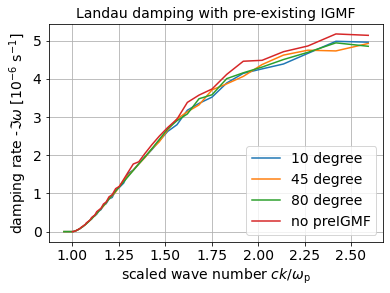

In [89]:
plt.plot(c*k/omega_p, -damp_rate[:, 0]*1e6, label='10 degree')
plt.plot(c*k/omega_p, -damp_rate[:, 1]*1e6, label='45 degree')
plt.plot(c*k/omega_p, -damp_rate[:, 2]*1e6, label='80 degree')
plt.plot(c*k_sub/omega_p, -rate0*1e6, label='no preIGMF')
plt.legend(loc='lower right', fontsize=14)
#plt.xlim([1, 1.5])
#plt.yscale('log')
plt.grid(True)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylabel('damping rate -$\Im \omega$ [$10^{-6}\ \mathrm{s^{-1}}$]', fontsize=14)
plt.xlabel('scaled wave number $ck/\omega_{\mathrm{p}}$', fontsize=14)
plt.title('Landau damping with pre-existing IGMF', fontsize=14)
plt.savefig('preIGMF.pdf')
plt.show()

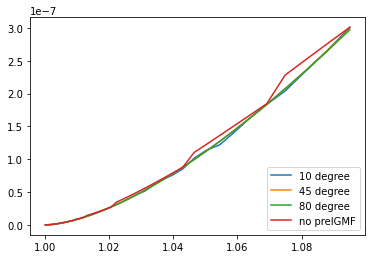

In [102]:
plt.plot(c*k[30:69]/omega_p, -damp_rate[30:69, 0], label='10 degree')
plt.plot(c*k[30:69]/omega_p, -damp_rate[30:69, 1], label='45 degree')
plt.plot(c*k[30:69]/omega_p, -damp_rate[30:69, 2], label='80 degree')
plt.plot(c*k[30:69]/omega_p, -rate0[:39], label='no preIGMF')
plt.legend(loc='lower right')
#plt.xlim([1, 1.2])
#plt.yscale('log')
plt.show()

In [35]:
IGM_00 = IGM.IGM_N(0, 0)
N, P, P_eV = IGM_00.get_P()

In [79]:
f_He = 0.079 # helium mass fraction
f_H = 0.76 # hydrogen fraction
Y_He = 0.24

z_reion_He = 3 # redshift that He is fully ionized
z_reion_H = 8 # redshift that H is fully ionized

def get_rate(z_assume, k):
    #print(k)
    index_z = np.where(IGM_00.z > z_assume)[-1][-1]
    z = 2
    #print('z', z)
    omega_b = omega_b_0 * (1 + z)**3
    mean_n_b = 3 * omega_b * H_0 * H_0 / (8 * np.pi * G * m_p) # mean number density of baryons at the redshift
    n_b = mean_n_b * IGM_00.Delta[index_z] # local number density of baryons at the redshitf
    
    n_H = n_b * (1 - Y_He) # nuclei in hydrogen
    n_He = n_H * f_He # nuclei in helium, assume He is all 4He

    if z <= z_reion_He: # fully ionized
        n_e = n_H + 2 * n_He
    if z_reion_He < z <= z_reion_H: # He is singly ionized
        n_e = n_H + n_He
    if z > z_reion_H: # neutral
        n_e = 0
    
    omega_p = (4 * np.pi * r0 * n_e)**0.5 * c
    #print(omega_p/c)
    E_min = E_e * ((1 - omega_p**2 / c**2 / k**2)**(-0.5) - 1)
    #print(c*k/omega_p)
    #print('E_min', E_min)
    
    n_e_th = n_e
    co1 = -np.pi / 4 * omega_p * (omega_p / c / k)**3 * E_e / n_e_th
    
    if E_min < min(IGM.E):
        index_E1 = 0
    else:
        #print(E_min, np.where(IGM.E < E_min))
        index_E1 = np.where(IGM.E < E_min)[-1][-1]
    index_E2 = np.where(IGM.E > E_min)[0][0]
    N_Emin = (N[index_E2][index_z] - N[index_E1][index_z]) * E_min + N[index_E1][index_z]
    
    int_NEdE = N_Emin * (E_min - IGM.E[index_E1]) / np.sqrt(E_min * (E_min + 2 * E_e))
    for i in range(index_E2, IGM.mstep):
        E = IGM.E[i]
        if i == index_E2:
            NEdE = N[i][index_z] * (E - E_min) / np.sqrt(E * (E + 2 * E_e))
        else:
            NEdE = N[i][index_z] * (E - IGM.E[i - 1]) / np.sqrt(E * (E + 2 * E_e))
        int_NEdE += NEdE
        
    co2 = (E_min + E_e) * N_Emin / np.sqrt(E_min * (E_min + 2 * E_e)) + 2 * int_NEdE
    
    if c * k / omega_p - 1 <= 0:
        co3 = 0
    else:
        co3 = 1
        
    return co1 * co2 * co3

In [101]:
print(c*k/omega_p)
print(np.where(c*k/omega_p>1))
print(np.where(c*k/omega_p<1.1))

[0.95417166 0.95751956 0.96063974 0.96354789 0.9662588  0.96878638
 0.97114373 0.97334316 0.97539623 0.97731383 0.97910617 0.98078289
 0.98235302 0.98382508 0.98520709 0.98650661 0.9877308  0.98888641
 0.98997984 0.99101718 0.9920042  0.99294643 0.99384916 0.99471747
 0.99555626 0.99637028 0.99716415 0.99794237 0.99870939 0.99946959
 1.00022732 1.00098693 1.00175279 1.00252932 1.003321   1.00413242
 1.0049683  1.00583349 1.00673306 1.00767225 1.00865658 1.00969185
 1.01078416 1.01193997 1.01316615 1.01447001 1.01585934 1.01734248
 1.01892839 1.02062664 1.02244759 1.02440235 1.02650295 1.02876236
 1.03119462 1.03381497 1.03663991 1.03968737 1.04297684 1.04652955
 1.05036861 1.05451927 1.05900908 1.06386818 1.06912958 1.07482946
 1.08100755 1.08770753 1.0949775  1.10287049 1.1114451  1.12076613
 1.13090545 1.14194283 1.15396709 1.16707723 1.1813839  1.19701108
 1.21409795 1.23280124 1.25329788 1.27578817 1.30049957 1.32769117
 1.35765913 1.39074304 1.42733386 1.46788326 1.51291526 1.5630

In [71]:
k_sub = k[30:]
print(c*k_sub/omega_p)

[1.00022732 1.00098693 1.00175279 1.00252932 1.003321   1.00413242
 1.0049683  1.00583349 1.00673306 1.00767225 1.00865658 1.00969185
 1.01078416 1.01193997 1.01316615 1.01447001 1.01585934 1.01734248
 1.01892839 1.02062664 1.02244759 1.02440235 1.02650295 1.02876236
 1.03119462 1.03381497 1.03663991 1.03968737 1.04297684 1.04652955
 1.05036861 1.05451927 1.05900908 1.06386818 1.06912958 1.07482946
 1.08100755 1.08770753 1.0949775  1.10287049 1.1114451  1.12076613
 1.13090545 1.14194283 1.15396709 1.16707723 1.1813839  1.19701108
 1.21409795 1.23280124 1.25329788 1.27578817 1.30049957 1.32769117
 1.35765913 1.39074304 1.42733386 1.46788326 1.51291526 1.5630403
 1.61897266 1.68155199 1.75177007 1.83080437 1.92006025 2.0212245
 2.13633363 2.26786159 2.41883335 2.59297303]


In [80]:
rate0 = np.zeros((len(k_sub), ))
for i in range(len(k_sub)):
    #print(k_sub[i])
    rate0[i] = get_rate(z, k_sub[i])

In [81]:
print(rate0)

[-1.13839691e-11 -1.58882217e-10 -4.77150036e-10 -8.74881180e-10
 -1.36525698e-09 -2.12136353e-09 -2.82314289e-09 -3.74834429e-09
 -4.28614853e-09 -5.67328596e-09 -6.47717036e-09 -8.53336308e-09
 -9.72630056e-09 -1.10749018e-08 -1.44816365e-08 -1.64526413e-08
 -1.86708623e-08 -2.11644107e-08 -2.39646594e-08 -2.71026599e-08
 -3.49225870e-08 -3.93725386e-08 -4.43333830e-08 -4.98537770e-08
 -5.59832619e-08 -6.27805139e-08 -7.03010914e-08 -7.86044135e-08
 -8.77569434e-08 -1.10420029e-07 -1.22804382e-07 -1.36343719e-07
 -1.51114172e-07 -1.67189561e-07 -1.84621316e-07 -2.28075896e-07
 -2.50736439e-07 -2.75072892e-07 -3.01120730e-07 -3.66764539e-07
 -3.99470107e-07 -4.33981089e-07 -5.22338618e-07 -5.64248202e-07
 -6.07732632e-07 -7.22296797e-07 -7.72880672e-07 -9.09476295e-07
 -9.66130518e-07 -1.12494736e-06 -1.18536737e-06 -1.36464164e-06
 -1.55959210e-06 -1.76919408e-06 -1.82816110e-06 -2.04614858e-06
 -2.27091373e-06 -2.49860607e-06 -2.72411293e-06 -2.94205527e-06
 -3.38209786e-06 -3.57217